In [9]:
import pandas as pd
import datetime
code = pd.read_csv('./data/code.csv')
codes = ['A', 'AG', 'AL', 'AP', 'AU', 'B', 'BU', 'C', 'CF', 'CS', 'CU', 'CY',
       'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP',
       'RB', 'RM', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN']

code = code[code.underlying_symbol.isin(codes)]
code.industry_name.unique()

array(['油脂', '贵金属', '有色', '农产品', '化工', '谷物', '软商品', '建材', '焦煤钢矿', '能源'],
      dtype=object)

#### Long-lived Predictor

In [18]:
df_usage = pd.DataFrame(feature_usage)
df_usage["month"] = pd.to_datetime(df_usage["month"])

,symbol,month,feature
0,A,2018-02-28,A_lag0
1,A,2018-03-31,A_lag0
2,A,2018-03-31,AG_lag0
3,A,2018-03-31,AU_lag0
4,A,2018-03-31,B_lag0
...,...,...,...
19689,ZN,2024-08-31,ZN_lag0
19690,ZN,2024-10-31,JD_lag0
19691,ZN,2024-10-31,SF_lag0
19692,ZN,2024-10-31,SN_lag0


In [19]:
import pandas as pd
df_usage = pd.read_csv('short_lived.csv').iloc[:,1:]
df_usage["month"] = pd.to_datetime(df_usage["month"])
df_usage

,symbol,month,feature,midx,gap,run_id
0,A,2018-03-31,AG_lag0,24219,0,0
1,A,2018-04-30,AG_lag0,24220,0,0
2,A,2019-03-31,AG_lag0,24231,1,1
3,A,2021-12-31,AG_lag0,24264,1,2
4,A,2023-06-30,AG_lag0,24282,1,3
...,...,...,...,...,...,...
19689,ZN,2024-05-31,ZN_lag0,24293,1,10
19690,ZN,2024-06-30,ZN_lag0,24294,0,10
19691,ZN,2024-07-31,ZN_lag0,24295,0,10
19692,ZN,2024-08-31,ZN_lag0,24296,0,10


#### other characteristics

In [30]:
import pandas as pd
com_1d_bar = pd.read_parquet('./data/com_1d_1824.parquet', engine = 'fastparquet').reset_index()
com_1d_bar = com_1d_bar[['underlying_symbol', 'date', 'volume', 
                        'open_interest', 'close']]
com_1d_bar

,underlying_symbol,date,volume,open_interest,close
0,A,2018-01-02,92242.0,233118.0,2863.0
1,A,2018-01-03,134428.0,233774.0,2883.0
2,A,2018-01-04,89870.0,237044.0,2893.0
3,A,2018-01-05,167556.0,235366.0,2896.0
4,A,2018-01-08,94634.0,233268.0,2912.0
...,...,...,...,...,...
61159,ZN,2024-12-25,139070.0,142766.0,25125.0
61160,ZN,2024-12-26,140056.0,150232.0,25095.0
61161,ZN,2024-12-27,155198.0,143526.0,24875.0
61162,ZN,2024-12-30,142279.0,139968.0,25025.0


In [31]:
df = com_1d_bar.copy()
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(['underlying_symbol','date'])
df['ret'] = df.groupby('underlying_symbol')['close'].pct_change()
df['illiq'] = df['ret'].abs() / df['volume']

df['month'] = df['date'].dt.to_period('M')
monthly = df.groupby(['underlying_symbol','month']).agg(
    volume_avg         = ('volume',       'mean'),   # 月度平均成交量
    open_interest_avg  = ('open_interest','mean'),   # 月度平均持仓量
    amihud_illiq       = ('illiq',        'mean')    # 月度平均 Amihud 非流动性
).reset_index()
monthly

,underlying_symbol,month,volume_avg,open_interest_avg,amihud_illiq
0,A,2018-01,122304.909091,261892.727273,4.831904e-08
1,A,2018-02,115868.400000,236632.400000,5.414788e-08
2,A,2018-03,166621.000000,167637.727273,3.576080e-08
3,A,2018-04,162731.666667,164267.111111,5.622766e-08
4,A,2018-05,150354.090909,189205.909091,4.746990e-08
...,...,...,...,...,...
3019,ZN,2024-08,175065.909091,96654.954545,6.198095e-08
3020,ZN,2024-09,195034.947368,99317.263158,6.276990e-08
3021,ZN,2024-10,192036.111111,108252.055556,6.479230e-08
3022,ZN,2024-11,215225.952381,109542.142857,3.853339e-08


In [33]:
monthly.to_csv('./data/month_characteristics.csv')

In [20]:
df_usage['pred_symbol'] = df_usage['feature'].str.split('_').str[0]
df_usage = df_usage.rename(columns={'symbol':'target_symbol'})
df_usage['month'] = df_usage['month'].dt.to_period('M')
df_usage

,target_symbol,month,feature,midx,gap,run_id,pred_symbol
0,A,2018-03-31,AG_lag0,24219,0,0,AG
1,A,2018-04-30,AG_lag0,24220,0,0,AG
2,A,2019-03-31,AG_lag0,24231,1,1,AG
3,A,2021-12-31,AG_lag0,24264,1,2,AG
4,A,2023-06-30,AG_lag0,24282,1,3,AG
...,...,...,...,...,...,...,...
19689,ZN,2024-05-31,ZN_lag0,24293,1,10,ZN
19690,ZN,2024-06-30,ZN_lag0,24294,0,10,ZN
19691,ZN,2024-07-31,ZN_lag0,24295,0,10,ZN
19692,ZN,2024-08-31,ZN_lag0,24296,0,10,ZN


In [25]:
df_chars = monthly.rename(columns={'underlying_symbol':'pred_symbol','month':'month'})
df_panel = pd.merge(df_usage, df_chars,
                    on=['pred_symbol','month'],
                    how='left')
df_panel = df_panel.dropna()
df_panel

,target_symbol,month,feature,midx,gap,run_id,pred_symbol,volume_avg,open_interest_avg,amihud_illiq
0,A,2018-03,AG_lag0,24219,0,0,AG,382979.000000,800562.454545,9.388630e-09
1,A,2018-04,AG_lag0,24220,0,0,AG,310634.555556,619215.000000,1.170536e-08
2,A,2019-03,AG_lag0,24231,1,1,AG,367596.666667,696350.857143,1.200099e-08
3,A,2021-12,AG_lag0,24264,1,2,AG,571924.217391,456077.521739,1.391011e-08
4,A,2023-06,AG_lag0,24282,1,3,AG,529850.650000,352680.350000,1.692180e-08
...,...,...,...,...,...,...,...,...,...,...
19689,ZN,2024-05,ZN_lag0,24293,1,10,ZN,204905.500000,108673.900000,5.717004e-08
19690,ZN,2024-06,ZN_lag0,24294,0,10,ZN,171542.000000,86786.578947,6.234682e-08
19691,ZN,2024-07,ZN_lag0,24295,0,10,ZN,163418.043478,88087.782609,5.362073e-08
19692,ZN,2024-08,ZN_lag0,24296,0,10,ZN,175065.909091,96654.954545,6.198095e-08


In [27]:
months   = df_usage['month'].unique()
targets  = df_usage['target_symbol'].unique()
cands    = df_chars['pred_symbol'].unique()

index = pd.MultiIndex.from_product([months, targets, cands],
                                   names=['month','target_symbol','pred_symbol'])
df_full = pd.DataFrame(index=index).reset_index()

df_full = df_full.merge(df_panel[['month','target_symbol','pred_symbol']],
                        on=['month','target_symbol','pred_symbol'],
                        how='left', indicator='sel')
df_full['selected'] = (df_full['sel']=='both').astype(int)
df_full.drop(columns=['sel'], inplace=True)

df_full = df_full.merge(df_chars,
                        on=['pred_symbol','month'],
                        how='left')

In [42]:
df_full

,month,target_symbol,pred_symbol,selected,volume_avg,open_interest_avg,amihud_illiq
0,2018-03,A,A,1,1.666210e+05,1.676377e+05,3.576080e-08
1,2018-03,A,AG,1,3.829790e+05,8.005625e+05,9.388630e-09
2,2018-03,A,AL,0,2.612685e+05,3.378138e+05,2.635760e-08
3,2018-03,A,AP,0,7.371563e+05,6.284573e+04,2.308545e-08
4,2018-03,A,AU,1,1.351875e+05,3.326518e+05,2.090315e-08
...,...,...,...,...,...,...,...
104971,2021-05,ZN,TA,1,1.854170e+06,1.830738e+06,9.353057e-09
104972,2021-05,ZN,V,1,5.156694e+05,4.022062e+05,2.521656e-08
104973,2021-05,ZN,Y,0,9.496106e+05,5.127994e+05,2.988520e-08
104974,2021-05,ZN,ZC,0,4.625258e+05,1.925654e+05,9.198331e-08


In [43]:
df_full = df_full[~df_full[['amihud_illiq']].isin([np.inf, -np.inf]).any(axis=1)].reset_index(drop=True)
df_full

,month,target_symbol,pred_symbol,selected,volume_avg,open_interest_avg,amihud_illiq
0,2018-03,A,A,1,1.666210e+05,1.676377e+05,3.576080e-08
1,2018-03,A,AG,1,3.829790e+05,8.005625e+05,9.388630e-09
2,2018-03,A,AL,0,2.612685e+05,3.378138e+05,2.635760e-08
3,2018-03,A,AP,0,7.371563e+05,6.284573e+04,2.308545e-08
4,2018-03,A,AU,1,1.351875e+05,3.326518e+05,2.090315e-08
...,...,...,...,...,...,...,...
103315,2021-05,ZN,TA,1,1.854170e+06,1.830738e+06,9.353057e-09
103316,2021-05,ZN,V,1,5.156694e+05,4.022062e+05,2.521656e-08
103317,2021-05,ZN,Y,0,9.496106e+05,5.127994e+05,2.988520e-08
103318,2021-05,ZN,ZC,0,4.625258e+05,1.925654e+05,9.198331e-08


In [51]:
import statsmodels.formula.api as smf
m = smf.logit('selected ~  amihud_illiq',
              data=df_full).fit(cov_type='cluster',
                               cov_kwds={'groups': df_full['month']})
print(m.summary())

Optimization terminated successfully.
         Current function value: 0.485551
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               selected   No. Observations:               103320
Model:                          Logit   Df Residuals:                   103318
Method:                           MLE   Df Model:                            1
Date:                Sun, 11 May 2025   Pseudo R-squ.:               3.808e-09
Time:                        07:18:36   Log-Likelihood:                -50167.
converged:                       True   LL-Null:                       -50167.
Covariance Type:              cluster   LLR p-value:                    0.9844
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       -1.4530      0.028    -52.023      0.000      -1.508      -1.398
amihud_illiq     0.4287

In [45]:
m2 = smf.ols('selected ~ volume_avg + open_interest_avg + amihud_illiq',
             data=df_full).fit(cov_type='cluster',
                              cov_kwds={'groups': df_full['month']})
print(m2.summary())

                            OLS Regression Results                            
Dep. Variable:               selected   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     4.717
Date:                Sun, 11 May 2025   Prob (F-statistic):             0.0116
Time:                        07:07:07   Log-Likelihood:                -49800.
No. Observations:              103320   AIC:                         9.961e+04
Df Residuals:                  103316   BIC:                         9.965e+04
Df Model:                           3                                         
Covariance Type:              cluster                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.1846      0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '


#### Sparse and short-lived predictors

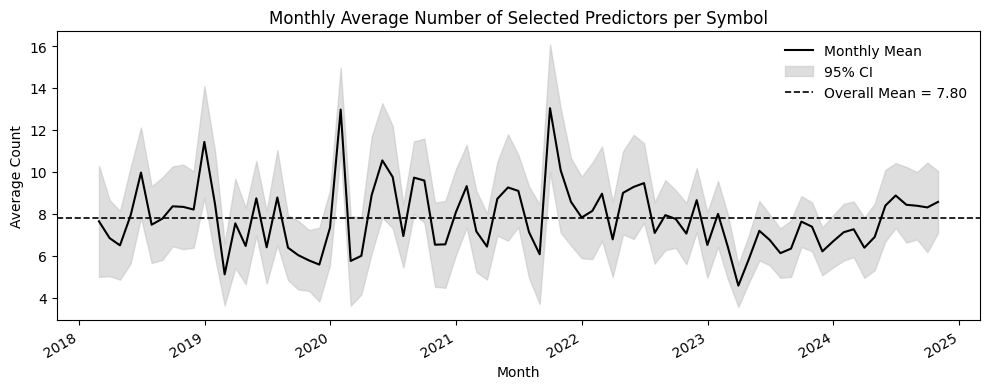

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ─── 1. 数据准备（与前相同）────────────────────────────────────
df_select = df_usage.copy()
df_select["month"] = pd.to_datetime(df_select["month"])

cnt_sm = (df_select.groupby(["month", "symbol"])["feature"]
                    .nunique()
                    .rename("n_pred")
                    .reset_index())

summary = (cnt_sm.groupby("month")["n_pred"]
                    .agg(["mean", "std", "count"])
                    .assign(se=lambda x: x["std"] / np.sqrt(x["count"]))
                    .assign(ci_lo=lambda x: x["mean"] - 1.96 * x["se"],
                            ci_hi=lambda x: x["mean"] + 1.96 * x["se"]))

overall_mean = summary["mean"].mean()

# ─── 2. 绘图（黑白）────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 4))

# 主折线：黑色
ax.plot(summary.index, summary["mean"],
        lw=1.5, color='black', label="Monthly Mean")

# 95% CI：浅灰填充
ax.fill_between(summary.index,
                summary["ci_lo"], summary["ci_hi"],
                color='0.75', alpha=0.5, label="95% CI")

# 全局平均线：黑色虚线
ax.axhline(overall_mean, color='black', ls='--', lw=1.2,
           label=f"Overall Mean = {overall_mean:.2f}")

ax.set_title("Monthly Average Number of Selected Predictors per Symbol")
ax.set_xlabel("Month")
ax.set_ylabel("Average Count")
ax.legend(frameon=False)
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

In [7]:
df_usage["midx"] = df_usage["month"].dt.year*12 + df_usage["month"].dt.month
df_usage = df_usage.sort_values(["symbol","feature","midx"])

# 找出不连续的地方，标记同一次 run
df_usage["gap"] = df_usage.groupby(["symbol","feature"])["midx"]\
                         .diff().fillna(1).ne(1).astype(int)
df_usage["run_id"] = df_usage.groupby(["symbol","feature"])["gap"].cumsum()

# 聚合每个 run 计算长度
surv = (df_usage
        .groupby(["symbol","feature","run_id"])
        .agg(start_month=("month","first"),
             end_month=("month","last"),
             duration_months=("month","count"))
        .reset_index(drop=True))

surv['duration_months'].describe()

count    9615.000000
mean        2.048258
std         3.430210
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max        81.000000
Name: duration_months, dtype: float64

In [13]:
df_usage['pred'] = df_usage['feature'].str.split('_').str[0]
df_usage = df_usage.sort_values(['symbol','pred','midx'])
# 连续两月 midx 差1 就认为是同一次 run，否则是新 run
df_usage['gap2'] = df_usage.groupby(['symbol','pred'])['midx']\
                           .diff().fillna(1).ne(1).astype(int)
df_usage['run2'] = df_usage.groupby(['symbol','pred'])['gap2'].cumsum()
surv2 = (
    df_usage
    .groupby(['symbol','pred','run2'])
    .agg(start=('month','first'),
         end  =('month','last'),
         duration_months=('month','count'))
    .reset_index(drop=False)
)
surv2['duration_months'].describe()

count    9615.000000
mean        2.048258
std         3.430210
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max        81.000000
Name: duration_months, dtype: float64

In [15]:
surv2

,symbol,pred,run2,start,end,duration_months
0,A,A,0,2018-02-28,2021-04-30,39
1,A,A,1,2021-06-30,2021-12-31,7
2,A,A,2,2022-04-30,2024-10-31,31
3,A,AG,0,2018-03-31,2018-04-30,2
4,A,AG,1,2019-03-31,2019-03-31,1
...,...,...,...,...,...,...
9610,ZN,ZN,7,2022-06-30,2022-08-31,3
9611,ZN,ZN,8,2022-10-31,2022-11-30,2
9612,ZN,ZN,9,2023-01-31,2024-02-29,14
9613,ZN,ZN,10,2024-05-31,2024-08-31,4


In [8]:
import pandas as pd
dur = (
    df_usage
    .groupby(['symbol','feature','run_id'])
    .size()                        # 每组的记录数，就是连续月份数
    .rename('duration')
    .reset_index()
)


max_dur = (
    dur
    .groupby(['symbol','feature'], as_index=False)['duration']
    .max()
)
top5 = (
    max_dur
    .sort_values(['symbol','duration'], ascending=[True, False])
    .groupby('symbol')
    .head(5)
    .reset_index(drop=True)
)

,symbol,feature,duration
0,A,A_lag0,39
1,A,B_lag0,9
2,A,RM_lag0,8
3,A,M_lag0,7
4,A,JD_lag0,5
...,...,...,...
175,ZN,ZN_lag0,18
176,ZN,CU_lag0,8
177,ZN,NI_lag0,8
178,ZN,PB_lag0,7


In [25]:
symbol2name = {
    'A': '豆一0303', 'AG': '白银1209', 'AL': '铝0001', 'AP': '鲜苹果1805',
    'AU': '黄金0806', 'B': '豆二0503', 'BU': '石油沥青1402', 'C': '玉米0501',
    'CF': '棉花0411', 'CS': '玉米淀粉1503', 'CU': '铜0001', 'CY': '棉纱1801',
    'FB': '纤维板1404', 'FG': '玻璃1303', 'HC': '热轧卷板1407', 'J': '焦炭1109',
    'JD': '鸡蛋1403', 'L': '聚乙烯0710', 'M': '豆粕0011', 'MA': '甲醇1506',
    'NI': '镍1507', 'OI': '菜籽油1307', 'PB': '铅1109', 'PP': '聚丙烯1405',
    'RB': '螺纹钢0909', 'RM': '菜籽粕1305', 'RU': '天然橡胶0001',
    'SF': '硅铁1411', 'SM': '锰硅1411', 'SN': '锡1507', 'SR': '白糖0605',
    'TA': 'PTA0702', 'V': '聚氯乙烯0909', 'Y': '豆油0603',
    'ZC': '动力煤1605', 'ZN': '锌0707'
}

def strip_digits(s: str) -> str:
    return re.sub(r'\d+$', '', s)

In [29]:
import re
top5['name_raw'] = top5['symbol'].map(symbol2name)
top5['name'] = top5['name_raw'].apply(strip_digits)
top5 = top5.drop(columns='name_raw')
top5

,symbol,feature,duration,name
0,A,A_lag0,39,豆一
1,A,B_lag0,9,豆一
2,A,RM_lag0,8,豆一
3,A,M_lag0,7,豆一
4,A,JD_lag0,5,豆一
...,...,...,...,...
175,ZN,ZN_lag0,18,锌
176,ZN,CU_lag0,8,锌
177,ZN,NI_lag0,8,锌
178,ZN,PB_lag0,7,锌


In [30]:
top5.to_csv('predictor_top5.csv')

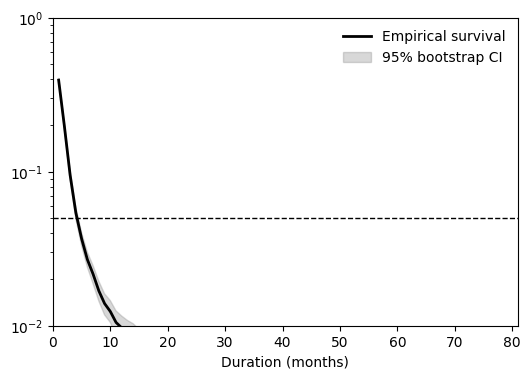

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


durations = surv["duration_months"].values

# 1. 经验存活点
# 取一系列 x 值（可以是 durations 的排序去重，也可以等距网格）
xs = np.sort(np.unique(durations))
# 对每个 x，算 P(duration > x)
emp_surv = np.array([ np.mean(durations > x) for x in xs ])

# 2. Bootstrap 构造置信带
n_boot = 200      # 你也可以用 500、1000 但要注意速度
alpha = 0.05
boot_survs = np.empty((n_boot, len(xs)))

rng = np.random.default_rng(2025)
for i in range(n_boot):
    sample = rng.choice(durations, size=len(durations), replace=True)
    boot_survs[i] = [ np.mean(sample > x) for x in xs ]

lower = np.quantile(boot_survs, alpha/2, axis=0)
upper = np.quantile(boot_survs, 1-alpha/2, axis=0)

# 3. 画图
plt.figure(figsize=(6,4))
plt.plot(xs, emp_surv, color="black", lw=2, label="Empirical survival")
plt.fill_between(xs, lower, upper, color="gray", alpha=0.3,
                 label="95% bootstrap CI")

# 横纵轴及刻度
plt.xlabel("Duration (months)")
# plt.ylabel(r"$\Pr(\text{duration} > x)$")
plt.yscale("log")                # y 轴 log 刻度
plt.ylim(1e-2, 1)                # 根据你的数据调一下
plt.xlim(0, xs.max())

# 刻度线：在 y=5% 处画一条点划线
plt.axhline(0.05, color="black", ls="--", lw=1)
# 找出 x 使得 survival ~0.05，对应坐标点也可以标注
# idx = np.argmin(np.abs(emp_surv - 0.05))
# x_05 = xs[idx]
# plt.axvline(x_05, color="black", ls="--", lw=1)
# plt.text(x_05, 0.02, f"{x_05:.1f} m", ha="center")

plt.legend(frameon=False, loc="upper right")
plt.show()

#### institutional

In [3]:
import pandas as pd
com_1d_bar = pd.read_parquet('/mnt/data/com_1d_bar.parquet', engine = 'fastparquet').reset_index()
com_1d_bar = com_1d_bar[['underlying_symbol', 'date', 'volume', 
                        'open_interest', 'close']]
com_1d_bar['date'] = pd.to_datetime(com_1d_bar['date'])
com_1d_bar = com_1d_bar[com_1d_bar['date'] > '2018-01-01']
com_1d_bar

,underlying_symbol,date,volume,open_interest,close
1944,A,2018-01-02,92242.0,233118.0,2839.0
1945,A,2018-01-03,134428.0,233774.0,2859.0
1946,A,2018-01-04,89870.0,237044.0,2869.0
1947,A,2018-01-05,167556.0,235366.0,2872.0
1948,A,2018-01-08,94634.0,233268.0,2888.0
...,...,...,...,...,...
140351,ZN,2024-12-25,139070.0,142766.0,25335.0
140352,ZN,2024-12-26,140056.0,150232.0,25305.0
140353,ZN,2024-12-27,155198.0,143526.0,25085.0
140354,ZN,2024-12-30,142279.0,139968.0,25235.0


#### Shap分析

In [2]:
import pipeline_shap as pp
symbols = list(pivot_ret.columns)
print(symbols)
model_type = "lasso"
start_date = datetime.datetime(2018, 1, 1)
end_date   = datetime.datetime(2024, 12, 31)

all_preds = {}
all_shap = {}

for sym in symbols:
    print(f"开始处理 symbol: {sym}")
    X, y, dt_index = pp.build_super_matrix(pivot_ret, target_symbol=sym, lag = 3)
    preds, shap_imp = pp.rolling_forecast(X, y, dt_index,
                             start_date=start_date,
                             end_date=end_date,
                             target_model=model_type)
    r2_os_value = pp.calc_r2_os_with_benchmark_zero(preds)
    print("Out-of-sample R^2 (compared to 0):", r2_os_value)
    
    top5_rf = shap_imp["lasso"].head(5)
    print("lasso 重要度 Top5:\n", top5_rf)
    all_preds[f"pred_{sym}"] = preds
    all_shap[f"shap_{sym}"] = top5_rf.index.tolist()

final_preds = pd.concat(all_preds, axis=0, ignore_index=True)
final_preds.to_parquet("all_rolling_predictions_test_lasso.parquet", engine = 'fastparquet')
print("Rolling predictions have been saved to rolling_predictions.csv")

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


['A', 'AG', 'AL', 'AP', 'AU', 'B', 'BU', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN']
开始处理 symbol: A
开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.005386360502729892
lasso 重要度 Top5:
 A_lag0     0.000029
A_lag1     0.000002
RM_lag0    0.000002
B_lag0     0.000002
M_lag0     0.000001
dtype: float64
开始处理 symbol: AG


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.0022655251301353374
lasso 重要度 Top5:
 AG_lag0    1.270681e-05
AU_lag0    2.227196e-06
AG_lag1    7.029286e-07
AU_lag2    6.560096e-07
CU_lag0    6.359844e-07
dtype: float64
开始处理 symbol: AL


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.009440453417495331
lasso 重要度 Top5:
 AL_lag0    0.000034
AL_lag1    0.000004
ZN_lag0    0.000004
CU_lag0    0.000003
NI_lag0    0.000001
dtype: float64
开始处理 symbol: AP


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.0020225733086863817
lasso 重要度 Top5:
 AP_lag0    0.000025
JD_lag0    0.000001
AP_lag1    0.000001
ZN_lag0    0.000001
AP_lag2    0.000001
dtype: float64
开始处理 symbol: AU


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.0029769624852254983
lasso 重要度 Top5:
 AU_lag0    3.726946e-06
AU_lag1    3.164806e-07
NI_lag0    6.913626e-08
CU_lag0    6.848827e-08
AG_lag0    3.311185e-08
dtype: float64
开始处理 symbol: B


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.010081395965140683
lasso 重要度 Top5:
 B_lag0    0.000128
M_lag0    0.000034
B_lag1    0.000024
Y_lag0    0.000021
A_lag0    0.000020
dtype: float64
开始处理 symbol: BU


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.01987972927650261
lasso 重要度 Top5:
 BU_lag0    0.000092
BU_lag1    0.000015
TA_lag0    0.000007
PP_lag0    0.000006
MA_lag0    0.000004
dtype: float64
开始处理 symbol: C


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.06135267621044416
lasso 重要度 Top5:
 C_lag0     0.000080
CS_lag0    0.000024
C_lag1     0.000018
CS_lag1    0.000002
C_lag2     0.000002
dtype: float64
开始处理 symbol: CF


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.009589658124324996
lasso 重要度 Top5:
 CF_lag0    0.000044
CY_lag0    0.000006
CF_lag1    0.000005
RU_lag0    0.000004
NI_lag0    0.000002
dtype: float64
开始处理 symbol: CS


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.02380943515958389
lasso 重要度 Top5:
 CS_lag0    4.508484e-05
C_lag0     1.146322e-05
CS_lag1    5.544655e-06
RM_lag0    8.879270e-07
M_lag0     7.980286e-07
dtype: float64
开始处理 symbol: CU


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.0019896482931706094
lasso 重要度 Top5:
 CU_lag0    1.189351e-05
ZN_lag0    1.261713e-06
J_lag0     7.354563e-07
CU_lag1    7.239624e-07
NI_lag0    6.818236e-07
dtype: float64
开始处理 symbol: CY


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.018570253818689375
lasso 重要度 Top5:
 CY_lag0    0.000040
CF_lag0    0.000032
CY_lag1    0.000008
CF_lag1    0.000005
RU_lag0    0.000002
dtype: float64
开始处理 symbol: FB


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing re

开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2018-08-01 00:00:00
开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing re

开始预测2020-09-01 00:00:00
开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.005191841768481198
lasso 重要度 Top5:
 FB_lag0    2.110836e-05
FB_lag1    3.672245e-06
FB_lag2    1.808546e-06
FG_lag0    5.437546e-07
ZC_lag2    5.430039e-07
dtype: float64
开始处理 symbol: FG


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.027995038410721373
lasso 重要度 Top5:
 FG_lag0    0.000130
FG_lag1    0.000022
RB_lag0    0.000013
J_lag0     0.000008
HC_lag0    0.000006
dtype: float64
开始处理 symbol: HC


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.004628376629161601
lasso 重要度 Top5:
 HC_lag0    0.000052
RB_lag0    0.000012
HC_lag1    0.000005
J_lag0     0.000005
RB_lag1    0.000002
dtype: float64
开始处理 symbol: J


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): -0.0010553206306103124
lasso 重要度 Top5:
 J_lag0     0.000082
RB_lag0    0.000016
J_lag1     0.000015
HC_lag0    0.000013
RB_lag1    0.000009
dtype: float64
开始处理 symbol: JD


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.013296367553949806
lasso 重要度 Top5:
 JD_lag0    0.000047
AP_lag0    0.000001
V_lag0     0.000001
JD_lag1    0.000001
B_lag0     0.000001
dtype: float64
开始处理 symbol: L


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.0339337598659567
lasso 重要度 Top5:
 L_lag0     0.000090
PP_lag0    0.000041
L_lag1     0.000019
V_lag0     0.000009
PP_lag1    0.000004
dtype: float64
开始处理 symbol: M


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.023569240689618742
lasso 重要度 Top5:
 M_lag0     0.000215
RM_lag0    0.000067
M_lag1     0.000037
B_lag0     0.000022
A_lag0     0.000009
dtype: float64
开始处理 symbol: MA


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.011766559766579254
lasso 重要度 Top5:
 MA_lag0    0.000071
PP_lag0    0.000011
MA_lag1    0.000009
L_lag0     0.000004
BU_lag0    0.000003
dtype: float64
开始处理 symbol: NI


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): -6.274988615162513e-06
lasso 重要度 Top5:
 NI_lag0    4.673842e-06
NI_lag1    1.218990e-06
Y_lag0     1.104675e-06
AU_lag0    9.450134e-07
CU_lag0    9.017793e-07
dtype: float64
开始处理 symbol: OI


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.00038121893635956194
lasso 重要度 Top5:
 OI_lag0    9.994060e-06
Y_lag0     2.204992e-06
OI_lag1    1.132054e-06
FB_lag1    7.101732e-07
ZC_lag1    5.459511e-07
dtype: float64
开始处理 symbol: PB


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.011216101785599952
lasso 重要度 Top5:
 PB_lag0    0.000031
ZN_lag0    0.000004
PB_lag1    0.000004
CU_lag0    0.000001
NI_lag0    0.000001
dtype: float64
开始处理 symbol: PP


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.0008982411681499602
lasso 重要度 Top5:
 PP_lag0    7.893379e-06
PP_lag1    6.101371e-07
V_lag0     4.959828e-07
MA_lag1    4.761015e-07
JD_lag0    4.392951e-07
dtype: float64
开始处理 symbol: RB


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.0055356231578032045
lasso 重要度 Top5:
 RB_lag0    0.000057
HC_lag0    0.000016
J_lag0     0.000007
RB_lag1    0.000004
RU_lag0    0.000002
dtype: float64
开始处理 symbol: RM


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.015906410072590194
lasso 重要度 Top5:
 RM_lag0    0.000124
M_lag0     0.000039
RM_lag1    0.000014
B_lag0     0.000007
A_lag0     0.000005
dtype: float64
开始处理 symbol: RU


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.00843974423424998
lasso 重要度 Top5:
 RU_lag0    0.000033
CF_lag0    0.000002
RU_lag1    0.000002
V_lag0     0.000001
Y_lag0     0.000001
dtype: float64
开始处理 symbol: SF


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.004217458672233332
lasso 重要度 Top5:
 SF_lag0    0.000043
SM_lag0    0.000005
HC_lag0    0.000004
SF_lag1    0.000003
J_lag0     0.000002
dtype: float64
开始处理 symbol: SM


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.0029878809376102655
lasso 重要度 Top5:
 SM_lag0    0.000033
SF_lag0    0.000004
J_lag0     0.000003
SM_lag1    0.000002
V_lag0     0.000002
dtype: float64
开始处理 symbol: SN


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.0002270869100022832
lasso 重要度 Top5:
 SN_lag0    0.000017
ZN_lag0    0.000003
CU_lag0    0.000002
ZN_lag1    0.000001
CU_lag1    0.000001
dtype: float64
开始处理 symbol: SR


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.004557718990686799
lasso 重要度 Top5:
 SR_lag0    1.834134e-05
SR_lag1    1.284671e-06
RU_lag0    9.756705e-07
ZN_lag0    5.315072e-07
RU_lag1    5.146954e-07
dtype: float64
开始处理 symbol: TA


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.011998961582669998
lasso 重要度 Top5:
 TA_lag0    0.000063
TA_lag1    0.000008
PP_lag0    0.000004
BU_lag0    0.000003
L_lag0     0.000003
dtype: float64
开始处理 symbol: V


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.030403410115704133
lasso 重要度 Top5:
 V_lag0     0.000079
V_lag1     0.000016
PP_lag0    0.000013
L_lag0     0.000008
V_lag2     0.000003
dtype: float64
开始处理 symbol: Y


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.01087029506196624
lasso 重要度 Top5:
 Y_lag0     0.000076
OI_lag0    0.000019
Y_lag1     0.000009
Y_lag2     0.000002
RU_lag0    0.000002
dtype: float64
开始处理 symbol: ZC


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing re

开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.01307309489318742
lasso 重要度 Top5:
 ZC_lag0    0.000070
ZC_lag1    0.000015
J_lag0     0.000011
RB_lag0    0.000007
ZC_lag2    0.000004
dtype: float64
开始处理 symbol: ZN
开始预测2018-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
Out-of-sample R^2 (compared to 0): 0.0011560951672108244
lasso 重要度 Top5:
 ZN_lag0    0.000015
NI_lag0    0.000002
AL_lag0    0.000002
CU_lag0    0.000001
PB_lag0    0.000001
dtype: float64


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Rolling predictions have been saved to rolling_predictions.csv


#### DM TEST

In [47]:
rid_tech = pd.read_parquet('/mnt/data/rid_all_1min.parquet', engine = 'fastparquet')
las_tech = pd.read_parquet('/mnt/data/lasso_all_1min.parquet')
enet_tech = pd.read_parquet('/mnt/data/enet_all_1min.parquet')
pls_tech = pd.read_parquet('/mnt/data/pls_all_1min.parquet')
pcr_tech = pd.read_parquet('/mnt/data/pcr_all_1min.parquet')

In [12]:
import pandas as pd
rf_tech = pd.read_parquet('rf_tech_1min.parquet', engine = 'fastparquet')
gbt_tech = pd.read_parquet('gbt_tech_1min.parquet', engine = 'fastparquet')

In [13]:
nl_ens_tech = gbt_tech
nl_ens_tech['y_pred'] = (rf_tech.y_pred.values + gbt_tech.y_pred.values) / 2
nl_ens_tech

,datetime,y_true,y_pred
0,2018-04-02 09:01:00,0.000338,-0.000033
1,2018-04-02 09:02:00,-0.001013,-0.000038
2,2018-04-02 09:03:00,-0.001691,0.000042
3,2018-04-02 09:04:00,0.002029,0.000076
4,2018-04-02 09:05:00,-0.001014,-0.000048
...,...,...,...
12546455,2024-12-30 14:56:00,0.000198,-0.000059
12546456,2024-12-30 14:57:00,0.000000,0.000040
12546457,2024-12-30 14:58:00,-0.000198,0.000063
12546458,2024-12-30 14:59:00,0.000198,-0.000086


In [48]:
l_ens_all = pcr_tech
l_ens_all['y_pred'] = (rid_tech.y_pred.values + las_tech.y_pred.values + enet_tech.y_pred.values
                        + pls_tech.y_pred.values + pcr_tech.y_pred.values) / 5
l_ens_all

,datetime,y_true,y_pred
0,2018-04-02 09:02:00,0.000338,-1.730843e-04
1,2018-04-02 09:03:00,-0.001013,-9.700818e-05
2,2018-04-02 09:04:00,-0.001691,3.847937e-05
3,2018-04-02 09:05:00,0.002029,1.267234e-04
4,2018-04-02 09:06:00,-0.001014,-7.022196e-05
...,...,...,...
12546455,2024-12-30 14:57:00,0.000198,2.040544e-06
12546456,2024-12-30 14:58:00,0.000000,-5.448476e-06
12546457,2024-12-30 14:59:00,-0.000198,9.404869e-07
12546458,2024-12-30 15:00:00,0.000198,2.481372e-05


In [11]:
nl_ens_all.to_parquet('nl_ens_all.parquet')

In [20]:
import pandas as pd
pred_combo = pd.read_parquet('/mnt/NN_tech_1min.parquet', engine = 'fastparquet')
pred_tech = pd.read_parquet('/mnt/NN_ALL_1min.parquet', engine = 'fastparquet')
# pred_combo['y_pred2'] = pred_tech['y_pred'].values
pred_combo

,datetime,y_true,y_pred
0,2018-05-02 09:01:00,-0.000682,-0.000649
1,2018-05-02 09:02:00,-0.001023,-0.000471
2,2018-05-02 09:03:00,-0.002050,-0.000874
3,2018-05-02 09:04:00,0.002391,0.000018
4,2018-05-02 09:05:00,0.000000,-0.000197
...,...,...,...
12825465,2024-12-30 14:56:00,0.000198,-0.000047
12825466,2024-12-30 14:57:00,0.000000,-0.000011
12825467,2024-12-30 14:58:00,-0.000198,-0.000011
12825468,2024-12-30 14:59:00,0.000198,0.000015


In [21]:
codes = ['A', 'AG', 'AL', 'AP', 'AU', 'B', 'BU', 'C', 'CF', 'CS', 'CU', 'CY',
       'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP',
       'RB', 'RM', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN']

pred_combo['code'] = (
    pred_combo.groupby('datetime').cumcount()          
      .map(dict(enumerate(codes)))
)
pred_combo

,datetime,y_true,y_pred,code
0,2018-05-02 09:01:00,-0.000682,-0.000649,A
1,2018-05-02 09:02:00,-0.001023,-0.000471,A
2,2018-05-02 09:03:00,-0.002050,-0.000874,A
3,2018-05-02 09:04:00,0.002391,0.000018,A
4,2018-05-02 09:05:00,0.000000,-0.000197,A
...,...,...,...,...
12825465,2024-12-30 14:56:00,0.000198,-0.000047,ZC
12825466,2024-12-30 14:57:00,0.000000,-0.000011,ZC
12825467,2024-12-30 14:58:00,-0.000198,-0.000011,ZC
12825468,2024-12-30 14:59:00,0.000198,0.000015,ZC


In [50]:
import pipelinev2 as pp
pp.calc_r2_os_with_benchmark_zero(l_ens_all)

0.0011704968698506013

In [17]:
# prediction = pd.read_csv('/mnt/all_rolling_predictions_lasso_1min.csv')
prediction = pd.read_parquet('/mnt/nl_ens.parquet', engine = 'fastparquet')
codes = ['A', 'AG', 'AL', 'AP', 'AU', 'B', 'BU', 'C', 'CF', 'CS', 'CU', 'CY',
       'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP',
       'RB', 'RM', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN']

prediction['code'] = (
    prediction.groupby('datetime').cumcount()          
      .map(dict(enumerate(codes)))
)
prediction

,datetime,y_true,y_pred,code
0,2018-04-02 09:02:00,-0.001013,6.934812e-05,A
1,2018-04-02 09:03:00,-0.001691,-5.949207e-05,A
2,2018-04-02 09:04:00,0.002029,1.188195e-04,A
3,2018-04-02 09:05:00,-0.001014,1.283659e-05,A
4,2018-04-02 09:06:00,-0.001354,-4.374895e-06,A
...,...,...,...,...
12732403,2024-12-30 14:55:00,0.000000,4.915467e-07,ZN
12732404,2024-12-30 14:56:00,0.000198,1.444072e-06,ZN
12732405,2024-12-30 14:57:00,0.000000,5.621405e-06,ZN
12732406,2024-12-30 14:58:00,-0.000198,1.414112e-07,ZN


In [17]:
r2_by_code = (
    pred_combo.groupby('code', group_keys=False)
      .apply(calc_r2_os_with_benchmark_zero)
      .rename('r2_os')
)

r2_by_code = r2_by_code.reset_index()
print(r2_by_code.head())

  code     r2_os
0    A  0.004517
1   AG  0.001572
2   AL  0.009929
3   AP -0.000670
4   AU  0.001207


In [18]:
r2_by_code_lasso['r2_os_all'] = r2_by_code['r2_os'].values
r2_by_code_lasso

,code,r2_os,r2_os_tech,r2_os_all
0,A,0.005523,0.004482,0.004517
1,AG,0.002417,0.001587,0.001572
2,AL,0.009764,0.010165,0.009929
3,AP,0.002611,0.003163,-0.000670
4,AU,0.002766,0.001123,0.001207
5,B,0.010617,0.005432,0.003771
6,BU,0.019167,0.016209,0.015604
7,C,0.054350,0.070125,0.073399
8,CF,0.009964,0.011054,0.010269
9,CS,0.022861,0.026675,0.026930


In [20]:
r2_by_code_lasso = r2_by_code_lasso[r2_by_code_lasso['code'] != 'CY']

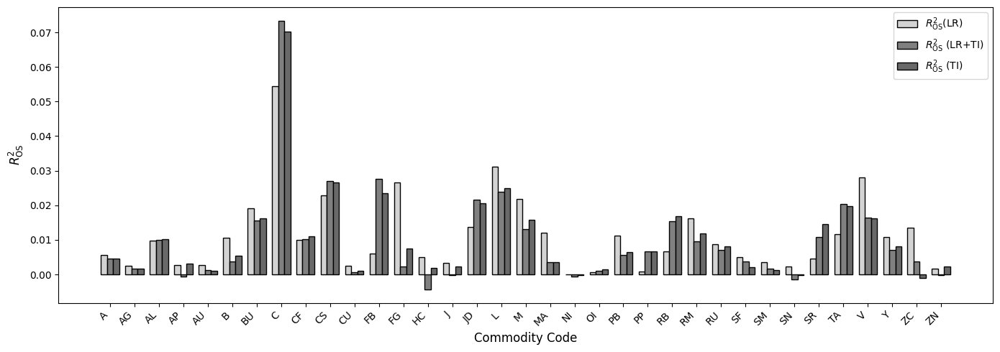

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
df  = r2_by_code_lasso

# 2) Plot settings
n = len(df)
ind = np.arange(n)           # the x locations for the groups
width = 0.25                 # the width of the bars

fig, ax = plt.subplots(figsize=(14,5))

# three bar series in different gray levels
ax.bar(ind - width, df['r2_os'],      width,
       label=r'$R^2_{\mathrm{OS}}$(LR)',
       color='lightgray', edgecolor='black')
ax.bar(ind,         df['r2_os_all'],  width,
       label=r'$R^2_{\mathrm{OS}}$ (LR+TI)',
       color='gray',      edgecolor='black')
ax.bar(ind + width, df['r2_os_tech'], width,
       label=r'$R^2_{\mathrm{OS}}$ (TI)',
       color='dimgray',   edgecolor='black')

# 3) Labels, ticks, legend
ax.set_xlabel('Commodity Code', fontsize=12)
ax.set_ylabel(r'$R^2_{\mathrm{OS}}$', fontsize=12)
ax.set_xticks(ind)
ax.set_xticklabels(df['code'], rotation=45, ha='right')
ax.legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.savefig("r2_bar.pdf", bbox_inches="tight")
plt.show()

In [18]:
prediction = prediction.loc[:nl_ens_all.shape[0]-1]
# pred_combo = pred_combo.loc[:prediction.shape[0]-1]

In [20]:
import numpy as np
import pandas as pd
from scipy import stats

def dm_test(df1,df2,
            h: int = 1, loss: str = "mse") -> tuple:

    e1 = df1['y_true'] - df1['y_pred']
    e2 = df2['y_true'] - df2['y_pred']   # y_true 相同
    if loss == "mse":
        d_t = e1**2 - e2**2
    elif loss == "abs":
        d_t = np.abs(e1) - np.abs(e2)
    else:
        raise ValueError("loss must be 'mse' or 'abs'.")

    d_t = d_t.dropna()
    T   = len(d_t)
    
    mean_d = d_t.mean()
    gamma0 = np.var(d_t, ddof=1)
    var_d  = gamma0 / T    # 若 h=1，HAC 退化为 gamma0/T
    if h > 1:
        for j in range(1, h):
            gamma_j = np.cov(d_t[j:], d_t[:-j], ddof=0)[0, 1]
            var_d  += 2 * (1 - j/h) * gamma_j / T

    dm_stat = mean_d / np.sqrt(var_d)
    p_value = 2 * (1 - stats.norm.cdf(abs(dm_stat)))   # 双侧

    return dm_stat, p_value

dm1, p1 = dm_test(nl_ens_all, prediction, h=1)
print(f"Combo vs Lag  DM={dm1:.3f},  p={p1:.4f}")

Combo vs Lag  DM=39.422,  p=0.0000


In [21]:
import pipelinev3 as pp
pp.calc_r2_os_with_benchmark_zero(prediction)

0.01024554823289514

#### arbitrage cost index

In [7]:
def safe_decile(series, ascending=True):
    s = series.dropna()
    if s.empty:
        return pd.Series(np.nan, index=series.index)
    n = len(s)
    if n >= 10:
        dec = (
            pd.qcut(
                s.rank(method='first', ascending=ascending),
                10, labels=False
            ) + 1
        )
    else:
        rk = s.rank(method='first', ascending=ascending)
        dec = np.ceil(rk * 10 / n).astype(int)

    out = pd.Series(np.nan, index=series.index)
    out.loc[s.index] = dec
    return out

df = com_1m_bar.sort_values(['underlying_symbol','datetime']).copy()
df['log_ret'] = df.groupby('underlying_symbol')['close'] \
                  .transform(lambda x: np.log(x).diff())
df['rv_30m']  = df.groupby('underlying_symbol')['log_ret'] \
                  .transform(lambda x: x.rolling(30, min_periods=30).std())

df['D_vol']  = df.groupby('datetime')['rv_30m']       \
                 .transform(safe_decile, ascending=True)
df['D_volm'] = df.groupby('datetime')['volume']       \
                 .transform(safe_decile, ascending=False)
df['D_oi']   = df.groupby('datetime')['open_interest'] \
                 .transform(safe_decile, ascending=False)

# 成本指数 3–30
df['AC_index'] = df['D_vol'] + df['D_volm'] + df['D_oi']

ac = df[['underlying_symbol','datetime','AC_index',
         'D_vol','D_volm','D_oi','rv_30m','volume','open_interest']]
ac

,underlying_symbol,datetime,AC_index,D_vol,D_volm,D_oi,rv_30m,volume,open_interest
0,A,2018-01-02 09:01:00,NaN,NaN,6.0,7.0,NaN,5990.0,228856.0
1,A,2018-01-02 09:02:00,NaN,NaN,8.0,7.0,NaN,1282.0,229056.0
2,A,2018-01-02 09:03:00,NaN,NaN,6.0,7.0,NaN,2094.0,230098.0
3,A,2018-01-02 09:04:00,NaN,NaN,8.0,7.0,NaN,740.0,230334.0
4,A,2018-01-02 09:05:00,NaN,NaN,8.0,7.0,NaN,992.0,230592.0
...,...,...,...,...,...,...,...,...,...
33827575,ZN,2024-12-31 14:56:00,16.0,5.0,4.0,7.0,0.000423,1084.0,136758.0
33827576,ZN,2024-12-31 14:57:00,18.0,5.0,6.0,7.0,0.000423,510.0,136629.0
33827577,ZN,2024-12-31 14:58:00,18.0,5.0,6.0,7.0,0.000426,486.0,136623.0
33827578,ZN,2024-12-31 14:59:00,20.0,5.0,8.0,7.0,0.000419,439.0,136680.0


In [10]:
ac.to_parquet('arbitrage_index.parquet', engine = 'fastparquet')

#### Monthly macbeth regressions

In [5]:
import pandas as pd
import numpy as np
r2_by_month = pd.read_csv('r2_month.csv').iloc[:, 1:]
r2_by_month['time'] = pd.to_datetime(r2_by_month['time'])
r2_by_month['time'] = r2_by_month['time'].dt.to_period('M')
r2_by_month

,code,time,r2_os
0,A,2018-04,0.002801
1,A,2018-05,0.012382
2,A,2018-06,0.010140
3,A,2018-07,0.018386
4,A,2018-08,0.008253
...,...,...,...
2911,ZN,2024-08,0.007010
2912,ZN,2024-09,0.005445
2913,ZN,2024-10,-0.002517
2914,ZN,2024-11,-0.000064


In [6]:
r2_by_month =r2_by_month[~r2_by_month[['r2_os']].isin([np.inf, -np.inf]).any(axis=1)].reset_index(drop=True)
r2_by_month.describe()

,r2_os
count,2886.000000
mean,0.013053
std,0.018362
min,-0.017822
25%,0.000737
50%,0.006790
75%,0.018038
max,0.132122


In [7]:
import pandas as pd
monthly = pd.read_csv('./data/month_characteristics.csv').iloc[:,1:]
monthly.columns = ['code', 'time', 'volume_avg', 'open_interest_avg',
       'amihud_illiq']

monthly['time'] = pd.to_datetime(monthly['time'])
monthly['time'] = monthly['time'].dt.to_period('M')
monthly = monthly.merge(r2_by_month, 
                       on = ['code', 'time'], 
                       how = 'inner')
monthly

,code,time,volume_avg,open_interest_avg,amihud_illiq,r2_os
0,A,2018-04,162731.666667,164267.111111,5.622766e-08,0.002801
1,A,2018-05,150354.090909,189205.909091,4.746990e-08,0.012382
2,A,2018-06,171567.100000,217277.100000,4.419743e-08,0.010140
3,A,2018-07,126144.272727,177475.181818,5.769496e-08,0.018386
4,A,2018-08,187213.217391,238824.173913,6.232268e-08,0.008253
...,...,...,...,...,...,...
2904,ZN,2024-08,175065.909091,96654.954545,6.198095e-08,0.007010
2905,ZN,2024-09,195034.947368,99317.263158,6.276990e-08,0.005445
2906,ZN,2024-10,192036.111111,108252.055556,6.479230e-08,-0.002517
2907,ZN,2024-11,215225.952381,109542.142857,3.853339e-08,-0.000064


In [8]:
import numpy as np
monthly = monthly[~monthly[['amihud_illiq', 'r2_os']].isin([np.inf, -np.inf]).any(axis=1)].reset_index(drop=True)
monthly = monthly.dropna()

In [9]:
chars = ['volume_avg', 'open_interest_avg', 'amihud_illiq']

df = monthly.copy()
df[['r2_os'] + chars] = df.groupby('time')[['r2_os'] + chars].transform(lambda x: (x - x.mean()) / x.std())
    
df_lag = df.copy()
df_lag[chars] = df_lag.groupby('code')[chars].shift(1)                    # 往后挪 1 期 (= t‑1)

df_lag = df_lag.dropna(subset=chars + ['r2_os'])
df_lag

,code,time,volume_avg,open_interest_avg,amihud_illiq,r2_os
1,A,2018-05,-0.414806,-0.495560,-0.083734,-0.256822
2,A,2018-06,-0.530765,-0.549570,-0.101721,-0.333513
3,A,2018-07,-0.479532,-0.475055,-0.093260,-0.081199
4,A,2018-08,-0.468980,-0.458679,-0.167259,-0.389060
5,A,2018-09,-0.491883,-0.437383,-0.150941,-0.674908
...,...,...,...,...,...,...
2903,ZN,2024-08,-0.510857,-0.720547,-0.217590,-0.480798
2904,ZN,2024-09,-0.500295,-0.692730,-0.235852,-0.346560
2905,ZN,2024-10,-0.528114,-0.727064,-0.250628,-0.795627
2906,ZN,2024-11,-0.425276,-0.683647,-0.240704,-0.639002


In [16]:
from linearmodels.panel import FamaMacBeth
import numpy as np, pandas as pd
df = df_lag.copy()
df['time'] = df['time'].dt.to_timestamp(how='end')
panel = (
    df[['code', 'time', 'r2_os'] + chars]
      .dropna()                           # 1) 丢空
      .set_index(['code', 'time'])        # 2) MultiIndex
)



mod = FamaMacBeth.from_formula(
        'r2_os ~ 1 + volume_avg + open_interest_avg + amihud_illiq',
        data=panel
)
# Newey‑West (Bartlett) 带 6 滞后
res = mod.fit(cov_type='kernel', kernel='bartlett', bandwidth=6)
print(res.summary)

                            FamaMacBeth Estimation Summary                           
Dep. Variable:                       r2_os   R-squared:                       -0.4594
Estimator:                     FamaMacBeth   R-squared (Between):             -0.7505
No. Observations:                     2833   R-squared (Within):              -0.2842
Date:                     Mon, Jul 14 2025   R-squared (Overall):             -0.4594
Time:                             06:01:03   Log-likelihood                   -4515.3
Cov. Estimator:    Fama-MacBeth Kernel Cov                                           
                                             F-statistic:                     -296.86
Entities:                               36   P-value                           1.0000
Avg Obs:                            78.694   Distribution:                  F(3,2829)
Min Obs:                            49.000                                           
Max Obs:                            80.000   F-statist

In [54]:
# + open_interest_avg + amihud_illiq

volume_avg           5.226679e+15
open_interest_avg    3.105116e+15
amihud_illiq         1.236267e+16
dtype: float64

## similar commodities

In [8]:
code = 
metal_code = code[code.industry_name.isin(['贵金属', '有色'])].underlying_symbol.to_list()
agri_code = code[code.industry_name.isin(['油脂','农产品','谷物','软商品'])].underlying_symbol.to_list()
chem_code = code[code.industry_name.isin(['能源','焦煤钢矿','化工', '建材'])].underlying_symbol.to_list()

industry_map = {
    **{sym: 'metal' for sym in metal_code},
    **{sym: 'agri'  for sym in agri_code},
    **{sym: 'chem'  for sym in chem_code}
}

NameError: name 'code' is not defined

In [5]:
top5 = pd.read_csv('predictor_top5.csv').iloc[:, 1:]
top5a

,symbol,feature,duration,name
0,A,A_lag0,39,豆一
1,A,B_lag0,9,豆一
2,A,RM_lag0,8,豆一
3,A,M_lag0,7,豆一
4,A,JD_lag0,5,豆一
...,...,...,...,...
175,ZN,ZN_lag0,18,锌
176,ZN,CU_lag0,8,锌
177,ZN,NI_lag0,8,锌
178,ZN,PB_lag0,7,锌


In [6]:
name_map =  {
    **{sym: code[code.underlying_symbol == sym].symbol.values[0] for sym in metal_code},
    **{sym: code[code.underlying_symbol == sym].symbol.values[0]  for sym in agri_code},
    **{sym: code[code.underlying_symbol == sym].symbol.values[0]  for sym in chem_code}
}

In [38]:
name_map

{'AG': '白银1209',
 'AL': '铝0001',
 'AU': '黄金0806',
 'CU': '铜0001',
 'NI': '镍1507',
 'PB': '铅1109',
 'SN': '锡1507',
 'ZN': '锌0707',
 'A': '豆一0303',
 'AP': '鲜苹果1805',
 'B': '豆二0503',
 'C': '玉米0501',
 'CF': '棉花0411',
 'CS': '玉米淀粉1503',
 'CY': '棉纱1801',
 'JD': '鸡蛋1403',
 'M': '豆粕0011',
 'OI': '菜籽油1307',
 'RM': '菜籽粕1305',
 'SR': '白糖0605',
 'Y': '豆油0603',
 'BU': '石油沥青1402',
 'FB': '纤维板1404',
 'FG': '玻璃1303',
 'HC': '热轧卷板1407',
 'J': '焦炭1109',
 'L': '聚乙烯0710',
 'MA': '甲醇1506',
 'PP': '聚丙烯1405',
 'RB': '螺纹钢0909',
 'RU': '天然橡胶0001',
 'SF': '硅铁1411',
 'SM': '锰硅1411',
 'TA': 'PTA0702',
 'V': '聚氯乙烯0909',
 'ZC': '动力煤1605'}

In [2]:
pivot_vol

underlying_symbol,A,AG,AL,AP,AU,B,BU,C,CF,CS,...,RU,SF,SM,SN,SR,TA,V,Y,ZC,ZN
datetime,,,,,,,,,,,,,,,,,,,,,
2018-01-02 09:02:00,1282.0,3740.0,3980.0,206.0,1078.0,2.0,2656.0,6556.0,1202.0,1862.0,...,16044.0,9210.0,2240.0,338.0,6374.0,12830.0,5034.0,7190.0,3188.0,2358.0
2018-01-02 09:03:00,2094.0,1840.0,9192.0,290.0,872.0,0.0,1782.0,4578.0,1104.0,1740.0,...,5526.0,6078.0,1650.0,174.0,2082.0,5850.0,9986.0,3116.0,3550.0,1906.0
2018-01-02 09:04:00,740.0,1588.0,3710.0,150.0,708.0,0.0,3946.0,3646.0,1466.0,1026.0,...,5600.0,8244.0,1274.0,104.0,3494.0,3806.0,9084.0,3300.0,1638.0,1256.0
2018-01-02 09:05:00,992.0,1628.0,3598.0,148.0,838.0,0.0,7446.0,12604.0,1480.0,970.0,...,5112.0,5148.0,1854.0,296.0,2168.0,7548.0,5392.0,4262.0,1516.0,1722.0
2018-01-02 09:06:00,1594.0,1668.0,1880.0,160.0,736.0,0.0,4412.0,15150.0,908.0,4548.0,...,4772.0,2126.0,1702.0,322.0,4090.0,8144.0,15042.0,24062.0,1258.0,2012.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-31 14:56:00,599.0,1652.0,214.0,931.0,133.0,425.0,495.0,2715.0,983.0,709.0,...,660.0,479.0,758.0,206.0,628.0,5545.0,3961.0,1213.0,0.0,1084.0
2024-12-31 14:57:00,286.0,854.0,335.0,652.0,189.0,182.0,334.0,2897.0,1845.0,172.0,...,1177.0,586.0,561.0,186.0,431.0,1245.0,3674.0,811.0,0.0,510.0
2024-12-31 14:58:00,471.0,1143.0,223.0,681.0,201.0,205.0,393.0,2277.0,648.0,323.0,...,969.0,659.0,878.0,281.0,422.0,2356.0,4212.0,963.0,0.0,486.0


In [29]:
from scipy import stats
avg_vol = pivot_vol.mean()                 
meta = (pd.DataFrame({'avg_vol': avg_vol})
          .assign(industry = pd.Series(industry_map)))
meta.dropna(subset=['industry'], inplace=True) 
meta['pct_rank'] = (meta.groupby('industry')
                         ['avg_vol']
                         .rank(method='first', pct=True, ascending=False))

big_codes   = meta.loc[meta.pct_rank <= 0.30].index 
small_codes = meta.loc[meta.pct_rank > 0.70].index

In [14]:
pivot_ret = pivot_ret.loc[:, pivot_ret.columns.isin(meta.index)]   # 对齐

def ew_group_return(code_list):
    return pivot_ret[code_list].mean(axis=1)

ret_big_ind   = {}
ret_small_ind = {}
for ind, g in meta.groupby('industry'):
    b = g.index.intersection(big_codes)
    s = g.index.intersection(small_codes)
    if len(b) >= 2 and len(s) >= 2:              # 至少两只合约才计算
        ret_big_ind[ind]   = ew_group_return(b)
        ret_small_ind[ind] = ew_group_return(s)

ret_big   = pd.concat(ret_big_ind,   axis=1)     # Multi-index 列 (industry,big)
ret_small = pd.concat(ret_small_ind, axis=1)     # (industry,small)

common_idx = ret_big.index.intersection(ret_small.index)
ret_big, ret_small = ret_big.loc[common_idx], ret_small.loc[common_idx]


K = 4                                              # 1–4 分钟滞后
rho_b2s = pd.DataFrame(index=ret_big.columns, columns=range(1, K+1))
rho_s2b = rho_b2s.copy()

for ind in ret_big.columns:
    x, y = ret_big[ind], ret_small[ind]            # x=big  y=small
    for k in range(1, K+1):
        rho_b2s.loc[ind, k] = x.shift(k).corr(y)   # 大盘 → 小盘
        rho_s2b.loc[ind, k] = y.shift(k).corr(x)   # 小盘 → 大盘

# 4. 汇总 & 显著性（t-test 行业横截面）
table = (pd.concat({'ρ_m(1,3)': rho_b2s, 'ρ_m(3,1)': rho_s2b},
                   axis=1, names=['Dir','Lag'])
           .round(4))
print("\nCross-correlation table (industry × lag):")
print(table)

for k in range(1, K+1):
    diff = (rho_b2s[k] - rho_s2b[k]).astype('float64').dropna()
    if len(diff) < 2:                       
        print(f"m = {k}: too few industries (<2) — skipped")
        continue
    t, p = stats.ttest_1samp(diff, 0.0)
    print(f"m = {k}: mean diff = {diff.mean():.4f} , "
          f"t = {t:.2f} ,  p = {p:.4g}")


Cross-correlation table (industry × lag):
Dir    ρ_m(1,3)                                ρ_m(3,1)                      \
Lag           1         2         3         4         1         2         3   
agri   0.015393  0.003194  0.006711  0.002768 -0.022738 -0.002755  0.003325   
chem   0.011668  0.008866  0.007448 -0.000022  0.002655 -0.002289  0.005791   
metal  0.023121  0.003291  0.002432  0.005667  0.012954   0.00422  0.005373   

Dir              
Lag           4  
agri  -0.000889  
chem  -0.001207  
metal  0.000322  
m = 1: mean diff = 0.0191 , t = 2.01 ,  p = 0.1826
m = 2: mean diff = 0.0054 , t = 1.54 ,  p = 0.2633
m = 3: mean diff = 0.0007 , t = 0.37 ,  p = 0.7462
m = 4: mean diff = 0.0034 , t = 2.81 ,  p = 0.1067


In [15]:
rows   = []
for ind in ret_big.columns:          # industry code
    # minute-return序列
    r_big   = ret_big[ind].astype(float)
    r_small = ret_small[ind].astype(float)

    # —— 行业内股票数（平均每档）
    nb = meta.loc[meta.industry == ind, :].shape[0] / 2    # big+small 各半
    big_in_ind   = big_codes.intersection( meta[meta.industry == ind].index )
    small_in_ind = small_codes.intersection( meta[meta.industry == ind].index )

    meanB = meta.loc[big_in_ind , 'avg_vol'].mean()
    medB  = meta.loc[big_in_ind , 'avg_vol'].median()
    meanS = meta.loc[small_in_ind, 'avg_vol'].mean()
    medS  = meta.loc[small_in_ind, 'avg_vol'].median()

    # ρ₀…ρ₄
    rho0_b2s = r_big.corr(r_small)           # 当期
    rho0_s2b = rho0_b2s                      # 同值 – 仅放一列即可

    row_small = {
        "Port": f"P{ind},1", "N": int(nb),
        "MeanRet": r_small.mean(), "StdRet": r_small.std(),
        "MeanSize": meanS, "MedSize": medS,
        "ρ0(1,3)": rho0_b2s
    }
    row_big   = {
        "Port": f"P{ind},3", "N": int(nb),
        "MeanRet": r_big.mean(), "StdRet": r_big.std(),
        "MeanSize": meanB, "MedSize": medB,
        "ρ0(3,1)": rho0_s2b
    }

    # 滞后 1–4 分钟交叉相关
    for k in range(1, K+1):
        row_small[f"ρ{k}(1,3)"] = rho_b2s.loc[ind, k]
        row_big[f"ρ{k}(3,1)"]   = rho_s2b.loc[ind, k]

    rows.extend([row_small, row_big])

table_df = (pd.DataFrame(rows)
              .round(4) 
              .set_index("Port"))
table_df

,N,MeanRet,StdRet,MeanSize,MedSize,"ρ0(1,3)","ρ1(1,3)","ρ2(1,3)","ρ3(1,3)","ρ4(1,3)","ρ0(3,1)","ρ1(3,1)","ρ2(3,1)","ρ3(3,1)","ρ4(3,1)"
Port,,,,,,,,,,,,,,,
"Pagri,1",6,0.0,0.0007,265.5123,307.7401,0.5334,0.0154,0.0032,0.0067,0.0028,NaN,NaN,NaN,NaN,NaN
"Pagri,3",6,0.0,0.0014,2275.9778,1993.5129,NaN,NaN,NaN,NaN,NaN,0.5334,-0.0227,-0.0028,0.0033,-0.0009
"Pchem,1",7,-0.0,0.0010,490.4091,584.3234,0.4635,0.0117,0.0089,0.0074,-0.0000,NaN,NaN,NaN,NaN,NaN
"Pchem,3",7,-0.0,0.0007,4095.6900,3819.8028,NaN,NaN,NaN,NaN,NaN,0.4635,0.0027,-0.0023,0.0058,-0.0012
"Pmetal,1",4,0.0,0.0004,193.0747,145.1053,0.4375,0.0231,0.0033,0.0024,0.0057,NaN,NaN,NaN,NaN,NaN
"Pmetal,3",4,-0.0,0.0008,1139.2092,1139.2092,NaN,NaN,NaN,NaN,NaN,0.4375,0.0130,0.0042,0.0054,0.0003


In [33]:
import numpy as np
import pandas as pd
from statsmodels.tsa.api import VAR
from scipy import stats

K = 3                                
rows = []

for ind in df_long['industry'].unique():
    dat = (df_long[df_long.industry == ind]
           .set_index('datetime')[['r_small', 'r_big']]
           .astype(float)
           .dropna())
    if len(dat) < 8*K:          
        continue

    res = VAR(dat).fit(maxlags=K, ic=None, trend='c')

    bmat = res.coefs                 
    names = res.names                
    idx_small = names.index('r_small')
    idx_big   = names.index('r_big')

    sum_b = bmat[:, idx_small, idx_big].sum()   # Σβ_k : big→small
    sum_c = bmat[:, idx_big,   idx_small].sum() # Σc_k : small→big

    rows.append({'industry': ind,
                 'sum_b':    sum_b,
                 'sum_c':    sum_c,
                 'diff':     sum_b - sum_c,
                 't': stats.ttest_1samp(sum_b - sum_c, 0.0)[0],
                'p': stats.ttest_1samp(sum_b - sum_c, 0.0)[1]})

result_df = pd.DataFrame(rows).set_index('industry')
print(result_df.round(5))

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1103: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1103: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/root/miniconda3/envs/myconda/li

            sum_b    sum_c     diff   t   p
industry                                   
agri      0.06543  0.11561 -0.05018 NaN NaN
chem      0.08387  0.05082  0.03304 NaN NaN
metal     0.03434  0.08109 -0.04674 NaN NaN


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1103: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1103: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero


#### 根据上一天的volume进行分组

In [30]:
vol_df = pivot_vol.copy()                               # minute‑vol matrix
vol_df.columns.name = "code"
vol_df['trade_date'] = vol_df.index.floor('D')          # yyyy‑mm‑dd

mean_vol_daily = (vol_df
                  .groupby(['trade_date'])
                  .mean()                               # per‑day mean vol
                  .stack()
                  .rename('avg_vol')
                  .to_frame()                           # index: (trade_date, code)
                  .reset_index())

mean_vol_daily['industry'] = mean_vol_daily['code'].map(industry_map)
mean_vol_daily.dropna(subset=['industry'], inplace=True)

def tag_by_prev_day(df):
    d   = df.name
    prev = mean_vol_daily.loc[mean_vol_daily.trade_date == (d - pd.Timedelta('1D'))]
    if prev.empty:
        df['size_tag'] = np.nan
        return df
    prev = prev.copy()
    prev['pct_rank'] = (prev.groupby('industry')['avg_vol']
                           .rank(method='first', pct=True, ascending=False))
    top30  = prev.loc[prev.pct_rank <= .30,  'code']
    low30  = prev.loc[prev.pct_rank >= .70,  'code']
    df['size_tag'] = np.select(
        [df.code.isin(top30), df.code.isin(low30)],
        ['B', 'S'], default=np.nan
    )
    return df

vol_tag = (vol_df                      # original minute vol
           .drop(columns=['trade_date'])
           .stack()
           .rename('vol')
           .to_frame()
           .reset_index()              # datetime / code / vol
          )
vol_tag['industry']  = vol_tag['code'].map(industry_map)
vol_tag['trade_date'] = vol_tag['datetime'].dt.floor('D')
vol_tag = vol_tag.groupby('trade_date', group_keys=False).apply(tag_by_prev_day)
vol_tag.dropna(subset=['size_tag','industry'], inplace=True)

# ---- 2b️⃣  merge minute returns & compute equal‑weighted basket ----
ret_long = (pivot_ret
            .stack()
            .rename('ret')
            .to_frame()
            .reset_index())            # datetime / code / ret

ret_long.columns = ['datetime', 'code', 'ret']
ret_long = ret_long.merge(
    vol_tag[['datetime','code','industry','size_tag']],
    on=['datetime','code'],
    how='inner'
)

# equal‑weight minute return per industry × size_tag
grp = (ret_long
       .groupby(['datetime','industry','size_tag'])['ret']
       .mean())

ret_big   = grp.xs('B', level='size_tag').unstack('industry').sort_index()
ret_small = grp.xs('S', level='size_tag').unstack('industry').sort_index()

# align indices and continue with your existing step‑3 code  →
common_idx = ret_big.index.intersection(ret_small.index)
ret_big, ret_small = ret_big.loc[common_idx], ret_small.loc[common_idx]

In [31]:
from scipy import stats
K = 4                                              # 1–4 分钟滞后
rho_b2s = pd.DataFrame(index=ret_big.columns, columns=range(1, K+1))
rho_s2b = rho_b2s.copy()

for ind in ret_big.columns:
    x, y = ret_big[ind], ret_small[ind]            # x=big  y=small
    for k in range(1, K+1):
        rho_b2s.loc[ind, k] = x.shift(k).corr(y)   # 大盘 → 小盘
        rho_s2b.loc[ind, k] = y.shift(k).corr(x)   # 小盘 → 大盘

# 4. 汇总 & 显著性（t-test 行业横截面）
table = (pd.concat({'ρ_m(1,3)': rho_b2s, 'ρ_m(3,1)': rho_s2b},
                   axis=1, names=['Dir','Lag'])
           .round(4))
print("\nCross-correlation table (industry × lag):")
print(table)

for k in range(1, K+1):
    diff = (rho_b2s[k] - rho_s2b[k]).astype('float64').dropna()
    if len(diff) < 2:                       
        print(f"m = {k}: too few industries (<2) — skipped")
        continue
    t, p = stats.ttest_1samp(diff, 0.0)
    print(f"m = {k}: mean diff = {diff.mean():.4f} , "
          f"t = {t:.2f} ,  p = {p:.4g}")


Cross-correlation table (industry × lag):
Dir       ρ_m(1,3)                                ρ_m(3,1)            \
Lag              1         2         3         4         1         2   
industry                                                               
agri      0.010521  0.007181  0.009598  0.004139 -0.012463   0.00121   
chem      0.017367  0.008566  0.010945   0.00056 -0.006464  0.000226   
metal     0.017949   0.00512  0.005081  0.005669  0.015214  0.004582   

Dir                           
Lag              3         4  
industry                      
agri      0.000956  0.001596  
chem       0.00472  -0.00007  
metal     0.010281  0.003941  
m = 1: mean diff = 0.0165 , t = 2.40 ,  p = 0.1389
m = 2: mean diff = 0.0049 , t = 2.14 ,  p = 0.1653
m = 3: mean diff = 0.0032 , t = 0.75 ,  p = 0.5291
m = 4: mean diff = 0.0016 , t = 2.95 ,  p = 0.09849


In [32]:
rows   = []
for ind in ret_big.columns:          # industry code
    # minute-return序列
    r_big   = ret_big[ind].astype(float)
    r_small = ret_small[ind].astype(float)

    # —— 行业内股票数（平均每档）
    nb = meta.loc[meta.industry == ind, :].shape[0] / 2    # big+small 各半
    big_in_ind   = big_codes.intersection( meta[meta.industry == ind].index )
    small_in_ind = small_codes.intersection( meta[meta.industry == ind].index )

    meanB = meta.loc[big_in_ind , 'avg_vol'].mean()
    medB  = meta.loc[big_in_ind , 'avg_vol'].median()
    meanS = meta.loc[small_in_ind, 'avg_vol'].mean()
    medS  = meta.loc[small_in_ind, 'avg_vol'].median()

    # ρ₀…ρ₄
    rho0_b2s = r_big.corr(r_small)           # 当期
    rho0_s2b = rho0_b2s                      # 同值 – 仅放一列即可

    row_small = {
        "Port": f"P{ind},1", "N": int(nb),
        "MeanRet": r_small.mean(), "StdRet": r_small.std(),
        "MeanSize": meanS, "MedSize": medS,
        "ρ0(1,3)": rho0_b2s
    }
    row_big   = {
        "Port": f"P{ind},3", "N": int(nb),
        "MeanRet": r_big.mean(), "StdRet": r_big.std(),
        "MeanSize": meanB, "MedSize": medB,
        "ρ0(3,1)": rho0_s2b
    }

    # 滞后 1–4 分钟交叉相关
    for k in range(1, K+1):
        row_small[f"ρ{k}(1,3)"] = rho_b2s.loc[ind, k]
        row_big[f"ρ{k}(3,1)"]   = rho_s2b.loc[ind, k]

    rows.extend([row_small, row_big])

table_df = (pd.DataFrame(rows)
              .round(4) 
              .set_index("Port"))
table_df

,N,MeanRet,StdRet,MeanSize,MedSize,"ρ0(1,3)","ρ1(1,3)","ρ2(1,3)","ρ3(1,3)","ρ4(1,3)","ρ0(3,1)","ρ1(3,1)","ρ2(3,1)","ρ3(3,1)","ρ4(3,1)"
Port,,,,,,,,,,,,,,,
"Pagri,1",6,0.0,0.0006,9.415935e+04,1.067783e+05,0.4514,0.0105,0.0072,0.0096,0.0041,NaN,NaN,NaN,NaN,NaN
"Pagri,3",6,0.0,0.0010,1.007999e+06,8.578962e+05,NaN,NaN,NaN,NaN,NaN,0.4514,-0.0125,0.0012,0.0010,0.0016
"Pchem,1",7,-0.0,0.0009,1.171923e+05,1.329994e+05,0.4582,0.0174,0.0086,0.0109,0.0006,NaN,NaN,NaN,NaN,NaN
"Pchem,3",7,-0.0,0.0007,1.204153e+06,1.135681e+06,NaN,NaN,NaN,NaN,NaN,0.4582,-0.0065,0.0002,0.0047,-0.0001
"Pmetal,1",4,0.0,0.0006,7.272156e+04,5.296345e+04,0.3301,0.0179,0.0051,0.0051,0.0057,NaN,NaN,NaN,NaN,NaN
"Pmetal,3",4,-0.0,0.0005,3.631151e+05,3.631151e+05,NaN,NaN,NaN,NaN,NaN,0.3301,0.0152,0.0046,0.0103,0.0039


### limited attention

In [ ]:
symbols = list(df_cleaned.columns)
print(symbols)
model_type = "pls"
start_date = datetime.datetime(2018, 1, 1)
end_date   = datetime.datetime(2024, 12, 31)

all_preds = {}

for sym in symbols:
    print(f"开始处理 symbol: {sym}")
    X, y, dt_index = pp.build_super_matrix(df_cleaned, target_symbol=sym, lag = 1)
    preds = pp.rolling_forecast(X, y, dt_index,
                             start_date=start_date,
                             end_date=end_date,
                             target_model=model_type)
    r2_os_value = pp.calc_r2_os_with_benchmark_zero(preds)
    print("Out-of-sample R^2 (compared to 0):", r2_os_value)
    all_preds[f"pred_{sym}"] = preds

final_preds = pd.concat(all_preds, axis=0, ignore_index=True)
final_preds.to_parquet("all_rolling_predictions_rf_1min.parquet", engine = 'fastparquet')
print("Rolling predictions have been saved to rolling_predictions.csv")

['A', 'AG', 'AL', 'AP', 'AU', 'B', 'BU', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN']
开始处理 symbol: A
开始预测2018-04-01 00:00:00
                datetime    y_true    y_pred
0    2018-04-02 09:02:00 -0.001013  0.000097
1    2018-04-02 09:03:00 -0.001691  0.000139
2    2018-04-02 09:04:00  0.002029  0.000303
3    2018-04-02 09:05:00 -0.001014 -0.000114
4    2018-04-02 09:06:00 -0.001354  0.000089
...                  ...       ...       ...
4009 2018-04-27 14:55:00  0.000345  0.000121
4010 2018-04-27 14:56:00  0.000345  0.000009
4011 2018-04-27 14:57:00  0.001380 -0.000019
4012 2018-04-27 14:58:00 -0.000690 -0.000137
4013 2018-04-27 14:59:00 -0.000682  0.000153

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-05-01 00:00:00
                datetime    y_true    y_pred
0    2018-05-02 09:02:00 -0.001023 -0.000057
1    2018-05-02 09:03:00 -0.002050  0.000266
2    2018-05-02 09:04:00  0.002391  0.000313
3    2018-05-02 09:05:00  0.000000 -0.000165
4    2018-05-02 09:06:00  0.000341  0.000142
...                  ...       ...       ...
4678 2018-05-30 14:55:00  0.000000 -0.000075
4679 2018-05-30 14:56:00 -0.000356 -0.000082
4680 2018-05-30 14:57:00  0.000000  0.000024
4681 2018-05-30 14:58:00 -0.001067 -0.000095
4682 2018-05-30 14:59:00 -0.000356  0.000291

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-06-01 00:00:00
                datetime    y_true    y_pred
0    2018-06-01 09:02:00  0.001074 -0.000068
1    2018-06-01 09:03:00 -0.000358 -0.000039
2    2018-06-01 09:04:00  0.001073  0.000018
3    2018-06-01 09:05:00 -0.001073 -0.000027
4    2018-06-01 09:06:00  0.001073  0.000065
...                  ...       ...       ...
4455 2018-06-29 14:55:00  0.000000 -0.000081
4456 2018-06-29 14:56:00  0.000000 -0.000138
4457 2018-06-29 14:57:00  0.000000  0.000089
4458 2018-06-29 14:58:00  0.000719 -0.000110
4459 2018-06-29 14:59:00  0.002490 -0.000015

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-07-01 00:00:00
                datetime    y_true        y_pred
0    2018-07-02 09:02:00  0.000000 -5.155126e-04
1    2018-07-02 09:03:00  0.001420 -2.047981e-04
2    2018-07-02 09:04:00  0.001064  6.046014e-05
3    2018-07-02 09:05:00  0.003537 -7.335446e-05
4    2018-07-02 09:06:00 -0.000353  1.502934e-05
...                  ...       ...           ...
4678 2018-07-30 14:55:00  0.000000  3.701636e-05
4679 2018-07-30 14:56:00  0.000000 -1.894976e-07
4680 2018-07-30 14:57:00 -0.000379 -5.690172e-05
4681 2018-07-30 14:58:00  0.000379  3.005329e-05
4682 2018-07-30 14:59:00 -0.000754 -3.486121e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-08-01 00:00:00
                datetime    y_true    y_pred
0    2018-08-01 09:02:00 -0.000761  0.000129
1    2018-08-01 09:03:00  0.000381 -0.000320
2    2018-08-01 09:04:00  0.000381 -0.000142
3    2018-08-01 09:05:00 -0.001142  0.000093
4    2018-08-01 09:06:00 -0.000381  0.000209
...                  ...       ...       ...
4901 2018-08-30 14:55:00 -0.000379 -0.000118
4902 2018-08-30 14:56:00  0.000000  0.000030
4903 2018-08-30 14:57:00  0.000000  0.000086
4904 2018-08-30 14:58:00  0.000379 -0.000046
4905 2018-08-30 14:59:00  0.001146 -0.000061

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-09-01 00:00:00
                datetime    y_true    y_pred
0    2018-09-03 09:02:00  0.000000 -0.000030
1    2018-09-03 09:03:00  0.000382  0.000028
2    2018-09-03 09:04:00  0.000000  0.000024
3    2018-09-03 09:05:00 -0.001146  0.000120
4    2018-09-03 09:06:00  0.000382  0.000134
...                  ...       ...       ...
4232 2018-09-28 14:55:00  0.000000  0.000032
4233 2018-09-28 14:56:00 -0.001095  0.000023
4234 2018-09-28 14:57:00 -0.000365  0.000005
4235 2018-09-28 14:58:00  0.000730  0.000045
4236 2018-09-28 14:59:00  0.000724 -0.000010

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-10-01 00:00:00
                datetime    y_true    y_pred
0    2018-10-08 09:02:00  0.005772  0.000010
1    2018-10-08 09:03:00  0.002515 -0.000500
2    2018-10-08 09:04:00  0.004296 -0.000549
3    2018-10-08 09:05:00 -0.006092 -0.000247
4    2018-10-08 09:06:00 -0.000719  0.000915
...                  ...       ...       ...
3786 2018-10-30 14:55:00 -0.000392 -0.000134
3787 2018-10-30 14:56:00  0.000000  0.000028
3788 2018-10-30 14:57:00  0.001174  0.000057
3789 2018-10-30 14:58:00  0.000391  0.000048
3790 2018-10-30 14:59:00  0.000390 -0.000119

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-11-01 00:00:00
                datetime    y_true    y_pred
0    2018-11-01 09:02:00  0.001559 -0.000094
1    2018-11-01 09:03:00 -0.000389 -0.000010
2    2018-11-01 09:04:00 -0.000390 -0.000047
3    2018-11-01 09:05:00  0.001168 -0.000176
4    2018-11-01 09:06:00 -0.000389  0.000020
...                  ...       ...       ...
4678 2018-11-29 14:55:00  0.001298  0.000042
4679 2018-11-29 14:56:00  0.000432  0.000142
4680 2018-11-29 14:57:00 -0.000432 -0.000067
4681 2018-11-29 14:58:00  0.000432 -0.000046
4682 2018-11-29 14:59:00  0.001294 -0.000003

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.015221  0.001548
1    2018-12-03 09:03:00 -0.000877  0.000924
2    2018-12-03 09:04:00  0.000439 -0.000045
3    2018-12-03 09:05:00  0.003938  0.000085
4    2018-12-03 09:06:00  0.000873 -0.000676
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000000  0.000025
4456 2018-12-28 14:56:00  0.000468 -0.000105
4457 2018-12-28 14:57:00 -0.000468  0.000030
4458 2018-12-28 14:58:00  0.000000  0.000006
4459 2018-12-28 14:59:00  0.002338 -0.000061

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


In [3]:
code = code[['underlying_symbol', 'symbol', 'industry_name']]
code

,underlying_symbol,symbol,industry_name
0,A,豆一0303,油脂
1,AG,白银1209,贵金属
2,AL,铝0001,有色
4,AP,鲜苹果1805,农产品
5,AU,黄金0806,贵金属
6,B,豆二0503,油脂
10,BU,石油沥青1402,化工
11,C,玉米0501,谷物
12,CF,棉花0411,软商品
14,CS,玉米淀粉1503,农产品


In [7]:
com_1m_bar = pd.read_parquet('./data/com_1m_bar.parquet', engine = 'fastparquet')
com_1m_bar = com_1m_bar.reset_index()
# com_1m_bar = com_1m_bar[com_1m_bar['underlying_symbol'].isin(agri)]
invalid_code = ['BC', 'CJ', 'EB', 'EG', 'FU', 'I', 'JM', 'LG', 'LH', 'LU', 'NR', 'P',
               'PF', 'PG', 'PK', 'PX', 'RR', 'SA', 'SC', 'SH', 'SP', 'SS', 'UR', 'WR', 
               'PM', 'BB', 'RI', 'JR', 'LR', 'RS', 'WH']
com_1m_bar = com_1m_bar[~com_1m_bar['underlying_symbol'].isin(invalid_code)]

com_1m_bar = com_1m_bar[
    (com_1m_bar['datetime'].dt.time >= datetime.time(9, 0)) & 
    (com_1m_bar['datetime'].dt.time <= datetime.time(15, 0))
]
com_1m_bar

,underlying_symbol,datetime,trading_date,volume,open_interest,low,open,high,close,total_turnover,dominant_id
0,A,2018-01-02 09:01:00,2018-01-02,5990.0,228856.0,2783.0,2783.0,2825.0,2820.0,0,A1805
1,A,2018-01-02 09:02:00,2018-01-02,1282.0,229056.0,2812.0,2821.0,2821.0,2813.0,0,A1805
2,A,2018-01-02 09:03:00,2018-01-02,2094.0,230098.0,2808.0,2813.0,2813.0,2812.0,0,A1805
3,A,2018-01-02 09:04:00,2018-01-02,740.0,230334.0,2811.0,2812.0,2816.0,2815.0,0,A1805
4,A,2018-01-02 09:05:00,2018-01-02,992.0,230592.0,2815.0,2816.0,2819.0,2817.0,0,A1805
...,...,...,...,...,...,...,...,...,...,...,...
33827575,ZN,2024-12-31 14:56:00,2024-12-31,1084.0,136758.0,25365.0,25390.0,25390.0,25375.0,0,ZN2502
33827576,ZN,2024-12-31 14:57:00,2024-12-31,510.0,136629.0,25360.0,25375.0,25375.0,25375.0,0,ZN2502
33827577,ZN,2024-12-31 14:58:00,2024-12-31,486.0,136623.0,25370.0,25370.0,25385.0,25385.0,0,ZN2502
33827578,ZN,2024-12-31 14:59:00,2024-12-31,439.0,136680.0,25375.0,25385.0,25385.0,25380.0,0,ZN2502


Explore analysis

In [9]:
import pandas as pd
import numpy as np
from scipy.stats import skew, kurtosis

nobs   = df_cleaned.count()
mean   = df_cleaned.mean()
median = df_cleaned.median()
std    = df_cleaned.std(ddof=1)

skewness = df_cleaned.apply(lambda x: skew(x.dropna()), axis=0)
kurt     = df_cleaned.apply(lambda x: kurtosis(x.dropna(), fisher=False), axis=0)
t_stat = mean / (std / np.sqrt(nobs))
summary = pd.concat(
    [nobs, mean, median, std, skewness, kurt, t_stat],
    axis=1
)
summary.columns = ['Nobs', 'Mean', 'Median', 'Std', 'Skew', 'Kurtosis', 'T‑stat']
summary = summary.sort_index()
summary.to_csv('summary.csv')


In [6]:
summary = pd.read_csv('summary.csv')
summary = summary.merge(
    code, 
    on = 'underlying_symbol',
    how = 'inner')
summary.to_csv('summary.csv')

#### similar commodities会不会提升？

In [11]:
metal_code = code[code.industry_name.isin(['贵金属', '有色'])].underlying_symbol.to_list()
agri_code = code[code.industry_name.isin(['油脂','农产品','谷物','软商品'])].underlying_symbol.to_list()
chem_code = code[code.industry_name.isin(['能源','焦煤钢矿','化工', '建材'])].underlying_symbol.to_list()

In [8]:
import numpy as np
com_1m_bar["log_close"] = np.log(com_1m_bar["close"])
com_1m_bar["log_ret"]   = com_1m_bar.groupby("underlying_symbol")["log_close"].diff()
pivot_ret = com_1m_bar.pivot(index="datetime", columns="underlying_symbol", values="log_ret").iloc[1:,:]

df = pivot_ret.copy()
df.reset_index(inplace = True)
df['date'] = df['datetime'].dt.date
df_cleaned = df.groupby('date', group_keys=False).apply(lambda group: group.iloc[1:-1])
df_cleaned = df_cleaned.drop(columns=['date'])
df_cleaned.set_index('datetime', inplace = True)
df_cleaned

underlying_symbol,A,AG,AL,AP,AU,B,BU,C,CF,CS,...,RU,SF,SM,SN,SR,TA,V,Y,ZC,ZN
datetime,,,,,,,,,,,,,,,,,,,,,
2018-01-02 09:03:00,-0.000356,-0.001252,-0.003053,-0.000855,-0.001068,0.000000,0.000000,0.000454,-0.000274,0.000000,...,-0.000390,0.002168,-0.001415,-0.000880,0.000557,-0.002322,-0.002596,0.001566,0.019131,0.000294
2018-01-02 09:04:00,0.001066,0.000626,0.003815,0.000855,0.000458,0.000000,0.002334,0.000454,0.001095,0.000722,...,-0.001172,0.003963,0.000354,-0.000196,0.000000,0.000000,0.003460,0.002345,-0.007782,-0.001768
2018-01-02 09:05:00,0.000710,0.000000,0.002282,-0.000684,-0.000153,0.000000,0.000000,0.001815,0.000000,0.000721,...,0.001367,-0.002160,0.001061,0.004979,0.000742,0.000929,0.001726,0.003896,-0.001738,0.003533
2018-01-02 09:06:00,0.002836,-0.000209,-0.001140,0.000000,0.000000,0.000000,0.000777,0.000906,-0.000274,0.000360,...,0.000585,-0.000721,-0.005318,0.003597,-0.000371,0.001856,0.003442,0.013900,-0.007857,0.001468
2018-01-02 09:07:00,0.000354,-0.000209,0.000380,-0.000171,0.000153,0.000000,-0.001554,0.000000,0.000000,0.000000,...,-0.000390,0.000721,0.001776,-0.002623,0.000742,0.000000,-0.001720,0.003827,0.000000,0.002930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-31 14:55:00,0.000000,0.000266,0.000000,0.000283,0.000161,0.000301,0.000000,0.000000,0.000370,0.000388,...,-0.000281,0.000000,0.000000,-0.000286,0.000000,-0.000409,-0.000378,0.000778,0.000000,0.000394
2024-12-31 14:56:00,0.000254,-0.000133,0.000252,0.001553,0.000193,0.000000,-0.000270,0.000000,0.000000,-0.000388,...,-0.000281,-0.000965,0.000000,0.000041,0.000336,-0.000818,0.000000,-0.000259,0.000000,-0.000591
2024-12-31 14:57:00,0.000000,-0.000133,-0.000252,0.000423,0.000129,-0.000601,0.000270,0.000000,0.000000,0.000000,...,-0.000561,0.000643,0.000329,0.000245,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000


In [16]:
import pipelinev3 as pp
import datetime
symbols = list(df_cleaned.columns)
model_type = "lasso"
start_date = datetime.datetime(2018, 1, 1)
end_date   = datetime.datetime(2024, 12, 31)
all_preds = {}

for sym in symbols:
    print(f"开始处理 symbol: {sym}")
    X, y, dt_index = pp.build_super_matrix(df_cleaned, target_symbol=sym, lag = 1)
    preds = pp.rolling_forecast(X, y, dt_index,
                             start_date=start_date,
                             end_date=end_date,
                             target_model=model_type)
    r2_os_value = pp.calc_r2_os_with_benchmark_zero(preds)
    print("Out-of-sample R^2 (compared to 0):", r2_os_value)
    all_preds[f"pred_{sym}"] = preds

final_preds = pd.concat(all_preds, axis=0, ignore_index=True)
final_preds.to_csv("similar_commodities_agri.csv", index=False)
print("Rolling predictions have been saved to rolling_predictions.csv")

开始处理 symbol: A
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.015221  0.000727
1    2018-12-03 09:03:00 -0.000877  0.000998
2    2018-12-03 09:04:00  0.000439 -0.000085
3    2018-12-03 09:05:00  0.003938  0.000191
4    2018-12-03 09:06:00  0.000873 -0.000483
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000000 -0.000030
4456 2018-12-28 14:56:00  0.000468 -0.000053
4457 2018-12-28 14:57:00 -0.000468 -0.000004
4458 2018-12-28 14:58:00  0.000000  0.000010
4459 2018-12-28 14:59:00  0.002338 -0.000033

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.001400 -0.000099
1    2019-01-02 09:03:00 -0.001400 -0.000062
2    2019-01-02 09:04:00  0.000000  0.000050
3    2019-01-02 09:05:00  0.002799 -0.000006
4    2019-01-02 09:06:00 -0.000466 -0.000118
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.000470  0.000013
4679 2019-01-30 14:56:00  0.000470  0.000013
4680 2019-01-30 14:57:00  0.000000 -0.000025
4681 2019-01-30 14:58:00 -0.000470 -0.000006
4682 2019-01-30 14:59:00  0.000000  0.000013

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000926  0.000045
1    2019-02-01 09:03:00  0.000463 -0.000036
2    2019-02-01 09:04:00  0.001849 -0.000042
3    2019-02-01 09:05:00 -0.000924 -0.000144
4    2019-02-01 09:06:00  0.000462 -0.000035
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000 -0.000006
3118 2019-02-27 14:56:00  0.001422 -0.000012
3119 2019-02-27 14:57:00 -0.000474 -0.000113
3120 2019-02-27 14:58:00  0.000474 -0.000028
3121 2019-02-27 14:59:00  0.000000 -0.000054

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00  0.000469  2.520251e-04
1    2019-03-01 09:03:00  0.000469 -2.341532e-07
2    2019-03-01 09:04:00  0.000937 -9.002627e-05
3    2019-03-01 09:05:00 -0.000937  3.825713e-06
4    2019-03-01 09:06:00  0.000000  2.209898e-05
...                  ...       ...           ...
4678 2019-03-29 14:55:00 -0.000486  1.949072e-05
4679 2019-03-29 14:56:00  0.000000  5.321627e-05
4680 2019-03-29 14:57:00  0.000486  1.721369e-04
4681 2019-03-29 14:58:00  0.000486 -4.762115e-05
4682 2019-03-29 14:59:00  0.000970 -5.129093e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000000 -0.000066
1    2019-04-01 09:03:00 -0.000970 -0.000053
2    2019-04-01 09:04:00 -0.001457  0.000052
3    2019-04-01 09:05:00 -0.002434 -0.000018
4    2019-04-01 09:06:00 -0.000487  0.000237
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000000  0.000072
4456 2019-04-29 14:56:00  0.000000 -0.000027
4457 2019-04-29 14:57:00 -0.000500  0.000019
4458 2019-04-29 14:58:00  0.000000 -0.000030
4459 2019-04-29 14:59:00 -0.002002  0.000022

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.002448 -0.001470
1    2019-05-06 09:03:00 -0.004902  0.000204
2    2019-05-06 09:04:00 -0.003939  0.000380
3    2019-05-06 09:05:00 -0.001481  0.000369
4    2019-05-06 09:06:00  0.000494  0.000050
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000442 -0.000038
4233 2019-05-30 14:56:00  0.001326 -0.000050
4234 2019-05-30 14:57:00  0.000000 -0.000115
4235 2019-05-30 14:58:00 -0.000884  0.000035
4236 2019-05-30 14:59:00 -0.000881  0.000079

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.000901  0.000114
1    2019-06-03 09:03:00  0.002250 -0.000055
2    2019-06-03 09:04:00  0.003589 -0.000174
3    2019-06-03 09:05:00 -0.002242 -0.000195
4    2019-06-03 09:06:00  0.002242  0.000214
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.000481 -0.000152
4233 2019-06-28 14:56:00 -0.000962  0.000047
4234 2019-06-28 14:57:00  0.000481  0.000072
4235 2019-06-28 14:58:00 -0.000481 -0.000053
4236 2019-06-28 14:59:00  0.004878  0.000030

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true        y_pred
0    2019-07-01 09:02:00  0.000000 -3.522139e-04
1    2019-07-01 09:03:00 -0.009780 -1.045732e-04
2    2019-07-01 09:04:00 -0.000983  2.995351e-04
3    2019-07-01 09:05:00 -0.000492  2.186437e-04
4    2019-07-01 09:06:00 -0.001970  9.087176e-05
...                  ...       ...           ...
4901 2019-07-30 14:55:00  0.000499  3.741483e-05
4902 2019-07-30 14:56:00 -0.000499 -6.640852e-05
4903 2019-07-30 14:57:00  0.000499  4.926922e-05
4904 2019-07-30 14:58:00  0.000000 -3.334142e-05
4905 2019-07-30 14:59:00 -0.000497 -2.683616e-08

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000499 -0.000129
1    2019-08-01 09:03:00 -0.000499 -0.000054
2    2019-08-01 09:04:00 -0.000499  0.000003
3    2019-08-01 09:05:00  0.000499  0.000007
4    2019-08-01 09:06:00  0.000000 -0.000021
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000957 -0.000087
4902 2019-08-30 14:56:00  0.000000 -0.000094
4903 2019-08-30 14:57:00 -0.001915 -0.000009
4904 2019-08-30 14:58:00 -0.000959  0.000167
4905 2019-08-30 14:59:00  0.002782  0.000039

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.003711 -0.000237
1    2019-09-02 09:03:00  0.000465  0.000376
2    2019-09-02 09:04:00 -0.001394 -0.000030
3    2019-09-02 09:05:00 -0.002328  0.000109
4    2019-09-02 09:06:00  0.002328  0.000209
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.000523 -0.000040
4233 2019-09-27 14:56:00  0.001045  0.000046
4234 2019-09-27 14:57:00 -0.001045 -0.000096
4235 2019-09-27 14:58:00  0.000523  0.000106
4236 2019-09-27 14:59:00 -0.000524 -0.000041

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.000000  0.000055
1    2019-10-08 09:03:00  0.002087  0.000102
2    2019-10-08 09:04:00 -0.000521 -0.000300
3    2019-10-08 09:05:00  0.000521  0.000048
4    2019-10-08 09:06:00 -0.001043 -0.000051
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000  0.000003
3787 2019-10-30 14:56:00 -0.000515 -0.000013
3788 2019-10-30 14:57:00 -0.000515  0.000054
3789 2019-10-30 14:58:00  0.001544  0.000048
3790 2019-10-30 14:59:00  0.001027 -0.000178

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.001550 -0.000009
1    2019-11-01 09:03:00  0.001550  0.000190
2    2019-11-01 09:04:00  0.001032 -0.000189
3    2019-11-01 09:05:00 -0.001548 -0.000110
4    2019-11-01 09:06:00  0.001033  0.000194
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000000  0.000086
4679 2019-11-29 14:56:00  0.001041  0.000021
4680 2019-11-29 14:57:00  0.000000 -0.000129
4681 2019-11-29 14:58:00  0.000520 -0.000012
4682 2019-11-29 14:59:00  0.001037 -0.000043

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00 -0.000518 -8.968617e-05
1    2019-12-02 09:03:00  0.000000  4.480274e-05
2    2019-12-02 09:04:00 -0.001037 -1.914653e-08
3    2019-12-02 09:05:00 -0.000519  8.969439e-05
4    2019-12-02 09:06:00  0.000000  4.487254e-05
...                  ...       ...           ...
4678 2019-12-30 14:55:00  0.000000  4.276287e-05
4679 2019-12-30 14:56:00  0.000495 -1.914653e-08
4680 2019-12-30 14:57:00  0.000000 -4.280116e-05
4681 2019-12-30 14:58:00 -0.000495 -1.914653e-08
4682 2019-12-30 14:59:00 -0.000491  4.276287e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.001474  0.000119
1    2020-01-02 09:03:00  0.004415  0.000120
2    2020-01-02 09:04:00  0.001467 -0.000353
3    2020-01-02 09:05:00 -0.001467 -0.000117
4    2020-01-02 09:06:00 -0.001960  0.000119
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000000  0.000073
3564 2020-01-23 14:56:00  0.000000  0.000001
3565 2020-01-23 14:57:00 -0.000893  0.000001
3566 2020-01-23 14:58:00  0.001340  0.000073
3567 2020-01-23 14:59:00 -0.000944 -0.000106

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.002359  0.000244
1    2020-02-03 09:03:00  0.007044 -0.000292
2    2020-02-03 09:04:00 -0.005161 -0.000775
3    2020-02-03 09:05:00 -0.001412  0.000674
4    2020-02-03 09:06:00  0.011241  0.000438
...                  ...       ...       ...
4455 2020-02-28 14:55:00 -0.002601  0.000058
4456 2020-02-28 14:56:00 -0.001738  0.000291
4457 2020-02-28 14:57:00 -0.009172  0.000154
4458 2020-02-28 14:58:00 -0.004398  0.001029
4459 2020-02-28 14:59:00  0.000000  0.000522

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.003480  0.000124
1    2020-03-02 09:03:00  0.000868 -0.000474
2    2020-03-02 09:04:00  0.001734  0.000119
3    2020-03-02 09:05:00  0.001731 -0.000117
4    2020-03-02 09:06:00  0.000864 -0.000093
...                  ...       ...       ...
4678 2020-03-30 14:55:00 -0.004874 -0.000335
4679 2020-03-30 14:56:00  0.004226  0.000528
4680 2020-03-30 14:57:00  0.002915 -0.000504
4681 2020-03-30 14:58:00 -0.000323 -0.000333
4682 2020-03-30 14:59:00  0.004819  0.000008

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.000330  0.000719
1    2020-04-01 09:03:00 -0.001980 -0.000015
2    2020-04-01 09:04:00  0.005600  0.000157
3    2020-04-01 09:05:00 -0.000329 -0.000408
4    2020-04-01 09:06:00  0.000329  0.000034
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.001294 -0.000015
4456 2020-04-29 14:56:00  0.000000  0.000106
4457 2020-04-29 14:57:00  0.000647  0.000010
4458 2020-04-29 14:58:00  0.000324 -0.000039
4459 2020-04-29 14:59:00 -0.002264 -0.000015

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.000666  0.000117
1    2020-05-06 09:03:00 -0.004668 -0.000016
2    2020-05-06 09:04:00 -0.001003  0.000515
3    2020-05-06 09:05:00 -0.009074  0.000046
4    2020-05-06 09:06:00  0.002697  0.000869
...                  ...       ...       ...
4009 2020-05-29 14:55:00 -0.001318 -0.000014
4010 2020-05-29 14:56:00 -0.000659  0.000136
4011 2020-05-29 14:57:00 -0.002642  0.000086
4012 2020-05-29 14:58:00 -0.000331  0.000263
4013 2020-05-29 14:59:00 -0.003234  0.000020

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.001295  0.000258
1    2020-06-01 09:03:00  0.003875 -0.000091
2    2020-06-01 09:04:00 -0.000322 -0.000289
3    2020-06-01 09:05:00 -0.001936  0.000034
4    2020-06-01 09:06:00 -0.002911  0.000158
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000000 -0.000084
4233 2020-06-29 14:56:00 -0.000302  0.000009
4234 2020-06-29 14:57:00 -0.000604  0.000032
4235 2020-06-29 14:58:00 -0.001815  0.000055
4236 2020-06-29 14:59:00 -0.003640  0.000149

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.002385  0.000010
1    2020-07-01 09:03:00 -0.002086 -0.000066
2    2020-07-01 09:04:00 -0.001194  0.000076
3    2020-07-01 09:05:00 -0.001794  0.000048
4    2020-07-01 09:06:00  0.000000  0.000067
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.002206  0.000129
4902 2020-07-30 14:56:00 -0.000315 -0.000060
4903 2020-07-30 14:57:00  0.000000  0.000020
4904 2020-07-30 14:58:00  0.000000  0.000010
4905 2020-07-30 14:59:00  0.000615  0.000010

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.004632 -0.000085
1    2020-08-03 09:03:00 -0.001542 -0.000358
2    2020-08-03 09:04:00  0.002773  0.000104
3    2020-08-03 09:05:00 -0.000924 -0.000205
4    2020-08-03 09:06:00 -0.000616  0.000013
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.000315 -0.000009
4456 2020-08-28 14:56:00  0.000000  0.000030
4457 2020-08-28 14:57:00  0.000315  0.000017
4458 2020-08-28 14:58:00  0.000629 -0.000018
4459 2020-08-28 14:59:00 -0.001570 -0.000039

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00 -0.006227 -0.000030
1    2020-09-01 09:03:00  0.000624  0.000414
2    2020-09-01 09:04:00  0.000312 -0.000031
3    2020-09-01 09:05:00 -0.002186 -0.000010
4    2020-09-01 09:06:00  0.000938  0.000152
...                  ...       ...       ...
4678 2020-09-29 14:55:00 -0.000316 -0.000011
4679 2020-09-29 14:56:00 -0.000949  0.000030
4680 2020-09-29 14:57:00  0.000316  0.000071
4681 2020-09-29 14:58:00  0.000316 -0.000011
4682 2020-09-29 14:59:00  0.001576 -0.000011

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00  0.000311 -0.000333
1    2020-10-09 09:03:00 -0.004363 -0.000008
2    2020-10-09 09:04:00  0.000624  0.000361
3    2020-10-09 09:05:00 -0.004379 -0.000053
4    2020-10-09 09:06:00  0.001566  0.000346
...                  ...       ...       ...
3563 2020-10-30 14:55:00 -0.001039 -0.000045
3564 2020-10-30 14:56:00  0.001298  0.000093
3565 2020-10-30 14:57:00 -0.000519 -0.000097
3566 2020-10-30 14:58:00 -0.002339  0.000053
3567 2020-10-30 14:59:00 -0.005728  0.000195

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.006506  0.000499
1    2020-11-02 09:03:00 -0.000259 -0.000577
2    2020-11-02 09:04:00 -0.001298  0.000020
3    2020-11-02 09:05:00  0.001298  0.000075
4    2020-11-02 09:06:00  0.004401 -0.000080
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000000 -0.000026
4456 2020-11-27 14:56:00 -0.000689  0.000016
4457 2020-11-27 14:57:00  0.000000  0.000061
4458 2020-11-27 14:58:00 -0.000690  0.000016
4459 2020-11-27 14:59:00  0.001814  0.000059

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.001136  0.000109
1    2020-12-01 09:03:00 -0.002956 -0.000054
2    2020-12-01 09:04:00 -0.000683  0.000254
3    2020-12-01 09:05:00 -0.000456  0.000033
4    2020-12-01 09:06:00 -0.001369  0.000029
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.002417 -0.000136
4902 2020-12-30 14:56:00  0.001535 -0.000186
4903 2020-12-30 14:57:00 -0.000219 -0.000101
4904 2020-12-30 14:58:00  0.000438  0.000035
4905 2020-12-30 14:59:00 -0.001523 -0.000019

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00 -0.000433  0.000128
1    2021-01-04 09:03:00 -0.000433  0.000019
2    2021-01-04 09:04:00 -0.001735  0.000019
3    2021-01-04 09:05:00  0.000000  0.000052
4    2021-01-04 09:06:00  0.001085  0.000008
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000441  0.000014
4456 2021-01-29 14:56:00  0.000000  0.000019
4457 2021-01-29 14:57:00  0.000000  0.000008
4458 2021-01-29 14:58:00 -0.000220  0.000008
4459 2021-01-29 14:59:00  0.004615  0.000014

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.003514 -0.000263
1    2021-02-01 09:03:00  0.001100  0.000209
2    2021-02-01 09:04:00  0.000439 -0.000050
3    2021-02-01 09:05:00 -0.005949 -0.000030
4    2021-02-01 09:06:00 -0.000884  0.000416
...                  ...       ...       ...
3340 2021-02-26 14:55:00  0.000428  0.000104
3341 2021-02-26 14:56:00  0.000855 -0.000035
3342 2021-02-26 14:57:00  0.000427 -0.000060
3343 2021-02-26 14:58:00  0.002559 -0.000013
3344 2021-02-26 14:59:00 -0.001446 -0.000171

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00 -0.000620  0.000088
1    2021-03-01 09:03:00  0.000000  0.000048
2    2021-03-01 09:04:00 -0.001656 -0.000025
3    2021-03-01 09:05:00  0.001862  0.000118
4    2021-03-01 09:06:00  0.000620 -0.000153
...                  ...       ...       ...
4901 2021-03-30 14:55:00  0.000883 -0.000005
4902 2021-03-30 14:56:00 -0.000221 -0.000062
4903 2021-03-30 14:57:00 -0.001104  0.000005
4904 2021-03-30 14:58:00 -0.000884  0.000078
4905 2021-03-30 14:59:00 -0.000892  0.000064

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.001919 -0.000076
1    2021-04-01 09:03:00  0.001706  0.000089
2    2021-04-01 09:04:00 -0.007055 -0.000076
3    2021-04-01 09:05:00 -0.003439  0.000322
4    2021-04-01 09:06:00 -0.003451  0.000158
...                  ...       ...       ...
4455 2021-04-29 14:55:00 -0.000214  0.000002
4456 2021-04-29 14:56:00 -0.001502  0.000011
4457 2021-04-29 14:57:00  0.000644  0.000070
4458 2021-04-29 14:58:00  0.000429 -0.000028
4459 2021-04-29 14:59:00 -0.001960 -0.000018

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00 -0.001287  0.000124
1    2021-05-06 09:03:00 -0.002149  0.000055
2    2021-05-06 09:04:00  0.000645  0.000090
3    2021-05-06 09:05:00  0.001933 -0.000022
4    2021-05-06 09:06:00 -0.001074 -0.000074
...                  ...       ...       ...
3786 2021-05-28 14:55:00 -0.000897  0.000021
3787 2021-05-28 14:56:00  0.000897  0.000039
3788 2021-05-28 14:57:00 -0.000897 -0.000033
3789 2021-05-28 14:58:00 -0.000673  0.000039
3790 2021-05-28 14:59:00  0.002214  0.000030

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00 -0.001564  0.000002
1    2021-06-01 09:03:00  0.000224  0.000002
2    2021-06-01 09:04:00  0.001341  0.000002
3    2021-06-01 09:05:00 -0.000223  0.000002
4    2021-06-01 09:06:00  0.004012  0.000002
...                  ...       ...       ...
4455 2021-06-29 14:55:00 -0.000467  0.000002
4456 2021-06-29 14:56:00  0.000233  0.000002
4457 2021-06-29 14:57:00  0.000233  0.000002
4458 2021-06-29 14:58:00  0.000233  0.000002
4459 2021-06-29 14:59:00 -0.000233  0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.002499 -0.000124
1    2021-07-01 09:03:00 -0.001821  0.000161
2    2021-07-01 09:04:00  0.000456  0.000107
3    2021-07-01 09:05:00  0.002502 -0.000025
4    2021-07-01 09:06:00 -0.001364 -0.000121
...                  ...       ...       ...
4901 2021-07-30 14:55:00 -0.001128 -0.000054
4902 2021-07-30 14:56:00 -0.000226  0.000083
4903 2021-07-30 14:57:00 -0.000452  0.000021
4904 2021-07-30 14:58:00  0.000452  0.000027
4905 2021-07-30 14:59:00  0.004324 -0.000017

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.002495 -0.000214
1    2021-08-02 09:03:00 -0.000680 -0.000106
2    2021-08-02 09:04:00 -0.001815  0.000041
3    2021-08-02 09:05:00 -0.001363  0.000115
4    2021-08-02 09:06:00 -0.000455  0.000074
...                  ...       ...       ...
4678 2021-08-30 14:55:00  0.000891 -0.000029
4679 2021-08-30 14:56:00  0.000000 -0.000032
4680 2021-08-30 14:57:00 -0.000668  0.000011
4681 2021-08-30 14:58:00 -0.000223  0.000038
4682 2021-08-30 14:59:00 -0.000447  0.000024

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.001121 -0.000032
1    2021-09-01 09:03:00  0.000000 -0.000025
2    2021-09-01 09:04:00 -0.000448  0.000007
3    2021-09-01 09:05:00 -0.002468  0.000020
4    2021-09-01 09:06:00 -0.000449  0.000079
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.001073  0.000007
4233 2021-09-29 14:56:00  0.000857 -0.000024
4234 2021-09-29 14:57:00 -0.000214 -0.000018
4235 2021-09-29 14:58:00 -0.000214  0.000013
4236 2021-09-29 14:59:00 -0.002140  0.000013

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00 -0.000209 -0.000085
1    2021-10-08 09:03:00  0.008550  0.000015
2    2021-10-08 09:04:00  0.003110 -0.000340
3    2021-10-08 09:05:00  0.007630 -0.000120
4    2021-10-08 09:06:00  0.002462 -0.000303
...                  ...       ...       ...
3563 2021-10-29 14:55:00  0.000801  0.000040
3564 2021-10-29 14:56:00 -0.001403 -0.000027
3565 2021-10-29 14:57:00 -0.000602  0.000064
3566 2021-10-29 14:58:00 -0.001205  0.000030
3567 2021-10-29 14:59:00  0.000400  0.000057

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true        y_pred
0    2021-11-01 09:02:00 -0.000400 -7.978554e-06
1    2021-11-01 09:03:00  0.000599  2.029531e-05
2    2021-11-01 09:04:00  0.000599 -1.332017e-05
3    2021-11-01 09:05:00  0.000798 -1.486576e-05
4    2021-11-01 09:06:00  0.000199 -2.508047e-05
...                  ...       ...           ...
4678 2021-11-29 14:55:00 -0.001033 -8.578944e-07
4679 2021-11-29 14:56:00 -0.000207  4.196594e-05
4680 2021-11-29 14:57:00 -0.000414  1.502844e-05
4681 2021-11-29 14:58:00  0.000000  2.056642e-05
4682 2021-11-29 14:59:00  0.002470  5.127574e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00  0.000000 -0.000070
1    2021-12-01 09:03:00 -0.001453  0.000007
2    2021-12-01 09:04:00  0.001245  0.000060
3    2021-12-01 09:05:00  0.002072 -0.000039
4    2021-12-01 09:06:00 -0.000207 -0.000070
...                  ...       ...       ...
4901 2021-12-30 14:55:00  0.000000  0.000007
4902 2021-12-30 14:56:00  0.000649  0.000007
4903 2021-12-30 14:57:00  0.000000 -0.000017
4904 2021-12-30 14:58:00  0.000000  0.000007
4905 2021-12-30 14:59:00  0.000217  0.000007

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.006232  0.000322
1    2022-01-04 09:03:00  0.011033 -0.000194
2    2022-01-04 09:04:00 -0.009038 -0.000349
3    2022-01-04 09:05:00 -0.003994  0.000298
4    2022-01-04 09:06:00  0.000000  0.000136
...                  ...       ...       ...
4232 2022-01-28 14:55:00  0.001209  0.000039
4233 2022-01-28 14:56:00  0.000000 -0.000032
4234 2022-01-28 14:57:00 -0.000403  0.000007
4235 2022-01-28 14:58:00  0.000604  0.000020
4236 2022-01-28 14:59:00 -0.005867 -0.000013

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00 -0.003931  0.000182
1    2022-02-07 09:03:00  0.001771  0.000124
2    2022-02-07 09:04:00  0.002748 -0.000045
3    2022-02-07 09:05:00  0.004499 -0.000074
4    2022-02-07 09:06:00 -0.000586 -0.000127
...                  ...       ...       ...
3340 2022-02-25 14:55:00 -0.001197  0.000007
3341 2022-02-25 14:56:00 -0.000200  0.000043
3342 2022-02-25 14:57:00  0.000200  0.000013
3343 2022-02-25 14:58:00 -0.001399  0.000001
3344 2022-02-25 14:59:00 -0.000206  0.000049

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00  0.001841  0.000007
1    2022-03-01 09:03:00  0.000409  0.000007
2    2022-03-01 09:04:00 -0.000409  0.000007
3    2022-03-01 09:05:00 -0.002046  0.000007
4    2022-03-01 09:06:00  0.001433  0.000007
...                  ...       ...       ...
4901 2022-03-30 14:55:00  0.001197  0.000007
4902 2022-03-30 14:56:00  0.000000  0.000007
4903 2022-03-30 14:57:00 -0.001197  0.000007
4904 2022-03-30 14:58:00  0.000399  0.000007
4905 2022-03-30 14:59:00  0.002171  0.000007

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00 -0.000591  0.000022
1    2022-04-01 09:03:00  0.000984  0.000026
2    2022-04-01 09:04:00 -0.000197 -0.000003
3    2022-04-01 09:05:00  0.000984 -0.000003
4    2022-04-01 09:06:00 -0.000197 -0.000028
...                  ...       ...       ...
4232 2022-04-29 14:55:00 -0.001202  0.000012
4233 2022-04-29 14:56:00  0.000000  0.000027
4234 2022-04-29 14:57:00  0.000000  0.000006
4235 2022-04-29 14:58:00 -0.000401  0.000006
4236 2022-04-29 14:59:00  0.000402  0.000015

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true        y_pred
0    2022-05-05 09:02:00  0.000602 -5.009473e-06
1    2022-05-05 09:03:00 -0.003620 -5.935465e-06
2    2022-05-05 09:04:00 -0.000403  8.939334e-05
3    2022-05-05 09:05:00 -0.000202  1.643946e-05
4    2022-05-05 09:06:00 -0.001816  6.935414e-06
...                  ...       ...           ...
4009 2022-05-30 14:55:00  0.000196 -2.406286e-06
4010 2022-05-30 14:56:00 -0.000391  9.806112e-07
4011 2022-05-30 14:57:00  0.000196  1.742361e-05
4012 2022-05-30 14:58:00 -0.000196  2.237208e-06
4013 2022-05-30 14:59:00  0.000000  1.110361e-05

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true        y_pred
0    2022-06-01 09:02:00 -0.000985 -1.300578e-05
1    2022-06-01 09:03:00 -0.000197  2.413085e-05
2    2022-06-01 09:04:00 -0.000394  1.013870e-05
3    2022-06-01 09:05:00  0.002166  1.339349e-05
4    2022-06-01 09:06:00  0.000590 -3.614843e-05
...                  ...       ...           ...
4455 2022-06-29 14:55:00 -0.001244 -1.929294e-06
4456 2022-06-29 14:56:00  0.000207  3.010015e-05
4457 2022-06-29 14:57:00  0.000415  6.587985e-07
4458 2022-06-29 14:58:00 -0.001245 -1.934396e-06
4459 2022-06-29 14:59:00 -0.001650  2.960243e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true        y_pred
0    2022-07-01 09:02:00  0.003349 -2.000330e-05
1    2022-07-01 09:03:00 -0.001254 -6.039516e-05
2    2022-07-01 09:04:00 -0.000418  2.221834e-05
3    2022-07-01 09:05:00 -0.000838  1.032918e-05
4    2022-07-01 09:06:00 -0.000419  2.457068e-05
...                  ...       ...           ...
4678 2022-07-29 14:55:00  0.002025 -5.445581e-06
4679 2022-07-29 14:56:00  0.000202 -3.409284e-05
4680 2022-07-29 14:57:00  0.000202 -8.190741e-07
4681 2022-07-29 14:58:00 -0.000607 -8.184031e-07
4682 2022-07-29 14:59:00  0.001386  1.466785e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true        y_pred
0    2022-08-01 09:02:00 -0.000198 -3.612645e-05
1    2022-08-01 09:03:00  0.000198 -9.025506e-08
2    2022-08-01 09:04:00 -0.000594 -1.041432e-05
3    2022-08-01 09:05:00 -0.000594 -2.113046e-05
4    2022-08-01 09:06:00 -0.001983 -2.782283e-07
...                  ...       ...           ...
4901 2022-08-30 14:55:00 -0.000611  3.457727e-06
4902 2022-08-30 14:56:00  0.000204  1.747521e-05
4903 2022-08-30 14:57:00 -0.000815 -1.843810e-06
4904 2022-08-30 14:58:00  0.000000  1.926205e-05
4905 2022-08-30 14:59:00 -0.002250 -6.342813e-08

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true    y_pred
0    2022-09-01 09:02:00 -0.000616 -0.000043
1    2022-09-01 09:03:00 -0.000617  0.000026
2    2022-09-01 09:04:00 -0.001029  0.000007
3    2022-09-01 09:05:00  0.001235  0.000022
4    2022-09-01 09:06:00 -0.001029 -0.000028
...                  ...       ...       ...
4455 2022-09-29 14:55:00  0.000787  0.000017
4456 2022-09-29 14:56:00  0.001964 -0.000019
4457 2022-09-29 14:57:00 -0.001178 -0.000039
4458 2022-09-29 14:58:00  0.000196  0.000030
4459 2022-09-29 14:59:00  0.000984 -0.000004

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00  0.001194 -0.000018
1    2022-10-10 09:03:00 -0.000995 -0.000015
2    2022-10-10 09:04:00  0.004568  0.000033
3    2022-10-10 09:05:00  0.001188 -0.000122
4    2022-10-10 09:06:00 -0.006952 -0.000023
...                  ...       ...       ...
3340 2022-10-28 14:55:00 -0.000214 -0.000013
3341 2022-10-28 14:56:00  0.000000  0.000009
3342 2022-10-28 14:57:00  0.000000  0.000006
3343 2022-10-28 14:58:00  0.000643  0.000002
3344 2022-10-28 14:59:00  0.001069 -0.000016

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00  0.000647  0.000091
1    2022-11-01 09:03:00 -0.000216 -0.000015
2    2022-11-01 09:04:00 -0.000863  0.000004
3    2022-11-01 09:05:00 -0.000216  0.000021
4    2022-11-01 09:06:00  0.003233  0.000006
...                  ...       ...       ...
4678 2022-11-29 14:55:00 -0.000214  0.000003
4679 2022-11-29 14:56:00  0.000214  0.000005
4680 2022-11-29 14:57:00 -0.000214 -0.000006
4681 2022-11-29 14:58:00  0.000214  0.000005
4682 2022-11-29 14:59:00  0.000213 -0.000006

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true        y_pred
0    2022-12-01 09:02:00  0.000000  3.644315e-05
1    2022-12-01 09:03:00 -0.000855 -7.772445e-07
2    2022-12-01 09:04:00  0.000000  2.994926e-05
3    2022-12-01 09:05:00  0.000214  4.053139e-07
4    2022-12-01 09:06:00 -0.001283 -1.017546e-05
...                  ...       ...           ...
4901 2022-12-30 14:55:00 -0.001569 -4.042060e-06
4902 2022-12-30 14:56:00  0.000224  4.785736e-05
4903 2022-12-30 14:57:00  0.000449 -7.658139e-06
4904 2022-12-30 14:58:00 -0.000673 -1.296953e-05
4905 2022-12-30 14:59:00  0.001340  2.065818e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00 -0.002010 -0.000077
1    2023-01-03 09:03:00 -0.000447  0.000071
2    2023-01-03 09:04:00  0.001564  0.000012
3    2023-01-03 09:05:00 -0.002459 -0.000056
4    2023-01-03 09:06:00  0.000895  0.000084
...                  ...       ...       ...
3340 2023-01-30 14:55:00 -0.000208 -0.000002
3341 2023-01-30 14:56:00  0.000831  0.000008
3342 2023-01-30 14:57:00  0.000000 -0.000033
3343 2023-01-30 14:58:00  0.000415 -0.000002
3344 2023-01-30 14:59:00 -0.001256 -0.000020

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true    y_pred
0    2023-02-01 09:02:00 -0.001251  0.000024
1    2023-02-01 09:03:00 -0.000417  0.000056
2    2023-02-01 09:04:00 -0.000417  0.000020
3    2023-02-01 09:05:00  0.000000  0.000018
4    2023-02-01 09:06:00  0.001252 -0.000010
...                  ...       ...       ...
4232 2023-02-27 14:55:00  0.000411  0.000020
4233 2023-02-27 14:56:00  0.000000 -0.000022
4234 2023-02-27 14:57:00  0.000616 -0.000006
4235 2023-02-27 14:58:00  0.000411 -0.000034
4236 2023-02-27 14:59:00  0.001436 -0.000016

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true    y_pred
0    2023-03-01 09:02:00 -0.000620 -0.000035
1    2023-03-01 09:03:00 -0.000413  0.000034
2    2023-03-01 09:04:00 -0.000207  0.000018
3    2023-03-01 09:05:00 -0.000207  0.000008
4    2023-03-01 09:06:00  0.000414  0.000010
...                  ...       ...       ...
4901 2023-03-30 14:55:00  0.000646 -0.000050
4902 2023-03-30 14:56:00  0.000215 -0.000041
4903 2023-03-30 14:57:00 -0.000646 -0.000016
4904 2023-03-30 14:58:00  0.001291  0.000033
4905 2023-03-30 14:59:00  0.001073 -0.000078

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.000214  0.000047
1    2023-04-03 09:03:00 -0.000858  0.000008
2    2023-04-03 09:04:00  0.002144  0.000050
3    2023-04-03 09:05:00 -0.000643 -0.000117
4    2023-04-03 09:06:00 -0.000857  0.000053
...                  ...       ...       ...
4232 2023-04-28 14:55:00  0.000000 -0.000033
4233 2023-04-28 14:56:00 -0.001895 -0.000005
4234 2023-04-28 14:57:00 -0.000474  0.000093
4235 2023-04-28 14:58:00  0.001896  0.000019
4236 2023-04-28 14:59:00  0.002143 -0.000112

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true    y_pred
0    2023-05-04 09:02:00  0.002375 -0.000126
1    2023-05-04 09:03:00 -0.000949 -0.000136
2    2023-05-04 09:04:00 -0.000950  0.000028
3    2023-05-04 09:05:00  0.000950  0.000044
4    2023-05-04 09:06:00 -0.000950 -0.000047
...                  ...       ...       ...
4232 2023-05-30 14:55:00  0.001345  0.000009
4233 2023-05-30 14:56:00 -0.000897 -0.000074
4234 2023-05-30 14:57:00 -0.000224  0.000044
4235 2023-05-30 14:58:00  0.000000  0.000010
4236 2023-05-30 14:59:00 -0.000916 -0.000003

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00 -0.000678 -0.000020
1    2023-06-01 09:03:00  0.000226  0.000012
2    2023-06-01 09:04:00  0.000903 -0.000004
3    2023-06-01 09:05:00 -0.001129 -0.000016
4    2023-06-01 09:06:00 -0.000904  0.000020
...                  ...       ...       ...
4232 2023-06-29 14:55:00 -0.000841  0.000011
4233 2023-06-29 14:56:00 -0.000631  0.000015
4234 2023-06-29 14:57:00  0.000631  0.000012
4235 2023-06-29 14:58:00 -0.000631 -0.000011
4236 2023-06-29 14:59:00  0.000000  0.000012

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00  0.002251 -0.000048
1    2023-07-03 09:03:00 -0.001022 -0.000048
2    2023-07-03 09:04:00  0.001635  0.000024
3    2023-07-03 09:05:00 -0.002864 -0.000035
4    2023-07-03 09:06:00  0.001024  0.000064
...                  ...       ...       ...
4455 2023-07-28 14:55:00  0.000658  0.000030
4456 2023-07-28 14:56:00  0.000219 -0.000013
4457 2023-07-28 14:57:00 -0.000219 -0.000004
4458 2023-07-28 14:58:00  0.000657  0.000006
4459 2023-07-28 14:59:00 -0.000884 -0.000013

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00 -0.001093 -0.000113
1    2023-08-01 09:03:00  0.000219  0.000059
2    2023-08-01 09:04:00 -0.000656 -0.000010
3    2023-08-01 09:05:00 -0.002190  0.000036
4    2023-08-01 09:06:00  0.001752  0.000117
...                  ...       ...       ...
4901 2023-08-30 14:55:00  0.000821  0.000012
4902 2023-08-30 14:56:00  0.000615 -0.000042
4903 2023-08-30 14:57:00  0.000000 -0.000031
4904 2023-08-30 14:58:00  0.000205  0.000002
4905 2023-08-30 14:59:00  0.000615 -0.000009

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true    y_pred
0    2023-09-01 09:02:00 -0.000203 -0.000078
1    2023-09-01 09:03:00 -0.001221  0.000012
2    2023-09-01 09:04:00  0.000000  0.000062
3    2023-09-01 09:05:00  0.000407  0.000002
4    2023-09-01 09:06:00 -0.000407 -0.000018
...                  ...       ...       ...
4455 2023-09-28 14:55:00  0.000000 -0.000008
4456 2023-09-28 14:56:00 -0.000425  0.000002
4457 2023-09-28 14:57:00  0.000213  0.000023
4458 2023-09-28 14:58:00  0.000000 -0.000008
4459 2023-09-28 14:59:00 -0.000856  0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true    y_pred
0    2023-10-09 09:02:00 -0.003002  0.000029
1    2023-10-09 09:03:00 -0.001289  0.000139
2    2023-10-09 09:04:00 -0.001722  0.000074
3    2023-10-09 09:05:00 -0.000215  0.000070
4    2023-10-09 09:06:00 -0.000215  0.000021
...                  ...       ...       ...
3563 2023-10-30 14:55:00 -0.001546  0.000003
3564 2023-10-30 14:56:00  0.000221  0.000080
3565 2023-10-30 14:57:00 -0.000442 -0.000008
3566 2023-10-30 14:58:00  0.000000  0.000024
3567 2023-10-30 14:59:00  0.000667  0.000003

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00 -0.000442 -0.000007
1    2023-11-01 09:03:00  0.000000  0.000020
2    2023-11-01 09:04:00  0.000000  0.000002
3    2023-11-01 09:05:00 -0.000221  0.000002
4    2023-11-01 09:06:00  0.000000  0.000011
...                  ...       ...       ...
4678 2023-11-29 14:55:00 -0.000638 -0.000015
4679 2023-11-29 14:56:00  0.000000  0.000028
4680 2023-11-29 14:57:00  0.000213  0.000002
4681 2023-11-29 14:58:00  0.000426 -0.000006
4682 2023-11-29 14:59:00  0.000641 -0.000015

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00 -0.000215  0.000012
1    2023-12-01 09:03:00 -0.000215  0.000012
2    2023-12-01 09:04:00 -0.000429  0.000012
3    2023-12-01 09:05:00  0.000000  0.000020
4    2023-12-01 09:06:00  0.000859  0.000004
...                  ...       ...       ...
4678 2023-12-29 14:55:00  0.000862 -0.000021
4679 2023-12-29 14:56:00  0.000000 -0.000029
4680 2023-12-29 14:57:00  0.000215  0.000004
4681 2023-12-29 14:58:00 -0.000215 -0.000005
4682 2023-12-29 14:59:00  0.002374  0.000012

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00  0.000000 -0.000089
1    2024-01-02 09:03:00 -0.001078  0.000002
2    2024-01-02 09:04:00  0.001078  0.000044
3    2024-01-02 09:05:00  0.000000 -0.000039
4    2024-01-02 09:06:00  0.000000  0.000002
...                  ...       ...       ...
4678 2024-01-30 14:55:00  0.000690 -0.000015
4679 2024-01-30 14:56:00  0.000460 -0.000024
4680 2024-01-30 14:57:00  0.000000 -0.000015
4681 2024-01-30 14:58:00  0.000230  0.000002
4682 2024-01-30 14:59:00 -0.000682 -0.000007

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true    y_pred
0    2024-02-01 09:02:00  0.000455  0.000046
1    2024-02-01 09:03:00  0.000000 -0.000016
2    2024-02-01 09:04:00  0.000000  0.000002
3    2024-02-01 09:05:00  0.000454  0.000002
4    2024-02-01 09:06:00  0.000227 -0.000016
...                  ...       ...       ...
3117 2024-02-28 14:55:00  0.000238  0.000011
3118 2024-02-28 14:56:00  0.000000 -0.000007
3119 2024-02-28 14:57:00 -0.001190  0.000002
3120 2024-02-28 14:58:00  0.000000  0.000049
3121 2024-02-28 14:59:00  0.000709  0.000002

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00 -0.000474  0.000012
1    2024-03-01 09:03:00  0.000474  0.000022
2    2024-03-01 09:04:00  0.000710 -0.000018
3    2024-03-01 09:05:00 -0.001184 -0.000028
4    2024-03-01 09:06:00  0.001184  0.000052
...                  ...       ...       ...
4678 2024-03-29 14:55:00  0.000448 -0.000007
4679 2024-03-29 14:56:00  0.000000 -0.000017
4680 2024-03-29 14:57:00  0.000224  0.000002
4681 2024-03-29 14:58:00 -0.000224 -0.000007
4682 2024-03-29 14:59:00  0.000000  0.000012

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true    y_pred
0    2024-04-01 09:02:00 -0.000450 -0.000006
1    2024-04-01 09:03:00  0.000225  0.000017
2    2024-04-01 09:04:00  0.000000  0.000002
3    2024-04-01 09:05:00  0.001348  0.000009
4    2024-04-01 09:06:00  0.000000 -0.000049
...                  ...       ...       ...
4232 2024-04-29 14:55:00  0.000683 -0.000016
4233 2024-04-29 14:56:00 -0.000227 -0.000027
4234 2024-04-29 14:57:00 -0.000683  0.000015
4235 2024-04-29 14:58:00  0.000683  0.000035
4236 2024-04-29 14:59:00 -0.001136 -0.000028

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.002037 -0.000058
1    2024-05-06 09:03:00 -0.000452 -0.000087
2    2024-05-06 09:04:00  0.001808  0.000029
3    2024-05-06 09:05:00 -0.002035 -0.000101
4    2024-05-06 09:06:00 -0.000226  0.000110
...                  ...       ...       ...
4232 2024-05-30 14:55:00  0.000228  0.000012
4233 2024-05-30 14:56:00 -0.000228 -0.000011
4234 2024-05-30 14:57:00  0.000682  0.000011
4235 2024-05-30 14:58:00  0.000000 -0.000034
4236 2024-05-30 14:59:00  0.000454  0.000003

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true        y_pred
0    2024-06-03 09:02:00  0.000228 -2.876096e-05
1    2024-06-03 09:03:00  0.000000 -1.022983e-05
2    2024-06-03 09:04:00  0.000228 -2.522158e-06
3    2024-06-03 09:05:00  0.000683 -1.646595e-05
4    2024-06-03 09:06:00  0.000227 -4.121404e-05
...                  ...       ...           ...
4232 2024-06-28 14:55:00 -0.000666 -9.627417e-07
4233 2024-06-28 14:56:00  0.000666  4.144169e-05
4234 2024-06-28 14:57:00  0.000000 -4.656088e-05
4235 2024-06-28 14:58:00  0.000222  6.343265e-07
4236 2024-06-28 14:59:00 -0.000222 -1.615651e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true        y_pred
0    2024-07-01 09:02:00 -0.001110  1.942344e-05
1    2024-07-01 09:03:00 -0.000222  6.111652e-05
2    2024-07-01 09:04:00 -0.000444  1.525939e-06
3    2024-07-01 09:05:00  0.000000  1.641282e-05
4    2024-07-01 09:06:00 -0.000445 -1.104233e-05
...                  ...       ...           ...
4901 2024-07-30 14:55:00  0.000230 -1.182443e-05
4902 2024-07-30 14:56:00  0.000459 -1.182266e-05
4903 2024-07-30 14:57:00 -0.000459 -2.984911e-05
4904 2024-07-30 14:58:00  0.000000  3.196336e-05
4905 2024-07-30 14:59:00  0.000230 -2.310920e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true        y_pred
0    2024-08-01 09:02:00  0.000229 -2.608843e-06
1    2024-08-01 09:03:00  0.000000 -1.667807e-05
2    2024-08-01 09:04:00  0.000000 -2.853760e-06
3    2024-08-01 09:05:00  0.000000  3.528880e-07
4    2024-08-01 09:06:00 -0.000229 -3.769571e-06
...                  ...       ...           ...
4901 2024-08-30 14:55:00 -0.000232  1.377230e-05
4902 2024-08-30 14:56:00 -0.000232  1.698423e-05
4903 2024-08-30 14:57:00  0.000000  1.725237e-05
4904 2024-08-30 14:58:00  0.000232 -3.520821e-07
4905 2024-08-30 14:59:00  0.000933 -1.433240e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true        y_pred
0    2024-09-02 09:02:00 -0.000933 -7.079179e-05
1    2024-09-02 09:03:00 -0.000233  6.554474e-05
2    2024-09-02 09:04:00  0.000233  1.299035e-05
3    2024-09-02 09:05:00  0.000000 -1.888790e-05
4    2024-09-02 09:06:00  0.000700 -7.900019e-07
...                  ...       ...           ...
4009 2024-09-27 14:55:00  0.000237 -2.612094e-06
4010 2024-09-27 14:56:00  0.000474 -1.909867e-05
4011 2024-09-27 14:57:00 -0.000237 -3.507710e-05
4012 2024-09-27 14:58:00  0.000237  1.566257e-05
4013 2024-09-27 14:59:00  0.000000 -1.539673e-05

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true    y_pred
0    2024-10-08 09:02:00 -0.002675 -0.000409
1    2024-10-08 09:03:00 -0.000974  0.000198
2    2024-10-08 09:04:00 -0.001708  0.000047
3    2024-10-08 09:05:00 -0.000488  0.000134
4    2024-10-08 09:06:00 -0.000733  0.000046
...                  ...       ...       ...
3786 2024-10-30 14:55:00  0.000250 -0.000034
3787 2024-10-30 14:56:00  0.000250 -0.000016
3788 2024-10-30 14:57:00 -0.000250 -0.000017
3789 2024-10-30 14:58:00  0.000998  0.000021
3790 2024-10-30 14:59:00  0.000747 -0.000078

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true        y_pred
0    2024-11-01 09:02:00  0.000249  2.605771e-05
1    2024-11-01 09:03:00  0.000000 -1.834482e-05
2    2024-11-01 09:04:00  0.000000 -4.382351e-06
3    2024-11-01 09:05:00  0.000498  3.990474e-07
4    2024-11-01 09:06:00  0.000497 -3.130537e-05
...                  ...       ...           ...
4678 2024-11-29 14:55:00 -0.000510 -4.551624e-05
4679 2024-11-29 14:56:00  0.000255  3.612193e-05
4680 2024-11-29 14:57:00  0.000255 -2.428668e-05
4681 2024-11-29 14:58:00 -0.000255 -2.014999e-05
4682 2024-11-29 14:59:00 -0.000509  2.225309e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true    y_pred
0    2024-12-02 09:02:00  0.000254  0.000047
1    2024-12-02 09:03:00  0.000000 -0.000030
2    2024-12-02 09:04:00 -0.000254 -0.000007
3    2024-12-02 09:05:00 -0.000255  0.000023
4    2024-12-02 09:06:00 -0.000255  0.000013
...                  ...       ...       ...
4678 2024-12-30 14:55:00  0.000000 -0.000021
4679 2024-12-30 14:56:00  0.000000 -0.000007
4680 2024-12-30 14:57:00  0.000000  0.000008
4681 2024-12-30 14:58:00 -0.000255  0.000012
4682 2024-12-30 14:59:00  0.000254  0.000011

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.005971364583174044
开始处理 symbol: AP


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.009838 -0.000208
1    2018-12-03 09:03:00 -0.007561  0.000133
2    2018-12-03 09:04:00 -0.002613  0.000177
3    2018-12-03 09:05:00 -0.002262  0.000171
4    2018-12-03 09:06:00  0.005230  0.000068
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000627  0.000012
4456 2018-12-28 14:56:00 -0.001254 -0.000010
4457 2018-12-28 14:57:00  0.000627  0.000047
4458 2018-12-28 14:58:00  0.000376 -0.000018
4459 2018-12-28 14:59:00 -0.000126  0.000011

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.004918  0.000064
1    2019-01-02 09:03:00 -0.001898  0.000147
2    2019-01-02 09:04:00 -0.000380  0.000048
3    2019-01-02 09:05:00 -0.000760  0.000028
4    2019-01-02 09:06:00  0.000000  0.000053
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000400 -0.000026
4679 2019-01-30 14:56:00  0.000266  0.000058
4680 2019-01-30 14:57:00 -0.001332  0.000018
4681 2019-01-30 14:58:00  0.000533  0.000058
4682 2019-01-30 14:59:00  0.003052 -0.000016

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true        y_pred
0    2019-02-01 09:02:00 -0.000133  9.266648e-07
1    2019-02-01 09:03:00  0.000000  4.420328e-05
2    2019-02-01 09:04:00 -0.000399  6.139516e-06
3    2019-02-01 09:05:00 -0.000666  4.484958e-05
4    2019-02-01 09:06:00  0.000799  1.324265e-05
...                  ...       ...           ...
3117 2019-02-27 14:55:00  0.001303 -1.937100e-05
3118 2019-02-27 14:56:00 -0.000652 -5.028305e-05
3119 2019-02-27 14:57:00  0.000130  3.724557e-05
3120 2019-02-27 14:58:00 -0.003525  3.781998e-06
3121 2019-02-27 14:59:00  0.001957  1.701202e-04

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00 -0.001821 -0.000033
1    2019-03-01 09:03:00  0.002211  0.000113
2    2019-03-01 09:04:00  0.002853 -0.000121
3    2019-03-01 09:05:00 -0.000907 -0.000037
4    2019-03-01 09:06:00 -0.002726  0.000065
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000486  0.000041
4679 2019-03-29 14:56:00  0.000607 -0.000031
4680 2019-03-29 14:57:00  0.000728 -0.000006
4681 2019-03-29 14:58:00  0.002544 -0.000016
4682 2019-03-29 14:59:00 -0.003270 -0.000092

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000121  0.000151
1    2019-04-01 09:03:00 -0.000243 -0.000016
2    2019-04-01 09:04:00 -0.000485 -0.000031
3    2019-04-01 09:05:00 -0.002918  0.000040
4    2019-04-01 09:06:00  0.000122  0.000125
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000223 -0.000007
4456 2019-04-29 14:56:00  0.000445 -0.000010
4457 2019-04-29 14:57:00 -0.000223 -0.000013
4458 2019-04-29 14:58:00 -0.000334  0.000019
4459 2019-04-29 14:59:00 -0.001002  0.000031

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.002902 -0.000080
1    2019-05-06 09:03:00 -0.000895  0.000142
2    2019-05-06 09:04:00  0.002570  0.000204
3    2019-05-06 09:05:00  0.000781  0.000004
4    2019-05-06 09:06:00 -0.000112 -0.000017
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000381 -0.000040
4233 2019-05-30 14:56:00 -0.000191 -0.000033
4234 2019-05-30 14:57:00  0.000381  0.000028
4235 2019-05-30 14:58:00  0.001333 -0.000017
4236 2019-05-30 14:59:00 -0.003806 -0.000033

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.002207  0.000069
1    2019-06-03 09:03:00  0.007829 -0.000008
2    2019-06-03 09:04:00  0.002090 -0.000052
3    2019-06-03 09:05:00 -0.000475 -0.000007
4    2019-06-03 09:06:00  0.002655  0.000013
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000301  0.000011
4233 2019-06-28 14:56:00  0.000601  0.000007
4234 2019-06-28 14:57:00 -0.000901  0.000004
4235 2019-06-28 14:58:00  0.000200  0.000016
4236 2019-06-28 14:59:00  0.001411  0.000008

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.000403  0.000007
1    2019-07-01 09:03:00  0.001509  0.000007
2    2019-07-01 09:04:00  0.000201  0.000007
3    2019-07-01 09:05:00  0.001607  0.000007
4    2019-07-01 09:06:00  0.003706  0.000007
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.000098  0.000007
4902 2019-07-30 14:56:00  0.000000  0.000007
4903 2019-07-30 14:57:00  0.000000  0.000007
4904 2019-07-30 14:58:00  0.000197  0.000007
4905 2019-07-30 14:59:00  0.000986  0.000007

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.000790 -0.000072
1    2019-08-01 09:03:00  0.000296  0.000031
2    2019-08-01 09:04:00  0.000198 -0.000006
3    2019-08-01 09:05:00  0.003254 -0.000003
4    2019-08-01 09:06:00  0.000492 -0.000105
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000680  0.000017
4902 2019-08-30 14:56:00  0.000389 -0.000019
4903 2019-08-30 14:57:00  0.001359 -0.000009
4904 2019-08-30 14:58:00  0.000291 -0.000042
4905 2019-08-30 14:59:00 -0.002430 -0.000006

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001363  0.000113
1    2019-09-02 09:03:00 -0.002048  0.000086
2    2019-09-02 09:04:00 -0.000391  0.000109
3    2019-09-02 09:05:00  0.000879  0.000003
4    2019-09-02 09:06:00  0.000780 -0.000069
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000573 -0.000081
4233 2019-09-27 14:56:00  0.000000 -0.000020
4234 2019-09-27 14:57:00 -0.000573 -0.000002
4235 2019-09-27 14:58:00  0.000229  0.000028
4236 2019-09-27 14:59:00 -0.002643  0.000006

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.001160 -0.000281
1    2019-10-08 09:03:00 -0.002208  0.000045
2    2019-10-08 09:04:00 -0.000698  0.000091
3    2019-10-08 09:05:00  0.001628  0.000022
4    2019-10-08 09:06:00 -0.000116 -0.000067
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000 -0.000028
3787 2019-10-30 14:56:00 -0.000109  0.000014
3788 2019-10-30 14:57:00  0.000871  0.000007
3789 2019-10-30 14:58:00 -0.001198 -0.000030
3790 2019-10-30 14:59:00  0.000761  0.000048

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000330  0.000074
1    2019-11-01 09:03:00 -0.001102 -0.000007
2    2019-11-01 09:04:00  0.000661  0.000034
3    2019-11-01 09:05:00 -0.001323 -0.000017
4    2019-11-01 09:06:00  0.002424  0.000040
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.001408 -0.000016
4679 2019-11-29 14:56:00  0.002919 -0.000038
4680 2019-11-29 14:57:00 -0.000540 -0.000081
4681 2019-11-29 14:58:00 -0.000756  0.000018
4682 2019-11-29 14:59:00  0.005366  0.000024

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.001821 -0.000116
1    2019-12-02 09:03:00  0.000750  0.000044
2    2019-12-02 09:04:00 -0.001501 -0.000014
3    2019-12-02 09:05:00  0.001823  0.000036
4    2019-12-02 09:06:00  0.002461 -0.000037
...                  ...       ...       ...
4678 2019-12-30 14:55:00 -0.000539 -0.000009
4679 2019-12-30 14:56:00 -0.000108  0.000015
4680 2019-12-30 14:57:00 -0.000216  0.000005
4681 2019-12-30 14:58:00 -0.000540  0.000008
4682 2019-12-30 14:59:00  0.000432  0.000015

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.001407  0.000035
1    2020-01-02 09:03:00 -0.000325  0.000081
2    2020-01-02 09:04:00  0.000433  0.000008
3    2020-01-02 09:05:00 -0.000433  0.000033
4    2020-01-02 09:06:00 -0.000976  0.000009
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.001682  0.000024
3564 2020-01-23 14:56:00  0.001121  0.000065
3565 2020-01-23 14:57:00 -0.000673 -0.000038
3566 2020-01-23 14:58:00 -0.000673  0.000022
3567 2020-01-23 14:59:00 -0.018139  0.000030

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true        y_pred
0    2020-02-03 09:02:00  0.004507  5.616025e-04
1    2020-02-03 09:03:00 -0.004744 -1.411989e-04
2    2020-02-03 09:04:00  0.003323  1.978247e-04
3    2020-02-03 09:05:00  0.004611 -6.514738e-05
4    2020-02-03 09:06:00 -0.001298 -1.302006e-04
...                  ...       ...           ...
4455 2020-02-28 14:55:00  0.000727 -1.565520e-05
4456 2020-02-28 14:56:00  0.000000 -1.568295e-05
4457 2020-02-28 14:57:00  0.000242  1.235829e-05
4458 2020-02-28 14:58:00  0.001451 -8.219827e-07
4459 2020-02-28 14:59:00 -0.002760 -5.023486e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.002281  0.000181
1    2020-03-02 09:03:00 -0.001080 -0.000037
2    2020-03-02 09:04:00  0.000720  0.000058
3    2020-03-02 09:05:00 -0.000120  0.000010
4    2020-03-02 09:06:00  0.002636 -0.000019
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000876  0.000022
4679 2020-03-30 14:56:00  0.000625  0.000002
4680 2020-03-30 14:57:00 -0.000375 -0.000026
4681 2020-03-30 14:58:00 -0.001126  0.000027
4682 2020-03-30 14:59:00  0.000746  0.000021

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.002198  0.000035
1    2020-04-01 09:03:00  0.001100  0.000075
2    2020-04-01 09:04:00 -0.000733 -0.000027
3    2020-04-01 09:05:00 -0.002325  0.000067
4    2020-04-01 09:06:00  0.001469  0.000096
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000112 -0.000054
4456 2020-04-29 14:56:00 -0.000787 -0.000001
4457 2020-04-29 14:57:00  0.000563  0.000042
4458 2020-04-29 14:58:00  0.000337 -0.000028
4459 2020-04-29 14:59:00 -0.004265 -0.000016

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.016560  0.000049
1    2020-05-06 09:03:00  0.009047 -0.000734
2    2020-05-06 09:04:00 -0.004895 -0.000516
3    2020-05-06 09:05:00 -0.004262  0.000273
4    2020-05-06 09:06:00 -0.008689  0.000167
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000116 -0.000014
4010 2020-05-29 14:56:00  0.000231 -0.000010
4011 2020-05-29 14:57:00 -0.000116  0.000004
4012 2020-05-29 14:58:00  0.000000  0.000001
4013 2020-05-29 14:59:00  0.000230  0.000008

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.003442 -0.000027
1    2020-06-01 09:03:00  0.000344 -0.000121
2    2020-06-01 09:04:00  0.001144 -0.000013
3    2020-06-01 09:05:00 -0.000343  0.000016
4    2020-06-01 09:06:00  0.000114 -0.000020
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000512  0.000003
4233 2020-06-29 14:56:00  0.000128 -0.000038
4234 2020-06-29 14:57:00  0.000128 -0.000011
4235 2020-06-29 14:58:00 -0.001407 -0.000011
4236 2020-06-29 14:59:00  0.000893  0.000063

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.002038  0.000130
1    2020-07-01 09:03:00 -0.000382 -0.000058
2    2020-07-01 09:04:00 -0.001146 -0.000002
3    2020-07-01 09:05:00  0.001528  0.000065
4    2020-07-01 09:06:00  0.001017 -0.000093
...                  ...       ...       ...
4901 2020-07-30 14:55:00 -0.000557  0.000001
4902 2020-07-30 14:56:00  0.000000 -0.000022
4903 2020-07-30 14:57:00 -0.001954  0.000007
4904 2020-07-30 14:58:00  0.000559  0.000148
4905 2020-07-30 14:59:00 -0.002514 -0.000015

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00 -0.003568 -0.000118
1    2020-08-03 09:03:00 -0.004298  0.000224
2    2020-08-03 09:04:00  0.002008  0.000155
3    2020-08-03 09:05:00 -0.009357 -0.000137
4    2020-08-03 09:06:00  0.006918  0.000595
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.001481 -0.000221
4456 2020-08-28 14:56:00 -0.000296  0.000054
4457 2020-08-28 14:57:00 -0.000297  0.000005
4458 2020-08-28 14:58:00  0.000000 -0.000004
4459 2020-08-28 14:59:00  0.002656  0.000007

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.000149  0.000048
1    2020-09-01 09:03:00 -0.000297 -0.000029
2    2020-09-01 09:04:00  0.001188  0.000009
3    2020-09-01 09:05:00 -0.000148 -0.000086
4    2020-09-01 09:06:00 -0.001039 -0.000038
...                  ...       ...       ...
4678 2020-09-29 14:55:00 -0.000309 -0.000013
4679 2020-09-29 14:56:00 -0.002631  0.000010
4680 2020-09-29 14:57:00  0.000774  0.000192
4681 2020-09-29 14:58:00 -0.000310 -0.000060
4682 2020-09-29 14:59:00  0.001544 -0.000001

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.002329 -0.000056
1    2020-10-09 09:03:00  0.001020  0.000133
2    2020-10-09 09:04:00 -0.000146 -0.000163
3    2020-10-09 09:05:00  0.004214  0.000032
4    2020-10-09 09:06:00 -0.004505 -0.000339
...                  ...       ...       ...
3563 2020-10-30 14:55:00 -0.000155  0.000071
3564 2020-10-30 14:56:00  0.000000  0.000001
3565 2020-10-30 14:57:00  0.000000 -0.000011
3566 2020-10-30 14:58:00  0.001395 -0.000017
3567 2020-10-30 14:59:00 -0.008874 -0.000115

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.000938  0.000465
1    2020-11-02 09:03:00 -0.000938 -0.000063
2    2020-11-02 09:04:00 -0.003289  0.000037
3    2020-11-02 09:05:00  0.000314  0.000164
4    2020-11-02 09:06:00 -0.000471 -0.000030
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000492 -0.000022
4456 2020-11-27 14:56:00 -0.001148 -0.000039
4457 2020-11-27 14:57:00 -0.000657  0.000049
4458 2020-11-27 14:58:00 -0.000822  0.000022
4459 2020-11-27 14:59:00  0.003118  0.000031

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.002010 -0.000049
1    2020-12-01 09:03:00 -0.001005 -0.000181
2    2020-12-01 09:04:00  0.001674  0.000107
3    2020-12-01 09:05:00  0.000669 -0.000150
4    2020-12-01 09:06:00  0.000000 -0.000124
...                  ...       ...       ...
4901 2020-12-30 14:55:00 -0.000532 -0.000023
4902 2020-12-30 14:56:00 -0.000888  0.000056
4903 2020-12-30 14:57:00  0.000000  0.000066
4904 2020-12-30 14:58:00  0.000000 -0.000014
4905 2020-12-30 14:59:00  0.001418 -0.000009

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.001759 -0.000100
1    2021-01-04 09:03:00  0.001756 -0.000144
2    2021-01-04 09:04:00 -0.004043 -0.000150
3    2021-01-04 09:05:00  0.000528  0.000316
4    2021-01-04 09:06:00 -0.001586  0.000026
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000983 -0.000035
4456 2021-01-29 14:56:00 -0.000393  0.000053
4457 2021-01-29 14:57:00  0.000590  0.000066
4458 2021-01-29 14:58:00 -0.000197 -0.000071
4459 2021-01-29 14:59:00 -0.003902 -0.000021

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.000391  0.000264
1    2021-02-01 09:03:00  0.001368  0.000023
2    2021-02-01 09:04:00 -0.004502 -0.000166
3    2021-02-01 09:05:00 -0.000589  0.000341
4    2021-02-01 09:06:00 -0.001375 -0.000016
...                  ...       ...       ...
3340 2021-02-26 14:55:00 -0.000590 -0.000036
3341 2021-02-26 14:56:00 -0.000788  0.000028
3342 2021-02-26 14:57:00 -0.002170  0.000037
3343 2021-02-26 14:58:00 -0.000197  0.000156
3344 2021-02-26 14:59:00  0.003157  0.000008

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.000788 -0.000308
1    2021-03-01 09:03:00 -0.000394 -0.000118
2    2021-03-01 09:04:00  0.002360  0.000018
3    2021-03-01 09:05:00 -0.002754 -0.000222
4    2021-03-01 09:06:00 -0.017088  0.000231
...                  ...       ...       ...
4901 2021-03-30 14:55:00  0.000236  0.000020
4902 2021-03-30 14:56:00 -0.002122 -0.000032
4903 2021-03-30 14:57:00 -0.000708  0.000167
4904 2021-03-30 14:58:00 -0.001655  0.000036
4905 2021-03-30 14:59:00 -0.004984  0.000119

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.000245  0.000075
1    2021-04-01 09:03:00 -0.000490 -0.000016
2    2021-04-01 09:04:00 -0.001715 -0.000009
3    2021-04-01 09:05:00  0.002205  0.000023
4    2021-04-01 09:06:00  0.000734 -0.000081
...                  ...       ...       ...
4455 2021-04-29 14:55:00 -0.001491 -0.000049
4456 2021-04-29 14:56:00  0.000746  0.000017
4457 2021-04-29 14:57:00  0.000993 -0.000042
4458 2021-04-29 14:58:00 -0.000497 -0.000049
4459 2021-04-29 14:59:00 -0.002471 -0.000009

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.000738 -0.000067
1    2021-05-06 09:03:00 -0.004189 -0.000098
2    2021-05-06 09:04:00 -0.000494  0.000337
3    2021-05-06 09:05:00  0.003206  0.000032
4    2021-05-06 09:06:00 -0.000985 -0.000289
...                  ...       ...       ...
3786 2021-05-28 14:55:00 -0.001518  0.000116
3787 2021-05-28 14:56:00  0.001301  0.000107
3788 2021-05-28 14:57:00 -0.006305 -0.000132
3789 2021-05-28 14:58:00 -0.000218  0.000507
3790 2021-05-28 14:59:00  0.001726 -0.000006

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.001303  0.000029
1    2021-06-01 09:03:00 -0.002173 -0.000119
2    2021-06-01 09:04:00 -0.002178  0.000151
3    2021-06-01 09:05:00 -0.001309  0.000151
4    2021-06-01 09:06:00  0.000873  0.000075
...                  ...       ...       ...
4455 2021-06-29 14:55:00 -0.004711 -0.000072
4456 2021-06-29 14:56:00  0.000674  0.000370
4457 2021-06-29 14:57:00  0.000674 -0.000080
4458 2021-06-29 14:58:00 -0.001348 -0.000082
4459 2021-06-29 14:59:00  0.000898  0.000085

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.000446 -0.000017
1    2021-07-01 09:03:00  0.000446 -0.000017
2    2021-07-01 09:04:00  0.001558 -0.000017
3    2021-07-01 09:05:00  0.001334 -0.000017
4    2021-07-01 09:06:00  0.000222 -0.000017
...                  ...       ...       ...
4901 2021-07-30 14:55:00 -0.001395 -0.000017
4902 2021-07-30 14:56:00 -0.000233 -0.000017
4903 2021-07-30 14:57:00  0.001163 -0.000017
4904 2021-07-30 14:58:00  0.000000 -0.000017
4905 2021-07-30 14:59:00 -0.003505 -0.000017

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true        y_pred
0    2021-08-02 09:02:00  0.000702  6.881296e-05
1    2021-08-02 09:03:00 -0.001170 -3.564676e-05
2    2021-08-02 09:04:00 -0.002814  1.084085e-05
3    2021-08-02 09:05:00 -0.000705  5.166013e-05
4    2021-08-02 09:06:00 -0.000705 -7.165421e-07
...                  ...       ...           ...
4678 2021-08-30 14:55:00  0.000231 -2.970095e-05
4679 2021-08-30 14:56:00  0.001386 -2.395671e-05
4680 2021-08-30 14:57:00 -0.000693 -5.263014e-05
4681 2021-08-30 14:58:00 -0.000924 -1.015582e-06
4682 2021-08-30 14:59:00 -0.000232  4.736596e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00 -0.001419  0.000320
1    2021-09-01 09:03:00 -0.005460  0.000091
2    2021-09-01 09:04:00 -0.000714  0.000371
3    2021-09-01 09:05:00 -0.006213  0.000036
4    2021-09-01 09:06:00  0.002394  0.000414
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.003889  0.000058
4233 2021-09-29 14:56:00  0.001225 -0.000288
4234 2021-09-29 14:57:00 -0.000816 -0.000098
4235 2021-09-29 14:58:00 -0.000817  0.000043
4236 2021-09-29 14:59:00 -0.008518  0.000040

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00 -0.006862 -0.000782
1    2021-10-08 09:03:00  0.001529  0.000174
2    2021-10-08 09:04:00 -0.000573 -0.000056
3    2021-10-08 09:05:00 -0.009794  0.000002
4    2021-10-08 09:06:00  0.000772  0.000255
...                  ...       ...       ...
3563 2021-10-29 14:55:00  0.002636 -0.000083
3564 2021-10-29 14:56:00 -0.001240 -0.000087
3565 2021-10-29 14:57:00  0.000775  0.000020
3566 2021-10-29 14:58:00  0.003711 -0.000035
3567 2021-10-29 14:59:00  0.003175 -0.000116

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.003165 -0.000237
1    2021-11-01 09:03:00  0.004099 -0.000191
2    2021-11-01 09:04:00  0.004396 -0.000248
3    2021-11-01 09:05:00 -0.004396 -0.000341
4    2021-11-01 09:06:00 -0.002994  0.000239
...                  ...       ...       ...
4678 2021-11-29 14:55:00  0.000769 -0.000238
4679 2021-11-29 14:56:00  0.002457 -0.000052
4680 2021-11-29 14:57:00 -0.000614 -0.000213
4681 2021-11-29 14:58:00 -0.000921  0.000043
4682 2021-11-29 14:59:00  0.003694  0.000016

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00  0.006000  0.000043
1    2021-12-01 09:03:00 -0.002304 -0.000304
2    2021-12-01 09:04:00  0.000307  0.000111
3    2021-12-01 09:05:00 -0.001538 -0.000019
4    2021-12-01 09:06:00 -0.001232  0.000073
...                  ...       ...       ...
4901 2021-12-30 14:55:00  0.001129  0.000077
4902 2021-12-30 14:56:00 -0.000645 -0.000060
4903 2021-12-30 14:57:00  0.000807  0.000029
4904 2021-12-30 14:58:00 -0.000807 -0.000044
4905 2021-12-30 14:59:00  0.003067  0.000037

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.000323 -0.000002
1    2022-01-04 09:03:00  0.001292 -0.000002
2    2022-01-04 09:04:00  0.002418 -0.000002
3    2022-01-04 09:05:00 -0.006623 -0.000002
4    2022-01-04 09:06:00  0.000972 -0.000002
...                  ...       ...       ...
4232 2022-01-28 14:55:00 -0.000893 -0.000002
4233 2022-01-28 14:56:00  0.002527 -0.000002
4234 2022-01-28 14:57:00  0.003852 -0.000002
4235 2022-01-28 14:58:00 -0.003407 -0.000002
4236 2022-01-28 14:59:00 -0.000295 -0.000002

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00 -0.001033  0.000081
1    2022-02-07 09:03:00 -0.004144 -0.000015
2    2022-02-07 09:04:00  0.000445  0.000242
3    2022-02-07 09:05:00  0.006208  0.000053
4    2022-02-07 09:06:00  0.000147 -0.000385
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.002513 -0.000015
3341 2022-02-25 14:56:00  0.000836 -0.000083
3342 2022-02-25 14:57:00  0.002227 -0.000042
3343 2022-02-25 14:58:00 -0.002366 -0.000111
3344 2022-02-25 14:59:00  0.000557  0.000119

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00 -0.000408  0.000008
1    2022-03-01 09:03:00 -0.002999  0.000008
2    2022-03-01 09:04:00  0.002727  0.000008
3    2022-03-01 09:05:00  0.004076  0.000008
4    2022-03-01 09:06:00 -0.002172  0.000008
...                  ...       ...       ...
4901 2022-03-30 14:55:00 -0.003000  0.000008
4902 2022-03-30 14:56:00  0.001697  0.000008
4903 2022-03-30 14:57:00 -0.002220  0.000008
4904 2022-03-30 14:58:00  0.001045  0.000008
4905 2022-03-30 14:59:00  0.000918  0.000008

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00  0.001158 -0.000145
1    2022-04-01 09:03:00 -0.002574 -0.000016
2    2022-04-01 09:04:00  0.000644  0.000151
3    2022-04-01 09:05:00 -0.000902 -0.000058
4    2022-04-01 09:06:00  0.003346  0.000004
...                  ...       ...       ...
4232 2022-04-29 14:55:00 -0.001375 -0.000115
4233 2022-04-29 14:56:00 -0.000344  0.000083
4234 2022-04-29 14:57:00  0.001261  0.000012
4235 2022-04-29 14:58:00  0.008214 -0.000049
4236 2022-04-29 14:59:00  0.000672 -0.000410

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.004940 -0.000087
1    2022-05-05 09:03:00  0.002810  0.000291
2    2022-05-05 09:04:00  0.001570 -0.000145
3    2022-05-05 09:05:00 -0.005393 -0.000057
4    2022-05-05 09:06:00 -0.002030  0.000107
...                  ...       ...       ...
4009 2022-05-30 14:55:00 -0.000490  0.000056
4010 2022-05-30 14:56:00  0.000735  0.000021
4011 2022-05-30 14:57:00  0.000612 -0.000011
4012 2022-05-30 14:58:00 -0.000979 -0.000039
4013 2022-05-30 14:59:00  0.001221  0.000046

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00 -0.002070  0.000213
1    2022-06-01 09:03:00  0.000731  0.000107
2    2022-06-01 09:04:00  0.001582  0.000007
3    2022-06-01 09:05:00  0.001094 -0.000050
4    2022-06-01 09:06:00 -0.000729 -0.000040
...                  ...       ...       ...
4455 2022-06-29 14:55:00 -0.000600  0.000070
4456 2022-06-29 14:56:00  0.001678  0.000054
4457 2022-06-29 14:57:00  0.000599 -0.000123
4458 2022-06-29 14:58:00 -0.000718 -0.000013
4459 2022-06-29 14:59:00 -0.002048  0.000047

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00 -0.001704 -0.000032
1    2022-07-01 09:03:00  0.001461  0.000090
2    2022-07-01 09:04:00  0.001702 -0.000060
3    2022-07-01 09:05:00  0.001335 -0.000063
4    2022-07-01 09:06:00  0.000606 -0.000042
...                  ...       ...       ...
4678 2022-07-29 14:55:00  0.001451  0.000059
4679 2022-07-29 14:56:00 -0.000967 -0.000046
4680 2022-07-29 14:57:00  0.000121  0.000054
4681 2022-07-29 14:58:00  0.000121  0.000008
4682 2022-07-29 14:59:00 -0.000244  0.000007

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true        y_pred
0    2022-08-01 09:02:00  0.003164 -4.297761e-05
1    2022-08-01 09:03:00 -0.002799 -2.114652e-04
2    2022-08-01 09:04:00 -0.002440  1.827174e-04
3    2022-08-01 09:05:00 -0.000978  6.011238e-05
4    2022-08-01 09:06:00  0.000489  3.070364e-07
...                  ...       ...           ...
4901 2022-08-30 14:55:00  0.000472  3.096474e-05
4902 2022-08-30 14:56:00  0.001296 -2.633346e-05
4903 2022-08-30 14:57:00 -0.000706 -6.530264e-05
4904 2022-08-30 14:58:00  0.000236  7.525056e-05
4905 2022-08-30 14:59:00  0.001409  1.196778e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true    y_pred
0    2022-09-01 09:02:00  0.000351 -0.000020
1    2022-09-01 09:03:00  0.000234  0.000011
2    2022-09-01 09:04:00 -0.000702 -0.000005
3    2022-09-01 09:05:00  0.000468  0.000047
4    2022-09-01 09:06:00 -0.001053 -0.000013
...                  ...       ...       ...
4455 2022-09-29 14:55:00  0.000262  0.000014
4456 2022-09-29 14:56:00 -0.000131 -0.000005
4457 2022-09-29 14:57:00 -0.000131  0.000019
4458 2022-09-29 14:58:00  0.000131  0.000025
4459 2022-09-29 14:59:00  0.008978  0.000006

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.001819 -0.000205
1    2022-10-10 09:03:00  0.000520  0.000169
2    2022-10-10 09:04:00  0.002726  0.000021
3    2022-10-10 09:05:00  0.000389 -0.000222
4    2022-10-10 09:06:00  0.002329  0.000005
...                  ...       ...       ...
3340 2022-10-28 14:55:00 -0.001301 -0.000016
3341 2022-10-28 14:56:00  0.001821  0.000095
3342 2022-10-28 14:57:00 -0.001300 -0.000064
3343 2022-10-28 14:58:00 -0.002867  0.000084
3344 2022-10-28 14:59:00  0.000653  0.000153

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00  0.001044 -0.000136
1    2022-11-01 09:03:00 -0.001044 -0.000026
2    2022-11-01 09:04:00  0.001305  0.000065
3    2022-11-01 09:05:00  0.001303 -0.000044
4    2022-11-01 09:06:00  0.000521 -0.000043
...                  ...       ...       ...
4678 2022-11-29 14:55:00  0.000266  0.000038
4679 2022-11-29 14:56:00  0.000133  0.000004
4680 2022-11-29 14:57:00 -0.000133 -0.000003
4681 2022-11-29 14:58:00  0.001460  0.000024
4682 2022-11-29 14:59:00 -0.000401 -0.000076

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00  0.002278 -0.000046
1    2022-12-01 09:03:00  0.000401 -0.000093
2    2022-12-01 09:04:00  0.002405 -0.000007
3    2022-12-01 09:05:00 -0.001335 -0.000097
4    2022-12-01 09:06:00 -0.002676  0.000062
...                  ...       ...       ...
4901 2022-12-30 14:55:00 -0.000249  0.000012
4902 2022-12-30 14:56:00 -0.000498  0.000019
4903 2022-12-30 14:57:00 -0.000374  0.000031
4904 2022-12-30 14:58:00  0.000000  0.000023
4905 2022-12-30 14:59:00  0.004163  0.000007

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00  0.004024 -0.000274
1    2023-01-03 09:03:00  0.002309 -0.000256
2    2023-01-03 09:04:00 -0.000850 -0.000116
3    2023-01-03 09:05:00  0.002185  0.000041
4    2023-01-03 09:06:00  0.000485 -0.000176
...                  ...       ...       ...
3340 2023-01-30 14:55:00 -0.000112  0.000069
3341 2023-01-30 14:56:00 -0.001453  0.000019
3342 2023-01-30 14:57:00  0.000000  0.000096
3343 2023-01-30 14:58:00  0.000112  0.000006
3344 2023-01-30 14:59:00 -0.003236 -0.000003

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true    y_pred
0    2023-02-01 09:02:00 -0.001569  0.000006
1    2023-02-01 09:03:00  0.002128  0.000006
2    2023-02-01 09:04:00 -0.002016  0.000006
3    2023-02-01 09:05:00  0.000897  0.000006
4    2023-02-01 09:06:00  0.002573  0.000006
...                  ...       ...       ...
4232 2023-02-27 14:55:00  0.000320  0.000006
4233 2023-02-27 14:56:00  0.000000  0.000006
4234 2023-02-27 14:57:00 -0.000533  0.000006
4235 2023-02-27 14:58:00  0.000426  0.000006
4236 2023-02-27 14:59:00 -0.000640  0.000006

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true        y_pred
0    2023-03-01 09:02:00 -0.001293 -1.581251e-04
1    2023-03-01 09:03:00 -0.000647  8.919295e-05
2    2023-03-01 09:04:00  0.000647  1.702339e-05
3    2023-03-01 09:05:00 -0.000863 -4.664705e-05
4    2023-03-01 09:06:00  0.000108  5.456845e-05
...                  ...       ...           ...
4901 2023-03-30 14:55:00  0.000238 -6.564025e-07
4902 2023-03-30 14:56:00 -0.000119 -1.357330e-05
4903 2023-03-30 14:57:00  0.000119  9.481269e-06
4904 2023-03-30 14:58:00  0.000476 -1.018612e-05
4905 2023-03-30 14:59:00 -0.000119 -3.150920e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.000477 -0.000014
1    2023-04-03 09:03:00 -0.001312  0.000017
2    2023-04-03 09:04:00  0.000716  0.000044
3    2023-04-03 09:05:00 -0.001910 -0.000021
4    2023-04-03 09:06:00  0.001313  0.000063
...                  ...       ...       ...
4232 2023-04-28 14:55:00  0.000345  0.000031
4233 2023-04-28 14:56:00  0.000919 -0.000009
4234 2023-04-28 14:57:00 -0.000459 -0.000028
4235 2023-04-28 14:58:00  0.001377  0.000017
4236 2023-04-28 14:59:00 -0.001126 -0.000042

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true    y_pred
0    2023-05-04 09:02:00  0.001576  0.000022
1    2023-05-04 09:03:00 -0.001576 -0.000090
2    2023-05-04 09:04:00  0.000788  0.000016
3    2023-05-04 09:05:00  0.001237 -0.000043
4    2023-05-04 09:06:00  0.001123 -0.000024
...                  ...       ...       ...
4232 2023-05-30 14:55:00 -0.000228  0.000029
4233 2023-05-30 14:56:00  0.000457  0.000013
4234 2023-05-30 14:57:00  0.000228 -0.000018
4235 2023-05-30 14:58:00  0.000228 -0.000005
4236 2023-05-30 14:59:00  0.000803 -0.000008

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00  0.001623  0.000024
1    2023-06-01 09:03:00 -0.001971 -0.000075
2    2023-06-01 09:04:00  0.000464  0.000103
3    2023-06-01 09:05:00 -0.001626  0.000007
4    2023-06-01 09:06:00  0.001626  0.000059
...                  ...       ...       ...
4232 2023-06-29 14:55:00 -0.000347  0.000010
4233 2023-06-29 14:56:00 -0.000347  0.000010
4234 2023-06-29 14:57:00  0.000347  0.000018
4235 2023-06-29 14:58:00  0.000116 -0.000002
4236 2023-06-29 14:59:00  0.000462 -0.000005

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00  0.001266  0.000010
1    2023-07-03 09:03:00 -0.001382 -0.000033
2    2023-07-03 09:04:00  0.000806  0.000052
3    2023-07-03 09:05:00 -0.002190 -0.000030
4    2023-07-03 09:06:00 -0.000115  0.000079
...                  ...       ...       ...
4455 2023-07-28 14:55:00 -0.000338  0.000004
4456 2023-07-28 14:56:00 -0.000113  0.000018
4457 2023-07-28 14:57:00  0.000788  0.000007
4458 2023-07-28 14:58:00 -0.000225 -0.000023
4459 2023-07-28 14:59:00  0.001355  0.000009

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true        y_pred
0    2023-08-01 09:02:00 -0.001242  2.445899e-05
1    2023-08-01 09:03:00 -0.000339  3.514232e-05
2    2023-08-01 09:04:00 -0.000339  2.780850e-05
3    2023-08-01 09:05:00  0.000565  8.605832e-06
4    2023-08-01 09:06:00  0.002032 -2.684418e-05
...                  ...       ...           ...
4901 2023-08-30 14:55:00  0.000554  8.195834e-06
4902 2023-08-30 14:56:00  0.000000 -1.776742e-05
4903 2023-08-30 14:57:00 -0.000111  5.215916e-07
4904 2023-08-30 14:58:00  0.000000  1.216195e-05
4905 2023-08-30 14:59:00 -0.001330 -2.449541e-06

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true        y_pred
0    2023-09-01 09:02:00 -0.001797  3.595068e-06
1    2023-09-01 09:03:00  0.000450  5.148960e-05
2    2023-09-01 09:04:00  0.000112 -9.209122e-06
3    2023-09-01 09:05:00 -0.000112  1.381562e-06
4    2023-09-01 09:06:00  0.001460  3.254277e-06
...                  ...       ...           ...
4455 2023-09-28 14:55:00  0.000213  1.019004e-05
4456 2023-09-28 14:56:00  0.001381 -3.814466e-06
4457 2023-09-28 14:57:00  0.000106 -3.527414e-05
4458 2023-09-28 14:58:00  0.000531 -8.056742e-07
4459 2023-09-28 14:59:00 -0.001370 -1.054903e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true    y_pred
0    2023-10-09 09:02:00 -0.000739  0.000041
1    2023-10-09 09:03:00 -0.000739  0.000020
2    2023-10-09 09:04:00 -0.000423  0.000027
3    2023-10-09 09:05:00  0.001690  0.000010
4    2023-10-09 09:06:00 -0.000739 -0.000046
...                  ...       ...       ...
3563 2023-10-30 14:55:00  0.000464  0.000014
3564 2023-10-30 14:56:00  0.000348 -0.000010
3565 2023-10-30 14:57:00  0.000463 -0.000007
3566 2023-10-30 14:58:00 -0.000927 -0.000010
3567 2023-10-30 14:59:00 -0.000116  0.000031

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00  0.001617  0.000002
1    2023-11-01 09:03:00  0.000692 -0.000044
2    2023-11-01 09:04:00 -0.000461 -0.000018
3    2023-11-01 09:05:00  0.000692  0.000015
4    2023-11-01 09:06:00 -0.000115 -0.000018
...                  ...       ...       ...
4678 2023-11-29 14:55:00 -0.001089  0.000002
4679 2023-11-29 14:56:00  0.000109  0.000033
4680 2023-11-29 14:57:00 -0.000109 -0.000001
4681 2023-11-29 14:58:00  0.000000  0.000005
4682 2023-11-29 14:59:00 -0.000762  0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00  0.000000  0.000002
1    2023-12-01 09:03:00 -0.000544  0.000002
2    2023-12-01 09:04:00  0.000544  0.000002
3    2023-12-01 09:05:00  0.001304  0.000002
4    2023-12-01 09:06:00 -0.000434  0.000002
...                  ...       ...       ...
4678 2023-12-29 14:55:00 -0.000577  0.000002
4679 2023-12-29 14:56:00 -0.000578  0.000002
4680 2023-12-29 14:57:00  0.000693  0.000002
4681 2023-12-29 14:58:00 -0.000231  0.000002
4682 2023-12-29 14:59:00 -0.000576  0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00 -0.000692  0.000019
1    2024-01-02 09:03:00  0.000231  0.000022
2    2024-01-02 09:04:00  0.000576 -0.000007
3    2024-01-02 09:05:00  0.002187 -0.000018
4    2024-01-02 09:06:00 -0.000575 -0.000070
...                  ...       ...       ...
4678 2024-01-30 14:55:00 -0.000116 -0.000007
4679 2024-01-30 14:56:00  0.000232  0.000004
4680 2024-01-30 14:57:00 -0.000580 -0.000007
4681 2024-01-30 14:58:00  0.000812  0.000019
4682 2024-01-30 14:59:00  0.001042 -0.000026

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true        y_pred
0    2024-02-01 09:02:00  0.000000  4.853740e-05
1    2024-02-01 09:03:00 -0.000350 -9.263339e-07
2    2024-02-01 09:04:00  0.000816  9.683539e-06
3    2024-02-01 09:05:00 -0.000117 -2.567693e-05
4    2024-02-01 09:06:00  0.000932  2.608230e-06
...                  ...       ...           ...
3117 2024-02-28 14:55:00 -0.000223 -4.313682e-06
3118 2024-02-28 14:56:00  0.000000  5.848740e-06
3119 2024-02-28 14:57:00  0.000000 -9.263339e-07
3120 2024-02-28 14:58:00 -0.000447 -9.263339e-07
3121 2024-02-28 14:59:00  0.001561  1.262836e-05

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00  0.000881 -0.000015
1    2024-03-01 09:03:00  0.000661 -0.000025
2    2024-03-01 09:04:00  0.000000 -0.000018
3    2024-03-01 09:05:00  0.001100  0.000002
4    2024-03-01 09:06:00  0.000000 -0.000032
...                  ...       ...       ...
4678 2024-03-29 14:55:00 -0.001207 -0.000005
4679 2024-03-29 14:56:00  0.000121  0.000040
4680 2024-03-29 14:57:00  0.000000 -0.000002
4681 2024-03-29 14:58:00 -0.000121  0.000002
4682 2024-03-29 14:59:00 -0.006691  0.000006

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true    y_pred
0    2024-04-01 09:02:00  0.001342  0.000183
1    2024-04-01 09:03:00 -0.000366 -0.000037
2    2024-04-01 09:04:00 -0.005134  0.000009
3    2024-04-01 09:05:00  0.002204  0.000140
4    2024-04-01 09:06:00 -0.003430 -0.000061
...                  ...       ...       ...
4232 2024-04-29 14:55:00  0.000395 -0.000011
4233 2024-04-29 14:56:00 -0.000395 -0.000011
4234 2024-04-29 14:57:00  0.000526  0.000010
4235 2024-04-29 14:58:00  0.000526 -0.000015
4236 2024-04-29 14:59:00 -0.000655 -0.000015

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.001723  0.000119
1    2024-05-06 09:03:00 -0.001192 -0.000064
2    2024-05-06 09:04:00  0.000795  0.000042
3    2024-05-06 09:05:00 -0.000928 -0.000030
4    2024-05-06 09:06:00  0.001457  0.000032
...                  ...       ...       ...
4232 2024-05-30 14:55:00  0.000133 -0.000016
4233 2024-05-30 14:56:00  0.000266 -0.000006
4234 2024-05-30 14:57:00  0.000000 -0.000011
4235 2024-05-30 14:58:00 -0.000266 -0.000001
4236 2024-05-30 14:59:00 -0.000133  0.000008

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true    y_pred
0    2024-06-03 09:02:00 -0.002573 -0.000163
1    2024-06-03 09:03:00  0.002843  0.000107
2    2024-06-03 09:04:00  0.001081 -0.000123
3    2024-06-03 09:05:00  0.000945 -0.000048
4    2024-06-03 09:06:00  0.000540 -0.000042
...                  ...       ...       ...
4232 2024-06-28 14:55:00  0.000722 -0.000015
4233 2024-06-28 14:56:00 -0.000722 -0.000033
4234 2024-06-28 14:57:00  0.000144  0.000028
4235 2024-06-28 14:58:00 -0.000289 -0.000008
4236 2024-06-28 14:59:00  0.002011  0.000010

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true    y_pred
0    2024-07-01 09:02:00 -0.000144 -0.000096
1    2024-07-01 09:03:00 -0.001149  0.000003
2    2024-07-01 09:04:00 -0.000287  0.000049
3    2024-07-01 09:05:00  0.000000  0.000009
4    2024-07-01 09:06:00 -0.001726 -0.000004
...                  ...       ...       ...
4901 2024-07-30 14:55:00  0.000588 -0.000004
4902 2024-07-30 14:56:00  0.000294 -0.000031
4903 2024-07-30 14:57:00 -0.001176 -0.000017
4904 2024-07-30 14:58:00 -0.001177  0.000050
4905 2024-07-30 14:59:00  0.000878  0.000050

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true    y_pred
0    2024-08-01 09:02:00 -0.001448 -0.000157
1    2024-08-01 09:03:00 -0.001450  0.000072
2    2024-08-01 09:04:00 -0.000145  0.000072
3    2024-08-01 09:05:00 -0.000436  0.000003
4    2024-08-01 09:06:00  0.000581  0.000018
...                  ...       ...       ...
4901 2024-08-30 14:55:00  0.000145 -0.000012
4902 2024-08-30 14:56:00  0.001739 -0.000012
4903 2024-08-30 14:57:00 -0.001304 -0.000096
4904 2024-08-30 14:58:00  0.000145  0.000064
4905 2024-08-30 14:59:00  0.000873 -0.000012

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true    y_pred
0    2024-09-02 09:02:00  0.000145 -0.000026
1    2024-09-02 09:03:00 -0.001602 -0.000009
2    2024-09-02 09:04:00 -0.001458  0.000033
3    2024-09-02 09:05:00  0.000292  0.000030
4    2024-09-02 09:06:00 -0.000292 -0.000012
...                  ...       ...       ...
4009 2024-09-27 14:55:00 -0.000274  0.000014
4010 2024-09-27 14:56:00 -0.000412  0.000001
4011 2024-09-27 14:57:00  0.000549  0.000005
4012 2024-09-27 14:58:00  0.000549 -0.000018
4013 2024-09-27 14:59:00 -0.002196 -0.000018

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true    y_pred
0    2024-10-08 09:02:00 -0.001246 -0.000156
1    2024-10-08 09:03:00 -0.000554  0.000063
2    2024-10-08 09:04:00 -0.003332  0.000026
3    2024-10-08 09:05:00 -0.004042  0.000173
4    2024-10-08 09:06:00 -0.002097  0.000211
...                  ...       ...       ...
3786 2024-10-30 14:55:00  0.000000 -0.000003
3787 2024-10-30 14:56:00  0.000000 -0.000003
3788 2024-10-30 14:57:00  0.000000 -0.000003
3789 2024-10-30 14:58:00  0.000000 -0.000003
3790 2024-10-30 14:59:00 -0.006172 -0.000003

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true    y_pred
0    2024-11-01 09:02:00 -0.000127 -0.000003
1    2024-11-01 09:03:00 -0.000886 -0.000003
2    2024-11-01 09:04:00 -0.003808 -0.000003
3    2024-11-01 09:05:00  0.001398 -0.000003
4    2024-11-01 09:06:00  0.000381 -0.000003
...                  ...       ...       ...
4678 2024-11-29 14:55:00  0.000624 -0.000003
4679 2024-11-29 14:56:00  0.001122 -0.000003
4680 2024-11-29 14:57:00  0.000125 -0.000003
4681 2024-11-29 14:58:00  0.000374 -0.000003
4682 2024-11-29 14:59:00  0.003446 -0.000003

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true    y_pred
0    2024-12-02 09:02:00  0.003434 -0.000188
1    2024-12-02 09:03:00  0.001957 -0.000179
2    2024-12-02 09:04:00 -0.002814 -0.000109
3    2024-12-02 09:05:00  0.003547  0.000149
4    2024-12-02 09:06:00  0.000366 -0.000190
...                  ...       ...       ...
4678 2024-12-30 14:55:00 -0.000140  0.000006
4679 2024-12-30 14:56:00  0.000560  0.000006
4680 2024-12-30 14:57:00  0.000140 -0.000031
4681 2024-12-30 14:58:00 -0.000140 -0.000009
4682 2024-12-30 14:59:00  0.001265  0.000006

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.0032009397772564396
开始处理 symbol: B


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.015693 -0.001857
1    2018-12-03 09:03:00  0.005259 -0.001916
2    2018-12-03 09:04:00  0.006969 -0.002007
3    2018-12-03 09:05:00 -0.001738  0.000055
4    2018-12-03 09:06:00  0.006932  0.000291
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.002307 -0.000205
4456 2018-12-28 14:56:00  0.002307  0.000101
4457 2018-12-28 14:57:00  0.000000 -0.000092
4458 2018-12-28 14:58:00 -0.002307 -0.000205
4459 2018-12-28 14:59:00  0.020667  0.000219

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.002275 -0.001554
1    2019-01-02 09:03:00 -0.002281 -0.000054
2    2019-01-02 09:04:00  0.004556 -0.000342
3    2019-01-02 09:05:00  0.009050 -0.000363
4    2019-01-02 09:06:00  0.004494 -0.000493
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000  0.000204
4679 2019-01-30 14:56:00  0.002413 -0.000075
4680 2019-01-30 14:57:00 -0.002413 -0.000268
4681 2019-01-30 14:58:00  0.002413  0.000222
4682 2019-01-30 14:59:00  0.000000 -0.000669

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.002191 -0.001492
1    2019-02-01 09:03:00  0.002186 -0.000008
2    2019-02-01 09:04:00  0.004357 -0.000167
3    2019-02-01 09:05:00 -0.010929 -0.000320
4    2019-02-01 09:06:00  0.000000  0.000762
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.002886 -0.000033
3118 2019-02-27 14:56:00  0.005764  0.000399
3119 2019-02-27 14:57:00 -0.008658 -0.000514
3120 2019-02-27 14:58:00  0.002894  0.000866
3121 2019-02-27 14:59:00  0.000000 -0.000527

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00  0.002656 -5.779105e-05
1    2019-03-01 09:03:00  0.000000 -1.347108e-04
2    2019-03-01 09:04:00  0.002649 -2.746091e-04
3    2019-03-01 09:05:00 -0.005305  5.609893e-04
4    2019-03-01 09:06:00 -0.002663  2.650007e-04
...                  ...       ...           ...
4678 2019-03-29 14:55:00  0.000000  3.224606e-04
4679 2019-03-29 14:56:00  0.013889  1.056635e-05
4680 2019-03-29 14:57:00  0.000000 -1.258984e-03
4681 2019-03-29 14:58:00  0.003442  2.550519e-07
4682 2019-03-29 14:59:00  0.006849 -7.309662e-04

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00 -0.006849 -0.000849
1    2019-04-01 09:03:00  0.003431  0.001162
2    2019-04-01 09:04:00 -0.013793 -0.001132
3    2019-04-01 09:05:00 -0.003478  0.000903
4    2019-04-01 09:06:00  0.003478  0.000037
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.005222 -0.002686
4456 2019-04-29 14:56:00  0.005222  0.000932
4457 2019-04-29 14:57:00 -0.010471 -0.000922
4458 2019-04-29 14:58:00  0.005249  0.001400
4459 2019-04-29 14:59:00 -0.010471 -0.001027

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.108854  0.001099
1    2019-05-06 09:03:00 -0.004494 -0.015765
2    2019-05-06 09:04:00 -0.027399 -0.002605
3    2019-05-06 09:05:00 -0.047402  0.005119
4    2019-05-06 09:06:00  0.023982  0.008060
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.002112 -0.000890
4233 2019-05-30 14:56:00  0.004211 -0.000330
4234 2019-05-30 14:57:00  0.010449 -0.000326
4235 2019-05-30 14:58:00 -0.004167 -0.001685
4236 2019-05-30 14:59:00  0.009551  0.000546

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.006018 -0.000042
1    2019-06-03 09:03:00  0.003992 -0.000288
2    2019-06-03 09:04:00  0.013848  0.000064
3    2019-06-03 09:05:00 -0.001967 -0.000267
4    2019-06-03 09:06:00  0.009794 -0.000152
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.002043 -0.000127
4233 2019-06-28 14:56:00 -0.002047  0.000192
4234 2019-06-28 14:57:00 -0.002051 -0.000029
4235 2019-06-28 14:58:00 -0.002055  0.000239
4236 2019-06-28 14:59:00  0.008214  0.000094

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.002047  0.000506
1    2019-07-01 09:03:00 -0.052588 -0.000284
2    2019-07-01 09:04:00 -0.015234  0.000617
3    2019-07-01 09:05:00  0.006557  0.002171
4    2019-07-01 09:06:00 -0.010953 -0.000348
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.004577 -0.000365
4902 2019-07-30 14:56:00  0.002291  0.000542
4903 2019-07-30 14:57:00  0.002286 -0.000301
4904 2019-07-30 14:58:00  0.000000 -0.000120
4905 2019-07-30 14:59:00 -0.002286 -0.000067

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000000  0.000973
1    2019-08-01 09:03:00 -0.004662  0.000170
2    2019-08-01 09:04:00 -0.011751  0.000068
3    2019-08-01 09:05:00  0.004717  0.001157
4    2019-08-01 09:06:00  0.000000 -0.000109
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000000  0.000062
4902 2019-08-30 14:56:00 -0.001485  0.000257
4903 2019-08-30 14:57:00 -0.001487  0.000206
4904 2019-08-30 14:58:00 -0.002981 -0.000406
4905 2019-08-30 14:59:00  0.012121 -0.000330

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001340 -0.000586
1    2019-09-02 09:03:00  0.009340 -0.000456
2    2019-09-02 09:04:00 -0.005326 -0.000725
3    2019-09-02 09:05:00 -0.002674  0.000216
4    2019-09-02 09:06:00  0.000000 -0.000243
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000000  0.000193
4233 2019-09-27 14:56:00 -0.002026 -0.000099
4234 2019-09-27 14:57:00  0.002026  0.000536
4235 2019-09-27 14:58:00  0.008065 -0.000444
4236 2019-09-27 14:59:00 -0.001907 -0.000759

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.022016 -0.000559
1    2019-10-08 09:03:00 -0.010101 -0.002003
2    2019-10-08 09:04:00 -0.003390  0.001107
3    2019-10-08 09:05:00 -0.001699  0.000267
4    2019-10-08 09:06:00 -0.001702  0.000494
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.002681  0.000257
3787 2019-10-30 14:56:00 -0.002688  0.000340
3788 2019-10-30 14:57:00 -0.001347  0.000145
3789 2019-10-30 14:58:00  0.001347  0.000089
3790 2019-10-30 14:59:00  0.001313  0.000084

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.006998  0.000976
1    2019-11-01 09:03:00 -0.001396 -0.001074
2    2019-11-01 09:04:00  0.000000  0.000429
3    2019-11-01 09:05:00 -0.002797  0.000389
4    2019-11-01 09:06:00  0.009756  0.000132
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.005240  0.000034
4679 2019-11-29 14:56:00  0.001741 -0.000509
4680 2019-11-29 14:57:00  0.001738  0.000004
4681 2019-11-29 14:58:00 -0.001738 -0.000180
4682 2019-11-29 14:59:00  0.001794  0.000374

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.001791  0.000724
1    2019-12-02 09:03:00 -0.001791 -0.000675
2    2019-12-02 09:04:00 -0.009001  0.000438
3    2019-12-02 09:05:00 -0.001810  0.000105
4    2019-12-02 09:06:00  0.005420  0.000235
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000000 -0.000488
4679 2019-12-30 14:56:00  0.000000  0.000107
4680 2019-12-30 14:57:00  0.002770  0.000405
4681 2019-12-30 14:58:00 -0.005548 -0.000257
4682 2019-12-30 14:59:00 -0.001396  0.000471

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.006998 -0.000269
1    2020-01-02 09:03:00  0.001404  0.001262
2    2020-01-02 09:04:00 -0.002809  0.000870
3    2020-01-02 09:05:00  0.001405  0.000678
4    2020-01-02 09:06:00 -0.008463 -0.000930
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.001998  0.000280
3564 2020-01-23 14:56:00 -0.002002  0.000208
3565 2020-01-23 14:57:00  0.000000  0.000279
3566 2020-01-23 14:58:00  0.004000 -0.000117
3567 2020-01-23 14:59:00 -0.002692 -0.000467

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00 -0.008119  0.003280
1    2020-02-03 09:03:00  0.002714  0.000952
2    2020-02-03 09:04:00  0.018792  0.000529
3    2020-02-03 09:05:00  0.023654 -0.002357
4    2020-02-03 09:06:00  0.010336 -0.000446
...                  ...       ...       ...
4455 2020-02-28 14:55:00 -0.002656 -0.000206
4456 2020-02-28 14:56:00 -0.008011 -0.000206
4457 2020-02-28 14:57:00 -0.013495  0.000386
4458 2020-02-28 14:58:00  0.005420  0.000568
4459 2020-02-28 14:59:00  0.007491 -0.000953

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.004963 -0.000189
1    2020-03-02 09:03:00  0.014742 -0.000608
2    2020-03-02 09:04:00 -0.002442  0.000042
3    2020-03-02 09:05:00  0.009732  0.001003
4    2020-03-02 09:06:00  0.002418 -0.000208
...                  ...       ...       ...
4678 2020-03-30 14:55:00 -0.001438  0.000731
4679 2020-03-30 14:56:00 -0.001440 -0.000389
4680 2020-03-30 14:57:00  0.005747  0.000377
4681 2020-03-30 14:58:00  0.001432 -0.000393
4682 2020-03-30 14:59:00  0.001440 -0.000302

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.007918  0.000790
1    2020-04-01 09:03:00  0.007918  0.000546
2    2020-04-01 09:04:00  0.009419 -0.000422
3    2020-04-01 09:05:00 -0.003130 -0.000410
4    2020-04-01 09:06:00  0.009360  0.000075
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.002567  0.000530
4456 2020-04-29 14:56:00  0.002567  0.000135
4457 2020-04-29 14:57:00  0.000000 -0.000106
4458 2020-04-29 14:58:00  0.002561  0.000130
4459 2020-04-29 14:59:00  0.002454 -0.000254

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.015306 -0.001282
1    2020-05-06 09:03:00  0.002528 -0.001327
2    2020-05-06 09:04:00 -0.007605  0.000260
3    2020-05-06 09:05:00 -0.005102  0.000615
4    2020-05-06 09:06:00 -0.007702  0.000656
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.002281 -0.000032
4010 2020-05-29 14:56:00  0.000000 -0.000150
4011 2020-05-29 14:57:00 -0.002281  0.000096
4012 2020-05-29 14:58:00 -0.004577  0.000270
4013 2020-05-29 14:59:00 -0.010834  0.000474

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.000000  0.000766
1    2020-06-01 09:03:00  0.004348 -0.000116
2    2020-06-01 09:04:00  0.004329 -0.000507
3    2020-06-01 09:05:00 -0.006501 -0.000362
4    2020-06-01 09:06:00 -0.004357  0.000417
...                  ...       ...       ...
4232 2020-06-29 14:55:00 -0.002430 -0.001205
4233 2020-06-29 14:56:00  0.000000  0.000449
4234 2020-06-29 14:57:00 -0.002436 -0.000007
4235 2020-06-29 14:58:00  0.000000  0.000376
4236 2020-06-29 14:59:00  0.002361 -0.000264

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.017392  0.000356
1    2020-07-01 09:03:00  0.002153 -0.001813
2    2020-07-01 09:04:00 -0.002153  0.000265
3    2020-07-01 09:05:00  0.019211  0.000051
4    2020-07-01 09:06:00 -0.006363 -0.001996
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.000000 -0.000342
4902 2020-07-30 14:56:00  0.005865 -0.000030
4903 2020-07-30 14:57:00  0.005831 -0.000475
4904 2020-07-30 14:58:00  0.002903 -0.000924
4905 2020-07-30 14:59:00  0.009993 -0.000349

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.015038 -0.000251
1    2020-08-03 09:03:00 -0.002717 -0.000615
2    2020-08-03 09:04:00  0.008130 -0.000237
3    2020-08-03 09:05:00 -0.012220 -0.000881
4    2020-08-03 09:06:00  0.008163  0.000651
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.006382  0.000048
4456 2020-08-28 14:56:00 -0.001281  0.000811
4457 2020-08-28 14:57:00 -0.002567  0.000170
4458 2020-08-28 14:58:00 -0.006447  0.000171
4459 2020-08-28 14:59:00  0.001214  0.000950

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00 -0.004073  0.000690
1    2020-09-01 09:03:00  0.004073  0.000939
2    2020-09-01 09:04:00 -0.005435 -0.000386
3    2020-09-01 09:05:00 -0.015100  0.000111
4    2020-09-01 09:06:00  0.000000  0.001440
...                  ...       ...       ...
4678 2020-09-29 14:55:00 -0.003574 -0.000116
4679 2020-09-29 14:56:00  0.002384  0.000360
4680 2020-09-29 14:57:00  0.003565 -0.000337
4681 2020-09-29 14:58:00  0.003552 -0.000565
4682 2020-09-29 14:59:00 -0.007453 -0.000385

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00  0.015440 -0.000114
1    2020-10-09 09:03:00  0.002041 -0.002967
2    2020-10-09 09:04:00  0.003053 -0.000446
3    2020-10-09 09:05:00  0.015129  0.000092
4    2020-10-09 09:06:00 -0.002004 -0.002225
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.004053 -0.000105
3564 2020-10-30 14:56:00 -0.002024 -0.000084
3565 2020-10-30 14:57:00 -0.001014 -0.000051
3566 2020-10-30 14:58:00  0.000000 -0.000364
3567 2020-10-30 14:59:00 -0.000993 -0.000083

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.000000  0.000010
1    2020-11-02 09:03:00 -0.012994 -0.000433
2    2020-11-02 09:04:00 -0.002014  0.000751
3    2020-11-02 09:05:00  0.000000 -0.000164
4    2020-11-02 09:06:00  0.009032  0.000218
...                  ...       ...       ...
4455 2020-11-27 14:55:00 -0.001892 -0.000032
4456 2020-11-27 14:56:00 -0.003795  0.000320
4457 2020-11-27 14:57:00 -0.002856  0.000515
4458 2020-11-27 14:58:00 -0.001908  0.000183
4459 2020-11-27 14:59:00  0.005362  0.000044

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00 -0.008811  0.000442
1    2020-12-01 09:03:00  0.000000  0.000504
2    2020-12-01 09:04:00 -0.000984 -0.000013
3    2020-12-01 09:05:00 -0.004933  0.000045
4    2020-12-01 09:06:00 -0.000990  0.000276
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.003747 -0.000013
4902 2020-12-30 14:56:00  0.002241 -0.000233
4903 2020-12-30 14:57:00  0.002236 -0.000144
4904 2020-12-30 14:58:00  0.002231 -0.000144
4905 2020-12-30 14:59:00  0.002872 -0.000144

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.006196  0.001203
1    2021-01-04 09:03:00  0.005476 -0.000793
2    2021-01-04 09:04:00  0.000682  0.000279
3    2021-01-04 09:05:00  0.004764 -0.000725
4    2021-01-04 09:06:00  0.008787 -0.000054
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.001914  0.000133
4456 2021-01-29 14:56:00 -0.004480  0.000042
4457 2021-01-29 14:57:00 -0.005145  0.000615
4458 2021-01-29 14:58:00 -0.002582  0.000569
4459 2021-01-29 14:59:00  0.000670  0.000239

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.002013  0.000503
1    2021-02-01 09:03:00 -0.000672 -0.000494
2    2021-02-01 09:04:00  0.000000  0.000351
3    2021-02-01 09:05:00 -0.005391  0.000205
4    2021-02-01 09:06:00  0.000000  0.000082
...                  ...       ...       ...
3340 2021-02-26 14:55:00 -0.001774  0.000478
3341 2021-02-26 14:56:00  0.001774  0.000369
3342 2021-02-26 14:57:00  0.001770 -0.000469
3343 2021-02-26 14:58:00 -0.000590  0.000175
3344 2021-02-26 14:59:00 -0.005495  0.000011

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00 -0.002206  0.000793
1    2021-03-01 09:03:00  0.000552  0.000343
2    2021-03-01 09:04:00 -0.001657 -0.000478
3    2021-03-01 09:05:00 -0.006656 -0.000173
4    2021-03-01 09:06:00 -0.001114  0.000588
...                  ...       ...       ...
4901 2021-03-30 14:55:00  0.001352  0.000063
4902 2021-03-30 14:56:00  0.000000 -0.000194
4903 2021-03-30 14:57:00 -0.002029 -0.000183
4904 2021-03-30 14:58:00  0.000000  0.000019
4905 2021-03-30 14:59:00  0.000000  0.000076

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.000598 -0.000052
1    2021-04-01 09:03:00  0.000598  0.000041
2    2021-04-01 09:04:00 -0.006593  0.000321
3    2021-04-01 09:05:00  0.007190  0.000404
4    2021-04-01 09:06:00 -0.001195 -0.000676
...                  ...       ...       ...
4455 2021-04-29 14:55:00 -0.000589  0.000063
4456 2021-04-29 14:56:00  0.000589  0.000093
4457 2021-04-29 14:57:00  0.000589 -0.000027
4458 2021-04-29 14:58:00  0.001177 -0.000102
4459 2021-04-29 14:59:00 -0.003565 -0.000128

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00 -0.006542  0.001926
1    2021-05-06 09:03:00 -0.002988  0.000859
2    2021-05-06 09:04:00 -0.002397  0.000013
3    2021-05-06 09:05:00  0.007768  0.000973
4    2021-05-06 09:06:00  0.004158 -0.000727
...                  ...       ...       ...
3786 2021-05-28 14:55:00 -0.002312 -0.000180
3787 2021-05-28 14:56:00  0.001735  0.000290
3788 2021-05-28 14:57:00  0.000000 -0.000260
3789 2021-05-28 14:58:00  0.002308  0.000101
3790 2021-05-28 14:59:00  0.005234 -0.000353

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.001151  0.000035
1    2021-06-01 09:03:00 -0.002304 -0.000188
2    2021-06-01 09:04:00 -0.000577  0.000221
3    2021-06-01 09:05:00 -0.001733 -0.000177
4    2021-06-01 09:06:00  0.002886  0.000148
...                  ...       ...       ...
4455 2021-06-29 14:55:00 -0.001289 -0.000129
4456 2021-06-29 14:56:00 -0.001290  0.000189
4457 2021-06-29 14:57:00  0.000000  0.000002
4458 2021-06-29 14:58:00 -0.001939 -0.000041
4459 2021-06-29 14:59:00 -0.007049  0.000134

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00  0.005794 -0.000558
1    2021-07-01 09:03:00  0.005760 -0.000113
2    2021-07-01 09:04:00 -0.006338 -0.000462
3    2021-07-01 09:05:00  0.001733  0.000596
4    2021-07-01 09:06:00 -0.001733 -0.000024
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.000547  0.000151
4902 2021-07-30 14:56:00  0.001093 -0.000021
4903 2021-07-30 14:57:00  0.003273 -0.000013
4904 2021-07-30 14:58:00  0.002176 -0.000300
4905 2021-07-30 14:59:00  0.000000 -0.000092

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.001727  0.000341
1    2021-08-02 09:03:00 -0.001151  0.000135
2    2021-08-02 09:04:00  0.001151 -0.000254
3    2021-08-02 09:05:00  0.000575  0.000294
4    2021-08-02 09:06:00  0.003442  0.000076
...                  ...       ...       ...
4678 2021-08-30 14:55:00  0.003832  0.000159
4679 2021-08-30 14:56:00  0.000000 -0.000284
4680 2021-08-30 14:57:00  0.001638 -0.000042
4681 2021-08-30 14:58:00  0.001635 -0.000229
4682 2021-08-30 14:59:00  0.000000 -0.000053

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000000  0.000084
1    2021-09-01 09:03:00  0.000000 -0.000008
2    2021-09-01 09:04:00  0.000553 -0.000011
3    2021-09-01 09:05:00 -0.004430  0.000076
4    2021-09-01 09:06:00  0.001663  0.000210
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.002583 -0.000053
4233 2021-09-29 14:56:00  0.002062 -0.000088
4234 2021-09-29 14:57:00  0.000515 -0.000174
4235 2021-09-29 14:58:00 -0.000515 -0.000032
4236 2021-09-29 14:59:00 -0.000516 -0.000022

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.000531 -0.000021
1    2021-10-08 09:03:00 -0.004260  0.000048
2    2021-10-08 09:04:00  0.004260 -0.000048
3    2021-10-08 09:05:00 -0.001063 -0.000292
4    2021-10-08 09:06:00  0.005305 -0.000068
...                  ...       ...       ...
3563 2021-10-29 14:55:00 -0.001090  0.000113
3564 2021-10-29 14:56:00  0.001090  0.000099
3565 2021-10-29 14:57:00  0.001633 -0.000005
3566 2021-10-29 14:58:00 -0.001633 -0.000039
3567 2021-10-29 14:59:00 -0.003837 -0.000020

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true        y_pred
0    2021-11-01 09:02:00  0.001098 -1.360739e-04
1    2021-11-01 09:03:00  0.001644  3.852700e-05
2    2021-11-01 09:04:00 -0.002193 -1.406873e-05
3    2021-11-01 09:05:00  0.000000  2.669913e-04
4    2021-11-01 09:06:00  0.002193  1.273030e-04
...                  ...       ...           ...
4678 2021-11-29 14:55:00  0.000000 -3.132435e-05
4679 2021-11-29 14:56:00 -0.002288 -8.055661e-05
4680 2021-11-29 14:57:00  0.001145  2.944521e-04
4681 2021-11-29 14:58:00  0.000000 -8.313228e-05
4682 2021-11-29 14:59:00 -0.005296 -2.591513e-08

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.001235  0.000141
1    2021-12-01 09:03:00  0.003084 -0.000135
2    2021-12-01 09:04:00  0.001231 -0.000044
3    2021-12-01 09:05:00  0.001229 -0.000097
4    2021-12-01 09:06:00 -0.001844  0.000081
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.004208  0.000269
4902 2021-12-30 14:56:00  0.000000  0.000212
4903 2021-12-30 14:57:00  0.000000  0.000019
4904 2021-12-30 14:58:00  0.002106 -0.000003
4905 2021-12-30 14:59:00  0.001095 -0.000285

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.003215  0.000011
1    2022-01-04 09:03:00  0.005336  0.000010
2    2022-01-04 09:04:00 -0.002665  0.000010
3    2022-01-04 09:05:00  0.010616  0.000006
4    2022-01-04 09:06:00 -0.000528  0.000009
...                  ...       ...       ...
4232 2022-01-28 14:55:00  0.005396  0.000010
4233 2022-01-28 14:56:00  0.000896  0.000010
4234 2022-01-28 14:57:00 -0.001345  0.000009
4235 2022-01-28 14:58:00 -0.000449  0.000011
4236 2022-01-28 14:59:00  0.014377  0.000009

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00  0.005141 -0.000196
1    2022-02-07 09:03:00 -0.001579 -0.000805
2    2022-02-07 09:04:00  0.006302  0.000407
3    2022-02-07 09:05:00 -0.003934  0.000008
4    2022-02-07 09:06:00 -0.001183  0.000095
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.000649 -0.000039
3341 2022-02-25 14:56:00 -0.000324  0.000070
3342 2022-02-25 14:57:00  0.000649  0.000162
3343 2022-02-25 14:58:00 -0.000973  0.000003
3344 2022-02-25 14:59:00 -0.004593  0.000096

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00 -0.003192  0.000151
1    2022-03-01 09:03:00  0.000639 -0.000098
2    2022-03-01 09:04:00  0.004463  0.000101
3    2022-03-01 09:05:00  0.000636  0.000079
4    2022-03-01 09:06:00 -0.001591  0.000079
...                  ...       ...       ...
4901 2022-03-30 14:55:00 -0.000302  0.000036
4902 2022-03-30 14:56:00  0.001208  0.000021
4903 2022-03-30 14:57:00  0.002413 -0.000048
4904 2022-03-30 14:58:00 -0.001507 -0.000096
4905 2022-03-30 14:59:00  0.000000  0.000204

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00  0.004035  0.000096
1    2022-04-01 09:03:00  0.000000  0.000122
2    2022-04-01 09:04:00 -0.000930  0.000275
3    2022-04-01 09:05:00 -0.002795 -0.000363
4    2022-04-01 09:06:00  0.000932 -0.000154
...                  ...       ...       ...
4232 2022-04-29 14:55:00  0.000540  0.000117
4233 2022-04-29 14:56:00  0.000000 -0.000024
4234 2022-04-29 14:57:00  0.000270  0.000035
4235 2022-04-29 14:58:00  0.000809 -0.000064
4236 2022-04-29 14:59:00 -0.002180 -0.000046

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.001365 -0.000218
1    2022-05-05 09:03:00 -0.000820  0.000237
2    2022-05-05 09:04:00 -0.000273 -0.000063
3    2022-05-05 09:05:00 -0.001642 -0.000108
4    2022-05-05 09:06:00  0.000274 -0.000311
...                  ...       ...       ...
4009 2022-05-30 14:55:00  0.000527  0.000020
4010 2022-05-30 14:56:00  0.000000 -0.000143
4011 2022-05-30 14:57:00 -0.000791  0.000041
4012 2022-05-30 14:58:00 -0.000264  0.000025
4013 2022-05-30 14:59:00 -0.001838 -0.000038

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.001348  0.000034
1    2022-06-01 09:03:00  0.001885 -0.000134
2    2022-06-01 09:04:00  0.001881  0.000068
3    2022-06-01 09:05:00 -0.001612 -0.000141
4    2022-06-01 09:06:00 -0.000269  0.000161
...                  ...       ...       ...
4455 2022-06-29 14:55:00  0.000311 -0.000028
4456 2022-06-29 14:56:00 -0.000622  0.000117
4457 2022-06-29 14:57:00  0.000311 -0.000092
4458 2022-06-29 14:58:00  0.001244  0.000117
4459 2022-06-29 14:59:00  0.000617  0.000045

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00 -0.000623 -0.000179
1    2022-07-01 09:03:00 -0.002185  0.000133
2    2022-07-01 09:04:00 -0.000313 -0.000207
3    2022-07-01 09:05:00  0.001562 -0.000011
4    2022-07-01 09:06:00 -0.001562  0.000088
...                  ...       ...       ...
4678 2022-07-29 14:55:00  0.000909  0.000018
4679 2022-07-29 14:56:00 -0.000909  0.000055
4680 2022-07-29 14:57:00  0.000000  0.000015
4681 2022-07-29 14:58:00  0.000000  0.000010
4682 2022-07-29 14:59:00 -0.001486  0.000013

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true        y_pred
0    2022-08-01 09:02:00 -0.002681 -7.578405e-05
1    2022-08-01 09:03:00  0.000298  6.196687e-05
2    2022-08-01 09:04:00 -0.004183 -5.144400e-05
3    2022-08-01 09:05:00 -0.001198 -1.942545e-04
4    2022-08-01 09:06:00 -0.000900 -6.612897e-05
...                  ...       ...           ...
4901 2022-08-30 14:55:00  0.001411 -2.035928e-05
4902 2022-08-30 14:56:00  0.000000 -2.439257e-05
4903 2022-08-30 14:57:00  0.000282  6.079422e-07
4904 2022-08-30 14:58:00  0.000000 -1.789559e-05
4905 2022-08-30 14:59:00  0.001967 -3.790251e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true    y_pred
0    2022-09-01 09:02:00  0.000280  0.000059
1    2022-09-01 09:03:00  0.000000  0.000127
2    2022-09-01 09:04:00  0.000559 -0.000070
3    2022-09-01 09:05:00 -0.001119  0.000005
4    2022-09-01 09:06:00  0.000000  0.000010
...                  ...       ...       ...
4455 2022-09-29 14:55:00 -0.001297  0.000003
4456 2022-09-29 14:56:00  0.000000  0.000018
4457 2022-09-29 14:57:00  0.000259 -0.000027
4458 2022-09-29 14:58:00  0.000259  0.000040
4459 2022-09-29 14:59:00 -0.000521 -0.000048

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00  0.009224  0.000107
1    2022-10-10 09:03:00 -0.002733 -0.000512
2    2022-10-10 09:04:00 -0.000996  0.000183
3    2022-10-10 09:05:00  0.006950 -0.000367
4    2022-10-10 09:06:00 -0.001733 -0.000330
...                  ...       ...       ...
3340 2022-10-28 14:55:00  0.000000  0.000058
3341 2022-10-28 14:56:00  0.000797  0.000040
3342 2022-10-28 14:57:00  0.000266  0.000060
3343 2022-10-28 14:58:00 -0.000531  0.000055
3344 2022-10-28 14:59:00  0.007613  0.000006

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00 -0.000255  0.000024
1    2022-11-01 09:03:00 -0.001534  0.000116
2    2022-11-01 09:04:00 -0.000512  0.000090
3    2022-11-01 09:05:00 -0.000256  0.000060
4    2022-11-01 09:06:00  0.000256  0.000025
...                  ...       ...       ...
4678 2022-11-29 14:55:00  0.000256  0.000040
4679 2022-11-29 14:56:00 -0.000767  0.000008
4680 2022-11-29 14:57:00 -0.000256  0.000045
4681 2022-11-29 14:58:00 -0.000512  0.000051
4682 2022-11-29 14:59:00  0.000255  0.000027

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00  0.000252  0.000037
1    2022-12-01 09:03:00  0.001009 -0.000005
2    2022-12-01 09:04:00  0.000504 -0.000003
3    2022-12-01 09:05:00 -0.000252 -0.000005
4    2022-12-01 09:06:00  0.000504 -0.000007
...                  ...       ...       ...
4901 2022-12-30 14:55:00 -0.000488  0.000033
4902 2022-12-30 14:56:00 -0.000244  0.000023
4903 2022-12-30 14:57:00  0.000976  0.000020
4904 2022-12-30 14:58:00  0.000244 -0.000020
4905 2022-12-30 14:59:00 -0.004379 -0.000001

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00  0.000244  0.000063
1    2023-01-03 09:03:00 -0.000731 -0.000030
2    2023-01-03 09:04:00  0.001949  0.000043
3    2023-01-03 09:05:00  0.000487 -0.000244
4    2023-01-03 09:06:00 -0.000487 -0.000166
...                  ...       ...       ...
3340 2023-01-30 14:55:00  0.000744 -0.000018
3341 2023-01-30 14:56:00  0.000000 -0.000033
3342 2023-01-30 14:57:00  0.000000  0.000030
3343 2023-01-30 14:58:00 -0.000496  0.000006
3344 2023-01-30 14:59:00  0.000491  0.000064

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true    y_pred
0    2023-02-01 09:02:00 -0.001238 -0.000085
1    2023-02-01 09:03:00 -0.000248  0.000061
2    2023-02-01 09:04:00 -0.000248  0.000060
3    2023-02-01 09:05:00 -0.001489  0.000005
4    2023-02-01 09:06:00 -0.000248  0.000037
...                  ...       ...       ...
4232 2023-02-27 14:55:00  0.000000 -0.000008
4233 2023-02-27 14:56:00 -0.000800  0.000016
4234 2023-02-27 14:57:00 -0.000267  0.000032
4235 2023-02-27 14:58:00  0.001067  0.000029
4236 2023-02-27 14:59:00 -0.001604 -0.000062

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true    y_pred
0    2023-03-01 09:02:00  0.000000  0.000056
1    2023-03-01 09:03:00 -0.001092  0.000035
2    2023-03-01 09:04:00 -0.000546  0.000040
3    2023-03-01 09:05:00  0.000000  0.000021
4    2023-03-01 09:06:00  0.001092 -0.000004
...                  ...       ...       ...
4901 2023-03-30 14:55:00 -0.000300 -0.000041
4902 2023-03-30 14:56:00 -0.000300  0.000041
4903 2023-03-30 14:57:00 -0.000601 -0.000004
4904 2023-03-30 14:58:00  0.000000  0.000055
4905 2023-03-30 14:59:00 -0.001204 -0.000010

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.000293 -0.000031
1    2023-04-03 09:03:00  0.001172  0.000064
2    2023-04-03 09:04:00  0.000878 -0.000035
3    2023-04-03 09:05:00  0.004961 -0.000042
4    2023-04-03 09:06:00 -0.003207 -0.000104
...                  ...       ...       ...
4232 2023-04-28 14:55:00 -0.000588  0.000058
4233 2023-04-28 14:56:00 -0.002059  0.000035
4234 2023-04-28 14:57:00 -0.001179  0.000084
4235 2023-04-28 14:58:00 -0.001180  0.000057
4236 2023-04-28 14:59:00 -0.002067  0.000050

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true        y_pred
0    2023-05-04 09:02:00 -0.002071  7.225364e-05
1    2023-05-04 09:03:00 -0.004751  7.952458e-05
2    2023-05-04 09:04:00 -0.001489 -9.363265e-05
3    2023-05-04 09:05:00  0.003273  3.356407e-05
4    2023-05-04 09:06:00 -0.002380 -1.100430e-04
...                  ...       ...           ...
4232 2023-05-30 14:55:00  0.000000  2.052627e-05
4233 2023-05-30 14:56:00  0.000000 -5.219688e-07
4234 2023-05-30 14:57:00  0.000296  1.972940e-06
4235 2023-05-30 14:58:00  0.000000  8.400943e-07
4236 2023-05-30 14:59:00 -0.001518 -2.078839e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00 -0.000604  0.000092
1    2023-06-01 09:03:00  0.001208  0.000001
2    2023-06-01 09:04:00  0.002411 -0.000024
3    2023-06-01 09:05:00 -0.001506 -0.000084
4    2023-06-01 09:06:00  0.000301  0.000067
...                  ...       ...       ...
4232 2023-06-29 14:55:00 -0.000780  0.000031
4233 2023-06-29 14:56:00  0.000000  0.000023
4234 2023-06-29 14:57:00  0.001040  0.000004
4235 2023-06-29 14:58:00 -0.000260 -0.000033
4236 2023-06-29 14:59:00  0.001291  0.000005

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00  0.001216 -0.000021
1    2023-07-03 09:03:00 -0.000486  0.000063
2    2023-07-03 09:04:00 -0.000243  0.000069
3    2023-07-03 09:05:00 -0.000487 -0.000030
4    2023-07-03 09:06:00  0.001702  0.000072
...                  ...       ...       ...
4455 2023-07-28 14:55:00  0.000918  0.000021
4456 2023-07-28 14:56:00  0.000000 -0.000029
4457 2023-07-28 14:57:00  0.000229  0.000002
4458 2023-07-28 14:58:00 -0.000229  0.000013
4459 2023-07-28 14:59:00 -0.003042  0.000006

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00  0.000463 -0.000090
1    2023-08-01 09:03:00  0.001851 -0.000013
2    2023-08-01 09:04:00 -0.000231 -0.000053
3    2023-08-01 09:05:00 -0.001619  0.000013
4    2023-08-01 09:06:00  0.000000  0.000051
...                  ...       ...       ...
4901 2023-08-30 14:55:00 -0.000209  0.000024
4902 2023-08-30 14:56:00  0.000627  0.000015
4903 2023-08-30 14:57:00  0.001462 -0.000010
4904 2023-08-30 14:58:00  0.000000 -0.000065
4905 2023-08-30 14:59:00  0.001251  0.000005

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true        y_pred
0    2023-09-01 09:02:00 -0.000842 -1.998978e-05
1    2023-09-01 09:03:00  0.000631  2.508693e-05
2    2023-09-01 09:04:00  0.000841 -5.366717e-06
3    2023-09-01 09:05:00 -0.001262 -3.681220e-05
4    2023-09-01 09:06:00  0.000631  4.516616e-05
...                  ...       ...           ...
4455 2023-09-28 14:55:00 -0.000229 -1.953854e-05
4456 2023-09-28 14:56:00  0.000229  4.426688e-09
4457 2023-09-28 14:57:00 -0.000229 -1.978456e-07
4458 2023-09-28 14:58:00  0.000688  3.663281e-06
4459 2023-09-28 14:59:00 -0.005690 -1.014867e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true        y_pred
0    2023-10-09 09:02:00 -0.003573  6.246568e-06
1    2023-10-09 09:03:00  0.003097  3.559952e-05
2    2023-10-09 09:04:00 -0.005964 -7.975951e-05
3    2023-10-09 09:05:00  0.002629  1.517178e-04
4    2023-10-09 09:06:00 -0.002629 -9.282373e-05
...                  ...       ...           ...
3563 2023-10-30 14:55:00  0.000480 -2.782508e-06
3564 2023-10-30 14:56:00  0.000000 -1.599608e-05
3565 2023-10-30 14:57:00 -0.000240 -4.163393e-08
3566 2023-10-30 14:58:00  0.000000  1.807864e-05
3567 2023-10-30 14:59:00  0.000491  2.290668e-06

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true        y_pred
0    2023-11-01 09:02:00  0.000243 -1.432803e-06
1    2023-11-01 09:03:00 -0.000729  1.244862e-05
2    2023-11-01 09:04:00  0.000000 -5.823010e-07
3    2023-11-01 09:05:00 -0.000243  1.972768e-06
4    2023-11-01 09:06:00  0.000000  3.939396e-06
...                  ...       ...           ...
4678 2023-11-29 14:55:00 -0.000750 -2.407249e-05
4679 2023-11-29 14:56:00  0.000000  2.141828e-05
4680 2023-11-29 14:57:00 -0.000500 -2.141141e-05
4681 2023-11-29 14:58:00  0.000500  2.840214e-05
4682 2023-11-29 14:59:00 -0.000501 -1.047884e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00 -0.000252  0.000025
1    2023-12-01 09:03:00 -0.000504  0.000016
2    2023-12-01 09:04:00  0.000252  0.000010
3    2023-12-01 09:05:00  0.001258 -0.000002
4    2023-12-01 09:06:00 -0.000251 -0.000024
...                  ...       ...       ...
4678 2023-12-29 14:55:00  0.000000  0.000017
4679 2023-12-29 14:56:00  0.000000 -0.000013
4680 2023-12-29 14:57:00  0.000000 -0.000026
4681 2023-12-29 14:58:00 -0.000501 -0.000005
4682 2023-12-29 14:59:00  0.001529  0.000020

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00  0.000509 -0.000027
1    2024-01-02 09:03:00 -0.000255  0.000011
2    2024-01-02 09:04:00  0.000509  0.000008
3    2024-01-02 09:05:00 -0.001783  0.000005
4    2024-01-02 09:06:00 -0.003064  0.000037
...                  ...       ...       ...
4678 2024-01-30 14:55:00  0.000000  0.000037
4679 2024-01-30 14:56:00  0.000301 -0.000008
4680 2024-01-30 14:57:00 -0.001508 -0.000008
4681 2024-01-30 14:58:00  0.001508  0.000034
4682 2024-01-30 14:59:00  0.001471 -0.000043

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true    y_pred
0    2024-02-01 09:02:00  0.001479  0.000054
1    2024-02-01 09:03:00 -0.001479 -0.000027
2    2024-02-01 09:04:00 -0.000592  0.000058
3    2024-02-01 09:05:00  0.001480  0.000008
4    2024-02-01 09:06:00  0.000000 -0.000034
...                  ...       ...       ...
3117 2024-02-28 14:55:00  0.000000 -0.000012
3118 2024-02-28 14:56:00 -0.000582  0.000012
3119 2024-02-28 14:57:00  0.000000 -0.000005
3120 2024-02-28 14:58:00  0.000582  0.000012
3121 2024-02-28 14:59:00  0.002898 -0.000025

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00  0.001146  0.000022
1    2024-03-01 09:03:00  0.001716 -0.000043
2    2024-03-01 09:04:00 -0.000572 -0.000021
3    2024-03-01 09:05:00 -0.000286  0.000023
4    2024-03-01 09:06:00  0.001144 -0.000004
...                  ...       ...       ...
4678 2024-03-29 14:55:00  0.000268  0.000025
4679 2024-03-29 14:56:00 -0.000268 -0.000011
4680 2024-03-29 14:57:00  0.000537  0.000013
4681 2024-03-29 14:58:00  0.000268  0.000010
4682 2024-03-29 14:59:00 -0.003783 -0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true        y_pred
0    2024-04-01 09:02:00 -0.000812  8.899769e-05
1    2024-04-01 09:03:00  0.002165 -4.001122e-05
2    2024-04-01 09:04:00  0.001891 -6.871149e-06
3    2024-04-01 09:05:00  0.002695 -1.817244e-05
4    2024-04-01 09:06:00 -0.000269 -5.345494e-05
...                  ...       ...           ...
4232 2024-04-29 14:55:00  0.000000 -6.134961e-06
4233 2024-04-29 14:56:00  0.000532  4.879136e-06
4234 2024-04-29 14:57:00  0.000000 -8.776704e-06
4235 2024-04-29 14:58:00 -0.000266 -8.683356e-07
4236 2024-04-29 14:59:00  0.001065  5.957930e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true        y_pred
0    2024-05-06 09:02:00  0.005193 -1.377220e-04
1    2024-05-06 09:03:00  0.001035 -1.031006e-04
2    2024-05-06 09:04:00 -0.001035 -2.669002e-05
3    2024-05-06 09:05:00  0.000000  4.665589e-05
4    2024-05-06 09:06:00  0.002328  4.707654e-06
...                  ...       ...           ...
4232 2024-05-30 14:55:00  0.000000 -1.213101e-05
4233 2024-05-30 14:56:00 -0.000517  1.553333e-05
4234 2024-05-30 14:57:00  0.000517  5.497511e-07
4235 2024-05-30 14:58:00  0.000517 -1.291298e-05
4236 2024-05-30 14:59:00 -0.000773 -1.764822e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true    y_pred
0    2024-06-03 09:02:00  0.000786 -0.000029
1    2024-06-03 09:03:00 -0.000262 -0.000029
2    2024-06-03 09:04:00 -0.000262 -0.000079
3    2024-06-03 09:05:00  0.000262  0.000014
4    2024-06-03 09:06:00  0.000524 -0.000010
...                  ...       ...       ...
4232 2024-06-28 14:55:00  0.000268 -0.000007
4233 2024-06-28 14:56:00 -0.000805 -0.000007
4234 2024-06-28 14:57:00  0.000268  0.000017
4235 2024-06-28 14:58:00 -0.000268 -0.000013
4236 2024-06-28 14:59:00  0.001338  0.000018

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true    y_pred
0    2024-07-01 09:02:00 -0.001606  0.000006
1    2024-07-01 09:03:00 -0.002682  0.000075
2    2024-07-01 09:04:00 -0.002420  0.000048
3    2024-07-01 09:05:00 -0.002426  0.000036
4    2024-07-01 09:06:00 -0.001620  0.000074
...                  ...       ...       ...
4901 2024-07-30 14:55:00  0.000578 -0.000025
4902 2024-07-30 14:56:00 -0.000289 -0.000019
4903 2024-07-30 14:57:00  0.000867  0.000027
4904 2024-07-30 14:58:00  0.000000 -0.000033
4905 2024-07-30 14:59:00 -0.000582  0.000001

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true    y_pred
0    2024-08-01 09:02:00 -0.000578  0.000005
1    2024-08-01 09:03:00 -0.000289  0.000018
2    2024-08-01 09:04:00 -0.000578 -0.000008
3    2024-08-01 09:05:00  0.000578  0.000043
4    2024-08-01 09:06:00 -0.000867 -0.000035
...                  ...       ...       ...
4901 2024-08-30 14:55:00  0.000871 -0.000025
4902 2024-08-30 14:56:00  0.000580 -0.000027
4903 2024-08-30 14:57:00  0.000000 -0.000003
4904 2024-08-30 14:58:00  0.000000  0.000003
4905 2024-08-30 14:59:00 -0.000291  0.000013

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true    y_pred
0    2024-09-02 09:02:00  0.000000 -0.000005
1    2024-09-02 09:03:00 -0.000873 -0.000005
2    2024-09-02 09:04:00 -0.000291  0.000032
3    2024-09-02 09:05:00  0.000583  0.000005
4    2024-09-02 09:06:00  0.000000 -0.000039
...                  ...       ...       ...
4009 2024-09-27 14:55:00 -0.000283  0.000018
4010 2024-09-27 14:56:00  0.000000  0.000002
4011 2024-09-27 14:57:00 -0.000284 -0.000004
4012 2024-09-27 14:58:00  0.000850  0.000013
4013 2024-09-27 14:59:00 -0.001962 -0.000038

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true    y_pred
0    2024-10-08 09:02:00 -0.001404  0.000032
1    2024-10-08 09:03:00 -0.003376  0.000036
2    2024-10-08 09:04:00 -0.000282  0.000068
3    2024-10-08 09:05:00  0.001409  0.000025
4    2024-10-08 09:06:00 -0.001409 -0.000053
...                  ...       ...       ...
3786 2024-10-30 14:55:00  0.000569 -0.000015
3787 2024-10-30 14:56:00  0.000568 -0.000017
3788 2024-10-30 14:57:00  0.000000 -0.000023
3789 2024-10-30 14:58:00  0.000284  0.000003
3790 2024-10-30 14:59:00  0.000854 -0.000010

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true        y_pred
0    2024-11-01 09:02:00 -0.000283  7.116271e-07
1    2024-11-01 09:03:00 -0.000566  7.116271e-07
2    2024-11-01 09:04:00  0.000283  7.116271e-07
3    2024-11-01 09:05:00  0.001131  7.116271e-07
4    2024-11-01 09:06:00  0.000000  7.116271e-07
...                  ...       ...           ...
4678 2024-11-29 14:55:00  0.000000  7.116271e-07
4679 2024-11-29 14:56:00 -0.000296  7.116271e-07
4680 2024-11-29 14:57:00  0.000296  7.116271e-07
4681 2024-11-29 14:58:00  0.000000  7.116271e-07
4682 2024-11-29 14:59:00  0.000593  7.116271e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true        y_pred
0    2024-12-02 09:02:00  0.000000 -2.119782e-05
1    2024-12-02 09:03:00 -0.000593  1.218033e-06
2    2024-12-02 09:04:00  0.000297  2.078353e-05
3    2024-12-02 09:05:00 -0.000593 -1.296772e-05
4    2024-12-02 09:06:00 -0.001188  1.768919e-05
...                  ...       ...           ...
4678 2024-12-30 14:55:00 -0.000302 -1.485858e-05
4679 2024-12-30 14:56:00  0.000604  5.004478e-06
4680 2024-12-30 14:57:00  0.000905 -2.223657e-05
4681 2024-12-30 14:58:00 -0.000302 -3.741996e-05
4682 2024-12-30 14:59:00  0.000000  3.916927e-07

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.012633219652182559
开始处理 symbol: C


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.001358 -0.000407
1    2018-12-03 09:03:00  0.000000  0.000353
2    2018-12-03 09:04:00  0.000000  0.000128
3    2018-12-03 09:05:00  0.000000 -0.000001
4    2018-12-03 09:06:00  0.000453  0.000025
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000467 -0.000028
4456 2018-12-28 14:56:00  0.000000 -0.000132
4457 2018-12-28 14:57:00 -0.000467  0.000025
4458 2018-12-28 14:58:00  0.000467  0.000103
4459 2018-12-28 14:59:00 -0.000469 -0.000105

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.000469  0.000203
1    2019-01-02 09:03:00 -0.000470  0.000100
2    2019-01-02 09:04:00  0.000939  0.000074
3    2019-01-02 09:05:00  0.000469 -0.000232
4    2019-01-02 09:06:00 -0.000939 -0.000078
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000 -0.000002
4679 2019-01-30 14:56:00  0.000468  0.000024
4680 2019-01-30 14:57:00  0.000000 -0.000129
4681 2019-01-30 14:58:00  0.000000 -0.000002
4682 2019-01-30 14:59:00  0.000468 -0.000028

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000000  0.000154
1    2019-02-01 09:03:00  0.000000 -0.000028
2    2019-02-01 09:04:00 -0.000937  0.000025
3    2019-02-01 09:05:00  0.000468  0.000205
4    2019-02-01 09:06:00  0.000000 -0.000131
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000484  0.000026
3118 2019-02-27 14:56:00 -0.000484 -0.000136
3119 2019-02-27 14:57:00  0.000484  0.000160
3120 2019-02-27 14:58:00  0.000000 -0.000136
3121 2019-02-27 14:59:00  0.000000 -0.000002

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000000  0.000131
1    2019-03-01 09:03:00 -0.000478 -0.000029
2    2019-03-01 09:04:00  0.000000  0.000050
3    2019-03-01 09:05:00 -0.000478 -0.000002
4    2019-03-01 09:06:00 -0.000957  0.000131
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000 -0.000002
4679 2019-03-29 14:56:00  0.000000 -0.000029
4680 2019-03-29 14:57:00  0.000000 -0.000002
4681 2019-03-29 14:58:00  0.000000  0.000025
4682 2019-03-29 14:59:00 -0.001438 -0.000083

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000480  0.000396
1    2019-04-01 09:03:00  0.000000 -0.000104
2    2019-04-01 09:04:00 -0.000480 -0.000061
3    2019-04-01 09:05:00 -0.001440  0.000131
4    2019-04-01 09:06:00  0.000000  0.000307
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.000462 -0.000100
4456 2019-04-29 14:56:00  0.000462  0.000156
4457 2019-04-29 14:57:00 -0.000462 -0.000159
4458 2019-04-29 14:58:00 -0.000462  0.000126
4459 2019-04-29 14:59:00 -0.000926  0.000067

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true        y_pred
0    2019-05-06 09:02:00  0.000000  3.969804e-05
1    2019-05-06 09:03:00 -0.000920  4.945070e-07
2    2019-05-06 09:04:00 -0.000921  1.578749e-04
3    2019-05-06 09:05:00 -0.000461  2.229046e-04
4    2019-05-06 09:06:00  0.000461  9.569146e-05
...                  ...       ...           ...
4232 2019-05-30 14:55:00  0.000448 -1.239761e-04
4233 2019-05-30 14:56:00 -0.000448 -1.241412e-04
4234 2019-05-30 14:57:00  0.000448  1.215865e-04
4235 2019-05-30 14:58:00  0.000448 -9.515519e-05
4236 2019-05-30 14:59:00 -0.000447 -1.241960e-04

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.000000 -0.000105
1    2019-06-03 09:03:00  0.000452  0.000033
2    2019-06-03 09:04:00 -0.001355 -0.000153
3    2019-06-03 09:05:00  0.000452  0.000283
4    2019-06-03 09:06:00  0.000452 -0.000091
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000000  0.000004
4233 2019-06-28 14:56:00  0.000000  0.000032
4234 2019-06-28 14:57:00 -0.000456 -0.000033
4235 2019-06-28 14:58:00  0.000456  0.000120
4236 2019-06-28 14:59:00 -0.002292 -0.000154

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.000917  0.000516
1    2019-07-01 09:03:00  0.000458 -0.000238
2    2019-07-01 09:04:00  0.000000 -0.000264
3    2019-07-01 09:05:00  0.000458  0.000093
4    2019-07-01 09:06:00 -0.000917 -0.000138
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000461 -0.000161
4902 2019-07-30 14:56:00  0.000000  0.000127
4903 2019-07-30 14:57:00  0.000000 -0.000001
4904 2019-07-30 14:58:00  0.000000  0.000031
4905 2019-07-30 14:59:00  0.000920 -0.000006

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.000459 -0.000042
1    2019-08-01 09:03:00 -0.000919  0.000128
2    2019-08-01 09:04:00  0.000459  0.000180
3    2019-08-01 09:05:00  0.000459 -0.000074
4    2019-08-01 09:06:00 -0.000459 -0.000091
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000484 -0.000034
4902 2019-08-30 14:56:00  0.000000 -0.000102
4903 2019-08-30 14:57:00  0.000000  0.000031
4904 2019-08-30 14:58:00  0.000484 -0.000006
4905 2019-08-30 14:59:00  0.000000 -0.000108

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001455 -0.000027
1    2019-09-02 09:03:00  0.000485  0.000268
2    2019-09-02 09:04:00 -0.000970 -0.000128
3    2019-09-02 09:05:00  0.001455  0.000196
4    2019-09-02 09:06:00  0.000485 -0.000308
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000494 -0.000033
4233 2019-09-27 14:56:00  0.000000 -0.000104
4234 2019-09-27 14:57:00 -0.000494  0.000036
4235 2019-09-27 14:58:00  0.000000  0.000065
4236 2019-09-27 14:59:00 -0.001982 -0.000035

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.000996 -0.000005
1    2019-10-08 09:03:00  0.001494  0.000268
2    2019-10-08 09:04:00  0.001491 -0.000300
3    2019-10-08 09:05:00  0.001489 -0.000425
4    2019-10-08 09:06:00 -0.001986 -0.000391
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000 -0.000173
3787 2019-10-30 14:56:00  0.000486 -0.000003
3788 2019-10-30 14:57:00  0.000000 -0.000079
3789 2019-10-30 14:58:00  0.000970 -0.000003
3790 2019-10-30 14:59:00  0.000481 -0.000276

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00 -0.000483  1.364330e-04
1    2019-11-01 09:03:00  0.000967  1.323618e-04
2    2019-11-01 09:04:00  0.000483 -1.774899e-04
3    2019-11-01 09:05:00  0.000000 -1.315174e-04
4    2019-11-01 09:06:00  0.000483  3.246988e-05
...                  ...       ...           ...
4678 2019-11-29 14:55:00 -0.000495  7.317763e-07
4679 2019-11-29 14:56:00  0.000990  1.051255e-04
4680 2019-11-29 14:57:00 -0.000495 -2.803802e-04
4681 2019-11-29 14:58:00  0.000495  2.026615e-04
4682 2019-11-29 14:59:00  0.000497 -2.036414e-04

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.000497 -0.000207
1    2019-12-02 09:03:00 -0.000497  0.000144
2    2019-12-02 09:04:00  0.000000  0.000108
3    2019-12-02 09:05:00  0.000497  0.000019
4    2019-12-02 09:06:00  0.000994 -0.000080
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000000 -0.000032
4679 2019-12-30 14:56:00  0.000491  0.000001
4680 2019-12-30 14:57:00  0.000000 -0.000170
4681 2019-12-30 14:58:00 -0.000982  0.000032
4682 2019-12-30 14:59:00 -0.000492  0.000250

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true        y_pred
0    2020-01-02 09:02:00  0.000491 -1.469724e-04
1    2020-01-02 09:03:00  0.000982  1.442056e-07
2    2020-01-02 09:04:00 -0.000491 -1.802201e-04
3    2020-01-02 09:05:00 -0.000491  4.109893e-05
4    2020-01-02 09:06:00  0.000000  9.707246e-05
...                  ...       ...           ...
3563 2020-01-23 14:55:00  0.000000 -1.038558e-06
3564 2020-01-23 14:56:00 -0.000492  3.681754e-05
3565 2020-01-23 14:57:00  0.000492  1.049099e-04
3566 2020-01-23 14:58:00 -0.000492 -2.115308e-04
3567 2020-01-23 14:59:00 -0.000491  1.746057e-04

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true        y_pred
0    2020-02-03 09:02:00  0.008793  1.680729e-04
1    2020-02-03 09:03:00  0.000972 -2.263231e-03
2    2020-02-03 09:04:00 -0.001946 -2.874495e-04
3    2020-02-03 09:05:00  0.002431  5.722293e-04
4    2020-02-03 09:06:00 -0.001458 -4.612484e-04
...                  ...       ...           ...
4455 2020-02-28 14:55:00  0.000489  2.503632e-06
4456 2020-02-28 14:56:00 -0.000489 -1.520747e-04
4457 2020-02-28 14:57:00 -0.000489  1.361036e-04
4458 2020-02-28 14:58:00  0.000000  4.355771e-05
4459 2020-02-28 14:59:00  0.000486 -9.828386e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.000486 -0.000163
1    2020-03-02 09:03:00  0.000000  0.000109
2    2020-03-02 09:04:00  0.001944  0.000163
3    2020-03-02 09:05:00  0.000000 -0.000459
4    2020-03-02 09:06:00  0.000000  0.000078
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000475 -0.000157
4679 2020-03-30 14:56:00 -0.000475 -0.000141
4680 2020-03-30 14:57:00  0.000000  0.000098
4681 2020-03-30 14:58:00 -0.000475  0.000031
4682 2020-03-30 14:59:00  0.002376  0.000060

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.000948 -0.000638
1    2020-04-01 09:03:00  0.000474 -0.000262
2    2020-04-01 09:04:00  0.000947 -0.000093
3    2020-04-01 09:05:00 -0.000947 -0.000236
4    2020-04-01 09:06:00  0.000474  0.000263
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000000 -0.000092
4456 2020-04-29 14:56:00 -0.000465  0.000022
4457 2020-04-29 14:57:00  0.000465  0.000086
4458 2020-04-29 14:58:00 -0.000465 -0.000188
4459 2020-04-29 14:59:00 -0.000466  0.000158

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00 -0.001866 -0.000105
1    2020-05-06 09:03:00  0.001400  0.000481
2    2020-05-06 09:04:00 -0.000933 -0.000337
3    2020-05-06 09:05:00 -0.000934  0.000204
4    2020-05-06 09:06:00  0.000467  0.000287
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000000  0.000106
4010 2020-05-29 14:56:00  0.000468  0.000036
4011 2020-05-29 14:57:00  0.000000 -0.000166
4012 2020-05-29 14:58:00 -0.000468  0.000027
4013 2020-05-29 14:59:00  0.000469  0.000133

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true        y_pred
0    2020-06-01 09:02:00 -0.000938 -1.212545e-04
1    2020-06-01 09:03:00  0.000000  2.179520e-04
2    2020-06-01 09:04:00  0.000938 -3.247085e-05
3    2020-06-01 09:05:00  0.000000 -2.119041e-04
4    2020-06-01 09:06:00 -0.000469 -5.466852e-06
...                  ...       ...           ...
4232 2020-06-29 14:55:00  0.000000  1.131572e-04
4233 2020-06-29 14:56:00 -0.000460 -3.745719e-07
4234 2020-06-29 14:57:00  0.000000  1.614464e-04
4235 2020-06-29 14:58:00  0.000460 -3.745719e-07
4236 2020-06-29 14:59:00  0.000929 -1.405697e-04

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.000000  0.000040
1    2020-07-01 09:03:00  0.000464  0.000042
2    2020-07-01 09:04:00  0.000000 -0.000080
3    2020-07-01 09:05:00  0.001392  0.000024
4    2020-07-01 09:06:00 -0.001392 -0.000345
...                  ...       ...       ...
4901 2020-07-30 14:55:00 -0.000846 -0.000165
4902 2020-07-30 14:56:00  0.000000  0.000211
4903 2020-07-30 14:57:00 -0.000847  0.000008
4904 2020-07-30 14:58:00  0.000423  0.000290
4905 2020-07-30 14:59:00  0.000421 -0.000172

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.000858 -0.000179
1    2020-08-03 09:03:00 -0.000429 -0.000088
2    2020-08-03 09:04:00  0.000429  0.000048
3    2020-08-03 09:05:00 -0.001716 -0.000043
4    2020-08-03 09:06:00 -0.000859  0.000183
...                  ...       ...       ...
4455 2020-08-28 14:55:00  0.000000  0.000002
4456 2020-08-28 14:56:00  0.000422  0.000002
4457 2020-08-28 14:57:00  0.000422 -0.000042
4458 2020-08-28 14:58:00 -0.000422 -0.000042
4459 2020-08-28 14:59:00  0.001269  0.000047

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00 -0.000844  6.723754e-05
1    2020-09-01 09:03:00  0.000422  1.979648e-04
2    2020-09-01 09:04:00  0.000000 -7.411708e-05
3    2020-09-01 09:05:00 -0.000422 -1.897852e-05
4    2020-09-01 09:06:00  0.000000  6.569818e-05
...                  ...       ...           ...
4678 2020-09-29 14:55:00  0.000000  5.514186e-07
4679 2020-09-29 14:56:00  0.000000 -2.986211e-05
4680 2020-09-29 14:57:00 -0.000390 -2.300645e-05
4681 2020-09-29 14:58:00  0.000000  7.742135e-05
4682 2020-09-29 14:59:00 -0.000392  3.616523e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00  0.000764  0.000958
1    2020-10-09 09:03:00  0.001144 -0.000204
2    2020-10-09 09:04:00 -0.001144 -0.000233
3    2020-10-09 09:05:00 -0.000382  0.000250
4    2020-10-09 09:06:00  0.000382  0.000090
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.000367 -0.000126
3564 2020-10-30 14:56:00 -0.000367  0.000024
3565 2020-10-30 14:57:00  0.000367 -0.000017
3566 2020-10-30 14:58:00  0.000366 -0.000044
3567 2020-10-30 14:59:00  0.001851 -0.000171

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00 -0.004076 -0.000444
1    2020-11-02 09:03:00 -0.000371  0.000501
2    2020-11-02 09:04:00 -0.002231  0.000065
3    2020-11-02 09:05:00  0.000744  0.000309
4    2020-11-02 09:06:00  0.000372 -0.000245
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000372  0.000004
4456 2020-11-27 14:56:00 -0.000372 -0.000084
4457 2020-11-27 14:57:00  0.000372  0.000068
4458 2020-11-27 14:58:00 -0.000372 -0.000092
4459 2020-11-27 14:59:00 -0.000370  0.000087

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.001472 -0.000036
1    2020-12-01 09:03:00  0.000000 -0.000335
2    2020-12-01 09:04:00 -0.001472  0.000046
3    2020-12-01 09:05:00 -0.000737  0.000236
4    2020-12-01 09:06:00  0.000368  0.000209
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.000000 -0.000021
4902 2020-12-30 14:56:00  0.000723 -0.000013
4903 2020-12-30 14:57:00  0.000361 -0.000162
4904 2020-12-30 14:58:00  0.000361 -0.000034
4905 2020-12-30 14:59:00  0.000360 -0.000034

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00 -0.001425 -0.000292
1    2021-01-04 09:03:00  0.001425  0.000204
2    2021-01-04 09:04:00 -0.000356 -0.000205
3    2021-01-04 09:05:00  0.001068  0.000062
4    2021-01-04 09:06:00  0.000000 -0.000080
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000726  0.000096
4456 2021-01-29 14:56:00  0.000000  0.000111
4457 2021-01-29 14:57:00 -0.000363  0.000022
4458 2021-01-29 14:58:00  0.000363  0.000037
4459 2021-01-29 14:59:00  0.003941 -0.000037

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.003223 -0.000497
1    2021-02-01 09:03:00  0.001434  0.000441
2    2021-02-01 09:04:00 -0.000358 -0.000229
3    2021-02-01 09:05:00 -0.001075  0.000064
4    2021-02-01 09:06:00 -0.001436  0.000163
...                  ...       ...       ...
3340 2021-02-26 14:55:00 -0.000710 -0.000075
3341 2021-02-26 14:56:00 -0.000355  0.000109
3342 2021-02-26 14:57:00  0.000710  0.000100
3343 2021-02-26 14:58:00  0.000355 -0.000173
3344 2021-02-26 14:59:00 -0.000352  0.000018

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true        y_pred
0    2021-03-01 09:02:00 -0.001056 -5.481961e-06
1    2021-03-01 09:03:00 -0.000704  8.133183e-05
2    2021-03-01 09:04:00  0.000000 -1.780401e-07
3    2021-03-01 09:05:00 -0.001410  5.892532e-05
4    2021-03-01 09:06:00 -0.001059  6.270390e-05
...                  ...       ...           ...
4901 2021-03-30 14:55:00 -0.000373  1.091861e-04
4902 2021-03-30 14:56:00 -0.000373  7.865525e-06
4903 2021-03-30 14:57:00  0.000000  9.846944e-05
4904 2021-03-30 14:58:00  0.000000  1.219235e-05
4905 2021-03-30 14:59:00 -0.000752 -6.889533e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.001487  0.000311
1    2021-04-01 09:03:00  0.002230  0.000139
2    2021-04-01 09:04:00 -0.001486 -0.000264
3    2021-04-01 09:05:00 -0.001116  0.000165
4    2021-04-01 09:06:00  0.000000  0.000065
...                  ...       ...       ...
4455 2021-04-29 14:55:00  0.000000  0.000156
4456 2021-04-29 14:56:00  0.000352  0.000024
4457 2021-04-29 14:57:00  0.000000 -0.000063
4458 2021-04-29 14:58:00  0.000000  0.000023
4459 2021-04-29 14:59:00  0.000000  0.000045

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.000701 -0.000209
1    2021-05-06 09:03:00 -0.002454  0.000004
2    2021-05-06 09:04:00  0.001403  0.000370
3    2021-05-06 09:05:00 -0.001403 -0.000159
4    2021-05-06 09:06:00  0.000000  0.000166
...                  ...       ...       ...
3786 2021-05-28 14:55:00  0.000360 -0.000005
3787 2021-05-28 14:56:00  0.000000 -0.000045
3788 2021-05-28 14:57:00  0.000360 -0.000040
3789 2021-05-28 14:58:00 -0.000360 -0.000162
3790 2021-05-28 14:59:00  0.000357  0.000025

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.001082 -0.000157
1    2021-06-01 09:03:00 -0.000360 -0.000086
2    2021-06-01 09:04:00 -0.000361  0.000082
3    2021-06-01 09:05:00 -0.001082  0.000054
4    2021-06-01 09:06:00  0.000361  0.000118
...                  ...       ...       ...
4455 2021-06-29 14:55:00  0.000735  0.000004
4456 2021-06-29 14:56:00  0.000000 -0.000108
4457 2021-06-29 14:57:00 -0.000735 -0.000004
4458 2021-06-29 14:58:00  0.000000  0.000110
4459 2021-06-29 14:59:00  0.001108  0.000017

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00  0.001101  0.000352
1    2021-07-01 09:03:00 -0.001468 -0.000102
2    2021-07-01 09:04:00  0.000734  0.000201
3    2021-07-01 09:05:00  0.000367 -0.000117
4    2021-07-01 09:06:00  0.000000 -0.000010
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.000000  0.000002
4902 2021-07-30 14:56:00  0.000375  0.000039
4903 2021-07-30 14:57:00  0.000000 -0.000087
4904 2021-07-30 14:58:00  0.000000  0.000037
4905 2021-07-30 14:59:00  0.002642  0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.000754 -0.000359
1    2021-08-02 09:03:00 -0.000754 -0.000081
2    2021-08-02 09:04:00  0.003387  0.000074
3    2021-08-02 09:05:00  0.002251 -0.000458
4    2021-08-02 09:06:00 -0.000750 -0.000313
...                  ...       ...       ...
4678 2021-08-30 14:55:00  0.000000  0.000067
4679 2021-08-30 14:56:00  0.000000 -0.000039
4680 2021-08-30 14:57:00  0.000382 -0.000004
4681 2021-08-30 14:58:00  0.000382 -0.000030
4682 2021-08-30 14:59:00  0.000000 -0.000068

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000383  0.000232
1    2021-09-01 09:03:00 -0.000383 -0.000050
2    2021-09-01 09:04:00  0.000000  0.000029
3    2021-09-01 09:05:00  0.000000  0.000037
4    2021-09-01 09:06:00  0.000383  0.000012
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.000000  0.000049
4233 2021-09-29 14:56:00  0.000000  0.000069
4234 2021-09-29 14:57:00  0.000000 -0.000052
4235 2021-09-29 14:58:00  0.000000  0.000066
4236 2021-09-29 14:59:00  0.000382 -0.000036

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.000000  0.000532
1    2021-10-08 09:03:00 -0.000380  0.000135
2    2021-10-08 09:04:00 -0.000761  0.000082
3    2021-10-08 09:05:00  0.000381  0.000064
4    2021-10-08 09:06:00  0.000380 -0.000158
...                  ...       ...       ...
3563 2021-10-29 14:55:00  0.000724 -0.000085
3564 2021-10-29 14:56:00  0.000362 -0.000082
3565 2021-10-29 14:57:00  0.000362 -0.000037
3566 2021-10-29 14:58:00 -0.000362 -0.000021
3567 2021-10-29 14:59:00  0.000364  0.000059

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.000363 -0.000055
1    2021-11-01 09:03:00  0.000363  0.000017
2    2021-11-01 09:04:00 -0.001454 -0.000025
3    2021-11-01 09:05:00 -0.000728  0.000207
4    2021-11-01 09:06:00 -0.001457  0.000030
...                  ...       ...       ...
4678 2021-11-29 14:55:00  0.000000  0.000002
4679 2021-11-29 14:56:00  0.000358  0.000013
4680 2021-11-29 14:57:00  0.000715 -0.000123
4681 2021-11-29 14:58:00 -0.000715 -0.000105
4682 2021-11-29 14:59:00 -0.000356  0.000042

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.000360 -0.000073
1    2021-12-01 09:03:00 -0.001441  0.000023
2    2021-12-01 09:04:00  0.000000  0.000192
3    2021-12-01 09:05:00  0.000721  0.000008
4    2021-12-01 09:06:00  0.000000 -0.000112
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.000359  0.000045
4902 2021-12-30 14:56:00  0.000359  0.000040
4903 2021-12-30 14:57:00  0.000000  0.000013
4904 2021-12-30 14:58:00  0.000000 -0.000012
4905 2021-12-30 14:59:00 -0.000361  0.000036

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00 -0.000360 -0.000443
1    2022-01-04 09:03:00 -0.000360  0.000114
2    2022-01-04 09:04:00  0.000000  0.000072
3    2022-01-04 09:05:00  0.000720 -0.000105
4    2022-01-04 09:06:00  0.001079 -0.000076
...                  ...       ...       ...
4232 2022-01-28 14:55:00  0.001050  0.000059
4233 2022-01-28 14:56:00  0.000000 -0.000142
4234 2022-01-28 14:57:00 -0.000350  0.000040
4235 2022-01-28 14:58:00  0.001050  0.000088
4236 2022-01-28 14:59:00 -0.000698 -0.000173

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true        y_pred
0    2022-02-07 09:02:00  0.000349  9.857734e-05
1    2022-02-07 09:03:00  0.000697 -1.094377e-04
2    2022-02-07 09:04:00 -0.000697 -1.217087e-04
3    2022-02-07 09:05:00 -0.000349  1.351648e-04
4    2022-02-07 09:06:00  0.002787  6.789994e-07
...                  ...       ...           ...
3340 2022-02-25 14:55:00  0.000340 -2.374609e-05
3341 2022-02-25 14:56:00  0.000000  2.505029e-05
3342 2022-02-25 14:57:00 -0.000340  1.324514e-05
3343 2022-02-25 14:58:00  0.000000  7.221250e-05
3344 2022-02-25 14:59:00  0.002037  2.419784e-05

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00 -0.000338 -0.000045
1    2022-03-01 09:03:00  0.000338  0.000026
2    2022-03-01 09:04:00 -0.001692 -0.000024
3    2022-03-01 09:05:00  0.000339  0.000266
4    2022-03-01 09:06:00 -0.000339 -0.000048
...                  ...       ...       ...
4901 2022-03-30 14:55:00  0.000000  0.000039
4902 2022-03-30 14:56:00  0.000341  0.000038
4903 2022-03-30 14:57:00  0.000000 -0.000036
4904 2022-03-30 14:58:00 -0.000341  0.000002
4905 2022-03-30 14:59:00  0.001022  0.000065

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00 -0.000679  0.000077
1    2022-04-01 09:03:00  0.000679  0.000103
2    2022-04-01 09:04:00 -0.000679 -0.000135
3    2022-04-01 09:05:00  0.000000  0.000077
4    2022-04-01 09:06:00  0.000339 -0.000007
...                  ...       ...       ...
4232 2022-04-29 14:55:00  0.000656 -0.000014
4233 2022-04-29 14:56:00  0.000000 -0.000070
4234 2022-04-29 14:57:00 -0.000328  0.000040
4235 2022-04-29 14:58:00  0.000656  0.000073
4236 2022-04-29 14:59:00  0.000660 -0.000136

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00  0.001648 -0.000087
1    2022-05-05 09:03:00 -0.000659 -0.000417
2    2022-05-05 09:04:00 -0.000989  0.000049
3    2022-05-05 09:05:00 -0.000330  0.000170
4    2022-05-05 09:06:00 -0.000991  0.000131
...                  ...       ...       ...
4009 2022-05-30 14:55:00  0.000684  0.000094
4010 2022-05-30 14:56:00 -0.000684 -0.000142
4011 2022-05-30 14:57:00  0.000684  0.000144
4012 2022-05-30 14:58:00  0.000342 -0.000143
4013 2022-05-30 14:59:00  0.000680 -0.000049

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.000000 -0.000296
1    2022-06-01 09:03:00  0.000689 -0.000027
2    2022-06-01 09:04:00  0.000000 -0.000085
3    2022-06-01 09:05:00  0.000344 -0.000047
4    2022-06-01 09:06:00  0.000344 -0.000081
...                  ...       ...       ...
4455 2022-06-29 14:55:00  0.000000  0.000014
4456 2022-06-29 14:56:00  0.000355  0.000017
4457 2022-06-29 14:57:00 -0.000355 -0.000082
4458 2022-06-29 14:58:00  0.000355  0.000054
4459 2022-06-29 14:59:00 -0.000716 -0.000047

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00  0.000728 -0.000043
1    2022-07-01 09:03:00 -0.000364 -0.000075
2    2022-07-01 09:04:00  0.000364  0.000006
3    2022-07-01 09:05:00  0.001091 -0.000067
4    2022-07-01 09:06:00 -0.001091 -0.000131
...                  ...       ...       ...
4678 2022-07-29 14:55:00 -0.000375  0.000019
4679 2022-07-29 14:56:00  0.000375  0.000072
4680 2022-07-29 14:57:00  0.000374 -0.000040
4681 2022-07-29 14:58:00 -0.000374 -0.000085
4682 2022-07-29 14:59:00  0.001125  0.000041

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true    y_pred
0    2022-08-01 09:02:00 -0.000375 -0.000215
1    2022-08-01 09:03:00  0.000000  0.000046
2    2022-08-01 09:04:00 -0.001126  0.000028
3    2022-08-01 09:05:00  0.000751  0.000098
4    2022-08-01 09:06:00  0.000375 -0.000096
...                  ...       ...       ...
4901 2022-08-30 14:55:00  0.000000 -0.000004
4902 2022-08-30 14:56:00  0.000361  0.000001
4903 2022-08-30 14:57:00 -0.000722 -0.000081
4904 2022-08-30 14:58:00 -0.000361  0.000111
4905 2022-08-30 14:59:00  0.002523  0.000062

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true        y_pred
0    2022-09-01 09:02:00 -0.000361 -1.485523e-05
1    2022-09-01 09:03:00 -0.000361  6.942576e-05
2    2022-09-01 09:04:00 -0.000723  9.367957e-06
3    2022-09-01 09:05:00  0.000361  7.923370e-05
4    2022-09-01 09:06:00 -0.000361 -1.764469e-05
...                  ...       ...           ...
4455 2022-09-29 14:55:00 -0.000364  3.757718e-05
4456 2022-09-29 14:56:00  0.000000  4.216348e-05
4457 2022-09-29 14:57:00 -0.000364 -5.433567e-07
4458 2022-09-29 14:58:00  0.000364  1.089662e-05
4459 2022-09-29 14:59:00  0.000000 -4.732872e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.001448 -0.000055
1    2022-10-10 09:03:00 -0.001813  0.000199
2    2022-10-10 09:04:00 -0.000726  0.000239
3    2022-10-10 09:05:00  0.001089 -0.000018
4    2022-10-10 09:06:00 -0.000363 -0.000209
...                  ...       ...       ...
3340 2022-10-28 14:55:00 -0.000352 -0.000002
3341 2022-10-28 14:56:00  0.000352  0.000062
3342 2022-10-28 14:57:00  0.000000 -0.000060
3343 2022-10-28 14:58:00 -0.000705 -0.000018
3344 2022-10-28 14:59:00  0.002105  0.000124

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true        y_pred
0    2022-11-01 09:02:00  0.000000  1.058970e-04
1    2022-11-01 09:03:00  0.000350  9.603299e-06
2    2022-11-01 09:04:00  0.000350 -4.215446e-08
3    2022-11-01 09:05:00 -0.001050  3.892314e-06
4    2022-11-01 09:06:00  0.001749  1.385881e-04
...                  ...       ...           ...
4678 2022-11-29 14:55:00  0.000692 -2.440722e-05
4679 2022-11-29 14:56:00  0.001037 -1.484567e-04
4680 2022-11-29 14:57:00 -0.000346 -1.298147e-04
4681 2022-11-29 14:58:00  0.000000  4.616583e-05
4682 2022-11-29 14:59:00  0.001048  3.995610e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true        y_pred
0    2022-12-01 09:02:00 -0.001392 -1.914365e-04
1    2022-12-01 09:03:00  0.000348  2.099365e-04
2    2022-12-01 09:04:00 -0.000697  1.523993e-07
3    2022-12-01 09:05:00 -0.000348  9.030774e-05
4    2022-12-01 09:06:00  0.000697 -5.045972e-05
...                  ...       ...           ...
4901 2022-12-30 14:55:00  0.000000 -8.866868e-06
4902 2022-12-30 14:56:00  0.000356 -2.215042e-05
4903 2022-12-30 14:57:00  0.000000 -1.228373e-04
4904 2022-12-30 14:58:00 -0.000356  2.450384e-05
4905 2022-12-30 14:59:00  0.000356  2.373183e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00 -0.000356 -0.000034
1    2023-01-03 09:03:00 -0.000356 -0.000156
2    2023-01-03 09:04:00 -0.001069  0.000072
3    2023-01-03 09:05:00  0.000356  0.000233
4    2023-01-03 09:06:00  0.000000  0.000018
...                  ...       ...       ...
3340 2023-01-30 14:55:00  0.000348 -0.000064
3341 2023-01-30 14:56:00 -0.000348 -0.000057
3342 2023-01-30 14:57:00  0.000695  0.000044
3343 2023-01-30 14:58:00  0.000000 -0.000124
3344 2023-01-30 14:59:00 -0.001051 -0.000017

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true    y_pred
0    2023-02-01 09:02:00 -0.002486  0.000163
1    2023-02-01 09:03:00  0.000711  0.000296
2    2023-02-01 09:04:00 -0.000355 -0.000087
3    2023-02-01 09:05:00 -0.002135  0.000063
4    2023-02-01 09:06:00  0.000356  0.000230
...                  ...       ...       ...
4232 2023-02-27 14:55:00 -0.000709 -0.000025
4233 2023-02-27 14:56:00  0.000354  0.000107
4234 2023-02-27 14:57:00 -0.000354 -0.000087
4235 2023-02-27 14:58:00  0.000000  0.000081
4236 2023-02-27 14:59:00  0.000000  0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true        y_pred
0    2023-03-01 09:02:00  0.000354 -5.816561e-05
1    2023-03-01 09:03:00 -0.000708 -7.194564e-06
2    2023-03-01 09:04:00  0.000354  1.165081e-04
3    2023-03-01 09:05:00 -0.000354 -8.290539e-05
4    2023-03-01 09:06:00  0.000000  7.906538e-05
...                  ...       ...           ...
4901 2023-03-30 14:55:00  0.000367  6.575011e-05
4902 2023-03-30 14:56:00  0.000000 -4.637798e-05
4903 2023-03-30 14:57:00 -0.000367 -5.784121e-05
4904 2023-03-30 14:58:00  0.000000  9.823746e-05
4905 2023-03-30 14:59:00 -0.000742 -7.819815e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.000368 -0.000400
1    2023-04-03 09:03:00 -0.002210  0.000039
2    2023-04-03 09:04:00  0.000369  0.000285
3    2023-04-03 09:05:00  0.000369 -0.000078
4    2023-04-03 09:06:00  0.000000  0.000082
...                  ...       ...       ...
4232 2023-04-28 14:55:00 -0.000381 -0.000058
4233 2023-04-28 14:56:00  0.000000  0.000048
4234 2023-04-28 14:57:00 -0.000381 -0.000028
4235 2023-04-28 14:58:00  0.000381  0.000060
4236 2023-04-28 14:59:00  0.000761 -0.000075

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true        y_pred
0    2023-05-04 09:02:00 -0.001904 -1.085851e-04
1    2023-05-04 09:03:00 -0.000381  1.788289e-04
2    2023-05-04 09:04:00  0.000762 -2.706110e-05
3    2023-05-04 09:05:00 -0.000762 -1.351200e-04
4    2023-05-04 09:06:00 -0.002290  1.927961e-04
...                  ...       ...           ...
4232 2023-05-30 14:55:00  0.000766  6.791370e-07
4233 2023-05-30 14:56:00  0.000000 -1.682250e-04
4234 2023-05-30 14:57:00 -0.000766 -3.108627e-05
4235 2023-05-30 14:58:00  0.000383  1.405155e-04
4236 2023-05-30 14:59:00  0.000384 -6.947277e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00  0.000000 -0.000214
1    2023-06-01 09:03:00  0.000381 -0.000005
2    2023-06-01 09:04:00 -0.000761 -0.000061
3    2023-06-01 09:05:00  0.000000  0.000149
4    2023-06-01 09:06:00  0.000381  0.000009
...                  ...       ...       ...
4232 2023-06-29 14:55:00  0.000366  0.000057
4233 2023-06-29 14:56:00 -0.000366 -0.000084
4234 2023-06-29 14:57:00 -0.000366  0.000053
4235 2023-06-29 14:58:00 -0.000366  0.000072
4236 2023-06-29 14:59:00 -0.000730  0.000063

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00 -0.002567  0.000251
1    2023-07-03 09:03:00 -0.000735  0.000446
2    2023-07-03 09:04:00  0.000000  0.000182
3    2023-07-03 09:05:00 -0.000368  0.000009
4    2023-07-03 09:06:00  0.002203  0.000076
...                  ...       ...       ...
4455 2023-07-28 14:55:00  0.000000 -0.000015
4456 2023-07-28 14:56:00  0.000367  0.000003
4457 2023-07-28 14:57:00  0.000000 -0.000052
4458 2023-07-28 14:58:00 -0.000367 -0.000011
4459 2023-07-28 14:59:00  0.001463  0.000055

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true        y_pred
0    2023-08-01 09:02:00  0.000730 -3.103336e-05
1    2023-08-01 09:03:00  0.000000 -9.784040e-05
2    2023-08-01 09:04:00  0.000000  1.917820e-05
3    2023-08-01 09:05:00 -0.001096 -3.096367e-05
4    2023-08-01 09:06:00  0.000000  2.119131e-04
...                  ...       ...           ...
4901 2023-08-30 14:55:00  0.000355  7.093653e-05
4902 2023-08-30 14:56:00 -0.000355 -7.001274e-05
4903 2023-08-30 14:57:00  0.000000  7.265814e-05
4904 2023-08-30 14:58:00 -0.000355 -2.388478e-07
4905 2023-08-30 14:59:00  0.000710  7.063880e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true        y_pred
0    2023-09-01 09:02:00  0.000000  1.924047e-04
1    2023-09-01 09:03:00 -0.000714  1.394796e-05
2    2023-09-01 09:04:00  0.000000  1.426982e-04
3    2023-09-01 09:05:00 -0.000715  1.536184e-05
4    2023-09-01 09:06:00  0.001429  6.906697e-05
...                  ...       ...           ...
4455 2023-09-28 14:55:00 -0.000366 -1.294349e-04
4456 2023-09-28 14:56:00  0.000366  5.457629e-05
4457 2023-09-28 14:57:00  0.000000 -7.039679e-05
4458 2023-09-28 14:58:00 -0.000366 -3.529377e-07
4459 2023-09-28 14:59:00 -0.001852  4.623604e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true    y_pred
0    2023-10-09 09:02:00 -0.000371  0.000244
1    2023-10-09 09:03:00  0.000742  0.000025
2    2023-10-09 09:04:00  0.000000 -0.000149
3    2023-10-09 09:05:00  0.000741  0.000070
4    2023-10-09 09:06:00  0.000000 -0.000137
...                  ...       ...       ...
3563 2023-10-30 14:55:00  0.000000  0.000014
3564 2023-10-30 14:56:00 -0.000372 -0.000016
3565 2023-10-30 14:57:00  0.000000  0.000059
3566 2023-10-30 14:58:00 -0.000372  0.000017
3567 2023-10-30 14:59:00 -0.000373  0.000059

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00 -0.000372 -0.000072
1    2023-11-01 09:03:00 -0.000372  0.000083
2    2023-11-01 09:04:00  0.000372  0.000037
3    2023-11-01 09:05:00  0.000372 -0.000044
4    2023-11-01 09:06:00 -0.001117 -0.000061
...                  ...       ...       ...
4678 2023-11-29 14:55:00 -0.000379 -0.000003
4679 2023-11-29 14:56:00  0.000379  0.000096
4680 2023-11-29 14:57:00 -0.000379 -0.000084
4681 2023-11-29 14:58:00  0.000757  0.000082
4682 2023-11-29 14:59:00  0.000000 -0.000140

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00 -0.000755  0.000015
1    2023-12-01 09:03:00  0.000377  0.000126
2    2023-12-01 09:04:00  0.000000 -0.000106
3    2023-12-01 09:05:00 -0.000377  0.000001
4    2023-12-01 09:06:00  0.000377  0.000109
...                  ...       ...       ...
4678 2023-12-29 14:55:00 -0.000391 -0.000002
4679 2023-12-29 14:56:00  0.000000  0.000065
4680 2023-12-29 14:57:00  0.000000  0.000055
4681 2023-12-29 14:58:00 -0.000391  0.000034
4682 2023-12-29 14:59:00 -0.000778  0.000080

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00 -0.001558  0.000139
1    2024-01-02 09:03:00  0.000390  0.000327
2    2024-01-02 09:04:00  0.000779 -0.000031
3    2024-01-02 09:05:00  0.000389 -0.000123
4    2024-01-02 09:06:00  0.000389 -0.000052
...                  ...       ...       ...
4678 2024-01-30 14:55:00  0.000000  0.000101
4679 2024-01-30 14:56:00  0.000000 -0.000075
4680 2024-01-30 14:57:00  0.000397  0.000058
4681 2024-01-30 14:58:00 -0.000795 -0.000097
4682 2024-01-30 14:59:00  0.000394  0.000162

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true    y_pred
0    2024-02-01 09:02:00  0.000000 -0.000023
1    2024-02-01 09:03:00  0.000395  0.000030
2    2024-02-01 09:04:00 -0.000395 -0.000102
3    2024-02-01 09:05:00  0.000000  0.000056
4    2024-02-01 09:06:00  0.000789  0.000052
...                  ...       ...       ...
3117 2024-02-28 14:55:00  0.000385  0.000003
3118 2024-02-28 14:56:00 -0.000385 -0.000120
3119 2024-02-28 14:57:00  0.000000  0.000075
3120 2024-02-28 14:58:00  0.000385  0.000022
3121 2024-02-28 14:59:00  0.000000 -0.000076

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00  0.000000 -0.000057
1    2024-03-01 09:03:00  0.000383 -0.000019
2    2024-03-01 09:04:00 -0.000383 -0.000046
3    2024-03-01 09:05:00 -0.000383  0.000083
4    2024-03-01 09:06:00  0.000765  0.000059
...                  ...       ...       ...
4678 2024-03-29 14:55:00 -0.000782 -0.000024
4679 2024-03-29 14:56:00  0.000391  0.000143
4680 2024-03-29 14:57:00  0.000391 -0.000083
4681 2024-03-29 14:58:00  0.000000 -0.000079
4682 2024-03-29 14:59:00 -0.000391  0.000004

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true        y_pred
0    2024-04-01 09:02:00 -0.000782  2.011029e-05
1    2024-04-01 09:03:00  0.000000  3.058807e-06
2    2024-04-01 09:04:00  0.000000  7.242889e-05
3    2024-04-01 09:05:00  0.000000 -3.771333e-05
4    2024-04-01 09:06:00  0.000782 -9.270727e-06
...                  ...       ...           ...
4232 2024-04-29 14:55:00  0.000399  6.411073e-05
4233 2024-04-29 14:56:00  0.000000 -5.935282e-05
4234 2024-04-29 14:57:00 -0.000399  3.326793e-05
4235 2024-04-29 14:58:00  0.000000  6.551761e-05
4236 2024-04-29 14:59:00 -0.000399  3.465187e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.000399  0.000423
1    2024-05-06 09:03:00  0.000399 -0.000009
2    2024-05-06 09:04:00  0.000398 -0.000149
3    2024-05-06 09:05:00  0.000796 -0.000116
4    2024-05-06 09:06:00  0.000796 -0.000148
...                  ...       ...       ...
4232 2024-05-30 14:55:00  0.000000  0.000114
4233 2024-05-30 14:56:00  0.000000 -0.000023
4234 2024-05-30 14:57:00  0.000000  0.000053
4235 2024-05-30 14:58:00  0.000393  0.000001
4236 2024-05-30 14:59:00  0.000785 -0.000115

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true    y_pred
0    2024-06-03 09:02:00  0.000000 -0.000070
1    2024-06-03 09:03:00  0.000784  0.000060
2    2024-06-03 09:04:00  0.000000 -0.000160
3    2024-06-03 09:05:00 -0.000392  0.000082
4    2024-06-03 09:06:00  0.000392  0.000037
...                  ...       ...       ...
4232 2024-06-28 14:55:00  0.000000  0.000087
4233 2024-06-28 14:56:00  0.000000 -0.000025
4234 2024-06-28 14:57:00  0.000384  0.000024
4235 2024-06-28 14:58:00 -0.000384 -0.000087
4236 2024-06-28 14:59:00 -0.001936  0.000090

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true    y_pred
0    2024-07-01 09:02:00  0.001162  0.000402
1    2024-07-01 09:03:00  0.000387 -0.000269
2    2024-07-01 09:04:00 -0.000387 -0.000075
3    2024-07-01 09:05:00 -0.000387  0.000076
4    2024-07-01 09:06:00  0.000000  0.000079
...                  ...       ...       ...
4901 2024-07-30 14:55:00  0.000000 -0.000064
4902 2024-07-30 14:56:00 -0.000412 -0.000026
4903 2024-07-30 14:57:00 -0.000412  0.000098
4904 2024-07-30 14:58:00  0.000412  0.000126
4905 2024-07-30 14:59:00 -0.000412 -0.000092

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true        y_pred
0    2024-08-01 09:02:00  0.000000 -1.596787e-04
1    2024-08-01 09:03:00 -0.000410  2.396461e-05
2    2024-08-01 09:04:00  0.000000  2.154941e-06
3    2024-08-01 09:05:00  0.000000  2.662509e-05
4    2024-08-01 09:06:00  0.000410  2.801425e-06
...                  ...       ...           ...
4901 2024-08-30 14:55:00  0.000000  9.162507e-07
4902 2024-08-30 14:56:00  0.000407  3.768084e-05
4903 2024-08-30 14:57:00  0.000000 -5.919698e-05
4904 2024-08-30 14:58:00 -0.000407  8.307919e-07
4905 2024-08-30 14:59:00  0.000407  9.737469e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true        y_pred
0    2024-09-02 09:02:00 -0.001221 -1.016637e-04
1    2024-09-02 09:03:00  0.000407  2.293580e-04
2    2024-09-02 09:04:00 -0.000407 -1.090556e-04
3    2024-09-02 09:05:00 -0.000407  1.234977e-04
4    2024-09-02 09:06:00 -0.000407  7.376041e-05
...                  ...       ...           ...
4009 2024-09-27 14:55:00  0.000435  6.519167e-05
4010 2024-09-27 14:56:00  0.000000 -1.441208e-04
4011 2024-09-27 14:57:00 -0.000435  5.177283e-07
4012 2024-09-27 14:58:00  0.000435  3.411995e-05
4013 2024-09-27 14:59:00  0.000430 -9.149494e-05

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true    y_pred
0    2024-10-08 09:02:00 -0.001727 -0.000195
1    2024-10-08 09:03:00 -0.000432  0.000146
2    2024-10-08 09:04:00  0.000432 -0.000152
3    2024-10-08 09:05:00  0.002158 -0.000019
4    2024-10-08 09:06:00  0.000000 -0.000758
...                  ...       ...       ...
3786 2024-10-30 14:55:00  0.000426  0.000108
3787 2024-10-30 14:56:00  0.000426 -0.000123
3788 2024-10-30 14:57:00  0.000426  0.000015
3789 2024-10-30 14:58:00  0.000000 -0.000131
3790 2024-10-30 14:59:00  0.000427 -0.000031

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true    y_pred
0    2024-11-01 09:02:00  0.000428  0.000013
1    2024-11-01 09:03:00 -0.000428 -0.000019
2    2024-11-01 09:04:00  0.000000  0.000090
3    2024-11-01 09:05:00  0.000856 -0.000032
4    2024-11-01 09:06:00  0.000428 -0.000133
...                  ...       ...       ...
4678 2024-11-29 14:55:00  0.000000 -0.000005
4679 2024-11-29 14:56:00 -0.000883 -0.000045
4680 2024-11-29 14:57:00  0.000000  0.000162
4681 2024-11-29 14:58:00  0.000000 -0.000063
4682 2024-11-29 14:59:00 -0.000887 -0.000070

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true    y_pred
0    2024-12-02 09:02:00 -0.001331  0.000144
1    2024-12-02 09:03:00  0.000444  0.000236
2    2024-12-02 09:04:00  0.000000 -0.000116
3    2024-12-02 09:05:00 -0.000444 -0.000110
4    2024-12-02 09:06:00  0.000000  0.000015
...                  ...       ...       ...
4678 2024-12-30 14:55:00  0.000000 -0.000203
4679 2024-12-30 14:56:00 -0.000448  0.000028
4680 2024-12-30 14:57:00  0.000895  0.000082
4681 2024-12-30 14:58:00  0.000000 -0.000155
4682 2024-12-30 14:59:00  0.000000 -0.000011

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.05120666315103417
开始处理 symbol: CF


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.004148 -0.000178
1    2018-12-03 09:03:00 -0.002378  0.000222
2    2018-12-03 09:04:00  0.002081  0.000120
3    2018-12-03 09:05:00  0.000594 -0.000138
4    2018-12-03 09:06:00 -0.000297 -0.000051
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000308 -0.000021
4456 2018-12-28 14:56:00  0.000308 -0.000017
4457 2018-12-28 14:57:00  0.000307 -0.000023
4458 2018-12-28 14:58:00  0.000615 -0.000021
4459 2018-12-28 14:59:00  0.000615 -0.000038

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.000922 -0.000042
1    2019-01-02 09:03:00 -0.000923  0.000042
2    2019-01-02 09:04:00  0.000616  0.000052
3    2019-01-02 09:05:00 -0.000308 -0.000044
4    2019-01-02 09:06:00  0.000615  0.000015
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.002698  0.000055
4679 2019-01-30 14:56:00  0.000299 -0.000176
4680 2019-01-30 14:57:00  0.000598 -0.000021
4681 2019-01-30 14:58:00 -0.000299 -0.000045
4682 2019-01-30 14:59:00  0.000300  0.000019

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00 -0.000300  0.000116
1    2019-02-01 09:03:00 -0.000900  0.000018
2    2019-02-01 09:04:00  0.000300  0.000059
3    2019-02-01 09:05:00  0.000300 -0.000023
4    2019-02-01 09:06:00  0.000000 -0.000024
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000  0.000001
3118 2019-02-27 14:56:00 -0.000301  0.000003
3119 2019-02-27 14:57:00 -0.000302  0.000017
3120 2019-02-27 14:58:00  0.000603  0.000019
3121 2019-02-27 14:59:00  0.000300 -0.000053

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00  0.000000  5.596492e-06
1    2019-03-01 09:03:00 -0.000600 -7.332584e-06
2    2019-03-01 09:04:00  0.000600  4.702472e-05
3    2019-03-01 09:05:00  0.000000 -3.284420e-05
4    2019-03-01 09:06:00  0.000300 -4.304868e-06
...                  ...       ...           ...
4678 2019-03-29 14:55:00 -0.000304 -2.507341e-06
4679 2019-03-29 14:56:00  0.000000  2.106290e-05
4680 2019-03-29 14:57:00 -0.001215  7.125228e-07
4681 2019-03-29 14:58:00 -0.000304  8.418394e-05
4682 2019-03-29 14:59:00 -0.000303  2.791478e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00 -0.000606  9.077704e-06
1    2019-04-01 09:03:00  0.000303  4.098648e-05
2    2019-04-01 09:04:00  0.000303 -2.432067e-05
3    2019-04-01 09:05:00  0.000303 -2.506641e-05
4    2019-04-01 09:06:00  0.000606 -3.259483e-05
...                  ...       ...           ...
4455 2019-04-29 14:55:00 -0.000304  1.997054e-05
4456 2019-04-29 14:56:00  0.000000  1.997692e-05
4457 2019-04-29 14:57:00  0.000304 -7.939397e-07
4458 2019-04-29 14:58:00  0.000000 -2.432383e-05
4459 2019-04-29 14:59:00 -0.000304 -3.208535e-06

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.003090  0.000466
1    2019-05-06 09:03:00  0.004015  0.000253
2    2019-05-06 09:04:00  0.003385 -0.000346
3    2019-05-06 09:05:00  0.000000 -0.000287
4    2019-05-06 09:06:00 -0.001845 -0.000003
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000695 -0.000090
4233 2019-05-30 14:56:00  0.000000  0.000055
4234 2019-05-30 14:57:00 -0.000348 -0.000005
4235 2019-05-30 14:58:00  0.000348  0.000026
4236 2019-05-30 14:59:00  0.000692 -0.000032

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.001788 -0.000004
1    2019-06-03 09:03:00  0.007488 -0.000004
2    2019-06-03 09:04:00 -0.001422 -0.000004
3    2019-06-03 09:05:00  0.000356 -0.000004
4    2019-06-03 09:06:00  0.003550 -0.000004
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000340 -0.000004
4233 2019-06-28 14:56:00 -0.000681 -0.000004
4234 2019-06-28 14:57:00 -0.000341 -0.000004
4235 2019-06-28 14:58:00 -0.000341 -0.000004
4236 2019-06-28 14:59:00  0.000988 -0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.002966 -0.000079
1    2019-07-01 09:03:00 -0.004300  0.000229
2    2019-07-01 09:04:00  0.001656  0.000332
3    2019-07-01 09:05:00  0.002314 -0.000133
4    2019-07-01 09:06:00 -0.002314 -0.000182
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.000355 -0.000033
4902 2019-07-30 14:56:00  0.000000 -0.000033
4903 2019-07-30 14:57:00  0.000000 -0.000004
4904 2019-07-30 14:58:00 -0.000355 -0.000005
4905 2019-07-30 14:59:00  0.001779  0.000023

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000356 -0.000070
1    2019-08-01 09:03:00 -0.000713 -0.000039
2    2019-08-01 09:04:00 -0.001428  0.000061
3    2019-08-01 09:05:00 -0.001072  0.000127
4    2019-08-01 09:06:00  0.000357  0.000097
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000388  0.000030
4902 2019-08-30 14:56:00  0.000387 -0.000041
4903 2019-08-30 14:57:00 -0.000387 -0.000041
4904 2019-08-30 14:58:00  0.000387  0.000031
4905 2019-08-30 14:59:00 -0.001550 -0.000041

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000775  0.000133
1    2019-09-02 09:03:00  0.000000 -0.000076
2    2019-09-02 09:04:00 -0.001163 -0.000006
3    2019-09-02 09:05:00 -0.001941  0.000098
4    2019-09-02 09:06:00  0.000000  0.000168
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000399  0.000065
4233 2019-09-27 14:56:00 -0.000399 -0.000042
4234 2019-09-27 14:57:00 -0.000399  0.000030
4235 2019-09-27 14:58:00  0.000798  0.000030
4236 2019-09-27 14:59:00 -0.001601 -0.000078

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.000799 -0.000113
1    2019-10-08 09:03:00 -0.001199  0.000066
2    2019-10-08 09:04:00 -0.000800  0.000101
3    2019-10-08 09:05:00  0.000800  0.000066
4    2019-10-08 09:06:00  0.000800 -0.000077
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000744  0.000061
3787 2019-10-30 14:56:00  0.000000 -0.000072
3788 2019-10-30 14:57:00  0.000744 -0.000006
3789 2019-10-30 14:58:00 -0.000744 -0.000072
3790 2019-10-30 14:59:00  0.000740  0.000061

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000372 -0.000109
1    2019-11-01 09:03:00  0.000372 -0.000040
2    2019-11-01 09:04:00  0.000744 -0.000040
3    2019-11-01 09:05:00 -0.000744 -0.000074
4    2019-11-01 09:06:00 -0.000372  0.000064
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000000 -0.000005
4679 2019-11-29 14:56:00  0.000000 -0.000005
4680 2019-11-29 14:57:00  0.000000 -0.000005
4681 2019-11-29 14:58:00 -0.000381 -0.000005
4682 2019-11-29 14:59:00 -0.001145  0.000030

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.002294  0.000104
1    2019-12-02 09:03:00 -0.002683  0.000215
2    2019-12-02 09:04:00 -0.001152  0.000252
3    2019-12-02 09:05:00  0.001152  0.000105
4    2019-12-02 09:06:00 -0.000768 -0.000116
...                  ...       ...       ...
4678 2019-12-30 14:55:00 -0.000360 -0.000109
4679 2019-12-30 14:56:00  0.000720  0.000029
4680 2019-12-30 14:57:00 -0.001080 -0.000074
4681 2019-12-30 14:58:00  0.000360  0.000098
4682 2019-12-30 14:59:00  0.000000 -0.000040

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.003948 -0.000212
1    2020-01-02 09:03:00 -0.001075 -0.000392
2    2020-01-02 09:04:00  0.005007  0.000098
3    2020-01-02 09:05:00 -0.001071 -0.000491
4    2020-01-02 09:06:00  0.003209  0.000096
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000749  0.000028
3564 2020-01-23 14:56:00 -0.000749 -0.000078
3565 2020-01-23 14:57:00 -0.000750  0.000066
3566 2020-01-23 14:58:00  0.000375  0.000069
3567 2020-01-23 14:59:00  0.000000 -0.000042

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000000 -0.000102
1    2020-02-03 09:03:00  0.001203  0.000009
2    2020-02-03 09:04:00  0.005596 -0.000076
3    2020-02-03 09:05:00  0.000797 -0.000507
4    2020-02-03 09:06:00 -0.001195 -0.000049
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000000 -0.000009
4456 2020-02-28 14:56:00  0.000000  0.000004
4457 2020-02-28 14:57:00  0.000000  0.000009
4458 2020-02-28 14:58:00  0.000000  0.000001
4459 2020-02-28 14:59:00  0.002482 -0.000012

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.000413 -0.000222
1    2020-03-02 09:03:00  0.001651 -0.000040
2    2020-03-02 09:04:00  0.002060 -0.000143
3    2020-03-02 09:05:00 -0.000823 -0.000179
4    2020-03-02 09:06:00  0.003700  0.000062
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.001454  0.000037
4679 2020-03-30 14:56:00  0.000484 -0.000133
4680 2020-03-30 14:57:00  0.000484 -0.000055
4681 2020-03-30 14:58:00 -0.001452 -0.000034
4682 2020-03-30 14:59:00  0.000477  0.000110

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.001434  0.000084
1    2020-04-01 09:03:00  0.003813 -0.000161
2    2020-04-01 09:04:00 -0.000476 -0.000364
3    2020-04-01 09:05:00  0.000000  0.000065
4    2020-04-01 09:06:00  0.000000  0.000006
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000912 -0.000012
4456 2020-04-29 14:56:00  0.000000 -0.000094
4457 2020-04-29 14:57:00  0.000456 -0.000001
4458 2020-04-29 14:58:00 -0.000912 -0.000048
4459 2020-04-29 14:59:00  0.000452  0.000082

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.000461 -0.000025
1    2020-05-06 09:03:00  0.000461 -0.000033
2    2020-05-06 09:04:00  0.000460 -0.000062
3    2020-05-06 09:05:00 -0.002765 -0.000058
4    2020-05-06 09:06:00  0.000461  0.000259
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000000  0.000037
4010 2020-05-29 14:56:00 -0.000454 -0.000004
4011 2020-05-29 14:57:00  0.000000  0.000047
4012 2020-05-29 14:58:00  0.000000 -0.000009
4013 2020-05-29 14:59:00 -0.001362  0.000002

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.001362  0.000092
1    2020-06-01 09:03:00  0.001813 -0.000130
2    2020-06-01 09:04:00  0.000905 -0.000193
3    2020-06-01 09:05:00  0.001357 -0.000105
4    2020-06-01 09:06:00  0.000452 -0.000160
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000448  0.000058
4233 2020-06-29 14:56:00  0.000000 -0.000060
4234 2020-06-29 14:57:00  0.000000  0.000003
4235 2020-06-29 14:58:00  0.000000 -0.000019
4236 2020-06-29 14:59:00  0.000000 -0.000026

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.002665 -0.000004
1    2020-07-01 09:03:00  0.000000 -0.000274
2    2020-07-01 09:04:00 -0.001332  0.000023
3    2020-07-01 09:05:00  0.002219  0.000124
4    2020-07-01 09:06:00 -0.000887 -0.000235
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.000865 -0.000003
4902 2020-07-30 14:56:00 -0.000432 -0.000091
4903 2020-07-30 14:57:00 -0.000433  0.000061
4904 2020-07-30 14:58:00  0.000433  0.000052
4905 2020-07-30 14:59:00 -0.001298 -0.000058

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.000000 -0.000054
1    2020-08-03 09:03:00 -0.001741  0.000010
2    2020-08-03 09:04:00  0.000000  0.000171
3    2020-08-03 09:05:00 -0.001307  0.000010
4    2020-08-03 09:06:00  0.001307  0.000157
...                  ...       ...       ...
4455 2020-08-28 14:55:00  0.000000  0.000054
4456 2020-08-28 14:56:00  0.000420 -0.000019
4457 2020-08-28 14:57:00  0.000420 -0.000053
4458 2020-08-28 14:58:00  0.000000 -0.000072
4459 2020-08-28 14:59:00 -0.000837  0.000012

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.000000  0.000052
1    2020-09-01 09:03:00 -0.000418  0.000046
2    2020-09-01 09:04:00  0.000000  0.000005
3    2020-09-01 09:05:00 -0.001254 -0.000012
4    2020-09-01 09:06:00  0.000418  0.000145
...                  ...       ...       ...
4678 2020-09-29 14:55:00 -0.000429 -0.000022
4679 2020-09-29 14:56:00  0.000429  0.000074
4680 2020-09-29 14:57:00 -0.000429 -0.000077
4681 2020-09-29 14:58:00  0.000000  0.000056
4682 2020-09-29 14:59:00  0.000427 -0.000023

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.001671  0.000564
1    2020-10-09 09:03:00 -0.000418  0.000152
2    2020-10-09 09:04:00  0.000836  0.000038
3    2020-10-09 09:05:00  0.000835 -0.000108
4    2020-10-09 09:06:00 -0.000835 -0.000079
...                  ...       ...       ...
3563 2020-10-30 14:55:00 -0.000374  0.000082
3564 2020-10-30 14:56:00  0.000747  0.000069
3565 2020-10-30 14:57:00  0.000373 -0.000064
3566 2020-10-30 14:58:00  0.000000 -0.000075
3567 2020-10-30 14:59:00  0.000377  0.000034

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true        y_pred
0    2020-11-02 09:02:00  0.000376 -1.384071e-05
1    2020-11-02 09:03:00 -0.003015 -1.383560e-05
2    2020-11-02 09:04:00  0.000377  1.085057e-04
3    2020-11-02 09:05:00 -0.000377 -1.387147e-05
4    2020-11-02 09:06:00  0.001509  1.335537e-05
...                  ...       ...           ...
4455 2020-11-27 14:55:00  0.000000  1.315290e-05
4456 2020-11-27 14:56:00  0.000372 -2.580507e-07
4457 2020-11-27 14:57:00 -0.000372 -1.366900e-05
4458 2020-11-27 14:58:00  0.000000  1.315290e-05
4459 2020-11-27 14:59:00  0.001117 -2.580507e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.001500  0.000034
1    2020-12-01 09:03:00  0.000000 -0.000180
2    2020-12-01 09:04:00  0.000375  0.000094
3    2020-12-01 09:05:00 -0.001500 -0.000078
4    2020-12-01 09:06:00  0.000375  0.000125
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.000362 -0.000068
4902 2020-12-30 14:56:00  0.000361 -0.000015
4903 2020-12-30 14:57:00  0.000723 -0.000049
4904 2020-12-30 14:58:00  0.000000 -0.000086
4905 2020-12-30 14:59:00  0.000360 -0.000031

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.000000 -0.000249
1    2021-01-04 09:03:00  0.001430  0.000043
2    2021-01-04 09:04:00 -0.001072 -0.000084
3    2021-01-04 09:05:00  0.000715  0.000063
4    2021-01-04 09:06:00  0.000714  0.000001
...                  ...       ...       ...
4455 2021-01-29 14:55:00  0.000000  0.000092
4456 2021-01-29 14:56:00  0.000367  0.000022
4457 2021-01-29 14:57:00  0.000000 -0.000049
4458 2021-01-29 14:58:00 -0.000735 -0.000005
4459 2021-01-29 14:59:00 -0.001092  0.000088

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.000729  0.000165
1    2021-02-01 09:03:00  0.001093  0.000057
2    2021-02-01 09:04:00  0.001092 -0.000122
3    2021-02-01 09:05:00 -0.000364 -0.000110
4    2021-02-01 09:06:00 -0.001092  0.000012
...                  ...       ...       ...
3340 2021-02-26 14:55:00  0.000332 -0.000020
3341 2021-02-26 14:56:00 -0.000664 -0.000056
3342 2021-02-26 14:57:00  0.000332  0.000100
3343 2021-02-26 14:58:00  0.000996  0.000009
3344 2021-02-26 14:59:00  0.001312 -0.000087

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00 -0.001312 -0.000025
1    2021-03-01 09:03:00 -0.000985  0.000028
2    2021-03-01 09:04:00 -0.001644  0.000021
3    2021-03-01 09:05:00  0.001644  0.000034
4    2021-03-01 09:06:00  0.002298 -0.000032
...                  ...       ...       ...
4901 2021-03-30 14:55:00  0.000730  0.000009
4902 2021-03-30 14:56:00 -0.000730 -0.000013
4903 2021-03-30 14:57:00 -0.000730  0.000016
4904 2021-03-30 14:58:00  0.000365  0.000016
4905 2021-03-30 14:59:00  0.000000 -0.000006

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00  0.001106  0.000287
1    2021-04-01 09:03:00  0.000000 -0.000101
2    2021-04-01 09:04:00 -0.001106  0.000004
3    2021-04-01 09:05:00  0.002579  0.000062
4    2021-04-01 09:06:00  0.002205 -0.000306
...                  ...       ...       ...
4455 2021-04-29 14:55:00  0.000347  0.000031
4456 2021-04-29 14:56:00 -0.001043  0.000026
4457 2021-04-29 14:57:00  0.000695  0.000100
4458 2021-04-29 14:58:00  0.000695 -0.000093
4459 2021-04-29 14:59:00  0.000704 -0.000088

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true        y_pred
0    2021-05-06 09:02:00  0.000000 -4.051881e-05
1    2021-05-06 09:03:00  0.001752 -3.079277e-05
2    2021-05-06 09:04:00  0.000000 -1.847191e-04
3    2021-05-06 09:05:00 -0.001752  3.244324e-05
4    2021-05-06 09:06:00  0.001752  1.098578e-04
...                  ...       ...           ...
3786 2021-05-28 14:55:00  0.000357  1.822929e-05
3787 2021-05-28 14:56:00  0.000357 -4.203251e-05
3788 2021-05-28 14:57:00 -0.000357 -1.336702e-05
3789 2021-05-28 14:58:00  0.000000  4.582497e-05
3790 2021-05-28 14:59:00 -0.002156 -3.861510e-08

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00 -0.000358 -0.000097
1    2021-06-01 09:03:00  0.000715  0.000058
2    2021-06-01 09:04:00  0.000000 -0.000081
3    2021-06-01 09:05:00 -0.001431  0.000008
4    2021-06-01 09:06:00  0.000358  0.000132
...                  ...       ...       ...
4455 2021-06-29 14:55:00  0.000000 -0.000033
4456 2021-06-29 14:56:00 -0.000343  0.000007
4457 2021-06-29 14:57:00  0.000000  0.000033
4458 2021-06-29 14:58:00 -0.000343 -0.000004
4459 2021-06-29 14:59:00 -0.001372  0.000047

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00  0.001390  0.000108
1    2021-07-01 09:03:00  0.000694 -0.000129
2    2021-07-01 09:04:00 -0.001737 -0.000023
3    2021-07-01 09:05:00  0.000695  0.000143
4    2021-07-01 09:06:00  0.000695 -0.000038
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.000629 -0.000033
4902 2021-07-30 14:56:00  0.000000 -0.000007
4903 2021-07-30 14:57:00  0.000000  0.000006
4904 2021-07-30 14:58:00 -0.000629  0.000015
4905 2021-07-30 14:59:00 -0.000636  0.000081

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.000318  0.000071
1    2021-08-02 09:03:00  0.003811  0.000007
2    2021-08-02 09:04:00 -0.001904 -0.000314
3    2021-08-02 09:05:00 -0.000635  0.000151
4    2021-08-02 09:06:00  0.000000  0.000027
...                  ...       ...       ...
4678 2021-08-30 14:55:00  0.000000 -0.000131
4679 2021-08-30 14:56:00  0.000000 -0.000004
4680 2021-08-30 14:57:00 -0.000317  0.000022
4681 2021-08-30 14:58:00 -0.000318  0.000032
4682 2021-08-30 14:59:00  0.001264  0.000042

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000644 -0.000082
1    2021-09-01 09:03:00  0.000000 -0.000062
2    2021-09-01 09:04:00  0.000644  0.000021
3    2021-09-01 09:05:00 -0.000322 -0.000029
4    2021-09-01 09:06:00 -0.000966  0.000007
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.001708  0.000160
4233 2021-09-29 14:56:00 -0.000285 -0.000100
4234 2021-09-29 14:57:00 -0.004278  0.000015
4235 2021-09-29 14:58:00 -0.000286  0.000336
4236 2021-09-29 14:59:00  0.000842  0.000014

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.000000  0.000006
1    2021-10-08 09:03:00  0.000000  0.000006
2    2021-10-08 09:04:00  0.000000  0.000006
3    2021-10-08 09:05:00  0.000000  0.000006
4    2021-10-08 09:06:00  0.000000  0.000006
...                  ...       ...       ...
3563 2021-10-29 14:55:00 -0.000254 -0.000006
3564 2021-10-29 14:56:00 -0.000255  0.000018
3565 2021-10-29 14:57:00 -0.000764  0.000018
3566 2021-10-29 14:58:00  0.000764  0.000042
3567 2021-10-29 14:59:00  0.001266 -0.000031

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.000253 -0.000039
1    2021-11-01 09:03:00  0.000759 -0.000002
2    2021-11-01 09:04:00  0.000000 -0.000020
3    2021-11-01 09:05:00 -0.002025  0.000008
4    2021-11-01 09:06:00 -0.001014  0.000082
...                  ...       ...       ...
4678 2021-11-29 14:55:00  0.000000  0.000008
4679 2021-11-29 14:56:00  0.000515  0.000008
4680 2021-11-29 14:57:00 -0.000258 -0.000011
4681 2021-11-29 14:58:00  0.000258  0.000017
4682 2021-11-29 14:59:00 -0.002066 -0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.000274 -0.000114
1    2021-12-01 09:03:00  0.003010  0.000009
2    2021-12-01 09:04:00  0.001365 -0.000181
3    2021-12-01 09:05:00  0.000000 -0.000085
4    2021-12-01 09:06:00 -0.000546 -0.000009
...                  ...       ...       ...
4901 2021-12-30 14:55:00  0.000252  0.000003
4902 2021-12-30 14:56:00 -0.000252 -0.000021
4903 2021-12-30 14:57:00 -0.000252  0.000064
4904 2021-12-30 14:58:00  0.000505  0.000006
4905 2021-12-30 14:59:00  0.000000 -0.000011

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true   y_pred
0    2022-01-04 09:02:00  0.001739  0.00001
1    2022-01-04 09:03:00 -0.000745  0.00001
2    2022-01-04 09:04:00 -0.002488  0.00001
3    2022-01-04 09:05:00  0.000000  0.00001
4    2022-01-04 09:06:00 -0.000498  0.00001
...                  ...       ...      ...
4232 2022-01-28 14:55:00  0.000000  0.00001
4233 2022-01-28 14:56:00 -0.000719  0.00001
4234 2022-01-28 14:57:00  0.000240  0.00001
4235 2022-01-28 14:58:00 -0.000240  0.00001
4236 2022-01-28 14:59:00  0.000704  0.00001

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00  0.000000 -0.000027
1    2022-02-07 09:03:00  0.001876 -0.000069
2    2022-02-07 09:04:00  0.000468 -0.000072
3    2022-02-07 09:05:00  0.004207  0.000013
4    2022-02-07 09:06:00  0.002329 -0.000232
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.000246  0.000088
3341 2022-02-25 14:56:00 -0.001230  0.000016
3342 2022-02-25 14:57:00 -0.000246  0.000078
3343 2022-02-25 14:58:00 -0.000985  0.000025
3344 2022-02-25 14:59:00  0.000982  0.000058

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00  0.002476  0.000067
1    2022-03-01 09:03:00 -0.001237 -0.000128
2    2022-03-01 09:04:00 -0.001239  0.000069
3    2022-03-01 09:05:00  0.001487  0.000086
4    2022-03-01 09:06:00  0.000000 -0.000050
...                  ...       ...       ...
4901 2022-03-30 14:55:00  0.000709  0.000014
4902 2022-03-30 14:56:00 -0.000236 -0.000027
4903 2022-03-30 14:57:00 -0.000710  0.000026
4904 2022-03-30 14:58:00 -0.000237  0.000038
4905 2022-03-30 14:59:00 -0.000237  0.000020

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00 -0.001902 -0.000034
1    2022-04-01 09:03:00 -0.000476  0.000103
2    2022-04-01 09:04:00 -0.000953  0.000032
3    2022-04-01 09:05:00  0.000477  0.000039
4    2022-04-01 09:06:00 -0.000715 -0.000032
...                  ...       ...       ...
4232 2022-04-29 14:55:00 -0.000467 -0.000016
4233 2022-04-29 14:56:00  0.000934  0.000039
4234 2022-04-29 14:57:00 -0.000233 -0.000041
4235 2022-04-29 14:58:00  0.000233  0.000023
4236 2022-04-29 14:59:00 -0.004152 -0.000006

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.000462  0.000199
1    2022-05-05 09:03:00  0.000694  0.000029
2    2022-05-05 09:04:00 -0.001851 -0.000041
3    2022-05-05 09:05:00 -0.001622  0.000093
4    2022-05-05 09:06:00  0.001159  0.000068
...                  ...       ...       ...
4009 2022-05-30 14:55:00  0.000000  0.000019
4010 2022-05-30 14:56:00 -0.000252  0.000001
4011 2022-05-30 14:57:00 -0.000505  0.000022
4012 2022-05-30 14:58:00  0.000253  0.000028
4013 2022-05-30 14:59:00 -0.000251 -0.000007

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.000495  0.000051
1    2022-06-01 09:03:00 -0.000247 -0.000023
2    2022-06-01 09:04:00  0.000742  0.000024
3    2022-06-01 09:05:00  0.000247 -0.000029
4    2022-06-01 09:06:00 -0.000989 -0.000007
...                  ...       ...       ...
4455 2022-06-29 14:55:00  0.002903 -0.000032
4456 2022-06-29 14:56:00  0.000869 -0.000127
4457 2022-06-29 14:57:00  0.001158 -0.000044
4458 2022-06-29 14:58:00 -0.000868 -0.000047
4459 2022-06-29 14:59:00 -0.003676  0.000045

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00 -0.000576  0.000002
1    2022-07-01 09:03:00 -0.000864  0.000002
2    2022-07-01 09:04:00  0.000576  0.000002
3    2022-07-01 09:05:00 -0.001152  0.000002
4    2022-07-01 09:06:00  0.000864  0.000002
...                  ...       ...       ...
4678 2022-07-29 14:55:00  0.001022  0.000002
4679 2022-07-29 14:56:00  0.001361  0.000002
4680 2022-07-29 14:57:00  0.000680  0.000002
4681 2022-07-29 14:58:00 -0.000680  0.000002
4682 2022-07-29 14:59:00 -0.003060  0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true    y_pred
0    2022-08-01 09:02:00  0.000681  0.000088
1    2022-08-01 09:03:00  0.003058 -0.000035
2    2022-08-01 09:04:00 -0.000679 -0.000092
3    2022-08-01 09:05:00  0.001018 -0.000018
4    2022-08-01 09:06:00 -0.002377 -0.000036
...                  ...       ...       ...
4901 2022-08-30 14:55:00  0.000000 -0.000010
4902 2022-08-30 14:56:00 -0.000664  0.000003
4903 2022-08-30 14:57:00  0.000332  0.000020
4904 2022-08-30 14:58:00  0.000332 -0.000011
4905 2022-08-30 14:59:00  0.001336 -0.000010

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true        y_pred
0    2022-09-01 09:02:00 -0.000330 -3.874218e-05
1    2022-09-01 09:03:00  0.000000  1.898899e-05
2    2022-09-01 09:04:00  0.001320 -1.977353e-05
3    2022-09-01 09:05:00  0.000989 -6.615875e-05
4    2022-09-01 09:06:00 -0.000329 -4.120760e-05
...                  ...       ...           ...
4455 2022-09-29 14:55:00 -0.000371 -1.024810e-05
4456 2022-09-29 14:56:00  0.000000  2.995852e-06
4457 2022-09-29 14:57:00  0.000741  7.402695e-07
4458 2022-09-29 14:58:00  0.001110 -4.261560e-05
4459 2022-09-29 14:59:00 -0.001832 -4.768667e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.003286 -0.000179
1    2022-10-10 09:03:00 -0.000366  0.000165
2    2022-10-10 09:04:00 -0.002931 -0.000001
3    2022-10-10 09:05:00 -0.001469  0.000136
4    2022-10-10 09:06:00  0.001836  0.000085
...                  ...       ...       ...
3340 2022-10-28 14:55:00  0.001158  0.000017
3341 2022-10-28 14:56:00  0.000386 -0.000069
3342 2022-10-28 14:57:00  0.000385 -0.000021
3343 2022-10-28 14:58:00  0.000770 -0.000021
3344 2022-10-28 14:59:00  0.003157 -0.000049

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00  0.001594  0.000041
1    2022-11-01 09:03:00  0.000398 -0.000086
2    2022-11-01 09:04:00  0.000000 -0.000030
3    2022-11-01 09:05:00 -0.000398 -0.000007
4    2022-11-01 09:06:00 -0.000398  0.000008
...                  ...       ...       ...
4678 2022-11-29 14:55:00  0.000372  0.000020
4679 2022-11-29 14:56:00 -0.000372 -0.000025
4680 2022-11-29 14:57:00  0.000744  0.000018
4681 2022-11-29 14:58:00 -0.000744 -0.000046
4682 2022-11-29 14:59:00  0.001115  0.000038

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00 -0.000368 -0.000035
1    2022-12-01 09:03:00  0.001471  0.000009
2    2022-12-01 09:04:00  0.000000 -0.000100
3    2022-12-01 09:05:00  0.001835 -0.000004
4    2022-12-01 09:06:00 -0.001101 -0.000130
...                  ...       ...       ...
4901 2022-12-30 14:55:00  0.000343 -0.000032
4902 2022-12-30 14:56:00  0.000686 -0.000028
4903 2022-12-30 14:57:00 -0.000343 -0.000044
4904 2022-12-30 14:58:00  0.000343  0.000027
4905 2022-12-30 14:59:00 -0.002058 -0.000035

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00 -0.001030  0.000128
1    2023-01-03 09:03:00 -0.001031  0.000088
2    2023-01-03 09:04:00 -0.005865  0.000058
3    2023-01-03 09:05:00 -0.005204  0.000438
4    2023-01-03 09:06:00  0.003819  0.000409
...                  ...       ...       ...
3340 2023-01-30 14:55:00  0.000329  0.000023
3341 2023-01-30 14:56:00  0.000000 -0.000023
3342 2023-01-30 14:57:00  0.000329 -0.000003
3343 2023-01-30 14:58:00 -0.000658 -0.000026
3344 2023-01-30 14:59:00 -0.001312  0.000051

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true        y_pred
0    2023-02-01 09:02:00  0.000323  5.901425e-05
1    2023-02-01 09:03:00 -0.000645 -6.476736e-05
2    2023-02-01 09:04:00  0.000645  5.500815e-05
3    2023-02-01 09:05:00  0.000322 -4.912291e-05
4    2023-02-01 09:06:00  0.000645 -5.921178e-05
...                  ...       ...           ...
4232 2023-02-27 14:55:00  0.000000 -2.547225e-05
4233 2023-02-27 14:56:00  0.000342 -6.610602e-06
4234 2023-02-27 14:57:00  0.000000 -2.752456e-05
4235 2023-02-27 14:58:00  0.000000 -1.782932e-06
4236 2023-02-27 14:59:00 -0.000342  6.730721e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true    y_pred
0    2023-03-01 09:02:00  0.000000 -0.000033
1    2023-03-01 09:03:00 -0.000341 -0.000013
2    2023-03-01 09:04:00 -0.001364  0.000015
3    2023-03-01 09:05:00  0.000682  0.000094
4    2023-03-01 09:06:00  0.000341 -0.000060
...                  ...       ...       ...
4901 2023-03-30 14:55:00  0.000000  0.000041
4902 2023-03-30 14:56:00 -0.000342 -0.000013
4903 2023-03-30 14:57:00  0.000342  0.000035
4904 2023-03-30 14:58:00  0.000000 -0.000042
4905 2023-03-30 14:59:00  0.000342 -0.000004

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.000681  0.000162
1    2023-04-03 09:03:00 -0.002046  0.000027
2    2023-04-03 09:04:00 -0.000341  0.000137
3    2023-04-03 09:05:00 -0.000341  0.000036
4    2023-04-03 09:06:00 -0.002051  0.000088
...                  ...       ...       ...
4232 2023-04-28 14:55:00 -0.000962  0.000019
4233 2023-04-28 14:56:00 -0.000642  0.000052
4234 2023-04-28 14:57:00  0.001604  0.000027
4235 2023-04-28 14:58:00  0.000000 -0.000156
4236 2023-04-28 14:59:00 -0.001931 -0.000010

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true    y_pred
0    2023-05-04 09:02:00  0.000644  0.000163
1    2023-05-04 09:03:00 -0.000966 -0.000059
2    2023-05-04 09:04:00 -0.000967  0.000063
3    2023-05-04 09:05:00  0.001611  0.000117
4    2023-05-04 09:06:00  0.000322 -0.000142
...                  ...       ...       ...
4232 2023-05-30 14:55:00  0.000961 -0.000002
4233 2023-05-30 14:56:00  0.000000 -0.000088
4234 2023-05-30 14:57:00  0.000000 -0.000011
4235 2023-05-30 14:58:00  0.000000 -0.000018
4236 2023-05-30 14:59:00  0.000641 -0.000016

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00  0.000317 -0.000029
1    2023-06-01 09:03:00 -0.000635 -0.000030
2    2023-06-01 09:04:00 -0.000635  0.000072
3    2023-06-01 09:05:00  0.000635  0.000085
4    2023-06-01 09:06:00 -0.000953 -0.000082
...                  ...       ...       ...
4232 2023-06-29 14:55:00  0.000305  0.000016
4233 2023-06-29 14:56:00  0.000000 -0.000030
4234 2023-06-29 14:57:00  0.000000 -0.000002
4235 2023-06-29 14:58:00 -0.000610  0.000001
4236 2023-06-29 14:59:00  0.000909  0.000058

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00  0.001773  0.000130
1    2023-07-03 09:03:00  0.000295 -0.000152
2    2023-07-03 09:04:00 -0.000886 -0.000024
3    2023-07-03 09:05:00 -0.001774  0.000078
4    2023-07-03 09:06:00 -0.000888  0.000155
...                  ...       ...       ...
4455 2023-07-28 14:55:00  0.000000  0.000027
4456 2023-07-28 14:56:00 -0.001162  0.000002
4457 2023-07-28 14:57:00  0.000581  0.000102
4458 2023-07-28 14:58:00  0.000000 -0.000049
4459 2023-07-28 14:59:00 -0.001452  0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true        y_pred
0    2023-08-01 09:02:00 -0.000287  5.253545e-05
1    2023-08-01 09:03:00  0.000000  3.832675e-05
2    2023-08-01 09:04:00  0.000287  3.944310e-05
3    2023-08-01 09:05:00  0.000574 -3.457255e-05
4    2023-08-01 09:06:00 -0.000287 -6.063273e-05
...                  ...       ...           ...
4901 2023-08-30 14:55:00  0.000284  1.658642e-04
4902 2023-08-30 14:56:00  0.000569  1.263477e-06
4903 2023-08-30 14:57:00  0.000284 -8.307729e-05
4904 2023-08-30 14:58:00 -0.000569  9.131633e-07
4905 2023-08-30 14:59:00 -0.000569  3.935433e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true    y_pred
0    2023-09-01 09:02:00  0.000564  0.000043
1    2023-09-01 09:03:00 -0.001410 -0.000075
2    2023-09-01 09:04:00  0.000564  0.000182
3    2023-09-01 09:05:00 -0.000282 -0.000087
4    2023-09-01 09:06:00  0.001410  0.000053
...                  ...       ...       ...
4455 2023-09-28 14:55:00  0.000851 -0.000031
4456 2023-09-28 14:56:00  0.000851 -0.000107
4457 2023-09-28 14:57:00 -0.001702 -0.000075
4458 2023-09-28 14:58:00  0.000568  0.000209
4459 2023-09-28 14:59:00  0.006209 -0.000039

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true    y_pred
0    2023-10-09 09:02:00  0.000563 -0.000690
1    2023-10-09 09:03:00 -0.000844 -0.000092
2    2023-10-09 09:04:00 -0.003383  0.000073
3    2023-10-09 09:05:00 -0.001413  0.000309
4    2023-10-09 09:06:00  0.000000  0.000094
...                  ...       ...       ...
3563 2023-10-30 14:55:00  0.000621  0.000036
3564 2023-10-30 14:56:00  0.000000 -0.000077
3565 2023-10-30 14:57:00 -0.000311  0.000003
3566 2023-10-30 14:58:00  0.000311  0.000067
3567 2023-10-30 14:59:00  0.001271 -0.000027

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00 -0.000319 -0.000039
1    2023-11-01 09:03:00 -0.000958  0.000051
2    2023-11-01 09:04:00  0.001277  0.000084
3    2023-11-01 09:05:00  0.000000 -0.000108
4    2023-11-01 09:06:00  0.000638 -0.000002
...                  ...       ...       ...
4678 2023-11-29 14:55:00 -0.000331 -0.000090
4679 2023-11-29 14:56:00  0.000662  0.000118
4680 2023-11-29 14:57:00 -0.000662 -0.000089
4681 2023-11-29 14:58:00  0.001324  0.000094
4682 2023-11-29 14:59:00  0.000329 -0.000182

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00 -0.000328 -0.000047
1    2023-12-01 09:03:00 -0.000656  0.000015
2    2023-12-01 09:04:00 -0.000984  0.000050
3    2023-12-01 09:05:00  0.000656  0.000058
4    2023-12-01 09:06:00 -0.000656  0.000011
...                  ...       ...       ...
4678 2023-12-29 14:55:00  0.000317 -0.000024
4679 2023-12-29 14:56:00 -0.000317  0.000006
4680 2023-12-29 14:57:00  0.000000  0.000009
4681 2023-12-29 14:58:00 -0.000952  0.000008
4682 2023-12-29 14:59:00 -0.000317  0.000109

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00  0.001899  0.000054
1    2024-01-02 09:03:00  0.000316 -0.000164
2    2024-01-02 09:04:00 -0.001265 -0.000022
3    2024-01-02 09:05:00 -0.000633  0.000121
4    2024-01-02 09:06:00  0.001266  0.000039
...                  ...       ...       ...
4678 2024-01-30 14:55:00 -0.000305  0.000006
4679 2024-01-30 14:56:00  0.000305  0.000030
4680 2024-01-30 14:57:00  0.000000 -0.000031
4681 2024-01-30 14:58:00 -0.000305 -0.000001
4682 2024-01-30 14:59:00 -0.000612 -0.000012

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true    y_pred
0    2024-02-01 09:02:00  0.000306 -0.000013
1    2024-02-01 09:03:00  0.000306 -0.000018
2    2024-02-01 09:04:00  0.000000 -0.000029
3    2024-02-01 09:05:00  0.000000  0.000013
4    2024-02-01 09:06:00 -0.000306 -0.000009
...                  ...       ...       ...
3117 2024-02-28 14:55:00  0.000601  0.000011
3118 2024-02-28 14:56:00  0.000000 -0.000055
3119 2024-02-28 14:57:00  0.000000  0.000015
3120 2024-02-28 14:58:00  0.000000  0.000005
3121 2024-02-28 14:59:00  0.000000 -0.000014

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00  0.000000  0.000046
1    2024-03-01 09:03:00  0.000000  0.000005
2    2024-03-01 09:04:00  0.000305  0.000010
3    2024-03-01 09:05:00  0.000305 -0.000020
4    2024-03-01 09:06:00 -0.000305 -0.000026
...                  ...       ...       ...
4678 2024-03-29 14:55:00  0.000305 -0.000012
4679 2024-03-29 14:56:00 -0.000305 -0.000017
4680 2024-03-29 14:57:00 -0.000610  0.000022
4681 2024-03-29 14:58:00 -0.000916  0.000058
4682 2024-03-29 14:59:00  0.000000  0.000096

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true    y_pred
0    2024-04-01 09:02:00  0.001520 -0.000008
1    2024-04-01 09:03:00 -0.001215 -0.000140
2    2024-04-01 09:04:00  0.000912  0.000126
3    2024-04-01 09:05:00  0.000000 -0.000068
4    2024-04-01 09:06:00  0.000304  0.000020
...                  ...       ...       ...
4232 2024-04-29 14:55:00 -0.000316 -0.000167
4233 2024-04-29 14:56:00  0.000000  0.000083
4234 2024-04-29 14:57:00  0.000316  0.000009
4235 2024-04-29 14:58:00  0.000000 -0.000031
4236 2024-04-29 14:59:00  0.000632  0.000007

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.000319 -0.000022
1    2024-05-06 09:03:00  0.001912  0.000031
2    2024-05-06 09:04:00  0.000955 -0.000156
3    2024-05-06 09:05:00 -0.000318 -0.000077
4    2024-05-06 09:06:00  0.000954 -0.000001
...                  ...       ...       ...
4232 2024-05-30 14:55:00  0.000000  0.000029
4233 2024-05-30 14:56:00  0.000321  0.000006
4234 2024-05-30 14:57:00 -0.000321 -0.000047
4235 2024-05-30 14:58:00  0.000321  0.000047
4236 2024-05-30 14:59:00 -0.000978 -0.000037

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true    y_pred
0    2024-06-03 09:02:00  0.001649  0.000108
1    2024-06-03 09:03:00 -0.001649 -0.000161
2    2024-06-03 09:04:00  0.000000  0.000152
3    2024-06-03 09:05:00 -0.000330 -0.000004
4    2024-06-03 09:06:00  0.001320  0.000033
...                  ...       ...       ...
4232 2024-06-28 14:55:00 -0.000338  0.000028
4233 2024-06-28 14:56:00  0.000000  0.000034
4234 2024-06-28 14:57:00  0.000338 -0.000011
4235 2024-06-28 14:58:00  0.000000 -0.000029
4236 2024-06-28 14:59:00 -0.001364  0.000006

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true    y_pred
0    2024-07-01 09:02:00 -0.001024  0.000186
1    2024-07-01 09:03:00  0.000683  0.000108
2    2024-07-01 09:04:00 -0.001366 -0.000103
3    2024-07-01 09:05:00 -0.001368  0.000136
4    2024-07-01 09:06:00  0.001026  0.000128
...                  ...       ...       ...
4901 2024-07-30 14:55:00  0.000705  0.000051
4902 2024-07-30 14:56:00  0.000000 -0.000084
4903 2024-07-30 14:57:00  0.000352  0.000014
4904 2024-07-30 14:58:00  0.000000 -0.000037
4905 2024-07-30 14:59:00  0.001053 -0.000006

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true    y_pred
0    2024-08-01 09:02:00  0.001051  0.000033
1    2024-08-01 09:03:00  0.001400 -0.000111
2    2024-08-01 09:04:00  0.001398 -0.000132
3    2024-08-01 09:05:00  0.000000 -0.000138
4    2024-08-01 09:06:00 -0.000699 -0.000006
...                  ...       ...       ...
4901 2024-08-30 14:55:00  0.000362 -0.000102
4902 2024-08-30 14:56:00 -0.000362 -0.000041
4903 2024-08-30 14:57:00  0.000000  0.000048
4904 2024-08-30 14:58:00  0.000362 -0.000012
4905 2024-08-30 14:59:00  0.000364 -0.000054

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true    y_pred
0    2024-09-02 09:02:00 -0.001094 -0.000057
1    2024-09-02 09:03:00  0.000000  0.000113
2    2024-09-02 09:04:00  0.000729 -0.000023
3    2024-09-02 09:05:00  0.000000 -0.000064
4    2024-09-02 09:06:00  0.000364 -0.000008
...                  ...       ...       ...
4009 2024-09-27 14:55:00 -0.001029  0.000043
4010 2024-09-27 14:56:00  0.000343  0.000117
4011 2024-09-27 14:57:00  0.000343 -0.000056
4012 2024-09-27 14:58:00  0.000686 -0.000051
4013 2024-09-27 14:59:00 -0.000682 -0.000067

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true    y_pred
0    2024-10-08 09:02:00  0.003726 -0.000409
1    2024-10-08 09:03:00 -0.004065 -0.000509
2    2024-10-08 09:04:00  0.000339  0.000369
3    2024-10-08 09:05:00 -0.002378 -0.000022
4    2024-10-08 09:06:00 -0.000340  0.000274
...                  ...       ...       ...
3786 2024-10-30 14:55:00  0.000355  0.000051
3787 2024-10-30 14:56:00  0.000000 -0.000040
3788 2024-10-30 14:57:00  0.000000  0.000011
3789 2024-10-30 14:58:00  0.000000  0.000003
3790 2024-10-30 14:59:00  0.000000  0.000003

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true    y_pred
0    2024-11-01 09:02:00  0.000357 -0.000123
1    2024-11-01 09:03:00  0.000357 -0.000031
2    2024-11-01 09:04:00 -0.000357 -0.000049
3    2024-11-01 09:05:00  0.000000  0.000057
4    2024-11-01 09:06:00 -0.000357  0.000034
...                  ...       ...       ...
4678 2024-11-29 14:55:00 -0.000355  0.000032
4679 2024-11-29 14:56:00 -0.000355  0.000039
4680 2024-11-29 14:57:00  0.000355  0.000020
4681 2024-11-29 14:58:00  0.000355 -0.000058
4682 2024-11-29 14:59:00 -0.000709 -0.000047

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true    y_pred
0    2024-12-02 09:02:00  0.000355  0.000076
1    2024-12-02 09:03:00 -0.000709 -0.000017
2    2024-12-02 09:04:00  0.000355  0.000084
3    2024-12-02 09:05:00 -0.000355 -0.000059
4    2024-12-02 09:06:00  0.000000  0.000048
...                  ...       ...       ...
4678 2024-12-30 14:55:00  0.000000 -0.000009
4679 2024-12-30 14:56:00  0.000000 -0.000010
4680 2024-12-30 14:57:00  0.000000  0.000005
4681 2024-12-30 14:58:00  0.000000  0.000018
4682 2024-12-30 14:59:00 -0.000740  0.000015

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.01005678891651729
开始处理 symbol: CS


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true        y_pred
0    2018-12-03 09:02:00 -0.000329  1.097225e-04
1    2018-12-03 09:03:00  0.001645 -8.421637e-07
2    2018-12-03 09:04:00  0.000000 -2.664424e-04
3    2018-12-03 09:05:00  0.000329  9.377476e-07
4    2018-12-03 09:06:00  0.000657 -5.248554e-05
...                  ...       ...           ...
4455 2018-12-28 14:55:00  0.000000  5.587787e-05
4456 2018-12-28 14:56:00  0.000338  1.996252e-05
4457 2018-12-28 14:57:00 -0.000338 -5.400238e-05
4458 2018-12-28 14:58:00  0.000338  3.685311e-05
4459 2018-12-28 14:59:00  0.001016 -3.497761e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true        y_pred
0    2019-01-02 09:02:00 -0.000339 -1.822320e-04
1    2019-01-02 09:03:00 -0.000678  3.637570e-05
2    2019-01-02 09:04:00  0.000339  9.106256e-05
3    2019-01-02 09:05:00  0.000677 -1.588580e-05
4    2019-01-02 09:06:00 -0.000677 -8.954110e-05
...                  ...       ...           ...
4678 2019-01-30 14:55:00  0.000338  7.511444e-07
4679 2019-01-30 14:56:00  0.000000 -5.381522e-05
4680 2019-01-30 14:57:00  0.000000  1.973122e-05
4681 2019-01-30 14:58:00 -0.000338  7.511444e-07
4682 2019-01-30 14:59:00  0.000338  5.531750e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true        y_pred
0    2019-02-01 09:02:00 -0.000338 -7.376249e-05
1    2019-02-01 09:03:00  0.000338  5.619906e-05
2    2019-02-01 09:04:00 -0.000675 -5.543936e-05
3    2019-02-01 09:05:00  0.000000  7.536513e-05
4    2019-02-01 09:06:00  0.000338  1.872015e-05
...                  ...       ...           ...
3117 2019-02-27 14:55:00  0.000000 -5.736988e-05
3118 2019-02-27 14:56:00  0.000349  1.933282e-05
3119 2019-02-27 14:57:00  0.000000 -7.630268e-05
3120 2019-02-27 14:58:00  0.000000  1.933282e-05
3121 2019-02-27 14:59:00  0.000000  3.798502e-07

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00 -0.000345 -1.934706e-05
1    2019-03-01 09:03:00 -0.001036  5.853722e-05
2    2019-03-01 09:04:00  0.000000  1.557317e-04
3    2019-03-01 09:05:00  0.000000  2.148241e-07
4    2019-03-01 09:06:00 -0.001384 -1.936577e-05
...                  ...       ...           ...
4678 2019-03-29 14:55:00 -0.000344  2.148241e-07
4679 2019-03-29 14:56:00  0.000000  5.833656e-05
4680 2019-03-29 14:57:00  0.000344  2.148241e-07
4681 2019-03-29 14:58:00 -0.001033 -5.790691e-05
4682 2019-03-29 14:59:00  0.000000  1.746401e-04

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000344 -0.000057
1    2019-04-01 09:03:00 -0.000688 -0.000039
2    2019-04-01 09:04:00  0.000000  0.000118
3    2019-04-01 09:05:00 -0.001033 -0.000019
4    2019-04-01 09:06:00 -0.000689  0.000119
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000339 -0.000039
4456 2019-04-29 14:56:00 -0.000339 -0.000076
4457 2019-04-29 14:57:00  0.000000  0.000076
4458 2019-04-29 14:58:00 -0.000679 -0.000018
4459 2019-04-29 14:59:00 -0.000340  0.000098

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true        y_pred
0    2019-05-06 09:02:00  0.000000  1.607652e-04
1    2019-05-06 09:03:00 -0.001015 -5.518037e-08
2    2019-05-06 09:04:00 -0.000338  1.441600e-04
3    2019-05-06 09:05:00 -0.000339  2.566068e-05
4    2019-05-06 09:06:00  0.000339  4.245842e-05
...                  ...       ...           ...
4232 2019-05-30 14:55:00  0.000000  1.630108e-05
4233 2019-05-30 14:56:00  0.000000  1.629375e-05
4234 2019-05-30 14:57:00  0.000333 -1.640411e-05
4235 2019-05-30 14:58:00  0.000000 -4.211108e-05
4236 2019-05-30 14:59:00 -0.000333  1.628642e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true        y_pred
0    2019-06-03 09:02:00  0.000335 -4.235654e-05
1    2019-06-03 09:03:00 -0.000335 -5.813489e-05
2    2019-06-03 09:04:00 -0.001006  7.427824e-05
3    2019-06-03 09:05:00  0.000335  1.278335e-04
4    2019-06-03 09:06:00  0.000335 -4.238851e-05
...                  ...       ...           ...
4232 2019-06-28 14:55:00  0.000338  1.762999e-07
4233 2019-06-28 14:56:00 -0.000338 -5.872678e-05
4234 2019-06-28 14:57:00  0.000000  5.907938e-05
4235 2019-06-28 14:58:00 -0.000338 -1.576563e-05
4236 2019-06-28 14:59:00 -0.001357  7.504124e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true        y_pred
0    2019-07-01 09:02:00  0.000339  1.547920e-04
1    2019-07-01 09:03:00 -0.000339 -2.626175e-05
2    2019-07-01 09:04:00  0.000679  7.675512e-05
3    2019-07-01 09:05:00 -0.000339 -1.202301e-04
4    2019-07-01 09:06:00 -0.001019  7.672698e-05
...                  ...       ...           ...
4901 2019-07-30 14:55:00  0.000000  7.735467e-05
4902 2019-07-30 14:56:00  0.000000 -1.729622e-05
4903 2019-07-30 14:57:00  0.000342 -2.321081e-07
4904 2019-07-30 14:58:00  0.000000 -6.075477e-05
4905 2019-07-30 14:59:00  0.000342 -2.321081e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true        y_pred
0    2019-08-01 09:02:00  0.000000  6.290735e-05
1    2019-08-01 09:03:00 -0.000683 -1.770550e-05
2    2019-08-01 09:04:00  0.000683  9.284250e-05
3    2019-08-01 09:05:00  0.000341 -1.113547e-04
4    2019-08-01 09:06:00 -0.000341 -4.759095e-05
...                  ...       ...           ...
4901 2019-08-30 14:55:00  0.000353  6.520389e-05
4902 2019-08-30 14:56:00  0.000353 -4.897895e-05
4903 2019-08-30 14:57:00  0.000000 -6.677848e-05
4904 2019-08-30 14:58:00  0.000353 -7.989564e-07
4905 2019-08-30 14:59:00 -0.000354 -4.894095e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001416  0.000063
1    2019-09-02 09:03:00  0.000000  0.000203
2    2019-09-02 09:04:00 -0.000709  0.000017
3    2019-09-02 09:05:00  0.001063  0.000092
4    2019-09-02 09:06:00  0.000354 -0.000141
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000364  0.000065
4233 2019-09-27 14:56:00  0.000364 -0.000049
4234 2019-09-27 14:57:00 -0.000728 -0.000068
4235 2019-09-27 14:58:00 -0.000364  0.000113
4236 2019-09-27 14:59:00 -0.001094  0.000065

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.000365 -0.000002
1    2019-10-08 09:03:00  0.001460  0.000029
2    2019-10-08 09:04:00  0.000000 -0.000223
3    2019-10-08 09:05:00  0.000365  0.000055
4    2019-10-08 09:06:00 -0.000730 -0.000015
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000  0.000085
3787 2019-10-30 14:56:00  0.000722 -0.000002
3788 2019-10-30 14:57:00  0.000000 -0.000121
3789 2019-10-30 14:58:00  0.000000 -0.000002
3790 2019-10-30 14:59:00  0.000718  0.000035

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000000 -0.000022
1    2019-11-01 09:03:00  0.001077 -0.000022
2    2019-11-01 09:04:00  0.000000 -0.000178
3    2019-11-01 09:05:00  0.000359  0.000018
4    2019-11-01 09:06:00 -0.000359 -0.000074
...                  ...       ...       ...
4678 2019-11-29 14:55:00 -0.000363 -0.000002
4679 2019-11-29 14:56:00  0.000000  0.000050
4680 2019-11-29 14:57:00  0.000727  0.000039
4681 2019-11-29 14:58:00 -0.000727 -0.000168
4682 2019-11-29 14:59:00 -0.000728  0.000163

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.000000  0.000170
1    2019-12-02 09:03:00 -0.000364 -0.000021
2    2019-12-02 09:04:00  0.000364  0.000055
3    2019-12-02 09:05:00  0.000728 -0.000078
4    2019-12-02 09:06:00  0.000728 -0.000135
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000000  0.000074
4679 2019-12-30 14:56:00 -0.000362 -0.000002
4680 2019-12-30 14:57:00  0.000362  0.000093
4681 2019-12-30 14:58:00 -0.000362 -0.000078
4682 2019-12-30 14:59:00  0.000362  0.000035

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.001445  0.000017
1    2020-01-02 09:03:00  0.001082 -0.000281
2    2020-01-02 09:04:00 -0.001082 -0.000187
3    2020-01-02 09:05:00 -0.000361  0.000203
4    2020-01-02 09:06:00  0.000000  0.000054
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000364 -0.000002
3564 2020-01-23 14:56:00 -0.000364 -0.000077
3565 2020-01-23 14:57:00 -0.000728  0.000054
3566 2020-01-23 14:58:00  0.000364  0.000168
3567 2020-01-23 14:59:00 -0.000729 -0.000096

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.003640  0.000134
1    2020-02-03 09:03:00  0.000000 -0.000438
2    2020-02-03 09:04:00  0.000000  0.000036
3    2020-02-03 09:05:00  0.002178 -0.000076
4    2020-02-03 09:06:00  0.000363 -0.000371
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000000 -0.000002
4456 2020-02-28 14:56:00  0.000000  0.000017
4457 2020-02-28 14:57:00 -0.001104 -0.000020
4458 2020-02-28 14:58:00  0.000000  0.000214
4459 2020-02-28 14:59:00 -0.000367 -0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.000367  0.000097
1    2020-03-02 09:03:00  0.001467  0.000060
2    2020-03-02 09:04:00  0.001465 -0.000323
3    2020-03-02 09:05:00  0.000732 -0.000248
4    2020-03-02 09:06:00 -0.000366 -0.000162
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000000  0.000017
4679 2020-03-30 14:56:00 -0.000363  0.000017
4680 2020-03-30 14:57:00  0.000363  0.000060
4681 2020-03-30 14:58:00 -0.001089 -0.000081
4682 2020-03-30 14:59:00  0.000725  0.000219

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.000363  0.000225
1    2020-04-01 09:03:00  0.000363 -0.000050
2    2020-04-01 09:04:00  0.000363 -0.000059
3    2020-04-01 09:05:00  0.000000 -0.000043
4    2020-04-01 09:06:00  0.000000 -0.000039
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000355 -0.000138
4456 2020-04-29 14:56:00 -0.000711 -0.000079
4457 2020-04-29 14:57:00 -0.000711  0.000136
4458 2020-04-29 14:58:00  0.000356  0.000169
4459 2020-04-29 14:59:00 -0.000356 -0.000097

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00 -0.001074 -0.000054
1    2020-05-06 09:03:00  0.000716  0.000163
2    2020-05-06 09:04:00 -0.000716 -0.000095
3    2020-05-06 09:05:00  0.000000  0.000109
4    2020-05-06 09:06:00  0.000358 -0.000034
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000359  0.000058
4010 2020-05-29 14:56:00 -0.000359 -0.000076
4011 2020-05-29 14:57:00  0.000359  0.000092
4012 2020-05-29 14:58:00  0.000000 -0.000077
4013 2020-05-29 14:59:00  0.000359 -0.000019

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00 -0.000359 -0.000063
1    2020-06-01 09:03:00 -0.000359  0.000032
2    2020-06-01 09:04:00  0.000719  0.000072
3    2020-06-01 09:05:00  0.000000 -0.000112
4    2020-06-01 09:06:00 -0.000359 -0.000005
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000000  0.000057
4233 2020-06-29 14:56:00  0.000354 -0.000002
4234 2020-06-29 14:57:00  0.000000 -0.000092
4235 2020-06-29 14:58:00  0.000000 -0.000001
4236 2020-06-29 14:59:00  0.000000  0.000015

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.000358  0.000199
1    2020-07-01 09:03:00  0.000358 -0.000070
2    2020-07-01 09:04:00  0.000357 -0.000052
3    2020-07-01 09:05:00  0.000357 -0.000075
4    2020-07-01 09:06:00 -0.000715 -0.000008
...                  ...       ...       ...
4901 2020-07-30 14:55:00 -0.000328 -0.000171
4902 2020-07-30 14:56:00  0.000000  0.000030
4903 2020-07-30 14:57:00  0.000655  0.000001
4904 2020-07-30 14:58:00 -0.000655 -0.000169
4905 2020-07-30 14:59:00  0.000976  0.000150

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.000652  0.000326
1    2020-08-03 09:03:00 -0.000326 -0.000057
2    2020-08-03 09:04:00  0.000326  0.000030
3    2020-08-03 09:05:00 -0.003591 -0.000036
4    2020-08-03 09:06:00 -0.000654  0.000582
...                  ...       ...       ...
4455 2020-08-28 14:55:00  0.000342  0.000064
4456 2020-08-28 14:56:00  0.000684 -0.000063
4457 2020-08-28 14:57:00  0.000000 -0.000106
4458 2020-08-28 14:58:00  0.000000  0.000020
4459 2020-08-28 14:59:00  0.001371 -0.000015

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00 -0.000342  3.580434e-05
1    2020-09-01 09:03:00  0.000342  1.626723e-05
2    2020-09-01 09:04:00  0.000000 -3.506084e-05
3    2020-09-01 09:05:00 -0.000342 -1.096585e-05
4    2020-09-01 09:06:00  0.000342  3.057484e-05
...                  ...       ...           ...
4678 2020-09-29 14:55:00 -0.000323 -1.671403e-07
4679 2020-09-29 14:56:00 -0.000323  5.248990e-05
4680 2020-09-29 14:57:00 -0.000323  6.114259e-05
4681 2020-09-29 14:58:00  0.000323  4.181663e-05
4682 2020-09-29 14:59:00 -0.000974 -5.443624e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00  0.000000  0.000288
1    2020-10-09 09:03:00  0.000634  0.000022
2    2020-10-09 09:04:00 -0.000634 -0.000054
3    2020-10-09 09:05:00  0.000000  0.000070
4    2020-10-09 09:06:00  0.001268 -0.000014
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.001215 -0.000066
3564 2020-10-30 14:56:00 -0.001215 -0.000186
3565 2020-10-30 14:57:00  0.000608  0.000185
3566 2020-10-30 14:58:00 -0.000912 -0.000092
3567 2020-10-30 14:59:00  0.000000  0.000173

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00 -0.005550  0.000093
1    2020-11-02 09:03:00  0.000000  0.000693
2    2020-11-02 09:04:00 -0.002477 -0.000035
3    2020-11-02 09:05:00 -0.000930  0.000279
4    2020-11-02 09:06:00  0.000000  0.000196
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000000  0.000002
4456 2020-11-27 14:56:00 -0.000310  0.000018
4457 2020-11-27 14:57:00  0.000000  0.000035
4458 2020-11-27 14:58:00  0.000000  0.000018
4459 2020-11-27 14:59:00  0.000000 -0.000021

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.000000 -0.000082
1    2020-12-01 09:03:00  0.000605  0.000071
2    2020-12-01 09:04:00 -0.001210 -0.000096
3    2020-12-01 09:05:00  0.000605  0.000114
4    2020-12-01 09:06:00  0.000605 -0.000139
...                  ...       ...       ...
4901 2020-12-30 14:55:00 -0.000298  0.000045
4902 2020-12-30 14:56:00  0.000000  0.000052
4903 2020-12-30 14:57:00  0.000595  0.000036
4904 2020-12-30 14:58:00  0.000595 -0.000078
4905 2020-12-30 14:59:00  0.000297 -0.000078

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00 -0.001473 -0.000079
1    2021-01-04 09:03:00  0.001179  0.000145
2    2021-01-04 09:04:00  0.000000 -0.000098
3    2021-01-04 09:05:00  0.001766 -0.000027
4    2021-01-04 09:06:00  0.000294 -0.000202
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000592 -0.000012
4456 2021-01-29 14:56:00  0.000296  0.000049
4457 2021-01-29 14:57:00 -0.000592 -0.000048
4458 2021-01-29 14:58:00  0.000592  0.000072
4459 2021-01-29 14:59:00  0.004098 -0.000074

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.002926 -0.000376
1    2021-02-01 09:03:00  0.000879  0.000247
2    2021-02-01 09:04:00 -0.000293 -0.000052
3    2021-02-01 09:05:00 -0.000586  0.000027
4    2021-02-01 09:06:00 -0.001466  0.000020
...                  ...       ...       ...
3340 2021-02-26 14:55:00 -0.000561  0.000016
3341 2021-02-26 14:56:00  0.000281  0.000043
3342 2021-02-26 14:57:00 -0.000281 -0.000057
3343 2021-02-26 14:58:00  0.001123  0.000072
3344 2021-02-26 14:59:00 -0.001115 -0.000139

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00 -0.001674  0.000133
1    2021-03-01 09:03:00 -0.001677  0.000171
2    2021-03-01 09:04:00  0.000839  0.000185
3    2021-03-01 09:05:00 -0.002799 -0.000112
4    2021-03-01 09:06:00 -0.001122  0.000302
...                  ...       ...       ...
4901 2021-03-30 14:55:00 -0.000871 -0.000288
4902 2021-03-30 14:56:00  0.000290  0.000097
4903 2021-03-30 14:57:00  0.000290 -0.000056
4904 2021-03-30 14:58:00 -0.000871 -0.000040
4905 2021-03-30 14:59:00  0.000000  0.000115

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.001722 -0.000226
1    2021-04-01 09:03:00  0.002009  0.000145
2    2021-04-01 09:04:00 -0.001722 -0.000147
3    2021-04-01 09:05:00 -0.002012  0.000145
4    2021-04-01 09:06:00  0.002012  0.000197
...                  ...       ...       ...
4455 2021-04-29 14:55:00  0.000282 -0.000066
4456 2021-04-29 14:56:00  0.000000 -0.000034
4457 2021-04-29 14:57:00  0.000282  0.000016
4458 2021-04-29 14:58:00  0.000564 -0.000034
4459 2021-04-29 14:59:00  0.000000 -0.000069

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.001696  0.000020
1    2021-05-06 09:03:00 -0.000848 -0.000165
2    2021-05-06 09:04:00  0.001130  0.000008
3    2021-05-06 09:05:00 -0.001413 -0.000076
4    2021-05-06 09:06:00  0.000000  0.000109
...                  ...       ...       ...
3786 2021-05-28 14:55:00  0.000291 -0.000084
3787 2021-05-28 14:56:00 -0.000583 -0.000019
3788 2021-05-28 14:57:00 -0.001458  0.000067
3789 2021-05-28 14:58:00 -0.000584  0.000178
3790 2021-05-28 14:59:00  0.001449  0.000054

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true        y_pred
0    2021-06-01 09:02:00  0.001736 -1.119260e-04
1    2021-06-01 09:03:00  0.000289 -1.494538e-04
2    2021-06-01 09:04:00  0.000000 -3.671212e-05
3    2021-06-01 09:05:00 -0.001157 -7.457737e-06
4    2021-06-01 09:06:00  0.000000  9.274135e-05
...                  ...       ...           ...
4455 2021-06-29 14:55:00  0.000301  9.738233e-07
4456 2021-06-29 14:56:00  0.000000 -1.231069e-05
4457 2021-06-29 14:57:00 -0.000301  9.738233e-07
4458 2021-06-29 14:58:00  0.000301  1.425833e-05
4459 2021-06-29 14:59:00  0.000606 -2.949917e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true        y_pred
0    2021-07-01 09:02:00  0.001500  6.241443e-05
1    2021-07-01 09:03:00 -0.001200 -1.242059e-04
2    2021-07-01 09:04:00  0.000300  9.397636e-05
3    2021-07-01 09:05:00  0.000900 -2.163370e-05
4    2021-07-01 09:06:00  0.000000 -7.687219e-05
...                  ...       ...           ...
4901 2021-07-30 14:55:00  0.000623 -6.260519e-07
4902 2021-07-30 14:56:00 -0.000311 -5.524808e-05
4903 2021-07-30 14:57:00  0.000623  2.939075e-05
4904 2021-07-30 14:58:00  0.000000 -5.523107e-05
4905 2021-07-30 14:59:00  0.001882 -6.260519e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true        y_pred
0    2021-08-02 09:02:00  0.000940 -1.509119e-04
1    2021-08-02 09:03:00 -0.000940 -7.774448e-05
2    2021-08-02 09:04:00  0.002504  7.781876e-05
3    2021-08-02 09:05:00  0.001562 -2.013349e-04
4    2021-08-02 09:06:00  0.000000 -1.249714e-04
...                  ...       ...           ...
4678 2021-08-30 14:55:00 -0.000624 -1.593821e-06
4679 2021-08-30 14:56:00  0.000000  5.385842e-05
4680 2021-08-30 14:57:00  0.000624  3.714080e-08
4681 2021-08-30 14:58:00  0.000000 -5.215318e-05
4682 2021-08-30 14:59:00  0.000312  1.667480e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000309  0.000046
1    2021-09-01 09:03:00 -0.000619 -0.000025
2    2021-09-01 09:04:00  0.000619  0.000051
3    2021-09-01 09:05:00  0.000309 -0.000053
4    2021-09-01 09:06:00  0.000927 -0.000026
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.001174 -0.000075
4233 2021-09-29 14:56:00 -0.000880 -0.000100
4234 2021-09-29 14:57:00  0.001173  0.000074
4235 2021-09-29 14:58:00 -0.000587 -0.000100
4236 2021-09-29 14:59:00  0.000883  0.000049

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true        y_pred
0    2021-10-08 09:02:00  0.002358 -3.096299e-04
1    2021-10-08 09:03:00  0.000294 -2.015964e-04
2    2021-10-08 09:04:00 -0.001178 -2.588378e-05
3    2021-10-08 09:05:00 -0.001180  9.913062e-05
4    2021-10-08 09:06:00 -0.001181  1.028897e-04
...                  ...       ...           ...
3563 2021-10-29 14:55:00  0.000834 -6.870369e-05
3564 2021-10-29 14:56:00  0.000556 -6.864564e-05
3565 2021-10-29 14:57:00  0.000833 -4.592755e-05
3566 2021-10-29 14:58:00  0.000000 -6.970174e-05
3567 2021-10-29 14:59:00  0.000559 -5.878240e-07

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.001396 -0.000022
1    2021-11-01 09:03:00  0.000836 -0.000058
2    2021-11-01 09:04:00 -0.000836 -0.000034
3    2021-11-01 09:05:00 -0.001954  0.000038
4    2021-11-01 09:06:00 -0.001398  0.000087
...                  ...       ...       ...
4678 2021-11-29 14:55:00  0.000278  0.000002
4679 2021-11-29 14:56:00 -0.001110 -0.000010
4680 2021-11-29 14:57:00  0.000278  0.000050
4681 2021-11-29 14:58:00 -0.001668 -0.000010
4682 2021-11-29 14:59:00 -0.001106  0.000074

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.000555 -0.000056
1    2021-12-01 09:03:00 -0.001110  0.000041
2    2021-12-01 09:04:00  0.000278  0.000080
3    2021-12-01 09:05:00  0.000278 -0.000018
4    2021-12-01 09:06:00  0.000278 -0.000017
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.000291 -0.000060
4902 2021-12-30 14:56:00  0.001745  0.000022
4903 2021-12-30 14:57:00 -0.000291 -0.000122
4904 2021-12-30 14:58:00  0.000872  0.000023
4905 2021-12-30 14:59:00  0.000292 -0.000060

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.000872  0.000031
1    2022-01-04 09:03:00  0.000000 -0.000060
2    2022-01-04 09:04:00 -0.002328  0.000002
3    2022-01-04 09:05:00  0.000874  0.000168
4    2022-01-04 09:06:00  0.002326 -0.000057
...                  ...       ...       ...
4232 2022-01-28 14:55:00  0.000823 -0.000094
4233 2022-01-28 14:56:00  0.000823 -0.000052
4234 2022-01-28 14:57:00  0.000548 -0.000055
4235 2022-01-28 14:58:00  0.000000 -0.000037
4236 2022-01-28 14:59:00 -0.000550  0.000006

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00 -0.001101  0.000038
1    2022-02-07 09:03:00  0.000000  0.000082
2    2022-02-07 09:04:00  0.000275  0.000005
3    2022-02-07 09:05:00 -0.001377 -0.000020
4    2022-02-07 09:06:00  0.001928  0.000098
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.001895  0.000041
3341 2022-02-25 14:56:00  0.000270 -0.000130
3342 2022-02-25 14:57:00  0.000270 -0.000017
3343 2022-02-25 14:58:00  0.000541 -0.000018
3344 2022-02-25 14:59:00  0.002150 -0.000036

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true        y_pred
0    2022-03-01 09:02:00 -0.000799 -1.418776e-05
1    2022-03-01 09:03:00  0.000799  5.681969e-05
2    2022-03-01 09:04:00 -0.001065 -5.143511e-05
3    2022-03-01 09:05:00  0.000266  6.850020e-05
4    2022-03-01 09:06:00  0.000000 -1.420029e-05
...                  ...       ...           ...
4901 2022-03-30 14:55:00  0.000822  3.928325e-05
4902 2022-03-30 14:56:00  0.000548 -5.480916e-05
4903 2022-03-30 14:57:00  0.000000 -3.386717e-05
4904 2022-03-30 14:58:00  0.000000  2.692292e-06
4905 2022-03-30 14:59:00  0.000275  9.436925e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00 -0.000825 -0.000021
1    2022-04-01 09:03:00 -0.000275  0.000054
2    2022-04-01 09:04:00 -0.000826  0.000026
3    2022-04-01 09:05:00  0.000000  0.000054
4    2022-04-01 09:06:00  0.000551  0.000001
...                  ...       ...       ...
4232 2022-04-29 14:55:00  0.001061  0.000020
4233 2022-04-29 14:56:00  0.000795 -0.000069
4234 2022-04-29 14:57:00  0.000265 -0.000056
4235 2022-04-29 14:58:00 -0.000265 -0.000020
4236 2022-04-29 14:59:00  0.000798  0.000025

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.002128 -0.000045
1    2022-05-05 09:03:00 -0.001599  0.000194
2    2022-05-05 09:04:00 -0.000267  0.000109
3    2022-05-05 09:05:00  0.001333  0.000002
4    2022-05-05 09:06:00 -0.001333 -0.000104
...                  ...       ...       ...
4009 2022-05-30 14:55:00 -0.000285 -0.000047
4010 2022-05-30 14:56:00  0.000285  0.000037
4011 2022-05-30 14:57:00 -0.000285 -0.000033
4012 2022-05-30 14:58:00  0.000285  0.000037
4013 2022-05-30 14:59:00 -0.000567 -0.000012

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00 -0.000576  0.000078
1    2022-06-01 09:03:00  0.000863  0.000047
2    2022-06-01 09:04:00 -0.000863 -0.000048
3    2022-06-01 09:05:00 -0.000288  0.000067
4    2022-06-01 09:06:00  0.000288  0.000032
...                  ...       ...       ...
4455 2022-06-29 14:55:00  0.000298 -0.000024
4456 2022-06-29 14:56:00 -0.000298 -0.000021
4457 2022-06-29 14:57:00 -0.000298  0.000033
4458 2022-06-29 14:58:00  0.000298  0.000017
4459 2022-06-29 14:59:00 -0.000601 -0.000010

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00  0.001217 -0.000008
1    2022-07-01 09:03:00 -0.000913 -0.000074
2    2022-07-01 09:04:00  0.000000  0.000053
3    2022-07-01 09:05:00  0.001217  0.000011
4    2022-07-01 09:06:00  0.000000 -0.000061
...                  ...       ...       ...
4678 2022-07-29 14:55:00  0.000000  0.000061
4679 2022-07-29 14:56:00  0.000621 -0.000008
4680 2022-07-29 14:57:00 -0.000310 -0.000039
4681 2022-07-29 14:58:00 -0.000621  0.000035
4682 2022-07-29 14:59:00  0.000000  0.000041

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true    y_pred
0    2022-08-01 09:02:00 -0.000309  0.000028
1    2022-08-01 09:03:00  0.000309  0.000011
2    2022-08-01 09:04:00 -0.001547 -0.000018
3    2022-08-01 09:05:00  0.000929  0.000080
4    2022-08-01 09:06:00  0.000619 -0.000057
...                  ...       ...       ...
4901 2022-08-30 14:55:00  0.000000 -0.000001
4902 2022-08-30 14:56:00 -0.000313  0.000002
4903 2022-08-30 14:57:00 -0.000313  0.000037
4904 2022-08-30 14:58:00  0.000000  0.000003
4905 2022-08-30 14:59:00  0.002182 -0.000011

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true        y_pred
0    2022-09-01 09:02:00  0.000000  1.120108e-04
1    2022-09-01 09:03:00 -0.000941 -7.950790e-06
2    2022-09-01 09:04:00 -0.000942  6.036451e-05
3    2022-09-01 09:05:00  0.000942  5.279115e-05
4    2022-09-01 09:06:00 -0.001571 -6.461360e-05
...                  ...       ...           ...
4455 2022-09-29 14:55:00 -0.000332 -5.014360e-05
4456 2022-09-29 14:56:00  0.000000  1.222850e-05
4457 2022-09-29 14:57:00 -0.000997 -8.274611e-07
4458 2022-09-29 14:58:00  0.000332  6.604329e-05
4459 2022-09-29 14:59:00 -0.000331 -1.674944e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.001316 -0.000099
1    2022-10-10 09:03:00 -0.001318  0.000081
2    2022-10-10 09:04:00 -0.001980  0.000049
3    2022-10-10 09:05:00 -0.000330  0.000144
4    2022-10-10 09:06:00 -0.000992  0.000074
...                  ...       ...       ...
3340 2022-10-28 14:55:00  0.000000 -0.000003
3341 2022-10-28 14:56:00  0.000000 -0.000014
3342 2022-10-28 14:57:00 -0.000343  0.000010
3343 2022-10-28 14:58:00  0.000000  0.000028
3344 2022-10-28 14:59:00  0.001030 -0.000026

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00  0.000000  0.000094
1    2022-11-01 09:03:00  0.001044 -0.000003
2    2022-11-01 09:04:00  0.001043 -0.000091
3    2022-11-01 09:05:00 -0.000695 -0.000088
4    2022-11-01 09:06:00  0.002432  0.000032
...                  ...       ...       ...
4678 2022-11-29 14:55:00 -0.000325 -0.000054
4679 2022-11-29 14:56:00  0.000974  0.000045
4680 2022-11-29 14:57:00 -0.000325 -0.000065
4681 2022-11-29 14:58:00  0.000649  0.000017
4682 2022-11-29 14:59:00 -0.000326 -0.000063

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00 -0.000654  0.000108
1    2022-12-01 09:03:00  0.000981  0.000022
2    2022-12-01 09:04:00 -0.000654 -0.000080
3    2022-12-01 09:05:00 -0.001965  0.000042
4    2022-12-01 09:06:00 -0.000328  0.000171
...                  ...       ...       ...
4901 2022-12-30 14:55:00 -0.000342 -0.000003
4902 2022-12-30 14:56:00 -0.001027  0.000031
4903 2022-12-30 14:57:00  0.000343  0.000105
4904 2022-12-30 14:58:00 -0.000685 -0.000032
4905 2022-12-30 14:59:00  0.001017  0.000054

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00 -0.004076 -0.000096
1    2023-01-03 09:03:00  0.000340  0.000381
2    2023-01-03 09:04:00  0.000680 -0.000045
3    2023-01-03 09:05:00  0.001359 -0.000097
4    2023-01-03 09:06:00  0.000340 -0.000124
...                  ...       ...       ...
3340 2023-01-30 14:55:00  0.000000  0.000009
3341 2023-01-30 14:56:00 -0.000340  0.000009
3342 2023-01-30 14:57:00  0.000000  0.000022
3343 2023-01-30 14:58:00 -0.000340  0.000019
3344 2023-01-30 14:59:00 -0.000688  0.000031

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true        y_pred
0    2023-02-01 09:02:00 -0.002428 -8.814213e-05
1    2023-02-01 09:03:00  0.000694  1.557696e-04
2    2023-02-01 09:04:00  0.000000 -4.672057e-05
3    2023-02-01 09:05:00 -0.002432 -1.266596e-05
4    2023-02-01 09:06:00  0.000348  1.659477e-04
...                  ...       ...           ...
4232 2023-02-27 14:55:00 -0.000347 -5.737587e-05
4233 2023-02-27 14:56:00 -0.000347  1.067404e-05
4234 2023-02-27 14:57:00  0.000347  4.113895e-05
4235 2023-02-27 14:58:00  0.000000 -4.546203e-05
4236 2023-02-27 14:59:00  0.000691 -2.695921e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true        y_pred
0    2023-03-01 09:02:00  0.001026 -2.481018e-05
1    2023-03-01 09:03:00  0.000000 -9.507708e-05
2    2023-03-01 09:04:00 -0.000342 -2.284230e-05
3    2023-03-01 09:05:00  0.000342  4.563857e-05
4    2023-03-01 09:06:00 -0.000342 -4.690984e-05
...                  ...       ...           ...
4901 2023-03-30 14:55:00  0.000353 -1.215155e-05
4902 2023-03-30 14:56:00 -0.001060 -2.545907e-05
4903 2023-03-30 14:57:00  0.000707  1.084233e-04
4904 2023-03-30 14:58:00  0.000000 -8.485615e-05
4905 2023-03-30 14:59:00  0.000000 -6.415097e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.000700 -0.000241
1    2023-04-03 09:03:00 -0.002455  0.000064
2    2023-04-03 09:04:00 -0.000351  0.000187
3    2023-04-03 09:05:00  0.002456  0.000049
4    2023-04-03 09:06:00 -0.000350 -0.000248
...                  ...       ...       ...
4232 2023-04-28 14:55:00 -0.000350 -0.000026
4233 2023-04-28 14:56:00 -0.000350  0.000024
4234 2023-04-28 14:57:00  0.000000  0.000036
4235 2023-04-28 14:58:00  0.000000 -0.000014
4236 2023-04-28 14:59:00  0.001044  0.000012

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true        y_pred
0    2023-05-04 09:02:00 -0.003135 -8.818941e-05
1    2023-05-04 09:03:00 -0.000698  2.792918e-04
2    2023-05-04 09:04:00  0.000349  6.384955e-05
3    2023-05-04 09:05:00  0.000698 -1.099398e-05
4    2023-05-04 09:06:00 -0.001746 -1.049344e-04
...                  ...       ...           ...
4232 2023-05-30 14:55:00 -0.000708  1.536837e-07
4233 2023-05-30 14:56:00 -0.000709  1.065701e-04
4234 2023-05-30 14:57:00  0.000000  7.886659e-05
4235 2023-05-30 14:58:00  0.000000 -2.760554e-05
4236 2023-05-30 14:59:00 -0.000712  1.403596e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00  0.000000 -0.000108
1    2023-06-01 09:03:00  0.000000  0.000001
2    2023-06-01 09:04:00  0.000000  0.000015
3    2023-06-01 09:05:00  0.000353 -0.000025
4    2023-06-01 09:06:00 -0.000707 -0.000039
...                  ...       ...       ...
4232 2023-06-29 14:55:00 -0.000334 -0.000012
4233 2023-06-29 14:56:00 -0.000334  0.000052
4234 2023-06-29 14:57:00  0.000000  0.000027
4235 2023-06-29 14:58:00  0.000000 -0.000012
4236 2023-06-29 14:59:00 -0.001316 -0.000012

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00 -0.001325  0.000142
1    2023-07-03 09:03:00  0.000662  0.000084
2    2023-07-03 09:04:00  0.000331 -0.000094
3    2023-07-03 09:05:00  0.000000 -0.000036
4    2023-07-03 09:06:00  0.001323 -0.000008
...                  ...       ...       ...
4455 2023-07-28 14:55:00  0.000000  0.000041
4456 2023-07-28 14:56:00  0.000340  0.000002
4457 2023-07-28 14:57:00 -0.000340 -0.000027
4458 2023-07-28 14:58:00 -0.000340  0.000041
4459 2023-07-28 14:59:00  0.001356  0.000031

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00  0.001016  0.000083
1    2023-08-01 09:03:00  0.000338 -0.000105
2    2023-08-01 09:04:00 -0.000677 -0.000039
3    2023-08-01 09:05:00  0.000000  0.000083
4    2023-08-01 09:06:00  0.000000 -0.000023
...                  ...       ...       ...
4901 2023-08-30 14:55:00  0.000000 -0.000006
4902 2023-08-30 14:56:00  0.000000  0.000009
4903 2023-08-30 14:57:00  0.000000 -0.000006
4904 2023-08-30 14:58:00  0.000000  0.000001
4905 2023-08-30 14:59:00  0.000657 -0.000006

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true    y_pred
0    2023-09-01 09:02:00  0.000331  0.000217
1    2023-09-01 09:03:00  0.000000 -0.000040
2    2023-09-01 09:04:00  0.000331 -0.000017
3    2023-09-01 09:05:00 -0.001654 -0.000040
4    2023-09-01 09:06:00  0.000993  0.000195
...                  ...       ...       ...
4455 2023-09-28 14:55:00 -0.000343 -0.000021
4456 2023-09-28 14:56:00  0.000000  0.000037
4457 2023-09-28 14:57:00  0.000000  0.000013
4458 2023-09-28 14:58:00 -0.000687  0.000003
4459 2023-09-28 14:59:00 -0.002081  0.000081

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true    y_pred
0    2023-10-09 09:02:00 -0.000695  0.000212
1    2023-10-09 09:03:00  0.000000  0.000080
2    2023-10-09 09:04:00  0.001736  0.000027
3    2023-10-09 09:05:00  0.000347 -0.000230
4    2023-10-09 09:06:00 -0.000347 -0.000020
...                  ...       ...       ...
3563 2023-10-30 14:55:00 -0.000343 -0.000044
3564 2023-10-30 14:56:00 -0.000343  0.000048
3565 2023-10-30 14:57:00  0.000343  0.000036
3566 2023-10-30 14:58:00 -0.000343 -0.000043
3567 2023-10-30 14:59:00 -0.000345  0.000036

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true        y_pred
0    2023-11-01 09:02:00  0.000000  1.461357e-05
1    2023-11-01 09:03:00 -0.000686 -9.894625e-06
2    2023-11-01 09:04:00  0.000686  8.074873e-05
3    2023-11-01 09:05:00  0.000343 -8.201478e-05
4    2023-11-01 09:06:00 -0.001373 -3.488987e-05
...                  ...       ...           ...
4678 2023-11-29 14:55:00  0.000342  8.994983e-07
4679 2023-11-29 14:56:00  0.000000 -5.749249e-05
4680 2023-11-29 14:57:00  0.000000  1.238952e-05
4681 2023-11-29 14:58:00  0.000342 -1.009405e-05
4682 2023-11-29 14:59:00 -0.000341 -2.041732e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00 -0.000683  0.000132
1    2023-12-01 09:03:00 -0.000342  0.000075
2    2023-12-01 09:04:00  0.000000  0.000064
3    2023-12-01 09:05:00  0.000342  0.000002
4    2023-12-01 09:06:00  0.000000 -0.000056
...                  ...       ...       ...
4678 2023-12-29 14:55:00 -0.000336  0.000003
4679 2023-12-29 14:56:00  0.001007  0.000033
4680 2023-12-29 14:57:00  0.000671 -0.000146
4681 2023-12-29 14:58:00  0.000000 -0.000097
4682 2023-12-29 14:59:00 -0.000671 -0.000013

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00 -0.000336  0.000080
1    2024-01-02 09:03:00  0.001007  0.000004
2    2024-01-02 09:04:00  0.000671 -0.000141
3    2024-01-02 09:05:00  0.000670 -0.000067
4    2024-01-02 09:06:00 -0.000335 -0.000090
...                  ...       ...       ...
4678 2024-01-30 14:55:00 -0.001333 -0.000060
4679 2024-01-30 14:56:00  0.001000  0.000203
4680 2024-01-30 14:57:00  0.000000 -0.000147
4681 2024-01-30 14:58:00 -0.000333  0.000011
4682 2024-01-30 14:59:00  0.000000  0.000029

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true    y_pred
0    2024-02-01 09:02:00  0.000336 -0.000020
1    2024-02-01 09:03:00 -0.000336 -0.000038
2    2024-02-01 09:04:00 -0.000336  0.000063
3    2024-02-01 09:05:00  0.000671  0.000035
4    2024-02-01 09:06:00 -0.000336 -0.000089
...                  ...       ...       ...
3117 2024-02-28 14:55:00 -0.000670  0.000007
3118 2024-02-28 14:56:00  0.000000  0.000121
3119 2024-02-28 14:57:00  0.000335 -0.000017
3120 2024-02-28 14:58:00  0.000000 -0.000046
3121 2024-02-28 14:59:00  0.000335  0.000021

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00 -0.000334 -0.000037
1    2024-03-01 09:03:00  0.000334  0.000057
2    2024-03-01 09:04:00  0.000000 -0.000025
3    2024-03-01 09:05:00 -0.000334 -0.000013
4    2024-03-01 09:06:00  0.000334  0.000038
...                  ...       ...       ...
4678 2024-03-29 14:55:00 -0.000343  0.000049
4679 2024-03-29 14:56:00  0.000000  0.000028
4680 2024-03-29 14:57:00  0.000000  0.000016
4681 2024-03-29 14:58:00  0.000000  0.000023
4682 2024-03-29 14:59:00 -0.000687  0.000004

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true        y_pred
0    2024-04-01 09:02:00 -0.002064  7.596553e-05
1    2024-04-01 09:03:00  0.000688  2.856086e-04
2    2024-04-01 09:04:00 -0.000688 -8.857019e-05
3    2024-04-01 09:05:00 -0.000344  1.242717e-04
4    2024-04-01 09:06:00  0.001033  7.359355e-05
...                  ...       ...           ...
4232 2024-04-29 14:55:00  0.000351  4.499398e-05
4233 2024-04-29 14:56:00  0.000351 -3.683165e-05
4234 2024-04-29 14:57:00 -0.000351 -4.869373e-05
4235 2024-04-29 14:58:00  0.000000  4.119915e-05
4236 2024-04-29 14:59:00 -0.000351  7.191683e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.000702 -0.000329
1    2024-05-06 09:03:00 -0.000702 -0.000076
2    2024-05-06 09:04:00 -0.000351  0.000134
3    2024-05-06 09:05:00  0.000351  0.000076
4    2024-05-06 09:06:00  0.000702 -0.000020
...                  ...       ...       ...
4232 2024-05-30 14:55:00 -0.000345 -0.000074
4233 2024-05-30 14:56:00  0.000690  0.000060
4234 2024-05-30 14:57:00  0.000000 -0.000113
4235 2024-05-30 14:58:00 -0.000345  0.000003
4236 2024-05-30 14:59:00  0.000689  0.000075

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true    y_pred
0    2024-06-03 09:02:00  0.000689  0.000031
1    2024-06-03 09:03:00  0.000344 -0.000113
2    2024-06-03 09:04:00  0.001032 -0.000029
3    2024-06-03 09:05:00 -0.000688 -0.000173
4    2024-06-03 09:06:00 -0.000344  0.000099
...                  ...       ...       ...
4232 2024-06-28 14:55:00 -0.000337 -0.000018
4233 2024-06-28 14:56:00  0.000337  0.000059
4234 2024-06-28 14:57:00  0.000000 -0.000058
4235 2024-06-28 14:58:00  0.000000  0.000019
4236 2024-06-28 14:59:00 -0.000678 -0.000016

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true    y_pred
0    2024-07-01 09:02:00  0.000000  0.000030
1    2024-07-01 09:03:00  0.000339  0.000061
2    2024-07-01 09:04:00  0.000000 -0.000044
3    2024-07-01 09:05:00  0.000000 -0.000024
4    2024-07-01 09:06:00  0.000000 -0.000019
...                  ...       ...       ...
4901 2024-07-30 14:55:00 -0.000357 -0.000038
4902 2024-07-30 14:56:00  0.000000  0.000063
4903 2024-07-30 14:57:00  0.000357 -0.000017
4904 2024-07-30 14:58:00  0.000000 -0.000078
4905 2024-07-30 14:59:00 -0.000712  0.000022

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true        y_pred
0    2024-08-01 09:02:00  0.000356  1.409556e-04
1    2024-08-01 09:03:00 -0.001069 -6.402945e-05
2    2024-08-01 09:04:00  0.000356  1.607863e-04
3    2024-08-01 09:05:00  0.000000 -6.291859e-05
4    2024-08-01 09:06:00  0.000356  2.874182e-06
...                  ...       ...           ...
4901 2024-08-30 14:55:00  0.000353  2.051480e-06
4902 2024-08-30 14:56:00  0.000353 -5.433171e-05
4903 2024-08-30 14:57:00  0.000000 -3.531693e-05
4904 2024-08-30 14:58:00  0.000000  8.208208e-07
4905 2024-08-30 14:59:00  0.000000 -1.902464e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true    y_pred
0    2024-09-02 09:02:00 -0.000705  0.000017
1    2024-09-02 09:03:00  0.000000  0.000068
2    2024-09-02 09:04:00  0.000353  0.000013
3    2024-09-02 09:05:00 -0.000353 -0.000078
4    2024-09-02 09:06:00 -0.000705  0.000048
...                  ...       ...       ...
4009 2024-09-27 14:55:00 -0.000376  0.000042
4010 2024-09-27 14:56:00  0.000000  0.000082
4011 2024-09-27 14:57:00 -0.000753  0.000002
4012 2024-09-27 14:58:00  0.000000  0.000108
4013 2024-09-27 14:59:00  0.002240  0.000027

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true    y_pred
0    2024-10-08 09:02:00 -0.002212  0.000136
1    2024-10-08 09:03:00 -0.001847  0.000285
2    2024-10-08 09:04:00  0.000739  0.000268
3    2024-10-08 09:05:00 -0.002961 -0.000104
4    2024-10-08 09:06:00 -0.000371  0.000597
...                  ...       ...       ...
3786 2024-10-30 14:55:00 -0.000365 -0.000014
3787 2024-10-30 14:56:00  0.001094  0.000084
3788 2024-10-30 14:57:00 -0.000364 -0.000158
3789 2024-10-30 14:58:00 -0.000365  0.000081
3790 2024-10-30 14:59:00  0.000365  0.000064

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true        y_pred
0    2024-11-01 09:02:00  0.000734 -6.838759e-05
1    2024-11-01 09:03:00  0.000000 -1.011387e-04
2    2024-11-01 09:04:00 -0.000367 -2.159147e-05
3    2024-11-01 09:05:00  0.000367  6.368670e-05
4    2024-11-01 09:06:00  0.000733 -1.185144e-05
...                  ...       ...           ...
4678 2024-11-29 14:55:00 -0.000382 -4.258706e-07
4679 2024-11-29 14:56:00 -0.000382  6.411468e-05
4680 2024-11-29 14:57:00 -0.000764  2.229952e-05
4681 2024-11-29 14:58:00 -0.000765  1.287752e-04
4682 2024-11-29 14:59:00 -0.000765  1.267782e-04

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true    y_pred
0    2024-12-02 09:02:00 -0.000766  0.000094
1    2024-12-02 09:03:00  0.000000  0.000069
2    2024-12-02 09:04:00 -0.001150  0.000018
3    2024-12-02 09:05:00 -0.000767  0.000201
4    2024-12-02 09:06:00  0.000767  0.000108
...                  ...       ...       ...
4678 2024-12-30 14:55:00  0.000387  0.000045
4679 2024-12-30 14:56:00 -0.000387 -0.000068
4680 2024-12-30 14:57:00  0.000387  0.000050
4681 2024-12-30 14:58:00  0.000000 -0.000018
4682 2024-12-30 14:59:00  0.000000 -0.000001

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.0213853901559814
开始处理 symbol: CY


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.001387  0.000084
1    2018-12-03 09:03:00 -0.002954 -0.000120
2    2018-12-03 09:04:00  0.000000  0.000133
3    2018-12-03 09:05:00  0.001044  0.000115
4    2018-12-03 09:06:00  0.000000 -0.000069
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.000349  0.000017
4456 2018-12-28 14:56:00  0.000000  0.000051
4457 2018-12-28 14:57:00  0.000000  0.000015
4458 2018-12-28 14:58:00  0.000000  0.000017
4459 2018-12-28 14:59:00  0.000000  0.000035

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.000000  0.000035
1    2019-01-02 09:03:00  0.000000 -0.000064
2    2019-01-02 09:04:00  0.000000 -0.000060
3    2019-01-02 09:05:00  0.000000  0.000034
4    2019-01-02 09:06:00  0.000000 -0.000021
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.001529  0.000042
4679 2019-01-30 14:56:00  0.000509  0.000014
4680 2019-01-30 14:57:00  0.000000 -0.000032
4681 2019-01-30 14:58:00  0.000000  0.000032
4682 2019-01-30 14:59:00  0.000000 -0.000019

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000000 -0.000031
1    2019-02-01 09:03:00  0.000000 -0.000006
2    2019-02-01 09:04:00  0.000678 -0.000016
3    2019-02-01 09:05:00 -0.001357 -0.000033
4    2019-02-01 09:06:00  0.001357  0.000076
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000 -0.000001
3118 2019-02-27 14:56:00  0.000000 -0.000001
3119 2019-02-27 14:57:00 -0.000170 -0.000006
3120 2019-02-27 14:58:00  0.000000  0.000003
3121 2019-02-27 14:59:00  0.000169  0.000009

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00  0.000338 -7.752451e-05
1    2019-03-01 09:03:00  0.000000 -3.840596e-05
2    2019-03-01 09:04:00 -0.000169 -3.762647e-05
3    2019-03-01 09:05:00  0.000000  6.054834e-05
4    2019-03-01 09:06:00 -0.000338 -4.668943e-06
...                  ...       ...           ...
4678 2019-03-29 14:55:00  0.000000 -2.660164e-06
4679 2019-03-29 14:56:00  0.000000 -2.152873e-05
4680 2019-03-29 14:57:00  0.000000 -6.139534e-07
4681 2019-03-29 14:58:00  0.000000 -8.320731e-05
4682 2019-03-29 14:59:00  0.000000 -1.737243e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime  y_true    y_pred
0    2019-04-01 09:02:00     0.0 -0.000010
1    2019-04-01 09:03:00     0.0 -0.000018
2    2019-04-01 09:04:00     0.0  0.000006
3    2019-04-01 09:05:00     0.0  0.000006
4    2019-04-01 09:06:00     0.0  0.000006
...                  ...     ...       ...
4455 2019-04-29 14:55:00     0.0 -0.000010
4456 2019-04-29 14:56:00     0.0 -0.000010
4457 2019-04-29 14:57:00     0.0 -0.000002
4458 2019-04-29 14:58:00     0.0  0.000006
4459 2019-04-29 14:59:00     0.0 -0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true        y_pred
0    2019-05-06 09:02:00  0.000000 -1.500004e-05
1    2019-05-06 09:03:00  0.000000 -9.388950e-06
2    2019-05-06 09:04:00  0.000000  6.896498e-06
3    2019-05-06 09:05:00  0.000000  5.451897e-06
4    2019-05-06 09:06:00  0.000000 -2.306468e-06
...                  ...       ...           ...
4232 2019-05-30 14:55:00  0.000186  8.382172e-08
4233 2019-05-30 14:56:00  0.000000 -3.953051e-06
4234 2019-05-30 14:57:00  0.000372 -2.306468e-06
4235 2019-05-30 14:58:00 -0.000186 -3.210144e-06
4236 2019-05-30 14:59:00  0.001484 -1.456115e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.001322 -0.000355
1    2019-06-03 09:03:00  0.003208 -0.000087
2    2019-06-03 09:04:00 -0.000942  0.000422
3    2019-06-03 09:05:00  0.000189 -0.000073
4    2019-06-03 09:06:00  0.001884  0.000015
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.000369 -0.000033
4233 2019-06-28 14:56:00  0.000000  0.000032
4234 2019-06-28 14:57:00 -0.000185 -0.000051
4235 2019-06-28 14:58:00 -0.000554 -0.000022
4236 2019-06-28 14:59:00  0.002356 -0.000010

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.001268 -0.000003
1    2019-07-01 09:03:00 -0.003086 -0.000003
2    2019-07-01 09:04:00  0.001998 -0.000003
3    2019-07-01 09:05:00  0.000544 -0.000003
4    2019-07-01 09:06:00 -0.001089 -0.000003
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000188 -0.000003
4902 2019-07-30 14:56:00  0.000563 -0.000003
4903 2019-07-30 14:57:00 -0.000563 -0.000003
4904 2019-07-30 14:58:00  0.000000 -0.000003
4905 2019-07-30 14:59:00  0.000000 -0.000003

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000188  0.000040
1    2019-08-01 09:03:00 -0.000376  0.000003
2    2019-08-01 09:04:00 -0.000377 -0.000021
3    2019-08-01 09:05:00 -0.000753 -0.000055
4    2019-08-01 09:06:00  0.000377 -0.000017
...                  ...       ...       ...
4901 2019-08-30 14:55:00 -0.000392 -0.000023
4902 2019-08-30 14:56:00  0.000000  0.000031
4903 2019-08-30 14:57:00  0.000000  0.000014
4904 2019-08-30 14:58:00  0.000000 -0.000020
4905 2019-08-30 14:59:00 -0.000392  0.000014

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000392 -0.000064
1    2019-09-02 09:03:00  0.000000  0.000015
2    2019-09-02 09:04:00 -0.000979 -0.000007
3    2019-09-02 09:05:00 -0.000980 -0.000021
4    2019-09-02 09:06:00  0.000196 -0.000055
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000000 -0.000024
4233 2019-09-27 14:56:00  0.000198  0.000015
4234 2019-09-27 14:57:00  0.000396 -0.000030
4235 2019-09-27 14:58:00  0.000000 -0.000038
4236 2019-09-27 14:59:00 -0.001189  0.000033

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.000789 -0.000041
1    2019-10-08 09:03:00 -0.000987 -0.000005
2    2019-10-08 09:04:00 -0.000593 -0.000014
3    2019-10-08 09:05:00  0.000790 -0.000013
4    2019-10-08 09:06:00  0.000395 -0.000002
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000190 -0.000019
3787 2019-10-30 14:56:00  0.000190  0.000020
3788 2019-10-30 14:57:00  0.000190 -0.000012
3789 2019-10-30 14:58:00  0.000570  0.000021
3790 2019-10-30 14:59:00  0.000950 -0.000061

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000572  0.000022
1    2019-11-01 09:03:00  0.000762 -0.000012
2    2019-11-01 09:04:00  0.000000 -0.000020
3    2019-11-01 09:05:00 -0.000381  0.000023
4    2019-11-01 09:06:00 -0.000381 -0.000016
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000000 -0.000004
4679 2019-11-29 14:56:00  0.000000 -0.000004
4680 2019-11-29 14:57:00 -0.000385 -0.000004
4681 2019-11-29 14:58:00  0.000578  0.000011
4682 2019-11-29 14:59:00  0.000193 -0.000040

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.002508 -0.000053
1    2019-12-02 09:03:00 -0.002321  0.000015
2    2019-12-02 09:04:00  0.001161 -0.000007
3    2019-12-02 09:05:00 -0.000193 -0.000093
4    2019-12-02 09:06:00 -0.000968  0.000047
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000000 -0.000001
4679 2019-12-30 14:56:00  0.000185 -0.000016
4680 2019-12-30 14:57:00 -0.000556  0.000016
4681 2019-12-30 14:58:00  0.000000 -0.000020
4682 2019-12-30 14:59:00  0.000558  0.000010

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.001298 -0.000008
1    2020-01-02 09:03:00 -0.000556  0.000084
2    2020-01-02 09:04:00  0.002778 -0.000018
3    2020-01-02 09:05:00 -0.000925  0.000056
4    2020-01-02 09:06:00  0.002034 -0.000001
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000572  0.000017
3564 2020-01-23 14:56:00 -0.000572 -0.000002
3565 2020-01-23 14:57:00  0.000000 -0.000005
3566 2020-01-23 14:58:00  0.000191 -0.000031
3567 2020-01-23 14:59:00 -0.007206  0.000002

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.001205  0.000362
1    2020-02-03 09:03:00  0.003805 -0.000065
2    2020-02-03 09:04:00  0.004189 -0.000155
3    2020-02-03 09:05:00  0.002783 -0.000021
4    2020-02-03 09:06:00 -0.000596 -0.000118
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000801  0.000006
4456 2020-02-28 14:56:00  0.001201 -0.000045
4457 2020-02-28 14:57:00  0.000600 -0.000065
4458 2020-02-28 14:58:00 -0.000400 -0.000035
4459 2020-02-28 14:59:00  0.001199  0.000016

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.000000  0.000025
1    2020-03-02 09:03:00  0.000798  0.000013
2    2020-03-02 09:04:00  0.001395  0.000016
3    2020-03-02 09:05:00 -0.000598 -0.000003
4    2020-03-02 09:06:00  0.001792 -0.000001
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000222 -0.000022
4679 2020-03-30 14:56:00 -0.000222  0.000041
4680 2020-03-30 14:57:00  0.001111  0.000029
4681 2020-03-30 14:58:00 -0.001111 -0.000049
4682 2020-03-30 14:59:00  0.000221  0.000004

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.000220  0.000023
1    2020-04-01 09:03:00  0.002639  0.000027
2    2020-04-01 09:04:00  0.000878 -0.000056
3    2020-04-01 09:05:00  0.001096 -0.000077
4    2020-04-01 09:06:00  0.001314 -0.000076
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000432  0.000039
4456 2020-04-29 14:56:00  0.000216 -0.000003
4457 2020-04-29 14:57:00  0.000431 -0.000018
4458 2020-04-29 14:58:00 -0.000647 -0.000018
4459 2020-04-29 14:59:00 -0.000215  0.000009

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true        y_pred
0    2020-05-06 09:02:00  0.000651  2.536514e-04
1    2020-05-06 09:03:00  0.000217 -4.589928e-05
2    2020-05-06 09:04:00  0.000000 -3.636735e-06
3    2020-05-06 09:05:00 -0.002388  1.747639e-05
4    2020-05-06 09:06:00  0.000000  1.161886e-04
...                  ...       ...           ...
4009 2020-05-29 14:55:00  0.000000  2.042250e-05
4010 2020-05-29 14:56:00 -0.000210 -1.630627e-06
4011 2020-05-29 14:57:00 -0.000210 -2.956467e-08
4012 2020-05-29 14:58:00  0.000210  1.883006e-05
4013 2020-05-29 14:59:00 -0.002314 -2.209131e-05

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.001473  0.000157
1    2020-06-01 09:03:00  0.001261 -0.000083
2    2020-06-01 09:04:00  0.000420 -0.000046
3    2020-06-01 09:05:00  0.000420 -0.000004
4    2020-06-01 09:06:00 -0.000840  0.000013
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000000 -0.000039
4233 2020-06-29 14:56:00  0.000211  0.000016
4234 2020-06-29 14:57:00 -0.000422 -0.000021
4235 2020-06-29 14:58:00 -0.000634  0.000037
4236 2020-06-29 14:59:00 -0.001054  0.000057

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.001687 -0.000001
1    2020-07-01 09:03:00  0.000421 -0.000044
2    2020-07-01 09:04:00 -0.001053 -0.000038
3    2020-07-01 09:05:00  0.001264  0.000039
4    2020-07-01 09:06:00 -0.000211 -0.000025
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.000629 -0.000001
4902 2020-07-30 14:56:00  0.000210 -0.000023
4903 2020-07-30 14:57:00  0.000000 -0.000037
4904 2020-07-30 14:58:00  0.000000 -0.000018
4905 2020-07-30 14:59:00 -0.001270  0.000016

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true        y_pred
0    2020-08-03 09:02:00 -0.000425 -2.314315e-05
1    2020-08-03 09:03:00 -0.000851  3.992969e-05
2    2020-08-03 09:04:00  0.000000  5.777715e-06
3    2020-08-03 09:05:00  0.000000  6.438469e-07
4    2020-08-03 09:06:00 -0.000639 -5.250436e-05
...                  ...       ...           ...
4455 2020-08-28 14:55:00 -0.000218 -1.714121e-05
4456 2020-08-28 14:56:00  0.000218  1.777582e-05
4457 2020-08-28 14:57:00 -0.000218 -5.152007e-06
4458 2020-08-28 14:58:00  0.000218  3.430453e-05
4459 2020-08-28 14:59:00 -0.001309 -1.821461e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.000871  0.000043
1    2020-09-01 09:03:00 -0.001088 -0.000077
2    2020-09-01 09:04:00  0.000000  0.000081
3    2020-09-01 09:05:00  0.000000 -0.000003
4    2020-09-01 09:06:00  0.000435 -0.000051
...                  ...       ...       ...
4678 2020-09-29 14:55:00  0.000442  0.000039
4679 2020-09-29 14:56:00 -0.000442 -0.000057
4680 2020-09-29 14:57:00  0.000000  0.000055
4681 2020-09-29 14:58:00 -0.000442 -0.000017
4682 2020-09-29 14:59:00  0.000442  0.000038

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.000872 -0.000374
1    2020-10-09 09:03:00 -0.000436  0.000012
2    2020-10-09 09:04:00  0.000000  0.000030
3    2020-10-09 09:05:00  0.000872  0.000029
4    2020-10-09 09:06:00  0.000654 -0.000051
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.000206  0.000009
3564 2020-10-30 14:56:00  0.001031 -0.000033
3565 2020-10-30 14:57:00 -0.000206 -0.000070
3566 2020-10-30 14:58:00  0.000824  0.000031
3567 2020-10-30 14:59:00 -0.000415 -0.000076

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00 -0.000208  0.000055
1    2020-11-02 09:03:00 -0.000832  0.000032
2    2020-11-02 09:04:00  0.000416 -0.000043
3    2020-11-02 09:05:00 -0.000416 -0.000030
4    2020-11-02 09:06:00  0.001455  0.000029
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000628  0.000045
4456 2020-11-27 14:56:00  0.000209 -0.000060
4457 2020-11-27 14:57:00  0.000000 -0.000007
4458 2020-11-27 14:58:00  0.000209 -0.000016
4459 2020-11-27 14:59:00  0.000834 -0.000022

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00 -0.000209  0.000048
1    2020-12-01 09:03:00  0.002298  0.000081
2    2020-12-01 09:04:00 -0.000835 -0.000223
3    2020-12-01 09:05:00 -0.001254  0.000096
4    2020-12-01 09:06:00  0.000209  0.000063
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.000415 -0.000035
4902 2020-12-30 14:56:00  0.000000 -0.000024
4903 2020-12-30 14:57:00  0.000208  0.000011
4904 2020-12-30 14:58:00 -0.000830  0.000005
4905 2020-12-30 14:59:00 -0.000825  0.000080

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.001030 -0.000360
1    2021-01-04 09:03:00  0.001440 -0.000109
2    2021-01-04 09:04:00 -0.001852 -0.000078
3    2021-01-04 09:05:00  0.002469  0.000152
4    2021-01-04 09:06:00 -0.000205 -0.000233
...                  ...       ...       ...
4455 2021-01-29 14:55:00  0.000837 -0.000033
4456 2021-01-29 14:56:00 -0.000209 -0.000092
4457 2021-01-29 14:57:00  0.000000  0.000040
4458 2021-01-29 14:58:00  0.000000 -0.000002
4459 2021-01-29 14:59:00  0.000208 -0.000033

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.000208 -0.000072
1    2021-02-01 09:03:00  0.000000 -0.000011
2    2021-02-01 09:04:00  0.000832  0.000050
3    2021-02-01 09:05:00 -0.000624 -0.000048
4    2021-02-01 09:06:00 -0.000208  0.000054
...                  ...       ...       ...
3340 2021-02-26 14:55:00 -0.000574  0.000087
3341 2021-02-26 14:56:00  0.000765  0.000079
3342 2021-02-26 14:57:00  0.001146 -0.000119
3343 2021-02-26 14:58:00  0.001145 -0.000118
3344 2021-02-26 14:59:00 -0.004369 -0.000087

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.003421  0.000632
1    2021-03-01 09:03:00 -0.001899 -0.000495
2    2021-03-01 09:04:00 -0.001141  0.000161
3    2021-03-01 09:05:00  0.001901  0.000049
4    2021-03-01 09:06:00  0.001708 -0.000128
...                  ...       ...       ...
4901 2021-03-30 14:55:00  0.000000 -0.000143
4902 2021-03-30 14:56:00  0.000403  0.000042
4903 2021-03-30 14:57:00  0.000000 -0.000090
4904 2021-03-30 14:58:00  0.000604 -0.000043
4905 2021-03-30 14:59:00  0.001406 -0.000054

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00  0.000814 -0.000247
1    2021-04-01 09:03:00 -0.002240 -0.000042
2    2021-04-01 09:04:00 -0.001020  0.000363
3    2021-04-01 09:05:00  0.000000  0.000041
4    2021-04-01 09:06:00  0.002242  0.000158
...                  ...       ...       ...
4455 2021-04-29 14:55:00  0.000966 -0.000026
4456 2021-04-29 14:56:00 -0.000773 -0.000096
4457 2021-04-29 14:57:00 -0.000387  0.000040
4458 2021-04-29 14:58:00 -0.000387  0.000097
4459 2021-04-29 14:59:00  0.000392  0.000100

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00 -0.001179  0.000300
1    2021-05-06 09:03:00  0.000590  0.000151
2    2021-05-06 09:04:00  0.000982  0.000048
3    2021-05-06 09:05:00 -0.001375 -0.000124
4    2021-05-06 09:06:00  0.000982  0.000054
...                  ...       ...       ...
3786 2021-05-28 14:55:00 -0.000197  0.000022
3787 2021-05-28 14:56:00  0.000393  0.000052
3788 2021-05-28 14:57:00  0.000393 -0.000026
3789 2021-05-28 14:58:00 -0.000393 -0.000078
3790 2021-05-28 14:59:00 -0.002368  0.000054

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.000000  0.000059
1    2021-06-01 09:03:00  0.000000 -0.000019
2    2021-06-01 09:04:00  0.000000  0.000045
3    2021-06-01 09:05:00 -0.000393 -0.000002
4    2021-06-01 09:06:00  0.000197 -0.000048
...                  ...       ...       ...
4455 2021-06-29 14:55:00 -0.000192  0.000054
4456 2021-06-29 14:56:00  0.000192  0.000029
4457 2021-06-29 14:57:00 -0.000768 -0.000055
4458 2021-06-29 14:58:00  0.000192  0.000109
4459 2021-06-29 14:59:00 -0.000576 -0.000051

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00  0.000969  0.000075
1    2021-07-01 09:03:00  0.000775 -0.000021
2    2021-07-01 09:04:00 -0.001356 -0.000046
3    2021-07-01 09:05:00  0.000388  0.000059
4    2021-07-01 09:06:00  0.000194  0.000014
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.002596  0.000259
4902 2021-07-30 14:56:00 -0.000346 -0.000302
4903 2021-07-30 14:57:00 -0.000173  0.000055
4904 2021-07-30 14:58:00  0.000519  0.000036
4905 2021-07-30 14:59:00 -0.000173 -0.000105

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.000693 -0.000007
1    2021-08-02 09:03:00  0.000520 -0.000045
2    2021-08-02 09:04:00 -0.001386  0.000202
3    2021-08-02 09:05:00 -0.001562  0.000064
4    2021-08-02 09:06:00 -0.000521  0.000168
...                  ...       ...       ...
4678 2021-08-30 14:55:00  0.000545  0.000022
4679 2021-08-30 14:56:00  0.000545 -0.000073
4680 2021-08-30 14:57:00 -0.000181 -0.000065
4681 2021-08-30 14:58:00  0.000544  0.000003
4682 2021-08-30 14:59:00  0.000000 -0.000090

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000000 -0.000075
1    2021-09-01 09:03:00 -0.000367  0.000045
2    2021-09-01 09:04:00  0.000367  0.000053
3    2021-09-01 09:05:00  0.000000  0.000008
4    2021-09-01 09:06:00 -0.000551 -0.000026
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.000853  0.000051
4233 2021-09-29 14:56:00  0.000170  0.000036
4234 2021-09-29 14:57:00 -0.002047 -0.000048
4235 2021-09-29 14:58:00 -0.000342 -0.000045
4236 2021-09-29 14:59:00  0.001521  0.000017

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.000000 -0.000045
1    2021-10-08 09:03:00  0.000000  0.000014
2    2021-10-08 09:04:00  0.000000 -0.000015
3    2021-10-08 09:05:00  0.000000  0.000003
4    2021-10-08 09:06:00  0.000000  0.000017
...                  ...       ...       ...
3563 2021-10-29 14:55:00 -0.000157 -0.000008
3564 2021-10-29 14:56:00  0.000157  0.000003
3565 2021-10-29 14:57:00 -0.000157 -0.000029
3566 2021-10-29 14:58:00  0.000628 -0.000030
3567 2021-10-29 14:59:00  0.000157 -0.000020

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true        y_pred
0    2021-11-01 09:02:00  0.000000  6.629626e-05
1    2021-11-01 09:03:00  0.001409  1.874303e-05
2    2021-11-01 09:04:00  0.000313 -9.871528e-05
3    2021-11-01 09:05:00 -0.001878 -4.431392e-05
4    2021-11-01 09:06:00 -0.000313  8.098859e-05
...                  ...       ...           ...
4678 2021-11-29 14:55:00 -0.000647 -2.676706e-05
4679 2021-11-29 14:56:00  0.001132  8.626467e-05
4680 2021-11-29 14:57:00 -0.000162 -1.026017e-04
4681 2021-11-29 14:58:00 -0.000647 -9.713323e-07
4682 2021-11-29 14:59:00 -0.001142  9.591416e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00  0.000000 -0.000101
1    2021-12-01 09:03:00  0.001835 -0.000026
2    2021-12-01 09:04:00  0.002996 -0.000004
3    2021-12-01 09:05:00 -0.002329 -0.000270
4    2021-12-01 09:06:00 -0.001167  0.000288
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.000976  0.000007
4902 2021-12-30 14:56:00  0.000000  0.000132
4903 2021-12-30 14:57:00  0.000976  0.000008
4904 2021-12-30 14:58:00  0.000488 -0.000144
4905 2021-12-30 14:59:00 -0.000487 -0.000016

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.000000 -0.000254
1    2022-01-04 09:03:00  0.000000  0.000149
2    2022-01-04 09:04:00  0.000484 -0.000055
3    2022-01-04 09:05:00  0.000000 -0.000283
4    2022-01-04 09:06:00  0.000161 -0.000006
...                  ...       ...       ...
4232 2022-01-28 14:55:00 -0.000314 -0.000011
4233 2022-01-28 14:56:00 -0.000157  0.000047
4234 2022-01-28 14:57:00 -0.000157 -0.000027
4235 2022-01-28 14:58:00  0.000000  0.000053
4236 2022-01-28 14:59:00 -0.001395 -0.000019

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00  0.000930  0.000267
1    2022-02-07 09:03:00  0.002322 -0.000160
2    2022-02-07 09:04:00 -0.000464 -0.000116
3    2022-02-07 09:05:00  0.001546  0.000127
4    2022-02-07 09:06:00  0.002931  0.000123
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.000000 -0.000007
3341 2022-02-25 14:56:00 -0.000160  0.000030
3342 2022-02-25 14:57:00  0.000160 -0.000070
3343 2022-02-25 14:58:00 -0.001282 -0.000032
3344 2022-02-25 14:59:00  0.000803  0.000087

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00  0.001613 -0.000061
1    2022-03-01 09:03:00 -0.000968 -0.000009
2    2022-03-01 09:04:00 -0.000807  0.000027
3    2022-03-01 09:05:00  0.000484  0.000015
4    2022-03-01 09:06:00  0.000000  0.000057
...                  ...       ...       ...
4901 2022-03-30 14:55:00  0.000000  0.000041
4902 2022-03-30 14:56:00  0.000000  0.000054
4903 2022-03-30 14:57:00 -0.001429 -0.000013
4904 2022-03-30 14:58:00  0.000476  0.000114
4905 2022-03-30 14:59:00 -0.000796 -0.000065

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00 -0.000799  0.000038
1    2022-04-01 09:03:00 -0.000480 -0.000046
2    2022-04-01 09:04:00 -0.000640  0.000026
3    2022-04-01 09:05:00  0.000000 -0.000003
4    2022-04-01 09:06:00  0.000640  0.000030
...                  ...       ...       ...
4232 2022-04-29 14:55:00 -0.000335  0.000062
4233 2022-04-29 14:56:00  0.000502  0.000005
4234 2022-04-29 14:57:00  0.000000  0.000013
4235 2022-04-29 14:58:00  0.000000 -0.000015
4236 2022-04-29 14:59:00 -0.000497  0.000021

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00  0.001656 -0.000282
1    2022-05-05 09:03:00  0.000827 -0.000219
2    2022-05-05 09:04:00 -0.000992 -0.000039
3    2022-05-05 09:05:00 -0.001822 -0.000038
4    2022-05-05 09:06:00 -0.000166  0.000073
...                  ...       ...       ...
4009 2022-05-30 14:55:00  0.001229 -0.000041
4010 2022-05-30 14:56:00  0.000526 -0.000145
4011 2022-05-30 14:57:00  0.000175 -0.000078
4012 2022-05-30 14:58:00  0.001052 -0.000061
4013 2022-05-30 14:59:00 -0.000870 -0.000102

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.000519  0.000034
1    2022-06-01 09:03:00 -0.000692 -0.000020
2    2022-06-01 09:04:00  0.000865  0.000068
3    2022-06-01 09:05:00  0.000692 -0.000045
4    2022-06-01 09:06:00 -0.001211 -0.000064
...                  ...       ...       ...
4455 2022-06-29 14:55:00  0.002664 -0.000016
4456 2022-06-29 14:56:00  0.001139 -0.000072
4457 2022-06-29 14:57:00  0.000380 -0.000068
4458 2022-06-29 14:58:00 -0.001899  0.000054
4459 2022-06-29 14:59:00 -0.001119  0.000157

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true        y_pred
0    2022-07-01 09:02:00 -0.000942 -4.493340e-05
1    2022-07-01 09:03:00  0.000565  5.954449e-05
2    2022-07-01 09:04:00  0.000377 -1.806288e-04
3    2022-07-01 09:05:00  0.000941 -6.493405e-07
4    2022-07-01 09:06:00  0.000000 -2.117965e-04
...                  ...       ...           ...
4678 2022-07-29 14:55:00  0.000000 -4.270900e-06
4679 2022-07-29 14:56:00  0.000621  1.063481e-04
4680 2022-07-29 14:57:00  0.001241  4.612411e-05
4681 2022-07-29 14:58:00 -0.000207 -9.747860e-05
4682 2022-07-29 14:59:00 -0.004375 -3.642173e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true    y_pred
0    2022-08-01 09:02:00  0.002711  0.000308
1    2022-08-01 09:03:00  0.001249 -0.000369
2    2022-08-01 09:04:00 -0.001249  0.000151
3    2022-08-01 09:05:00  0.001457  0.000057
4    2022-08-01 09:06:00 -0.001040 -0.000137
...                  ...       ...       ...
4901 2022-08-30 14:55:00 -0.000190  0.000179
4902 2022-08-30 14:56:00 -0.000381  0.000035
4903 2022-08-30 14:57:00 -0.000762 -0.000020
4904 2022-08-30 14:58:00 -0.000762  0.000154
4905 2022-08-30 14:59:00  0.001325  0.000153

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true    y_pred
0    2022-09-01 09:02:00  0.000192  0.000072
1    2022-09-01 09:03:00  0.000576 -0.000051
2    2022-09-01 09:04:00  0.000959 -0.000120
3    2022-09-01 09:05:00  0.000575 -0.000007
4    2022-09-01 09:06:00 -0.000959 -0.000003
...                  ...       ...       ...
4455 2022-09-29 14:55:00  0.000000 -0.000095
4456 2022-09-29 14:56:00  0.000206 -0.000067
4457 2022-09-29 14:57:00  0.000206 -0.000038
4458 2022-09-29 14:58:00 -0.000823  0.000054
4459 2022-09-29 14:59:00 -0.000819  0.000264

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true        y_pred
0    2022-10-10 09:02:00 -0.001431 -1.095646e-04
1    2022-10-10 09:03:00 -0.000409 -1.081575e-04
2    2022-10-10 09:04:00 -0.000614 -2.177320e-08
3    2022-10-10 09:05:00 -0.001434 -3.244964e-04
4    2022-10-10 09:06:00 -0.000205  1.190607e-04
...                  ...       ...           ...
3340 2022-10-28 14:55:00  0.000424 -1.750863e-05
3341 2022-10-28 14:56:00  0.000424  6.395272e-05
3342 2022-10-28 14:57:00  0.000000 -9.877979e-06
3343 2022-10-28 14:58:00 -0.000424  4.943693e-05
3344 2022-10-28 14:59:00  0.001931  1.419582e-04

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true        y_pred
0    2022-11-01 09:02:00  0.000865  1.066546e-04
1    2022-11-01 09:03:00  0.000216  6.647119e-05
2    2022-11-01 09:04:00 -0.000216 -5.691878e-07
3    2022-11-01 09:05:00 -0.000216  4.648103e-05
4    2022-11-01 09:06:00  0.000000 -2.423799e-05
...                  ...       ...           ...
4678 2022-11-29 14:55:00  0.000609 -9.255370e-05
4679 2022-11-29 14:56:00 -0.000609 -4.046054e-05
4680 2022-11-29 14:57:00  0.000000  5.536747e-05
4681 2022-11-29 14:58:00 -0.000406  8.223509e-05
4682 2022-11-29 14:59:00  0.001017 -2.979959e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00  0.000000  0.000072
1    2022-12-01 09:03:00  0.001011 -0.000074
2    2022-12-01 09:04:00  0.000808  0.000024
3    2022-12-01 09:05:00  0.000404 -0.000145
4    2022-12-01 09:06:00 -0.001413  0.000132
...                  ...       ...       ...
4901 2022-12-30 14:55:00  0.000398 -0.000184
4902 2022-12-30 14:56:00  0.000199 -0.000020
4903 2022-12-30 14:57:00  0.000199  0.000050
4904 2022-12-30 14:58:00  0.000199 -0.000072
4905 2022-12-30 14:59:00 -0.000199 -0.000003

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00  0.000000 -0.000288
1    2023-01-03 09:03:00 -0.000998 -0.000128
2    2023-01-03 09:04:00 -0.002598  0.000056
3    2023-01-03 09:05:00 -0.001803 -0.000225
4    2023-01-03 09:06:00  0.001202 -0.000285
...                  ...       ...       ...
3340 2023-01-30 14:55:00 -0.000388 -0.000141
3341 2023-01-30 14:56:00  0.000000  0.000114
3342 2023-01-30 14:57:00  0.000000 -0.000002
3343 2023-01-30 14:58:00 -0.000582  0.000039
3344 2023-01-30 14:59:00  0.000000  0.000020

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true    y_pred
0    2023-02-01 09:02:00 -0.000190  0.000016
1    2023-02-01 09:03:00  0.000000  0.000033
2    2023-02-01 09:04:00  0.000379 -0.000059
3    2023-02-01 09:05:00  0.000000 -0.000007
4    2023-02-01 09:06:00  0.000190 -0.000019
...                  ...       ...       ...
4232 2023-02-27 14:55:00  0.000000 -0.000029
4233 2023-02-27 14:56:00  0.000201 -0.000005
4234 2023-02-27 14:57:00  0.000402 -0.000010
4235 2023-02-27 14:58:00  0.000000 -0.000073
4236 2023-02-27 14:59:00  0.000000  0.000013

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true    y_pred
0    2023-03-01 09:02:00 -0.000602 -0.000109
1    2023-03-01 09:03:00  0.000000  0.000117
2    2023-03-01 09:04:00 -0.001405 -0.000067
3    2023-03-01 09:05:00  0.000602  0.000085
4    2023-03-01 09:06:00  0.000201 -0.000038
...                  ...       ...       ...
4901 2023-03-30 14:55:00 -0.000990 -0.000174
4902 2023-03-30 14:56:00  0.000594  0.000179
4903 2023-03-30 14:57:00 -0.000198 -0.000156
4904 2023-03-30 14:58:00  0.000000  0.000065
4905 2023-03-30 14:59:00  0.000000 -0.000005

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.000600 -0.000176
1    2023-04-03 09:03:00 -0.001201  0.000051
2    2023-04-03 09:04:00  0.000200  0.000001
3    2023-04-03 09:05:00 -0.001002 -0.000057
4    2023-04-03 09:06:00 -0.001204  0.000278
...                  ...       ...       ...
4232 2023-04-28 14:55:00 -0.001167 -0.000014
4233 2023-04-28 14:56:00 -0.000389  0.000093
4234 2023-04-28 14:57:00  0.000584 -0.000036
4235 2023-04-28 14:58:00 -0.000195  0.000054
4236 2023-04-28 14:59:00 -0.000586  0.000018

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true    y_pred
0    2023-05-04 09:02:00  0.000391 -0.000144
1    2023-05-04 09:03:00 -0.000586 -0.000031
2    2023-05-04 09:04:00  0.000782 -0.000251
3    2023-05-04 09:05:00  0.000781 -0.000280
4    2023-05-04 09:06:00  0.000195  0.000097
...                  ...       ...       ...
4232 2023-05-30 14:55:00  0.000394  0.000013
4233 2023-05-30 14:56:00  0.000197  0.000034
4234 2023-05-30 14:57:00 -0.000197 -0.000034
4235 2023-05-30 14:58:00 -0.000197  0.000045
4236 2023-05-30 14:59:00  0.000394  0.000022

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00  0.000196 -0.000096
1    2023-06-01 09:03:00 -0.000784 -0.000025
2    2023-06-01 09:04:00  0.000588  0.000106
3    2023-06-01 09:05:00  0.000000 -0.000126
4    2023-06-01 09:06:00 -0.000980  0.000044
...                  ...       ...       ...
4232 2023-06-29 14:55:00  0.000384 -0.000063
4233 2023-06-29 14:56:00  0.000192 -0.000051
4234 2023-06-29 14:57:00 -0.000192 -0.000032
4235 2023-06-29 14:58:00 -0.000192  0.000049
4236 2023-06-29 14:59:00  0.000382 -0.000033

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00  0.001312  0.000033
1    2023-07-03 09:03:00  0.000000  0.000012
2    2023-07-03 09:04:00 -0.000937  0.000042
3    2023-07-03 09:05:00 -0.001126  0.000053
4    2023-07-03 09:06:00 -0.000188  0.000059
...                  ...       ...       ...
4455 2023-07-28 14:55:00 -0.000570  0.000052
4456 2023-07-28 14:56:00  0.000380  0.000103
4457 2023-07-28 14:57:00  0.000380 -0.000155
4458 2023-07-28 14:58:00 -0.000760  0.000005
4459 2023-07-28 14:59:00 -0.001522  0.000115

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00  0.000189 -0.000049
1    2023-08-01 09:03:00  0.000566 -0.000060
2    2023-08-01 09:04:00  0.000000 -0.000068
3    2023-08-01 09:05:00  0.000377  0.000025
4    2023-08-01 09:06:00 -0.000943 -0.000019
...                  ...       ...       ...
4901 2023-08-30 14:55:00  0.000775 -0.000054
4902 2023-08-30 14:56:00 -0.000387 -0.000096
4903 2023-08-30 14:57:00  0.000774  0.000115
4904 2023-08-30 14:58:00 -0.000774 -0.000096
4905 2023-08-30 14:59:00 -0.000194  0.000075

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true    y_pred
0    2023-09-01 09:02:00  0.000000  0.000065
1    2023-09-01 09:03:00 -0.000195  0.000038
2    2023-09-01 09:04:00 -0.000389 -0.000075
3    2023-09-01 09:05:00  0.000389  0.000094
4    2023-09-01 09:06:00  0.000973 -0.000078
...                  ...       ...       ...
4455 2023-09-28 14:55:00  0.000000  0.000022
4456 2023-09-28 14:56:00  0.000389  0.000067
4457 2023-09-28 14:57:00  0.000000  0.000026
4458 2023-09-28 14:58:00  0.000388 -0.000145
4459 2023-09-28 14:59:00  0.004057  0.000004

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true        y_pred
0    2023-10-09 09:02:00  0.000193 -1.192978e-04
1    2023-10-09 09:03:00 -0.001157 -1.602320e-05
2    2023-10-09 09:04:00 -0.002318  9.152112e-05
3    2023-10-09 09:05:00 -0.001355  2.236688e-05
4    2023-10-09 09:06:00  0.000774  4.700502e-05
...                  ...       ...           ...
3563 2023-10-30 14:55:00 -0.000209 -2.880061e-05
3564 2023-10-30 14:56:00  0.000000  8.132017e-05
3565 2023-10-30 14:57:00  0.000417  1.389275e-07
3566 2023-10-30 14:58:00  0.000208 -7.336959e-05
3567 2023-10-30 14:59:00  0.001271 -1.801204e-06

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00  0.000212  0.000059
1    2023-11-01 09:03:00 -0.000425 -0.000049
2    2023-11-01 09:04:00  0.000849 -0.000036
3    2023-11-01 09:05:00  0.000000 -0.000002
4    2023-11-01 09:06:00 -0.000425 -0.000002
...                  ...       ...       ...
4678 2023-11-29 14:55:00  0.002169  0.000430
4679 2023-11-29 14:56:00 -0.000217 -0.000319
4680 2023-11-29 14:57:00  0.000433  0.000076
4681 2023-11-29 14:58:00 -0.001084 -0.000111
4682 2023-11-29 14:59:00  0.000869  0.000260

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00 -0.000657 -0.000076
1    2023-12-01 09:03:00 -0.000438  0.000062
2    2023-12-01 09:04:00 -0.001316 -0.000003
3    2023-12-01 09:05:00  0.001973  0.000094
4    2023-12-01 09:06:00 -0.001534 -0.000202
...                  ...       ...       ...
4678 2023-12-29 14:55:00  0.001121 -0.000003
4679 2023-12-29 14:56:00 -0.000448 -0.000128
4680 2023-12-29 14:57:00  0.000224  0.000021
4681 2023-12-29 14:58:00  0.000224 -0.000030
4682 2023-12-29 14:59:00  0.000448 -0.000111

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00  0.000671 -0.000078
1    2024-01-02 09:03:00  0.000224  0.000079
2    2024-01-02 09:04:00 -0.000447 -0.000002
3    2024-01-02 09:05:00 -0.000671 -0.000040
4    2024-01-02 09:06:00  0.001118  0.000028
...                  ...       ...       ...
4678 2024-01-30 14:55:00  0.000000  0.000006
4679 2024-01-30 14:56:00  0.000000 -0.000030
4680 2024-01-30 14:57:00  0.000000  0.000024
4681 2024-01-30 14:58:00 -0.001275 -0.000005
4682 2024-01-30 14:59:00 -0.000853  0.000140

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true    y_pred
0    2024-02-01 09:02:00  0.000213 -0.000019
1    2024-02-01 09:03:00 -0.000213  0.000004
2    2024-02-01 09:04:00  0.000427  0.000062
3    2024-02-01 09:05:00 -0.000427 -0.000059
4    2024-02-01 09:06:00  0.000213  0.000058
...                  ...       ...       ...
3117 2024-02-28 14:55:00  0.000000 -0.000024
3118 2024-02-28 14:56:00  0.000634  0.000055
3119 2024-02-28 14:57:00  0.000000 -0.000090
3120 2024-02-28 14:58:00 -0.000423  0.000005
3121 2024-02-28 14:59:00  0.000426  0.000051

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true        y_pred
0    2024-03-01 09:02:00  0.000215  3.661293e-05
1    2024-03-01 09:03:00  0.000000 -3.272175e-05
2    2024-03-01 09:04:00  0.000215  1.057881e-05
3    2024-03-01 09:05:00  0.000215  1.547101e-07
4    2024-03-01 09:06:00 -0.000215 -7.506007e-06
...                  ...       ...           ...
4678 2024-03-29 14:55:00  0.000439 -6.502498e-05
4679 2024-03-29 14:56:00 -0.000439 -3.418395e-05
4680 2024-03-29 14:57:00 -0.000440  3.446626e-05
4681 2024-03-29 14:58:00  0.000000  1.671367e-05
4682 2024-03-29 14:59:00 -0.000221 -7.234203e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true    y_pred
0    2024-04-01 09:02:00  0.001324  0.000026
1    2024-04-01 09:03:00 -0.000662 -0.000074
2    2024-04-01 09:04:00  0.000441  0.000007
3    2024-04-01 09:05:00  0.000441  0.000025
4    2024-04-01 09:06:00  0.000220 -0.000050
...                  ...       ...       ...
4232 2024-04-29 14:55:00  0.001842  0.000765
4233 2024-04-29 14:56:00  0.000230 -0.000271
4234 2024-04-29 14:57:00  0.000000 -0.000030
4235 2024-04-29 14:58:00  0.000230  0.000025
4236 2024-04-29 14:59:00 -0.000923 -0.000030

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.001862  0.000079
1    2024-05-06 09:03:00  0.001626 -0.000190
2    2024-05-06 09:04:00  0.000696 -0.000048
3    2024-05-06 09:05:00 -0.001625 -0.000007
4    2024-05-06 09:06:00  0.000465  0.000180
...                  ...       ...       ...
4232 2024-05-30 14:55:00  0.000000 -0.000034
4233 2024-05-30 14:56:00 -0.000463  0.000003
4234 2024-05-30 14:57:00  0.000463  0.000079
4235 2024-05-30 14:58:00 -0.000232 -0.000085
4236 2024-05-30 14:59:00 -0.000468  0.000054

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true        y_pred
0    2024-06-03 09:02:00  0.001415 -1.772626e-05
1    2024-06-03 09:03:00 -0.001179 -4.579141e-05
2    2024-06-03 09:04:00 -0.000236 -1.074330e-05
3    2024-06-03 09:05:00 -0.000236  2.817007e-05
4    2024-06-03 09:06:00  0.000708 -4.633677e-07
...                  ...       ...           ...
4232 2024-06-28 14:55:00 -0.000239  2.842703e-05
4233 2024-06-28 14:56:00 -0.000478  2.649877e-07
4234 2024-06-28 14:57:00  0.000478  5.673954e-05
4235 2024-06-28 14:58:00  0.000239 -3.489648e-05
4236 2024-06-28 14:59:00  0.000000 -3.087977e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true    y_pred
0    2024-07-01 09:02:00 -0.001202 -0.000091
1    2024-07-01 09:03:00  0.000000  0.000075
2    2024-07-01 09:04:00 -0.000481  0.000033
3    2024-07-01 09:05:00 -0.001686 -0.000071
4    2024-07-01 09:06:00 -0.000482  0.000097
...                  ...       ...       ...
4901 2024-07-30 14:55:00  0.000000 -0.000096
4902 2024-07-30 14:56:00  0.000497  0.000055
4903 2024-07-30 14:57:00  0.000248 -0.000062
4904 2024-07-30 14:58:00 -0.000248 -0.000005
4905 2024-07-30 14:59:00  0.000744  0.000028

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true    y_pred
0    2024-08-01 09:02:00  0.000747 -0.000004
1    2024-08-01 09:03:00  0.001741 -0.000011
2    2024-08-01 09:04:00  0.001241 -0.000119
3    2024-08-01 09:05:00  0.000000 -0.000044
4    2024-08-01 09:06:00  0.000000 -0.000007
...                  ...       ...       ...
4901 2024-08-30 14:55:00  0.000000  0.000122
4902 2024-08-30 14:56:00  0.000000  0.000032
4903 2024-08-30 14:57:00 -0.000505 -0.000028
4904 2024-08-30 14:58:00 -0.000506  0.000063
4905 2024-08-30 14:59:00 -0.000255  0.000098

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true    y_pred
0    2024-09-02 09:02:00 -0.000766  0.000053
1    2024-09-02 09:03:00 -0.001022  0.000005
2    2024-09-02 09:04:00  0.001277  0.000133
3    2024-09-02 09:05:00  0.000000 -0.000117
4    2024-09-02 09:06:00 -0.001533 -0.000013
...                  ...       ...       ...
4009 2024-09-27 14:55:00 -0.000243 -0.000031
4010 2024-09-27 14:56:00 -0.000487 -0.000059
4011 2024-09-27 14:57:00 -0.000487  0.000088
4012 2024-09-27 14:58:00  0.000731  0.000095
4013 2024-09-27 14:59:00 -0.001700 -0.000043

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true        y_pred
0    2024-10-08 09:02:00 -0.000241  3.477142e-04
1    2024-10-08 09:03:00 -0.005073  3.467096e-04
2    2024-10-08 09:04:00  0.000242  2.360235e-04
3    2024-10-08 09:05:00 -0.001696  3.873760e-05
4    2024-10-08 09:06:00  0.000243  7.365296e-06
...                  ...       ...           ...
3786 2024-10-30 14:55:00  0.000000 -2.965054e-05
3787 2024-10-30 14:56:00  0.000509  4.032681e-05
3788 2024-10-30 14:57:00  0.000000 -7.348308e-05
3789 2024-10-30 14:58:00  0.000000 -4.702211e-07
3790 2024-10-30 14:59:00 -0.000254  1.701318e-06

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true    y_pred
0    2024-11-01 09:02:00  0.000510  0.000045
1    2024-11-01 09:03:00  0.000000 -0.000023
2    2024-11-01 09:04:00  0.000255  0.000032
3    2024-11-01 09:05:00  0.000000 -0.000081
4    2024-11-01 09:06:00 -0.000510  0.000039
...                  ...       ...       ...
4678 2024-11-29 14:55:00 -0.000252 -0.000014
4679 2024-11-29 14:56:00 -0.000758 -0.000009
4680 2024-11-29 14:57:00 -0.000758  0.000056
4681 2024-11-29 14:58:00  0.000253  0.000141
4682 2024-11-29 14:59:00 -0.001511 -0.000003

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true        y_pred
0    2024-12-02 09:02:00  0.001007  1.469121e-04
1    2024-12-02 09:03:00  0.000000 -6.254953e-05
2    2024-12-02 09:04:00 -0.000504 -8.311085e-05
3    2024-12-02 09:05:00  0.000504  9.973491e-05
4    2024-12-02 09:06:00  0.001760 -1.084455e-04
...                  ...       ...           ...
4678 2024-12-30 14:55:00  0.000000  2.566447e-05
4679 2024-12-30 14:56:00  0.000000 -1.091373e-05
4680 2024-12-30 14:57:00  0.000522  4.937249e-07
4681 2024-12-30 14:58:00  0.000782 -6.652327e-05
4682 2024-12-30 14:59:00 -0.000780 -1.029147e-04

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.018693849773729454
开始处理 symbol: JD


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true        y_pred
0    2018-12-03 09:02:00 -0.001914 -1.761402e-04
1    2018-12-03 09:03:00 -0.001118  1.218332e-04
2    2018-12-03 09:04:00 -0.003522  4.889425e-05
3    2018-12-03 09:05:00  0.000641  3.995397e-04
4    2018-12-03 09:06:00  0.000481 -9.758185e-05
...                  ...       ...           ...
4455 2018-12-28 14:55:00  0.000000 -1.853838e-05
4456 2018-12-28 14:56:00  0.000159  6.577515e-07
4457 2018-12-28 14:57:00  0.000000 -2.387552e-05
4458 2018-12-28 14:58:00 -0.000159  6.603065e-07
4459 2018-12-28 14:59:00  0.000000  1.695348e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.000478  0.000011
1    2019-01-02 09:03:00 -0.000956 -0.000096
2    2019-01-02 09:04:00  0.000159  0.000088
3    2019-01-02 09:05:00  0.000478 -0.000014
4    2019-01-02 09:06:00  0.000159 -0.000056
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000  0.000021
4679 2019-01-30 14:56:00  0.000162  0.000002
4680 2019-01-30 14:57:00 -0.000162 -0.000019
4681 2019-01-30 14:58:00 -0.000650  0.000010
4682 2019-01-30 14:59:00  0.000000  0.000071

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true        y_pred
0    2019-02-01 09:02:00  0.000163  3.869159e-05
1    2019-02-01 09:03:00  0.000489 -1.355317e-05
2    2019-02-01 09:04:00  0.000000 -3.966597e-05
3    2019-02-01 09:05:00 -0.000163 -4.903856e-07
4    2019-02-01 09:06:00  0.000489  1.256602e-05
...                  ...       ...           ...
3117 2019-02-27 14:55:00  0.000000 -1.353404e-05
3118 2019-02-27 14:56:00 -0.000163 -4.903856e-07
3119 2019-02-27 14:57:00  0.000163  1.255326e-05
3120 2019-02-27 14:58:00  0.000325 -1.353404e-05
3121 2019-02-27 14:59:00 -0.000162 -2.657132e-05

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00  0.000646  5.348426e-05
1    2019-03-01 09:03:00 -0.000969 -5.223536e-05
2    2019-03-01 09:04:00 -0.000162  7.992697e-05
3    2019-03-01 09:05:00  0.000162  1.384901e-05
4    2019-03-01 09:06:00 -0.000647 -1.260011e-05
...                  ...       ...           ...
4678 2019-03-29 14:55:00 -0.000160  1.374933e-05
4679 2019-03-29 14:56:00  0.000160  1.375144e-05
4680 2019-03-29 14:57:00  0.000000 -1.250254e-05
4681 2019-03-29 14:58:00 -0.000481  6.244513e-07
4682 2019-03-29 14:59:00  0.001602  4.001173e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00 -0.000320 -0.000196
1    2019-04-01 09:03:00 -0.000961  0.000035
2    2019-04-01 09:04:00 -0.000321  0.000091
3    2019-04-01 09:05:00  0.000481  0.000041
4    2019-04-01 09:06:00 -0.000321 -0.000062
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.000158  0.000019
4456 2019-04-29 14:56:00 -0.000475  0.000018
4457 2019-04-29 14:57:00  0.000000  0.000054
4458 2019-04-29 14:58:00  0.000317 -0.000002
4459 2019-04-29 14:59:00  0.000158 -0.000035

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.001721  0.000278
1    2019-05-06 09:03:00  0.001096  0.000184
2    2019-05-06 09:04:00  0.000938 -0.000123
3    2019-05-06 09:05:00  0.000156 -0.000098
4    2019-05-06 09:06:00 -0.000938 -0.000016
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000153  0.000003
4233 2019-05-30 14:56:00  0.000612 -0.000016
4234 2019-05-30 14:57:00  0.000306 -0.000068
4235 2019-05-30 14:58:00 -0.000612 -0.000033
4236 2019-05-30 14:59:00  0.000152  0.000070

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.001666  0.000134
1    2019-06-03 09:03:00 -0.000910  0.000180
2    2019-06-03 09:04:00  0.002728  0.000108
3    2019-06-03 09:05:00  0.003475 -0.000286
4    2019-06-03 09:06:00 -0.001660 -0.000369
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000154 -0.000033
4233 2019-06-28 14:56:00 -0.000309 -0.000016
4234 2019-06-28 14:57:00  0.000154  0.000034
4235 2019-06-28 14:58:00  0.000463 -0.000018
4236 2019-06-28 14:59:00 -0.000462 -0.000049

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.001234  0.000056
1    2019-07-01 09:03:00  0.000154  0.000142
2    2019-07-01 09:04:00  0.000771 -0.000014
3    2019-07-01 09:05:00  0.001540 -0.000087
4    2019-07-01 09:06:00  0.001845 -0.000172
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000612  0.000035
4902 2019-07-30 14:56:00 -0.000153  0.000071
4903 2019-07-30 14:57:00 -0.000306  0.000018
4904 2019-07-30 14:58:00  0.000000  0.000036
4905 2019-07-30 14:59:00 -0.001218  0.000001

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.001065  0.000084
1    2019-08-01 09:03:00 -0.000761 -0.000112
2    2019-08-01 09:04:00  0.000457  0.000084
3    2019-08-01 09:05:00 -0.000609 -0.000047
4    2019-08-01 09:06:00  0.000761  0.000069
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000151  0.000018
4902 2019-08-30 14:56:00 -0.000754 -0.000014
4903 2019-08-30 14:57:00 -0.000151  0.000083
4904 2019-08-30 14:58:00  0.000452  0.000018
4905 2019-08-30 14:59:00  0.000450 -0.000048

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001652 -0.000049
1    2019-09-02 09:03:00  0.000300  0.000190
2    2019-09-02 09:04:00 -0.001503 -0.000033
3    2019-09-02 09:05:00  0.000902  0.000172
4    2019-09-02 09:06:00  0.000000 -0.000102
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.000750 -0.000102
4233 2019-09-27 14:56:00 -0.000600  0.000087
4234 2019-09-27 14:57:00  0.000900  0.000070
4235 2019-09-27 14:58:00  0.000600 -0.000102
4236 2019-09-27 14:59:00 -0.000303 -0.000069

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.002859  0.000017
1    2019-10-08 09:03:00  0.001205  0.000339
2    2019-10-08 09:04:00  0.000451 -0.000144
3    2019-10-08 09:05:00  0.002104 -0.000054
4    2019-10-08 09:06:00 -0.001803 -0.000250
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.000282  0.000066
3787 2019-10-30 14:56:00  0.000565  0.000033
3788 2019-10-30 14:57:00 -0.000424 -0.000068
3789 2019-10-30 14:58:00  0.000282  0.000050
3790 2019-10-30 14:59:00 -0.000568 -0.000034

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.002009  0.000051
1    2019-11-01 09:03:00  0.001005  0.000241
2    2019-11-01 09:04:00  0.001290 -0.000121
3    2019-11-01 09:05:00  0.000287 -0.000155
4    2019-11-01 09:06:00  0.000000 -0.000034
...                  ...       ...       ...
4678 2019-11-29 14:55:00 -0.000457  0.000018
4679 2019-11-29 14:56:00  0.000457  0.000055
4680 2019-11-29 14:57:00 -0.000304 -0.000055
4681 2019-11-29 14:58:00 -0.000305  0.000036
4682 2019-11-29 14:59:00  0.000756  0.000036

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00  0.002115 -9.280167e-05
1    2019-12-02 09:03:00 -0.001661 -2.579441e-04
2    2019-12-02 09:04:00  0.000000  2.011055e-04
3    2019-12-02 09:05:00 -0.000151 -8.506638e-07
4    2019-12-02 09:06:00  0.000151  1.752564e-05
...                  ...       ...           ...
4678 2019-12-30 14:55:00  0.000330 -8.113359e-05
4679 2019-12-30 14:56:00 -0.000825 -4.097225e-05
4680 2019-12-30 14:57:00 -0.000495  9.947815e-05
4681 2019-12-30 14:58:00  0.000330  5.938639e-05
4682 2019-12-30 14:59:00  0.000494 -4.101202e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.000655  0.000220
1    2020-01-02 09:03:00 -0.001147 -0.000083
2    2020-01-02 09:04:00 -0.000656  0.000140
3    2020-01-02 09:05:00  0.000328  0.000079
4    2020-01-02 09:06:00 -0.000820 -0.000042
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.001347 -0.000002
3564 2020-01-23 14:56:00 -0.000505  0.000164
3565 2020-01-23 14:57:00  0.000337  0.000061
3566 2020-01-23 14:58:00 -0.000337 -0.000043
3567 2020-01-23 14:59:00  0.000000  0.000040

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000000 -0.000002
1    2020-02-03 09:03:00  0.000000 -0.000002
2    2020-02-03 09:04:00  0.000000 -0.000002
3    2020-02-03 09:05:00  0.000000 -0.000002
4    2020-02-03 09:06:00  0.000000 -0.000002
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000000 -0.000002
4456 2020-02-28 14:56:00  0.000000 -0.000002
4457 2020-02-28 14:57:00  0.000000 -0.000002
4458 2020-02-28 14:58:00  0.000520 -0.000002
4459 2020-02-28 14:59:00  0.001545 -0.000069

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.006670 -0.000207
1    2020-03-02 09:03:00 -0.001877 -0.000873
2    2020-03-02 09:04:00  0.000341  0.000244
3    2020-03-02 09:05:00 -0.001196 -0.000045
4    2020-03-02 09:06:00 -0.000171  0.000155
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.002005 -0.000002
4679 2020-03-30 14:56:00 -0.000546 -0.000263
4680 2020-03-30 14:57:00 -0.000182  0.000071
4681 2020-03-30 14:58:00 -0.000182  0.000022
4682 2020-03-30 14:59:00 -0.000908  0.000021

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.001262 -0.000113
1    2020-04-01 09:03:00  0.000721  0.000155
2    2020-04-01 09:04:00  0.002161 -0.000093
3    2020-04-01 09:05:00 -0.000180 -0.000304
4    2020-04-01 09:06:00  0.000719  0.000010
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000183 -0.000050
4456 2020-04-29 14:56:00  0.000549 -0.000029
4457 2020-04-29 14:57:00 -0.000183 -0.000081
4458 2020-04-29 14:58:00  0.000183  0.000025
4459 2020-04-29 14:59:00  0.000183 -0.000027

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.004833  0.000010
1    2020-05-06 09:03:00 -0.002971 -0.000165
2    2020-05-06 09:04:00  0.001672  0.000097
3    2020-05-06 09:05:00 -0.002044 -0.000059
4    2020-05-06 09:06:00 -0.003541  0.000066
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000000  0.000004
4010 2020-05-29 14:56:00  0.001003 -0.000003
4011 2020-05-29 14:57:00  0.000000 -0.000037
4012 2020-05-29 14:58:00  0.000601 -0.000003
4013 2020-05-29 14:59:00 -0.000399 -0.000023

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.002987  0.000037
1    2020-06-01 09:03:00  0.000398 -0.000307
2    2020-06-01 09:04:00  0.003373 -0.000044
3    2020-06-01 09:05:00 -0.001388 -0.000346
4    2020-06-01 09:06:00 -0.000198  0.000137
...                  ...       ...       ...
4232 2020-06-29 14:55:00 -0.000213 -0.000004
4233 2020-06-29 14:56:00  0.000000  0.000018
4234 2020-06-29 14:57:00  0.000000 -0.000004
4235 2020-06-29 14:58:00 -0.000426 -0.000004
4236 2020-06-29 14:59:00  0.000854  0.000039

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.003381 -0.000005
1    2020-07-01 09:03:00 -0.000844 -0.000331
2    2020-07-01 09:04:00  0.000000  0.000076
3    2020-07-01 09:05:00  0.000422 -0.000005
4    2020-07-01 09:06:00 -0.000633 -0.000046
...                  ...       ...       ...
4901 2020-07-30 14:55:00 -0.002214  0.000072
4902 2020-07-30 14:56:00  0.000604  0.000208
4903 2020-07-30 14:57:00  0.001408 -0.000064
4904 2020-07-30 14:58:00  0.001206 -0.000141
4905 2020-07-30 14:59:00 -0.000601 -0.000122

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.000405  0.000248
1    2020-08-03 09:03:00 -0.005690 -0.000041
2    2020-08-03 09:04:00  0.000000  0.000503
3    2020-08-03 09:05:00  0.000611 -0.000005
4    2020-08-03 09:06:00  0.001831 -0.000060
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.001598  0.000015
4456 2020-08-28 14:56:00 -0.000228  0.000137
4457 2020-08-28 14:57:00 -0.000686  0.000015
4458 2020-08-28 14:58:00  0.000914  0.000056
4459 2020-08-28 14:59:00  0.000920 -0.000087

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00 -0.000458  0.000039
1    2020-09-01 09:03:00 -0.000229  0.000045
2    2020-09-01 09:04:00  0.000458  0.000017
3    2020-09-01 09:05:00 -0.001835 -0.000052
4    2020-09-01 09:06:00 -0.000230  0.000197
...                  ...       ...       ...
4678 2020-09-29 14:55:00 -0.000238  0.000019
4679 2020-09-29 14:56:00  0.000238  0.000018
4680 2020-09-29 14:57:00  0.000238 -0.000048
4681 2020-09-29 14:58:00 -0.000714 -0.000030
4682 2020-09-29 14:59:00 -0.000713  0.000071

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.001177  0.000514
1    2020-10-09 09:03:00 -0.002831  0.000094
2    2020-10-09 09:04:00  0.001180  0.000309
3    2020-10-09 09:05:00 -0.000472 -0.000139
4    2020-10-09 09:06:00 -0.002600  0.000087
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.000000 -0.000021
3564 2020-10-30 14:56:00  0.000000 -0.000011
3565 2020-10-30 14:57:00 -0.000239 -0.000009
3566 2020-10-30 14:58:00  0.000000  0.000017
3567 2020-10-30 14:59:00 -0.003093  0.000006

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.000000  0.000227
1    2020-11-02 09:03:00 -0.000715 -0.000009
2    2020-11-02 09:04:00  0.000715  0.000046
3    2020-11-02 09:05:00 -0.002147 -0.000063
4    2020-11-02 09:06:00  0.000955  0.000155
...                  ...       ...       ...
4455 2020-11-27 14:55:00 -0.001064 -0.000009
4456 2020-11-27 14:56:00  0.000532  0.000072
4457 2020-11-27 14:57:00 -0.000532 -0.000049
4458 2020-11-27 14:58:00 -0.001065  0.000032
4459 2020-11-27 14:59:00 -0.000264  0.000072

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00 -0.000517 -0.000325
1    2020-12-01 09:03:00  0.001808  0.000064
2    2020-12-01 09:04:00 -0.000258 -0.000199
3    2020-12-01 09:05:00 -0.002326  0.000035
4    2020-12-01 09:06:00  0.000259  0.000228
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.001170  0.000081
4902 2020-12-30 14:56:00  0.000468 -0.000131
4903 2020-12-30 14:57:00  0.000000 -0.000066
4904 2020-12-30 14:58:00  0.000234 -0.000010
4905 2020-12-30 14:59:00 -0.000467 -0.000033

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.000912 -0.000253
1    2021-01-04 09:03:00  0.000456 -0.000082
2    2021-01-04 09:04:00 -0.000456 -0.000039
3    2021-01-04 09:05:00  0.003640  0.000007
4    2021-01-04 09:06:00 -0.003868 -0.000345
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000670 -0.000068
4456 2021-01-29 14:56:00  0.002008  0.000048
4457 2021-01-29 14:57:00 -0.000223 -0.000199
4458 2021-01-29 14:58:00 -0.000892  0.000016
4459 2021-01-29 14:59:00 -0.002482  0.000074

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00  0.000903  0.000220
1    2021-02-01 09:03:00 -0.002939 -0.000095
2    2021-02-01 09:04:00 -0.000226  0.000269
3    2021-02-01 09:05:00 -0.003403  0.000007
4    2021-02-01 09:06:00  0.001135  0.000310
...                  ...       ...       ...
3340 2021-02-26 14:55:00  0.000000 -0.000009
3341 2021-02-26 14:56:00 -0.000627 -0.000010
3342 2021-02-26 14:57:00  0.000000  0.000049
3343 2021-02-26 14:58:00  0.000836 -0.000012
3344 2021-02-26 14:59:00 -0.002977 -0.000088

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00 -0.004696  0.000187
1    2021-03-01 09:03:00  0.000642  0.000298
2    2021-03-01 09:04:00 -0.000214 -0.000048
3    2021-03-01 09:05:00  0.002776  0.000008
4    2021-03-01 09:06:00 -0.000853 -0.000186
...                  ...       ...       ...
4901 2021-03-30 14:55:00  0.000900  0.000008
4902 2021-03-30 14:56:00  0.001124 -0.000065
4903 2021-03-30 14:57:00 -0.000450 -0.000079
4904 2021-03-30 14:58:00 -0.000225  0.000023
4905 2021-03-30 14:59:00  0.003159  0.000008

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true        y_pred
0    2021-04-01 09:02:00 -0.000456  3.402405e-05
1    2021-04-01 09:03:00  0.000912 -2.610753e-07
2    2021-04-01 09:04:00  0.000912 -1.611797e-05
3    2021-04-01 09:05:00 -0.000228 -1.610833e-05
4    2021-04-01 09:06:00 -0.000684 -2.908207e-06
...                  ...       ...           ...
4455 2021-04-29 14:55:00  0.000000 -1.288845e-05
4456 2021-04-29 14:56:00 -0.000211 -5.547511e-06
4457 2021-04-29 14:57:00  0.000000 -3.101048e-06
4458 2021-04-29 14:58:00 -0.002114 -5.547511e-06
4459 2021-04-29 14:59:00 -0.000635  1.894557e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.000850 -0.000182
1    2021-05-06 09:03:00 -0.002340 -0.000068
2    2021-05-06 09:04:00 -0.002345  0.000171
3    2021-05-06 09:05:00 -0.001068  0.000175
4    2021-05-06 09:06:00 -0.002139  0.000082
...                  ...       ...       ...
3786 2021-05-28 14:55:00  0.000876  0.000078
3787 2021-05-28 14:56:00 -0.000876 -0.000072
3788 2021-05-28 14:57:00  0.000000  0.000065
3789 2021-05-28 14:58:00  0.000438 -0.000011
3790 2021-05-28 14:59:00 -0.000874 -0.000037

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.001792 -0.000004
1    2021-06-01 09:03:00 -0.001119 -0.000139
2    2021-06-01 09:04:00  0.000000  0.000080
3    2021-06-01 09:05:00  0.001119 -0.000006
4    2021-06-01 09:06:00 -0.003362 -0.000090
...                  ...       ...       ...
4455 2021-06-29 14:55:00  0.000439 -0.000036
4456 2021-06-29 14:56:00 -0.000439 -0.000043
4457 2021-06-29 14:57:00  0.000219  0.000031
4458 2021-06-29 14:58:00  0.000219 -0.000019
4459 2021-06-29 14:59:00 -0.000658 -0.000022

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.000657  0.000067
1    2021-07-01 09:03:00  0.000438  0.000050
2    2021-07-01 09:04:00  0.000000 -0.000036
3    2021-07-01 09:05:00  0.001313 -0.000001
4    2021-07-01 09:06:00 -0.001094 -0.000105
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.000699 -0.000076
4902 2021-07-30 14:56:00  0.000000 -0.000058
4903 2021-07-30 14:57:00  0.000000 -0.000002
4904 2021-07-30 14:58:00  0.000000 -0.000001
4905 2021-07-30 14:59:00  0.001381 -0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00 -0.000230 -0.000108
1    2021-08-02 09:03:00 -0.000230  0.000016
2    2021-08-02 09:04:00 -0.003457  0.000016
3    2021-08-02 09:05:00  0.000923  0.000265
4    2021-08-02 09:06:00 -0.000231 -0.000073
...                  ...       ...       ...
4678 2021-08-30 14:55:00  0.001641  0.000070
4679 2021-08-30 14:56:00 -0.000468 -0.000129
4680 2021-08-30 14:57:00  0.000234  0.000034
4681 2021-08-30 14:58:00  0.000000 -0.000020
4682 2021-08-30 14:59:00 -0.000937 -0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true        y_pred
0    2021-09-01 09:02:00 -0.000696 -5.434298e-05
1    2021-09-01 09:03:00  0.001392  5.276604e-05
2    2021-09-01 09:04:00 -0.000464 -1.078602e-04
3    2021-09-01 09:05:00  0.001159  3.488557e-05
4    2021-09-01 09:06:00  0.000695 -8.994256e-05
...                  ...       ...           ...
4232 2021-09-29 14:55:00  0.000467 -7.884689e-07
4233 2021-09-29 14:56:00  0.000000 -3.672077e-05
4234 2021-09-29 14:57:00 -0.000467 -7.884689e-07
4235 2021-09-29 14:58:00  0.000000  3.514383e-05
4236 2021-09-29 14:59:00  0.000703 -7.884689e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true        y_pred
0    2021-10-08 09:02:00 -0.000238 -1.983428e-05
1    2021-10-08 09:03:00 -0.002856  1.800117e-05
2    2021-10-08 09:04:00 -0.000954  2.264475e-04
3    2021-10-08 09:05:00 -0.002389  7.501603e-05
4    2021-10-08 09:06:00  0.000478  1.892324e-04
...                  ...       ...           ...
3563 2021-10-29 14:55:00  0.001833  1.814348e-04
3564 2021-10-29 14:56:00  0.000000 -1.468310e-04
3565 2021-10-29 14:57:00  0.000000 -9.165556e-07
3566 2021-10-29 14:58:00  0.000000 -9.165556e-07
3567 2021-10-29 14:59:00 -0.001592 -9.165556e-07

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.000910  0.000133
1    2021-11-01 09:03:00  0.000455 -0.000075
2    2021-11-01 09:04:00 -0.000910 -0.000037
3    2021-11-01 09:05:00 -0.001594  0.000076
4    2021-11-01 09:06:00  0.000456  0.000133
...                  ...       ...       ...
4678 2021-11-29 14:55:00 -0.000229  0.000020
4679 2021-11-29 14:56:00 -0.000229  0.000020
4680 2021-11-29 14:57:00 -0.000688  0.000020
4681 2021-11-29 14:58:00 -0.000917  0.000058
4682 2021-11-29 14:59:00 -0.000693  0.000077

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00  0.000467 -0.000040
1    2021-12-01 09:03:00 -0.000933 -0.000040
2    2021-12-01 09:04:00 -0.000934  0.000079
3    2021-12-01 09:05:00  0.000467  0.000079
4    2021-12-01 09:06:00 -0.000234 -0.000040
...                  ...       ...       ...
4901 2021-12-30 14:55:00  0.000747 -0.000021
4902 2021-12-30 14:56:00 -0.000249 -0.000063
4903 2021-12-30 14:57:00 -0.000249  0.000021
4904 2021-12-30 14:58:00  0.001245  0.000021
4905 2021-12-30 14:59:00  0.001745 -0.000106

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00 -0.001007  0.000651
1    2022-01-04 09:03:00  0.001761  0.000080
2    2022-01-04 09:04:00 -0.000754 -0.000145
3    2022-01-04 09:05:00 -0.003781  0.000060
4    2022-01-04 09:06:00  0.000505  0.000306
...                  ...       ...       ...
4232 2022-01-28 14:55:00 -0.000739  0.000059
4233 2022-01-28 14:56:00  0.000246  0.000059
4234 2022-01-28 14:57:00 -0.000493 -0.000021
4235 2022-01-28 14:58:00  0.001231  0.000039
4236 2022-01-28 14:59:00 -0.002205 -0.000101

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00 -0.001227  0.000186
1    2022-02-07 09:03:00  0.001962  0.000102
2    2022-02-07 09:04:00 -0.001226 -0.000171
3    2022-02-07 09:05:00  0.004406  0.000102
4    2022-02-07 09:06:00  0.001221 -0.000380
...                  ...       ...       ...
3340 2022-02-25 14:55:00 -0.000714 -0.000105
3341 2022-02-25 14:56:00  0.000952  0.000058
3342 2022-02-25 14:57:00 -0.000714 -0.000085
3343 2022-02-25 14:58:00  0.000000  0.000058
3344 2022-02-25 14:59:00  0.000000 -0.000003

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00  0.001428  0.000060
1    2022-03-01 09:03:00 -0.001428 -0.000153
2    2022-03-01 09:04:00 -0.000953  0.000140
3    2022-03-01 09:05:00  0.001429  0.000105
4    2022-03-01 09:06:00 -0.001191 -0.000141
...                  ...       ...       ...
4901 2022-03-30 14:55:00  0.000238 -0.000028
4902 2022-03-30 14:56:00 -0.000475 -0.000027
4903 2022-03-30 14:57:00  0.000000  0.000048
4904 2022-03-30 14:58:00 -0.000476  0.000005
4905 2022-03-30 14:59:00 -0.001188  0.000040

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00 -0.000717  0.000246
1    2022-04-01 09:03:00  0.000717  0.000091
2    2022-04-01 09:04:00 -0.000239 -0.000081
3    2022-04-01 09:05:00 -0.001675  0.000018
4    2022-04-01 09:06:00  0.000239  0.000166
...                  ...       ...       ...
4232 2022-04-29 14:55:00  0.000489  0.000072
4233 2022-04-29 14:56:00 -0.000244 -0.000054
4234 2022-04-29 14:57:00  0.000244  0.000023
4235 2022-04-29 14:58:00  0.000977 -0.000029
4236 2022-04-29 14:59:00 -0.001221 -0.000106

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.002692  0.000118
1    2022-05-05 09:03:00 -0.001963  0.000287
2    2022-05-05 09:04:00 -0.004924  0.000208
3    2022-05-05 09:05:00  0.003695  0.000542
4    2022-05-05 09:06:00 -0.000492 -0.000426
...                  ...       ...       ...
4009 2022-05-30 14:55:00  0.000747 -0.000035
4010 2022-05-30 14:56:00 -0.000498 -0.000085
4011 2022-05-30 14:57:00 -0.000498  0.000051
4012 2022-05-30 14:58:00 -0.000997  0.000046
4013 2022-05-30 14:59:00  0.000249  0.000105

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.000000 -0.000029
1    2022-06-01 09:03:00  0.000000 -0.000002
2    2022-06-01 09:04:00  0.000248  0.000008
3    2022-06-01 09:05:00  0.000248 -0.000023
4    2022-06-01 09:06:00  0.000993 -0.000041
...                  ...       ...       ...
4455 2022-06-29 14:55:00 -0.000259  0.000033
4456 2022-06-29 14:56:00 -0.000778  0.000028
4457 2022-06-29 14:57:00  0.000778  0.000074
4458 2022-06-29 14:58:00 -0.000778 -0.000089
4459 2022-06-29 14:59:00 -0.001815  0.000088

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00 -0.001053  0.000128
1    2022-07-01 09:03:00  0.000000  0.000121
2    2022-07-01 09:04:00  0.001053 -0.000030
3    2022-07-01 09:05:00  0.001578 -0.000134
4    2022-07-01 09:06:00 -0.000263 -0.000173
...                  ...       ...       ...
4678 2022-07-29 14:55:00  0.000560 -0.000012
4679 2022-07-29 14:56:00  0.001119 -0.000061
4680 2022-07-29 14:57:00 -0.000559 -0.000142
4681 2022-07-29 14:58:00 -0.000559  0.000060
4682 2022-07-29 14:59:00 -0.000562  0.000059

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true    y_pred
0    2022-08-01 09:02:00 -0.001688  0.000034
1    2022-08-01 09:03:00  0.000563  0.000170
2    2022-08-01 09:04:00 -0.000563 -0.000080
3    2022-08-01 09:05:00 -0.001691 -0.000004
4    2022-08-01 09:06:00 -0.000564  0.000173
...                  ...       ...       ...
4901 2022-08-30 14:55:00 -0.001960  0.000089
4902 2022-08-30 14:56:00  0.001400  0.000243
4903 2022-08-30 14:57:00 -0.000840 -0.000175
4904 2022-08-30 14:58:00 -0.000560  0.000099
4905 2022-08-30 14:59:00  0.002781  0.000058

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true    y_pred
0    2022-09-01 09:02:00 -0.000836  0.000026
1    2022-09-01 09:03:00  0.000557  0.000111
2    2022-09-01 09:04:00 -0.000836 -0.000080
3    2022-09-01 09:05:00  0.001115  0.000103
4    2022-09-01 09:06:00  0.000835 -0.000158
...                  ...       ...       ...
4455 2022-09-29 14:55:00 -0.000537 -0.000036
4456 2022-09-29 14:56:00 -0.000268  0.000044
4457 2022-09-29 14:57:00  0.000000  0.000026
4458 2022-09-29 14:58:00  0.000537  0.000001
4459 2022-09-29 14:59:00  0.001345 -0.000071

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.003944 -0.000295
1    2022-10-10 09:03:00  0.004993  0.000590
2    2022-10-10 09:04:00  0.003924 -0.000647
3    2022-10-10 09:05:00 -0.000522 -0.000537
4    2022-10-10 09:06:00 -0.000261  0.000130
...                  ...       ...       ...
3340 2022-10-28 14:55:00 -0.000547  0.000026
3341 2022-10-28 14:56:00 -0.000274  0.000069
3342 2022-10-28 14:57:00 -0.000547  0.000045
3343 2022-10-28 14:58:00  0.000000  0.000067
3344 2022-10-28 14:59:00 -0.001619 -0.000013

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00 -0.001362 -0.000118
1    2022-11-01 09:03:00  0.001634  0.000174
2    2022-11-01 09:04:00  0.000544 -0.000227
3    2022-11-01 09:05:00  0.001088 -0.000070
4    2022-11-01 09:06:00 -0.000272 -0.000136
...                  ...       ...       ...
4678 2022-11-29 14:55:00  0.000270 -0.000122
4679 2022-11-29 14:56:00  0.000809 -0.000034
4680 2022-11-29 14:57:00  0.000269 -0.000117
4681 2022-11-29 14:58:00  0.000000 -0.000038
4682 2022-11-29 14:59:00 -0.000269 -0.000011

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00 -0.001349 -0.000409
1    2022-12-01 09:03:00  0.001888  0.000171
2    2022-12-01 09:04:00  0.000000 -0.000230
3    2022-12-01 09:05:00 -0.001348  0.000001
4    2022-12-01 09:06:00 -0.001620  0.000155
...                  ...       ...       ...
4901 2022-12-30 14:55:00 -0.000274 -0.000130
4902 2022-12-30 14:56:00  0.000823  0.000028
4903 2022-12-30 14:57:00 -0.000274 -0.000110
4904 2022-12-30 14:58:00 -0.000274  0.000040
4905 2022-12-30 14:59:00  0.007058  0.000032

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00 -0.002166 -0.000977
1    2023-01-03 09:03:00 -0.000814  0.000264
2    2023-01-03 09:04:00  0.002980  0.000091
3    2023-01-03 09:05:00 -0.002709 -0.000384
4    2023-01-03 09:06:00 -0.001357  0.000318
...                  ...       ...       ...
3340 2023-01-30 14:55:00  0.000532  0.000133
3341 2023-01-30 14:56:00  0.000000 -0.000067
3342 2023-01-30 14:57:00 -0.000266 -0.000002
3343 2023-01-30 14:58:00 -0.000266  0.000030
3344 2023-01-30 14:59:00 -0.000533  0.000023

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true    y_pred
0    2023-02-01 09:02:00 -0.001326 -0.000232
1    2023-02-01 09:03:00  0.000796  0.000142
2    2023-02-01 09:04:00 -0.002656 -0.000102
3    2023-02-01 09:05:00  0.000532  0.000325
4    2023-02-01 09:06:00  0.000266 -0.000103
...                  ...       ...       ...
4232 2023-02-27 14:55:00  0.000000 -0.000039
4233 2023-02-27 14:56:00  0.000267 -0.000005
4234 2023-02-27 14:57:00  0.000267 -0.000055
4235 2023-02-27 14:58:00 -0.000800 -0.000042
4236 2023-02-27 14:59:00 -0.002404  0.000112

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true    y_pred
0    2023-03-01 09:02:00  0.000267  0.000126
1    2023-03-01 09:03:00 -0.000267 -0.000031
2    2023-03-01 09:04:00 -0.000268  0.000022
3    2023-03-01 09:05:00  0.000000  0.000022
4    2023-03-01 09:06:00  0.000268 -0.000005
...                  ...       ...       ...
4901 2023-03-30 14:55:00 -0.000823  0.000022
4902 2023-03-30 14:56:00  0.000274  0.000076
4903 2023-03-30 14:57:00 -0.000274 -0.000031
4904 2023-03-30 14:58:00 -0.000549  0.000022
4905 2023-03-30 14:59:00 -0.001102  0.000049

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.000273 -0.000189
1    2023-04-03 09:03:00  0.000273  0.000022
2    2023-04-03 09:04:00 -0.001368 -0.000030
3    2023-04-03 09:05:00 -0.002192  0.000128
4    2023-04-03 09:06:00  0.001097  0.000208
...                  ...       ...       ...
4232 2023-04-28 14:55:00  0.000553  0.000023
4233 2023-04-28 14:56:00 -0.000553 -0.000057
4234 2023-04-28 14:57:00  0.000000  0.000049
4235 2023-04-28 14:58:00  0.000000 -0.000004
4236 2023-04-28 14:59:00 -0.000827 -0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true    y_pred
0    2023-05-04 09:02:00  0.000276  0.000053
1    2023-05-04 09:03:00 -0.000552 -0.000079
2    2023-05-04 09:04:00  0.000552 -0.000056
3    2023-05-04 09:05:00  0.002480 -0.000097
4    2023-05-04 09:06:00 -0.001377 -0.000250
...                  ...       ...       ...
4232 2023-05-30 14:55:00 -0.000551 -0.000102
4233 2023-05-30 14:56:00 -0.000552  0.000064
4234 2023-05-30 14:57:00 -0.001381  0.000064
4235 2023-05-30 14:58:00  0.000000  0.000170
4236 2023-05-30 14:59:00  0.000278 -0.000005

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true        y_pred
0    2023-06-01 09:02:00  0.000839  1.260810e-04
1    2023-06-01 09:03:00 -0.000559 -1.137618e-04
2    2023-06-01 09:04:00 -0.000280  7.821914e-05
3    2023-06-01 09:05:00  0.001398  6.020169e-05
4    2023-06-01 09:06:00  0.000000 -1.769101e-04
...                  ...       ...           ...
4232 2023-06-29 14:55:00  0.000281  1.121687e-05
4233 2023-06-29 14:56:00  0.000000 -4.720199e-05
4234 2023-06-29 14:57:00  0.000000 -7.631386e-07
4235 2023-06-29 14:58:00  0.000000  1.165866e-05
4236 2023-06-29 14:59:00  0.000281 -5.234662e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00 -0.000833 -0.000271
1    2023-07-03 09:03:00  0.003329  0.000111
2    2023-07-03 09:04:00  0.002213 -0.000399
3    2023-07-03 09:05:00 -0.001659 -0.000266
4    2023-07-03 09:06:00 -0.001385  0.000192
...                  ...       ...       ...
4455 2023-07-28 14:55:00  0.001329  0.000026
4456 2023-07-28 14:56:00 -0.000266 -0.000156
4457 2023-07-28 14:57:00 -0.000266  0.000028
4458 2023-07-28 14:58:00  0.000531  0.000032
4459 2023-07-28 14:59:00  0.001597 -0.000064

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00 -0.000265  0.000088
1    2023-08-01 09:03:00 -0.000797  0.000034
2    2023-08-01 09:04:00  0.000531  0.000101
3    2023-08-01 09:05:00 -0.000266 -0.000061
4    2023-08-01 09:06:00  0.000000  0.000028
...                  ...       ...       ...
4901 2023-08-30 14:55:00 -0.000256  0.000033
4902 2023-08-30 14:56:00 -0.000256  0.000036
4903 2023-08-30 14:57:00  0.000000  0.000034
4904 2023-08-30 14:58:00 -0.000512 -0.000003
4905 2023-08-30 14:59:00  0.001027  0.000062

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true    y_pred
0    2023-09-01 09:02:00  0.000770 -0.000027
1    2023-09-01 09:03:00 -0.002312 -0.000020
2    2023-09-01 09:04:00 -0.001544  0.000057
3    2023-09-01 09:05:00  0.002059  0.000038
4    2023-09-01 09:06:00  0.001028 -0.000052
...                  ...       ...       ...
4455 2023-09-28 14:55:00  0.000486  0.000005
4456 2023-09-28 14:56:00  0.000486 -0.000013
4457 2023-09-28 14:57:00  0.000971 -0.000013
4458 2023-09-28 14:58:00 -0.000243 -0.000025
4459 2023-09-28 14:59:00 -0.005392  0.000005

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true    y_pred
0    2023-10-09 09:02:00  0.002700  0.000419
1    2023-10-09 09:03:00  0.000490 -0.000208
2    2023-10-09 09:04:00 -0.001471 -0.000037
3    2023-10-09 09:05:00 -0.002702  0.000115
4    2023-10-09 09:06:00  0.000000  0.000210
...                  ...       ...       ...
3563 2023-10-30 14:55:00  0.001027  0.000021
3564 2023-10-30 14:56:00  0.000000 -0.000078
3565 2023-10-30 14:57:00 -0.000257  0.000001
3566 2023-10-30 14:58:00  0.000000  0.000021
3567 2023-10-30 14:59:00 -0.000257  0.000001

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00 -0.001521 -0.000338
1    2023-11-01 09:03:00  0.000761  0.000141
2    2023-11-01 09:04:00  0.000760 -0.000073
3    2023-11-01 09:05:00 -0.002791 -0.000066
4    2023-11-01 09:06:00 -0.001017  0.000262
...                  ...       ...       ...
4678 2023-11-29 14:55:00 -0.001315 -0.000048
4679 2023-11-29 14:56:00  0.000263  0.000127
4680 2023-11-29 14:57:00  0.000263 -0.000023
4681 2023-11-29 14:58:00  0.000526 -0.000028
4682 2023-11-29 14:59:00 -0.000525 -0.000043

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true        y_pred
0    2023-12-01 09:02:00  0.002357 -4.873948e-05
1    2023-12-01 09:03:00 -0.000262 -2.231835e-04
2    2023-12-01 09:04:00  0.001307  2.367599e-05
3    2023-12-01 09:05:00  0.000784 -1.197812e-04
4    2023-12-01 09:06:00 -0.001306 -7.989863e-05
...                  ...       ...           ...
4678 2023-12-29 14:55:00 -0.000281 -2.482851e-05
4679 2023-12-29 14:56:00 -0.000844  2.588248e-05
4680 2023-12-29 14:57:00  0.000844  7.796103e-05
4681 2023-12-29 14:58:00  0.000000 -7.887610e-05
4682 2023-12-29 14:59:00  0.001129 -5.352773e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00  0.001127 -0.000085
1    2024-01-02 09:03:00 -0.003103 -0.000106
2    2024-01-02 09:04:00  0.002540  0.000285
3    2024-01-02 09:05:00 -0.001128 -0.000222
4    2024-01-02 09:06:00  0.000000  0.000105
...                  ...       ...       ...
4678 2024-01-30 14:55:00  0.000629 -0.000030
4679 2024-01-30 14:56:00  0.000314 -0.000060
4680 2024-01-30 14:57:00 -0.001258 -0.000028
4681 2024-01-30 14:58:00  0.000000  0.000113
4682 2024-01-30 14:59:00  0.002178 -0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true    y_pred
0    2024-02-01 09:02:00  0.001240  0.000117
1    2024-02-01 09:03:00  0.002476 -0.000116
2    2024-02-01 09:04:00  0.001544 -0.000221
3    2024-02-01 09:05:00 -0.000926 -0.000155
4    2024-02-01 09:06:00 -0.000618  0.000081
...                  ...       ...       ...
3117 2024-02-28 14:55:00  0.001838 -0.000088
3118 2024-02-28 14:56:00  0.001223 -0.000169
3119 2024-02-28 14:57:00 -0.000917 -0.000116
3120 2024-02-28 14:58:00 -0.000612  0.000081
3121 2024-02-28 14:59:00 -0.001837  0.000053

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00 -0.001213  0.000232
1    2024-03-01 09:03:00 -0.000304  0.000112
2    2024-03-01 09:04:00  0.000910  0.000031
3    2024-03-01 09:05:00 -0.002733 -0.000086
4    2024-03-01 09:06:00  0.000608  0.000257
...                  ...       ...       ...
4678 2024-03-29 14:55:00 -0.000330 -0.000039
4679 2024-03-29 14:56:00 -0.001319  0.000034
4680 2024-03-29 14:57:00 -0.000660  0.000121
4681 2024-03-29 14:58:00 -0.000661  0.000060
4682 2024-03-29 14:59:00  0.000334  0.000060

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true    y_pred
0    2024-04-01 09:02:00 -0.002003 -0.000039
1    2024-04-01 09:03:00 -0.002676  0.000193
2    2024-04-01 09:04:00  0.001005  0.000265
3    2024-04-01 09:05:00  0.003008 -0.000099
4    2024-04-01 09:06:00 -0.002673 -0.000275
...                  ...       ...       ...
4232 2024-04-29 14:55:00  0.000000  0.000177
4233 2024-04-29 14:56:00 -0.001272 -0.000005
4234 2024-04-29 14:57:00  0.001272  0.000119
4235 2024-04-29 14:58:00 -0.000318 -0.000123
4236 2024-04-29 14:59:00  0.000635  0.000032

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.002566  0.000038
1    2024-05-06 09:03:00 -0.000320 -0.000189
2    2024-05-06 09:04:00  0.001281  0.000035
3    2024-05-06 09:05:00  0.002557 -0.000132
4    2024-05-06 09:06:00 -0.001278 -0.000242
...                  ...       ...       ...
4232 2024-05-30 14:55:00  0.000318 -0.000064
4233 2024-05-30 14:56:00  0.000954 -0.000029
4234 2024-05-30 14:57:00 -0.000318 -0.000098
4235 2024-05-30 14:58:00  0.000318  0.000033
4236 2024-05-30 14:59:00 -0.002218 -0.000029

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true    y_pred
0    2024-06-03 09:02:00  0.001585 -0.000093
1    2024-06-03 09:03:00 -0.000950 -0.000154
2    2024-06-03 09:04:00  0.001900  0.000101
3    2024-06-03 09:05:00  0.000000 -0.000206
4    2024-06-03 09:06:00  0.001896  0.000008
...                  ...       ...       ...
4232 2024-06-28 14:55:00  0.000000  0.000027
4233 2024-06-28 14:56:00 -0.000619 -0.000003
4234 2024-06-28 14:57:00  0.000310  0.000052
4235 2024-06-28 14:58:00  0.000000 -0.000037
4236 2024-06-28 14:59:00  0.002148 -0.000002

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true    y_pred
0    2024-07-01 09:02:00 -0.001227 -0.000205
1    2024-07-01 09:03:00 -0.000921  0.000111
2    2024-07-01 09:04:00 -0.000922  0.000058
3    2024-07-01 09:05:00 -0.000923  0.000064
4    2024-07-01 09:06:00 -0.001540  0.000057
...                  ...       ...       ...
4901 2024-07-30 14:55:00  0.000641 -0.000063
4902 2024-07-30 14:56:00  0.001602 -0.000066
4903 2024-07-30 14:57:00 -0.000640 -0.000162
4904 2024-07-30 14:58:00  0.000640  0.000060
4905 2024-07-30 14:59:00  0.000639 -0.000063

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true    y_pred
0    2024-08-01 09:02:00 -0.001580 -0.000223
1    2024-08-01 09:03:00 -0.000633  0.000173
2    2024-08-01 09:04:00  0.002528  0.000053
3    2024-08-01 09:05:00  0.000000 -0.000282
4    2024-08-01 09:06:00 -0.001263 -0.000001
...                  ...       ...       ...
4901 2024-08-30 14:55:00  0.000933  0.000057
4902 2024-08-30 14:56:00 -0.000622 -0.000098
4903 2024-08-30 14:57:00  0.000000  0.000072
4904 2024-08-30 14:58:00  0.000000 -0.000003
4905 2024-08-30 14:59:00 -0.000309 -0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true    y_pred
0    2024-09-02 09:02:00 -0.001238  0.000026
1    2024-09-02 09:03:00  0.001856  0.000122
2    2024-09-02 09:04:00 -0.000309 -0.000228
3    2024-09-02 09:05:00  0.000618  0.000027
4    2024-09-02 09:06:00  0.002468 -0.000065
...                  ...       ...       ...
4009 2024-09-27 14:55:00 -0.001244  0.000027
4010 2024-09-27 14:56:00  0.000311  0.000122
4011 2024-09-27 14:57:00  0.000000 -0.000035
4012 2024-09-27 14:58:00  0.001554 -0.000007
4013 2024-09-27 14:59:00 -0.000310 -0.000160

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true    y_pred
0    2024-10-08 09:02:00 -0.001228  0.000022
1    2024-10-08 09:03:00 -0.001537  0.000106
2    2024-10-08 09:04:00  0.000615  0.000134
3    2024-10-08 09:05:00  0.001536 -0.000061
4    2024-10-08 09:06:00 -0.000921 -0.000144
...                  ...       ...       ...
3786 2024-10-30 14:55:00 -0.000621  0.000023
3787 2024-10-30 14:56:00  0.000621  0.000051
3788 2024-10-30 14:57:00 -0.000311 -0.000061
3789 2024-10-30 14:58:00  0.000311  0.000023
3790 2024-10-30 14:59:00  0.000310 -0.000033

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true    y_pred
0    2024-11-01 09:02:00 -0.000312 -0.000087
1    2024-11-01 09:03:00  0.000624  0.000052
2    2024-11-01 09:04:00 -0.001560 -0.000080
3    2024-11-01 09:05:00 -0.001250  0.000148
4    2024-11-01 09:06:00  0.000938  0.000184
...                  ...       ...       ...
4678 2024-11-29 14:55:00 -0.000600  0.000019
4679 2024-11-29 14:56:00  0.000300  0.000053
4680 2024-11-29 14:57:00  0.002099 -0.000040
4681 2024-11-29 14:58:00 -0.001199 -0.000233
4682 2024-11-29 14:59:00 -0.000599  0.000134

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true    y_pred
0    2024-12-02 09:02:00  0.000300  0.000078
1    2024-12-02 09:03:00  0.000299 -0.000031
2    2024-12-02 09:04:00  0.001197 -0.000047
3    2024-12-02 09:05:00  0.000000 -0.000143
4    2024-12-02 09:06:00 -0.000898 -0.000012
...                  ...       ...       ...
4678 2024-12-30 14:55:00  0.000000 -0.000006
4679 2024-12-30 14:56:00  0.000303 -0.000013
4680 2024-12-30 14:57:00 -0.000303 -0.000030
4681 2024-12-30 14:58:00  0.000605  0.000040
4682 2024-12-30 14:59:00  0.001511 -0.000083

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.013382603009487237
开始处理 symbol: M


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.018182 -0.001685
1    2018-12-03 09:03:00  0.009132 -0.001126
2    2018-12-03 09:04:00  0.009050 -0.004390
3    2018-12-03 09:05:00 -0.013606  0.000645
4    2018-12-03 09:06:00 -0.011481  0.001292
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.008487 -0.000379
4456 2018-12-28 14:56:00  0.005666  0.001046
4457 2018-12-28 14:57:00  0.000000 -0.000548
4458 2018-12-28 14:58:00  0.000000 -0.000313
4459 2018-12-28 14:59:00  0.011050 -0.000362

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.008276  0.000136
1    2019-01-02 09:03:00 -0.005556  0.000765
2    2019-01-02 09:04:00  0.000000 -0.000530
3    2019-01-02 09:05:00  0.005556  0.001044
4    2019-01-02 09:06:00  0.005525  0.000031
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.003527  0.000059
4679 2019-01-30 14:56:00  0.000000  0.000615
4680 2019-01-30 14:57:00  0.000000 -0.000077
4681 2019-01-30 14:58:00 -0.003540 -0.000156
4682 2019-01-30 14:59:00 -0.006849 -0.000228

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00 -0.003017  0.000249
1    2019-02-01 09:03:00  0.003017  0.001405
2    2019-02-01 09:04:00 -0.003017 -0.000549
3    2019-02-01 09:05:00 -0.009105  0.001206
4    2019-02-01 09:06:00 -0.009188  0.000347
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000 -0.000011
3118 2019-02-27 14:56:00  0.004640  0.000138
3119 2019-02-27 14:57:00 -0.004640 -0.000763
3120 2019-02-27 14:58:00 -0.004662  0.000142
3121 2019-02-27 14:59:00  0.000000  0.000784

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000000 -0.002214
1    2019-03-01 09:03:00 -0.004175  0.000902
2    2019-03-01 09:04:00  0.012474  0.000224
3    2019-03-01 09:05:00 -0.008299 -0.001353
4    2019-03-01 09:06:00 -0.008368  0.000816
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000  0.000678
4679 2019-03-29 14:56:00  0.008889  0.000394
4680 2019-03-29 14:57:00 -0.004435  0.000934
4681 2019-03-29 14:58:00 -0.008929  0.001010
4682 2019-03-29 14:59:00  0.008772  0.001886

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.004357 -0.001424
1    2019-04-01 09:03:00  0.000000 -0.001699
2    2019-04-01 09:04:00 -0.017544 -0.000569
3    2019-04-01 09:05:00 -0.008889  0.000678
4    2019-04-01 09:06:00  0.004454  0.002302
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000000  0.000832
4456 2019-04-29 14:56:00  0.000000 -0.000088
4457 2019-04-29 14:57:00 -0.004619  0.000191
4458 2019-04-29 14:58:00 -0.004640  0.000014
4459 2019-04-29 14:59:00 -0.033902  0.001340

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.031131 -0.007884
1    2019-05-06 09:03:00 -0.067352 -0.000342
2    2019-05-06 09:04:00  0.028285  0.012628
3    2019-05-06 09:05:00  0.007937 -0.006827
4    2019-05-06 09:06:00 -0.011929 -0.002988
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000000  0.000206
4233 2019-05-30 14:56:00  0.003630 -0.000070
4234 2019-05-30 14:57:00 -0.001813 -0.000414
4235 2019-05-30 14:58:00 -0.001817  0.001141
4236 2019-05-30 14:59:00  0.003448 -0.000199

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.005391  0.001515
1    2019-06-03 09:03:00  0.000000 -0.000756
2    2019-06-03 09:04:00  0.010695  0.000859
3    2019-06-03 09:05:00  0.001771  0.000257
4    2019-06-03 09:06:00  0.010563 -0.000473
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.003683 -0.000706
4233 2019-06-28 14:56:00 -0.001840 -0.000714
4234 2019-06-28 14:57:00 -0.001843  0.000093
4235 2019-06-28 14:58:00  0.000000  0.000474
4236 2019-06-28 14:59:00  0.016966 -0.000203

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.016966 -0.001004
1    2019-07-01 09:03:00 -0.097785  0.001541
2    2019-07-01 09:04:00  0.028928  0.009040
3    2019-07-01 09:05:00  0.018164 -0.003107
4    2019-07-01 09:06:00  0.003992 -0.003783
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.002286  0.000177
4902 2019-07-30 14:56:00  0.000000 -0.000698
4903 2019-07-30 14:57:00  0.000000 -0.000103
4904 2019-07-30 14:58:00 -0.004577  0.000408
4905 2019-07-30 14:59:00  0.002281  0.001261

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.002317  0.001393
1    2019-08-01 09:03:00 -0.006969 -0.000544
2    2019-08-01 09:04:00 -0.007018  0.000535
3    2019-08-01 09:05:00  0.004684  0.001231
4    2019-08-01 09:06:00 -0.004684 -0.000655
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000000  0.000312
4902 2019-08-30 14:56:00  0.000000  0.000222
4903 2019-08-30 14:57:00 -0.003472 -0.000080
4904 2019-08-30 14:58:00 -0.005231  0.000207
4905 2019-08-30 14:59:00  0.006568 -0.000125

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000000 -0.000592
1    2019-09-02 09:03:00  0.006525 -0.000337
2    2019-09-02 09:04:00 -0.003257 -0.001208
3    2019-09-02 09:05:00 -0.003268  0.000311
4    2019-09-02 09:06:00  0.003268  0.000012
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000000 -0.000165
4233 2019-09-27 14:56:00  0.004115 -0.000191
4234 2019-09-27 14:57:00 -0.002055 -0.000508
4235 2019-09-27 14:58:00  0.000000  0.000287
4236 2019-09-27 14:59:00 -0.003960  0.000041

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.017954  0.000492
1    2019-10-08 09:03:00 -0.008937 -0.002969
2    2019-10-08 09:04:00 -0.001797  0.001533
3    2019-10-08 09:05:00 -0.001800  0.000562
4    2019-10-08 09:06:00 -0.001803  0.001205
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000  0.000159
3787 2019-10-30 14:56:00 -0.004796 -0.000009
3788 2019-10-30 14:57:00  0.000000  0.001239
3789 2019-10-30 14:58:00  0.000000 -0.000202
3790 2019-10-30 14:59:00  0.004706  0.000140

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00 -0.001705 -2.559484e-04
1    2019-11-01 09:03:00  0.000000  7.465443e-05
2    2019-11-01 09:04:00  0.005106  4.269857e-04
3    2019-11-01 09:05:00  0.001696 -7.919479e-04
4    2019-11-01 09:06:00 -0.001696 -4.581289e-04
...                  ...       ...           ...
4678 2019-11-29 14:55:00  0.000000 -1.866499e-04
4679 2019-11-29 14:56:00  0.000000  3.834273e-04
4680 2019-11-29 14:57:00  0.000000  6.835186e-07
4681 2019-11-29 14:58:00  0.002006 -1.272734e-04
4682 2019-11-29 14:59:00  0.004167 -1.440389e-04

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.000000 -0.000587
1    2019-12-02 09:03:00 -0.002081 -0.000179
2    2019-12-02 09:04:00 -0.010471  0.000628
3    2019-12-02 09:05:00  0.000000  0.000986
4    2019-12-02 09:06:00 -0.002107 -0.000032
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.001986 -0.000420
4679 2019-12-30 14:56:00  0.005935 -0.000381
4680 2019-12-30 14:57:00  0.000000 -0.001020
4681 2019-12-30 14:58:00 -0.001974  0.000403
4682 2019-12-30 14:59:00  0.000000  0.000091

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.005854  0.000207
1    2020-01-02 09:03:00  0.003884 -0.000116
2    2020-01-02 09:04:00  0.001936 -0.000449
3    2020-01-02 09:05:00 -0.009718 -0.000669
4    2020-01-02 09:06:00 -0.013766  0.001842
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.002685 -0.000164
3564 2020-01-23 14:56:00 -0.002685 -0.000651
3565 2020-01-23 14:57:00  0.002685  0.000665
3566 2020-01-23 14:58:00 -0.002685 -0.000688
3567 2020-01-23 14:59:00  0.073293  0.000452

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000000 -0.012395
1    2020-02-03 09:03:00  0.000000 -0.000803
2    2020-02-03 09:04:00  0.000000  0.002157
3    2020-02-03 09:05:00  0.048285  0.000108
4    2020-02-03 09:06:00  0.026580 -0.007806
...                  ...       ...       ...
4455 2020-02-28 14:55:00 -0.005666 -0.000858
4456 2020-02-28 14:56:00 -0.005698  0.000859
4457 2020-02-28 14:57:00  0.000000  0.000578
4458 2020-02-28 14:58:00  0.000000 -0.000396
4459 2020-02-28 14:59:00  0.005291 -0.000416

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.002642 -0.000456
1    2020-03-02 09:03:00  0.023530 -0.000326
2    2020-03-02 09:04:00  0.000000 -0.002747
3    2020-03-02 09:05:00  0.010283  0.000468
4    2020-03-02 09:06:00 -0.002561 -0.000986
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000000  0.001394
4679 2020-03-30 14:56:00 -0.006421 -0.001018
4680 2020-03-30 14:57:00  0.001609  0.001338
4681 2020-03-30 14:58:00  0.003210 -0.000409
4682 2020-03-30 14:59:00 -0.001612 -0.001022

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.005029  0.001335
1    2020-04-01 09:03:00  0.008368  0.000257
2    2020-04-01 09:04:00  0.006645 -0.000990
3    2020-04-01 09:05:00 -0.006645 -0.000922
4    2020-04-01 09:06:00  0.011599  0.000910
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.002561  0.000762
4456 2020-04-29 14:56:00  0.002561  0.000364
4457 2020-04-29 14:57:00  0.002554 -0.000268
4458 2020-04-29 14:58:00 -0.002554 -0.000438
4459 2020-04-29 14:59:00  0.002478  0.000305

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.004843  0.000628
1    2020-05-06 09:03:00  0.009615 -0.000166
2    2020-05-06 09:04:00 -0.007203 -0.001344
3    2020-05-06 09:05:00  0.004808  0.000626
4    2020-05-06 09:06:00 -0.002401 -0.001277
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.004228  0.000682
4010 2020-05-29 14:56:00  0.000000 -0.000935
4011 2020-05-29 14:57:00  0.000000  0.000154
4012 2020-05-29 14:58:00 -0.002112 -0.000048
4013 2020-05-29 14:59:00 -0.004219  0.000186

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00 -0.012766  0.000163
1    2020-06-01 09:03:00 -0.002144  0.002662
2    2020-06-01 09:04:00  0.004283  0.000441
3    2020-06-01 09:05:00 -0.002139 -0.000520
4    2020-06-01 09:06:00  0.000000 -0.000201
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000000 -0.000056
4233 2020-06-29 14:56:00  0.000000 -0.000222
4234 2020-06-29 14:57:00  0.000000 -0.000015
4235 2020-06-29 14:58:00 -0.002090 -0.000050
4236 2020-06-29 14:59:00  0.002081  0.000309

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.005666  0.000625
1    2020-07-01 09:03:00  0.011236 -0.000328
2    2020-07-01 09:04:00 -0.001864 -0.002347
3    2020-07-01 09:05:00  0.009285  0.000372
4    2020-07-01 09:06:00 -0.005561 -0.000532
...                  ...       ...       ...
4901 2020-07-30 14:55:00 -0.001688 -0.000028
4902 2020-07-30 14:56:00  0.003373  0.000115
4903 2020-07-30 14:57:00 -0.001685 -0.000405
4904 2020-07-30 14:58:00  0.000000  0.000695
4905 2020-07-30 14:59:00  0.003306  0.000107

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.013311  0.000616
1    2020-08-03 09:03:00 -0.004971 -0.001697
2    2020-08-03 09:04:00  0.000000  0.000284
3    2020-08-03 09:05:00 -0.004996  0.000480
4    2020-08-03 09:06:00  0.004996 -0.000309
...                  ...       ...       ...
4455 2020-08-28 14:55:00  0.001646 -0.000152
4456 2020-08-28 14:56:00 -0.001646 -0.000605
4457 2020-08-28 14:57:00  0.000000  0.000530
4458 2020-08-28 14:58:00  0.000000 -0.000211
4459 2020-08-28 14:59:00  0.001542  0.000137

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.006568  0.000967
1    2020-09-01 09:03:00 -0.001638 -0.002041
2    2020-09-01 09:04:00 -0.008230  0.000813
3    2020-09-01 09:05:00 -0.004971  0.001275
4    2020-09-01 09:06:00  0.000000  0.000069
...                  ...       ...       ...
4678 2020-09-29 14:55:00  0.000000  0.000302
4679 2020-09-29 14:56:00  0.000000 -0.000436
4680 2020-09-29 14:57:00  0.000000  0.000219
4681 2020-09-29 14:58:00  0.001349  0.000254
4682 2020-09-29 14:59:00 -0.008097 -0.000067

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.002222 -0.004877
1    2020-10-09 09:03:00 -0.002227  0.000109
2    2020-10-09 09:04:00  0.001114  0.000604
3    2020-10-09 09:05:00 -0.006704  0.000736
4    2020-10-09 09:06:00  0.001120  0.002365
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.002312  0.000278
3564 2020-10-30 14:56:00 -0.001155 -0.000178
3565 2020-10-30 14:57:00 -0.002315 -0.000161
3566 2020-10-30 14:58:00 -0.001159  0.000300
3567 2020-10-30 14:59:00 -0.002307  0.000264

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00 -0.004630  0.000242
1    2020-11-02 09:03:00 -0.006985  0.000837
2    2020-11-02 09:04:00 -0.005858  0.000585
3    2020-11-02 09:05:00  0.001174  0.000719
4    2020-11-02 09:06:00  0.010508 -0.000059
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000997  0.000214
4456 2020-11-27 14:56:00 -0.000997 -0.000223
4457 2020-11-27 14:57:00 -0.002996  0.000243
4458 2020-11-27 14:58:00 -0.002002  0.000398
4459 2020-11-27 14:59:00  0.001944  0.000246

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.002053 -0.000536
1    2020-12-01 09:03:00 -0.003082 -0.000634
2    2020-12-01 09:04:00 -0.001029  0.000649
3    2020-12-01 09:05:00 -0.003094 -0.000178
4    2020-12-01 09:06:00  0.001033  0.000186
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.001745 -0.000450
4902 2020-12-30 14:56:00  0.000871 -0.000019
4903 2020-12-30 14:57:00  0.000000 -0.000074
4904 2020-12-30 14:58:00  0.000000  0.000027
4905 2020-12-30 14:59:00  0.000000  0.000027

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.003195  0.001665
1    2021-01-04 09:03:00  0.006359 -0.000519
2    2021-01-04 09:04:00 -0.006359 -0.000759
3    2021-01-04 09:05:00  0.001594  0.000759
4    2021-01-04 09:06:00  0.007140 -0.000021
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.002359 -0.000103
4456 2021-01-29 14:56:00  0.000000  0.000267
4457 2021-01-29 14:57:00 -0.001576 -0.000082
4458 2021-01-29 14:58:00 -0.000789  0.000233
4459 2021-01-29 14:59:00  0.000795  0.000040

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.007174  0.000472
1    2021-02-01 09:03:00  0.002397  0.000803
2    2021-02-01 09:04:00  0.002391 -0.000221
3    2021-02-01 09:05:00 -0.004789 -0.000279
4    2021-02-01 09:06:00 -0.005616  0.000235
...                  ...       ...       ...
3340 2021-02-26 14:55:00  0.002484 -0.000198
3341 2021-02-26 14:56:00 -0.002484 -0.000553
3342 2021-02-26 14:57:00  0.006612  0.000479
3343 2021-02-26 14:58:00 -0.000824 -0.001145
3344 2021-02-26 14:59:00 -0.001614  0.000192

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00 -0.002426  0.000265
1    2021-03-01 09:03:00  0.000809  0.000308
2    2021-03-01 09:04:00 -0.004054 -0.000145
3    2021-03-01 09:05:00 -0.002440  0.000457
4    2021-03-01 09:06:00 -0.002446  0.000247
...                  ...       ...       ...
4901 2021-03-30 14:55:00  0.000900  0.000078
4902 2021-03-30 14:56:00  0.000900 -0.000126
4903 2021-03-30 14:57:00 -0.001800 -0.000157
4904 2021-03-30 14:58:00  0.001800  0.000132
4905 2021-03-30 14:59:00  0.000920 -0.000243

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true        y_pred
0    2021-04-01 09:02:00  0.003874  1.692301e-03
1    2021-04-01 09:03:00 -0.009324 -1.219592e-03
2    2021-04-01 09:04:00  0.001560  1.974362e-03
3    2021-04-01 09:05:00  0.005441 -1.380893e-04
4    2021-04-01 09:06:00 -0.003884 -8.055868e-04
...                  ...       ...           ...
4455 2021-04-29 14:55:00  0.000000  9.764469e-05
4456 2021-04-29 14:56:00  0.000770  5.252870e-05
4457 2021-04-29 14:57:00 -0.000770 -1.863420e-07
4458 2021-04-29 14:58:00  0.000000  2.117798e-04
4459 2021-04-29 14:59:00  0.000000  9.356827e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.002200 -0.001073
1    2021-05-06 09:03:00 -0.007353 -0.000070
2    2021-05-06 09:04:00  0.005153  0.000550
3    2021-05-06 09:05:00  0.005126 -0.000466
4    2021-05-06 09:06:00  0.002918 -0.000483
...                  ...       ...       ...
3786 2021-05-28 14:55:00 -0.000804  0.000156
3787 2021-05-28 14:56:00  0.000000  0.000047
3788 2021-05-28 14:57:00  0.000804  0.000017
3789 2021-05-28 14:58:00  0.000000 -0.000059
3790 2021-05-28 14:59:00  0.004789  0.000019

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00 -0.000786 -0.000278
1    2021-06-01 09:03:00  0.000000  0.000140
2    2021-06-01 09:04:00 -0.001574 -0.000044
3    2021-06-01 09:05:00  0.000000  0.000003
4    2021-06-01 09:06:00  0.001574 -0.000072
...                  ...       ...       ...
4455 2021-06-29 14:55:00  0.000851 -0.000102
4456 2021-06-29 14:56:00 -0.001704 -0.000120
4457 2021-06-29 14:57:00  0.000000  0.000235
4458 2021-06-29 14:58:00  0.000000 -0.000074
4459 2021-06-29 14:59:00 -0.003413 -0.000072

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00  0.003005 -0.001360
1    2021-07-01 09:03:00  0.002996 -0.000408
2    2021-07-01 09:04:00 -0.001497  0.000139
3    2021-07-01 09:05:00 -0.001499  0.000099
4    2021-07-01 09:06:00  0.000000  0.000390
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.000000  0.000015
4902 2021-07-30 14:56:00 -0.000732  0.000132
4903 2021-07-30 14:57:00 -0.000732  0.000104
4904 2021-07-30 14:58:00  0.000000  0.000062
4905 2021-07-30 14:59:00  0.003040  0.000151

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00 -0.000759 -0.000195
1    2021-08-02 09:03:00 -0.002281  0.000272
2    2021-08-02 09:04:00  0.002281  0.000178
3    2021-08-02 09:05:00  0.000759 -0.000053
4    2021-08-02 09:06:00  0.001516  0.000009
...                  ...       ...       ...
4678 2021-08-30 14:55:00  0.000000  0.000032
4679 2021-08-30 14:56:00 -0.001565 -0.000035
4680 2021-08-30 14:57:00  0.000783  0.000202
4681 2021-08-30 14:58:00  0.000782 -0.000024
4682 2021-08-30 14:59:00  0.001592 -0.000029

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.001606  0.000117
1    2021-09-01 09:03:00 -0.001606 -0.000177
2    2021-09-01 09:04:00  0.002409  0.000184
3    2021-09-01 09:05:00 -0.003213 -0.000303
4    2021-09-01 09:06:00  0.000804  0.000332
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.000809 -0.000034
4233 2021-09-29 14:56:00  0.000000  0.000010
4234 2021-09-29 14:57:00 -0.000809  0.000078
4235 2021-09-29 14:58:00  0.000000  0.000131
4236 2021-09-29 14:59:00 -0.001633 -0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.001773  0.000178
1    2021-10-08 09:03:00 -0.000886  0.000056
2    2021-10-08 09:04:00 -0.002663  0.000063
3    2021-10-08 09:05:00 -0.008032 -0.000016
4    2021-10-08 09:06:00 -0.002692  0.000751
...                  ...       ...       ...
3563 2021-10-29 14:55:00  0.002020 -0.000075
3564 2021-10-29 14:56:00  0.000000 -0.000236
3565 2021-10-29 14:57:00  0.000000 -0.000024
3566 2021-10-29 14:58:00 -0.002020  0.000138
3567 2021-10-29 14:59:00 -0.006110  0.000213

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.003060  0.000441
1    2021-11-01 09:03:00 -0.001019 -0.000355
2    2021-11-01 09:04:00 -0.001020  0.000173
3    2021-11-01 09:05:00  0.001020 -0.000040
4    2021-11-01 09:06:00 -0.003063 -0.000204
...                  ...       ...       ...
4678 2021-11-29 14:55:00  0.000000 -0.000062
4679 2021-11-29 14:56:00 -0.001014  0.000007
4680 2021-11-29 14:57:00  0.002026  0.000125
4681 2021-11-29 14:58:00  0.001012 -0.000213
4682 2021-11-29 14:59:00 -0.003123 -0.000245

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.003186 -0.000059
1    2021-12-01 09:03:00  0.001063  0.000235
2    2021-12-01 09:04:00 -0.001063 -0.000017
3    2021-12-01 09:05:00 -0.001064  0.000012
4    2021-12-01 09:06:00 -0.001066  0.000071
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.001742 -0.000258
4902 2021-12-30 14:56:00 -0.001745  0.000164
4903 2021-12-30 14:57:00  0.000873  0.000228
4904 2021-12-30 14:58:00 -0.000873 -0.000124
4905 2021-12-30 14:59:00  0.000921  0.000124

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.006987 -0.000049
1    2022-01-04 09:03:00  0.005208 -0.000749
2    2022-01-04 09:04:00 -0.001733 -0.000390
3    2022-01-04 09:05:00  0.004327  0.000145
4    2022-01-04 09:06:00  0.000863 -0.000236
...                  ...       ...       ...
4232 2022-01-28 14:55:00  0.000000  0.000038
4233 2022-01-28 14:56:00  0.001567  0.000128
4234 2022-01-28 14:57:00  0.001565 -0.000006
4235 2022-01-28 14:58:00  0.003123 -0.000174
4236 2022-01-28 14:59:00  0.000000 -0.000351

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00  0.000000  0.001214
1    2022-02-07 09:03:00  0.000000  0.000424
2    2022-02-07 09:04:00  0.000000 -0.000106
3    2022-02-07 09:05:00  0.000000  0.000524
4    2022-02-07 09:06:00  0.000000  0.000109
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.000000  0.000222
3341 2022-02-25 14:56:00  0.003275 -0.000116
3342 2022-02-25 14:57:00 -0.000545 -0.000333
3343 2022-02-25 14:58:00 -0.002183  0.000044
3344 2022-02-25 14:59:00 -0.003976  0.000373

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00 -0.004449  0.000011
1    2022-03-01 09:03:00  0.001671  0.000011
2    2022-03-01 09:04:00  0.003333  0.000011
3    2022-03-01 09:05:00  0.000000  0.000011
4    2022-03-01 09:06:00 -0.002221  0.000011
...                  ...       ...       ...
4901 2022-03-30 14:55:00 -0.000989  0.000011
4902 2022-03-30 14:56:00  0.000494  0.000011
4903 2022-03-30 14:57:00  0.001482  0.000011
4904 2022-03-30 14:58:00  0.000987  0.000011
4905 2022-03-30 14:59:00  0.000492  0.000011

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00  0.007926  0.000013
1    2022-04-01 09:03:00  0.003153 -0.000387
2    2022-04-01 09:04:00 -0.006316 -0.000146
3    2022-04-01 09:05:00 -0.004233  0.000331
4    2022-04-01 09:06:00  0.002648  0.000226
...                  ...       ...       ...
4232 2022-04-29 14:55:00  0.001444  0.000061
4233 2022-04-29 14:56:00  0.000962 -0.000060
4234 2022-04-29 14:57:00 -0.000962 -0.000036
4235 2022-04-29 14:58:00  0.000000  0.000061
4236 2022-04-29 14:59:00 -0.004468  0.000013

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00  0.000497  0.000275
1    2022-05-05 09:03:00  0.005455  0.000183
2    2022-05-05 09:04:00 -0.002972 -0.000427
3    2022-05-05 09:05:00  0.000000  0.000123
4    2022-05-05 09:06:00  0.000000 -0.000064
...                  ...       ...       ...
4009 2022-05-30 14:55:00  0.000906 -0.000024
4010 2022-05-30 14:56:00 -0.001360 -0.000079
4011 2022-05-30 14:57:00 -0.000454  0.000227
4012 2022-05-30 14:58:00  0.000000  0.000007
4013 2022-05-30 14:59:00 -0.001356  0.000057

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.000943 -0.000222
1    2022-06-01 09:03:00  0.001884  0.000032
2    2022-06-01 09:04:00 -0.001413 -0.000153
3    2022-06-01 09:05:00  0.000000  0.000124
4    2022-06-01 09:06:00  0.001413 -0.000109
...                  ...       ...       ...
4455 2022-06-29 14:55:00  0.001063  0.000198
4456 2022-06-29 14:56:00  0.000000 -0.000012
4457 2022-06-29 14:57:00  0.001062  0.000027
4458 2022-06-29 14:58:00  0.003707 -0.000084
4459 2022-06-29 14:59:00  0.001565 -0.000372

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00 -0.000515 -0.000109
1    2022-07-01 09:03:00 -0.004648 -0.000075
2    2022-07-01 09:04:00  0.000517  0.000407
3    2022-07-01 09:05:00  0.001551 -0.000082
4    2022-07-01 09:06:00 -0.002068  0.000021
...                  ...       ...       ...
4678 2022-07-29 14:55:00  0.000502  0.000002
4679 2022-07-29 14:56:00 -0.001507  0.000061
4680 2022-07-29 14:57:00  0.000503  0.000200
4681 2022-07-29 14:58:00  0.001506 -0.000046
4682 2022-07-29 14:59:00 -0.000492 -0.000100

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true    y_pred
0    2022-08-01 09:02:00 -0.001969  0.000008
1    2022-08-01 09:03:00  0.001969  0.000008
2    2022-08-01 09:04:00 -0.004435  0.000008
3    2022-08-01 09:05:00 -0.000494  0.000008
4    2022-08-01 09:06:00  0.000494  0.000008
...                  ...       ...       ...
4901 2022-08-30 14:55:00  0.000955  0.000008
4902 2022-08-30 14:56:00  0.000477  0.000008
4903 2022-08-30 14:57:00 -0.000955  0.000008
4904 2022-08-30 14:58:00 -0.000478  0.000008
4905 2022-08-30 14:59:00  0.001424  0.000008

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true    y_pred
0    2022-09-01 09:02:00  0.000474 -0.000265
1    2022-09-01 09:03:00 -0.000474 -0.000015
2    2022-09-01 09:04:00  0.000949  0.000028
3    2022-09-01 09:05:00 -0.001423  0.000021
4    2022-09-01 09:06:00  0.000000  0.000065
...                  ...       ...       ...
4455 2022-09-29 14:55:00 -0.000806 -0.000024
4456 2022-09-29 14:56:00 -0.000807  0.000068
4457 2022-09-29 14:57:00 -0.000404  0.000106
4458 2022-09-29 14:58:00 -0.001212  0.000068
4459 2022-09-29 14:59:00 -0.000822  0.000174

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.002009  0.000146
1    2022-10-10 09:03:00 -0.004839  0.000447
2    2022-10-10 09:04:00 -0.006895  0.000503
3    2022-10-10 09:05:00  0.003251  0.000439
4    2022-10-10 09:06:00 -0.002030 -0.000101
...                  ...       ...       ...
3340 2022-10-28 14:55:00 -0.000844 -0.000050
3341 2022-10-28 14:56:00  0.000844  0.000130
3342 2022-10-28 14:57:00  0.001685 -0.000013
3343 2022-10-28 14:58:00 -0.000421 -0.000146
3344 2022-10-28 14:59:00  0.008237 -0.000009

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00  0.001994 -0.000062
1    2022-11-01 09:03:00 -0.001196 -0.000073
2    2022-11-01 09:04:00 -0.001197  0.000080
3    2022-11-01 09:05:00 -0.002399  0.000165
4    2022-11-01 09:06:00  0.000800  0.000173
...                  ...       ...       ...
4678 2022-11-29 14:55:00 -0.000385 -0.000099
4679 2022-11-29 14:56:00 -0.000386  0.000158
4680 2022-11-29 14:57:00  0.000000  0.000001
4681 2022-11-29 14:58:00 -0.000386 -0.000020
4682 2022-11-29 14:59:00  0.000000 -0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00 -0.000764  0.000151
1    2022-12-01 09:03:00  0.000382 -0.000020
2    2022-12-01 09:04:00  0.000382  0.000076
3    2022-12-01 09:05:00  0.001144 -0.000006
4    2022-12-01 09:06:00  0.001524 -0.000041
...                  ...       ...       ...
4901 2022-12-30 14:55:00 -0.000351  0.000119
4902 2022-12-30 14:56:00  0.001054  0.000094
4903 2022-12-30 14:57:00  0.001052 -0.000080
4904 2022-12-30 14:58:00 -0.001052 -0.000069
4905 2022-12-30 14:59:00 -0.004209  0.000108

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00  0.001756  0.000103
1    2023-01-03 09:03:00 -0.001404 -0.000116
2    2023-01-03 09:04:00  0.000702  0.000068
3    2023-01-03 09:05:00  0.002105 -0.000092
4    2023-01-03 09:06:00 -0.000350 -0.000144
...                  ...       ...       ...
3340 2023-01-30 14:55:00  0.001068  0.000055
3341 2023-01-30 14:56:00  0.000356 -0.000029
3342 2023-01-30 14:57:00  0.000000 -0.000009
3343 2023-01-30 14:58:00  0.001066  0.000021
3344 2023-01-30 14:59:00 -0.001057 -0.000107

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true    y_pred
0    2023-02-01 09:02:00 -0.001069  0.000023
1    2023-02-01 09:03:00 -0.000356 -0.000011
2    2023-02-01 09:04:00  0.000713  0.000021
3    2023-02-01 09:05:00 -0.001069 -0.000044
4    2023-02-01 09:06:00  0.000713 -0.000020
...                  ...       ...       ...
4232 2023-02-27 14:55:00  0.000365  0.000063
4233 2023-02-27 14:56:00 -0.000365 -0.000031
4234 2023-02-27 14:57:00  0.000000  0.000019
4235 2023-02-27 14:58:00  0.000365  0.000009
4236 2023-02-27 14:59:00 -0.001466  0.000007

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true    y_pred
0    2023-03-01 09:02:00 -0.000753  0.000100
1    2023-03-01 09:03:00  0.000000  0.000072
2    2023-03-01 09:04:00 -0.000754 -0.000057
3    2023-03-01 09:05:00  0.000000  0.000036
4    2023-03-01 09:06:00  0.001883  0.000007
...                  ...       ...       ...
4901 2023-03-30 14:55:00  0.000000 -0.000073
4902 2023-03-30 14:56:00  0.000000  0.000016
4903 2023-03-30 14:57:00  0.000000  0.000016
4904 2023-03-30 14:58:00  0.000000 -0.000044
4905 2023-03-30 14:59:00 -0.001228  0.000017

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.001590  0.000383
1    2023-04-03 09:03:00  0.000795  0.000110
2    2023-04-03 09:04:00  0.000000 -0.000080
3    2023-04-03 09:05:00  0.007918  0.000056
4    2023-04-03 09:06:00 -0.003555 -0.000446
...                  ...       ...       ...
4232 2023-04-28 14:55:00 -0.000420  0.000033
4233 2023-04-28 14:56:00 -0.002102 -0.000051
4234 2023-04-28 14:57:00 -0.001263  0.000088
4235 2023-04-28 14:58:00 -0.000843  0.000071
4236 2023-04-28 14:59:00 -0.000850  0.000021

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true    y_pred
0    2023-05-04 09:02:00  0.001275 -0.000013
1    2023-05-04 09:03:00 -0.000850 -0.000183
2    2023-05-04 09:04:00  0.000425 -0.000164
3    2023-05-04 09:05:00  0.000000 -0.000101
4    2023-05-04 09:06:00 -0.004257  0.000084
...                  ...       ...       ...
4232 2023-05-30 14:55:00 -0.001303  0.000027
4233 2023-05-30 14:56:00 -0.001305  0.000124
4234 2023-05-30 14:57:00 -0.000435  0.000134
4235 2023-05-30 14:58:00 -0.001307  0.000017
4236 2023-05-30 14:59:00 -0.001779  0.000121

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00  0.000000 -0.000066
1    2023-06-01 09:03:00  0.002179 -0.000014
2    2023-06-01 09:04:00  0.001740 -0.000146
3    2023-06-01 09:05:00 -0.002175 -0.000086
4    2023-06-01 09:06:00  0.000435  0.000135
...                  ...       ...       ...
4232 2023-06-29 14:55:00 -0.000766  0.000083
4233 2023-06-29 14:56:00 -0.000383  0.000029
4234 2023-06-29 14:57:00  0.000766  0.000018
4235 2023-06-29 14:58:00  0.000000 -0.000008
4236 2023-06-29 14:59:00  0.000000 -0.000030

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00  0.001780 -0.000551
1    2023-07-03 09:03:00  0.001067 -0.000182
2    2023-07-03 09:04:00 -0.001422 -0.000221
3    2023-07-03 09:05:00  0.000711  0.000114
4    2023-07-03 09:06:00  0.003195 -0.000066
...                  ...       ...       ...
4455 2023-07-28 14:55:00  0.000318  0.000111
4456 2023-07-28 14:56:00  0.000318  0.000004
4457 2023-07-28 14:57:00  0.000317 -0.000024
4458 2023-07-28 14:58:00  0.000000 -0.000016
4459 2023-07-28 14:59:00 -0.003233 -0.000014

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00 -0.000632 -0.000108
1    2023-08-01 09:03:00  0.002211  0.000135
2    2023-08-01 09:04:00 -0.000316 -0.000194
3    2023-08-01 09:05:00 -0.001263  0.000029
4    2023-08-01 09:06:00  0.000632  0.000042
...                  ...       ...       ...
4901 2023-08-30 14:55:00 -0.000280 -0.000060
4902 2023-08-30 14:56:00 -0.000280  0.000021
4903 2023-08-30 14:57:00  0.000841  0.000044
4904 2023-08-30 14:58:00 -0.000561 -0.000027
4905 2023-08-30 14:59:00  0.001678  0.000064

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true    y_pred
0    2023-09-01 09:02:00 -0.000848  0.000022
1    2023-09-01 09:03:00 -0.000849  0.000055
2    2023-09-01 09:04:00  0.000283  0.000082
3    2023-09-01 09:05:00 -0.000566 -0.000019
4    2023-09-01 09:06:00  0.001979  0.000014
...                  ...       ...       ...
4455 2023-09-28 14:55:00 -0.000292 -0.000051
4456 2023-09-28 14:56:00  0.000876  0.000021
4457 2023-09-28 14:57:00 -0.000292 -0.000076
4458 2023-09-28 14:58:00  0.000583  0.000023
4459 2023-09-28 14:59:00 -0.000901 -0.000052

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true        y_pred
0    2023-10-09 09:02:00 -0.002707 -1.921062e-04
1    2023-10-09 09:03:00  0.001505  1.477360e-04
2    2023-10-09 09:04:00 -0.003012 -3.266382e-05
3    2023-10-09 09:05:00 -0.000905  5.879667e-05
4    2023-10-09 09:06:00  0.001509  1.919014e-04
...                  ...       ...           ...
3563 2023-10-30 14:55:00 -0.000292 -1.886561e-05
3564 2023-10-30 14:56:00 -0.000585  2.358220e-05
3565 2023-10-30 14:57:00  0.000000  6.321235e-05
3566 2023-10-30 14:58:00  0.000585 -4.929008e-08
3567 2023-10-30 14:59:00  0.000596 -5.531138e-05

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00  0.000000 -0.000034
1    2023-11-01 09:03:00 -0.000594  0.000029
2    2023-11-01 09:04:00 -0.000297  0.000035
3    2023-11-01 09:05:00 -0.000297  0.000011
4    2023-11-01 09:06:00  0.000297  0.000015
...                  ...       ...       ...
4678 2023-11-29 14:55:00  0.000000 -0.000030
4679 2023-11-29 14:56:00 -0.000302 -0.000016
4680 2023-11-29 14:57:00  0.000000  0.000032
4681 2023-11-29 14:58:00  0.000604  0.000010
4682 2023-11-29 14:59:00 -0.000604 -0.000053

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00  0.001213  0.000076
1    2023-12-01 09:03:00  0.000303 -0.000139
2    2023-12-01 09:04:00  0.000908 -0.000025
3    2023-12-01 09:05:00  0.000908 -0.000090
4    2023-12-01 09:06:00  0.000605 -0.000037
...                  ...       ...       ...
4678 2023-12-29 14:55:00  0.000000  0.000007
4679 2023-12-29 14:56:00  0.000000 -0.000029
4680 2023-12-29 14:57:00 -0.000612 -0.000016
4681 2023-12-29 14:58:00  0.000000  0.000058
4682 2023-12-29 14:59:00 -0.002479 -0.000025

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00  0.000310  0.000389
1    2024-01-02 09:03:00 -0.003418 -0.000114
2    2024-01-02 09:04:00  0.000622  0.000350
3    2024-01-02 09:05:00  0.001554 -0.000050
4    2024-01-02 09:06:00 -0.001865 -0.000252
...                  ...       ...       ...
4678 2024-01-30 14:55:00  0.000000 -0.000051
4679 2024-01-30 14:56:00  0.001384  0.000012
4680 2024-01-30 14:57:00  0.000000 -0.000144
4681 2024-01-30 14:58:00  0.000346 -0.000031
4682 2024-01-30 14:59:00 -0.000676 -0.000021

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true    y_pred
0    2024-02-01 09:02:00  0.000675  0.000004
1    2024-02-01 09:03:00 -0.000337  0.000001
2    2024-02-01 09:04:00  0.000337 -0.000016
3    2024-02-01 09:05:00  0.001348 -0.000059
4    2024-02-01 09:06:00  0.000337 -0.000080
...                  ...       ...       ...
3117 2024-02-28 14:55:00  0.000337  0.000018
3118 2024-02-28 14:56:00 -0.000337 -0.000026
3119 2024-02-28 14:57:00  0.000674  0.000022
3120 2024-02-28 14:58:00  0.000000 -0.000070
3121 2024-02-28 14:59:00  0.000672  0.000022

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00 -0.000670  0.000062
1    2024-03-01 09:03:00  0.001674  0.000115
2    2024-03-01 09:04:00 -0.000335 -0.000129
3    2024-03-01 09:05:00 -0.000670  0.000026
4    2024-03-01 09:06:00  0.001004  0.000074
...                  ...       ...       ...
4678 2024-03-29 14:55:00  0.000000  0.000024
4679 2024-03-29 14:56:00  0.000312  0.000024
4680 2024-03-29 14:57:00 -0.000312 -0.000057
4681 2024-03-29 14:58:00 -0.000312  0.000076
4682 2024-03-29 14:59:00 -0.003122  0.000040

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true    y_pred
0    2024-04-01 09:02:00  0.000000  0.000155
1    2024-04-01 09:03:00  0.001874 -0.000025
2    2024-04-01 09:04:00  0.001248 -0.000093
3    2024-04-01 09:05:00  0.001246 -0.000039
4    2024-04-01 09:06:00 -0.000623  0.000018
...                  ...       ...       ...
4232 2024-04-29 14:55:00  0.000000  0.000052
4233 2024-04-29 14:56:00  0.000613  0.000004
4234 2024-04-29 14:57:00  0.000000 -0.000027
4235 2024-04-29 14:58:00 -0.000306 -0.000006
4236 2024-04-29 14:59:00  0.000610  0.000021

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.004456 -0.000164
1    2024-05-06 09:03:00  0.001185 -0.000227
2    2024-05-06 09:04:00 -0.002074 -0.000138
3    2024-05-06 09:05:00 -0.000297  0.000206
4    2024-05-06 09:06:00  0.001483  0.000061
...                  ...       ...       ...
4232 2024-05-30 14:55:00  0.000000 -0.000013
4233 2024-05-30 14:56:00 -0.000594  0.000019
4234 2024-05-30 14:57:00  0.000594  0.000047
4235 2024-05-30 14:58:00  0.000593 -0.000049
4236 2024-05-30 14:59:00 -0.000889 -0.000040

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true        y_pred
0    2024-06-03 09:02:00  0.001794 -1.359074e-04
1    2024-06-03 09:03:00  0.001194 -1.201580e-04
2    2024-06-03 09:04:00  0.000000 -1.098649e-04
3    2024-06-03 09:05:00  0.000597  1.678178e-06
4    2024-06-03 09:06:00  0.000894 -6.011111e-05
...                  ...       ...           ...
4232 2024-06-28 14:55:00  0.000000  3.971777e-07
4233 2024-06-28 14:56:00 -0.000919  1.129562e-06
4234 2024-06-28 14:57:00 -0.000306  6.364152e-05
4235 2024-06-28 14:58:00  0.000306  3.317277e-05
4236 2024-06-28 14:59:00  0.000612 -3.820814e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true    y_pred
0    2024-07-01 09:02:00 -0.001531 -0.000014
1    2024-07-01 09:03:00 -0.002147  0.000097
2    2024-07-01 09:04:00 -0.002152  0.000083
3    2024-07-01 09:05:00 -0.002773  0.000134
4    2024-07-01 09:06:00 -0.002162  0.000165
...                  ...       ...       ...
4901 2024-07-30 14:55:00  0.000336 -0.000002
4902 2024-07-30 14:56:00  0.000336 -0.000021
4903 2024-07-30 14:57:00  0.000000 -0.000034
4904 2024-07-30 14:58:00  0.000672  0.000013
4905 2024-07-30 14:59:00 -0.001015 -0.000063

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true    y_pred
0    2024-08-01 09:02:00 -0.000337 -0.000015
1    2024-08-01 09:03:00 -0.000674  0.000034
2    2024-08-01 09:04:00 -0.000337  0.000038
3    2024-08-01 09:05:00  0.000675  0.000029
4    2024-08-01 09:06:00 -0.000675 -0.000045
...                  ...       ...       ...
4901 2024-08-30 14:55:00  0.000352  0.000058
4902 2024-08-30 14:56:00  0.000704 -0.000010
4903 2024-08-30 14:57:00  0.000352 -0.000055
4904 2024-08-30 14:58:00  0.000000 -0.000069
4905 2024-08-30 14:59:00  0.000000  0.000020

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true    y_pred
0    2024-09-02 09:02:00 -0.001060 -0.000005
1    2024-09-02 09:03:00 -0.001415  0.000128
2    2024-09-02 09:04:00  0.000000  0.000116
3    2024-09-02 09:05:00  0.001769 -0.000063
4    2024-09-02 09:06:00 -0.000354 -0.000175
...                  ...       ...       ...
4009 2024-09-27 14:55:00 -0.001035  0.000064
4010 2024-09-27 14:56:00  0.000690  0.000083
4011 2024-09-27 14:57:00 -0.000690 -0.000078
4012 2024-09-27 14:58:00  0.001724  0.000054
4013 2024-09-27 14:59:00 -0.001015 -0.000150

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true    y_pred
0    2024-10-08 09:02:00 -0.003452  0.000181
1    2024-10-08 09:03:00 -0.002770  0.000315
2    2024-10-08 09:04:00  0.002078  0.000083
3    2024-10-08 09:05:00  0.001729 -0.000301
4    2024-10-08 09:06:00 -0.000691 -0.000122
...                  ...       ...       ...
3786 2024-10-30 14:55:00  0.000708  0.000047
3787 2024-10-30 14:56:00  0.000354 -0.000074
3788 2024-10-30 14:57:00  0.000354 -0.000021
3789 2024-10-30 14:58:00  0.000354 -0.000029
3790 2024-10-30 14:59:00  0.000355 -0.000072

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true    y_pred
0    2024-11-01 09:02:00  0.000000  0.000086
1    2024-11-01 09:03:00  0.000355 -0.000011
2    2024-11-01 09:04:00  0.000355 -0.000078
3    2024-11-01 09:05:00 -0.000355 -0.000029
4    2024-11-01 09:06:00 -0.000355  0.000118
...                  ...       ...       ...
4678 2024-11-29 14:55:00 -0.000357 -0.000068
4679 2024-11-29 14:56:00  0.000000  0.000022
4680 2024-11-29 14:57:00 -0.000714 -0.000018
4681 2024-11-29 14:58:00  0.000357  0.000151
4682 2024-11-29 14:59:00 -0.000717 -0.000029

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true    y_pred
0    2024-12-02 09:02:00 -0.000717  0.000114
1    2024-12-02 09:03:00  0.000359  0.000081
2    2024-12-02 09:04:00 -0.000359 -0.000092
3    2024-12-02 09:05:00 -0.000359  0.000055
4    2024-12-02 09:06:00 -0.000718  0.000004
...                  ...       ...       ...
4678 2024-12-30 14:55:00  0.000000  0.000024
4679 2024-12-30 14:56:00  0.000373 -0.000050
4680 2024-12-30 14:57:00  0.000745 -0.000004
4681 2024-12-30 14:58:00 -0.001118 -0.000063
4682 2024-12-30 14:59:00  0.000000  0.000114

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.02855728242651534
开始处理 symbol: OI


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.002468  0.000113
1    2018-12-03 09:03:00  0.000706  0.000216
2    2018-12-03 09:04:00  0.006329  0.000112
3    2018-12-03 09:05:00 -0.002808 -0.000252
4    2018-12-03 09:06:00 -0.003521  0.000039
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000000 -0.000006
4456 2018-12-28 14:56:00  0.000000  0.000074
4457 2018-12-28 14:57:00 -0.000741  0.000102
4458 2018-12-28 14:58:00  0.000741 -0.000028
4459 2018-12-28 14:59:00  0.002213 -0.000017

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.001475 -0.000114
1    2019-01-02 09:03:00  0.000738 -0.000008
2    2019-01-02 09:04:00 -0.000369 -0.000058
3    2019-01-02 09:05:00  0.000000  0.000011
4    2019-01-02 09:06:00  0.001474 -0.000014
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.001001  0.000025
4679 2019-01-30 14:56:00  0.000333 -0.000066
4680 2019-01-30 14:57:00 -0.000333  0.000002
4681 2019-01-30 14:58:00  0.000000  0.000008
4682 2019-01-30 14:59:00  0.002001  0.000023

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.002693 -0.000027
1    2019-02-01 09:03:00  0.000336 -0.000161
2    2019-02-01 09:04:00 -0.000336  0.000003
3    2019-02-01 09:05:00 -0.001009  0.000010
4    2019-02-01 09:06:00  0.000000  0.000004
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.001050 -0.000007
3118 2019-02-27 14:56:00 -0.000350  0.000057
3119 2019-02-27 14:57:00  0.000700  0.000011
3120 2019-02-27 14:58:00  0.001050 -0.000064
3121 2019-02-27 14:59:00  0.001393 -0.000047

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.001676 -0.000081
1    2019-03-01 09:03:00 -0.002684 -0.000037
2    2019-03-01 09:04:00  0.004023  0.000045
3    2019-03-01 09:05:00  0.002005 -0.000081
4    2019-03-01 09:06:00 -0.004350 -0.000043
...                  ...       ...       ...
4678 2019-03-29 14:55:00 -0.000940 -0.000035
4679 2019-03-29 14:56:00  0.000627  0.000012
4680 2019-03-29 14:57:00  0.001878 -0.000017
4681 2019-03-29 14:58:00  0.000313 -0.000041
4682 2019-03-29 14:59:00 -0.001565 -0.000011

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00 -0.000627 -0.000005
1    2019-04-01 09:03:00 -0.005659 -0.000005
2    2019-04-01 09:04:00  0.002204 -0.000005
3    2019-04-01 09:05:00  0.000629 -0.000005
4    2019-04-01 09:06:00  0.001884 -0.000005
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.000329 -0.000005
4456 2019-04-29 14:56:00 -0.000329 -0.000005
4457 2019-04-29 14:57:00 -0.000329 -0.000005
4458 2019-04-29 14:58:00  0.000657 -0.000005
4459 2019-04-29 14:59:00 -0.000986 -0.000005

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.004019  0.000024
1    2019-05-06 09:03:00  0.006662 -0.000115
2    2019-05-06 09:04:00  0.003645 -0.000116
3    2019-05-06 09:05:00  0.002313 -0.000055
4    2019-05-06 09:06:00  0.000000 -0.000030
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000302 -0.000032
4233 2019-05-30 14:56:00  0.000000  0.000003
4234 2019-05-30 14:57:00  0.000302 -0.000011
4235 2019-05-30 14:58:00  0.003620 -0.000008
4236 2019-05-30 14:59:00  0.000303 -0.000082

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.000305  0.000013
1    2019-06-03 09:03:00  0.000000 -0.000012
2    2019-06-03 09:04:00 -0.000914 -0.000001
3    2019-06-03 09:05:00  0.001827  0.000037
4    2019-06-03 09:06:00  0.000000 -0.000075
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000000 -0.000017
4233 2019-06-28 14:56:00 -0.000318  0.000006
4234 2019-06-28 14:57:00 -0.000318  0.000009
4235 2019-06-28 14:58:00 -0.000636  0.000010
4236 2019-06-28 14:59:00 -0.000665  0.000025

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.006008  0.000011
1    2019-07-01 09:03:00 -0.000670  0.000257
2    2019-07-01 09:04:00  0.004012  0.000029
3    2019-07-01 09:05:00  0.001001 -0.000173
4    2019-07-01 09:06:00  0.000000 -0.000045
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.000000  0.000024
4902 2019-07-30 14:56:00 -0.000313  0.000002
4903 2019-07-30 14:57:00  0.000938  0.000013
4904 2019-07-30 14:58:00 -0.000312 -0.000049
4905 2019-07-30 14:59:00  0.001257  0.000010

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.000634 -0.000054
1    2019-08-01 09:03:00  0.000317  0.000022
2    2019-08-01 09:04:00 -0.001586 -0.000023
3    2019-08-01 09:05:00  0.001903  0.000079
4    2019-08-01 09:06:00 -0.000951 -0.000088
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000551 -0.000028
4902 2019-08-30 14:56:00  0.000826 -0.000015
4903 2019-08-30 14:57:00 -0.000826 -0.000028
4904 2019-08-30 14:58:00 -0.000826  0.000028
4905 2019-08-30 14:59:00  0.001356  0.000055

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001084  0.000003
1    2019-09-02 09:03:00 -0.001357  0.000054
2    2019-09-02 09:04:00 -0.002175  0.000076
3    2019-09-02 09:05:00 -0.000817  0.000078
4    2019-09-02 09:06:00 -0.002182  0.000051
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000302 -0.000074
4233 2019-09-27 14:56:00  0.001509 -0.000030
4234 2019-09-27 14:57:00  0.000000 -0.000088
4235 2019-09-27 14:58:00  0.000302 -0.000002
4236 2019-09-27 14:59:00 -0.001224 -0.000008

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.000000  0.000071
1    2019-10-08 09:03:00 -0.001505 -0.000023
2    2019-10-08 09:04:00 -0.000904  0.000046
3    2019-10-08 09:05:00 -0.000302  0.000061
4    2019-10-08 09:06:00  0.000603  0.000018
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.000560 -0.000043
3787 2019-10-30 14:56:00  0.001678  0.000025
3788 2019-10-30 14:57:00  0.000279 -0.000084
3789 2019-10-30 14:58:00 -0.000559 -0.000013
3790 2019-10-30 14:59:00  0.000277  0.000036

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000000 -0.000015
1    2019-11-01 09:03:00 -0.001109  0.000014
2    2019-11-01 09:04:00  0.000000  0.000061
3    2019-11-01 09:05:00  0.001386 -0.000004
4    2019-11-01 09:06:00  0.000554 -0.000062
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.001301 -0.000107
4679 2019-11-29 14:56:00 -0.000260 -0.000069
4680 2019-11-29 14:57:00 -0.002605  0.000021
4681 2019-11-29 14:58:00  0.002345  0.000139
4682 2019-11-29 14:59:00  0.001845 -0.000116

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00 -0.000263 -9.374630e-05
1    2019-12-02 09:03:00  0.004467  1.472071e-05
2    2019-12-02 09:04:00 -0.000525 -2.477345e-04
3    2019-12-02 09:05:00 -0.000262  3.274788e-05
4    2019-12-02 09:06:00  0.000000  2.492302e-05
...                  ...       ...           ...
4678 2019-12-30 14:55:00  0.000739  3.792793e-07
4679 2019-12-30 14:56:00 -0.000493 -3.982552e-05
4680 2019-12-30 14:57:00  0.000000  3.462147e-05
4681 2019-12-30 14:58:00 -0.000740  9.702906e-06
4682 2019-12-30 14:59:00  0.001230  4.732533e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.001239 -0.000157
1    2020-01-02 09:03:00  0.001484 -0.000067
2    2020-01-02 09:04:00 -0.000495 -0.000073
3    2020-01-02 09:05:00 -0.000742  0.000030
4    2020-01-02 09:06:00  0.000000  0.000046
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.001780 -0.000024
3564 2020-01-23 14:56:00  0.000763  0.000100
3565 2020-01-23 14:57:00 -0.000254 -0.000038
3566 2020-01-23 14:58:00 -0.000509  0.000019
3567 2020-01-23 14:59:00  0.007322  0.000035

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000583 -0.000482
1    2020-02-03 09:03:00 -0.000292 -0.000019
2    2020-02-03 09:04:00  0.005817  0.000066
3    2020-02-03 09:05:00  0.011534 -0.000255
4    2020-02-03 09:06:00 -0.004022 -0.000581
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.005238  0.000018
4456 2020-02-28 14:56:00  0.001923 -0.000273
4457 2020-02-28 14:57:00  0.000274 -0.000094
4458 2020-02-28 14:58:00  0.001919 -0.000015
4459 2020-02-28 14:59:00  0.006232 -0.000104

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.004874  0.000006
1    2020-03-02 09:03:00  0.005414  0.000006
2    2020-03-02 09:04:00  0.008067  0.000006
3    2020-03-02 09:05:00  0.003209  0.000006
4    2020-03-02 09:06:00 -0.003476  0.000006
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000000  0.000006
4679 2020-03-30 14:56:00  0.000302  0.000006
4680 2020-03-30 14:57:00 -0.003026  0.000006
4681 2020-03-30 14:58:00 -0.002731  0.000006
4682 2020-03-30 14:59:00 -0.000304  0.000006

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.003245 -0.000053
1    2020-04-01 09:03:00 -0.000325  0.000140
2    2020-04-01 09:04:00  0.003246  0.000028
3    2020-04-01 09:05:00 -0.001946 -0.000126
4    2020-04-01 09:06:00  0.000649  0.000089
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000000  0.000002
4456 2020-04-29 14:56:00  0.000965  0.000006
4457 2020-04-29 14:57:00  0.002569 -0.000035
4458 2020-04-29 14:58:00  0.001602 -0.000100
4459 2020-04-29 14:59:00 -0.001892 -0.000064

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.000323  0.000003
1    2020-05-06 09:03:00 -0.001292  0.000003
2    2020-05-06 09:04:00  0.005803  0.000003
3    2020-05-06 09:05:00 -0.001287  0.000003
4    2020-05-06 09:06:00 -0.001288  0.000003
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000000  0.000003
4010 2020-05-29 14:56:00  0.000290  0.000003
4011 2020-05-29 14:57:00 -0.000580  0.000003
4012 2020-05-29 14:58:00  0.000580  0.000003
4013 2020-05-29 14:59:00 -0.007711  0.000003

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.006003  0.000217
1    2020-06-01 09:03:00  0.002277 -0.000117
2    2020-06-01 09:04:00  0.000853 -0.000027
3    2020-06-01 09:05:00 -0.003415  0.000061
4    2020-06-01 09:06:00 -0.002855  0.000136
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.001021 -0.000018
4233 2020-06-29 14:56:00 -0.000255 -0.000043
4234 2020-06-29 14:57:00  0.000510  0.000024
4235 2020-06-29 14:58:00 -0.001786 -0.000036
4236 2020-06-29 14:59:00  0.000000  0.000042

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.001275  0.000025
1    2020-07-01 09:03:00 -0.000255  0.000114
2    2020-07-01 09:04:00 -0.000765  0.000012
3    2020-07-01 09:05:00 -0.000510 -0.000010
4    2020-07-01 09:06:00 -0.001021  0.000092
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.001579  0.000032
4902 2020-07-30 14:56:00  0.000000 -0.000089
4903 2020-07-30 14:57:00 -0.001381  0.000030
4904 2020-07-30 14:58:00  0.000000  0.000097
4905 2020-07-30 14:59:00  0.001971  0.000036

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.006460  0.000004
1    2020-08-03 09:03:00 -0.000568  0.000004
2    2020-08-03 09:04:00  0.005103  0.000004
3    2020-08-03 09:05:00 -0.004346  0.000004
4    2020-08-03 09:06:00  0.001892  0.000004
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.001809  0.000004
4456 2020-08-28 14:56:00  0.000181  0.000004
4457 2020-08-28 14:57:00 -0.001268  0.000004
4458 2020-08-28 14:58:00 -0.000725  0.000004
4459 2020-08-28 14:59:00  0.000360  0.000004

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00  0.002881  4.877411e-05
1    2020-09-01 09:03:00  0.001078 -3.948524e-05
2    2020-09-01 09:04:00 -0.000719 -6.768945e-05
3    2020-09-01 09:05:00 -0.001259  3.222234e-05
4    2020-09-01 09:06:00  0.000360  4.939481e-06
...                  ...       ...           ...
4678 2020-09-29 14:55:00  0.000344  9.346320e-07
4679 2020-09-29 14:56:00 -0.001205  1.018805e-05
4680 2020-09-29 14:57:00 -0.002069  2.197005e-05
4681 2020-09-29 14:58:00  0.001380  6.001961e-05
4682 2020-09-29 14:59:00 -0.000178 -5.900367e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true        y_pred
0    2020-10-09 09:02:00 -0.004241 -4.543813e-06
1    2020-10-09 09:03:00 -0.002553  2.979768e-05
2    2020-10-09 09:04:00  0.000681  1.995222e-05
3    2020-10-09 09:05:00 -0.000511  8.665803e-07
4    2020-10-09 09:06:00  0.002553  8.461625e-06
...                  ...       ...           ...
3563 2020-10-30 14:55:00  0.003540  2.871559e-06
3564 2020-10-30 14:56:00 -0.000615 -1.610041e-05
3565 2020-10-30 14:57:00 -0.004160  9.167493e-06
3566 2020-10-30 14:58:00 -0.001081  2.967616e-05
3567 2020-10-30 14:59:00  0.000765  1.184251e-05

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.000306  0.000005
1    2020-11-02 09:03:00 -0.006595  0.000005
2    2020-11-02 09:04:00  0.002305  0.000005
3    2020-11-02 09:05:00 -0.000614  0.000005
4    2020-11-02 09:06:00  0.004903  0.000005
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000299  0.000005
4456 2020-11-27 14:56:00 -0.000299  0.000005
4457 2020-11-27 14:57:00 -0.000599  0.000005
4458 2020-11-27 14:58:00 -0.001048  0.000005
4459 2020-11-27 14:59:00  0.000741  0.000005

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.000610  0.000003
1    2020-12-01 09:03:00 -0.001372  0.000003
2    2020-12-01 09:04:00  0.000610  0.000003
3    2020-12-01 09:05:00 -0.001984  0.000003
4    2020-12-01 09:06:00 -0.000458  0.000003
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.001007  0.000003
4902 2020-12-30 14:56:00  0.000288  0.000003
4903 2020-12-30 14:57:00  0.000431  0.000003
4904 2020-12-30 14:58:00  0.001579  0.000003
4905 2020-12-30 14:59:00  0.000856  0.000003

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.001416  0.000004
1    2021-01-04 09:03:00  0.005785  0.000004
2    2021-01-04 09:04:00 -0.001972  0.000004
3    2021-01-04 09:05:00  0.003518  0.000004
4    2021-01-04 09:06:00  0.001544  0.000004
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000416  0.000004
4456 2021-01-29 14:56:00  0.000139  0.000004
4457 2021-01-29 14:57:00 -0.000277  0.000004
4458 2021-01-29 14:58:00 -0.000139  0.000004
4459 2021-01-29 14:59:00  0.001394  0.000004

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00  0.001114 -0.000024
1    2021-02-01 09:03:00 -0.001811 -0.000004
2    2021-02-01 09:04:00  0.000000  0.000003
3    2021-02-01 09:05:00 -0.000697  0.000002
4    2021-02-01 09:06:00  0.000000 -0.000012
...                  ...       ...       ...
3340 2021-02-26 14:55:00  0.001142  0.000012
3341 2021-02-26 14:56:00  0.000127 -0.000008
3342 2021-02-26 14:57:00 -0.000761 -0.000002
3343 2021-02-26 14:58:00 -0.000381  0.000011
3344 2021-02-26 14:59:00 -0.001997  0.000012

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.003492  0.000006
1    2021-03-01 09:03:00 -0.003492  0.000006
2    2021-03-01 09:04:00  0.000125  0.000006
3    2021-03-01 09:05:00 -0.001250  0.000006
4    2021-03-01 09:06:00 -0.001252  0.000006
...                  ...       ...       ...
4901 2021-03-30 14:55:00  0.000526  0.000006
4902 2021-03-30 14:56:00 -0.001578  0.000006
4903 2021-03-30 14:57:00 -0.000132  0.000006
4904 2021-03-30 14:58:00  0.000132  0.000006
4905 2021-03-30 14:59:00 -0.003628  0.000006

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.000131 -0.000025
1    2021-04-01 09:03:00  0.004042  0.000006
2    2021-04-01 09:04:00 -0.001693 -0.000014
3    2021-04-01 09:05:00  0.002863  0.000013
4    2021-04-01 09:06:00 -0.000910 -0.000009
...                  ...       ...       ...
4455 2021-04-29 14:55:00  0.001578  0.000016
4456 2021-04-29 14:56:00  0.000485 -0.000002
4457 2021-04-29 14:57:00  0.000606  0.000003
4458 2021-04-29 14:58:00 -0.000242  0.000002
4459 2021-04-29 14:59:00 -0.000732  0.000007

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.002258  0.000009
1    2021-05-06 09:03:00  0.003437 -0.000006
2    2021-05-06 09:04:00  0.006134 -0.000017
3    2021-05-06 09:05:00 -0.000353 -0.000026
4    2021-05-06 09:06:00  0.001176  0.000004
...                  ...       ...       ...
3786 2021-05-28 14:55:00  0.001581  0.000009
3787 2021-05-28 14:56:00 -0.000608 -0.000003
3788 2021-05-28 14:57:00 -0.000486  0.000008
3789 2021-05-28 14:58:00 -0.000365  0.000007
3790 2021-05-28 14:59:00  0.002534  0.000006

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.000121  0.000005
1    2021-06-01 09:03:00 -0.001330  0.000006
2    2021-06-01 09:04:00 -0.000847  0.000007
3    2021-06-01 09:05:00 -0.001090  0.000006
4    2021-06-01 09:06:00  0.000485  0.000005
...                  ...       ...       ...
4455 2021-06-29 14:55:00  0.000131  0.000005
4456 2021-06-29 14:56:00 -0.000787  0.000005
4457 2021-06-29 14:57:00 -0.000263  0.000006
4458 2021-06-29 14:58:00 -0.000394  0.000004
4459 2021-06-29 14:59:00 -0.001958  0.000005

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.000256  0.000002
1    2021-07-01 09:03:00  0.002170  0.000002
2    2021-07-01 09:04:00 -0.000893  0.000002
3    2021-07-01 09:05:00  0.002676  0.000002
4    2021-07-01 09:06:00  0.000763  0.000002
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.000253  0.000002
4902 2021-07-30 14:56:00  0.000505  0.000002
4903 2021-07-30 14:57:00 -0.000505  0.000002
4904 2021-07-30 14:58:00  0.000379  0.000002
4905 2021-07-30 14:59:00 -0.001147  0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.002294  0.000003
1    2021-08-02 09:03:00  0.000127  0.000003
2    2021-08-02 09:04:00  0.001272  0.000003
3    2021-08-02 09:05:00 -0.000636  0.000003
4    2021-08-02 09:06:00 -0.001018  0.000003
...                  ...       ...       ...
4678 2021-08-30 14:55:00  0.001182  0.000003
4679 2021-08-30 14:56:00  0.000236  0.000003
4680 2021-08-30 14:57:00 -0.000709  0.000003
4681 2021-08-30 14:58:00  0.000236  0.000003
4682 2021-08-30 14:59:00  0.000822  0.000003

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true        y_pred
0    2021-09-01 09:02:00 -0.000592  1.088868e-05
1    2021-09-01 09:03:00 -0.000237  8.351357e-06
2    2021-09-01 09:04:00  0.000118  5.809523e-06
3    2021-09-01 09:05:00 -0.000118  3.265882e-06
4    2021-09-01 09:06:00  0.001420  4.961709e-06
...                  ...       ...           ...
4232 2021-09-29 14:55:00  0.000789  7.782947e-08
4233 2021-09-29 14:56:00  0.000113 -1.532738e-06
4234 2021-09-29 14:57:00 -0.000225  3.307511e-06
4235 2021-09-29 14:58:00 -0.000789  5.726455e-06
4236 2021-09-29 14:59:00 -0.000438  9.760965e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00 -0.002897 -0.000067
1    2021-10-08 09:03:00 -0.002905  0.000035
2    2021-10-08 09:04:00  0.000416  0.000034
3    2021-10-08 09:05:00  0.003318  0.000001
4    2021-10-08 09:06:00  0.002791 -0.000027
...                  ...       ...       ...
3563 2021-10-29 14:55:00 -0.000095 -0.000007
3564 2021-10-29 14:56:00  0.000852  0.000006
3565 2021-10-29 14:57:00  0.000379 -0.000003
3566 2021-10-29 14:58:00 -0.000568  0.000001
3567 2021-10-29 14:59:00 -0.000670  0.000010

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00 -0.000096  0.000009
1    2021-11-01 09:03:00  0.000956  0.000009
2    2021-11-01 09:04:00  0.001528  0.000009
3    2021-11-01 09:05:00 -0.000477  0.000009
4    2021-11-01 09:06:00  0.000382  0.000009
...                  ...       ...       ...
4678 2021-11-29 14:55:00 -0.000097  0.000009
4679 2021-11-29 14:56:00  0.000194  0.000009
4680 2021-11-29 14:57:00 -0.000679  0.000009
4681 2021-11-29 14:58:00 -0.000776  0.000009
4682 2021-11-29 14:59:00 -0.002733  0.000009

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00  0.000000  0.000009
1    2021-12-01 09:03:00  0.000799  0.000009
2    2021-12-01 09:04:00  0.000300  0.000009
3    2021-12-01 09:05:00  0.000299  0.000009
4    2021-12-01 09:06:00 -0.001098  0.000009
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.000764  0.000009
4902 2021-12-30 14:56:00  0.000764  0.000009
4903 2021-12-30 14:57:00 -0.000286  0.000009
4904 2021-12-30 14:58:00 -0.000095  0.000009
4905 2021-12-30 14:59:00 -0.000287  0.000009

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true        y_pred
0    2022-01-04 09:02:00 -0.000095  1.452382e-05
1    2022-01-04 09:03:00  0.000474  1.421518e-05
2    2022-01-04 09:04:00 -0.003035  1.261729e-05
3    2022-01-04 09:05:00 -0.000665 -1.128595e-05
4    2022-01-04 09:06:00 -0.000285  6.468299e-07
...                  ...       ...           ...
4232 2022-01-28 14:55:00  0.001125  7.392803e-06
4233 2022-01-28 14:56:00 -0.001125  2.765258e-06
4234 2022-01-28 14:57:00  0.000094  8.104145e-06
4235 2022-01-28 14:58:00 -0.000281  1.920555e-05
4236 2022-01-28 14:59:00  0.006157  6.317816e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00  0.002562  0.000048
1    2022-02-07 09:03:00  0.003375 -0.000060
2    2022-02-07 09:04:00  0.000455  0.000011
3    2022-02-07 09:05:00  0.000000  0.000051
4    2022-02-07 09:06:00  0.000819 -0.000014
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.001341  0.000014
3341 2022-02-25 14:56:00 -0.000358  0.000008
3342 2022-02-25 14:57:00 -0.000268  0.000009
3343 2022-02-25 14:58:00  0.001162  0.000015
3344 2022-02-25 14:59:00 -0.008308  0.000009

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00 -0.001460  0.000017
1    2022-03-01 09:03:00  0.000091  0.000002
2    2022-03-01 09:04:00  0.003828  0.000011
3    2022-03-01 09:05:00  0.001000  0.000019
4    2022-03-01 09:06:00  0.000908  0.000014
...                  ...       ...       ...
4901 2022-03-30 14:55:00  0.000468  0.000010
4902 2022-03-30 14:56:00  0.001215  0.000010
4903 2022-03-30 14:57:00 -0.000280  0.000009
4904 2022-03-30 14:58:00 -0.000374  0.000009
4905 2022-03-30 14:59:00  0.001605  0.000011

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00 -0.001020  0.000007
1    2022-04-01 09:03:00  0.002409  0.000007
2    2022-04-01 09:04:00 -0.001667  0.000007
3    2022-04-01 09:05:00 -0.001577  0.000007
4    2022-04-01 09:06:00  0.001762  0.000007
...                  ...       ...       ...
4232 2022-04-29 14:55:00 -0.000162  0.000007
4233 2022-04-29 14:56:00 -0.000567  0.000007
4234 2022-04-29 14:57:00  0.000162  0.000007
4235 2022-04-29 14:58:00  0.000405  0.000007
4236 2022-04-29 14:59:00 -0.004454  0.000007

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.002519 -0.000005
1    2022-05-05 09:03:00  0.001463  0.000014
2    2022-05-05 09:04:00  0.000000 -0.000015
3    2022-05-05 09:05:00 -0.005948  0.000004
4    2022-05-05 09:06:00 -0.000654 -0.000016
...                  ...       ...       ...
4009 2022-05-30 14:55:00 -0.000324  0.000005
4010 2022-05-30 14:56:00  0.000081 -0.000002
4011 2022-05-30 14:57:00 -0.000324  0.000011
4012 2022-05-30 14:58:00  0.000243  0.000004
4013 2022-05-30 14:59:00  0.000081  0.000002

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00 -0.000887  0.000008
1    2022-06-01 09:03:00  0.001048  0.000003
2    2022-06-01 09:04:00  0.000564  0.000017
3    2022-06-01 09:05:00 -0.000483  0.000009
4    2022-06-01 09:06:00  0.000564  0.000012
...                  ...       ...       ...
4455 2022-06-29 14:55:00  0.000191  0.000012
4456 2022-06-29 14:56:00 -0.000096  0.000016
4457 2022-06-29 14:57:00  0.000287 -0.000010
4458 2022-06-29 14:58:00  0.000860  0.000016
4459 2022-06-29 14:59:00 -0.001532  0.000003

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true        y_pred
0    2022-07-01 09:02:00  0.000975  5.236985e-06
1    2022-07-01 09:03:00 -0.001950  8.531283e-06
2    2022-07-01 09:04:00  0.000390 -1.688571e-05
3    2022-07-01 09:05:00  0.001657 -9.722741e-06
4    2022-07-01 09:06:00 -0.000975  1.285737e-05
...                  ...       ...           ...
4678 2022-07-29 14:55:00  0.000192  3.072448e-06
4679 2022-07-29 14:56:00  0.000384  1.488919e-05
4680 2022-07-29 14:57:00  0.000288 -3.058663e-06
4681 2022-07-29 14:58:00 -0.000480 -2.274487e-06
4682 2022-07-29 14:59:00 -0.002394  7.189828e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true        y_pred
0    2022-08-01 09:02:00  0.000479  1.392793e-06
1    2022-08-01 09:03:00  0.000958 -2.057379e-05
2    2022-08-01 09:04:00 -0.002396 -3.470340e-05
3    2022-08-01 09:05:00 -0.002017 -3.953283e-05
4    2022-08-01 09:06:00 -0.000289 -4.857422e-07
...                  ...       ...           ...
4901 2022-08-30 14:55:00 -0.000692  1.830362e-06
4902 2022-08-30 14:56:00  0.000000  1.806241e-05
4903 2022-08-30 14:57:00  0.000000 -2.789694e-06
4904 2022-08-30 14:58:00 -0.000594  4.628166e-06
4905 2022-08-30 14:59:00 -0.000498  1.841077e-06

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true    y_pred
0    2022-09-01 09:02:00  0.001483 -0.000011
1    2022-09-01 09:03:00 -0.000099  0.000003
2    2022-09-01 09:04:00  0.000000 -0.000014
3    2022-09-01 09:05:00  0.000000 -0.000003
4    2022-09-01 09:06:00 -0.000692 -0.000012
...                  ...       ...       ...
4455 2022-09-29 14:55:00 -0.000503 -0.000001
4456 2022-09-29 14:56:00  0.000403 -0.000005
4457 2022-09-29 14:57:00  0.001006 -0.000013
4458 2022-09-29 14:58:00 -0.000201 -0.000006
4459 2022-09-29 14:59:00  0.002589 -0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00  0.004791 -0.000019
1    2022-10-10 09:03:00  0.002292 -0.000063
2    2022-10-10 09:04:00 -0.004397 -0.000019
3    2022-10-10 09:05:00 -0.003262  0.000032
4    2022-10-10 09:06:00 -0.002309  0.000081
...                  ...       ...       ...
3340 2022-10-28 14:55:00  0.000299 -0.000005
3341 2022-10-28 14:56:00  0.001095  0.000001
3342 2022-10-28 14:57:00 -0.000099 -0.000004
3343 2022-10-28 14:58:00  0.000000  0.000001
3344 2022-10-28 14:59:00  0.003129 -0.000016

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00  0.000609 -0.000004
1    2022-11-01 09:03:00  0.000912 -0.000004
2    2022-11-01 09:04:00  0.001316 -0.000004
3    2022-11-01 09:05:00 -0.000607 -0.000004
4    2022-11-01 09:06:00 -0.000709 -0.000004
...                  ...       ...       ...
4678 2022-11-29 14:55:00 -0.000586 -0.000004
4679 2022-11-29 14:56:00  0.000195 -0.000004
4680 2022-11-29 14:57:00  0.001172 -0.000004
4681 2022-11-29 14:58:00  0.000195 -0.000004
4682 2022-11-29 14:59:00  0.002038 -0.000004

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00 -0.000195 -0.000002
1    2022-12-01 09:03:00  0.000487 -0.000002
2    2022-12-01 09:04:00  0.000585 -0.000002
3    2022-12-01 09:05:00 -0.000487 -0.000002
4    2022-12-01 09:06:00 -0.000487 -0.000002
...                  ...       ...       ...
4901 2022-12-30 14:55:00 -0.000280 -0.000002
4902 2022-12-30 14:56:00  0.000187 -0.000002
4903 2022-12-30 14:57:00 -0.000747 -0.000002
4904 2022-12-30 14:58:00  0.000374 -0.000002
4905 2022-12-30 14:59:00  0.000657 -0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true        y_pred
0    2023-01-03 09:02:00 -0.000938 -2.160005e-05
1    2023-01-03 09:03:00 -0.003009  1.519477e-05
2    2023-01-03 09:04:00 -0.000659  4.616593e-05
3    2023-01-03 09:05:00 -0.001226 -9.752113e-07
4    2023-01-03 09:06:00 -0.003591  7.070623e-06
...                  ...       ...           ...
3340 2023-01-30 14:55:00 -0.000100 -8.346539e-06
3341 2023-01-30 14:56:00  0.000300  1.057865e-07
3342 2023-01-30 14:57:00  0.000100 -6.455081e-06
3343 2023-01-30 14:58:00  0.000400 -2.720736e-06
3344 2023-01-30 14:59:00 -0.000302 -6.726676e-06

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true        y_pred
0    2023-02-01 09:02:00 -0.001505 -1.827500e-05
1    2023-02-01 09:03:00  0.000402  1.863017e-05
2    2023-02-01 09:04:00  0.000602 -2.102701e-07
3    2023-02-01 09:05:00 -0.001204 -2.366907e-05
4    2023-02-01 09:06:00  0.000000  1.281773e-05
...                  ...       ...           ...
4232 2023-02-27 14:55:00  0.000306 -6.602523e-06
4233 2023-02-27 14:56:00 -0.000612 -7.793438e-06
4234 2023-02-27 14:57:00  0.000102  4.208020e-06
4235 2023-02-27 14:58:00 -0.000204 -5.861194e-06
4236 2023-02-27 14:59:00 -0.000613  4.529220e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true        y_pred
0    2023-03-01 09:02:00  0.000205  9.625481e-06
1    2023-03-01 09:03:00 -0.000922 -6.160380e-06
2    2023-03-01 09:04:00 -0.000410  5.464077e-06
3    2023-03-01 09:05:00 -0.000205 -2.405806e-06
4    2023-03-01 09:06:00  0.000923  3.214687e-07
...                  ...       ...           ...
4901 2023-03-30 14:55:00  0.000236  3.172704e-06
4902 2023-03-30 14:56:00 -0.000589 -7.327640e-06
4903 2023-03-30 14:57:00 -0.000236  3.792732e-06
4904 2023-03-30 14:58:00 -0.000236 -1.231327e-06
4905 2023-03-30 14:59:00 -0.001159 -7.780047e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00  0.000912  0.000026
1    2023-04-03 09:03:00  0.000683 -0.000015
2    2023-04-03 09:04:00 -0.001139 -0.000015
3    2023-04-03 09:05:00  0.000456  0.000007
4    2023-04-03 09:06:00 -0.002737 -0.000012
...                  ...       ...       ...
4232 2023-04-28 14:55:00 -0.000368 -0.000003
4233 2023-04-28 14:56:00  0.000245 -0.000005
4234 2023-04-28 14:57:00 -0.000123 -0.000008
4235 2023-04-28 14:58:00  0.000000 -0.000002
4236 2023-04-28 14:59:00 -0.005915 -0.000005

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true    y_pred
0    2023-05-04 09:02:00 -0.002847 -0.000005
1    2023-05-04 09:03:00 -0.007839 -0.000005
2    2023-05-04 09:04:00  0.001498 -0.000005
3    2023-05-04 09:05:00 -0.003123 -0.000005
4    2023-05-04 09:06:00 -0.000250 -0.000005
...                  ...       ...       ...
4232 2023-05-30 14:55:00 -0.000509 -0.000005
4233 2023-05-30 14:56:00  0.000000 -0.000005
4234 2023-05-30 14:57:00  0.000637 -0.000005
4235 2023-05-30 14:58:00 -0.000255 -0.000005
4236 2023-05-30 14:59:00  0.000000 -0.000005

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00 -0.000530 -0.000002
1    2023-06-01 09:03:00  0.000000 -0.000002
2    2023-06-01 09:04:00  0.000265 -0.000002
3    2023-06-01 09:05:00  0.000530 -0.000002
4    2023-06-01 09:06:00  0.000397 -0.000002
...                  ...       ...       ...
4232 2023-06-29 14:55:00 -0.000571 -0.000002
4233 2023-06-29 14:56:00  0.000571 -0.000002
4234 2023-06-29 14:57:00  0.000570 -0.000002
4235 2023-06-29 14:58:00 -0.000342 -0.000002
4236 2023-06-29 14:59:00  0.000341 -0.000002

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true        y_pred
0    2023-07-03 09:02:00  0.004036  5.501557e-07
1    2023-07-03 09:03:00  0.003369  5.501557e-07
2    2023-07-03 09:04:00 -0.000977  5.501557e-07
3    2023-07-03 09:05:00  0.001194  5.501557e-07
4    2023-07-03 09:06:00  0.000217  5.501557e-07
...                  ...       ...           ...
4455 2023-07-28 14:55:00  0.000308  5.501557e-07
4456 2023-07-28 14:56:00  0.000411  5.501557e-07
4457 2023-07-28 14:57:00  0.000411  5.501557e-07
4458 2023-07-28 14:58:00  0.000308  5.501557e-07
4459 2023-07-28 14:59:00 -0.003586  5.501557e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true        y_pred
0    2023-08-01 09:02:00  0.000636 -2.934462e-07
1    2023-08-01 09:03:00  0.000106 -2.934462e-07
2    2023-08-01 09:04:00 -0.000636 -2.934462e-07
3    2023-08-01 09:05:00 -0.001591 -2.934462e-07
4    2023-08-01 09:06:00  0.001167 -2.934462e-07
...                  ...       ...           ...
4901 2023-08-30 14:55:00  0.000000 -2.934462e-07
4902 2023-08-30 14:56:00  0.000000 -2.934462e-07
4903 2023-08-30 14:57:00  0.000103 -2.934462e-07
4904 2023-08-30 14:58:00 -0.000206 -2.934462e-07
4905 2023-08-30 14:59:00  0.001652 -2.934462e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true        y_pred
0    2023-09-01 09:02:00  0.000000  1.517046e-07
1    2023-09-01 09:03:00 -0.000417  1.517046e-07
2    2023-09-01 09:04:00  0.000835  1.517046e-07
3    2023-09-01 09:05:00 -0.000522  1.517046e-07
4    2023-09-01 09:06:00  0.000730  1.517046e-07
...                  ...       ...           ...
4455 2023-09-28 14:55:00 -0.000878  1.517046e-07
4456 2023-09-28 14:56:00 -0.000220  1.517046e-07
4457 2023-09-28 14:57:00 -0.000110  1.517046e-07
4458 2023-09-28 14:58:00  0.000330  1.517046e-07
4459 2023-09-28 14:59:00 -0.005918  1.517046e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true        y_pred
0    2023-10-09 09:02:00 -0.005165 -2.785457e-07
1    2023-10-09 09:03:00 -0.001014 -2.785457e-07
2    2023-10-09 09:04:00 -0.003273 -2.785457e-07
3    2023-10-09 09:05:00  0.000452 -2.785457e-07
4    2023-10-09 09:06:00  0.001468 -2.785457e-07
...                  ...       ...           ...
3563 2023-10-30 14:55:00  0.000229 -2.785457e-07
3564 2023-10-30 14:56:00 -0.000115 -2.785457e-07
3565 2023-10-30 14:57:00  0.000344 -2.785457e-07
3566 2023-10-30 14:58:00  0.000000 -2.785457e-07
3567 2023-10-30 14:59:00  0.001284 -2.785457e-07

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00  0.000000 -0.000002
1    2023-11-01 09:03:00 -0.000231 -0.000002
2    2023-11-01 09:04:00 -0.000116 -0.000002
3    2023-11-01 09:05:00  0.000231 -0.000002
4    2023-11-01 09:06:00 -0.000347 -0.000002
...                  ...       ...       ...
4678 2023-11-29 14:55:00 -0.000229 -0.000002
4679 2023-11-29 14:56:00 -0.000344 -0.000002
4680 2023-11-29 14:57:00 -0.000115 -0.000002
4681 2023-11-29 14:58:00 -0.000229 -0.000002
4682 2023-11-29 14:59:00  0.000910 -0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00  0.000681 -0.000003
1    2023-12-01 09:03:00 -0.000567 -0.000003
2    2023-12-01 09:04:00  0.000000 -0.000003
3    2023-12-01 09:05:00  0.000454 -0.000003
4    2023-12-01 09:06:00 -0.001021 -0.000003
...                  ...       ...       ...
4678 2023-12-29 14:55:00  0.000000 -0.000003
4679 2023-12-29 14:56:00 -0.000485 -0.000003
4680 2023-12-29 14:57:00 -0.000971 -0.000003
4681 2023-12-29 14:58:00 -0.000364 -0.000003
4682 2023-12-29 14:59:00 -0.000122 -0.000003

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00  0.001097 -0.000003
1    2024-01-02 09:03:00 -0.000487 -0.000003
2    2024-01-02 09:04:00  0.001461 -0.000003
3    2024-01-02 09:05:00  0.001094 -0.000003
4    2024-01-02 09:06:00  0.000486 -0.000003
...                  ...       ...       ...
4678 2024-01-30 14:55:00  0.000253 -0.000003
4679 2024-01-30 14:56:00  0.000000 -0.000003
4680 2024-01-30 14:57:00 -0.000380 -0.000003
4681 2024-01-30 14:58:00  0.000000 -0.000003
4682 2024-01-30 14:59:00 -0.000377 -0.000003

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true        y_pred
0    2024-02-01 09:02:00  0.000378 -8.441033e-06
1    2024-02-01 09:03:00  0.000881 -5.022492e-07
2    2024-02-01 09:04:00 -0.000377  4.883917e-07
3    2024-02-01 09:05:00  0.000503 -3.479578e-06
4    2024-02-01 09:06:00  0.000628 -1.496019e-06
...                  ...       ...           ...
3117 2024-02-28 14:55:00  0.000000 -1.508643e-06
3118 2024-02-28 14:56:00 -0.000372 -5.303175e-07
3119 2024-02-28 14:57:00 -0.000124 -5.424435e-06
3120 2024-02-28 14:58:00  0.000248 -5.297639e-07
3121 2024-02-28 14:59:00  0.000495 -3.466677e-06

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true        y_pred
0    2024-03-01 09:02:00 -0.000124  1.033622e-06
1    2024-03-01 09:03:00  0.000865 -3.180878e-06
2    2024-03-01 09:04:00  0.000371  5.246943e-06
3    2024-03-01 09:05:00  0.000123  1.032443e-06
4    2024-03-01 09:06:00 -0.000494 -3.178519e-06
...                  ...       ...           ...
4678 2024-03-29 14:55:00 -0.000239 -3.026183e-06
4679 2024-03-29 14:56:00 -0.000120 -1.699159e-06
4680 2024-03-29 14:57:00  0.000120  9.569987e-07
4681 2024-03-29 14:58:00  0.000359  4.937721e-06
4682 2024-03-29 14:59:00  0.000484  9.552427e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true        y_pred
0    2024-04-01 09:02:00 -0.002788  3.242149e-08
1    2024-04-01 09:03:00  0.002183  3.242149e-08
2    2024-04-01 09:04:00  0.000969  3.242149e-08
3    2024-04-01 09:05:00  0.000484  3.242149e-08
4    2024-04-01 09:06:00  0.000000  3.242149e-08
...                  ...       ...           ...
4232 2024-04-29 14:55:00  0.000116  3.242149e-08
4233 2024-04-29 14:56:00  0.000582  3.242149e-08
4234 2024-04-29 14:57:00  0.000930  3.242149e-08
4235 2024-04-29 14:58:00  0.000116  3.242149e-08
4236 2024-04-29 14:59:00  0.001515  3.242149e-08

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.003243  0.000001
1    2024-05-06 09:03:00  0.000694  0.000001
2    2024-05-06 09:04:00  0.001386  0.000001
3    2024-05-06 09:05:00  0.001960  0.000001
4    2024-05-06 09:06:00  0.000921  0.000001
...                  ...       ...       ...
4232 2024-05-30 14:55:00  0.000334  0.000001
4233 2024-05-30 14:56:00 -0.000557  0.000001
4234 2024-05-30 14:57:00  0.000446  0.000001
4235 2024-05-30 14:58:00  0.000111  0.000001
4236 2024-05-30 14:59:00 -0.000998  0.000001

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true        y_pred
0    2024-06-03 09:02:00 -0.000679 -7.904878e-06
1    2024-06-03 09:03:00 -0.000679 -6.938593e-08
2    2024-06-03 09:04:00 -0.001700 -6.854678e-08
3    2024-06-03 09:05:00  0.001700  1.789865e-06
4    2024-06-03 09:06:00 -0.001133 -4.399936e-06
...                  ...       ...           ...
4232 2024-06-28 14:55:00  0.000117 -6.659961e-07
4233 2024-06-28 14:56:00 -0.000117 -1.518073e-06
4234 2024-06-28 14:57:00  0.000234 -1.091997e-06
4235 2024-06-28 14:58:00 -0.000117 -1.731087e-06
4236 2024-06-28 14:59:00  0.002780 -1.092022e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true    y_pred
0    2024-07-01 09:02:00  0.001041 -0.000009
1    2024-07-01 09:03:00 -0.001735 -0.000004
2    2024-07-01 09:04:00 -0.001506  0.000003
3    2024-07-01 09:05:00 -0.001276  0.000003
4    2024-07-01 09:06:00  0.000000  0.000002
...                  ...       ...       ...
4901 2024-07-30 14:55:00  0.000348 -0.000003
4902 2024-07-30 14:56:00  0.000348 -0.000002
4903 2024-07-30 14:57:00  0.000116 -0.000002
4904 2024-07-30 14:58:00  0.000116 -0.000002
4905 2024-07-30 14:59:00 -0.000698 -0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true        y_pred
0    2024-08-01 09:02:00  0.000582 -2.334945e-07
1    2024-08-01 09:03:00 -0.000233 -2.334945e-07
2    2024-08-01 09:04:00  0.000000 -2.334945e-07
3    2024-08-01 09:05:00 -0.000466 -2.334945e-07
4    2024-08-01 09:06:00 -0.000116 -2.334945e-07
...                  ...       ...           ...
4901 2024-08-30 14:55:00  0.000467 -2.334945e-07
4902 2024-08-30 14:56:00  0.000117 -2.334945e-07
4903 2024-08-30 14:57:00  0.000000 -2.334945e-07
4904 2024-08-30 14:58:00  0.000117 -2.334945e-07
4905 2024-08-30 14:59:00 -0.000471 -2.334945e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true        y_pred
0    2024-09-02 09:02:00 -0.000353  2.425702e-06
1    2024-09-02 09:03:00  0.000353  2.015728e-06
2    2024-09-02 09:04:00 -0.000236 -4.481785e-07
3    2024-09-02 09:05:00 -0.000825  1.605029e-06
4    2024-09-02 09:06:00 -0.000708  3.659688e-06
...                  ...       ...           ...
4009 2024-09-27 14:55:00 -0.000316 -6.829906e-07
4010 2024-09-27 14:56:00 -0.000210  1.883791e-06
4011 2024-09-27 14:57:00  0.000526  1.517312e-06
4012 2024-09-27 14:58:00  0.000421 -1.049778e-06
4013 2024-09-27 14:59:00 -0.004888 -6.823736e-07

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true        y_pred
0    2024-10-08 09:02:00 -0.003150 -3.171185e-06
1    2024-10-08 09:03:00 -0.009408  1.006484e-05
2    2024-10-08 09:04:00  0.004408  2.661270e-05
3    2024-10-08 09:05:00 -0.002253 -9.992938e-06
4    2024-10-08 09:06:00 -0.001026  7.832896e-06
...                  ...       ...           ...
3786 2024-10-30 14:55:00  0.000733  1.231323e-06
3787 2024-10-30 14:56:00 -0.000314 -1.617563e-07
3788 2024-10-30 14:57:00  0.000105  2.624698e-06
3789 2024-10-30 14:58:00  0.000419  1.478588e-06
3790 2024-10-30 14:59:00 -0.000836  6.587939e-07

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true    y_pred
0    2024-11-01 09:02:00  0.000934  0.000002
1    2024-11-01 09:03:00  0.000311  0.000002
2    2024-11-01 09:04:00  0.000311  0.000002
3    2024-11-01 09:05:00  0.003003  0.000002
4    2024-11-01 09:06:00  0.000930  0.000002
...                  ...       ...       ...
4678 2024-11-29 14:55:00 -0.000225  0.000002
4679 2024-11-29 14:56:00 -0.000902  0.000002
4680 2024-11-29 14:57:00  0.000564  0.000002
4681 2024-11-29 14:58:00 -0.000338  0.000002
4682 2024-11-29 14:59:00  0.003164  0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true        y_pred
0    2024-12-02 09:02:00  0.003492  2.657504e-06
1    2024-12-02 09:03:00 -0.000450  1.740537e-06
2    2024-12-02 09:04:00  0.001798  8.235708e-07
3    2024-12-02 09:05:00 -0.001348  2.199089e-06
4    2024-12-02 09:06:00  0.001573  8.232988e-07
...                  ...       ...           ...
4678 2024-12-30 14:55:00 -0.000223  2.207538e-06
4679 2024-12-30 14:56:00 -0.000112  1.273537e-06
4680 2024-12-30 14:57:00 -0.000112  2.674397e-06
4681 2024-12-30 14:58:00 -0.000223  3.140271e-06
4682 2024-12-30 14:59:00  0.000223  1.274100e-06

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.0005738959589980386
开始处理 symbol: RM


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.017778 -0.002158
1    2018-12-03 09:03:00 -0.016579  0.001344
2    2018-12-03 09:04:00  0.012085  0.001253
3    2018-12-03 09:05:00 -0.006024 -0.000926
4    2018-12-03 09:06:00 -0.013688  0.000451
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.001699 -0.000007
4456 2018-12-28 14:56:00  0.001699  0.000122
4457 2018-12-28 14:57:00 -0.001699 -0.000136
4458 2018-12-28 14:58:00 -0.001702  0.000122
4459 2018-12-28 14:59:00  0.005063  0.000122

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.003373 -0.000125
1    2019-01-02 09:03:00 -0.006780  0.000273
2    2019-01-02 09:04:00  0.005089  0.000778
3    2019-01-02 09:05:00  0.001691 -0.000782
4    2019-01-02 09:06:00  0.001688  0.000152
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000 -0.000383
4679 2019-01-30 14:56:00 -0.001665 -0.000073
4680 2019-01-30 14:57:00  0.000000  0.000351
4681 2019-01-30 14:58:00 -0.005013 -0.000064
4682 2019-01-30 14:59:00 -0.001654  0.000696

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.003150  0.000528
1    2019-02-01 09:03:00 -0.001574 -0.000501
2    2019-02-01 09:04:00  0.001574  0.000426
3    2019-02-01 09:05:00 -0.003150 -0.000222
4    2019-02-01 09:06:00  0.001576  0.000039
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.001759  0.000012
3118 2019-02-27 14:56:00 -0.001759 -0.000321
3119 2019-02-27 14:57:00 -0.001762  0.000552
3120 2019-02-27 14:58:00 -0.001765  0.000076
3121 2019-02-27 14:59:00 -0.003490  0.000175

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.003082 -0.000202
1    2019-03-01 09:03:00 -0.001540 -0.000449
2    2019-03-01 09:04:00  0.003077  0.000065
3    2019-03-01 09:05:00 -0.003077  0.000083
4    2019-03-01 09:06:00 -0.003086  0.000222
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.003106 -0.000164
4679 2019-03-29 14:56:00  0.010794 -0.000612
4680 2019-03-29 14:57:00  0.000000 -0.001483
4681 2019-03-29 14:58:00  0.000000 -0.000044
4682 2019-03-29 14:59:00  0.000000 -0.000209

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00 -0.001523  0.000236
1    2019-04-01 09:03:00  0.000000  0.000259
2    2019-04-01 09:04:00 -0.012270 -0.000333
3    2019-04-01 09:05:00  0.004619  0.001480
4    2019-04-01 09:06:00 -0.009259 -0.001178
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.001549  0.000125
4456 2019-04-29 14:56:00  0.000000 -0.000325
4457 2019-04-29 14:57:00 -0.001549  0.000011
4458 2019-04-29 14:58:00  0.000000 -0.000003
4459 2019-04-29 14:59:00 -0.010981 -0.000052

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.007547  0.000743
1    2019-05-06 09:03:00 -0.012103  0.000371
2    2019-05-06 09:04:00  0.004556  0.000455
3    2019-05-06 09:05:00  0.004535 -0.000333
4    2019-05-06 09:06:00 -0.004535 -0.000846
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.001029 -0.000081
4233 2019-05-30 14:56:00  0.000000  0.000206
4234 2019-05-30 14:57:00  0.001029  0.000202
4235 2019-05-30 14:58:00 -0.003091 -0.000125
4236 2019-05-30 14:59:00  0.001017  0.000591

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.001029  0.000297
1    2019-06-03 09:03:00  0.005131  0.000064
2    2019-06-03 09:04:00  0.014228 -0.000525
3    2019-06-03 09:05:00  0.000000 -0.001923
4    2019-06-03 09:06:00  0.004028 -0.000046
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000000  0.000134
4233 2019-06-28 14:56:00 -0.000966  0.000059
4234 2019-06-28 14:57:00  0.000966  0.000030
4235 2019-06-28 14:58:00 -0.000966 -0.000214
4236 2019-06-28 14:59:00  0.010929  0.000084

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.008933 -0.001044
1    2019-07-01 09:03:00 -0.057452  0.000897
2    2019-07-01 09:04:00  0.017792  0.006280
3    2019-07-01 09:05:00  0.001037 -0.002114
4    2019-07-01 09:06:00  0.006198  0.000127
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.001173  0.000082
4902 2019-07-30 14:56:00  0.000000  0.000231
4903 2019-07-30 14:57:00  0.001173 -0.000042
4904 2019-07-30 14:58:00  0.001172 -0.000122
4905 2019-07-30 14:59:00  0.000000 -0.000248

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000000  0.000424
1    2019-08-01 09:03:00 -0.004756  0.000046
2    2019-08-01 09:04:00  0.000000  0.000607
3    2019-08-01 09:05:00  0.001191 -0.000290
4    2019-08-01 09:06:00  0.001190  0.000066
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000000 -0.000100
4902 2019-08-30 14:56:00 -0.001029  0.000114
4903 2019-08-30 14:57:00 -0.001030  0.000219
4904 2019-08-30 14:58:00 -0.006205 -0.000080
4905 2019-08-30 14:59:00  0.002990  0.000814

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000000 -0.000165
1    2019-09-02 09:03:00  0.000000 -0.000349
2    2019-09-02 09:04:00 -0.000996  0.000095
3    2019-09-02 09:05:00 -0.002993 -0.000161
4    2019-09-02 09:06:00  0.000000  0.000147
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.001159 -0.000033
4233 2019-09-27 14:56:00  0.001159  0.000180
4234 2019-09-27 14:57:00  0.000000  0.000030
4235 2019-09-27 14:58:00  0.000000 -0.000163
4236 2019-09-27 14:59:00 -0.002257  0.000078

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.005510 -0.000195
1    2019-10-08 09:03:00 -0.003302 -0.000544
2    2019-10-08 09:04:00  0.002203  0.000358
3    2019-10-08 09:05:00  0.004391 -0.000556
4    2019-10-08 09:06:00 -0.001096 -0.000722
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000 -0.000179
3787 2019-10-30 14:56:00  0.001071 -0.000003
3788 2019-10-30 14:57:00 -0.001071 -0.000296
3789 2019-10-30 14:58:00  0.000000  0.000191
3790 2019-10-30 14:59:00  0.002119  0.000050

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.001120 -0.000174
1    2019-11-01 09:03:00  0.001120  0.000059
2    2019-11-01 09:04:00  0.001119 -0.000143
3    2019-11-01 09:05:00  0.001118  0.000052
4    2019-11-01 09:06:00 -0.001118 -0.000275
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.001241 -0.000105
4679 2019-11-29 14:56:00 -0.001241 -0.000151
4680 2019-11-29 14:57:00  0.000000  0.000372
4681 2019-11-29 14:58:00  0.001241 -0.000127
4682 2019-11-29 14:59:00  0.001255 -0.000057

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.001255 -0.000038
1    2019-12-02 09:03:00  0.001255  0.000182
2    2019-12-02 09:04:00 -0.008822 -0.000144
3    2019-12-02 09:05:00  0.000000  0.001199
4    2019-12-02 09:06:00 -0.001267 -0.000024
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000000  0.000026
4679 2019-12-30 14:56:00  0.001138  0.000058
4680 2019-12-30 14:57:00  0.003407 -0.000060
4681 2019-12-30 14:58:00 -0.002270 -0.000558
4682 2019-12-30 14:59:00  0.001140  0.000302

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.010107  0.000173
1    2020-01-02 09:03:00  0.001117 -0.001729
2    2020-01-02 09:04:00 -0.003354  0.000159
3    2020-01-02 09:05:00  0.000000  0.000809
4    2020-01-02 09:06:00 -0.013529 -0.000380
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.001257  0.000174
3564 2020-01-23 14:56:00  0.001257  0.000245
3565 2020-01-23 14:57:00 -0.001257 -0.000275
3566 2020-01-23 14:58:00 -0.001259  0.000232
3567 2020-01-23 14:59:00  0.030592  0.000218

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00 -0.007199 -0.003634
1    2020-02-03 09:03:00  0.008633  0.001514
2    2020-02-03 09:04:00 -0.001434 -0.001343
3    2020-02-03 09:05:00  0.015659  0.000289
4    2020-02-03 09:06:00  0.004228 -0.001157
...                  ...       ...       ...
4455 2020-02-28 14:55:00 -0.002475  0.000307
4456 2020-02-28 14:56:00 -0.003724  0.000270
4457 2020-02-28 14:57:00  0.003724  0.000459
4458 2020-02-28 14:58:00 -0.001240 -0.001067
4459 2020-02-28 14:59:00  0.002407  0.000113

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.006028 -0.000139
1    2020-03-02 09:03:00  0.012019  0.001132
2    2020-03-02 09:04:00 -0.001195 -0.001337
3    2020-03-02 09:05:00  0.005963  0.000556
4    2020-03-02 09:06:00  0.000000 -0.000691
...                  ...       ...       ...
4678 2020-03-30 14:55:00 -0.005469  0.000323
4679 2020-03-30 14:56:00 -0.001830  0.000998
4680 2020-03-30 14:57:00 -0.000916  0.000290
4681 2020-03-30 14:58:00  0.000000  0.000261
4682 2020-03-30 14:59:00  0.000000 -0.000038

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.010562  0.000333
1    2020-04-01 09:03:00  0.005775  0.001777
2    2020-04-01 09:04:00  0.001918 -0.000727
3    2020-04-01 09:05:00 -0.002878  0.000084
4    2020-04-01 09:06:00  0.003835  0.000196
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.001095  0.000080
4456 2020-04-29 14:56:00  0.002188  0.000111
4457 2020-04-29 14:57:00 -0.001093 -0.000329
4458 2020-04-29 14:58:00 -0.002191  0.000392
4459 2020-04-29 14:59:00  0.000000  0.000357

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.004334 -0.000921
1    2020-05-06 09:03:00  0.004315 -0.000518
2    2020-05-06 09:04:00 -0.005397 -0.000466
3    2020-05-06 09:05:00 -0.001083  0.000675
4    2020-05-06 09:06:00 -0.002169  0.000253
...                  ...       ...       ...
4009 2020-05-29 14:55:00 -0.001062 -0.000372
4010 2020-05-29 14:56:00  0.001062  0.000266
4011 2020-05-29 14:57:00  0.000000 -0.000162
4012 2020-05-29 14:58:00 -0.001062 -0.000004
4013 2020-05-29 14:59:00 -0.003186  0.000111

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00 -0.001064  0.000269
1    2020-06-01 09:03:00 -0.001066 -0.000192
2    2020-06-01 09:04:00  0.001066  0.000177
3    2020-06-01 09:05:00 -0.003200  0.000063
4    2020-06-01 09:06:00 -0.001069  0.000463
...                  ...       ...       ...
4232 2020-06-29 14:55:00 -0.001127 -0.000072
4233 2020-06-29 14:56:00  0.000000  0.000199
4234 2020-06-29 14:57:00  0.000000 -0.000002
4235 2020-06-29 14:58:00 -0.001128 -0.000004
4236 2020-06-29 14:59:00  0.001119  0.000113

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.002169 -0.000240
1    2020-07-01 09:03:00  0.000000  0.000012
2    2020-07-01 09:04:00  0.000000  0.000482
3    2020-07-01 09:05:00  0.005402 -0.000078
4    2020-07-01 09:06:00 -0.002157 -0.000454
...                  ...       ...       ...
4901 2020-07-30 14:55:00 -0.001048  0.000271
4902 2020-07-30 14:56:00  0.001048  0.000119
4903 2020-07-30 14:57:00  0.001047 -0.000050
4904 2020-07-30 14:58:00  0.000000 -0.000218
4905 2020-07-30 14:59:00 -0.002053  0.000017

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.005238  0.000333
1    2020-08-03 09:03:00 -0.003140 -0.000336
2    2020-08-03 09:04:00  0.001048  0.000226
3    2020-08-03 09:05:00 -0.005249 -0.000013
4    2020-08-03 09:06:00  0.003153  0.000509
...                  ...       ...       ...
4455 2020-08-28 14:55:00  0.000000  0.000180
4456 2020-08-28 14:56:00  0.001011 -0.000031
4457 2020-08-28 14:57:00 -0.001011 -0.000228
4458 2020-08-28 14:58:00  0.002020  0.000177
4459 2020-08-28 14:59:00 -0.008854 -0.000402

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00 -0.002049 -0.000187
1    2020-09-01 09:03:00  0.002049  0.000537
2    2020-09-01 09:04:00 -0.003075 -0.000410
3    2020-09-01 09:05:00 -0.003085  0.000273
4    2020-09-01 09:06:00 -0.001030  0.000195
...                  ...       ...       ...
4678 2020-09-29 14:55:00 -0.002064 -0.000040
4679 2020-09-29 14:56:00  0.001033  0.000346
4680 2020-09-29 14:57:00  0.001031 -0.000188
4681 2020-09-29 14:58:00  0.001030 -0.000162
4682 2020-09-29 14:59:00 -0.008307 -0.000118

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.005786 -0.000440
1    2020-10-09 09:03:00  0.000000  0.001101
2    2020-10-09 09:04:00  0.006747 -0.000022
3    2020-10-09 09:05:00  0.002878 -0.001249
4    2020-10-09 09:06:00 -0.000958 -0.000590
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.000909 -0.000125
3564 2020-10-30 14:56:00 -0.001818  0.000009
3565 2020-10-30 14:57:00 -0.001821  0.000223
3566 2020-10-30 14:58:00  0.000000  0.000308
3567 2020-10-30 14:59:00 -0.001838 -0.000059

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.001838  0.000241
1    2020-11-02 09:03:00 -0.006449 -0.000933
2    2020-11-02 09:04:00 -0.002776  0.000826
3    2020-11-02 09:05:00  0.001852  0.000100
4    2020-11-02 09:06:00  0.005535 -0.000371
...                  ...       ...       ...
4455 2020-11-27 14:55:00 -0.000857 -0.000196
4456 2020-11-27 14:56:00  0.001712  0.000183
4457 2020-11-27 14:57:00 -0.000856 -0.000420
4458 2020-11-27 14:58:00 -0.000857  0.000033
4459 2020-11-27 14:59:00  0.006695  0.000051

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00 -0.000865  0.000180
1    2020-12-01 09:03:00  0.000000  0.000091
2    2020-12-01 09:04:00 -0.001732  0.000002
3    2020-12-01 09:05:00 -0.002603  0.000180
4    2020-12-01 09:06:00  0.000868  0.000270
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.002197  0.000077
4902 2020-12-30 14:56:00  0.000000 -0.000225
4903 2020-12-30 14:57:00 -0.000732  0.000002
4904 2020-12-30 14:58:00 -0.000732  0.000077
4905 2020-12-30 14:59:00  0.002872  0.000077

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00 -0.002073  0.000708
1    2021-01-04 09:03:00  0.002762  0.000450
2    2021-01-04 09:04:00 -0.003454 -0.000052
3    2021-01-04 09:05:00  0.004144  0.000429
4    2021-01-04 09:06:00  0.006183 -0.000437
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.001393 -0.000483
4456 2021-01-29 14:56:00 -0.001395  0.000101
4457 2021-01-29 14:57:00  0.000698  0.000267
4458 2021-01-29 14:58:00 -0.001396 -0.000284
4459 2021-01-29 14:59:00  0.002817  0.000240

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.002112 -0.000220
1    2021-02-01 09:03:00  0.001408  0.000023
2    2021-02-01 09:04:00  0.002109 -0.000119
3    2021-02-01 09:05:00 -0.004928 -0.000266
4    2021-02-01 09:06:00 -0.004243  0.000563
...                  ...       ...       ...
3340 2021-02-26 14:55:00  0.000000  0.000006
3341 2021-02-26 14:56:00  0.000000  0.000023
3342 2021-02-26 14:57:00  0.000000 -0.000036
3343 2021-02-26 14:58:00  0.000000  0.000136
3344 2021-02-26 14:59:00  0.001368  0.000025

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.000000 -0.000021
1    2021-03-01 09:03:00 -0.000684 -0.000003
2    2021-03-01 09:04:00 -0.001369  0.000005
3    2021-03-01 09:05:00 -0.001371  0.000014
4    2021-03-01 09:06:00 -0.004124  0.000014
...                  ...       ...       ...
4901 2021-03-30 14:55:00  0.000000  0.000005
4902 2021-03-30 14:56:00 -0.000686 -0.000003
4903 2021-03-30 14:57:00 -0.002061  0.000005
4904 2021-03-30 14:58:00  0.000000  0.000023
4905 2021-03-30 14:59:00 -0.001426 -0.000003

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true        y_pred
0    2021-04-01 09:02:00 -0.004529  2.886239e-04
1    2021-04-01 09:03:00  0.001944  3.381653e-04
2    2021-04-01 09:04:00  0.003876 -1.452903e-04
3    2021-04-01 09:05:00  0.001289 -2.896146e-04
4    2021-04-01 09:06:00 -0.002579 -9.637090e-05
...                  ...       ...           ...
4455 2021-04-29 14:55:00  0.000632 -1.222713e-07
4456 2021-04-29 14:56:00  0.001263 -4.734891e-05
4457 2021-04-29 14:57:00  0.000631 -9.448606e-05
4458 2021-04-29 14:58:00  0.000631 -4.725949e-05
4459 2021-04-29 14:59:00 -0.000625 -4.722976e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.004878 -0.001035
1    2021-05-06 09:03:00 -0.006713 -0.000674
2    2021-05-06 09:04:00  0.004887  0.000671
3    2021-05-06 09:05:00  0.003650 -0.000525
4    2021-05-06 09:06:00  0.004241 -0.000362
...                  ...       ...       ...
3786 2021-05-28 14:55:00 -0.000657  0.000007
3787 2021-05-28 14:56:00  0.000000  0.000065
3788 2021-05-28 14:57:00  0.001314 -0.000004
3789 2021-05-28 14:58:00  0.000000 -0.000227
3790 2021-05-28 14:59:00  0.005191 -0.000002

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00 -0.000647  0.000182
1    2021-06-01 09:03:00  0.000000  0.000136
2    2021-06-01 09:04:00 -0.003244 -0.000015
3    2021-06-01 09:05:00  0.000000  0.000407
4    2021-06-01 09:06:00  0.001947 -0.000057
...                  ...       ...       ...
4455 2021-06-29 14:55:00  0.000000  0.000060
4456 2021-06-29 14:56:00  0.000000  0.000053
4457 2021-06-29 14:57:00 -0.000688 -0.000084
4458 2021-06-29 14:58:00 -0.000688  0.000087
4459 2021-06-29 14:59:00 -0.003433  0.000097

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.001273 -0.000146
1    2021-07-01 09:03:00  0.007614  0.000464
2    2021-07-01 09:04:00 -0.000632 -0.001045
3    2021-07-01 09:05:00  0.000632  0.000010
4    2021-07-01 09:06:00 -0.001898 -0.000116
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.001268 -0.000256
4902 2021-07-30 14:56:00 -0.000634 -0.000171
4903 2021-07-30 14:57:00 -0.001904  0.000085
4904 2021-07-30 14:58:00  0.001270  0.000304
4905 2021-07-30 14:59:00  0.001959 -0.000168

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.000652 -0.000048
1    2021-08-02 09:03:00 -0.001305 -0.000070
2    2021-08-02 09:04:00  0.001305  0.000034
3    2021-08-02 09:05:00  0.000000  0.000040
4    2021-08-02 09:06:00  0.000652  0.000109
...                  ...       ...       ...
4678 2021-08-30 14:55:00 -0.001298  0.000057
4679 2021-08-30 14:56:00 -0.000650  0.000216
4680 2021-08-30 14:57:00  0.000650  0.000027
4681 2021-08-30 14:58:00  0.000649 -0.000036
4682 2021-08-30 14:59:00  0.001989 -0.000032

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000666  0.000127
1    2021-09-01 09:03:00 -0.000666  0.000018
2    2021-09-01 09:04:00  0.000666  0.000005
3    2021-09-01 09:05:00 -0.001332  0.000063
4    2021-09-01 09:06:00  0.001332  0.000010
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.001378  0.000118
4233 2021-09-29 14:56:00  0.000688 -0.000130
4234 2021-09-29 14:57:00  0.000000 -0.000090
4235 2021-09-29 14:58:00  0.000000 -0.000033
4236 2021-09-29 14:59:00  0.000704  0.000007

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.004491  0.000740
1    2021-10-08 09:03:00  0.000000 -0.000543
2    2021-10-08 09:04:00 -0.006744 -0.000066
3    2021-10-08 09:05:00 -0.006033  0.000844
4    2021-10-08 09:06:00  0.000756  0.000365
...                  ...       ...       ...
3563 2021-10-29 14:55:00  0.000772 -0.000028
3564 2021-10-29 14:56:00 -0.000772  0.000040
3565 2021-10-29 14:57:00  0.001543  0.000134
3566 2021-10-29 14:58:00 -0.000771 -0.000215
3567 2021-10-29 14:59:00 -0.006202 -0.000022

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.000777  0.000536
1    2021-11-01 09:03:00  0.000000  0.000130
2    2021-11-01 09:04:00 -0.002334 -0.000058
3    2021-11-01 09:05:00 -0.000779  0.000299
4    2021-11-01 09:06:00 -0.001560  0.000201
...                  ...       ...       ...
4678 2021-11-29 14:55:00  0.000000 -0.000025
4679 2021-11-29 14:56:00  0.000000  0.000012
4680 2021-11-29 14:57:00  0.000734 -0.000073
4681 2021-11-29 14:58:00 -0.001470  0.000052
4682 2021-11-29 14:59:00 -0.002279  0.000313

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.003049 -0.000421
1    2021-12-01 09:03:00  0.001526  0.000250
2    2021-12-01 09:04:00 -0.002289 -0.000132
3    2021-12-01 09:05:00 -0.001529  0.000300
4    2021-12-01 09:06:00 -0.001531  0.000182
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.000634  0.000129
4902 2021-12-30 14:56:00 -0.000635 -0.000028
4903 2021-12-30 14:57:00  0.000000  0.000008
4904 2021-12-30 14:58:00 -0.000635  0.000069
4905 2021-12-30 14:59:00 -0.000659  0.000063

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.003757 -0.000090
1    2022-01-04 09:03:00  0.004365 -0.000086
2    2022-01-04 09:04:00 -0.001245 -0.000301
3    2022-01-04 09:05:00  0.003731  0.000046
4    2022-01-04 09:06:00  0.002480 -0.000214
...                  ...       ...       ...
4232 2022-01-28 14:55:00  0.000563  0.000354
4233 2022-01-28 14:56:00  0.002808 -0.000030
4234 2022-01-28 14:57:00  0.001121 -0.000309
4235 2022-01-28 14:58:00  0.001679 -0.000061
4236 2022-01-28 14:59:00  0.012758 -0.000052

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00  0.004379 -0.001911
1    2022-02-07 09:03:00 -0.000971 -0.000643
2    2022-02-07 09:04:00  0.005331  0.000178
3    2022-02-07 09:05:00  0.002414 -0.000782
4    2022-02-07 09:06:00 -0.009203 -0.000387
...                  ...       ...       ...
3340 2022-02-25 14:55:00 -0.001782  0.000045
3341 2022-02-25 14:56:00  0.002671  0.000320
3342 2022-02-25 14:57:00 -0.000890 -0.000209
3343 2022-02-25 14:58:00  0.000445  0.000131
3344 2022-02-25 14:59:00 -0.007286 -0.000211

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00 -0.003971 -0.000491
1    2022-03-01 09:03:00  0.001325  0.000313
2    2022-03-01 09:04:00  0.004845 -0.000070
3    2022-03-01 09:05:00 -0.000439 -0.000479
4    2022-03-01 09:06:00  0.000000  0.000120
...                  ...       ...       ...
4901 2022-03-30 14:55:00 -0.000739  0.000191
4902 2022-03-30 14:56:00 -0.000740  0.000072
4903 2022-03-30 14:57:00  0.000740  0.000191
4904 2022-03-30 14:58:00  0.001478  0.000025
4905 2022-03-30 14:59:00  0.000000 -0.000167

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00  0.003033  0.000392
1    2022-04-01 09:03:00  0.002268  0.000244
2    2022-04-01 09:04:00 -0.003026 -0.000080
3    2022-04-01 09:05:00 -0.004175 -0.000065
4    2022-04-01 09:06:00  0.000380  0.000299
...                  ...       ...       ...
4232 2022-04-29 14:55:00 -0.000371 -0.000058
4233 2022-04-29 14:56:00  0.000000  0.000214
4234 2022-04-29 14:57:00  0.001111  0.000107
4235 2022-04-29 14:58:00  0.002219 -0.000260
4236 2022-04-29 14:59:00 -0.004505 -0.000358

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00  0.004130  0.000258
1    2022-05-05 09:03:00  0.005232 -0.000202
2    2022-05-05 09:04:00 -0.004483 -0.000261
3    2022-05-05 09:05:00 -0.000374  0.000257
4    2022-05-05 09:06:00 -0.002625  0.000038
...                  ...       ...       ...
4009 2022-05-30 14:55:00  0.000379  0.000038
4010 2022-05-30 14:56:00  0.000379 -0.000002
4011 2022-05-30 14:57:00 -0.000758 -0.000002
4012 2022-05-30 14:58:00  0.000758  0.000059
4013 2022-05-30 14:59:00  0.000750 -0.000022

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.001961  0.000831
1    2022-06-01 09:03:00  0.000783 -0.000242
2    2022-06-01 09:04:00 -0.002352  0.000103
3    2022-06-01 09:05:00 -0.001571  0.000316
4    2022-06-01 09:06:00 -0.000393  0.000270
...                  ...       ...       ...
4455 2022-06-29 14:55:00  0.001328 -0.000028
4456 2022-06-29 14:56:00  0.000442 -0.000074
4457 2022-06-29 14:57:00  0.000442 -0.000107
4458 2022-06-29 14:58:00  0.001767  0.000061
4459 2022-06-29 14:59:00  0.000874  0.000037

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00 -0.002582 -0.000614
1    2022-07-01 09:03:00 -0.002157  0.000427
2    2022-07-01 09:04:00 -0.000432 -0.000143
3    2022-07-01 09:05:00  0.003450  0.000108
4    2022-07-01 09:06:00 -0.001723 -0.000345
...                  ...       ...       ...
4678 2022-07-29 14:55:00  0.001365  0.000004
4679 2022-07-29 14:56:00  0.000000 -0.000129
4680 2022-07-29 14:57:00  0.000000 -0.000125
4681 2022-07-29 14:58:00  0.001817  0.000056
4682 2022-07-29 14:59:00  0.000883 -0.000181

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true    y_pred
0    2022-08-01 09:02:00 -0.001768 -0.000334
1    2022-08-01 09:03:00  0.000884  0.000089
2    2022-08-01 09:04:00 -0.001769  0.000025
3    2022-08-01 09:05:00 -0.000886 -0.000312
4    2022-08-01 09:06:00  0.000000  0.000047
...                  ...       ...       ...
4901 2022-08-30 14:55:00  0.001294  0.000018
4902 2022-08-30 14:56:00  0.000000 -0.000099
4903 2022-08-30 14:57:00 -0.000431  0.000029
4904 2022-08-30 14:58:00  0.000431  0.000009
4905 2022-08-30 14:59:00  0.002568 -0.000118

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true        y_pred
0    2022-09-01 09:02:00  0.000000 -6.848716e-05
1    2022-09-01 09:03:00  0.000000  1.276025e-04
2    2022-09-01 09:04:00  0.001704 -8.059827e-05
3    2022-09-01 09:05:00 -0.002130 -1.685697e-04
4    2022-09-01 09:06:00 -0.000853  2.220372e-04
...                  ...       ...           ...
4455 2022-09-29 14:55:00  0.000372  1.323479e-04
4456 2022-09-29 14:56:00 -0.000372 -1.739047e-04
4457 2022-09-29 14:57:00  0.000000  9.154286e-06
4458 2022-09-29 14:58:00  0.000000  8.653894e-07
4459 2022-09-29 14:59:00  0.001122 -9.479637e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.000740 -0.000120
1    2022-10-10 09:03:00 -0.001854  0.000177
2    2022-10-10 09:04:00 -0.006701 -0.000037
3    2022-10-10 09:05:00  0.001120  0.000378
4    2022-10-10 09:06:00 -0.000747  0.000256
...                  ...       ...       ...
3340 2022-10-28 14:55:00 -0.000411  0.000133
3341 2022-10-28 14:56:00  0.000411  0.000050
3342 2022-10-28 14:57:00  0.000821  0.000085
3343 2022-10-28 14:58:00 -0.001232  0.000021
3344 2022-10-28 14:59:00  0.004554  0.000146

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00  0.002801  0.000023
1    2022-11-01 09:03:00 -0.001599 -0.000241
2    2022-11-01 09:04:00  0.000400  0.000176
3    2022-11-01 09:05:00 -0.001601 -0.000141
4    2022-11-01 09:06:00  0.002001  0.000052
...                  ...       ...       ...
4678 2022-11-29 14:55:00  0.001570  0.000214
4679 2022-11-29 14:56:00 -0.001177 -0.000245
4680 2022-11-29 14:57:00 -0.000786  0.000154
4681 2022-11-29 14:58:00 -0.000786  0.000143
4682 2022-11-29 14:59:00  0.000398  0.000085

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00 -0.001597 -0.000028
1    2022-12-01 09:03:00  0.001597  0.000128
2    2022-12-01 09:04:00  0.000797 -0.000133
3    2022-12-01 09:05:00  0.001991 -0.000062
4    2022-12-01 09:06:00 -0.000796 -0.000173
...                  ...       ...       ...
4901 2022-12-30 14:55:00  0.001826 -0.000071
4902 2022-12-30 14:56:00 -0.000730 -0.000218
4903 2022-12-30 14:57:00  0.000730  0.000156
4904 2022-12-30 14:58:00  0.000000 -0.000017
4905 2022-12-30 14:59:00 -0.005102 -0.000065

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00  0.000000  0.000290
1    2023-01-03 09:03:00  0.001460  0.000169
2    2023-01-03 09:04:00  0.000729 -0.000410
3    2023-01-03 09:05:00  0.004002 -0.000145
4    2023-01-03 09:06:00 -0.001090 -0.000545
...                  ...       ...       ...
3340 2023-01-30 14:55:00  0.001105  0.000003
3341 2023-01-30 14:56:00  0.000000 -0.000073
3342 2023-01-30 14:57:00  0.000000  0.000047
3343 2023-01-30 14:58:00  0.000000  0.000006
3344 2023-01-30 14:59:00 -0.001092  0.000058

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true    y_pred
0    2023-02-01 09:02:00  0.000733  0.000108
1    2023-02-01 09:03:00 -0.000733 -0.000150
2    2023-02-01 09:04:00  0.000733  0.000064
3    2023-02-01 09:05:00 -0.001833 -0.000043
4    2023-02-01 09:06:00  0.000367  0.000131
...                  ...       ...       ...
4232 2023-02-27 14:55:00  0.000000 -0.000101
4233 2023-02-27 14:56:00  0.000000  0.000023
4234 2023-02-27 14:57:00  0.000748 -0.000026
4235 2023-02-27 14:58:00  0.000000 -0.000082
4236 2023-02-27 14:59:00 -0.001131  0.000031

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true    y_pred
0    2023-03-01 09:02:00 -0.000773 -0.000073
1    2023-03-01 09:03:00  0.000000  0.000059
2    2023-03-01 09:04:00 -0.000774 -0.000048
3    2023-03-01 09:05:00  0.000000  0.000017
4    2023-03-01 09:06:00  0.000387  0.000013
...                  ...       ...       ...
4901 2023-03-30 14:55:00  0.000432 -0.000009
4902 2023-03-30 14:56:00  0.000000 -0.000088
4903 2023-03-30 14:57:00 -0.000865  0.000022
4904 2023-03-30 14:58:00  0.000432  0.000106
4905 2023-03-30 14:59:00 -0.001743 -0.000066

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.002117 -0.000171
1    2023-04-03 09:03:00  0.001271  0.000226
2    2023-04-03 09:04:00  0.001269 -0.000168
3    2023-04-03 09:05:00  0.005902 -0.000184
4    2023-04-03 09:06:00 -0.003368 -0.000222
...                  ...       ...       ...
4232 2023-04-28 14:55:00 -0.002365  0.000025
4233 2023-04-28 14:56:00 -0.001975  0.000307
4234 2023-04-28 14:57:00 -0.000791  0.000088
4235 2023-04-28 14:58:00 -0.000396  0.000005
4236 2023-04-28 14:59:00 -0.001603 -0.000056

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true    y_pred
0    2023-05-04 09:02:00  0.002004  0.000116
1    2023-05-04 09:03:00 -0.002806 -0.000300
2    2023-05-04 09:04:00 -0.001205  0.000208
3    2023-05-04 09:05:00 -0.000804  0.000190
4    2023-05-04 09:06:00 -0.004031  0.000218
...                  ...       ...       ...
4232 2023-05-30 14:55:00 -0.001215 -0.000122
4233 2023-05-30 14:56:00  0.000000  0.000107
4234 2023-05-30 14:57:00 -0.000811 -0.000087
4235 2023-05-30 14:58:00 -0.000812  0.000095
4236 2023-05-30 14:59:00 -0.001227  0.000036

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00  0.000000 -0.000251
1    2023-06-01 09:03:00  0.000801 -0.000010
2    2023-06-01 09:04:00  0.000800  0.000032
3    2023-06-01 09:05:00 -0.001601  0.000053
4    2023-06-01 09:06:00  0.000400  0.000064
...                  ...       ...       ...
4232 2023-06-29 14:55:00 -0.001397  0.000026
4233 2023-06-29 14:56:00 -0.000699  0.000134
4234 2023-06-29 14:57:00  0.001398  0.000075
4235 2023-06-29 14:58:00 -0.000699 -0.000120
4236 2023-06-29 14:59:00 -0.000702  0.000083

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00  0.001627 -0.000732
1    2023-07-03 09:03:00 -0.002604 -0.000104
2    2023-07-03 09:04:00 -0.002284  0.000365
3    2023-07-03 09:05:00  0.001306  0.000230
4    2023-07-03 09:06:00  0.002281 -0.000143
...                  ...       ...       ...
4455 2023-07-28 14:55:00  0.000310  0.000093
4456 2023-07-28 14:56:00  0.000000  0.000001
4457 2023-07-28 14:57:00  0.000310  0.000020
4458 2023-07-28 14:58:00 -0.000310 -0.000016
4459 2023-07-28 14:59:00 -0.006124  0.000038

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00  0.001249  0.000002
1    2023-08-01 09:03:00  0.000312  0.000002
2    2023-08-01 09:04:00 -0.000312  0.000002
3    2023-08-01 09:05:00 -0.002187  0.000002
4    2023-08-01 09:06:00  0.000000  0.000002
...                  ...       ...       ...
4901 2023-08-30 14:55:00 -0.000569  0.000002
4902 2023-08-30 14:56:00 -0.000569  0.000002
4903 2023-08-30 14:57:00  0.000853  0.000002
4904 2023-08-30 14:58:00 -0.000284  0.000002
4905 2023-08-30 14:59:00  0.003100  0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true    y_pred
0    2023-09-01 09:02:00 -0.000846  0.000003
1    2023-09-01 09:03:00 -0.001129  0.000003
2    2023-09-01 09:04:00 -0.000565  0.000003
3    2023-09-01 09:05:00 -0.000565  0.000003
4    2023-09-01 09:06:00  0.003105  0.000003
...                  ...       ...       ...
4455 2023-09-28 14:55:00 -0.000308  0.000003
4456 2023-09-28 14:56:00  0.000308  0.000003
4457 2023-09-28 14:57:00 -0.000308  0.000003
4458 2023-09-28 14:58:00 -0.000308  0.000003
4459 2023-09-28 14:59:00 -0.005079  0.000003

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true    y_pred
0    2023-10-09 09:02:00 -0.002869  0.000231
1    2023-10-09 09:03:00  0.001913  0.000082
2    2023-10-09 09:04:00 -0.005110 -0.000037
3    2023-10-09 09:05:00  0.000320  0.000187
4    2023-10-09 09:06:00  0.002558  0.000027
...                  ...       ...       ...
3563 2023-10-30 14:55:00 -0.000963 -0.000015
3564 2023-10-30 14:56:00 -0.000321  0.000082
3565 2023-10-30 14:57:00  0.000000  0.000017
3566 2023-10-30 14:58:00  0.000321 -0.000002
3567 2023-10-30 14:59:00 -0.002314 -0.000009

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00  0.000664 -0.000017
1    2023-11-01 09:03:00 -0.000664 -0.000037
2    2023-11-01 09:04:00 -0.000998  0.000015
3    2023-11-01 09:05:00 -0.000666  0.000066
4    2023-11-01 09:06:00  0.000666  0.000035
...                  ...       ...       ...
4678 2023-11-29 14:55:00  0.000000  0.000047
4679 2023-11-29 14:56:00 -0.000334 -0.000019
4680 2023-11-29 14:57:00  0.000667  0.000019
4681 2023-11-29 14:58:00  0.000000 -0.000058
4682 2023-11-29 14:59:00  0.000334  0.000030

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00  0.000672 -0.000028
1    2023-12-01 09:03:00  0.000672 -0.000023
2    2023-12-01 09:04:00  0.000336 -0.000048
3    2023-12-01 09:05:00  0.001342  0.000006
4    2023-12-01 09:06:00  0.000335 -0.000029
...                  ...       ...       ...
4678 2023-12-29 14:55:00 -0.000989 -0.000053
4679 2023-12-29 14:56:00 -0.000660  0.000063
4680 2023-12-29 14:57:00 -0.000660  0.000043
4681 2023-12-29 14:58:00 -0.000330  0.000031
4682 2023-12-29 14:59:00  0.002016  0.000009

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00 -0.003026 -0.000126
1    2024-01-02 09:03:00 -0.002022  0.000209
2    2024-01-02 09:04:00  0.000000  0.000052
3    2024-01-02 09:05:00 -0.000675  0.000028
4    2024-01-02 09:06:00 -0.002028  0.000021
...                  ...       ...       ...
4678 2024-01-30 14:55:00  0.000379 -0.000033
4679 2024-01-30 14:56:00  0.000379 -0.000022
4680 2024-01-30 14:57:00  0.000378  0.000013
4681 2024-01-30 14:58:00 -0.000757 -0.000066
4682 2024-01-30 14:59:00  0.000373  0.000099

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true    y_pred
0    2024-02-01 09:02:00  0.001487  0.000010
1    2024-02-01 09:03:00 -0.000743 -0.000035
2    2024-02-01 09:04:00  0.000000 -0.000003
3    2024-02-01 09:05:00  0.001486 -0.000010
4    2024-02-01 09:06:00  0.000000 -0.000023
...                  ...       ...       ...
3117 2024-02-28 14:55:00  0.000378  0.000017
3118 2024-02-28 14:56:00  0.000000 -0.000016
3119 2024-02-28 14:57:00  0.000378 -0.000022
3120 2024-02-28 14:58:00  0.000000 -0.000010
3121 2024-02-28 14:59:00  0.000378  0.000017

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00  0.000000 -0.000004
1    2024-03-01 09:03:00  0.000757  0.000020
2    2024-03-01 09:04:00  0.000000  0.000035
3    2024-03-01 09:05:00  0.000000 -0.000019
4    2024-03-01 09:06:00  0.000757 -0.000018
...                  ...       ...       ...
4678 2024-03-29 14:55:00  0.000714 -0.000004
4679 2024-03-29 14:56:00 -0.000714 -0.000032
4680 2024-03-29 14:57:00  0.000714  0.000042
4681 2024-03-29 14:58:00 -0.000357 -0.000031
4682 2024-03-29 14:59:00 -0.003610  0.000024

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true        y_pred
0    2024-04-01 09:02:00  0.000000  2.170349e-05
1    2024-04-01 09:03:00  0.002168 -2.490294e-05
2    2024-04-01 09:04:00  0.001803 -1.715405e-05
3    2024-04-01 09:05:00  0.003237 -2.063181e-05
4    2024-04-01 09:06:00  0.002152 -8.613420e-05
...                  ...       ...           ...
4232 2024-04-29 14:55:00  0.000000  6.516783e-06
4233 2024-04-29 14:56:00  0.001036 -5.864021e-07
4234 2024-04-29 14:57:00 -0.000345 -3.174608e-05
4235 2024-04-29 14:58:00 -0.000345  2.097353e-05
4236 2024-04-29 14:59:00  0.001034  4.212152e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.005382 -0.000122
1    2024-05-06 09:03:00 -0.001679 -0.000089
2    2024-05-06 09:04:00  0.000000  0.000155
3    2024-05-06 09:05:00  0.001008 -0.000076
4    2024-05-06 09:06:00  0.001342 -0.000068
...                  ...       ...       ...
4232 2024-05-30 14:55:00  0.000687  0.000015
4233 2024-05-30 14:56:00 -0.000343 -0.000041
4234 2024-05-30 14:57:00  0.000000 -0.000006
4235 2024-05-30 14:58:00  0.000343  0.000027
4236 2024-05-30 14:59:00 -0.001034  0.000006

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true        y_pred
0    2024-06-03 09:02:00  0.001736 -5.168369e-05
1    2024-06-03 09:03:00  0.000693 -3.308410e-05
2    2024-06-03 09:04:00  0.000347 -1.199242e-05
3    2024-06-03 09:05:00 -0.000347 -2.724525e-05
4    2024-06-03 09:06:00  0.001039  4.219736e-05
...                  ...       ...           ...
4232 2024-06-28 14:55:00 -0.000362 -3.633687e-06
4233 2024-06-28 14:56:00 -0.000362  2.702223e-05
4234 2024-06-28 14:57:00 -0.000362 -2.732127e-05
4235 2024-06-28 14:58:00  0.000000  1.980647e-05
4236 2024-06-28 14:59:00  0.000720 -5.915325e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true        y_pred
0    2024-07-01 09:02:00 -0.001080 -3.701689e-07
1    2024-07-01 09:03:00 -0.003249 -1.038378e-05
2    2024-07-01 09:04:00 -0.001447  1.099330e-04
3    2024-07-01 09:05:00 -0.002901 -2.162742e-05
4    2024-07-01 09:06:00 -0.000363  6.894487e-05
...                  ...       ...           ...
4901 2024-07-30 14:55:00  0.000000 -3.599510e-05
4902 2024-07-30 14:56:00  0.000395  2.439363e-05
4903 2024-07-30 14:57:00 -0.000395 -2.466309e-05
4904 2024-07-30 14:58:00  0.000395  4.789150e-05
4905 2024-07-30 14:59:00  0.000000 -8.648964e-06

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true    y_pred
0    2024-08-01 09:02:00  0.000394 -0.000054
1    2024-08-01 09:03:00 -0.000788 -0.000079
2    2024-08-01 09:04:00  0.000000  0.000029
3    2024-08-01 09:05:00  0.000788 -0.000032
4    2024-08-01 09:06:00 -0.000788 -0.000040
...                  ...       ...       ...
4901 2024-08-30 14:55:00  0.000000 -0.000053
4902 2024-08-30 14:56:00  0.000428  0.000047
4903 2024-08-30 14:57:00 -0.000855  0.000004
4904 2024-08-30 14:58:00  0.000855  0.000097
4905 2024-08-30 14:59:00  0.000429 -0.000095

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true    y_pred
0    2024-09-02 09:02:00 -0.000429 -0.000073
1    2024-09-02 09:03:00 -0.001288 -0.000004
2    2024-09-02 09:04:00 -0.001720  0.000057
3    2024-09-02 09:05:00  0.001720  0.000186
4    2024-09-02 09:06:00  0.000429 -0.000111
...                  ...       ...       ...
4009 2024-09-27 14:55:00 -0.001502 -0.000063
4010 2024-09-27 14:56:00  0.000751  0.000111
4011 2024-09-27 14:57:00 -0.000751 -0.000066
4012 2024-09-27 14:58:00  0.001877  0.000046
4013 2024-09-27 14:59:00 -0.007331 -0.000108

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true    y_pred
0    2024-10-08 09:02:00 -0.003407  0.000117
1    2024-10-08 09:03:00 -0.004942  0.000182
2    2024-10-08 09:04:00  0.000000  0.000202
3    2024-10-08 09:05:00  0.002284  0.000119
4    2024-10-08 09:06:00 -0.004191 -0.000180
...                  ...       ...       ...
3786 2024-10-30 14:55:00  0.000000 -0.000074
3787 2024-10-30 14:56:00  0.000000  0.000061
3788 2024-10-30 14:57:00  0.000813  0.000042
3789 2024-10-30 14:58:00 -0.001219 -0.000084
3790 2024-10-30 14:59:00  0.000407  0.000175

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true    y_pred
0    2024-11-01 09:02:00  0.000000 -0.000130
1    2024-11-01 09:03:00  0.000000  0.000021
2    2024-11-01 09:04:00  0.000409 -0.000002
3    2024-11-01 09:05:00  0.000409 -0.000028
4    2024-11-01 09:06:00  0.000000  0.000057
...                  ...       ...       ...
4678 2024-11-29 14:55:00 -0.000844 -0.000023
4679 2024-11-29 14:56:00  0.000000  0.000071
4680 2024-11-29 14:57:00  0.001266 -0.000043
4681 2024-11-29 14:58:00  0.000843 -0.000159
4682 2024-11-29 14:59:00  0.000000 -0.000106

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true    y_pred
0    2024-12-02 09:02:00 -0.000423  0.000012
1    2024-12-02 09:03:00 -0.000424  0.000047
2    2024-12-02 09:04:00  0.000000  0.000033
3    2024-12-02 09:05:00 -0.000424  0.000002
4    2024-12-02 09:06:00  0.000847 -0.000016
...                  ...       ...       ...
4678 2024-12-30 14:55:00 -0.001259 -0.000043
4679 2024-12-30 14:56:00  0.000840  0.000137
4680 2024-12-30 14:57:00  0.000000 -0.000067
4681 2024-12-30 14:58:00 -0.000840  0.000069
4682 2024-12-30 14:59:00  0.000419  0.000036

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.019004487156118022
开始处理 symbol: SR


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.001390 -0.000021
1    2018-12-03 09:03:00 -0.000232  0.000085
2    2018-12-03 09:04:00  0.000464  0.000009
3    2018-12-03 09:05:00 -0.001392 -0.000035
4    2018-12-03 09:06:00  0.000000  0.000085
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000490 -0.000023
4456 2018-12-28 14:56:00  0.000000 -0.000039
4457 2018-12-28 14:57:00  0.000000 -0.000006
4458 2018-12-28 14:58:00 -0.000490 -0.000007
4459 2018-12-28 14:59:00  0.001228  0.000026

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.000000 -0.000087
1    2019-01-02 09:03:00 -0.001965 -0.000007
2    2019-01-02 09:04:00  0.001474  0.000122
3    2019-01-02 09:05:00 -0.000246 -0.000103
4    2019-01-02 09:06:00  0.000736  0.000010
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.000454 -0.000007
4679 2019-01-30 14:56:00 -0.000227  0.000023
4680 2019-01-30 14:57:00  0.000000  0.000008
4681 2019-01-30 14:58:00  0.000227 -0.000007
4682 2019-01-30 14:59:00  0.000227 -0.000021

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000674 -0.000022
1    2019-02-01 09:03:00 -0.000674 -0.000051
2    2019-02-01 09:04:00  0.000000  0.000038
3    2019-02-01 09:05:00  0.000000 -0.000006
4    2019-02-01 09:06:00  0.000225 -0.000007
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000879 -0.000078
3118 2019-02-27 14:56:00 -0.000659 -0.000064
3119 2019-02-27 14:57:00 -0.000439  0.000037
3120 2019-02-27 14:58:00 -0.000660  0.000023
3121 2019-02-27 14:59:00  0.000000  0.000035

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00 -0.000220 -0.000005
1    2019-03-01 09:03:00  0.000881 -0.000005
2    2019-03-01 09:04:00 -0.000661 -0.000005
3    2019-03-01 09:05:00 -0.001102 -0.000005
4    2019-03-01 09:06:00  0.000662 -0.000005
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000225 -0.000005
4679 2019-03-29 14:56:00  0.000225 -0.000005
4680 2019-03-29 14:57:00  0.000000 -0.000005
4681 2019-03-29 14:58:00  0.000000 -0.000005
4682 2019-03-29 14:59:00  0.001120 -0.000005

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000000 -0.000073
1    2019-04-01 09:03:00  0.000895 -0.000005
2    2019-04-01 09:04:00  0.000447 -0.000060
3    2019-04-01 09:05:00  0.001117 -0.000032
4    2019-04-01 09:06:00 -0.000670 -0.000073
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.000867 -0.000005
4456 2019-04-29 14:56:00  0.000650  0.000048
4457 2019-04-29 14:57:00 -0.000217 -0.000045
4458 2019-04-29 14:58:00  0.000217  0.000008
4459 2019-04-29 14:59:00  0.000439 -0.000018

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.003576 -0.000004
1    2019-05-06 09:03:00 -0.000446 -0.000004
2    2019-05-06 09:04:00  0.004010 -0.000004
3    2019-05-06 09:05:00 -0.000890 -0.000004
4    2019-05-06 09:06:00  0.001779 -0.000004
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000230 -0.000004
4233 2019-05-30 14:56:00  0.000230 -0.000004
4234 2019-05-30 14:57:00  0.000230 -0.000004
4235 2019-05-30 14:58:00 -0.000230 -0.000004
4236 2019-05-30 14:59:00 -0.000230 -0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.000687 -0.000005
1    2019-06-03 09:03:00  0.000000 -0.000005
2    2019-06-03 09:04:00  0.000458 -0.000005
3    2019-06-03 09:05:00 -0.001375 -0.000005
4    2019-06-03 09:06:00  0.001375 -0.000005
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.002715 -0.000005
4233 2019-06-28 14:56:00  0.000679 -0.000005
4234 2019-06-28 14:57:00  0.000453 -0.000005
4235 2019-06-28 14:58:00  0.000226 -0.000005
4236 2019-06-28 14:59:00  0.001584 -0.000005

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.001130 -0.000079
1    2019-07-01 09:03:00 -0.002487 -0.000058
2    2019-07-01 09:04:00  0.000226  0.000114
3    2019-07-01 09:05:00  0.002486 -0.000015
4    2019-07-01 09:06:00  0.000226 -0.000122
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.001706  0.000016
4902 2019-07-30 14:56:00  0.001066  0.000077
4903 2019-07-30 14:57:00 -0.001066 -0.000055
4904 2019-07-30 14:58:00 -0.001922  0.000046
4905 2019-07-30 14:59:00 -0.000424  0.000087

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.002106  0.000018
1    2019-08-01 09:03:00 -0.000631 -0.000105
2    2019-08-01 09:04:00  0.001262  0.000029
3    2019-08-01 09:05:00  0.000420 -0.000064
4    2019-08-01 09:06:00 -0.000631 -0.000023
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000845 -0.000002
4902 2019-08-30 14:56:00 -0.000633 -0.000043
4903 2019-08-30 14:57:00  0.000000  0.000029
4904 2019-08-30 14:58:00  0.000211 -0.000002
4905 2019-08-30 14:59:00  0.001678 -0.000013

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000209 -0.000093
1    2019-09-02 09:03:00  0.000419 -0.000013
2    2019-09-02 09:04:00 -0.000838 -0.000024
3    2019-09-02 09:05:00  0.000838  0.000044
4    2019-09-02 09:06:00 -0.000838 -0.000047
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000408 -0.000023
4233 2019-09-27 14:56:00  0.000408 -0.000023
4234 2019-09-27 14:57:00  0.000612 -0.000023
4235 2019-09-27 14:58:00 -0.001019 -0.000035
4236 2019-09-27 14:59:00 -0.000204  0.000054

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true        y_pred
0    2019-10-08 09:02:00 -0.001444 -1.144580e-04
1    2019-10-08 09:03:00  0.003298  8.003426e-05
2    2019-10-08 09:04:00  0.000412 -1.828847e-04
3    2019-10-08 09:05:00 -0.000823 -2.284990e-05
4    2019-10-08 09:06:00  0.002057  4.560065e-05
...                  ...       ...           ...
3786 2019-10-30 14:55:00  0.000000  1.111036e-05
3787 2019-10-30 14:56:00  0.000000 -3.617854e-08
3788 2019-10-30 14:57:00  0.000603 -3.617854e-08
3789 2019-10-30 14:58:00 -0.000402 -3.346909e-05
3790 2019-10-30 14:59:00 -0.000981  2.225019e-05

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00  0.000595  1.070806e-05
1    2019-11-01 09:03:00  0.000198 -3.005242e-05
2    2019-11-01 09:04:00  0.000000 -9.669147e-06
3    2019-11-01 09:05:00  0.000396  5.164271e-07
4    2019-11-01 09:06:00 -0.000595 -1.984867e-05
...                  ...       ...           ...
4678 2019-11-29 14:55:00 -0.000203 -9.923709e-06
4679 2019-11-29 14:56:00  0.000609  1.095656e-05
4680 2019-11-29 14:57:00 -0.000609 -3.079762e-05
4681 2019-11-29 14:58:00  0.000203  3.183047e-05
4682 2019-11-29 14:59:00 -0.000203 -9.923709e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00 -0.000406  1.117567e-05
1    2019-12-02 09:03:00  0.000203  2.183720e-05
2    2019-12-02 09:04:00  0.000203 -1.013876e-05
3    2019-12-02 09:05:00  0.001418 -1.013660e-05
4    2019-12-02 09:06:00  0.000202 -7.401943e-05
...                  ...       ...           ...
4678 2019-12-30 14:55:00 -0.000392 -9.785501e-06
4679 2019-12-30 14:56:00  0.000196  2.113487e-05
4680 2019-12-30 14:57:00  0.000392 -9.787523e-06
4681 2019-12-30 14:58:00  0.000000 -2.008960e-05
4682 2019-12-30 14:59:00 -0.000786  5.206160e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true        y_pred
0    2020-01-02 09:02:00  0.000985  1.067029e-05
1    2020-01-02 09:03:00  0.000197 -5.056973e-05
2    2020-01-02 09:04:00 -0.000590 -9.739706e-06
3    2020-01-02 09:05:00  0.000000  3.106621e-05
4    2020-01-02 09:06:00  0.000000  4.602673e-07
...                  ...       ...           ...
3563 2020-01-23 14:55:00  0.000000  4.081151e-05
3564 2020-01-23 14:56:00  0.000000  4.602673e-07
3565 2020-01-23 14:57:00 -0.000584  4.602673e-07
3566 2020-01-23 14:58:00 -0.000195  3.074433e-05
3567 2020-01-23 14:59:00 -0.018326  1.055889e-05

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true        y_pred
0    2020-02-03 09:02:00  0.015466  9.907404e-04
1    2020-02-03 09:03:00  0.004695 -8.363546e-04
2    2020-02-03 09:04:00  0.003456 -2.540110e-04
3    2020-02-03 09:05:00  0.000406 -1.870213e-04
4    2020-02-03 09:06:00  0.000000 -2.208573e-05
...                  ...       ...           ...
4455 2020-02-28 14:55:00  0.000970 -1.423862e-07
4456 2020-02-28 14:56:00  0.001356 -5.257998e-05
4457 2020-02-28 14:57:00 -0.000387 -7.346969e-05
4458 2020-02-28 14:58:00  0.000000  2.079813e-05
4459 2020-02-28 14:59:00  0.000768 -1.423862e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.001344 -0.000048
1    2020-03-02 09:03:00  0.002687  0.000090
2    2020-03-02 09:04:00 -0.000767 -0.000175
3    2020-03-02 09:05:00 -0.000192  0.000053
4    2020-03-02 09:06:00 -0.002305  0.000013
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000594  0.000040
4679 2020-03-30 14:56:00 -0.000396 -0.000037
4680 2020-03-30 14:57:00  0.000396  0.000028
4681 2020-03-30 14:58:00 -0.000396 -0.000025
4682 2020-03-30 14:59:00 -0.000594  0.000027

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.000993 -0.000014
1    2020-04-01 09:03:00  0.000397  0.000082
2    2020-04-01 09:04:00  0.000794 -0.000030
3    2020-04-01 09:05:00  0.000199 -0.000062
4    2020-04-01 09:06:00  0.000198 -0.000014
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.001561 -0.000087
4456 2020-04-29 14:56:00  0.000892  0.000128
4457 2020-04-29 14:57:00  0.001114 -0.000069
4458 2020-04-29 14:58:00 -0.000223 -0.000087
4459 2020-04-29 14:59:00  0.000441  0.000020

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00 -0.000649  0.000041
1    2020-05-06 09:03:00 -0.001516  0.000060
2    2020-05-06 09:04:00 -0.001518  0.000137
3    2020-05-06 09:05:00  0.001084  0.000137
4    2020-05-06 09:06:00  0.000433 -0.000093
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000000  0.000101
4010 2020-05-29 14:56:00 -0.000668  0.000003
4011 2020-05-29 14:57:00  0.000668  0.000062
4012 2020-05-29 14:58:00 -0.000223 -0.000057
4013 2020-05-29 14:59:00 -0.001339  0.000022

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.000223  0.000116
1    2020-06-01 09:03:00  0.000000 -0.000017
2    2020-06-01 09:04:00  0.000223  0.000002
3    2020-06-01 09:05:00  0.000446 -0.000017
4    2020-06-01 09:06:00  0.001115 -0.000036
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000221 -0.000036
4233 2020-06-29 14:56:00  0.000662 -0.000017
4234 2020-06-29 14:57:00 -0.000441 -0.000055
4235 2020-06-29 14:58:00 -0.000662  0.000040
4236 2020-06-29 14:59:00 -0.000658  0.000058

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true        y_pred
0    2020-07-01 09:02:00  0.000659 -3.591176e-05
1    2020-07-01 09:03:00  0.001535 -5.427444e-05
2    2020-07-01 09:04:00 -0.000438 -1.276649e-04
3    2020-07-01 09:05:00 -0.000219  3.757948e-05
4    2020-07-01 09:06:00 -0.000439  1.923286e-05
...                  ...       ...           ...
4901 2020-07-30 14:55:00  0.000000 -1.750870e-05
4902 2020-07-30 14:56:00  0.000000  8.741706e-07
4903 2020-07-30 14:57:00  0.000219  8.741706e-07
4904 2020-07-30 14:58:00  0.000219 -1.750466e-05
4905 2020-07-30 14:59:00  0.000000 -1.750063e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true        y_pred
0    2020-08-03 09:02:00  0.001515  2.844134e-05
1    2020-08-03 09:03:00 -0.001298 -1.174104e-04
2    2020-08-03 09:04:00  0.000866  9.485379e-05
3    2020-08-03 09:05:00 -0.000649 -7.108825e-05
4    2020-08-03 09:06:00 -0.000650  5.120324e-05
...                  ...       ...           ...
4455 2020-08-28 14:55:00 -0.000408 -7.597576e-07
4456 2020-08-28 14:56:00 -0.000409  3.130784e-05
4457 2020-08-28 14:57:00 -0.000204  3.185214e-05
4458 2020-08-28 14:58:00  0.001226  1.524795e-05
4459 2020-08-28 14:59:00  0.000409 -9.913274e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00  0.001435  1.661491e-04
1    2020-09-01 09:03:00 -0.000615 -1.182480e-04
2    2020-09-01 09:04:00 -0.001025  4.987805e-05
3    2020-09-01 09:05:00 -0.001437  8.564828e-05
4    2020-09-01 09:06:00 -0.000822  1.110183e-04
...                  ...       ...           ...
4678 2020-09-29 14:55:00  0.000000 -1.745642e-05
4679 2020-09-29 14:56:00  0.000208 -3.731806e-07
4680 2020-09-29 14:57:00  0.000208 -1.559393e-05
4681 2020-09-29 14:58:00 -0.000208 -1.559062e-05
4682 2020-09-29 14:59:00 -0.001659  1.492777e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true        y_pred
0    2020-10-09 09:02:00 -0.001849 -2.488711e-05
1    2020-10-09 09:03:00  0.002260  1.470965e-04
2    2020-10-09 09:04:00  0.000000 -2.013116e-04
3    2020-10-09 09:05:00  0.001231  7.060346e-06
4    2020-10-09 09:06:00  0.000205 -1.036687e-04
...                  ...       ...           ...
3563 2020-10-30 14:55:00 -0.000204  1.731177e-05
3564 2020-10-30 14:56:00  0.000000  1.751371e-05
3565 2020-10-30 14:57:00  0.000408  8.365637e-07
3566 2020-10-30 14:58:00  0.000408 -3.431235e-05
3567 2020-10-30 14:59:00  0.000205 -3.313162e-05

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true        y_pred
0    2020-11-02 09:02:00 -0.000410 -9.692997e-06
1    2020-11-02 09:03:00 -0.000205  2.232820e-05
2    2020-11-02 09:04:00 -0.001232  1.165739e-05
3    2020-11-02 09:05:00  0.001232  6.509037e-05
4    2020-11-02 09:06:00  0.001436 -6.313036e-05
...                  ...       ...           ...
4455 2020-11-27 14:55:00  0.000415  1.178826e-05
4456 2020-11-27 14:56:00  0.000000 -2.063427e-05
4457 2020-11-27 14:57:00  0.000000  9.800059e-07
4458 2020-11-27 14:58:00  0.000000  9.800059e-07
4459 2020-11-27 14:59:00 -0.000207  9.800059e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.001260  0.000009
1    2020-12-01 09:03:00  0.001049 -0.000102
2    2020-12-01 09:04:00  0.000210 -0.000071
3    2020-12-01 09:05:00 -0.000419 -0.000018
4    2020-12-01 09:06:00  0.000839  0.000011
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.000803 -0.000022
4902 2020-12-30 14:56:00 -0.000402 -0.000055
4903 2020-12-30 14:57:00 -0.000201  0.000037
4904 2020-12-30 14:58:00 -0.000201  0.000018
4905 2020-12-30 14:59:00 -0.000201  0.000018

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true        y_pred
0    2021-01-04 09:02:00  0.000203  1.401269e-04
1    2021-01-04 09:03:00  0.002435 -1.008932e-05
2    2021-01-04 09:04:00  0.000000 -1.280800e-04
3    2021-01-04 09:05:00  0.000608  6.525514e-07
4    2021-01-04 09:06:00  0.000810 -3.148166e-05
...                  ...       ...           ...
4455 2021-01-29 14:55:00  0.000000  1.140754e-05
4456 2021-01-29 14:56:00  0.000203  6.525514e-07
4457 2021-01-29 14:57:00 -0.000203 -1.010243e-05
4458 2021-01-29 14:58:00 -0.000203  1.140754e-05
4459 2021-01-29 14:59:00  0.000808  1.140972e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true        y_pred
0    2021-02-01 09:02:00 -0.000808 -6.358698e-05
1    2021-02-01 09:03:00  0.001212  5.816830e-05
2    2021-02-01 09:04:00  0.000000 -9.275346e-05
3    2021-02-01 09:05:00 -0.000202 -8.957194e-07
4    2021-02-01 09:06:00 -0.000808  2.719759e-06
...                  ...       ...           ...
3340 2021-02-26 14:55:00 -0.000197 -1.365337e-05
3341 2021-02-26 14:56:00 -0.000197  1.332065e-05
3342 2021-02-26 14:57:00  0.000393  1.130225e-05
3343 2021-02-26 14:58:00  0.000590 -2.714303e-05
3344 2021-02-26 14:59:00  0.001955 -3.791702e-05

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true        y_pred
0    2021-03-01 09:02:00  0.000195 -1.204695e-04
1    2021-03-01 09:03:00 -0.002346 -1.929178e-05
2    2021-03-01 09:04:00 -0.000196  1.383165e-04
3    2021-03-01 09:05:00  0.001760  1.033979e-05
4    2021-03-01 09:06:00  0.001562 -1.005441e-04
...                  ...       ...           ...
4901 2021-03-30 14:55:00  0.000000 -1.315306e-05
4902 2021-03-30 14:56:00  0.000000  4.414660e-07
4903 2021-03-30 14:57:00 -0.000405  7.706322e-07
4904 2021-03-30 14:58:00  0.000000  2.234017e-05
4905 2021-03-30 14:59:00  0.001215 -1.212400e-06

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true        y_pred
0    2021-04-01 09:02:00  0.000204 -3.013199e-06
1    2021-04-01 09:03:00  0.001427 -1.181707e-05
2    2021-04-01 09:04:00 -0.001019 -7.818938e-05
3    2021-04-01 09:05:00 -0.000612  5.683545e-05
4    2021-04-01 09:06:00  0.000612  3.341491e-05
...                  ...       ...           ...
4455 2021-04-29 14:55:00  0.001161  1.103926e-05
4456 2021-04-29 14:56:00  0.000000 -6.427649e-05
4457 2021-04-29 14:57:00 -0.000193 -3.511699e-07
4458 2021-04-29 14:58:00  0.000000  1.050254e-05
4459 2021-04-29 14:59:00  0.001370 -1.932007e-06

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00 -0.000388 -0.000053
1    2021-05-06 09:03:00 -0.000388  0.000022
2    2021-05-06 09:04:00  0.000194  0.000022
3    2021-05-06 09:05:00 -0.001943 -0.000010
4    2021-05-06 09:06:00 -0.000778  0.000109
...                  ...       ...       ...
3786 2021-05-28 14:55:00 -0.000194  0.000022
3787 2021-05-28 14:56:00  0.000583  0.000012
3788 2021-05-28 14:57:00 -0.000194 -0.000031
3789 2021-05-28 14:58:00  0.000194  0.000012
3790 2021-05-28 14:59:00  0.000582 -0.000010

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.000577 -0.000052
1    2021-06-01 09:03:00 -0.000385 -0.000031
2    2021-06-01 09:04:00  0.000192  0.000023
3    2021-06-01 09:05:00 -0.000192 -0.000009
4    2021-06-01 09:06:00 -0.000192  0.000012
...                  ...       ...       ...
4455 2021-06-29 14:55:00  0.000192  0.000001
4456 2021-06-29 14:56:00 -0.000192 -0.000009
4457 2021-06-29 14:57:00  0.000192  0.000012
4458 2021-06-29 14:58:00  0.000192 -0.000009
4459 2021-06-29 14:59:00  0.000385 -0.000009

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.000953  0.000002
1    2021-07-01 09:03:00  0.000763  0.000055
2    2021-07-01 09:04:00  0.000000 -0.000041
3    2021-07-01 09:05:00  0.000381  0.000002
4    2021-07-01 09:06:00 -0.000572 -0.000019
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.000000  0.000013
4902 2021-07-30 14:56:00  0.000191  0.000002
4903 2021-07-30 14:57:00  0.000382 -0.000009
4904 2021-07-30 14:58:00  0.000191 -0.000019
4905 2021-07-30 14:59:00  0.000000 -0.000009

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true        y_pred
0    2021-08-02 09:02:00  0.000386  9.393465e-07
1    2021-08-02 09:03:00  0.000385 -2.143779e-05
2    2021-08-02 09:04:00 -0.000578 -2.142917e-05
3    2021-08-02 09:05:00 -0.000771  3.449535e-05
4    2021-08-02 09:06:00 -0.000193  4.571089e-05
...                  ...       ...           ...
4678 2021-08-30 14:55:00 -0.000573  2.308170e-05
4679 2021-08-30 14:56:00  0.000382  3.416872e-05
4680 2021-08-30 14:57:00  0.000000 -2.121569e-05
4681 2021-08-30 14:58:00  0.000000  9.393465e-07
4682 2021-08-30 14:59:00  0.000382  9.393465e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00 -0.000965 -0.000022
1    2021-09-01 09:03:00  0.000965  0.000059
2    2021-09-01 09:04:00  0.000386 -0.000056
3    2021-09-01 09:05:00 -0.001157 -0.000022
4    2021-09-01 09:06:00  0.000386  0.000070
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.000584  0.000106
4233 2021-09-29 14:56:00 -0.000389 -0.000033
4234 2021-09-29 14:57:00  0.000389  0.000025
4235 2021-09-29 14:58:00 -0.000389 -0.000022
4236 2021-09-29 14:59:00  0.001173  0.000025

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.000000 -0.000024
1    2021-10-08 09:03:00  0.000963  0.000002
2    2021-10-08 09:04:00  0.000770 -0.000062
3    2021-10-08 09:05:00  0.005561 -0.000049
4    2021-10-08 09:06:00  0.000191 -0.000367
...                  ...       ...       ...
3563 2021-10-29 14:55:00  0.000375  0.000014
3564 2021-10-29 14:56:00  0.000562 -0.000023
3565 2021-10-29 14:57:00  0.000000 -0.000035
3566 2021-10-29 14:58:00  0.000187  0.000002
3567 2021-10-29 14:59:00 -0.000569 -0.000011

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00 -0.000949  0.000018
1    2021-11-01 09:03:00  0.000380  0.000028
2    2021-11-01 09:04:00 -0.000570 -0.000007
3    2021-11-01 09:05:00  0.000000  0.000018
4    2021-11-01 09:06:00  0.000000  0.000003
...                  ...       ...       ...
4678 2021-11-29 14:55:00  0.000189  0.000003
4679 2021-11-29 14:56:00  0.000000 -0.000002
4680 2021-11-29 14:57:00 -0.000189  0.000003
4681 2021-11-29 14:58:00  0.000189  0.000008
4682 2021-11-29 14:59:00  0.001329 -0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.000193  0.000093
1    2021-12-01 09:03:00  0.000193  0.000015
2    2021-12-01 09:04:00 -0.000385 -0.000007
3    2021-12-01 09:05:00 -0.000963  0.000027
4    2021-12-01 09:06:00  0.000963  0.000060
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.000198  0.000004
4902 2021-12-30 14:56:00  0.000595  0.000016
4903 2021-12-30 14:57:00 -0.000397 -0.000030
4904 2021-12-30 14:58:00  0.000198  0.000027
4905 2021-12-30 14:59:00  0.000594 -0.000007

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.000791  0.000114
1    2022-01-04 09:03:00 -0.000593 -0.000046
2    2022-01-04 09:04:00 -0.001187  0.000040
3    2022-01-04 09:05:00 -0.000396  0.000075
4    2022-01-04 09:06:00  0.000792  0.000027
...                  ...       ...       ...
4232 2022-01-28 14:55:00  0.000200 -0.000009
4233 2022-01-28 14:56:00  0.000600 -0.000009
4234 2022-01-28 14:57:00  0.000400 -0.000035
4235 2022-01-28 14:58:00 -0.000200 -0.000022
4236 2022-01-28 14:59:00 -0.000797  0.000015

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00 -0.003394  0.000053
1    2022-02-07 09:03:00  0.000999  0.000216
2    2022-02-07 09:04:00  0.000998 -0.000060
3    2022-02-07 09:05:00  0.000399 -0.000059
4    2022-02-07 09:06:00 -0.001797 -0.000022
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.000397  0.000003
3341 2022-02-25 14:56:00  0.000000 -0.000022
3342 2022-02-25 14:57:00  0.000000  0.000003
3343 2022-02-25 14:58:00 -0.000595  0.000003
3344 2022-02-25 14:59:00 -0.000599  0.000040

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00  0.000201  0.000004
1    2022-03-01 09:03:00 -0.000803 -0.000010
2    2022-03-01 09:04:00  0.000402  0.000058
3    2022-03-01 09:05:00  0.001204 -0.000023
4    2022-03-01 09:06:00  0.000000 -0.000077
...                  ...       ...       ...
4901 2022-03-30 14:55:00 -0.000391  0.000030
4902 2022-03-30 14:56:00 -0.000195  0.000030
4903 2022-03-30 14:57:00 -0.000587  0.000017
4904 2022-03-30 14:58:00  0.000000  0.000043
4905 2022-03-30 14:59:00 -0.000196  0.000004

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00  0.000196 -0.000035
1    2022-04-01 09:03:00 -0.000196 -0.000009
2    2022-04-01 09:04:00 -0.000392  0.000017
3    2022-04-01 09:05:00 -0.000784  0.000030
4    2022-04-01 09:06:00  0.000196  0.000056
...                  ...       ...       ...
4232 2022-04-29 14:55:00  0.000196 -0.000061
4233 2022-04-29 14:56:00 -0.000587 -0.000009
4234 2022-04-29 14:57:00  0.000196  0.000043
4235 2022-04-29 14:58:00  0.000000 -0.000009
4236 2022-04-29 14:59:00 -0.000197  0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00  0.001572  0.000017
1    2022-05-05 09:03:00  0.000196 -0.000106
2    2022-05-05 09:04:00  0.000393 -0.000010
3    2022-05-05 09:05:00 -0.002555 -0.000024
4    2022-05-05 09:06:00  0.000983  0.000180
...                  ...       ...       ...
4009 2022-05-30 14:55:00  0.000000  0.000003
4010 2022-05-30 14:56:00  0.000190  0.000003
4011 2022-05-30 14:57:00 -0.000380 -0.000010
4012 2022-05-30 14:58:00 -0.000190  0.000030
4013 2022-05-30 14:59:00  0.000189  0.000016

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.000000  0.000044
1    2022-06-01 09:03:00  0.000189  0.000003
2    2022-06-01 09:04:00  0.000568 -0.000011
3    2022-06-01 09:05:00  0.000189 -0.000038
4    2022-06-01 09:06:00 -0.000379 -0.000010
...                  ...       ...       ...
4455 2022-06-29 14:55:00 -0.000197  0.000003
4456 2022-06-29 14:56:00 -0.000394  0.000017
4457 2022-06-29 14:57:00 -0.000197  0.000031
4458 2022-06-29 14:58:00 -0.000197  0.000017
4459 2022-06-29 14:59:00  0.000197  0.000017

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00 -0.000197 -0.000011
1    2022-07-01 09:03:00 -0.000789  0.000016
2    2022-07-01 09:04:00  0.000000  0.000058
3    2022-07-01 09:05:00 -0.000592  0.000002
4    2022-07-01 09:06:00 -0.000197  0.000044
...                  ...       ...       ...
4678 2022-07-29 14:55:00  0.000198  0.000030
4679 2022-07-29 14:56:00 -0.000397 -0.000012
4680 2022-07-29 14:57:00  0.000000  0.000030
4681 2022-07-29 14:58:00  0.000000  0.000002
4682 2022-07-29 14:59:00 -0.000401  0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true    y_pred
0    2022-08-01 09:02:00 -0.000802  0.000029
1    2022-08-01 09:03:00  0.000601  0.000059
2    2022-08-01 09:04:00  0.000401 -0.000042
3    2022-08-01 09:05:00 -0.001002 -0.000033
4    2022-08-01 09:06:00  0.000000  0.000072
...                  ...       ...       ...
4901 2022-08-30 14:55:00 -0.000628 -0.000028
4902 2022-08-30 14:56:00  0.000000  0.000049
4903 2022-08-30 14:57:00  0.000419  0.000003
4904 2022-08-30 14:58:00  0.000418 -0.000027
4905 2022-08-30 14:59:00 -0.000629 -0.000028

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true        y_pred
0    2022-09-01 09:02:00  0.000208 -2.972948e-05
1    2022-09-01 09:03:00 -0.000625 -1.017919e-05
2    2022-09-01 09:04:00  0.000625  4.499073e-05
3    2022-09-01 09:05:00 -0.000208 -4.396108e-05
4    2022-09-01 09:06:00 -0.000625  1.518850e-05
...                  ...       ...           ...
4455 2022-09-29 14:55:00 -0.000420 -1.383530e-05
4456 2022-09-29 14:56:00  0.000420  3.037349e-05
4457 2022-09-29 14:57:00  0.000000 -2.957231e-05
4458 2022-09-29 14:58:00  0.000000  2.896973e-06
4459 2022-09-29 14:59:00  0.001052  8.998938e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true        y_pred
0    2022-10-10 09:02:00 -0.001251 -1.665140e-04
1    2022-10-10 09:03:00  0.001251  1.162027e-04
2    2022-10-10 09:04:00  0.000833 -1.043763e-04
3    2022-10-10 09:05:00  0.001457 -8.085347e-05
4    2022-10-10 09:06:00 -0.001248 -1.251631e-04
...                  ...       ...           ...
3340 2022-10-28 14:55:00  0.000000  1.938009e-05
3341 2022-10-28 14:56:00  0.000209  2.238590e-06
3342 2022-10-28 14:57:00  0.000000 -1.490558e-05
3343 2022-10-28 14:58:00  0.000000  1.096157e-06
3344 2022-10-28 14:59:00 -0.000416 -6.129837e-07

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true        y_pred
0    2022-11-01 09:02:00 -0.000415  2.168557e-07
1    2022-11-01 09:03:00  0.000830  3.914350e-05
2    2022-11-01 09:04:00  0.000000 -7.700301e-05
3    2022-11-01 09:05:00 -0.000623  5.252645e-07
4    2022-11-01 09:06:00  0.000000  5.858804e-05
...                  ...       ...           ...
4678 2022-11-29 14:55:00  0.000414  1.590085e-07
4679 2022-11-29 14:56:00 -0.000207 -3.814545e-05
4680 2022-11-29 14:57:00 -0.000207  1.954844e-05
4681 2022-11-29 14:58:00  0.000000  1.967197e-05
4682 2022-11-29 14:59:00  0.000207  2.786080e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true        y_pred
0    2022-12-01 09:02:00 -0.000826 -3.716870e-05
1    2022-12-01 09:03:00 -0.000413  7.504116e-05
2    2022-12-01 09:04:00  0.000000  3.765849e-05
3    2022-12-01 09:05:00 -0.000207  2.294354e-07
4    2022-12-01 09:06:00  0.000207  1.894976e-05
...                  ...       ...           ...
4901 2022-12-30 14:55:00  0.000394  1.806842e-05
4902 2022-12-30 14:56:00  0.000000 -3.544502e-05
4903 2022-12-30 14:57:00 -0.000985  2.294354e-07
4904 2022-12-30 14:58:00  0.000394  8.944193e-05
4905 2022-12-30 14:59:00  0.000000 -3.546611e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true        y_pred
0    2023-01-03 09:02:00  0.001188  3.079262e-07
1    2023-01-03 09:03:00 -0.001386 -1.026580e-04
2    2023-01-03 09:04:00 -0.000396  1.204468e-04
3    2023-01-03 09:05:00  0.000198  3.466391e-05
4    2023-01-03 09:06:00  0.001979 -1.687177e-05
...                  ...       ...           ...
3340 2023-01-30 14:55:00  0.000000  3.079262e-07
3341 2023-01-30 14:56:00  0.000194  3.079262e-07
3342 2023-01-30 14:57:00  0.000000 -1.652161e-05
3343 2023-01-30 14:58:00 -0.001165  3.079262e-07
3344 2023-01-30 14:59:00 -0.000972  1.013342e-04

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true        y_pred
0    2023-02-01 09:02:00 -0.000578  4.866476e-07
1    2023-02-01 09:03:00 -0.000771  4.904071e-05
2    2023-02-01 09:04:00 -0.000193  6.616142e-05
3    2023-02-01 09:05:00  0.000193  1.624418e-05
4    2023-02-01 09:06:00  0.000964 -1.660993e-05
...                  ...       ...           ...
4232 2023-02-27 14:55:00  0.000000 -1.580610e-05
4233 2023-02-27 14:56:00 -0.000193  4.866476e-07
4234 2023-02-27 14:57:00  0.000000  1.637783e-05
4235 2023-02-27 14:58:00  0.000000  4.866476e-07
4236 2023-02-27 14:59:00  0.001339  7.543879e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true        y_pred
0    2023-03-01 09:02:00  0.000384  4.803195e-05
1    2023-03-01 09:03:00 -0.000575 -3.285221e-05
2    2023-03-01 09:04:00  0.000000  4.809588e-05
3    2023-03-01 09:05:00  0.000000 -5.511993e-07
4    2023-03-01 09:06:00  0.000000 -6.057555e-07
...                  ...       ...           ...
4901 2023-03-30 14:55:00  0.000177  1.433486e-05
4902 2023-03-30 14:56:00  0.000883 -1.543726e-05
4903 2023-03-30 14:57:00  0.000000 -7.571341e-05
4904 2023-03-30 14:58:00 -0.000177 -4.918179e-07
4905 2023-03-30 14:59:00 -0.000869  1.438095e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true        y_pred
0    2023-04-03 09:02:00  0.001875  1.645659e-04
1    2023-04-03 09:03:00 -0.001022 -1.513031e-04
2    2023-04-03 09:04:00 -0.001536  8.471532e-05
3    2023-04-03 09:05:00 -0.001025  1.262417e-04
4    2023-04-03 09:06:00 -0.001368  8.663483e-05
...                  ...       ...           ...
4232 2023-04-28 14:55:00 -0.000634  2.660124e-08
4233 2023-04-28 14:56:00  0.000476  5.220877e-05
4234 2023-04-28 14:57:00  0.000792 -3.918008e-05
4235 2023-04-28 14:58:00 -0.001744 -6.483028e-05
4236 2023-04-28 14:59:00 -0.003067  1.425117e-04

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true        y_pred
0    2023-05-04 09:02:00 -0.001618  2.194669e-04
1    2023-05-04 09:03:00  0.001780  1.153529e-04
2    2023-05-04 09:04:00  0.000646 -1.287757e-04
3    2023-05-04 09:05:00 -0.000323 -4.734628e-05
4    2023-05-04 09:06:00 -0.000970  2.231375e-05
...                  ...       ...           ...
4232 2023-05-30 14:55:00  0.000324  3.396476e-05
4233 2023-05-30 14:56:00  0.000000 -2.415132e-05
4234 2023-05-30 14:57:00 -0.000162 -9.037592e-07
4235 2023-05-30 14:58:00  0.000000  1.071908e-05
4236 2023-05-30 14:59:00 -0.000811 -9.037592e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00 -0.000162 -0.000024
1    2023-06-01 09:03:00  0.000162  0.000003
2    2023-06-01 09:04:00  0.000486 -0.000004
3    2023-06-01 09:05:00  0.000648 -0.000011
4    2023-06-01 09:06:00 -0.000972 -0.000014
...                  ...       ...       ...
4232 2023-06-29 14:55:00 -0.000335  0.000011
4233 2023-06-29 14:56:00  0.000168  0.000007
4234 2023-06-29 14:57:00  0.000503 -0.000004
4235 2023-06-29 14:58:00  0.000168 -0.000011
4236 2023-06-29 14:59:00 -0.000672 -0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true        y_pred
0    2023-07-03 09:02:00 -0.000164 -1.361397e-05
1    2023-07-03 09:03:00  0.000000  1.671132e-06
2    2023-07-03 09:04:00  0.000657 -8.756871e-07
3    2023-07-03 09:05:00 -0.000986 -1.106046e-05
4    2023-07-03 09:06:00  0.000329  1.440398e-05
...                  ...       ...           ...
4455 2023-07-28 14:55:00 -0.000164 -8.756871e-07
4456 2023-07-28 14:56:00 -0.000327  1.660299e-06
4457 2023-07-28 14:57:00 -0.000164  4.197531e-06
4458 2023-07-28 14:58:00  0.000491  1.661545e-06
4459 2023-07-28 14:59:00  0.000165 -8.486137e-06

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true        y_pred
0    2023-08-01 09:02:00  0.000331  7.355693e-06
1    2023-08-01 09:03:00 -0.000331 -1.608112e-05
2    2023-08-01 09:04:00  0.000331  1.516710e-05
3    2023-08-01 09:05:00 -0.000165 -1.608112e-05
4    2023-08-01 09:06:00  0.000827  7.354400e-06
...                  ...       ...           ...
4901 2023-08-30 14:55:00  0.000628 -7.874507e-06
4902 2023-08-30 14:56:00 -0.000157 -3.011535e-05
4903 2023-08-30 14:57:00  0.000000  6.955828e-06
4904 2023-08-30 14:58:00 -0.000157 -4.570106e-07
4905 2023-08-30 14:59:00 -0.000947  6.956992e-06

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true        y_pred
0    2023-09-01 09:02:00  0.000000  1.375672e-05
1    2023-09-01 09:03:00  0.000157 -3.633116e-07
2    2023-09-01 09:04:00  0.000628 -7.423880e-06
3    2023-09-01 09:05:00  0.000157 -2.859449e-05
4    2023-09-01 09:06:00 -0.000314 -7.418336e-06
...                  ...       ...           ...
4455 2023-09-28 14:55:00 -0.000157 -3.633116e-07
4456 2023-09-28 14:56:00  0.000630  6.711713e-06
4457 2023-09-28 14:57:00  0.000000 -2.865673e-05
4458 2023-09-28 14:58:00  0.000472 -3.633116e-07
4459 2023-09-28 14:59:00 -0.001887 -2.157168e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true        y_pred
0    2023-10-09 09:02:00  0.001101  7.952505e-05
1    2023-10-09 09:03:00  0.001885 -4.779587e-05
2    2023-10-09 09:04:00 -0.000471 -8.118970e-05
3    2023-10-09 09:05:00 -0.001728  1.918759e-05
4    2023-10-09 09:06:00  0.000157  7.277281e-05
...                  ...       ...           ...
3563 2023-10-30 14:55:00  0.000319  5.922493e-06
3564 2023-10-30 14:56:00  0.000000 -1.447347e-05
3565 2023-10-30 14:57:00  0.000319 -8.765211e-07
3566 2023-10-30 14:58:00 -0.000159 -1.446913e-05
3567 2023-10-30 14:59:00  0.000000  5.919240e-06

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true        y_pred
0    2023-11-01 09:02:00 -0.000161  2.456933e-05
1    2023-11-01 09:03:00  0.000000  5.738248e-06
2    2023-11-01 09:04:00  0.000321 -5.421440e-07
3    2023-11-01 09:05:00 -0.000482 -1.310192e-05
4    2023-11-01 09:06:00  0.000161  1.829903e-05
...                  ...       ...           ...
4678 2023-11-29 14:55:00  0.000482 -6.823546e-06
4679 2023-11-29 14:56:00 -0.000161 -1.938029e-05
4680 2023-11-29 14:57:00 -0.000161  5.736229e-06
4681 2023-11-29 14:58:00  0.000161  5.737238e-06
4682 2023-11-29 14:59:00 -0.000808 -6.821526e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00 -0.001315 -0.000007
1    2023-12-01 09:03:00 -0.000329  0.000047
2    2023-12-01 09:04:00  0.000165  0.000011
3    2023-12-01 09:05:00 -0.001976 -0.000007
4    2023-12-01 09:06:00 -0.000825  0.000071
...                  ...       ...       ...
4678 2023-12-29 14:55:00  0.000341 -0.000014
4679 2023-12-29 14:56:00  0.000170 -0.000014
4680 2023-12-29 14:57:00 -0.000341 -0.000007
4681 2023-12-29 14:58:00  0.000170  0.000011
4682 2023-12-29 14:59:00  0.003790 -0.000007

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true        y_pred
0    2024-01-02 09:02:00 -0.000172 -1.262097e-04
1    2024-01-02 09:03:00  0.000860  4.887378e-06
2    2024-01-02 09:04:00  0.001374 -2.924295e-05
3    2024-01-02 09:05:00  0.000515 -4.625635e-05
4    2024-01-02 09:06:00  0.000514 -1.783170e-05
...                  ...       ...           ...
4678 2024-01-30 14:55:00 -0.000500  4.713760e-06
4679 2024-01-30 14:56:00  0.000167  1.575208e-05
4680 2024-01-30 14:57:00 -0.000167 -6.321802e-06
4681 2024-01-30 14:58:00  0.000000  4.716521e-06
4682 2024-01-30 14:59:00 -0.000663 -8.026407e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true        y_pred
0    2024-02-01 09:02:00  0.000166 -1.509619e-05
1    2024-02-01 09:03:00  0.001158 -5.262402e-06
2    2024-02-01 09:04:00 -0.000993 -3.472634e-05
3    2024-02-01 09:05:00 -0.000331  2.911680e-05
4    2024-02-01 09:06:00  0.000166  9.480140e-06
...                  ...       ...           ...
3117 2024-02-28 14:55:00  0.000343 -3.479500e-07
3118 2024-02-28 14:56:00  0.000000 -1.052488e-05
3119 2024-02-28 14:57:00 -0.000171 -3.479500e-07
3120 2024-02-28 14:58:00 -0.000171  4.740077e-06
3121 2024-02-28 14:59:00  0.000000  4.740949e-06

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true        y_pred
0    2024-03-01 09:02:00  0.000000 -2.013787e-05
1    2024-03-01 09:03:00 -0.000173 -9.476076e-07
2    2024-03-01 09:04:00  0.000347  3.848711e-06
3    2024-03-01 09:05:00  0.000173 -1.053941e-05
4    2024-03-01 09:06:00  0.000347 -5.742264e-06
...                  ...       ...           ...
4678 2024-03-29 14:55:00  0.000494  1.272315e-05
4679 2024-03-29 14:56:00 -0.000329 -1.461836e-05
4680 2024-03-29 14:57:00 -0.000165  8.165477e-06
4681 2024-03-29 14:58:00  0.000000  3.610061e-06
4682 2024-03-29 14:59:00  0.001128 -9.476076e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true    y_pred
0    2024-04-01 09:02:00  0.000966 -0.000029
1    2024-04-01 09:03:00  0.000804 -0.000025
2    2024-04-01 09:04:00 -0.000804 -0.000020
3    2024-04-01 09:05:00  0.000965  0.000020
4    2024-04-01 09:06:00  0.000803 -0.000025
...                  ...       ...       ...
4232 2024-04-29 14:55:00 -0.000347 -0.000004
4233 2024-04-29 14:56:00 -0.000173  0.000009
4234 2024-04-29 14:57:00  0.000173  0.000004
4235 2024-04-29 14:58:00  0.000694 -0.000004
4236 2024-04-29 14:59:00 -0.000344 -0.000018

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true        y_pred
0    2024-05-06 09:02:00  0.002926 -6.076806e-05
1    2024-05-06 09:03:00  0.000515 -7.906333e-05
2    2024-05-06 09:04:00  0.001545 -1.446297e-05
3    2024-05-06 09:05:00  0.000343 -4.204841e-05
4    2024-05-06 09:06:00  0.000686 -9.840122e-06
...                  ...       ...           ...
4232 2024-05-30 14:55:00  0.000342 -6.489122e-07
4233 2024-05-30 14:56:00  0.000000 -9.819680e-06
4234 2024-05-30 14:57:00  0.000171 -6.489122e-07
4235 2024-05-30 14:58:00 -0.000342 -5.233119e-06
4236 2024-05-30 14:59:00  0.000515  8.520287e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true        y_pred
0    2024-06-03 09:02:00  0.000172 -3.697334e-05
1    2024-06-03 09:03:00  0.000000 -5.972009e-06
2    2024-06-03 09:04:00  0.000345 -8.092772e-07
3    2024-06-03 09:05:00 -0.000517 -1.113207e-05
4    2024-06-03 09:06:00  0.001722  1.467625e-05
...                  ...       ...           ...
4232 2024-06-28 14:55:00  0.000000 -8.092772e-07
4233 2024-06-28 14:56:00  0.000000 -8.092772e-07
4234 2024-06-28 14:57:00  0.000171 -8.092772e-07
4235 2024-06-28 14:58:00 -0.000512 -5.923524e-06
4236 2024-06-28 14:59:00  0.000000  1.453608e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true        y_pred
0    2024-07-01 09:02:00 -0.000685 -6.982486e-07
1    2024-07-01 09:03:00  0.000343  2.009720e-05
2    2024-07-01 09:04:00 -0.000514 -1.109775e-05
3    2024-07-01 09:05:00 -0.000343  1.490234e-05
4    2024-07-01 09:06:00  0.000171  9.706602e-06
...                  ...       ...           ...
4901 2024-07-30 14:55:00  0.000000  4.514448e-06
4902 2024-07-30 14:56:00  0.000000 -6.982486e-07
4903 2024-07-30 14:57:00  0.000000 -6.982486e-07
4904 2024-07-30 14:58:00  0.000000 -6.982486e-07
4905 2024-07-30 14:59:00 -0.000342 -6.982486e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true        y_pred
0    2024-08-01 09:02:00  0.000515  2.247098e-05
1    2024-08-01 09:03:00 -0.000515 -1.705210e-05
2    2024-08-01 09:04:00  0.001031  1.682649e-05
3    2024-08-01 09:05:00  0.000172 -3.398267e-05
4    2024-08-01 09:06:00  0.000515 -5.754390e-06
...                  ...       ...           ...
4901 2024-08-30 14:55:00  0.000178  1.156632e-05
4902 2024-08-30 14:56:00  0.000000 -5.952886e-06
4903 2024-08-30 14:57:00 -0.000533 -1.128054e-07
4904 2024-08-30 14:58:00  0.000355  1.741055e-05
4905 2024-08-30 14:59:00  0.001432 -1.179608e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true        y_pred
0    2024-09-02 09:02:00  0.000536 -4.065211e-05
1    2024-09-02 09:03:00  0.000357 -1.545464e-05
2    2024-09-02 09:04:00  0.000000 -1.041858e-05
3    2024-09-02 09:05:00  0.000714 -3.599348e-07
4    2024-09-02 09:06:00  0.000535 -2.046644e-05
...                  ...       ...           ...
4009 2024-09-27 14:55:00 -0.001014  9.144988e-06
4010 2024-09-27 14:56:00  0.000338  2.817411e-05
4011 2024-09-27 14:57:00  0.000169 -9.874497e-06
4012 2024-09-27 14:58:00  0.000169 -5.116010e-06
4013 2024-09-27 14:59:00 -0.001689 -5.115207e-06

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true        y_pred
0    2024-10-08 09:02:00  0.003397  5.231578e-06
1    2024-10-08 09:03:00 -0.000848 -1.019765e-04
2    2024-10-08 09:04:00  0.002034  2.560985e-05
3    2024-10-08 09:05:00  0.001523 -6.102420e-05
4    2024-10-08 09:06:00 -0.001015 -4.565702e-05
...                  ...       ...           ...
3786 2024-10-30 14:55:00  0.000687 -5.047143e-06
3787 2024-10-30 14:56:00  0.000172 -2.053544e-05
3788 2024-10-30 14:57:00 -0.000172 -5.042707e-06
3789 2024-10-30 14:58:00  0.000000  5.279868e-06
3790 2024-10-30 14:59:00 -0.000172  1.185804e-07

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true        y_pred
0    2024-11-01 09:02:00 -0.000339  2.219871e-05
1    2024-11-01 09:03:00  0.000339  1.128646e-05
2    2024-11-01 09:04:00 -0.000509 -1.056028e-05
3    2024-11-01 09:05:00 -0.000170  1.674953e-05
4    2024-11-01 09:06:00 -0.000170  5.827089e-06
...                  ...       ...           ...
4678 2024-11-29 14:55:00  0.000000 -2.075280e-05
4679 2024-11-29 14:56:00  0.000164  3.630865e-07
4680 2024-11-29 14:57:00  0.000164 -4.913722e-06
4681 2024-11-29 14:58:00  0.000983 -4.912857e-06
4682 2024-11-29 14:59:00 -0.000493 -3.127443e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true        y_pred
0    2024-12-02 09:02:00  0.000329  1.583950e-05
1    2024-12-02 09:03:00  0.000329 -1.121134e-05
2    2024-12-02 09:04:00 -0.000658 -1.120778e-05
3    2024-12-02 09:05:00 -0.000658  2.124771e-05
4    2024-12-02 09:06:00 -0.000824  2.126196e-05
...                  ...       ...           ...
4678 2024-12-30 14:55:00 -0.000335  1.612474e-05
4679 2024-12-30 14:56:00  0.000000  1.062428e-05
4680 2024-12-30 14:57:00 -0.000167 -3.904721e-07
4681 2024-12-30 14:58:00 -0.000168  5.118285e-06
4682 2024-12-30 14:59:00  0.000000  5.119208e-06

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.005671252090311163
开始处理 symbol: Y


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00  0.003193 -0.000638
1    2018-12-03 09:03:00  0.006356 -0.001110
2    2018-12-03 09:04:00  0.006316 -0.001125
3    2018-12-03 09:05:00 -0.004206 -0.000282
4    2018-12-03 09:06:00 -0.003166  0.000385
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.002345 -0.000005
4456 2018-12-28 14:56:00  0.003507 -0.000432
4457 2018-12-28 14:57:00 -0.002336 -0.000591
4458 2018-12-28 14:58:00  0.001169  0.000293
4459 2018-12-28 14:59:00  0.001161 -0.000133

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.002323  0.000152
1    2019-01-02 09:03:00  0.000000  0.000189
2    2019-01-02 09:04:00  0.000000  0.000035
3    2019-01-02 09:05:00  0.000000 -0.000034
4    2019-01-02 09:06:00  0.001162  0.000058
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000  0.000039
4679 2019-01-30 14:56:00  0.000954  0.000098
4680 2019-01-30 14:57:00  0.000000 -0.000129
4681 2019-01-30 14:58:00  0.000953 -0.000051
4682 2019-01-30 14:59:00  0.000954 -0.000195

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-02-01 00:00:00
                datetime    y_true        y_pred
0    2019-02-01 09:02:00  0.000000  2.263242e-04
1    2019-02-01 09:03:00  0.000968  3.027230e-04
2    2019-02-01 09:04:00  0.000000 -1.164273e-04
3    2019-02-01 09:05:00 -0.001936 -3.646116e-05
4    2019-02-01 09:06:00  0.000969  1.715690e-04
...                  ...       ...           ...
3117 2019-02-27 14:55:00  0.000000 -4.663324e-07
3118 2019-02-27 14:56:00  0.000000 -1.205584e-04
3119 2019-02-27 14:57:00 -0.001004 -8.433564e-06
3120 2019-02-27 14:58:00  0.001004  2.251725e-04
3121 2019-02-27 14:59:00  0.000000 -7.226314e-05

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000000 -0.000188
1    2019-03-01 09:03:00 -0.003899  0.000211
2    2019-03-01 09:04:00  0.004871  0.000329
3    2019-03-01 09:05:00  0.000000 -0.000353
4    2019-03-01 09:06:00 -0.002920  0.000207
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000  0.000168
4679 2019-03-29 14:56:00  0.002342 -0.000112
4680 2019-03-29 14:57:00  0.001169 -0.000269
4681 2019-03-29 14:58:00 -0.001169  0.000009
4682 2019-03-29 14:59:00 -0.003458  0.000204

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000000  0.000425
1    2019-04-01 09:03:00 -0.001155 -0.000086
2    2019-04-01 09:04:00  0.000000 -0.000528
3    2019-04-01 09:05:00 -0.002315  0.000214
4    2019-04-01 09:06:00  0.001158  0.000488
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.001308  0.000238
4456 2019-04-29 14:56:00  0.001306 -0.000274
4457 2019-04-29 14:57:00  0.000000 -0.000294
4458 2019-04-29 14:58:00  0.002608 -0.000057
4459 2019-04-29 14:59:00  0.002614 -0.000414

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.006845 -0.001602
1    2019-05-06 09:03:00  0.004084 -0.000736
2    2019-05-06 09:04:00  0.014835 -0.000008
3    2019-05-06 09:05:00  0.005340 -0.002269
4    2019-05-06 09:06:00  0.003987 -0.000694
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000000  0.000114
4233 2019-05-30 14:56:00  0.000000 -0.000052
4234 2019-05-30 14:57:00  0.001214 -0.000010
4235 2019-05-30 14:58:00  0.002424 -0.000179
4236 2019-05-30 14:59:00  0.000000 -0.000014

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.002463  0.000156
1    2019-06-03 09:03:00  0.001229 -0.000368
2    2019-06-03 09:04:00  0.001228 -0.000198
3    2019-06-03 09:05:00  0.003674 -0.000265
4    2019-06-03 09:06:00  0.004878 -0.000441
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.001270  0.000027
4233 2019-06-28 14:56:00 -0.001271  0.000194
4234 2019-06-28 14:57:00  0.000000  0.000168
4235 2019-06-28 14:58:00  0.000000 -0.000035
4236 2019-06-28 14:59:00 -0.006390 -0.000062

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.003854  0.001237
1    2019-07-01 09:03:00  0.000000 -0.000057
2    2019-07-01 09:04:00  0.002571 -0.000726
3    2019-07-01 09:05:00  0.000000  0.000013
4    2019-07-01 09:06:00 -0.003859  0.000169
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.001142  0.000138
4902 2019-07-30 14:56:00  0.000000 -0.000247
4903 2019-07-30 14:57:00 -0.002286 -0.000036
4904 2019-07-30 14:58:00 -0.001145  0.000573
4905 2019-07-30 14:59:00  0.002312  0.000176

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.001184  0.000255
1    2019-08-01 09:03:00 -0.001186  0.000132
2    2019-08-01 09:04:00  0.000000  0.000206
3    2019-08-01 09:05:00  0.001186 -0.000142
4    2019-08-01 09:06:00  0.001184 -0.000040
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.001938  0.000326
4902 2019-08-30 14:56:00  0.001934 -0.000272
4903 2019-08-30 14:57:00 -0.001934 -0.000250
4904 2019-08-30 14:58:00  0.001934  0.000235
4905 2019-08-30 14:59:00  0.009416 -0.000385

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000000 -0.001561
1    2019-09-02 09:03:00  0.000000 -0.000147
2    2019-09-02 09:04:00 -0.004697 -0.000114
3    2019-09-02 09:05:00  0.000000  0.000529
4    2019-09-02 09:06:00 -0.001885 -0.000166
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.002086 -0.000406
4233 2019-09-27 14:56:00 -0.001044  0.000423
4234 2019-09-27 14:57:00  0.000000  0.000340
4235 2019-09-27 14:58:00  0.001044 -0.000031
4236 2019-09-27 14:59:00 -0.005227 -0.000107

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-10-01 00:00:00
                datetime    y_true        y_pred
0    2019-10-08 09:02:00 -0.004077  5.857650e-04
1    2019-10-08 09:03:00 -0.006148  7.758077e-04
2    2019-10-08 09:04:00  0.002053  9.039742e-04
3    2019-10-08 09:05:00  0.000000 -5.190510e-04
4    2019-10-08 09:06:00  0.001025  8.101182e-07
...                  ...       ...           ...
3786 2019-10-30 14:55:00 -0.000882  5.515624e-05
3787 2019-10-30 14:56:00  0.000000  1.085953e-04
3788 2019-10-30 14:57:00  0.000000  1.815489e-04
3789 2019-10-30 14:58:00  0.000882  4.277055e-05
3790 2019-10-30 14:59:00  0.001757 -2.315131e-04

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.001768  0.000038
1    2019-11-01 09:03:00  0.000000 -0.000295
2    2019-11-01 09:04:00 -0.001768 -0.000092
3    2019-11-01 09:05:00  0.001768  0.000364
4    2019-11-01 09:06:00 -0.000884 -0.000209
...                  ...       ...       ...
4678 2019-11-29 14:55:00 -0.001748 -0.000224
4679 2019-11-29 14:56:00  0.000875  0.000473
4680 2019-11-29 14:57:00  0.000000 -0.000172
4681 2019-11-29 14:58:00  0.000874 -0.000277
4682 2019-11-29 14:59:00  0.002665  0.000069

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.002665 -0.000257
1    2019-12-02 09:03:00  0.003552  0.000260
2    2019-12-02 09:04:00  0.000886 -0.000343
3    2019-12-02 09:05:00  0.001770 -0.000084
4    2019-12-02 09:06:00 -0.000885 -0.000170
...                  ...       ...       ...
4678 2019-12-30 14:55:00 -0.000724 -0.000209
4679 2019-12-30 14:56:00  0.000000  0.000072
4680 2019-12-30 14:57:00  0.000724  0.000002
4681 2019-12-30 14:58:00  0.000724 -0.000069
4682 2019-12-30 14:59:00  0.002147 -0.000069

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.000730  0.000255
1    2020-01-02 09:03:00  0.004373  0.000405
2    2020-01-02 09:04:00  0.000727 -0.000613
3    2020-01-02 09:05:00  0.000726  0.000012
4    2020-01-02 09:06:00  0.000726 -0.000248
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.001650 -0.000979
3564 2020-01-23 14:56:00  0.000825  0.000113
3565 2020-01-23 14:57:00  0.002472 -0.000101
3566 2020-01-23 14:58:00  0.000823 -0.000492
3567 2020-01-23 14:59:00  0.000000 -0.000167

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000000  0.000484
1    2020-02-03 09:03:00  0.000000  0.000036
2    2020-02-03 09:04:00  0.000000 -0.000002
3    2020-02-03 09:05:00  0.000000  0.000478
4    2020-02-03 09:06:00  0.000000  0.000777
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.005109  0.000157
4456 2020-02-28 14:56:00 -0.001275 -0.000364
4457 2020-02-28 14:57:00 -0.003834  0.000302
4458 2020-02-28 14:58:00 -0.002564  0.000548
4459 2020-02-28 14:59:00  0.016180  0.000481

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.007435 -0.001841
1    2020-03-02 09:03:00  0.004963  0.000911
2    2020-03-02 09:04:00  0.004938 -0.000163
3    2020-03-02 09:05:00  0.000000  0.000087
4    2020-03-02 09:06:00  0.000000  0.000213
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.002725 -0.000198
4679 2020-03-30 14:56:00  0.001360 -0.000294
4680 2020-03-30 14:57:00 -0.001360 -0.000188
4681 2020-03-30 14:58:00 -0.001361  0.000005
4682 2020-03-30 14:59:00  0.005384 -0.000168

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.000000 -0.000137
1    2020-04-01 09:03:00  0.001430 -0.000126
2    2020-04-01 09:04:00  0.001428 -0.000107
3    2020-04-01 09:05:00 -0.002857 -0.000014
4    2020-04-01 09:06:00  0.005706  0.000305
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.001604  0.000013
4456 2020-04-29 14:56:00 -0.001606  0.000233
4457 2020-04-29 14:57:00  0.001606  0.000262
4458 2020-04-29 14:58:00  0.003205 -0.000124
4459 2020-04-29 14:59:00 -0.001547 -0.000377

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.001566 -0.000160
1    2020-05-06 09:03:00  0.001564 -0.000054
2    2020-05-06 09:04:00  0.000000 -0.000054
3    2020-05-06 09:05:00 -0.001564 -0.000002
4    2020-05-06 09:06:00  0.000000  0.000051
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000000  0.000085
4010 2020-05-29 14:56:00  0.002577 -0.000002
4011 2020-05-29 14:57:00  0.000000 -0.000088
4012 2020-05-29 14:58:00  0.000000 -0.000002
4013 2020-05-29 14:59:00 -0.003824 -0.000002

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.007634 -0.000060
1    2020-06-01 09:03:00  0.006317 -0.000440
2    2020-06-01 09:04:00 -0.003785 -0.000635
3    2020-06-01 09:05:00 -0.003800  0.000794
4    2020-06-01 09:06:00 -0.007643  0.000280
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.004019  0.000034
4233 2020-06-29 14:56:00  0.000000 -0.000477
4234 2020-06-29 14:57:00  0.000000 -0.000010
4235 2020-06-29 14:58:00  0.000000  0.000028
4236 2020-06-29 14:59:00  0.002581 -0.000144

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.005161 -0.000033
1    2020-07-01 09:03:00  0.001286 -0.000336
2    2020-07-01 09:04:00 -0.003863 -0.000200
3    2020-07-01 09:05:00 -0.001291  0.000422
4    2020-07-01 09:06:00  0.000000  0.000248
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.002731  0.000136
4902 2020-07-30 14:56:00  0.005440 -0.000367
4903 2020-07-30 14:57:00  0.001807 -0.000715
4904 2020-07-30 14:58:00  0.000902 -0.000267
4905 2020-07-30 14:59:00  0.005405 -0.000047

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.011885 -0.000193
1    2020-08-03 09:03:00 -0.000844 -0.001030
2    2020-08-03 09:04:00 -0.002537 -0.000312
3    2020-08-03 09:05:00 -0.004243  0.000750
4    2020-08-03 09:06:00  0.002548  0.000170
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.002277 -0.000042
4456 2020-08-28 14:56:00 -0.000760  0.000060
4457 2020-08-28 14:57:00 -0.003810  0.000115
4458 2020-08-28 14:58:00 -0.002293  0.000374
4459 2020-08-28 14:59:00  0.005241  0.000295

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.003115 -0.000039
1    2020-09-01 09:03:00  0.004655 -0.000168
2    2020-09-01 09:04:00 -0.003877 -0.000539
3    2020-09-01 09:05:00 -0.005454  0.000454
4    2020-09-01 09:06:00  0.002341  0.000448
...                  ...       ...       ...
4678 2020-09-29 14:55:00 -0.001386  0.000020
4679 2020-09-29 14:56:00  0.001386  0.000174
4680 2020-09-29 14:57:00 -0.000693 -0.000232
4681 2020-09-29 14:58:00  0.000693 -0.000070
4682 2020-09-29 14:59:00 -0.000732 -0.000031

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.000682 -0.000975
1    2020-10-09 09:03:00 -0.001366 -0.000342
2    2020-10-09 09:04:00  0.006133 -0.000096
3    2020-10-09 09:05:00  0.004744 -0.000653
4    2020-10-09 09:06:00  0.000000 -0.000578
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.005727 -0.000291
3564 2020-10-30 14:56:00 -0.003178 -0.000406
3565 2020-10-30 14:57:00 -0.005745  0.000301
3566 2020-10-30 14:58:00 -0.001281  0.000432
3567 2020-10-30 14:59:00 -0.002559  0.000076

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.001920  0.000184
1    2020-11-02 09:03:00 -0.008992 -0.000140
2    2020-11-02 09:04:00  0.001934  0.000648
3    2020-11-02 09:05:00  0.002572 -0.000140
4    2020-11-02 09:06:00  0.008315 -0.000187
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.001073  0.000038
4456 2020-11-27 14:56:00  0.000536 -0.000078
4457 2020-11-27 14:57:00 -0.001609 -0.000040
4458 2020-11-27 14:58:00 -0.000537  0.000115
4459 2020-11-27 14:59:00  0.001565  0.000038

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.000556  0.000008
1    2020-12-01 09:03:00  0.000000 -0.000015
2    2020-12-01 09:04:00  0.002777 -0.000004
3    2020-12-01 09:05:00 -0.001110 -0.000061
4    2020-12-01 09:06:00 -0.001111  0.000019
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.003238 -0.000023
4902 2020-12-30 14:56:00 -0.000462 -0.000070
4903 2020-12-30 14:57:00  0.000000  0.000006
4904 2020-12-30 14:58:00  0.001385 -0.000004
4905 2020-12-30 14:59:00  0.003651 -0.000032

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.001814  0.000131
1    2021-01-04 09:03:00  0.010367 -0.000119
2    2021-01-04 09:04:00 -0.006298 -0.000810
3    2021-01-04 09:05:00  0.004502  0.000548
4    2021-01-04 09:06:00  0.003140 -0.000255
...                  ...       ...       ...
4455 2021-01-29 14:55:00  0.000460  0.000112
4456 2021-01-29 14:56:00  0.000919 -0.000075
4457 2021-01-29 14:57:00 -0.000459 -0.000054
4458 2021-01-29 14:58:00 -0.001379  0.000030
4459 2021-01-29 14:59:00 -0.000924  0.000120

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00  0.001848  0.000142
1    2021-02-01 09:03:00  0.000461 -0.000136
2    2021-02-01 09:04:00  0.001383 -0.000112
3    2021-02-01 09:05:00  0.000000 -0.000130
4    2021-02-01 09:06:00  0.000461 -0.000032
...                  ...       ...       ...
3340 2021-02-26 14:55:00  0.001161  0.000006
3341 2021-02-26 14:56:00 -0.000387 -0.000067
3342 2021-02-26 14:57:00  0.000387  0.000042
3343 2021-02-26 14:58:00 -0.002323 -0.000063
3344 2021-02-26 14:59:00  0.001858  0.000210

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.004444 -0.000379
1    2021-03-01 09:03:00 -0.001849 -0.000222
2    2021-03-01 09:04:00 -0.001853 -0.000182
3    2021-03-01 09:05:00 -0.002228  0.000195
4    2021-03-01 09:06:00 -0.000372  0.000065
...                  ...       ...       ...
4901 2021-03-30 14:55:00 -0.000395 -0.000016
4902 2021-03-30 14:56:00 -0.001980  0.000072
4903 2021-03-30 14:57:00 -0.000793  0.000093
4904 2021-03-30 14:58:00  0.000000  0.000072
4905 2021-03-30 14:59:00 -0.003757  0.000029

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.001628 -0.000372
1    2021-04-01 09:03:00  0.019763  0.000072
2    2021-04-01 09:04:00 -0.010841 -0.000822
3    2021-04-01 09:05:00 -0.004045  0.000457
4    2021-04-01 09:06:00 -0.002029  0.000173
...                  ...       ...       ...
4455 2021-04-29 14:55:00  0.001075  0.000034
4456 2021-04-29 14:56:00  0.000000 -0.000041
4457 2021-04-29 14:57:00 -0.000716  0.000004
4458 2021-04-29 14:58:00 -0.000358  0.000034
4459 2021-04-29 14:59:00 -0.000724  0.000019

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00 -0.003118 -0.000019
1    2021-05-06 09:03:00  0.004501  0.000436
2    2021-05-06 09:04:00  0.003104 -0.000224
3    2021-05-06 09:05:00 -0.000344  0.000116
4    2021-05-06 09:06:00  0.002752  0.000027
...                  ...       ...       ...
3786 2021-05-28 14:55:00  0.000703  0.000163
3787 2021-05-28 14:56:00 -0.000703  0.000036
3788 2021-05-28 14:57:00  0.000352  0.000032
3789 2021-05-28 14:58:00 -0.000704 -0.000075
3790 2021-05-28 14:59:00  0.005606  0.000060

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00 -0.001051  0.000091
1    2021-06-01 09:03:00 -0.000350  0.000133
2    2021-06-01 09:04:00 -0.001754 -0.000043
3    2021-06-01 09:05:00  0.000000  0.000101
4    2021-06-01 09:06:00  0.001754 -0.000077
...                  ...       ...       ...
4455 2021-06-29 14:55:00 -0.000384 -0.000068
4456 2021-06-29 14:56:00 -0.001152  0.000049
4457 2021-06-29 14:57:00  0.000000  0.000055
4458 2021-06-29 14:58:00 -0.001154 -0.000014
4459 2021-06-29 14:59:00 -0.001893  0.000080

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00  0.004365  0.000241
1    2021-07-01 09:03:00  0.001451 -0.000289
2    2021-07-01 09:04:00 -0.001088 -0.000032
3    2021-07-01 09:05:00  0.002537  0.000039
4    2021-07-01 09:06:00 -0.001811 -0.000097
...                  ...       ...       ...
4901 2021-07-30 14:55:00 -0.000332 -0.000057
4902 2021-07-30 14:56:00  0.001989  0.000048
4903 2021-07-30 14:57:00  0.001655 -0.000141
4904 2021-07-30 14:58:00  0.001982 -0.000125
4905 2021-07-30 14:59:00  0.000344 -0.000133

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-08-01 00:00:00
                datetime    y_true        y_pred
0    2021-08-02 09:02:00  0.003436  6.336298e-07
1    2021-08-02 09:03:00 -0.002748 -3.353657e-05
2    2021-08-02 09:04:00  0.001375  3.480775e-05
3    2021-08-02 09:05:00  0.000000 -1.075685e-05
4    2021-08-02 09:06:00  0.001030  4.438304e-06
...                  ...       ...           ...
4678 2021-08-30 14:55:00  0.001564  9.779389e-07
4679 2021-08-30 14:56:00  0.000313 -1.284729e-05
4680 2021-08-30 14:57:00 -0.001564  9.844281e-07
4681 2021-08-30 14:58:00  0.000626  2.171849e-05
4682 2021-08-30 14:59:00  0.001245 -2.477013e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00 -0.001576  0.000102
1    2021-09-01 09:03:00  0.001261  0.000104
2    2021-09-01 09:04:00 -0.000315 -0.000083
3    2021-09-01 09:05:00 -0.000630  0.000038
4    2021-09-01 09:06:00  0.001890  0.000031
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.001228 -0.000005
4233 2021-09-29 14:56:00  0.000307 -0.000057
4234 2021-09-29 14:57:00  0.001226 -0.000012
4235 2021-09-29 14:58:00 -0.000919 -0.000078
4236 2021-09-29 14:59:00 -0.000898  0.000054

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.000284  0.000083
1    2021-10-08 09:03:00 -0.005412 -0.000018
2    2021-10-08 09:04:00  0.001142  0.000306
3    2021-10-08 09:05:00  0.002564 -0.000068
4    2021-10-08 09:06:00  0.004543 -0.000129
...                  ...       ...       ...
3563 2021-10-29 14:55:00 -0.000817 -0.000069
3564 2021-10-29 14:56:00  0.001090  0.000057
3565 2021-10-29 14:57:00  0.001088 -0.000050
3566 2021-10-29 14:58:00 -0.001088 -0.000059
3567 2021-10-29 14:59:00 -0.002208  0.000053

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-11-01 00:00:00
                datetime    y_true        y_pred
0    2021-11-01 09:02:00 -0.000276  2.079368e-05
1    2021-11-01 09:03:00  0.001932  1.133768e-05
2    2021-11-01 09:04:00  0.000827  5.233083e-07
3    2021-11-01 09:05:00  0.000826  5.935525e-06
4    2021-11-01 09:06:00  0.001101  5.938871e-06
...                  ...       ...           ...
4678 2021-11-29 14:55:00 -0.000887 -1.600219e-07
4679 2021-11-29 14:56:00  0.001183  1.433016e-05
4680 2021-11-29 14:57:00 -0.000887  4.192092e-06
4681 2021-11-29 14:58:00 -0.000592  1.432887e-05
4682 2021-11-29 14:59:00 -0.004805  1.288303e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.000947  0.000009
1    2021-12-01 09:03:00  0.001892  0.000009
2    2021-12-01 09:04:00  0.000315  0.000009
3    2021-12-01 09:05:00  0.002202  0.000009
4    2021-12-01 09:06:00 -0.000629  0.000009
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.000871  0.000009
4902 2021-12-30 14:56:00  0.000871  0.000009
4903 2021-12-30 14:57:00 -0.000581  0.000009
4904 2021-12-30 14:58:00 -0.000581  0.000009
4905 2021-12-30 14:59:00 -0.001169  0.000009

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.000856 -0.000056
1    2022-01-04 09:03:00  0.001140 -0.000036
2    2022-01-04 09:04:00 -0.005714 -0.000041
3    2022-01-04 09:05:00 -0.001721  0.000247
4    2022-01-04 09:06:00 -0.000861  0.000084
...                  ...       ...       ...
4232 2022-01-28 14:55:00  0.000255  0.000010
4233 2022-01-28 14:56:00 -0.001020  0.000013
4234 2022-01-28 14:57:00  0.001784  0.000042
4235 2022-01-28 14:58:00 -0.000509 -0.000079
4236 2022-01-28 14:59:00  0.009255  0.000030

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00 -0.005104 -0.000343
1    2022-02-07 09:03:00  0.003163  0.000280
2    2022-02-07 09:04:00  0.005088 -0.000096
3    2022-02-07 09:05:00 -0.002177 -0.000225
4    2022-02-07 09:06:00  0.001694  0.000109
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.001182 -0.000027
3341 2022-02-25 14:56:00  0.000000 -0.000030
3342 2022-02-25 14:57:00  0.000708  0.000002
3343 2022-02-25 14:58:00  0.001180 -0.000030
3344 2022-02-25 14:59:00 -0.002378 -0.000033

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-03-01 00:00:00
                datetime    y_true        y_pred
0    2022-03-01 09:02:00 -0.001845 -3.592381e-05
1    2022-03-01 09:03:00  0.000692  5.020335e-05
2    2022-03-01 09:04:00  0.002765 -5.531349e-06
3    2022-03-01 09:05:00  0.001380 -5.104651e-05
4    2022-03-01 09:06:00 -0.000230 -2.062271e-05
...                  ...       ...           ...
4901 2022-03-30 14:55:00  0.000242  4.353435e-06
4902 2022-03-30 14:56:00  0.000000  4.354725e-06
4903 2022-03-30 14:57:00  0.000000  9.675397e-06
4904 2022-03-30 14:58:00  0.000484  9.675397e-06
4905 2022-03-30 14:59:00  0.000728 -9.620820e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00  0.001200  0.000031
1    2022-04-01 09:03:00  0.001439 -0.000033
2    2022-04-01 09:04:00 -0.002159 -0.000041
3    2022-04-01 09:05:00 -0.002404  0.000079
4    2022-04-01 09:06:00  0.001683  0.000088
...                  ...       ...       ...
4232 2022-04-29 14:55:00 -0.000615 -0.000020
4233 2022-04-29 14:56:00 -0.000205  0.000028
4234 2022-04-29 14:57:00 -0.000205  0.000014
4235 2022-04-29 14:58:00  0.000000  0.000014
4236 2022-04-29 14:59:00 -0.002683  0.000007

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00  0.001033  0.000050
1    2022-05-05 09:03:00 -0.003723 -0.000010
2    2022-05-05 09:04:00 -0.000415  0.000067
3    2022-05-05 09:05:00 -0.004988  0.000014
4    2022-05-05 09:06:00  0.000208  0.000087
...                  ...       ...       ...
4009 2022-05-30 14:55:00 -0.001624  0.000013
4010 2022-05-30 14:56:00  0.000812  0.000033
4011 2022-05-30 14:57:00 -0.000406 -0.000006
4012 2022-05-30 14:58:00 -0.000813  0.000013
4013 2022-05-30 14:59:00 -0.000604  0.000020

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-06-01 00:00:00
                datetime    y_true        y_pred
0    2022-06-01 09:02:00 -0.000810 -5.846142e-06
1    2022-06-01 09:03:00  0.001417  2.534107e-05
2    2022-06-01 09:04:00  0.000404 -2.864439e-05
3    2022-06-01 09:05:00  0.000202  6.896589e-07
4    2022-06-01 09:06:00 -0.000202  4.714707e-06
...                  ...       ...           ...
4455 2022-06-29 14:55:00  0.000941 -1.577740e-05
4456 2022-06-29 14:56:00 -0.001647 -1.748820e-05
4457 2022-06-29 14:57:00  0.000941  4.820029e-05
4458 2022-06-29 14:58:00  0.000000 -1.634874e-05
4459 2022-06-29 14:59:00 -0.001417  5.400952e-06

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00  0.000966  0.000013
1    2022-07-01 09:03:00 -0.002660 -0.000005
2    2022-07-01 09:04:00 -0.000727  0.000025
3    2022-07-01 09:05:00  0.001695  0.000009
4    2022-07-01 09:06:00 -0.001452 -0.000010
...                  ...       ...       ...
4678 2022-07-29 14:55:00  0.000963  0.000007
4679 2022-07-29 14:56:00 -0.000241 -0.000005
4680 2022-07-29 14:57:00 -0.000241  0.000005
4681 2022-07-29 14:58:00 -0.000482  0.000005
4682 2022-07-29 14:59:00 -0.002131  0.000007

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-08-01 00:00:00
                datetime    y_true    y_pred
0    2022-08-01 09:02:00 -0.000949  0.000039
1    2022-08-01 09:03:00 -0.001425  0.000024
2    2022-08-01 09:04:00 -0.004764  0.000043
3    2022-08-01 09:05:00 -0.001912  0.000107
4    2022-08-01 09:06:00 -0.000718  0.000047
...                  ...       ...       ...
4901 2022-08-30 14:55:00  0.000477  0.000013
4902 2022-08-30 14:56:00 -0.000238 -0.000010
4903 2022-08-30 14:57:00  0.000238  0.000004
4904 2022-08-30 14:58:00 -0.000477 -0.000004
4905 2022-08-30 14:59:00  0.000239  0.000013

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-09-01 00:00:00
                datetime    y_true    y_pred
0    2022-09-01 09:02:00  0.001900  0.000013
1    2022-09-01 09:03:00 -0.000949 -0.000041
2    2022-09-01 09:04:00  0.000000  0.000018
3    2022-09-01 09:05:00 -0.000713  0.000008
4    2022-09-01 09:06:00 -0.000238  0.000020
...                  ...       ...       ...
4455 2022-09-29 14:55:00 -0.000804  0.000001
4456 2022-09-29 14:56:00 -0.000268  0.000013
4457 2022-09-29 14:57:00  0.000804  0.000004
4458 2022-09-29 14:58:00 -0.000268 -0.000012
4459 2022-09-29 14:59:00 -0.000272  0.000012

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00  0.002840  0.000055
1    2022-10-10 09:03:00  0.002060 -0.000101
2    2022-10-10 09:04:00 -0.003866 -0.000057
3    2022-10-10 09:05:00  0.000774  0.000065
4    2022-10-10 09:06:00  0.000000 -0.000035
...                  ...       ...       ...
3340 2022-10-28 14:55:00  0.000779 -0.000013
3341 2022-10-28 14:56:00  0.001297 -0.000013
3342 2022-10-28 14:57:00  0.000259 -0.000032
3343 2022-10-28 14:58:00 -0.000518 -0.000007
3344 2022-10-28 14:59:00  0.002846  0.000015

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-11-01 00:00:00
                datetime    y_true        y_pred
0    2022-11-01 09:02:00  0.000780 -6.060312e-07
1    2022-11-01 09:03:00  0.000260 -1.300001e-05
2    2022-11-01 09:04:00  0.001039 -7.455988e-06
3    2022-11-01 09:05:00  0.001298 -3.285704e-05
4    2022-11-01 09:06:00 -0.001038 -4.351510e-05
...                  ...       ...           ...
4678 2022-11-29 14:55:00  0.000504  9.070008e-06
4679 2022-11-29 14:56:00  0.000000 -1.451182e-05
4680 2022-11-29 14:57:00  0.000504 -5.503331e-06
4681 2022-11-29 14:58:00  0.000000 -1.172305e-05
4682 2022-11-29 14:59:00  0.000749 -8.068356e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2022-12-01 00:00:00
                datetime    y_true        y_pred
0    2022-12-01 09:02:00 -0.000497  1.179893e-05
1    2022-12-01 09:03:00  0.001242  1.182211e-05
2    2022-12-01 09:04:00  0.000000 -2.356444e-05
3    2022-12-01 09:05:00 -0.001740  1.278911e-07
4    2022-12-01 09:06:00 -0.000747  7.478657e-05
...                  ...       ...           ...
4901 2022-12-30 14:55:00  0.000254  1.946197e-05
4902 2022-12-30 14:56:00  0.000508 -4.797316e-06
4903 2022-12-30 14:57:00 -0.000254 -9.134759e-06
4904 2022-12-30 14:58:00 -0.000254  3.728845e-06
4905 2022-12-30 14:59:00 -0.003071  1.141180e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-01-01 00:00:00
                datetime    y_true        y_pred
0    2023-01-03 09:02:00 -0.001282  8.777483e-05
1    2023-01-03 09:03:00  0.000513  3.964286e-05
2    2023-01-03 09:04:00 -0.002054 -2.437355e-05
3    2023-01-03 09:05:00 -0.003605  9.383104e-06
4    2023-01-03 09:06:00  0.000516  7.387805e-05
...                  ...       ...           ...
3340 2023-01-30 14:55:00 -0.000254 -8.870229e-06
3341 2023-01-30 14:56:00  0.000254  8.579907e-06
3342 2023-01-30 14:57:00  0.000000 -1.442258e-05
3343 2023-01-30 14:58:00 -0.000254  1.587611e-07
3344 2023-01-30 14:59:00  0.000000  4.486051e-08

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-02-01 00:00:00
                datetime    y_true        y_pred
0    2023-02-01 09:02:00 -0.000508 -1.582111e-05
1    2023-02-01 09:03:00  0.001017  1.566797e-05
2    2023-02-01 09:04:00 -0.001017 -4.342238e-05
3    2023-02-01 09:05:00 -0.001527  3.692248e-05
4    2023-02-01 09:06:00  0.000764  5.707680e-05
...                  ...       ...           ...
4232 2023-02-27 14:55:00  0.000000  8.121925e-07
4233 2023-02-27 14:56:00 -0.000763 -2.725120e-06
4234 2023-02-27 14:57:00  0.000000  2.814768e-05
4235 2023-02-27 14:58:00  0.000509 -4.422536e-06
4236 2023-02-27 14:59:00 -0.000512 -2.073975e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-03-01 00:00:00
                datetime    y_true    y_pred
0    2023-03-01 09:02:00  0.001289  0.000043
1    2023-03-01 09:03:00 -0.001031 -0.000046
2    2023-03-01 09:04:00  0.000000  0.000027
3    2023-03-01 09:05:00 -0.000258 -0.000019
4    2023-03-01 09:06:00  0.001289  0.000013
...                  ...       ...       ...
4901 2023-03-30 14:55:00  0.000561  0.000013
4902 2023-03-30 14:56:00 -0.000842 -0.000023
4903 2023-03-30 14:57:00  0.000281  0.000022
4904 2023-03-30 14:58:00 -0.000281 -0.000009
4905 2023-03-30 14:59:00 -0.001963  0.000006

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-04-01 00:00:00
                datetime    y_true        y_pred
0    2023-04-03 09:02:00  0.002464  9.296474e-05
1    2023-04-03 09:03:00  0.001093 -9.921449e-05
2    2023-04-03 09:04:00  0.000546 -6.354850e-05
3    2023-04-03 09:05:00  0.002999 -2.419278e-05
4    2023-04-03 09:06:00 -0.001089 -1.187792e-04
...                  ...       ...           ...
4232 2023-04-28 14:55:00  0.000299 -7.692106e-06
4233 2023-04-28 14:56:00 -0.000299 -2.893487e-05
4234 2023-04-28 14:57:00  0.000000 -4.943869e-07
4235 2023-04-28 14:58:00 -0.000299  9.369501e-06
4236 2023-04-28 14:59:00 -0.001193  4.740403e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-05-01 00:00:00
                datetime    y_true    y_pred
0    2023-05-04 09:02:00 -0.002391  0.000020
1    2023-05-04 09:03:00 -0.012344  0.000082
2    2023-05-04 09:04:00 -0.002123  0.000404
3    2023-05-04 09:05:00  0.003031  0.000067
4    2023-05-04 09:06:00  0.000908 -0.000094
...                  ...       ...       ...
4232 2023-05-30 14:55:00  0.000644 -0.000028
4233 2023-05-30 14:56:00  0.000644 -0.000019
4234 2023-05-30 14:57:00  0.000965 -0.000026
4235 2023-05-30 14:58:00  0.000000 -0.000040
4236 2023-05-30 14:59:00  0.001326 -0.000007

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-06-01 00:00:00
                datetime    y_true        y_pred
0    2023-06-01 09:02:00 -0.001334 -3.444134e-06
1    2023-06-01 09:03:00  0.000667  1.470264e-05
2    2023-06-01 09:04:00  0.001000 -1.252055e-05
3    2023-06-01 09:05:00  0.000333 -1.704741e-05
4    2023-06-01 09:06:00 -0.001000 -7.975539e-06
...                  ...       ...           ...
4232 2023-06-29 14:55:00 -0.000290  8.395352e-06
4233 2023-06-29 14:56:00  0.000290  5.046520e-07
4234 2023-06-29 14:57:00  0.000290 -7.392920e-06
4235 2023-06-29 14:58:00 -0.000290 -7.391774e-06
4236 2023-06-29 14:59:00  0.000575  5.035063e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00  0.003847  0.000041
1    2023-07-03 09:03:00  0.000822 -0.000103
2    2023-07-03 09:04:00 -0.001371  0.000008
3    2023-07-03 09:05:00  0.001371  0.000040
4    2023-07-03 09:06:00  0.000822 -0.000044
...                  ...       ...       ...
4455 2023-07-28 14:55:00  0.000541  0.000018
4456 2023-07-28 14:56:00 -0.000270 -0.000020
4457 2023-07-28 14:57:00  0.000811  0.000016
4458 2023-07-28 14:58:00 -0.000540 -0.000028
4459 2023-07-28 14:59:00 -0.004132  0.000023

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00  0.000000  0.000039
1    2023-08-01 09:03:00  0.001108  0.000005
2    2023-08-01 09:04:00  0.000277 -0.000045
3    2023-08-01 09:05:00 -0.000277 -0.000021
4    2023-08-01 09:06:00  0.000277 -0.000010
...                  ...       ...       ...
4901 2023-08-30 14:55:00  0.000254 -0.000015
4902 2023-08-30 14:56:00  0.000760 -0.000014
4903 2023-08-30 14:57:00 -0.000253 -0.000034
4904 2023-08-30 14:58:00  0.000253  0.000014
4905 2023-08-30 14:59:00  0.001768 -0.000016

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-09-01 00:00:00
                datetime    y_true        y_pred
0    2023-09-01 09:02:00 -0.000254 -1.322149e-05
1    2023-09-01 09:03:00  0.001269  6.344373e-06
2    2023-09-01 09:04:00 -0.000761 -6.028023e-05
3    2023-09-01 09:05:00  0.000254  4.576097e-05
4    2023-09-01 09:06:00  0.000507 -2.402015e-05
...                  ...       ...           ...
4455 2023-09-28 14:55:00 -0.000265  1.061015e-05
4456 2023-09-28 14:56:00  0.000529  6.629139e-07
4457 2023-09-28 14:57:00 -0.000264 -2.649690e-05
4458 2023-09-28 14:58:00  0.000793  8.537700e-06
4459 2023-09-28 14:59:00 -0.007294 -3.073546e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-10-01 00:00:00
                datetime    y_true        y_pred
0    2023-10-09 09:02:00 -0.002987  2.413440e-04
1    2023-10-09 09:03:00  0.000000  5.393636e-05
2    2023-10-09 09:04:00  0.000000 -8.017899e-07
3    2023-10-09 09:05:00 -0.001088 -7.508975e-05
4    2023-10-09 09:06:00  0.001088  7.001192e-05
...                  ...       ...           ...
3563 2023-10-30 14:55:00  0.000000  1.012246e-05
3564 2023-10-30 14:56:00  0.000000  4.233342e-06
3565 2023-10-30 14:57:00  0.000537 -2.837423e-06
3566 2023-10-30 14:58:00  0.000000 -2.347868e-05
3567 2023-10-30 14:59:00  0.001089 -1.235405e-06

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00  0.000808 -0.000017
1    2023-11-01 09:03:00 -0.000808 -0.000038
2    2023-11-01 09:04:00  0.000270  0.000028
3    2023-11-01 09:05:00  0.000000 -0.000016
4    2023-11-01 09:06:00  0.000000 -0.000001
...                  ...       ...       ...
4678 2023-11-29 14:55:00  0.000000  0.000004
4679 2023-11-29 14:56:00 -0.000789 -0.000008
4680 2023-11-29 14:57:00  0.000526  0.000028
4681 2023-11-29 14:58:00  0.000263 -0.000029
4682 2023-11-29 14:59:00  0.000261 -0.000015

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2023-12-01 00:00:00
                datetime    y_true        y_pred
0    2023-12-01 09:02:00  0.000262  5.439839e-05
1    2023-12-01 09:03:00 -0.000262 -2.526738e-06
2    2023-12-01 09:04:00  0.000262  9.929839e-07
3    2023-12-01 09:05:00  0.000524 -1.481931e-05
4    2023-12-01 09:06:00 -0.001048 -1.964178e-05
...                  ...       ...           ...
4678 2023-12-29 14:55:00 -0.000274  3.976715e-07
4679 2023-12-29 14:56:00 -0.000821  1.180287e-05
4680 2023-12-29 14:57:00  0.000000  3.025555e-05
4681 2023-12-29 14:58:00  0.000274 -1.932125e-05
4682 2023-12-29 14:59:00  0.000822 -2.197516e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00  0.001094 -0.000046
1    2024-01-02 09:03:00  0.000273 -0.000038
2    2024-01-02 09:04:00  0.000820 -0.000025
3    2024-01-02 09:05:00 -0.000546 -0.000018
4    2024-01-02 09:06:00  0.001093  0.000043
...                  ...       ...       ...
4678 2024-01-30 14:55:00 -0.000286 -0.000048
4679 2024-01-30 14:56:00  0.000000  0.000016
4680 2024-01-30 14:57:00 -0.000286 -0.000003
4681 2024-01-30 14:58:00  0.000000  0.000005
4682 2024-01-30 14:59:00 -0.000566 -0.000003

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-02-01 00:00:00
                datetime    y_true    y_pred
0    2024-02-01 09:02:00  0.000574  0.000049
1    2024-02-01 09:03:00  0.000860 -0.000021
2    2024-02-01 09:04:00 -0.000286 -0.000033
3    2024-02-01 09:05:00  0.000286  0.000004
4    2024-02-01 09:06:00  0.000859 -0.000005
...                  ...       ...       ...
3117 2024-02-28 14:55:00  0.000565 -0.000015
3118 2024-02-28 14:56:00 -0.000848 -0.000030
3119 2024-02-28 14:57:00  0.000566  0.000032
3120 2024-02-28 14:58:00 -0.000283 -0.000032
3121 2024-02-28 14:59:00  0.000564  0.000017

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00 -0.000560 -0.000010
1    2024-03-01 09:03:00  0.001120  0.000028
2    2024-03-01 09:04:00  0.000280 -0.000035
3    2024-03-01 09:05:00 -0.000560 -0.000010
4    2024-03-01 09:06:00  0.000280  0.000027
...                  ...       ...       ...
4678 2024-03-29 14:55:00 -0.000265  0.000027
4679 2024-03-29 14:56:00  0.000265  0.000009
4680 2024-03-29 14:57:00  0.001058 -0.000016
4681 2024-03-29 14:58:00  0.000264 -0.000048
4682 2024-03-29 14:59:00 -0.000533 -0.000007

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-04-01 00:00:00
                datetime    y_true    y_pred
0    2024-04-01 09:02:00 -0.002936  0.000022
1    2024-04-01 09:03:00  0.002403  0.000112
2    2024-04-01 09:04:00  0.001599 -0.000087
3    2024-04-01 09:05:00  0.001064 -0.000064
4    2024-04-01 09:06:00  0.000000 -0.000039
...                  ...       ...       ...
4232 2024-04-29 14:55:00  0.000267 -0.000027
4233 2024-04-29 14:56:00  0.000267 -0.000012
4234 2024-04-29 14:57:00  0.000000 -0.000003
4235 2024-04-29 14:58:00  0.000000  0.000015
4236 2024-04-29 14:59:00  0.000806  0.000001

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.003462  0.000098
1    2024-05-06 09:03:00  0.000531 -0.000146
2    2024-05-06 09:04:00  0.000797 -0.000019
3    2024-05-06 09:05:00  0.000265 -0.000036
4    2024-05-06 09:06:00  0.000796  0.000003
...                  ...       ...       ...
4232 2024-05-30 14:55:00  0.000762  0.000047
4233 2024-05-30 14:56:00 -0.000762 -0.000039
4234 2024-05-30 14:57:00  0.000254  0.000038
4235 2024-05-30 14:58:00  0.000000 -0.000007
4236 2024-05-30 14:59:00 -0.000757  0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-06-01 00:00:00
                datetime    y_true    y_pred
0    2024-06-03 09:02:00 -0.000514 -0.000079
1    2024-06-03 09:03:00 -0.004898  0.000035
2    2024-06-03 09:04:00  0.000258  0.000303
3    2024-06-03 09:05:00  0.000000 -0.000032
4    2024-06-03 09:06:00 -0.000775  0.000016
...                  ...       ...       ...
4232 2024-06-28 14:55:00  0.000261  0.000014
4233 2024-06-28 14:56:00 -0.000261 -0.000013
4234 2024-06-28 14:57:00  0.000000  0.000008
4235 2024-06-28 14:58:00  0.000522  0.000004
4236 2024-06-28 14:59:00  0.003106 -0.000036

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-07-01 00:00:00
                datetime    y_true    y_pred
0    2024-07-01 09:02:00  0.001291 -0.000161
1    2024-07-01 09:03:00 -0.002585 -0.000074
2    2024-07-01 09:04:00 -0.002332  0.000143
3    2024-07-01 09:05:00 -0.000259  0.000130
4    2024-07-01 09:06:00  0.000000 -0.000011
...                  ...       ...       ...
4901 2024-07-30 14:55:00  0.000268  0.000011
4902 2024-07-30 14:56:00  0.000805 -0.000010
4903 2024-07-30 14:57:00  0.000268 -0.000050
4904 2024-07-30 14:58:00  0.000000 -0.000014
4905 2024-07-30 14:59:00 -0.000535  0.000003

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-08-01 00:00:00
                datetime    y_true    y_pred
0    2024-08-01 09:02:00 -0.000267 -0.000015
1    2024-08-01 09:03:00 -0.000267  0.000031
2    2024-08-01 09:04:00  0.000534  0.000014
3    2024-08-01 09:05:00 -0.000534 -0.000040
4    2024-08-01 09:06:00  0.000000  0.000031
...                  ...       ...       ...
4901 2024-08-30 14:55:00  0.000527 -0.000001
4902 2024-08-30 14:56:00  0.000791 -0.000026
4903 2024-08-30 14:57:00  0.000263 -0.000053
4904 2024-08-30 14:58:00  0.000527 -0.000019
4905 2024-08-30 14:59:00 -0.001062 -0.000035

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-09-01 00:00:00
                datetime    y_true    y_pred
0    2024-09-02 09:02:00  0.000000  0.000070
1    2024-09-02 09:03:00  0.000000 -0.000004
2    2024-09-02 09:04:00 -0.000266 -0.000001
3    2024-09-02 09:05:00 -0.001063  0.000015
4    2024-09-02 09:06:00 -0.000532  0.000073
...                  ...       ...       ...
4009 2024-09-27 14:55:00  0.000000  0.000003
4010 2024-09-27 14:56:00 -0.000252 -0.000006
4011 2024-09-27 14:57:00  0.000252  0.000017
4012 2024-09-27 14:58:00 -0.000252 -0.000012
4013 2024-09-27 14:59:00 -0.003761  0.000035

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-10-01 00:00:00
                datetime    y_true    y_pred
0    2024-10-08 09:02:00 -0.001704  0.000084
1    2024-10-08 09:03:00 -0.005865  0.000060
2    2024-10-08 09:04:00  0.000490  0.000253
3    2024-10-08 09:05:00 -0.000490  0.000048
4    2024-10-08 09:06:00 -0.001963  0.000013
...                  ...       ...       ...
3786 2024-10-30 14:55:00  0.000243 -0.000048
3787 2024-10-30 14:56:00 -0.000243  0.000003
3788 2024-10-30 14:57:00  0.000243  0.000021
3789 2024-10-30 14:58:00  0.000000 -0.000016
3790 2024-10-30 14:59:00  0.000242  0.000013

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-11-01 00:00:00
                datetime    y_true    y_pred
0    2024-11-01 09:02:00  0.001912 -0.000005
1    2024-11-01 09:03:00 -0.000478 -0.000136
2    2024-11-01 09:04:00 -0.000717  0.000039
3    2024-11-01 09:05:00  0.002149  0.000069
4    2024-11-01 09:06:00  0.000238 -0.000088
...                  ...       ...       ...
4678 2024-11-29 14:55:00 -0.000743  0.000017
4679 2024-11-29 14:56:00  0.000000  0.000055
4680 2024-11-29 14:57:00  0.000496 -0.000026
4681 2024-11-29 14:58:00 -0.000248 -0.000023
4682 2024-11-29 14:59:00  0.000999  0.000012

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


开始预测2024-12-01 00:00:00
                datetime    y_true    y_pred
0    2024-12-02 09:02:00  0.000000  0.000002
1    2024-12-02 09:03:00 -0.001248  0.000088
2    2024-12-02 09:04:00  0.000000  0.000087
3    2024-12-02 09:05:00  0.000000  0.000049
4    2024-12-02 09:06:00  0.000000 -0.000043
...                  ...       ...       ...
4678 2024-12-30 14:55:00 -0.000520 -0.000005
4679 2024-12-30 14:56:00  0.000260  0.000034
4680 2024-12-30 14:57:00  0.000000 -0.000018
4681 2024-12-30 14:58:00  0.000260  0.000009
4682 2024-12-30 14:59:00  0.000000 -0.000033

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.01091544515821885


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Rolling predictions have been saved to rolling_predictions.csv


In [11]:
import pandas as pd
agri = pd.read_csv('similar_commodities_agri.csv')
chem = pd.read_csv('similar_commodities_chem.csv')
metal = pd.read_csv('similar_commodities_metal.csv')

In [12]:
agri['code'] = (
    agri.groupby('datetime').cumcount()          
      .map(dict(enumerate(agri_code)))
)

chem['code'] = (
    chem.groupby('datetime').cumcount()          
      .map(dict(enumerate(chem_code)))
)

metal['code'] = (
    metal.groupby('datetime').cumcount()          
      .map(dict(enumerate(metal_code)))
)

In [15]:
import pipelinev3 as pp
prediction = pd.concat([agri, chem, metal], axis=0, ignore_index=True)
pp.calc_r2_os_with_benchmark_zero(prediction)

0.012861195136737558

In [17]:
prediction = pd.read_csv('all_rolling_predictions_LASSO.csv')
pp.calc_r2_os_with_benchmark_zero(prediction)

0.012750710317284919

#### 进一步分析每一个commodity预测的predictor

In [15]:
import pipelinev4 as pp
import datetime
symbols = list(df_cleaned.columns)
model_type = "lasso"
start_date = datetime.datetime(2018, 1, 1)
end_date   = datetime.datetime(2024, 12, 31)
all_preds = {}
all_features = {}


for sym in symbols:
    print(f"开始处理 symbol: {sym}")
    X, y, dt_index = build_super_matrix(df_cleaned, target_symbol=sym, lag = 1)
    preds, feats = rolling_forecast(X, y, dt_index,
                             start_date=start_date,
                             end_date=end_date,
                             target_model=model_type,
                             target_symbol = sym)
    r2_os_value = calc_r2_os_with_benchmark_zero(preds)
    print("Out-of-sample R^2 (compared to 0):", r2_os_value)
    all_preds[f"pred_{sym}"] = preds
    all_features[sym]  = feats

final_preds = pd.concat(all_preds, axis=0, ignore_index=True)
# final_preds.to_csv("similar_commodities_agri.csv", index=False)
# print("Rolling predictions have been saved to rolling_predictions.csv")

开始处理 symbol: A
['A', 'B', 'JD', 'M', 'OI', 'RM']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.015221  0.000727
1    2018-12-03 09:03:00 -0.000877  0.000998
2    2018-12-03 09:04:00  0.000439 -0.000085
3    2018-12-03 09:05:00  0.003938  0.000191
4    2018-12-03 09:06:00  0.000873 -0.000483
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000000 -0.000030
4456 2018-12-28 14:56:00  0.000468 -0.000053
4457 2018-12-28 14:57:00 -0.000468 -0.000004
4458 2018-12-28 14:58:00  0.000000  0.000010
4459 2018-12-28 14:59:00  0.002338 -0.000033

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.001400 -0.000099
1    2019-01-02 09:03:00 -0.001400 -0.000062
2    2019-01-02 09:04:00  0.000000  0.000050
3    2019-01-02 09:05:00  0.002799 -0.000006
4    2019-01-02 09:06:00 -0.000466 -0.000118
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.000470  0.000013
4679 2019-01-30 14:56:00  0.000470  0.000013
4680 2019-01-30 14:57:00  0.000000 -0.000025
4681 2019-01-30 14:58:00 -0.000470 -0.000006
4682 2019-01-30 14:59:00  0.000000  0.000013

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000926  0.000045
1    2019-02-01 09:03:00  0.000463 -0.000036
2    2019-02-01 09:04:00  0.001849 -0.000042
3    2019-02-01 09:05:00 -0.000924 -0.000144
4    2019-02-01 09:06:00  0.000462 -0.000035
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000 -0.000006
3118 2019-02-27 14:56:00  0.001422 -0.000012
3119 2019-02-27 14:57:00 -0.000474 -0.000113
3120 2019-02-27 14:58:00  0.000474 -0.000028
3121 2019-02-27 14:59:00  0.000000 -0.000054

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM']
开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00  0.000469  2.514506e-04
1    2019-03-01 09:03:00  0.000469 -5.650121e-07
2    2019-03-01 09:04:00  0.000937 -8.976367e-05
3    2019-03-01 09:05:00 -0.000937  4.054741e-06
4    2019-03-01 09:06:00  0.000000  2.164113e-05
...                  ...       ...           ...
4678 2019-03-29 14:55:00 -0.000486  1.939322e-05
4679 2019-03-29 14:56:00  0.000000  5.328883e-05
4680 2019-03-29 14:57:00  0.000486  1.719427e-04
4681 2019-03-29 14:58:00  0.000486 -4.768074e-05
4682 2019-03-29 14:59:00  0.000970 -5.111492e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000000 -0.000064
1    2019-04-01 09:03:00 -0.000970 -0.000049
2    2019-04-01 09:04:00 -0.001457  0.000055
3    2019-04-01 09:05:00 -0.002434 -0.000018
4    2019-04-01 09:06:00 -0.000487  0.000235
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000000  0.000075
4456 2019-04-29 14:56:00  0.000000 -0.000026
4457 2019-04-29 14:57:00 -0.000500  0.000019
4458 2019-04-29 14:58:00  0.000000 -0.000030
4459 2019-04-29 14:59:00 -0.002002  0.000024

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.002448 -0.001474
1    2019-05-06 09:03:00 -0.004902  0.000203
2    2019-05-06 09:04:00 -0.003939  0.000389
3    2019-05-06 09:05:00 -0.001481  0.000399
4    2019-05-06 09:06:00  0.000494  0.000043
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000442 -0.000036
4233 2019-05-30 14:56:00  0.001326 -0.000052
4234 2019-05-30 14:57:00  0.000000 -0.000112
4235 2019-05-30 14:58:00 -0.000884  0.000037
4236 2019-05-30 14:59:00 -0.000881  0.000075

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.000901  0.000114
1    2019-06-03 09:03:00  0.002250 -0.000052
2    2019-06-03 09:04:00  0.003589 -0.000173
3    2019-06-03 09:05:00 -0.002242 -0.000193
4    2019-06-03 09:06:00  0.002242  0.000209
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.000481 -0.000153
4233 2019-06-28 14:56:00 -0.000962  0.000048
4234 2019-06-28 14:57:00  0.000481  0.000072
4235 2019-06-28 14:58:00 -0.000481 -0.000053
4236 2019-06-28 14:59:00  0.004878  0.000031

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.000000 -0.000373
1    2019-07-01 09:03:00 -0.009780 -0.000131
2    2019-07-01 09:04:00 -0.000983  0.000324
3    2019-07-01 09:05:00 -0.000492  0.000215
4    2019-07-01 09:06:00 -0.001970  0.000082
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.000499  0.000035
4902 2019-07-30 14:56:00 -0.000499 -0.000074
4903 2019-07-30 14:57:00  0.000499  0.000053
4904 2019-07-30 14:58:00  0.000000 -0.000027
4905 2019-07-30 14:59:00 -0.000497  0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000499 -0.000133
1    2019-08-01 09:03:00 -0.000499 -0.000055
2    2019-08-01 09:04:00 -0.000499  0.000003
3    2019-08-01 09:05:00  0.000499  0.000005
4    2019-08-01 09:06:00  0.000000 -0.000019
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000957 -0.000094
4902 2019-08-30 14:56:00  0.000000 -0.000093
4903 2019-08-30 14:57:00 -0.001915 -0.000010
4904 2019-08-30 14:58:00 -0.000959  0.000163
4905 2019-08-30 14:59:00  0.002782  0.000039

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.003711 -0.000243
1    2019-09-02 09:03:00  0.000465  0.000380
2    2019-09-02 09:04:00 -0.001394 -0.000022
3    2019-09-02 09:05:00 -0.002328  0.000114
4    2019-09-02 09:06:00  0.002328  0.000224
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.000523 -0.000049
4233 2019-09-27 14:56:00  0.001045  0.000047
4234 2019-09-27 14:57:00 -0.001045 -0.000096
4235 2019-09-27 14:58:00  0.000523  0.000112
4236 2019-09-27 14:59:00 -0.000524 -0.000039

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.000000  0.000029
1    2019-10-08 09:03:00  0.002087  0.000100
2    2019-10-08 09:04:00 -0.000521 -0.000288
3    2019-10-08 09:05:00  0.000521  0.000056
4    2019-10-08 09:06:00 -0.001043 -0.000035
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000  0.000003
3787 2019-10-30 14:56:00 -0.000515 -0.000018
3788 2019-10-30 14:57:00 -0.000515  0.000046
3789 2019-10-30 14:58:00  0.001544  0.000055
3790 2019-10-30 14:59:00  0.001027 -0.000175

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.001550 -0.000009
1    2019-11-01 09:03:00  0.001550  0.000190
2    2019-11-01 09:04:00  0.001032 -0.000190
3    2019-11-01 09:05:00 -0.001548 -0.000110
4    2019-11-01 09:06:00  0.001033  0.000193
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000000  0.000086
4679 2019-11-29 14:56:00  0.001041  0.000022
4680 2019-11-29 14:57:00  0.000000 -0.000128
4681 2019-11-29 14:58:00  0.000520 -0.000012
4682 2019-11-29 14:59:00  0.001037 -0.000045

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A']
开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00 -0.000518 -8.968617e-05
1    2019-12-02 09:03:00  0.000000  4.480274e-05
2    2019-12-02 09:04:00 -0.001037 -1.914653e-08
3    2019-12-02 09:05:00 -0.000519  8.969439e-05
4    2019-12-02 09:06:00  0.000000  4.487254e-05
...                  ...       ...           ...
4678 2019-12-30 14:55:00  0.000000  4.276287e-05
4679 2019-12-30 14:56:00  0.000495 -1.914653e-08
4680 2019-12-30 14:57:00  0.000000 -4.280116e-05
4681 2019-12-30 14:58:00 -0.000495 -1.914653e-08
4682 2019-12-30 14:59:00 -0.000491  4.276287e-05

[46

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.001474  0.000119
1    2020-01-02 09:03:00  0.004415  0.000120
2    2020-01-02 09:04:00  0.001467 -0.000353
3    2020-01-02 09:05:00 -0.001467 -0.000117
4    2020-01-02 09:06:00 -0.001960  0.000119
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000000  0.000073
3564 2020-01-23 14:56:00  0.000000  0.000001
3565 2020-01-23 14:57:00 -0.000893  0.000001
3566 2020-01-23 14:58:00  0.001340  0.000073
3567 2020-01-23 14:59:00 -0.000944 -0.000106

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.002359  0.000227
1    2020-02-03 09:03:00  0.007044 -0.000273
2    2020-02-03 09:04:00 -0.005161 -0.000778
3    2020-02-03 09:05:00 -0.001412  0.000677
4    2020-02-03 09:06:00  0.011241  0.000447
...                  ...       ...       ...
4455 2020-02-28 14:55:00 -0.002601  0.000061
4456 2020-02-28 14:56:00 -0.001738  0.000287
4457 2020-02-28 14:57:00 -0.009172  0.000155
4458 2020-02-28 14:58:00 -0.004398  0.001029
4459 2020-02-28 14:59:00  0.000000  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.003480  0.000124
1    2020-03-02 09:03:00  0.000868 -0.000474
2    2020-03-02 09:04:00  0.001734  0.000119
3    2020-03-02 09:05:00  0.001731 -0.000118
4    2020-03-02 09:06:00  0.000864 -0.000093
...                  ...       ...       ...
4678 2020-03-30 14:55:00 -0.004874 -0.000335
4679 2020-03-30 14:56:00  0.004226  0.000528
4680 2020-03-30 14:57:00  0.002915 -0.000504
4681 2020-03-30 14:58:00 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.000330  0.000719
1    2020-04-01 09:03:00 -0.001980 -0.000015
2    2020-04-01 09:04:00  0.005600  0.000157
3    2020-04-01 09:05:00 -0.000329 -0.000408
4    2020-04-01 09:06:00  0.000329  0.000034
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.001294 -0.000015
4456 2020-04-29 14:56:00  0.000000  0.000106
4457 2020-04-29 14:57:00  0.000647  0.000010
4458 2020-04-29 14:58

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.000666  0.000123
1    2020-05-06 09:03:00 -0.004668 -0.000020
2    2020-05-06 09:04:00 -0.001003  0.000510
3    2020-05-06 09:05:00 -0.009074  0.000043
4    2020-05-06 09:06:00  0.002697  0.000868
...                  ...       ...       ...
4009 2020-05-29 14:55:00 -0.001318 -0.000015
4010 2020-05-29 14:56:00 -0.000659  0.000136
4011 2020-05-29 14:57:00 -0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.001295  0.000258
1    2020-06-01 09:03:00  0.003875 -0.000091
2    2020-06-01 09:04:00 -0.000322 -0.000289
3    2020-06-01 09:05:00 -0.001936  0.000034
4    2020-06-01 09:06:00 -0.002911  0.000158
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000000 -0.000084
4233 2020-06-29 14:56:00 -0.000302  0.000009
4234 2020-06-29 14:57:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.002385  0.000010
1    2020-07-01 09:03:00 -0.002086 -0.000066
2    2020-07-01 09:04:00 -0.001194  0.000076
3    2020-07-01 09:05:00 -0.001794  0.000048
4    2020-07-01 09:06:00  0.000000  0.000067
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.002206  0.000129
4902 2020-07-30 14:56:00 -0.000315 -0.000060
4903 2020-07-30 14

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.004632 -0.000065
1    2020-08-03 09:03:00 -0.001542 -0.000360
2    2020-08-03 09:04:00  0.002773  0.000090
3    2020-08-03 09:05:00 -0.000924 -0.000197
4    2020-08-03 09:06:00 -0.000616  0.000006
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.000315 -0.000014
4456 2020-08-28 1

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00 -0.006227 -0.000030
1    2020-09-01 09:03:00  0.000624  0.000414
2    2020-09-01 09:04:00  0.000312 -0.000031
3    2020-09-01 09:05:00 -0.002186 -0.000010
4    2020-09-01 09:06:00  0.000938  0.000152
...                  ...       ...       ...
4678 2020-09-29 14:55:00 -0.000316 -0.000011
4679 2020-09

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00  0.000311 -0.000283
1    2020-10-09 09:03:00 -0.004363 -0.000032
2    2020-10-09 09:04:00  0.000624  0.000373
3    2020-10-09 09:05:00 -0.004379 -0.000046
4    2020-10-09 09:06:00  0.001566  0.000329
...                  ...       ...       ...
3563 2020-10-30 14:55:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.006506  0.000503
1    2020-11-02 09:03:00 -0.000259 -0.000555
2    2020-11-02 09:04:00 -0.001298  0.000032
3    2020-11-02 09:05:00  0.001298  0.000052
4    2020-11-02 09:06:00  0.004401 -0.000087
...             

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.001136  0.000102
1    2020-12-01 09:03:00 -0.002956 -0.000015
2    2020-12-01 09:04:00 -0.000683  0.000273
3    2020-12-01 09:05:00 -0.000456  0.000036
4  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00 -0.000433  0.000128
1    2021-01-04 09:03:00 -0.000433  0.000019
2    2021-01-04 09:04:00 -0.001735  0.000019
3    2021-01-04 09:05:00  0.000000  0.00005

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.003514 -0.000306
1    2021-02-01 09:03:00  0.001100  0.000246
2    2021-02-01 09:04:00  0.000439 -0.000025
3    2021

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00 -0.000620  0.000079
1    2021-03-01 09:03:00  0.000000  0.000035
2    2021-03-01 09:04:00 -0.001656  0.000002
3   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A']
开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.001919 -0.000076
1    2021-04-01 09:03:00  0.001706  0.000089
2    2021-04-01 09:04:00 -0.007055 -0.000076

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00 -0.001287  0.000124
1    2021-05-06 09:03:00 -0.002149  0.000055
2    2021-05-06 09:04:00  0.000645  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A']
开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00 -0.001564  0.000002
1    2021-06-01 09:03:00  0.000224  0.000002
2    2021-06-01 09:04:00  0.001341  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM']
开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.002499 -0.000126
1    2021-07-01 09:03:00 -0.001821  0.000155
2    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM']
开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.002495 -0.000226
1    2021-08-02 09:03:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A']
开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.001121 -0.000032
1    2021-09-01 0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY']
开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00 -0.000209 -0.000085
1    2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY']
开始预测2021-11-01 00:00:00
                datetime    y_true        y_pred
0    2021-11-01 09:02:00 -0.000400 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00  0.000000 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A']
开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A']
开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A']
开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y']
开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y']
开始预测2022-05-01 00:00:00
                datetime    y_true        y_pred
0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y']
开始预测2022-06-01 00:00:00
                datetime    y_true      

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y']
开始预测2022-07-01 00:00:00
                datetime

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y']
开始预测2022-08-01 00:00:00
        

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y']
开始预测2022-09-01 0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'A', 'B', 'M', 'OI', 'RM', 'A', 'B', 'HC', 'M', 'OI', 'RM', 'SM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'SM', 'SR', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'J', 'M', 'OI', 'RM', 'A', 'B', 'M', 'OI', 'RM', 'Y', 'ZC', 'A', 'A', 'A', 'AP', 'B', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'ZC', 'A', 'AP', 'B', 'C', 'CY', 'M', 'OI', 'RM', 'SF', 'Y', 'A', 'A', 'AL', 'B', 'C', 'L', 'RM', 'SN', 'A', 'A', 'A', 'AL', 'AP', 'C', 'CU', 'RM', 'RU', 'SN', 'A', 'A', 'AL', 'C', 'CU', 'RU', 'SN', 'A', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'AG', 'AL', 'C', 'CU', 'RM', 'RU', 'SM', 'SN', 'ZN', 'A', 'A', 'AG', 'C', 'SM', 'SN', 'ZN', 'A', 'A', 'A', 'A', 'AG', 'C', 'CY', 'OI', 'SM', 'A', 'C', 'CY', 'OI', 'SM', 'A', 'A', 'CY', 'A', 'CY', 'A', 'A', 'A', 'A', 'Y', 'A', 'Y', 'A', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'Y', 'A', 'AU', 'SR',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00  0.000234  0.000006
1    2018-12-03 09:03:00 -0.000234 -0.000041
2    2018-12-03 09:04:00 -0.000234  0.000031
3    2018-12-03 09:05:00  0.000469  0.000038
4    2018-12-03 09:06:00  0.000000 -0.000084
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.000449  0.000003
4456 2018-12-28 14:56:00  0.000000  0.000082
4457 2018-12-28 14:57:00  0.000000  0.000004
4458 2018-12-28 14:58:00 -0.000449 -0.000006
4459 2018-12-28 14:59:00  0.000225  0.000094

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.000899 -0.000039
1    2019-01-02 09:03:00  0.000450  0.000166
2    2019-01-02 09:04:00  0.000000 -0.000081
3    2019-01-02 09:05:00  0.000674  0.000004
4    2019-01-02 09:06:00  0.000225 -0.000128
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000  0.000043
4679 2019-01-30 14:56:00 -0.000222 -0.000004
4680 2019-01-30 14:57:00 -0.000444  0.000044
4681 2019-01-30 14:58:00  0.000222  0.000088
4682 2019-01-30 14:59:00 -0.000444 -0.000044

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU']
开始预测2019-02-01 00:00:00
                datetime    y_true        y_pred
0    2019-02-01 09:02:00  0.000222 -2.599496e-06
1    2019-02-01 09:03:00  0.000222 -3.900594e-05
2    2019-02-01 09:04:00 -0.000444 -3.934116e-05
3    2019-02-01 09:05:00 -0.000666  7.798485e-05
4    2019-02-01 09:06:00 -0.000222  1.188005e-04
...                  ...       ...           ...
3117 2019-02-27 14:55:00  0.000000  4.092881e-05
3118 2019-02-27 14:56:00  0.000000 -4.867390e-06
3119 2019-02-27 14:57:00  0.000000 -8.824798e-07
3120 2019-02-27 14:58:00  0.000224 -8.824798e-07
3121 2019-02-27 14:59:00  0.000000 -3.604589e-05

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU']
开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00 -0.000226  7.318487e-05
1    2019-03-01 09:03:00  0.000453  3.623146e-05
2    2019-03-01 09:04:00  0.000226 -7.885077e-05
3    2019-03-01 09:05:00  0.000453 -3.770941e-05
4    2019-03-01 09:06:00  0.000452 -7.879620e-05
...                  ...       ...           ...
4678 2019-03-29 14:55:00 -0.000233 -4.950808e-06
4679 2019-03-29 14:56:00  0.000000  3.744877e-05
4680 2019-03-29 14:57:00  0.000000 -7.479652e-07
4681 2019-03-29 14:58:00  0.000000 -7.479652e-07
4682 2019-03-29 14:59:00  0.000233 -7.479652e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU']
开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00  0.000465 -5.240169e-05
1    2019-04-01 09:03:00  0.000232 -7.305564e-05
2    2019-04-01 09:04:00 -0.000232 -3.166559e-05
3    2019-04-01 09:05:00 -0.000233  3.553560e-05
4    2019-04-01 09:06:00  0.000000  4.072082e-05
...                  ...       ...           ...
4455 2019-04-29 14:55:00  0.000000 -6.531981e-07
4456 2019-04-29 14:56:00  0.000000 -5.844084e-06
4457 2019-04-29 14:57:00  0.000000 -5.844891e-06
4458 2019-04-29 14:58:00  0.000233 -6.531981e-07
4459 2019-04-29 14:59:00  0.000233 -4.204647e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.000000 -0.000055
1    2019-05-06 09:03:00  0.000000 -0.000005
2    2019-05-06 09:04:00 -0.000698  0.000009
3    2019-05-06 09:05:00  0.000233  0.000112
4    2019-05-06 09:06:00 -0.000233 -0.000046
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000000 -0.000037
4233 2019-05-30 14:56:00  0.000000  0.000004
4234 2019-05-30 14:57:00  0.000471 -0.000005
4235 2019-05-30 14:58:00  0.000235 -0.000078
4236 2019-05-30 14:59:00  0.000702 -0.000042

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU']
开始预测2019-06-01 00:00:00
                datetime    y_true        y_pred
0    2019-06-03 09:02:00  0.000233  4.564062e-06
1    2019-06-03 09:03:00  0.000466 -2.648587e-05
2    2019-06-03 09:04:00  0.000698 -6.296175e-05
3    2019-06-03 09:05:00  0.000233 -1.320249e-04
4    2019-06-03 09:06:00 -0.000233 -4.820588e-05
...                  ...       ...           ...
4232 2019-06-28 14:55:00 -0.000228 -4.191414e-05
4233 2019-06-28 14:56:00  0.000000  2.988114e-05
4234 2019-06-28 14:57:00  0.000000 -8.830228e-07
4235 2019-06-28 14:58:00  0.000000  4.250821e-06
4236 2019-06-28 14:59:00 -0.000686 -1.115144e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU']
开始预测2019-07-01 00:00:00
                datetime    y_true        y_pred
0    2019-07-01 09:02:00 -0.000229  5.827236e-06
1    2019-07-01 09:03:00 -0.000686  8.853987e-05
2    2019-07-01 09:04:00 -0.001833  6.495252e-05
3    2019-07-01 09:05:00 -0.000229  2.002811e-04
4    2019-07-01 09:06:00  0.000917  3.801197e-05
...                  ...       ...           ...
4901 2019-07-30 14:55:00  0.000000 -2.904617e-05
4902 2019-07-30 14:56:00  0.000428 -9.092404e-07
4903 2019-07-30 14:57:00  0.000214 -8.178588e-05
4904 2019-07-30 14:58:00  0.000428 -4.544140e-05
4905 2019-07-30 14:59:00 -0.000214 -7.353053e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG']
开始预测2019-08-01 00:00:00
                datetime    y_true        y_pred
0    2019-08-01 09:02:00 -0.000217 -7.032268e-05
1    2019-08-01 09:03:00  0.001952  1.382950e-05
2    2019-08-01 09:04:00 -0.000867 -1.262639e-04
3    2019-08-01 09:05:00 -0.001085  5.581134e-05
4    2019-08-01 09:06:00  0.000217  6.988023e-05
...                  ...       ...           ...
4901 2019-08-30 14:55:00  0.001142  3.669704e-05
4902 2019-08-30 14:56:00 -0.000761 -7.394540e-05
4903 2019-08-30 14:57:00  0.000571  4.896959e-05
4904 2019-08-30 14:58:00  0.000000 -3.706459e-05
4905 2019-08-30 14:59:00  0.000569 -1.907906e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG']
开始预测2019-09-01 00:00:00
                datetime    y_true        y_pred
0    2019-09-02 09:02:00 -0.000948 -2.525026e-05
1    2019-09-02 09:03:00 -0.001329  4.362575e-05
2    2019-09-02 09:04:00  0.001139  6.091465e-05
3    2019-09-02 09:05:00 -0.000380 -5.114927e-05
4    2019-09-02 09:06:00 -0.000760  1.781012e-05
...                  ...       ...           ...
4232 2019-09-27 14:55:00  0.000000 -4.485345e-05
4233 2019-09-27 14:56:00  0.000000  5.751803e-07
4234 2019-09-27 14:57:00  0.002797  5.751803e-07
4235 2019-09-27 14:58:00  0.001794 -1.263837e-04
4236 2019-09-27 14:59:00  0.000000 -8.085412e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG']
开始预测2019-10-01 00:00:00
                datetime    y_true        y_pred
0    2019-10-08 09:02:00  0.001006 -6.007071e-05
1    2019-10-08 09:03:00  0.000603 -3.327794e-05
2    2019-10-08 09:04:00  0.001206 -1.990784e-05
3    2019-10-08 09:05:00 -0.000201 -3.988652e-05
4    2019-10-08 09:06:00 -0.000804  6.769262e-06
...                  ...       ...           ...
3786 2019-10-30 14:55:00  0.000198  1.321434e-05
3787 2019-10-30 14:56:00  0.000000 -6.447290e-06
3788 2019-10-30 14:57:00  0.000395  1.070192e-07
3789 2019-10-30 14:58:00  0.000000 -1.299772e-05
3790 2019-10-30 14:59:00 -0.000395  1.070192e-07

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00  0.000000  4.245991e-05
1    2019-11-01 09:03:00 -0.000196 -3.691049e-06
2    2019-11-01 09:04:00 -0.001178  1.310005e-05
3    2019-11-01 09:05:00 -0.000197  9.291947e-05
4    2019-11-01 09:06:00  0.000786  1.312149e-05
...                  ...       ...           ...
4678 2019-11-29 14:55:00  0.000000 -3.842921e-06
4679 2019-11-29 14:56:00 -0.000208  5.148209e-07
4680 2019-11-29 14:57:00 -0.000416  2.267384e-05
4681 2019-11-29 14:58:00  0.000416  3.612849e-05
4682 2019-11-29 14:59:00  0.000208 -3.509885e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU']
开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00 -0.000208 -1.312307e-05
1    2019-12-02 09:03:00 -0.000832  9.822647e-06
2    2019-12-02 09:04:00  0.000416  6.881278e-05
3    2019-12-02 09:05:00  0.000000 -3.028246e-05
4    2019-12-02 09:06:00  0.000208  2.373238e-07
...                  ...       ...           ...
4678 2019-12-30 14:55:00 -0.000200 -1.235201e-06
4679 2019-12-30 14:56:00 -0.000200  1.816440e-05
4680 2019-12-30 14:57:00 -0.000399  1.522263e-05
4681 2019-12-30 14:58:00  0.000200  3.021757e-05
4682 2019-12-30 14:59:00  0.000000 -1.769984e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.002198 -0.000044
1    2020-01-02 09:03:00 -0.002203  0.000170
2    2020-01-02 09:04:00  0.000601  0.000184
3    2020-01-02 09:05:00  0.000000 -0.000058
4    2020-01-02 09:06:00  0.000200 -0.000008
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.000408  0.000001
3564 2020-01-23 14:56:00  0.000000  0.000038
3565 2020-01-23 14:57:00  0.000000  0.000004
3566 2020-01-23 14:58:00 -0.000204  0.000004
3567 2020-01-23 14:59:00  0.001617  0.000019

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00 -0.000606 -0.000139
1    2020-02-03 09:03:00  0.001212  0.000025
2    2020-02-03 09:04:00  0.002218 -0.000078
3    2020-02-03 09:05:00  0.001006 -0.000154
4    2020-02-03 09:06:00 -0.001611 -0.000064
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.001258 -0.000001
4456 2020-02-28 14:56:00  0.000419 -0.000090
4457 2020-02-28 14:57:00  0.000628 -0.000030
4458 2020-02-28 14:58:00  0.000209 -0.000040
4459 2020-02-28 14:59:00  0.001275 -0.000009

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU']
开始预测2020-03-01 00:00:00
                datetime    y_true        y_pred
0    2020-03-02 09:02:00  0.000212  9.637535e-08
1    2020-03-02 09:03:00 -0.000637  9.637535e-08
2    2020-03-02 09:04:00 -0.002978  9.637535e-08
3    2020-03-02 09:05:00  0.001490  9.637535e-08
4    2020-03-02 09:06:00 -0.002556  9.637535e-08
...                  ...       ...           ...
4678 2020-03-30 14:55:00  0.000252  9.637535e-08
4679 2020-03-30 14:56:00 -0.000503  9.637535e-08
4680 2020-03-30 14:57:00  0.000252  9.637535e-08
4681 2020-03-30 14:58:00  0.000503  9.637535e-08
4682 2020-03-30 14:59:00  0.001242  9.637535e-08

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG']
开始预测2020-04-01 00:00:00
                datetime    y_true        y_pred
0    2020-04-01 09:02:00 -0.001989 -6.362637e-06
1    2020-04-01 09:03:00  0.000995  5.691849e-06
2    2020-04-01 09:04:00  0.000249 -3.350514e-06
3    2020-04-01 09:05:00 -0.000995 -1.088705e-06
4    2020-04-01 09:06:00  0.000249  2.678976e-06
...                  ...       ...           ...
4455 2020-04-29 14:55:00 -0.000234 -1.044637e-06
4456 2020-04-29 14:56:00 -0.000234  3.738489e-07
4457 2020-04-29 14:57:00  0.000234  3.740149e-07
4458 2020-04-29 14:58:00  0.000468 -1.044803e-06
4459 2020-04-29 14:59:00 -0.001166 -1.753713e-06

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.000235 -0.000059
1    2020-05-06 09:03:00  0.000470  0.000019
2    2020-05-06 09:04:00  0.002817 -0.000014
3    2020-05-06 09:05:00 -0.001173 -0.000107
4    2020-05-06 09:06:00 -0.000235  0.000058
...                  ...       ...       ...
4009 2020-05-29 14:55:00 -0.000410 -0.000006
4010 2020-05-29 14:56:00  0.000205  0.000021
4011 2020-05-29 14:57:00  0.000820 -0.000006
4012 2020-05-29 14:58:00 -0.000205 -0.000027
4013 2020-05-29 14:59:00  0.001388  0.000009

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00 -0.000594  0.000001
1    2020-06-01 09:03:00  0.001189  0.000001
2    2020-06-01 09:04:00 -0.000594  0.000001
3    2020-06-01 09:05:00 -0.001388  0.000001
4    2020-06-01 09:06:00 -0.000397  0.000001
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000407  0.000001
4233 2020-06-29 14:56:00 -0.000407  0.000001
4234 2020-06-29 14:57:00  0.000407  0.000001
4235 2020-06-29 14:58:00  0.000000  0.000001
4236 2020-06-29 14:59:00 -0.000817  0.000001

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.001000  0.000046
1    2020-07-01 09:03:00  0.000600 -0.000029
2    2020-07-01 09:04:00  0.001797 -0.000018
3    2020-07-01 09:05:00  0.001395 -0.000049
4    2020-07-01 09:06:00  0.000398 -0.000031
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.002617 -0.000048
4902 2020-07-30 14:56:00  0.002122 -0.000080
4903 2020-07-30 14:57:00  0.001141 -0.000061
4904 2020-07-30 14:58:00  0.000163 -0.000034
4905 2020-07-30 14:59:00 -0.000164 -0.000005

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM']
开始预测2020-08-01 00:00:00
                datetime    y_true        y_pred
0    2020-08-03 09:02:00  0.001118  2.833970e-07
1    2020-08-03 09:03:00  0.001435  2.833970e-07
2    2020-08-03 09:04:00 -0.000478  2.833970e-07
3    2020-08-03 09:05:00 -0.001117  2.833970e-07
4    2020-08-03 09:06:00  0.000957  2.833970e-07
...                  ...       ...           ...
4455 2020-08-28 14:55:00 -0.001349  2.833970e-07
4456 2020-08-28 14:56:00 -0.000450  2.833970e-07
4457 2020-08-28 14:57:00  0.000150  2.833970e-07
4458 2020-08-28 14:58:00  0.000450  2.833970e-07
4459 2020-08-28 14:59:00 -0.000738  2.833970e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM']
开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00  0.001167  4.387193e-07
1    2020-09-01 09:03:00  0.000292  4.387193e-07
2    2020-09-01 09:04:00  0.000000  4.387193e-07
3    2020-09-01 09:05:00  0.000292  4.387193e-07
4    2020-09-01 09:06:00 -0.000292  4.387193e-07
...                  ...       ...           ...
4678 2020-09-29 14:55:00  0.001070  4.387193e-07
4679 2020-09-29 14:56:00 -0.001070  4.387193e-07
4680 2020-09-29 14:57:00 -0.000178  4.387193e-07
4681 2020-09-29 14:58:00 -0.000179  4.387193e-07
4682 2020-09-29 14:59:00 -0.000883  4.387193e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM']
开始预测2020-10-01 00:00:00
                datetime    y_true        y_pred
0    2020-10-09 09:02:00 -0.000704  3.437418e-06
1    2020-10-09 09:03:00 -0.001233  1.776517e-05
2    2020-10-09 09:04:00  0.000881 -5.704298e-06
3    2020-10-09 09:05:00  0.000176  3.816344e-06
4    2020-10-09 09:06:00 -0.001233 -4.157542e-06
...                  ...       ...           ...
3563 2020-10-30 14:55:00  0.000364 -9.567923e-06
3564 2020-10-30 14:56:00  0.000000  2.072266e-06
3565 2020-10-30 14:57:00  0.000364 -4.859646e-06
3566 2020-10-30 14:58:00 -0.000546  2.589017e-07
3567 2020-10-30 14:59:00 -0.000180 -7.039897e-06

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.001802 -0.000002
1    2020-11-02 09:03:00  0.000360 -0.000002
2    2020-11-02 09:04:00  0.000180 -0.000002
3    2020-11-02 09:05:00  0.001798 -0.000002
4    2020-11-02 09:06:00 -0.000180 -0.000002
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000184 -0.000002
4456 2020-11-27 14:56:00  0.000000 -0.000002
4457 2020-11-27 14:57:00  0.000367 -0.000002
4458 2020-11-27 14:58:00 -0.000184 -0.000002
4459 2020-11-27 14:59:00  0.001889 -0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.000000 -0.000003
1    2020-12-01 09:03:00  0.001502 -0.000003
2    2020-12-01 09:04:00 -0.000563 -0.000003
3    2020-12-01 09:05:00  0.000938 -0.000003
4    2020-12-01 09:06:00  0.000937 -0.000003
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.000492 -0.000003
4902 2020-12-30 14:56:00 -0.000164 -0.000003
4903 2020-12-30 14:57:00  0.000492 -0.000003
4904 2020-12-30 14:58:00  0.000656 -0.000003
4905 2020-12-30 14:59:00 -0.000650 -0.000003

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00 -0.000959 -0.000002
1    2021-01-04 09:03:00  0.000639 -0.000002
2    2021-01-04 09:04:00 -0.000799 -0.000002
3    2021-01-04 09:05:00  0.004787 -0.000002
4    2021-01-04 09:06:00  0.000000 -0.000002
...                  ...       ...       ...
4455 2021-01-29 14:55:00  0.000168 -0.000002
4456 2021-01-29 14:56:00 -0.000842 -0.000002
4457 2021-01-29 14:57:00 -0.000674 -0.000002
4458 2021-01-29 14:58:00  0.000842 -0.000002
4459 2021-01-29 14:59:00 -0.004970 -0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00  0.003369  0.000012
1    2021-02-01 09:03:00  0.007182 -0.000014
2    2021-02-01 09:04:00 -0.003345  0.000011
3    2021-02-01 09:05:00 -0.001277 -0.000002
4    2021-02-01 09:06:00  0.002394 -0.000009
...                  ...       ...       ...
3340 2021-02-26 14:55:00  0.001999 -0.000013
3341 2021-02-26 14:56:00  0.000832  0.000003
3342 2021-02-26 14:57:00  0.000166  0.000005
3343 2021-02-26 14:58:00  0.000332 -0.000003
3344 2021-02-26 14:59:00 -0.000499 -0.000002

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.001164 -0.000001
1    2021-03-01 09:03:00  0.000000 -0.000001
2    2021-03-01 09:04:00 -0.001331 -0.000001
3    2021-03-01 09:05:00 -0.001333 -0.000001
4    2021-03-01 09:06:00  0.000333 -0.000001
...                  ...       ...       ...
4901 2021-03-30 14:55:00 -0.000356 -0.000001
4902 2021-03-30 14:56:00 -0.001962 -0.000001
4903 2021-03-30 14:57:00 -0.001430 -0.000001
4904 2021-03-30 14:58:00  0.000179 -0.000001
4905 2021-03-30 14:59:00  0.003269 -0.000001

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU']
开始预测2021-04-01 00:00:00
                datetime    y_true        y_pred
0    2021-04-01 09:02:00 -0.000719 -7.917077e-07
1    2021-04-01 09:03:00  0.000899 -7.552795e-06
2    2021-04-01 09:04:00 -0.001078  6.378994e-06
3    2021-04-01 09:05:00  0.001438 -8.000811e-06
4    2021-04-01 09:06:00  0.000000 -1.502565e-06
...                  ...       ...           ...
4455 2021-04-29 14:55:00  0.000169 -6.505024e-06
4456 2021-04-29 14:56:00 -0.000169 -8.914247e-07
4457 2021-04-29 14:57:00  0.000507 -2.173708e-06
4458 2021-04-29 14:58:00  0.000169 -1.703099e-06
4459 2021-04-29 14:59:00 -0.000686 -2.450395e-06

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.001191  0.000002
1    2021-05-06 09:03:00 -0.000680  0.000002
2    2021-05-06 09:04:00  0.000850 -0.000012
3    2021-05-06 09:05:00  0.003224  0.000002
4    2021-05-06 09:06:00 -0.000169 -0.000009
...                  ...       ...       ...
3786 2021-05-28 14:55:00  0.000494 -0.000002
3787 2021-05-28 14:56:00  0.000000 -0.000002
3788 2021-05-28 14:57:00 -0.000165 -0.000003
3789 2021-05-28 14:58:00  0.000000 -0.000001
3790 2021-05-28 14:59:00 -0.001296 -0.000005

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C']
开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00 -0.000486  0.000007
1    2021-06-01 09:03:00 -0.001460  0.000004
2    2021-06-01 09:04:00 -0.000487 -0.000007
3    2021-06-01 09:05:00  0.000812 -0.000006
4    2021-06-01 09:06:00  0.000162 -0.000006
...                  ...       ...       ...
4455 2021-06-29 14:55:00 -0.000519 -0.000002
4456 2021-06-29 14:56:00  0.000000  0.000002
4457 2021-06-29 14:57:00  0.000000 -0.000003
4458 2021-06-29 14:58:00 -0.000692 -0.000007
4459 2021-06-29 14:59:00 -0.000523 -0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C']
开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00  0.000691 -0.000003
1    2021-07-01 09:03:00 -0.000345 -0.000003
2    2021-07-01 09:04:00  0.001381 -0.000003
3    2021-07-01 09:05:00 -0.000172 -0.000003
4    2021-07-01 09:06:00  0.000862 -0.000003
...                  ...       ...       ...
4901 2021-07-30 14:55:00 -0.000174 -0.000003
4902 2021-07-30 14:56:00  0.000695 -0.000003
4903 2021-07-30 14:57:00 -0.000174 -0.000003
4904 2021-07-30 14:58:00 -0.000174 -0.000003
4905 2021-07-30 14:59:00  0.000000 -0.000003

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB']
开始预测2021-08-01 00:00:00
                datetime    y_true        y_pred
0    2021-08-02 09:02:00  0.001043  1.781167e-06
1    2021-08-02 09:03:00  0.000695 -6.555094e-06
2    2021-08-02 09:04:00  0.000000 -7.607190e-06
3    2021-08-02 09:05:00 -0.000868  3.636361e-06
4    2021-08-02 09:06:00 -0.001043  6.262468e-06
...                  ...       ...           ...
4678 2021-08-30 14:55:00  0.000364 -1.996985e-06
4679 2021-08-30 14:56:00  0.000546 -4.152511e-06
4680 2021-08-30 14:57:00 -0.000364 -5.456076e-06
4681 2021-08-30 14:58:00  0.000000  3.499663e-07
4682 2021-08-30 14:59:00 -0.000729 -1.541339e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG']
开始预测2021-09-01 00:00:00
                datetime    y_true        y_pred
0    2021-09-01 09:02:00  0.000365 -1.740502e-06
1    2021-09-01 09:03:00  0.000183 -4.269075e-06
2    2021-09-01 09:04:00  0.000182 -1.739117e-06
3    2021-09-01 09:05:00  0.000000 -1.738656e-06
4    2021-09-01 09:06:00  0.000365  7.894558e-07
...                  ...       ...           ...
4232 2021-09-29 14:55:00  0.000391  3.501169e-06
4233 2021-09-29 14:56:00 -0.000196 -4.633440e-06
4234 2021-09-29 14:57:00  0.000391  3.500638e-06
4235 2021-09-29 14:58:00 -0.000391 -4.632378e-06
4236 2021-09-29 14:59:00 -0.000602  6.211290e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG']
开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00 -0.000777  0.000009
1    2021-10-08 09:03:00  0.000583  0.000011
2    2021-10-08 09:04:00 -0.001750 -0.000008
3    2021-10-08 09:05:00  0.000778  0.000025
4    2021-10-08 09:06:00  0.000000 -0.000011
...                  ...       ...       ...
3563 2021-10-29 14:55:00  0.000767  0.000003
3564 2021-10-29 14:56:00  0.000383 -0.000011
3565 2021-10-29 14:57:00 -0.000383 -0.000005
3566 2021-10-29 14:58:00  0.000192  0.000006
3567 2021-10-29 14:59:00 -0.000575 -0.000003

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU']
开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.000000  0.000008
1    2021-11-01 09:03:00  0.000575  0.000002
2    2021-11-01 09:04:00 -0.000383 -0.000011
3    2021-11-01 09:05:00  0.000000  0.000013
4    2021-11-01 09:06:00  0.000383  0.000002
...                  ...       ...       ...
4678 2021-11-29 14:55:00 -0.000579 -0.000006
4679 2021-11-29 14:56:00  0.000386  0.000013
4680 2021-11-29 14:57:00  0.000000 -0.000008
4681 2021-11-29 14:58:00  0.000000 -0.000003
4682 2021-11-29 14:59:00 -0.000984 -0.000001

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU']
开始预测2021-12-01 00:00:00
                datetime    y_true        y_pred
0    2021-12-01 09:02:00 -0.000197  8.789795e-06
1    2021-12-01 09:03:00  0.000197  3.318484e-06
2    2021-12-01 09:04:00 -0.000395 -4.389059e-06
3    2021-12-01 09:05:00  0.001185  6.564766e-06
4    2021-12-01 09:06:00 -0.000790 -2.810444e-05
...                  ...       ...           ...
4901 2021-12-30 14:55:00  0.000394  4.927680e-06
4902 2021-12-30 14:56:00  0.000000 -9.850946e-06
4903 2021-12-30 14:57:00 -0.000394 -5.331198e-07
4904 2021-12-30 14:58:00 -0.000395  9.586084e-06
4905 2021-12-30 14:59:00  0.002140  9.389574e-06

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG']
开始预测2022-01-01 00:00:00
                datetime    y_true        y_pred
0    2022-01-04 09:02:00 -0.000778 -3.879489e-05
1    2022-01-04 09:03:00 -0.000779  1.921267e-05
2    2022-01-04 09:04:00 -0.002340  1.922772e-05
3    2022-01-04 09:05:00 -0.000586  5.801004e-05
4    2022-01-04 09:06:00 -0.000195  1.443516e-05
...                  ...       ...           ...
4232 2022-01-28 14:55:00  0.000200  9.831754e-06
4233 2022-01-28 14:56:00  0.000000 -5.093627e-06
4234 2022-01-28 14:57:00 -0.000401 -1.181681e-07
4235 2022-01-28 14:58:00 -0.000401  9.833747e-06
4236 2022-01-28 14:59:00  0.001986  9.837735e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU']
开始预测2022-02-01 00:00:00
                datetime    y_true        y_pred
0    2022-02-07 09:02:00 -0.001588 -6.459907e-05
1    2022-02-07 09:03:00  0.000993  4.990967e-05
2    2022-02-07 09:04:00  0.001983 -3.236709e-05
3    2022-02-07 09:05:00 -0.002181 -6.475457e-05
4    2022-02-07 09:06:00 -0.001192  6.887274e-05
...                  ...       ...           ...
3340 2022-02-25 14:55:00  0.000000 -1.812808e-05
3341 2022-02-25 14:56:00  0.000948 -1.618399e-07
3342 2022-02-25 14:57:00  0.000379 -3.259243e-05
3343 2022-02-25 14:58:00 -0.001517 -1.133779e-05
3344 2022-02-25 14:59:00  0.001331  4.856938e-05

[3345 rows x 3 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU']
开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00  0.001143  0.000016
1    2022-03-01 09:03:00 -0.000762 -0.000037
2    2022-03-01 09:04:00  0.000000  0.000024
3    2022-03-01 09:05:00 -0.000572  0.000003
4    2022-03-01 09:06:00 -0.000763  0.000017
...                  ...       ...       ...
4901 2022-03-30 14:55:00  0.000187 -0.000007
4902 2022-03-30 14:56:00 -0.001309 -0.000006
4903 2022-03-30 14:57:00  0.000561  0.000043
4904 2022-03-30 14:58:00 -0.000187 -0.000018
4905 2022-03-30 14:59:00  0.000375  0.000004

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU']
开始预测2022-04-01 00:00:00
                datetime    y_true        y_pred
0    2022-04-01 09:02:00  0.000377  3.068681e-07
1    2022-04-01 09:03:00 -0.000188  3.068681e-07
2    2022-04-01 09:04:00  0.000000  3.068681e-07
3    2022-04-01 09:05:00 -0.000377  3.068681e-07
4    2022-04-01 09:06:00  0.000753  3.068681e-07
...                  ...       ...           ...
4232 2022-04-29 14:55:00  0.000000  3.068681e-07
4233 2022-04-29 14:56:00 -0.000382  3.068681e-07
4234 2022-04-29 14:57:00  0.000000  3.068681e-07
4235 2022-04-29 14:58:00  0.000000  3.068681e-07
4236 2022-04-29 14:59:00  0.003627  3.068681e-07

[42

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU']
开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.001907 -0.000111
1    2022-05-05 09:03:00 -0.002102  0.000060
2    2022-05-05 09:04:00  0.000956  0.000062
3    2022-05-05 09:05:00  0.001146 -0.000040
4    2022-05-05 09:06:00 -0.000764 -0.000046
...                  ...       ...       ...
4009 2022-05-30 14:55:00  0.000198  0.000010
4010 2022-05-30 14:56:00  0.000793 -0.000006
4011 2022-05-30 14:57:00 -0.000595 -0.000027
4012 2022-05-30 14:58:00 -0.000595  0.000021
4013 2022-05-30 14:59:00  0.000000  0.000020

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU']
开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.000407 -0.000022
1    2022-06-01 09:03:00  0.000814 -0.000016
2    2022-06-01 09:04:00 -0.000407 -0.000038
3    2022-06-01 09:05:00  0.000204  0.000017
4    2022-06-01 09:06:00  0.000407 -0.000005
...                  ...       ...       ...
4455 2022-06-29 14:55:00  0.000210 -0.000032
4456 2022-06-29 14:56:00  0.000419 -0.000007
4457 2022-06-29 14:57:00  0.000000 -0.000025
4458 2022-06-29 14:58:00  0.000210 -0.000006
4459 2022-06-29 14:59:00 -0.000629 -0.000002

[4460 row

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU']
开始预测2022-07-01 00:00:00
                datetime    y_true        y_pred
0    2022-07-01 09:02:00 -0.000214  6.462544e-05
1    2022-07-01 09:03:00 -0.000214  1.034034e-05
2    2022-07-01 09:04:00  0.000855  4.719314e-06
3    2022-07-01 09:05:00 -0.000427 -3.598084e-05
4    2022-07-01 09:06:00  0.001282  2.824529e-05
...                  ...       ...           ...
4678 2022-07-29 14:55:00  0.000425 -3.429485e-07
4679 2022-07-29 14:56:00  0.000213 -1.762892e-05
4680 2022-07-29 14:57:00  0.000637 -5.357155e-06
4681 2022-07-29 14:58:00 -0.000850 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU']
开始预测2022-08-01 00:00:00
                datetime    y_true        y_pred
0    2022-08-01 09:02:00  0.001276  4.608553e-05
1    2022-08-01 09:03:00  0.001911 -6.683160e-05
2    2022-08-01 09:04:00 -0.000212 -1.000971e-04
3    2022-08-01 09:05:00 -0.001699  2.601828e-06
4    2022-08-01 09:06:00 -0.000425  6.724664e-05
...                  ...       ...           ...
4901 2022-08-30 14:55:00  0.000445 -2.053887e-07
4902 2022-08-30 14:56:00 -0.000223 -1.203033e-05
4903 2022-08-30 14:57:00  0.000223  8.047791e-06
4904 2022-08-30 14

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG']
开始预测2022-09-01 00:00:00
                datetime    y_true        y_pred
0    2022-09-01 09:02:00  0.001144  9.306619e-05
1    2022-09-01 09:03:00 -0.000686 -6.008916e-05
2    2022-09-01 09:04:00  0.000915  3.940380e-05
3    2022-09-01 09:05:00 -0.000229 -3.380914e-05
4    2022-09-01 09:06:00 -0.000458  3.976462e-06
...                  ...       ...           ...
4455 2022-09-29 14:55:00 -0.000433  1.646144e-06
4456 2022-09-29 14:56:00  0.000649 -1.234848e-08
4457 2022-09-29 14:57:00  0.000216 -2.08612

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP']
开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.000420  0.000070
1    2022-10-10 09:03:00  0.001889 -0.000030
2    2022-10-10 09:04:00  0.001467 -0.000100
3    2022-10-10 09:05:00  0.000000 -0.000053
4    2022-10-10 09:06:00  0.001465 -0.000015
...                  ...       ...       ...
3340 2022-10-28 14:55:00  0.000623  0.000008
3341 2022-10-28 14:56:00 -0.000208 -0.000020
3342 2022-10-28 14:57:00 -0.000208  0.000005
3343 2022-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB']
开始预测2022-11-01 00:00:00
                datetime    y_true        y_pred
0    2022-11-01 09:02:00  0.000209 -8.033380e-06
1    2022-11-01 09:03:00  0.000000 -1.022362e-05
2    2022-11-01 09:04:00  0.000627  1.161617e-05
3    2022-11-01 09:05:00  0.000000 -2.771924e-05
4    2022-11-01 09:06:00  0.000209 -3.957312e-06
...                  ...       ...           ...
4678 2022-11-29 14:55:00  0.000000 -1.402277e-05
4679 2022-11-29 14:56:00  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L']
开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00 -0.001128 -0.000071
1    2022-12-01 09:03:00  0.000376  0.000064
2    2022-12-01 09:04:00  0.000752  0.000017
3    2022-12-01 09:05:00 -0.000188 -0.000019
4    2022-12-01 09:06:00 -0.000188  0.000024
...                  ...       ...       ...
4901 2022-12-30 14:55:00 -0.000179  0.000011
4902 2022-12-30 14:56:00  0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L']
开始预测2023-01-01 00:00:00
                datetime    y_true        y_pred
0    2023-01-03 09:02:00  0.001246  8.819524e-07
1    2023-01-03 09:03:00 -0.001068  8.819524e-07
2    2023-01-03 09:04:00 -0.002675  8.819524e-07
3    2023-01-03 09:05:00 -0.003041  8.819524e-07
4    2023-01-03 09:06:00 -0.000717  8.819524e-07
...                  ...       ...           ...
3340 2023-01-30 14:55:00 -0.000368  8.819524e-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L']
开始预测2023-02-01 00:00:00
                datetime    y_true        y_pred
0    2023-02-01 09:02:00 -0.000554  1.220020e-05
1    2023-02-01 09:03:00  0.000369  6.351688e-06
2    2023-02-01 09:04:00  0.000185 -1.065590e-05
3    2023-02-01 09:05:00 -0.000369 -1.707897e-05
4    2023-02-01 09:06:00  0.000554  6.553071e-06
...                  ...       ...           ...
4232 2023-02-27 14:55:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y']
开始预测2023-03-01 00:00:00
                datetime    y_true    y_pred
0    2023-03-01 09:02:00  0.000783 -0.000014
1    2023-03-01 09:03:00 -0.000196 -0.000034
2    2023-03-01 09:04:00  0.000000  0.000008
3    2023-03-01 09:05:00  0.000391  0.000001
4    2023-03-01 09:06:00  0.000196 -0.000017
...                  ...       ...       ...
4901 2023-03-30 14:55:00  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y']
开始预测2023-04-01 00:00:00
                datetime    y_true        y_pred
0    2023-04-03 09:02:00 -0.001991  4.523363e-05
1    2023-04-03 09:03:00  0.000000  7.934617e-05
2    2023-04-03 09:04:00  0.000000 -7.914337e-06
3    2023-04-03 09:05:00 -0.000181  4.303092e-06
4    2023-04-03 09:06:00 -0.002540  8.228563e-06
...             

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI']
开始预测2023-05-01 00:00:00
                datetime    y_true        y_pred
0    2023-05-04 09:02:00  0.002182  9.116384e-07
1    2023-05-04 09:03:00  0.001006 -8.690358e-05
2    2023-05-04 09:04:00 -0.000168 -3.175807e-05
3    2023-05-04 09:05:00 -0.000838  1.244491e-05
4    2023-05-04 09:06:00 -0.002687  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI']
开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00 -0.000177 -0.000042
1    2023-06-01 09:03:00  0.000000  0.000005
2    2023-06-01 09:04:00  0.000530  0.000001
3    2023-06-01 09:05:00  0.000353 -0.000016
4    2023-06-01 09:06:00 -0.0014

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU']
开始预测2023-07-01 00:00:00
                datetime    y_true        y_pred
0    2023-07-03 09:02:00  0.000353  1.739528e-05
1    2023-07-03 09:03:00  0.000706 -8.510980e-06
2    2023-07-03 09:04:00  0.000353 -1.932106e-05
3    2023-07-03 09:05:00 -0.000706 -5.948049e-06


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB']
开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00  0.000000 -0.000023
1    2023-08-01 09:03:00  0.000167  0.000003
2    2023-08-01 09:04:00 -0.000501 -0.000003
3    2023-08-01 09:05:00  0.000334  0.000017
4 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB']
开始预测2023-09-01 00:00:00
                datetime    y_true    y_pred
0    2023-09-01 09:02:00  0.000330 -0.000001
1    2023-09-01 09:03:00  0.000495 -0.000009
2    2023-09-01 09:04:00  0.000330 -0.000015
3    2023-09-01 09:05:00 -0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB']
开始预测2023-10-01 00:00:00
                datetime    y_true        y_pred
0    2023-10-09 09:02:00  0.000171  1.164095e-04
1    2023-10-09 09:03:00  0.000171 -1.600863e-07
2    2023-10-09 09:04:00 -0.000856 -5.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN']
开始预测2023-11-01 00:00:00
                datetime    y_true        y_pred
0    2023-11-01 09:02:00 -0.000506  1.345577e-05
1    2023-11-01 09:03:00  0.000843  6.934114e-06
2    2023-11-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN']
开始预测2023-12-01 00:00:00
                datetime    y_true        y_pred
0    2023-12-01 09:02:00 -0.000157 -5.244926e-07
1    2023-12-01 09:03:00  0.000629 -5.244926e-07
2    2023-12-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU']
开始预测2024-01-01 00:00:00
                datetime    y_true        y_pred
0    2024-01-02 09:02:00  0.000981 -9.279688e-08
1    2024-01-02 09:03:00 -0.000327 -2.362886e-05
2 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU', 'AG', 'AU']
开始预测2024-02-01 00:00:00
                datetime    y_true        y_pred
0    2024-02-01 09:02:00 -0.000496 -8.113925e-06
1    2024-02-01 09:03:00 -0.000662  1.5

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU']
开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00 -0.000166  0.000006
1    2024-03-01 09:03:00  0.000166 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'CU']
开始预测2024-04-01 00:00:00
                datetime    y_true    y_pred
0    2024-04-01 09:02:00  0.001962 -0.000001
1    2024-04-01 0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'CU']
开始预测2024-05-01 00:00:00
                datetime    y_true        y_pred
0    2024-05-06 09:02:00  0.000707  3.929201e-07
1    2024

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'CU', 'AL', 'AU', 'J', 'SM', 'SN']
开始预测2024-06-01 00:00:00
                datetime    y_true    y_pred
0    2024-06-03 09:02:00 -0.00073

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'CU', 'AL', 'AU', 'J', 'SM', 'SN', 'AU', 'J', 'NI', 'OI', 'SM', 'SN']
开始预测2024-07-01 00:00:00
                datetime    y_true        y

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'CU', 'AL', 'AU', 'J', 'SM', 'SN', 'AU', 'J', 'NI', 'OI', 'SM', 'SN', 'AL', 'AU', 'J', 'SM', 'SN']
开始预测2024-08-01 00:00:00
              

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'CU', 'AL', 'AU', 'J', 'SM', 'SN', 'AU', 'J', 'NI', 'OI', 'SM', 'SN', 'AL', 'AU', 'J', 'SM', 'SN', 'AG', 'AL', 'J', 'SM', 'SN']
开始预测2024-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'CU', 'AL', 'AU', 'J', 'SM', 'SN', 'AU', 'J', 'NI', 'OI', 'SM', 'SN', 'AL', 'AU', 'J', 'SM', 'SN', 'AG', 'AL', 'J', 'SM', 'SN', 'AG', 'AL

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'CU', 'AL', 'AU', 'J', 'SM', 'SN', 'AU', 'J', 'NI', 'OI', 'SM', 'SN', 'AL', 'AU', 'J', 'SM', 'SN', 'AG', 'AL', 'J', 'SM', 'SN', 'AG', 'AL

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'SM', 'AG', 'SM', 'NI', 'RU', 'SM', 'C', 'OI', 'RU', 'C', 'J', 'OI', 'RU', 'C', 'J', 'AU', 'C', 'AG', 'C', 'OI', 'RB', 'AG', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AG', 'AU', 'AG', 'AU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AL', 'AU', 'CU', 'AG', 'AU', 'CU', 'AG', 'AU', 'CU', 'FG', 'AG', 'AU', 'CU', 'PP', 'AG', 'AL', 'AU', 'CU', 'L', 'PP', 'RB', 'AG', 'AL', 'AU', 'CU', 'L', 'AG', 'AU', 'CU', 'L', 'AG', 'CU', 'NI', 'Y', 'AG', 'CU', 'L', 'NI', 'SN', 'Y', 'AG', 'AU', 'CU', 'L', 'NI', 'AG', 'AU', 'CU', 'NI', 'AG', 'CU', 'AG', 'CU', 'RB', 'AG', 'CU', 'RB', 'AG', 'AU', 'CU', 'RB', 'AG', 'AU', 'RB', 'ZN', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'AG', 'AU', 'CU', 'AL', 'AU', 'J', 'SM', 'SN', 'AU', 'J', 'NI', 'OI', 'SM', 'SN', 'AL', 'AU', 'J', 'SM', 'SN', 'AG', 'AL', 'J', 'SM', 'SN', 'AG', 'AL

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.001357  0.000002
1    2018-12-03 09:03:00  0.000452  0.000085
2    2018-12-03 09:04:00  0.001808 -0.000181
3    2018-12-03 09:05:00  0.000903 -0.000302
4    2018-12-03 09:06:00 -0.001354 -0.000106
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.000929 -0.000064
4456 2018-12-28 14:56:00  0.000929  0.000124
4457 2018-12-28 14:57:00 -0.000464 -0.000096
4458 2018-12-28 14:58:00 -0.000464  0.000021
4459 2018-12-28 14:59:00 -0.000468  0.000074

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.001870  0.000083
1    2019-01-02 09:03:00 -0.000935 -0.000264
2    2019-01-02 09:04:00  0.000000  0.000053
3    2019-01-02 09:05:00  0.000000  0.000026
4    2019-01-02 09:06:00  0.000935 -0.000022
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.000472 -0.000007
4679 2019-01-30 14:56:00  0.000000  0.000048
4680 2019-01-30 14:57:00  0.000472  0.000001
4681 2019-01-30 14:58:00 -0.000472 -0.000066
4682 2019-01-30 14:59:00  0.001410  0.000062

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00 -0.000469 -0.000012
1    2019-02-01 09:03:00 -0.000939  0.000059
2    2019-02-01 09:04:00  0.000000  0.000118
3    2019-02-01 09:05:00  0.000469 -0.000018
4    2019-02-01 09:06:00  0.000938 -0.000097
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.000463  0.000002
3118 2019-02-27 14:56:00  0.000000  0.000064
3119 2019-02-27 14:57:00  0.000000 -0.000009
3120 2019-02-27 14:58:00  0.000000 -0.000004
3121 2019-02-27 14:59:00 -0.000462 -0.000019

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000464  0.000091
1    2019-03-01 09:03:00  0.000464 -0.000093
2    2019-03-01 09:04:00 -0.000464 -0.000069
3    2019-03-01 09:05:00 -0.000464  0.000071
4    2019-03-01 09:06:00  0.000928  0.000073
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000 -0.000142
4679 2019-03-29 14:56:00  0.000000  0.000006
4680 2019-03-29 14:57:00 -0.000461  0.000013
4681 2019-03-29 14:58:00  0.000461  0.000066
4682 2019-03-29 14:59:00  0.000459 -0.000062

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000000 -0.000127
1    2019-04-01 09:03:00  0.000000  0.000028
2    2019-04-01 09:04:00  0.000000 -0.000041
3    2019-04-01 09:05:00  0.000000 -0.000006
4    2019-04-01 09:06:00  0.000000 -0.000064
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000442  0.000010
4456 2019-04-29 14:56:00  0.000000 -0.000073
4457 2019-04-29 14:57:00 -0.000442 -0.000026
4458 2019-04-29 14:58:00  0.000442  0.000098
4459 2019-04-29 14:59:00 -0.000443 -0.000079

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.001796 -0.000150
1    2019-05-06 09:03:00 -0.000450  0.000370
2    2019-05-06 09:04:00  0.000000  0.000138
3    2019-05-06 09:05:00  0.000450  0.000141
4    2019-05-06 09:06:00  0.000000  0.000047
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000445 -0.000051
4233 2019-05-30 14:56:00  0.000445  0.000078
4234 2019-05-30 14:57:00 -0.000445 -0.000049
4235 2019-05-30 14:58:00  0.000000  0.000059
4236 2019-05-30 14:59:00  0.000446 -0.000019

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.000890  0.000077
1    2019-06-03 09:03:00  0.000445  0.000134
2    2019-06-03 09:04:00  0.000000 -0.000043
3    2019-06-03 09:05:00  0.000445  0.000028
4    2019-06-03 09:06:00  0.000445 -0.000099
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000456  0.000101
4233 2019-06-28 14:56:00 -0.000456 -0.000088
4234 2019-06-28 14:57:00  0.000456  0.000089
4235 2019-06-28 14:58:00  0.000000 -0.000079
4236 2019-06-28 14:59:00  0.000456 -0.000020

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.000456 -0.000070
1    2019-07-01 09:03:00  0.001821  0.000143
2    2019-07-01 09:04:00 -0.000455 -0.000359
3    2019-07-01 09:05:00 -0.000455  0.000120
4    2019-07-01 09:06:00  0.000000  0.000075
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.000000  0.000099
4902 2019-07-30 14:56:00  0.000452 -0.000031
4903 2019-07-30 14:57:00  0.000000 -0.000072
4904 2019-07-30 14:58:00  0.000452  0.000005
4905 2019-07-30 14:59:00 -0.000452 -0.000068

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000000  0.000006
1    2019-08-01 09:03:00  0.000000  0.000019
2    2019-08-01 09:04:00 -0.000455 -0.000006
3    2019-08-01 09:05:00  0.000455  0.000097
4    2019-08-01 09:06:00  0.000910 -0.000075
...                  ...       ...       ...
4901 2019-08-30 14:55:00 -0.000439 -0.000004
4902 2019-08-30 14:56:00 -0.000439  0.000082
4903 2019-08-30 14:57:00  0.000000  0.000092
4904 2019-08-30 14:58:00  0.000439 -0.000004
4905 2019-08-30 14:59:00 -0.001319 -0.000097

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL']
开始预测2019-09-01 00:00:00
                datetime    y_true        y_pred
0    2019-09-02 09:02:00  0.000880  2.074852e-04
1    2019-09-02 09:03:00  0.000000 -1.399920e-04
2    2019-09-02 09:04:00  0.000439 -9.827634e-07
3    2019-09-02 09:05:00  0.000439 -7.044154e-05
4    2019-09-02 09:06:00 -0.000879 -7.041103e-05
...                  ...       ...           ...
4232 2019-09-27 14:55:00 -0.000901 -7.216198e-05
4233 2019-09-27 14:56:00  0.000451  1.414077e-04
4234 2019-09-27 14:57:00  0.000000 -7.219405e-05
4235 2019-09-27 14:58:00 -0.000451 -9.827634e-07
4236 2019-09-27 14:59:00  0.000000  7.022852e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL']
开始预测2019-10-01 00:00:00
                datetime    y_true        y_pred
0    2019-10-08 09:02:00  0.000900 -2.575089e-05
1    2019-10-08 09:03:00 -0.000900 -5.054945e-05
2    2019-10-08 09:04:00 -0.000901  4.871187e-05
3    2019-10-08 09:05:00  0.001352  4.875661e-05
4    2019-10-08 09:06:00 -0.000450 -7.541510e-05
...                  ...       ...           ...
3786 2019-10-30 14:55:00  0.000000 -2.598809e-05
3787 2019-10-30 14:56:00 -0.000455 -9.187889e-07
3788 2019-10-30 14:57:00  0.000455  2.415051e-05
3789 2019-10-30 14:58:00  0.000000 -2.598809e-05
3790 2019-10-30 14:59:00 -0.000455 -9.187889e-07

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00  0.000000 -8.928776e-05
1    2019-11-01 09:03:00 -0.000456 -3.219269e-06
2    2019-11-01 09:04:00  0.001366  9.048525e-05
3    2019-11-01 09:05:00  0.000000 -2.664409e-04
4    2019-11-01 09:06:00  0.000000 -2.663650e-06
...                  ...       ...           ...
4678 2019-11-29 14:55:00 -0.000902 -8.792538e-05
4679 2019-11-29 14:56:00  0.000451  1.800344e-04
4680 2019-11-29 14:57:00  0.000902 -8.980334e-05
4681 2019-11-29 14:58:00  0.000000 -1.824779e-04
4682 2019-11-29 14:59:00  0.000451  8.973372e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.000451 -0.000087
1    2019-12-02 09:03:00  0.000000  0.000082
2    2019-12-02 09:04:00  0.000451 -0.000004
3    2019-12-02 09:05:00 -0.000903 -0.000091
4    2019-12-02 09:06:00  0.000452  0.000185
...                  ...       ...       ...
4678 2019-12-30 14:55:00 -0.000439 -0.000089
4679 2019-12-30 14:56:00 -0.000440  0.000090
4680 2019-12-30 14:57:00  0.000000  0.000088
4681 2019-12-30 14:58:00  0.000879 -0.000002
4682 2019-12-30 14:59:00  0.001316 -0.000171

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN']
开始预测2020-01-01 00:00:00
                datetime    y_true        y_pred
0    2020-01-02 09:02:00  0.000439 -2.495754e-04
1    2020-01-02 09:03:00 -0.000439 -8.693726e-05
2    2020-01-02 09:04:00  0.000000  8.480860e-05
3    2020-01-02 09:05:00  0.000878  1.651383e-06
4    2020-01-02 09:06:00 -0.000439 -1.686999e-04
...                  ...       ...           ...
3563 2020-01-23 14:55:00 -0.000874  8.566720e-05
3564 2020-01-23 14:56:00  0.000437  1.673234e-04
3565 2020-01-23 14:57:00  0.000000 -8.273212e-05
3566 2020-01-23 14:58:00  0.000874  3.302289e-07
3567 2020-01-23 14:59:00  0.001833 -1.706677e-04

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000000 -0.000326
1    2020-02-03 09:03:00  0.000915  0.000014
2    2020-02-03 09:04:00  0.002741 -0.000141
3    2020-02-03 09:05:00  0.005460 -0.000500
4    2020-02-03 09:06:00  0.004979 -0.001063
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000000 -0.000181
4456 2020-02-28 14:56:00  0.000000  0.000010
4457 2020-02-28 14:57:00  0.000479 -0.000006
4458 2020-02-28 14:58:00  0.000479 -0.000086
4459 2020-02-28 14:59:00  0.000952 -0.000086

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL']
开始预测2020-03-01 00:00:00
                datetime    y_true        y_pred
0    2020-03-02 09:02:00  0.000951 -1.296554e-04
1    2020-03-02 09:03:00  0.000950 -1.295324e-04
2    2020-03-02 09:04:00  0.000475 -1.294097e-04
3    2020-03-02 09:05:00  0.001423 -6.482916e-05
4    2020-03-02 09:06:00 -0.001423 -1.936229e-04
...                  ...       ...           ...
4678 2020-03-30 14:55:00  0.000000 -3.405757e-07
4679 2020-03-30 14:56:00 -0.001704 -3.405757e-07
4680 2020-03-30 14:57:00  0.000568  2.311480e-04
4681 2020-03-30 14:58:00 -0.001137 -7.754729e-05
4682 2020-03-30 14:59:00 -0.001127  1.541168e-04

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.000567  0.000003
1    2020-04-01 09:03:00  0.001134  0.000003
2    2020-04-01 09:04:00 -0.001134 -0.000017
3    2020-04-01 09:05:00  0.001134  0.000010
4    2020-04-01 09:06:00  0.001133 -0.000017
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.000506 -0.000009
4456 2020-04-29 14:56:00 -0.000506  0.000003
4457 2020-04-29 14:57:00  0.000000  0.000003
4458 2020-04-29 14:58:00  0.000000 -0.000003
4459 2020-04-29 14:59:00 -0.002020 -0.000003

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.001509 -0.000020
1    2020-05-06 09:03:00 -0.001509 -0.000237
2    2020-05-06 09:04:00  0.000000  0.000234
3    2020-05-06 09:05:00  0.001509 -0.000033
4    2020-05-06 09:06:00  0.003012 -0.000250
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000468  0.000176
4010 2020-05-29 14:56:00  0.000468 -0.000048
4011 2020-05-29 14:57:00 -0.000468 -0.000056
4012 2020-05-29 14:58:00 -0.001404  0.000095
4013 2020-05-29 14:59:00 -0.003275  0.000165

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00 -0.000469  0.000332
1    2020-06-01 09:03:00 -0.001877  0.000091
2    2020-06-01 09:04:00 -0.000470  0.000227
3    2020-06-01 09:05:00 -0.001881  0.000045
4    2020-06-01 09:06:00 -0.000942  0.000261
...                  ...       ...       ...
4232 2020-06-29 14:55:00 -0.000434 -0.000036
4233 2020-06-29 14:56:00 -0.000435  0.000056
4234 2020-06-29 14:57:00 -0.000435  0.000062
4235 2020-06-29 14:58:00  0.000435  0.000041
4236 2020-06-29 14:59:00 -0.000433 -0.000065

[42

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN']
开始预测2020-07-01 00:00:00
                datetime    y_true        y_pred
0    2020-07-01 09:02:00 -0.000431 -1.009450e-05
1    2020-07-01 09:03:00 -0.000431  8.093285e-05
2    2020-07-01 09:04:00  0.000000  9.324033e-05
3    2020-07-01 09:05:00  0.000862 -1.670814e-05
4    2020-07-01 09:06:00 -0.001293 -7.944010e-05
...                  ...       ...           ...
4901 2020-07-30 14:55:00  0.000000  5.965802e-05
4902 2020-07-30 14:56:00  0.000792  6.476725e-07
4903 2020-07-30 14:57:00  0.000000 -1.014835e-04
4904 2020-07

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00 -0.001604 -0.000110
1    2020-08-03 09:03:00 -0.000402 -0.000005
2    2020-08-03 09:04:00 -0.002010 -0.000055
3    2020-08-03 09:05:00 -0.000402  0.000137
4    2020-08-03 09:06:00  0.002011 -0.000083
...                  ...       ...       ...
4455 2020-08-28 14:55:00  0.000792  0.000121
4456 2020-08-28 14:56:00 -0.000396 -0.000095
4457 2020-08-28 14:57:00  0.000000  0.000063
4458 2020-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00 -0.001190 -0.000085
1    2020-09-01 09:03:00  0.000000  0.000139
2    2020-09-01 09:04:00  0.000397 -0.000024
3    2020-09-01 09:05:00  0.001190 -0.000067
4    2020-09-01 09:06:00  0.000792 -0.000116
...                  ...       ...       ...
4678 2020-09-29 14:55:00  0.000806 -0.000033
4679 2020-09-29 14:56:00 -0.000806 -0.000061
4680 20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.000793 -0.000298
1    2020-10-09 09:03:00 -0.001191  0.000045
2    2020-10-09 09:04:00  0.001587  0.000070
3    2020-10-09 09:05:00  0.000000 -0.000147
4    2020-10-09 09:06:00 -0.001985  0.000055
...                  ...       ...       ...
3563 2020-10-30 14:55:00 -0.000391 -0.000037
3564

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.001154  0.000005
1    2020-11-02 09:03:00  0.000768 -0.000115
2    2020-11-02 09:04:00 -0.001153 -0.000102
3    2020-11-02 09:05:00  0.000384  0.000076
4    2020-11-02 09:06:00  0.000384 -0.000046
...                  ...       ...       ...
4

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.000983 -0.000143
1    2020-12-01 09:03:00  0.002291  0.000052
2    2020-12-01 09:04:00 -0.001308 -0.000149
3    2020-12-01 09:05:00 -0.001638  0.000104
4    2020-12-01 09:06:00  0.000000  0.00005

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.001419  0.000294
1    2021-01-04 09:03:00 -0.000709 -0.000161
2    2021-01-04 09:04:00  0.000709  0.000156
3    2021-01-04 09:05:00 -0.000709

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00  0.001790 -0.000062
1    2021-02-01 09:03:00 -0.000716 -0.000167
2    2021-02-01 09:04:00  0.002145  0.000146

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.000315  0.000291
1    2021-03-01 09:03:00 -0.002520 -0.000014
2    2021-03-01 09:04:00 -0.000947  0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL']
开始预测2021-04-01 00:00:00
                datetime    y_true        y_pred
0    2021-04-01 09:02:00 -0.000620 -7.037977e-07
1    2021-04-01 09:03:00 -0.000621 -7.037977e-07
2    2021-04-01 09:04:00 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.000000 -0.000108
1    2021-05-06 09:03:00 -0.000276  0.000006
2    2021

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J']
开始预测2021-06-01 00:00:00
                datetime    y_true        y_pred
0    2021-06-01 09:02:00 -0.000566 -1.060399e-04
1    2021-06-01 09:03:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J']
开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.000282  0.000028
1    202

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J']
开始预测2021-08-01 00:00:00
                datetime    y_true        y_pred
0    2021-08-02 09:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J']
开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN']
开始预测2021-10-01 00:00:00
            

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN']
开始预测2021-11-01 00:00:00
            

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC']
开始

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'NI', 'ZN', 'AL', 'CU', 'J', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'ZN', 'AL', 'CU', 'NI', 'PP', 'RU', 'ZN', 'AL', 'AL', 'AL', 'CU', 'HC', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'CU', 'ZN', 'AL', 'ZN', 'AL', 'AL', 'AL', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'ZN', 'AL', 'CF', 'CU', 'NI', 'OI', 'PP', 'SN', 'SR', 'ZN', 'AL', 'CF', 'CU', 'J', 'SN', 'ZN', 'AL', 'AL', 'CF', 'CU', 'J', 'ZN', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AG', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'AL', 'CF', 'CU', 'J', 'V', 'ZN', 'AL', 'CU', 'J', 'RB', 'V', 'ZC', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.009838  0.000032
1    2018-12-03 09:03:00 -0.007561 -0.000173
2    2018-12-03 09:04:00 -0.002613  0.000088
3    2018-12-03 09:05:00 -0.002262  0.000125
4    2018-12-03 09:06:00  0.005230 -0.000011
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000627  0.000009
4456 2018-12-28 14:56:00 -0.001254 -0.000025
4457 2018-12-28 14:57:00  0.000627  0.000078
4458 2018-12-28 14:58:00  0.000376 -0.000015
4459 2018-12-28 14:59:00 -0.000126 -0.000007

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.004918  0.000064
1    2019-01-02 09:03:00 -0.001898  0.000222
2    2019-01-02 09:04:00 -0.000380 -0.000087
3    2019-01-02 09:05:00 -0.000760  0.000082
4    2019-01-02 09:06:00  0.000000 -0.000008
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000400 -0.000032
4679 2019-01-30 14:56:00  0.000266 -0.000028
4680 2019-01-30 14:57:00 -0.001332  0.000028
4681 2019-01-30 14:58:00  0.000533  0.000037
4682 2019-01-30 14:59:00  0.003052  0.000037

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00 -0.000133 -0.000117
1    2019-02-01 09:03:00  0.000000  0.000070
2    2019-02-01 09:04:00 -0.000399  0.000005
3    2019-02-01 09:05:00 -0.000666  0.000005
4    2019-02-01 09:06:00  0.000799  0.000086
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.001303 -0.000005
3118 2019-02-27 14:56:00 -0.000652 -0.000039
3119 2019-02-27 14:57:00  0.000130  0.000022
3120 2019-02-27 14:58:00 -0.003525  0.000003
3121 2019-02-27 14:59:00  0.001957  0.000185

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00 -0.001821 -0.000068
1    2019-03-01 09:03:00  0.002211  0.000077
2    2019-03-01 09:04:00  0.002853 -0.000187
3    2019-03-01 09:05:00 -0.000907 -0.000015
4    2019-03-01 09:06:00 -0.002726  0.000036
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000486  0.000042
4679 2019-03-29 14:56:00  0.000607  0.000014
4680 2019-03-29 14:57:00  0.000728  0.000030
4681 2019-03-29 14:58:00  0.002544 -0.000014
4682 2019-03-29 14:59:00 -0.003270 -0.000087

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN']
开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00  0.000121  2.090113e-04
1    2019-04-01 09:03:00 -0.000243  4.486997e-05
2    2019-04-01 09:04:00 -0.000485 -6.633014e-07
3    2019-04-01 09:05:00 -0.002918  9.431724e-06
4    2019-04-01 09:06:00  0.000122  1.148145e-04
...                  ...       ...           ...
4455 2019-04-29 14:55:00  0.000223  4.339197e-05
4456 2019-04-29 14:56:00  0.000445  6.076679e-06
4457 2019-04-29 14:57:00 -0.000223 -3.320590e-05
4458 2019-04-29 14:58:00 -0.000334  2.574406e-05
4459 2019-04-29 14:59:00 -0.001002  6.496529e-05

[4460 rows x 3

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.002902 -0.000052
1    2019-05-06 09:03:00 -0.000895  0.000251
2    2019-05-06 09:04:00  0.002570  0.000251
3    2019-05-06 09:05:00  0.000781  0.000212
4    2019-05-06 09:06:00 -0.000112 -0.000033
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000381  0.000016
4233 2019-05-30 14:56:00 -0.000191 -0.000038
4234 2019-05-30 14:57:00  0.000381  0.000077
4235 2019-05-30 14:58:00  0.001333 -0.000013
4236 2019-05-30

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.002207  0.000069
1    2019-06-03 09:03:00  0.007829 -0.000008
2    2019-06-03 09:04:00  0.002090 -0.000052
3    2019-06-03 09:05:00 -0.000475 -0.000007
4    2019-06-03 09:06:00  0.002655  0.000013
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000301  0.000011
4233 2019-06-28 14:56:00  0.000601  0.000007
4234 2019-06-28 14:57:00 -0.000901  0.000004
4235 2019-06-28 14:58:00  0.000200  0.000016
4236 2019

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.000403  0.000007
1    2019-07-01 09:03:00  0.001509  0.000007
2    2019-07-01 09:04:00  0.000201  0.000007
3    2019-07-01 09:05:00  0.001607  0.000007
4    2019-07-01 09:06:00  0.003706  0.000007
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.000098  0.000007
4902 2019-07-30 14:56:00  0.000000  0.000007
4903 2019-07-30 14:57:00  0.000000  0.000007
4904 2019-07-30 14:58:00  0.000197  0.000007
4905 2019

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.000790 -0.000069
1    2019-08-01 09:03:00  0.000296  0.000026
2    2019-08-01 09:04:00  0.000198 -0.000009
3    2019-08-01 09:05:00  0.003254 -0.000011
4    2019-08-01 09:06:00  0.000492 -0.000107
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000680  0.000013
4902 2019-08-30 14:56:00  0.000389 -0.000022
4903 2019-08-30 14:57:00  0.001359 -0.000009
4904 2019-08-30 14:58:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001363  0.000128
1    2019-09-02 09:03:00 -0.002048  0.000127
2    2019-09-02 09:04:00 -0.000391  0.000106
3    2019-09-02 09:05:00  0.000879  0.000030
4    2019-09-02 09:06:00  0.000780 -0.000016
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000573 -0.000092
4233 2019-09-27 14:56:00  0.000000 -0.000052
4234 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.001160 -0.000266
1    2019-10-08 09:03:00 -0.002208 -0.000009
2    2019-10-08 09:04:00 -0.000698  0.000124
3    2019-10-08 09:05:00  0.001628  0.000003
4    2019-10-08 09:06:00 -0.000116 -0.000064
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000330  0.000074
1    2019-11-01 09:03:00 -0.001102 -0.000007
2    2019-11-01 09:04:00  0.000661  0.000034
3    2019-11-01 09:05:00 -0.001323 -0.000017
4    2019-11-01 09:06:00  0.002424  0.000040
...                  ...       ...       ...
4678 2019-11-29 14:55:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.001821 -0.000116
1    2019-12-02 09:03:00  0.000750  0.000044
2    2019-12-02 09:04:00 -0.001501 -0.000014
3    2019-12-02 09:05:00  0.001823  0.000036
4    2019-12-02 09:06:00  0.002461 -0.000037
...                  ...       ...       ...
4678 2019-12-30 14

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y']
开始预测2020-01-01 00:00:00
                datetime    y_true        y_pred
0    2020-01-02 09:02:00 -0.001407  3.636770e-05
1    2020-01-02 09:03:00 -0.000325  9.403526e-05
2    2020-01-02 09:04:00  0.000433 -1.587716e-06
3    2020-01-02 09:05:00 -0.000433  3.908022e-05
4    2020-01-02 09:06:00 -0.000976  7.561

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.004507  0.000562
1    2020-02-03 09:03:00 -0.004744 -0.000153
2    2020-02-03 09:04:00  0.003323  0.000193
3    2020-02-03 09:05:00  0.004611 -0.000075
4    2020-02-03 09:06:00 -0.001

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.002281  0.000217
1    2020-03-02 09:03:00 -0.001080 -0.000049
2    2020-03-02 09:04:00  0.000720  0.000069
3    2020-03-02 09:05:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.002198  0.000011
1    2020-04-01 09:03:00  0.001100  0.000046
2    2020-04-01 09:04:00 -0.000733 -0.000026
3    2020-04-01 0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.016560  0.000049
1    2020-05-06 09:03:00  0.009047 -0.000734
2    2020-05-06 09:04:00 -0.004895 -0.000516

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.003442 -0.000027
1    2020-06-01 09:03:00  0.000344 -0.000121
2    2020-06-01 09:04:00  0.0011

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.002038  0.000129
1    2020-07-01 09:03:00 -0.000382 -0.000056
2    2020-07-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00 -0.003568 -0.000109
1    2020-08-03 09:03:00 -0.004298 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.000149  0.000052
1    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN']
开始预测2020-12-01 00:00:00
             

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'NI', 'OI', 'RB', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'NI', 'OI', 'PP', 'RB', 'TA', 'ZN', 'A', 'AP', 'BU', 'CF', 'CY', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'SM', 'TA', 'Y', 'ZN', 'AP', 'AP', 'J', 'RB', 'SM', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'SM', 'ZC', 'ZN', 'AP', 'AP', 'AP', 'CF', 'CY', 'HC', 'NI', 'RU', 'SN', 'Y', 'AP', 'CF', 'CY', 'RU', 'SN', 'AP', 'CF', 'CY', 'HC', 'JD', 'NI', 'RU', 'SN', 'Y', 'AP', 'AP', 'JD', 'NI', 'AP', 'JD', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'RU', 'AG', 'AP', 'JD', 'NI', 'RU', 'AG', 'AP', 'J', 'JD', 'NI', 'ZN', 'AP', 'AG', 'AP', 'J', 'JD', 'NI', 'SM', 'ZN', 'AG', 'AP', 'CS', 'J', 'JD', 'MA', 'N

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU']
开始预测2018-12-01 00:00:00
                datetime    y_true        y_pred
0    2018-12-03 09:02:00  0.000157  5.295265e-05
1    2018-12-03 09:03:00 -0.000157 -2.661523e-05
2    2018-12-03 09:04:00  0.000000  2.643280e-05
3    2018-12-03 09:05:00  0.000157 -9.121416e-08
4    2018-12-03 09:06:00  0.000000 -2.661523e-05
...                  ...       ...           ...
4455 2018-12-28 14:55:00 -0.000152 -2.585134e-05
4456 2018-12-28 14:56:00  0.000152  2.566891e-05
4457 2018-12-28 14:57:00 -0.000152 -2.585134e-05
4458 2018-12-28 14:58:00  0.000305  2.566891e-05
4459 2018-12-28 14:59:00  0.000153 -5.160753e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU']
开始预测2019-01-01 00:00:00
                datetime    y_true        y_pred
0    2019-01-02 09:02:00 -0.000458 -2.623670e-05
1    2019-01-02 09:03:00  0.000458  7.937814e-05
2    2019-01-02 09:04:00  0.000153 -7.905017e-05
3    2019-01-02 09:05:00  0.000305 -2.623268e-05
4    2019-01-02 09:06:00 -0.000153 -5.261726e-05
...                  ...       ...           ...
4678 2019-01-30 14:55:00 -0.000153  1.639855e-07
4679 2019-01-30 14:56:00  0.000000  2.656065e-05
4680 2019-01-30 14:57:00  0.000153  1.639855e-07
4681 2019-01-30 14:58:00  0.000000 -2.623268e-05
4682 2019-01-30 14:59:00 -0.000153  1.639855e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU']
开始预测2019-02-01 00:00:00
                datetime    y_true        y_pred
0    2019-02-01 09:02:00  0.000152 -4.968577e-08
1    2019-02-01 09:03:00  0.000152 -2.593128e-05
2    2019-02-01 09:04:00 -0.000152 -2.592735e-05
3    2019-02-01 09:05:00 -0.000152  2.582797e-05
4    2019-02-01 09:06:00 -0.000305  2.583191e-05
...                  ...       ...           ...
3117 2019-02-27 14:55:00 -0.000152 -4.968577e-08
3118 2019-02-27 14:56:00  0.000000  2.579257e-05
3119 2019-02-27 14:57:00  0.000000 -4.968577e-08
3120 2019-02-27 14:58:00  0.000304 -4.968577e-08
3121 2019-02-27 14:59:00 -0.000306 -5.173027e-05

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU']
开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00 -0.000153  5.163758e-05
1    2019-03-01 09:03:00  0.000153  2.584669e-05
2    2019-03-01 09:04:00  0.000153 -2.575882e-05
3    2019-03-01 09:05:00  0.000153 -2.575487e-05
4    2019-03-01 09:06:00  0.000153 -2.575091e-05
...                  ...       ...           ...
4678 2019-03-29 14:55:00 -0.000155  2.615474e-05
4679 2019-03-29 14:56:00  0.000000  2.615879e-05
4680 2019-03-29 14:57:00  0.000000  4.393473e-08
4681 2019-03-29 14:58:00  0.000000  4.393473e-08
4682 2019-03-29 14:59:00 -0.000310  4.393473e-08

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU']
开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00  0.000310  5.216584e-05
1    2019-04-01 09:03:00  0.000310 -5.136085e-05
2    2019-04-01 09:04:00 -0.000155 -5.134481e-05
3    2019-04-01 09:05:00  0.000000  2.627414e-05
4    2019-04-01 09:06:00  0.000310  4.024958e-07
...                  ...       ...           ...
4455 2019-04-29 14:55:00 -0.000155  4.024958e-07
4456 2019-04-29 14:56:00 -0.000155  2.635054e-05
4457 2019-04-29 14:57:00  0.000000  2.635457e-05
4458 2019-04-29 14:58:00  0.000000  4.024958e-07
4459 2019-04-29 14:59:00  0.000000  4.024958e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2019-05-01 00:00:00
                datetime    y_true        y_pred
0    2019-05-06 09:02:00 -0.000154  7.646840e-05
1    2019-05-06 09:03:00  0.000309  2.586615e-05
2    2019-05-06 09:04:00 -0.000309 -5.006849e-05
3    2019-05-06 09:05:00 -0.000154  5.117509e-05
4    2019-05-06 09:06:00 -0.000463  2.587005e-05
...                  ...       ...           ...
4232 2019-05-30 14:55:00  0.000153 -2.451193e-05
4233 2019-05-30 14:56:00 -0.000153 -2.450810e-05
4234 2019-05-30 14:57:00  0.000153  2.561470e-05
4235 2019-05-30 14:58:00  0.000000 -2.450810e-05
4236 2019-05-30 14:59:00  0.000757  5.532992e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2019-06-01 00:00:00
                datetime    y_true        y_pred
0    2019-06-03 09:02:00  0.000450 -2.326257e-05
1    2019-06-03 09:03:00  0.000599 -7.109236e-05
2    2019-06-03 09:04:00 -0.000150 -9.496068e-05
3    2019-06-03 09:05:00 -0.000150  2.456365e-05
4    2019-06-03 09:06:00 -0.000749  2.456723e-05
...                  ...       ...           ...
4232 2019-06-28 14:55:00 -0.000283  6.630822e-07
4233 2019-06-28 14:56:00  0.000000  4.575945e-05
4234 2019-06-28 14:57:00  0.000141  6.630822e-07
4235 2019-06-28 14:58:00 -0.000283 -2.188670e-05
4236 2019-06-28 14:59:00 -0.001866  4.576583e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2019-07-01 00:00:00
                datetime    y_true        y_pred
0    2019-07-01 09:02:00  0.000861  1.187974e-05
1    2019-07-01 09:03:00 -0.000861 -3.844160e-06
2    2019-07-01 09:04:00 -0.001869  6.090139e-06
3    2019-07-01 09:05:00  0.000000  1.189985e-05
4    2019-07-01 09:06:00  0.001582  1.122989e-06
...                  ...       ...           ...
4901 2019-07-30 14:55:00  0.000000  3.177339e-07
4902 2019-07-30 14:56:00 -0.000140  1.122989e-06
4903 2019-07-30 14:57:00 -0.000140  1.928245e-06
4904 2019-07-30 14:58:00  0.000000  1.928357e-06
4905 2019-07-30 14:59:00 -0.000139  1.122989e-06

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2019-08-01 00:00:00
                datetime    y_true        y_pred
0    2019-08-01 09:02:00  0.000141 -8.134398e-05
1    2019-08-01 09:03:00  0.000705 -1.095916e-05
2    2019-08-01 09:04:00 -0.000282 -5.782669e-05
3    2019-08-01 09:05:00 -0.000141  2.419521e-05
4    2019-08-01 09:06:00  0.000141  1.248205e-05
...                  ...       ...           ...
4901 2019-08-30 14:55:00  0.000000 -2.035132e-05
4902 2019-08-30 14:56:00  0.000127  7.639250e-07
4903 2019-08-30 14:57:00  0.000254 -9.791688e-06
4904 2019-08-30 14:58:00  0.000127 -2.034328e-05
4905 2019-08-30 14:59:00  0.000508 -9.787667e-06

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2019-09-01 00:00:00
                datetime    y_true        y_pred
0    2019-09-02 09:02:00 -0.000635 -2.770456e-05
1    2019-09-02 09:03:00 -0.000381  3.634220e-05
2    2019-09-02 09:04:00  0.000381  2.212004e-05
3    2019-09-02 09:05:00  0.000000 -2.060072e-05
4    2019-09-02 09:06:00 -0.001018  7.596581e-07
...                  ...       ...           ...
4232 2019-09-27 14:55:00 -0.000653 -2.116383e-05
4233 2019-09-27 14:56:00 -0.000261  3.730357e-05
4234 2019-09-27 14:57:00  0.001175  1.538390e-05
4235 2019-09-27 14:58:00  0.000261 -6.501939e-05
4236 2019-09-27 14:59:00  0.000000 -1.384742e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2019-10-01 00:00:00
                datetime    y_true        y_pred
0    2019-10-08 09:02:00  0.000393 -1.347492e-05
1    2019-10-08 09:03:00  0.000786 -2.041689e-05
2    2019-10-08 09:04:00  0.000262 -4.123188e-05
3    2019-10-08 09:05:00 -0.000262 -1.345490e-05
4    2019-10-08 09:06:00 -0.000262  1.430026e-05
...                  ...       ...           ...
3786 2019-10-30 14:55:00  0.000000  7.437263e-06
3787 2019-10-30 14:56:00  0.000132  4.226783e-07
3788 2019-10-30 14:57:00  0.000132 -6.591906e-06
3789 2019-10-30 14:58:00  0.000000 -6.590978e-06
3790 2019-10-30 14:59:00  0.000132  4.226783e-07

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00 -0.000131  1.318546e-05
1    2019-11-01 09:03:00 -0.000131  6.849968e-06
2    2019-11-01 09:04:00 -0.000262  6.850799e-06
3    2019-11-01 09:05:00 -0.000131  1.319210e-05
4    2019-11-01 09:06:00  0.000393  6.853292e-06
...                  ...       ...           ...
4678 2019-11-29 14:55:00  0.000000  7.078829e-06
4679 2019-11-29 14:56:00  0.000136  5.119854e-07
4680 2019-11-29 14:57:00  0.000000 -6.054858e-06
4681 2019-11-29 14:58:00  0.000000  5.119854e-07
4682 2019-11-29 14:59:00  0.000136  5.119854e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00 -0.000271 -6.407442e-06
1    2019-12-02 09:03:00  0.000000  1.355113e-05
2    2019-12-02 09:04:00  0.000136  2.451151e-07
3    2019-12-02 09:05:00  0.000000 -6.408344e-06
4    2019-12-02 09:06:00  0.000000  2.451151e-07
...                  ...       ...           ...
4678 2019-12-30 14:55:00  0.000053  2.840398e-06
4679 2019-12-30 14:56:00 -0.000053 -2.350168e-06
4680 2019-12-30 14:57:00 -0.000106  2.840398e-06
4681 2019-12-30 14:58:00 -0.000053  5.436094e-06
4682 2019-12-30 14:59:00 -0.000211  2.840810e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-01-01 00:00:00
                datetime    y_true        y_pred
0    2020-01-02 09:02:00 -0.000686 -8.557627e-06
1    2020-01-02 09:03:00 -0.000211  3.009664e-05
2    2020-01-02 09:04:00 -0.000264  9.635554e-06
3    2020-01-02 09:05:00 -0.000317  1.191319e-05
4    2020-01-02 09:06:00  0.000211  1.419263e-05
...                  ...       ...           ...
3563 2020-01-23 14:55:00  0.000052  5.358410e-07
3564 2020-01-23 14:56:00  0.000104 -1.709258e-06
3565 2020-01-23 14:57:00  0.000104 -3.954005e-06
3566 2020-01-23 14:58:00  0.000000 -3.953537e-06
3567 2020-01-23 14:59:00 -0.000664  5.358410e-07

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00 -0.001125  0.000023
1    2020-02-03 09:03:00  0.000767  0.000039
2    2020-02-03 09:04:00  0.000869 -0.000026
3    2020-02-03 09:05:00  0.000664 -0.000029
4    2020-02-03 09:06:00 -0.000613 -0.000022
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000348  0.000004
4456 2020-02-28 14:56:00  0.000099 -0.000011
4457 2020-02-28 14:57:00  0.000397 -0.000003
4458 2020-02-28 14:58:00  0.000298 -0.000013
4459 2020-02-28 14:59:00  0.001878 -0.000010

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-03-01 00:00:00
                datetime    y_true        y_pred
0    2020-03-02 09:02:00  0.001368 -4.779481e-05
1    2020-03-02 09:03:00  0.000658 -3.480333e-05
2    2020-03-02 09:04:00 -0.001114 -1.670689e-05
3    2020-03-02 09:05:00  0.000456  2.845242e-05
4    2020-03-02 09:06:00 -0.000557 -1.155303e-05
...                  ...       ...           ...
4678 2020-03-30 14:55:00  0.000000  2.631272e-06
4679 2020-03-30 14:56:00  0.000201  6.416764e-08
4680 2020-03-30 14:57:00 -0.000201 -5.069783e-06
4681 2020-03-30 14:58:00  0.000503  5.198118e-06
4682 2020-03-30 14:59:00  0.000403 -1.276877e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.000205 -0.000001
1    2020-04-01 09:03:00  0.000154 -0.000001
2    2020-04-01 09:04:00  0.000000 -0.000001
3    2020-04-01 09:05:00 -0.001591 -0.000001
4    2020-04-01 09:06:00  0.000205 -0.000001
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.000243 -0.000001
4456 2020-04-29 14:56:00  0.000000 -0.000001
4457 2020-04-29 14:57:00  0.000194 -0.000001
4458 2020-04-29 14:58:00 -0.000097 -0.000001
4459 2020-04-29 14:59:00 -0.000923 -0.000001

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-05-01 00:00:00
                datetime    y_true        y_pred
0    2020-05-06 09:02:00 -0.000776 -5.580877e-07
1    2020-05-06 09:03:00  0.000194 -5.580877e-07
2    2020-05-06 09:04:00  0.001842 -5.580877e-07
3    2020-05-06 09:05:00 -0.000388 -5.580877e-07
4    2020-05-06 09:06:00 -0.000339 -5.580877e-07
...                  ...       ...           ...
4009 2020-05-29 14:55:00 -0.000094 -5.580877e-07
4010 2020-05-29 14:56:00  0.000141 -5.580877e-07
4011 2020-05-29 14:57:00  0.000518 -5.580877e-07
4012 2020-05-29 14:58:00 -0.000047 -5.580877e-07
4013 2020-05-29 14:59:00  0.001073 -5.580877e-07

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-06-01 00:00:00
                datetime    y_true        y_pred
0    2020-06-01 09:02:00 -0.000933 -3.654917e-07
1    2020-06-01 09:03:00  0.000653 -3.654917e-07
2    2020-06-01 09:04:00 -0.000187 -3.654917e-07
3    2020-06-01 09:05:00 -0.000700 -3.654917e-07
4    2020-06-01 09:06:00 -0.000140 -3.654917e-07
...                  ...       ...           ...
4232 2020-06-29 14:55:00  0.000139 -3.654917e-07
4233 2020-06-29 14:56:00 -0.000186 -3.654917e-07
4234 2020-06-29 14:57:00 -0.000046 -3.654917e-07
4235 2020-06-29 14:58:00  0.000046 -3.654917e-07
4236 2020-06-29 14:59:00  0.000186 -3.654917e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-07-01 00:00:00
                datetime    y_true        y_pred
0    2020-07-01 09:02:00  0.000139 -1.380464e-07
1    2020-07-01 09:03:00  0.000462 -1.380464e-07
2    2020-07-01 09:04:00  0.000415 -1.380464e-07
3    2020-07-01 09:05:00 -0.000046 -1.380464e-07
4    2020-07-01 09:06:00  0.000185 -1.380464e-07
...                  ...       ...           ...
4901 2020-07-30 14:55:00  0.001483 -1.380464e-07
4902 2020-07-30 14:56:00  0.000000 -1.380464e-07
4903 2020-07-30 14:57:00  0.000392 -1.380464e-07
4904 2020-07-30 14:58:00  0.000566 -1.380464e-07
4905 2020-07-30 14:59:00  0.000174 -1.380464e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-08-01 00:00:00
                datetime    y_true        y_pred
0    2020-08-03 09:02:00  0.000866 -5.596869e-08
1    2020-08-03 09:03:00  0.001297 -5.596869e-08
2    2020-08-03 09:04:00 -0.000562 -5.596869e-08
3    2020-08-03 09:05:00 -0.000173 -5.596869e-08
4    2020-08-03 09:06:00  0.000519 -5.596869e-08
...                  ...       ...           ...
4455 2020-08-28 14:55:00 -0.000310 -5.596869e-08
4456 2020-08-28 14:56:00  0.000000 -5.596869e-08
4457 2020-08-28 14:57:00 -0.000044 -5.596869e-08
4458 2020-08-28 14:58:00 -0.000177 -5.596869e-08
4459 2020-08-28 14:59:00 -0.000308 -5.596869e-08

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00  0.000395  1.079171e-07
1    2020-09-01 09:03:00  0.000132  1.079171e-07
2    2020-09-01 09:04:00 -0.000088  1.079171e-07
3    2020-09-01 09:05:00 -0.000263  1.079171e-07
4    2020-09-01 09:06:00 -0.000220  1.079171e-07
...                  ...       ...           ...
4678 2020-09-29 14:55:00  0.000183  1.079171e-07
4679 2020-09-29 14:56:00 -0.000229  1.079171e-07
4680 2020-09-29 14:57:00 -0.000229  1.079171e-07
4681 2020-09-29 14:58:00  0.000321  1.079171e-07
4682 2020-09-29 14:59:00  0.000320  1.079171e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-10-01 00:00:00
                datetime    y_true        y_pred
0    2020-10-09 09:02:00 -0.000229 -3.817783e-07
1    2020-10-09 09:03:00 -0.000551 -3.817783e-07
2    2020-10-09 09:04:00  0.000780 -3.817783e-07
3    2020-10-09 09:05:00 -0.000138 -3.817783e-07
4    2020-10-09 09:06:00 -0.000413 -3.817783e-07
...                  ...       ...           ...
3563 2020-10-30 14:55:00 -0.000140 -3.817783e-07
3564 2020-10-30 14:56:00  0.000000 -3.817783e-07
3565 2020-10-30 14:57:00  0.000000 -3.817783e-07
3566 2020-10-30 14:58:00 -0.000280 -3.817783e-07
3567 2020-10-30 14:59:00  0.000140 -3.817783e-07

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-11-01 00:00:00
                datetime    y_true        y_pred
0    2020-11-02 09:02:00  0.000513 -2.885135e-07
1    2020-11-02 09:03:00  0.000093 -2.885135e-07
2    2020-11-02 09:04:00 -0.000187 -2.885135e-07
3    2020-11-02 09:05:00  0.000373 -2.885135e-07
4    2020-11-02 09:06:00  0.000000 -2.885135e-07
...                  ...       ...           ...
4455 2020-11-27 14:55:00  0.000049 -2.885135e-07
4456 2020-11-27 14:56:00 -0.000049 -2.885135e-07
4457 2020-11-27 14:57:00  0.000244 -2.885135e-07
4458 2020-11-27 14:58:00  0.000683 -2.885135e-07
4459 2020-11-27 14:59:00  0.001588 -2.885135e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2020-12-01 00:00:00
                datetime    y_true        y_pred
0    2020-12-01 09:02:00  0.000299 -4.242210e-07
1    2020-12-01 09:03:00  0.000448 -4.242210e-07
2    2020-12-01 09:04:00  0.000050 -4.242210e-07
3    2020-12-01 09:05:00  0.000249 -4.242210e-07
4    2020-12-01 09:06:00  0.000299 -4.242210e-07
...                  ...       ...           ...
4901 2020-12-30 14:55:00  0.000285 -4.242210e-07
4902 2020-12-30 14:56:00 -0.000047 -4.242210e-07
4903 2020-12-30 14:57:00  0.000047 -4.242210e-07
4904 2020-12-30 14:58:00  0.000190 -4.242210e-07
4905 2020-12-30 14:59:00 -0.000141 -4.242210e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-01-01 00:00:00
                datetime    y_true        y_pred
0    2021-01-04 09:02:00  0.000234  1.050175e-07
1    2021-01-04 09:03:00  0.000515  1.050175e-07
2    2021-01-04 09:04:00  0.000608  1.050175e-07
3    2021-01-04 09:05:00  0.000654  1.050175e-07
4    2021-01-04 09:06:00  0.000187  1.050175e-07
...                  ...       ...           ...
4455 2021-01-29 14:55:00  0.000048  1.050175e-07
4456 2021-01-29 14:56:00 -0.000773  1.050175e-07
4457 2021-01-29 14:57:00 -0.000097  1.050175e-07
4458 2021-01-29 14:58:00  0.000048  1.050175e-07
4459 2021-01-29 14:59:00 -0.000145  1.050175e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-02-01 00:00:00
                datetime    y_true        y_pred
0    2021-02-01 09:02:00 -0.001306  5.194657e-07
1    2021-02-01 09:03:00  0.001451  5.194657e-07
2    2021-02-01 09:04:00 -0.000580  5.194657e-07
3    2021-02-01 09:05:00 -0.000242  5.194657e-07
4    2021-02-01 09:06:00  0.000483  5.194657e-07
...                  ...       ...           ...
3340 2021-02-26 14:55:00  0.000304  5.194657e-07
3341 2021-02-26 14:56:00  0.000658  5.194657e-07
3342 2021-02-26 14:57:00  0.000101  5.194657e-07
3343 2021-02-26 14:58:00 -0.000607  5.194657e-07
3344 2021-02-26 14:59:00  0.000308  5.194657e-07

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.000974  0.000001
1    2021-03-01 09:03:00  0.001434  0.000001
2    2021-03-01 09:04:00 -0.000358  0.000001
3    2021-03-01 09:05:00 -0.001229  0.000001
4    2021-03-01 09:06:00  0.000307  0.000001
...                  ...       ...       ...
4901 2021-03-30 14:55:00 -0.000052  0.000001
4902 2021-03-30 14:56:00 -0.000207  0.000001
4903 2021-03-30 14:57:00 -0.000052  0.000001
4904 2021-03-30 14:58:00  0.000000  0.000001
4905 2021-03-30 14:59:00  0.000834  0.000001

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.000723  0.000001
1    2021-04-01 09:03:00  0.000413  0.000001
2    2021-04-01 09:04:00 -0.000155  0.000001
3    2021-04-01 09:05:00  0.000516  0.000001
4    2021-04-01 09:06:00  0.000413  0.000001
...                  ...       ...       ...
4455 2021-04-29 14:55:00 -0.000050  0.000001
4456 2021-04-29 14:56:00 -0.000050  0.000001
4457 2021-04-29 14:57:00  0.000151  0.000001
4458 2021-04-29 14:58:00  0.000151  0.000001
4459 2021-04-29 14:59:00  0.000101  0.000001

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-05-01 00:00:00
                datetime    y_true        y_pred
0    2021-05-06 09:02:00  0.000951  5.187537e-07
1    2021-05-06 09:03:00 -0.000400  5.187537e-07
2    2021-05-06 09:04:00  0.000250  5.187537e-07
3    2021-05-06 09:05:00  0.001151  5.187537e-07
4    2021-05-06 09:06:00 -0.000700  5.187537e-07
...                  ...       ...           ...
3786 2021-05-28 14:55:00  0.000241  5.187537e-07
3787 2021-05-28 14:56:00 -0.000048  5.187537e-07
3788 2021-05-28 14:57:00  0.000096  5.187537e-07
3789 2021-05-28 14:58:00  0.000048  5.187537e-07
3790 2021-05-28 14:59:00 -0.000382  5.187537e-07

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-06-01 00:00:00
                datetime    y_true        y_pred
0    2021-06-01 09:02:00 -0.000095  8.667179e-07
1    2021-06-01 09:03:00 -0.000669  8.667179e-07
2    2021-06-01 09:04:00 -0.000430  8.667179e-07
3    2021-06-01 09:05:00  0.000430  8.667179e-07
4    2021-06-01 09:06:00  0.000239  8.667179e-07
...                  ...       ...           ...
4455 2021-06-29 14:55:00 -0.000051  8.667179e-07
4456 2021-06-29 14:56:00 -0.000152  8.667179e-07
4457 2021-06-29 14:57:00 -0.000101  8.667179e-07
4458 2021-06-29 14:58:00  0.000000  8.667179e-07
4459 2021-06-29 14:59:00 -0.000204  8.667179e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-07-01 00:00:00
                datetime    y_true        y_pred
0    2021-07-01 09:02:00  0.000254  5.666987e-07
1    2021-07-01 09:03:00  0.000153  5.666987e-07
2    2021-07-01 09:04:00  0.000559  5.666987e-07
3    2021-07-01 09:05:00 -0.000356  5.666987e-07
4    2021-07-01 09:06:00  0.000610  5.666987e-07
...                  ...       ...           ...
4901 2021-07-30 14:55:00  0.000049  5.666987e-07
4902 2021-07-30 14:56:00  0.000148  5.666987e-07
4903 2021-07-30 14:57:00  0.000148  5.666987e-07
4904 2021-07-30 14:58:00  0.000000  5.666987e-07
4905 2021-07-30 14:59:00 -0.000050  5.666987e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.000050  0.000001
1    2021-08-02 09:03:00 -0.000546  0.000001
2    2021-08-02 09:04:00  0.000050  0.000001
3    2021-08-02 09:05:00 -0.000546  0.000001
4    2021-08-02 09:06:00 -0.000447  0.000001
...                  ...       ...       ...
4678 2021-08-30 14:55:00 -0.000149  0.000001
4679 2021-08-30 14:56:00  0.000149  0.000001
4680 2021-08-30 14:57:00 -0.000149  0.000001
4681 2021-08-30 14:58:00  0.000149  0.000001
4682 2021-08-30 14:59:00 -0.000348  0.000001

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000298  0.000002
1    2021-09-01 09:03:00  0.000348  0.000002
2    2021-09-01 09:04:00 -0.000099  0.000002
3    2021-09-01 09:05:00  0.000298  0.000002
4    2021-09-01 09:06:00  0.000348  0.000002
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.000103  0.000002
4233 2021-09-29 14:56:00  0.000103  0.000002
4234 2021-09-29 14:57:00  0.000000  0.000002
4235 2021-09-29 14:58:00  0.000103  0.000002
4236 2021-09-29 14:59:00 -0.000052  0.000002

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00 -0.000306  0.000002
1    2021-10-08 09:03:00  0.000000  0.000002
2    2021-10-08 09:04:00 -0.000306  0.000002
3    2021-10-08 09:05:00  0.000511  0.000002
4    2021-10-08 09:06:00 -0.000306  0.000002
...                  ...       ...       ...
3563 2021-10-29 14:55:00 -0.000051  0.000002
3564 2021-10-29 14:56:00 -0.000101  0.000002
3565 2021-10-29 14:57:00  0.000000  0.000002
3566 2021-10-29 14:58:00 -0.000355  0.000002
3567 2021-10-29 14:59:00 -0.000509  0.000002

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.000102  0.000002
1    2021-11-01 09:03:00  0.000204  0.000002
2    2021-11-01 09:04:00  0.000153  0.000002
3    2021-11-01 09:05:00  0.000102  0.000002
4    2021-11-01 09:06:00  0.000051  0.000002
...                  ...       ...       ...
4678 2021-11-29 14:55:00 -0.000203  0.000002
4679 2021-11-29 14:56:00  0.000051  0.000002
4680 2021-11-29 14:57:00 -0.000254  0.000002
4681 2021-11-29 14:58:00 -0.000152  0.000002
4682 2021-11-29 14:59:00 -0.000818  0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.000308  0.000002
1    2021-12-01 09:03:00  0.000206  0.000002
2    2021-12-01 09:04:00 -0.000720  0.000002
3    2021-12-01 09:05:00  0.000360  0.000002
4    2021-12-01 09:06:00 -0.000411  0.000002
...                  ...       ...       ...
4901 2021-12-30 14:55:00  0.000051  0.000002
4902 2021-12-30 14:56:00 -0.000051  0.000002
4903 2021-12-30 14:57:00  0.000051  0.000002
4904 2021-12-30 14:58:00  0.000000  0.000002
4905 2021-12-30 14:59:00  0.000151  0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.000557  0.000002
1    2022-01-04 09:03:00  0.000202  0.000002
2    2022-01-04 09:04:00 -0.000152  0.000002
3    2022-01-04 09:05:00 -0.000557  0.000002
4    2022-01-04 09:06:00  0.000051  0.000002
...                  ...       ...       ...
4232 2022-01-28 14:55:00  0.000102  0.000002
4233 2022-01-28 14:56:00 -0.000204  0.000002
4234 2022-01-28 14:57:00  0.000256  0.000002
4235 2022-01-28 14:58:00 -0.000153  0.000002
4236 2022-01-28 14:59:00  0.000457  0.000002

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00 -0.000407  0.000002
1    2022-02-07 09:03:00  0.000305  0.000002
2    2022-02-07 09:04:00  0.000407  0.000002
3    2022-02-07 09:05:00 -0.000559  0.000002
4    2022-02-07 09:06:00 -0.000508  0.000002
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.000146  0.000002
3341 2022-02-25 14:56:00 -0.000049  0.000002
3342 2022-02-25 14:57:00  0.000437  0.000002
3343 2022-02-25 14:58:00 -0.000194  0.000002
3344 2022-02-25 14:59:00  0.000194  0.000002

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00  0.000293  0.000002
1    2022-03-01 09:03:00 -0.000196  0.000002
2    2022-03-01 09:04:00  0.000342  0.000002
3    2022-03-01 09:05:00 -0.000245  0.000002
4    2022-03-01 09:06:00 -0.000391  0.000002
...                  ...       ...       ...
4901 2022-03-30 14:55:00  0.000048  0.000002
4902 2022-03-30 14:56:00 -0.000192  0.000002
4903 2022-03-30 14:57:00  0.000192  0.000002
4904 2022-03-30 14:58:00 -0.000192  0.000002
4905 2022-03-30 14:59:00  0.000192  0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00  0.000480  0.000002
1    2022-04-01 09:03:00  0.000096  0.000002
2    2022-04-01 09:04:00  0.000000  0.000002
3    2022-04-01 09:05:00  0.000000  0.000002
4    2022-04-01 09:06:00  0.000336  0.000002
...                  ...       ...       ...
4232 2022-04-29 14:55:00  0.000094  0.000002
4233 2022-04-29 14:56:00  0.000141  0.000002
4234 2022-04-29 14:57:00  0.000047  0.000002
4235 2022-04-29 14:58:00  0.000094  0.000002
4236 2022-04-29 14:59:00 -0.000235  0.000002

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.000094  0.000002
1    2022-05-05 09:03:00 -0.000706  0.000002
2    2022-05-05 09:04:00  0.000047  0.000002
3    2022-05-05 09:05:00  0.000329  0.000002
4    2022-05-05 09:06:00 -0.000188  0.000002
...                  ...       ...       ...
4009 2022-05-30 14:55:00  0.000048  0.000002
4010 2022-05-30 14:56:00  0.000143  0.000002
4011 2022-05-30 14:57:00  0.000048  0.000002
4012 2022-05-30 14:58:00 -0.000095  0.000002
4013 2022-05-30 14:59:00  0.000191  0.000002

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00 -0.000048  0.000002
1    2022-06-01 09:03:00 -0.000241  0.000002
2    2022-06-01 09:04:00  0.000096  0.000002
3    2022-06-01 09:05:00 -0.000385  0.000002
4    2022-06-01 09:06:00 -0.000096  0.000002
...                  ...       ...       ...
4455 2022-06-29 14:55:00 -0.000048  0.000002
4456 2022-06-29 14:56:00 -0.000048  0.000002
4457 2022-06-29 14:57:00  0.000097  0.000002
4458 2022-06-29 14:58:00 -0.000242  0.000002
4459 2022-06-29 14:59:00 -0.000483  0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00 -0.000439  0.000001
1    2022-07-01 09:03:00  0.000098  0.000001
2    2022-07-01 09:04:00  0.000488  0.000001
3    2022-07-01 09:05:00  0.000049  0.000001
4    2022-07-01 09:06:00  0.000244  0.000001
...                  ...       ...       ...
4678 2022-07-29 14:55:00 -0.000148  0.000001
4679 2022-07-29 14:56:00  0.000198  0.000001
4680 2022-07-29 14:57:00  0.000148  0.000001
4681 2022-07-29 14:58:00 -0.000099  0.000001
4682 2022-07-29 14:59:00 -0.000148  0.000001

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-08-01 00:00:00
                datetime    y_true        y_pred
0    2022-08-01 09:02:00 -0.000050  6.835035e-07
1    2022-08-01 09:03:00  0.000346  6.835035e-07
2    2022-08-01 09:04:00  0.000148  6.835035e-07
3    2022-08-01 09:05:00 -0.000099  6.835035e-07
4    2022-08-01 09:06:00  0.000000  6.835035e-07
...                  ...       ...           ...
4901 2022-08-30 14:55:00  0.000000  6.835035e-07
4902 2022-08-30 14:56:00  0.000000  6.835035e-07
4903 2022-08-30 14:57:00 -0.000147  6.835035e-07
4904 2022-08-30 14:58:00 -0.000294  6.835035e-07
4905 2022-08-30 14:59:00 -0.000148  6.835035e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-09-01 00:00:00
                datetime    y_true        y_pred
0    2022-09-01 09:02:00  0.000000  6.702668e-07
1    2022-09-01 09:03:00  0.000248  6.702668e-07
2    2022-09-01 09:04:00  0.000347  6.702668e-07
3    2022-09-01 09:05:00 -0.000298  6.702668e-07
4    2022-09-01 09:06:00 -0.000248  6.702668e-07
...                  ...       ...           ...
4455 2022-09-29 14:55:00 -0.000147  6.702668e-07
4456 2022-09-29 14:56:00  0.000343  6.702668e-07
4457 2022-09-29 14:57:00 -0.000049  6.702668e-07
4458 2022-09-29 14:58:00 -0.000147  6.702668e-07
4459 2022-09-29 14:59:00  0.000245  6.702668e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.001349  0.000001
1    2022-10-10 09:03:00 -0.000193  0.000001
2    2022-10-10 09:04:00 -0.000241  0.000001
3    2022-10-10 09:05:00 -0.001641  0.000001
4    2022-10-10 09:06:00 -0.000242  0.000001
...                  ...       ...       ...
3340 2022-10-28 14:55:00  0.000097  0.000001
3341 2022-10-28 14:56:00  0.000097  0.000001
3342 2022-10-28 14:57:00  0.000000  0.000001
3343 2022-10-28 14:58:00 -0.000049  0.000001
3344 2022-10-28 14:59:00  0.000439  0.000001

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00  0.000049  0.000001
1    2022-11-01 09:03:00  0.000049  0.000001
2    2022-11-01 09:04:00  0.000049  0.000001
3    2022-11-01 09:05:00 -0.000049  0.000001
4    2022-11-01 09:06:00  0.000146  0.000001
...                  ...       ...       ...
4678 2022-11-29 14:55:00  0.000047  0.000001
4679 2022-11-29 14:56:00 -0.000094  0.000001
4680 2022-11-29 14:57:00 -0.000047  0.000001
4681 2022-11-29 14:58:00  0.000000  0.000001
4682 2022-11-29 14:59:00  0.000142  0.000001

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2022-12-01 00:00:00
                datetime    y_true        y_pred
0    2022-12-01 09:02:00  0.000047  7.969908e-07
1    2022-12-01 09:03:00  0.001086  7.969908e-07
2    2022-12-01 09:04:00  0.000943  7.969908e-07
3    2022-12-01 09:05:00  0.000000  7.969908e-07
4    2022-12-01 09:06:00  0.000094  7.969908e-07
...                  ...       ...           ...
4901 2022-12-30 14:55:00 -0.000187  7.969908e-07
4902 2022-12-30 14:56:00 -0.000140  7.969908e-07
4903 2022-12-30 14:57:00 -0.000093  7.969908e-07
4904 2022-12-30 14:58:00 -0.000047  7.969908e-07
4905 2022-12-30 14:59:00 -0.000093  7.969908e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-01-01 00:00:00
                datetime    y_true        y_pred
0    2023-01-03 09:02:00  0.000280  9.083889e-07
1    2023-01-03 09:03:00  0.000605  9.083889e-07
2    2023-01-03 09:04:00 -0.000699  9.083889e-07
3    2023-01-03 09:05:00 -0.000885  9.083889e-07
4    2023-01-03 09:06:00 -0.000560  9.083889e-07
...                  ...       ...           ...
3340 2023-01-30 14:55:00 -0.000136  9.083889e-07
3341 2023-01-30 14:56:00  0.000000  9.083889e-07
3342 2023-01-30 14:57:00  0.000000  9.083889e-07
3343 2023-01-30 14:58:00  0.000091  9.083889e-07
3344 2023-01-30 14:59:00  0.000137  9.083889e-07

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-02-01 00:00:00
                datetime    y_true        y_pred
0    2023-02-01 09:02:00 -0.000501  8.321726e-07
1    2023-02-01 09:03:00 -0.000137  8.321726e-07
2    2023-02-01 09:04:00  0.000000  8.321726e-07
3    2023-02-01 09:05:00  0.000137  8.321726e-07
4    2023-02-01 09:06:00 -0.000137  8.321726e-07
...                  ...       ...           ...
4232 2023-02-27 14:55:00  0.000000  8.321726e-07
4233 2023-02-27 14:56:00  0.000000  8.321726e-07
4234 2023-02-27 14:57:00 -0.000233  8.321726e-07
4235 2023-02-27 14:58:00  0.000000  8.321726e-07
4236 2023-02-27 14:59:00  0.000000  8.321726e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-03-01 00:00:00
                datetime    y_true    y_pred
0    2023-03-01 09:02:00  0.000232  0.000001
1    2023-03-01 09:03:00 -0.000464  0.000001
2    2023-03-01 09:04:00  0.000232  0.000001
3    2023-03-01 09:05:00  0.000093  0.000001
4    2023-03-01 09:06:00  0.000093  0.000001
...                  ...       ...       ...
4901 2023-03-30 14:55:00 -0.000044  0.000001
4902 2023-03-30 14:56:00 -0.000176  0.000001
4903 2023-03-30 14:57:00 -0.000220  0.000001
4904 2023-03-30 14:58:00  0.000176  0.000001
4905 2023-03-30 14:59:00  0.000219  0.000001

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-04-01 00:00:00
                datetime    y_true        y_pred
0    2023-04-03 09:02:00 -0.000617  9.523947e-07
1    2023-04-03 09:03:00 -0.000176  9.523947e-07
2    2023-04-03 09:04:00  0.000309  9.523947e-07
3    2023-04-03 09:05:00 -0.000044  9.523947e-07
4    2023-04-03 09:06:00  0.000088  9.523947e-07
...                  ...       ...           ...
4232 2023-04-28 14:55:00  0.000000  9.523947e-07
4233 2023-04-28 14:56:00 -0.000217  9.523947e-07
4234 2023-04-28 14:57:00  0.000130  9.523947e-07
4235 2023-04-28 14:58:00 -0.000217  9.523947e-07
4236 2023-04-28 14:59:00 -0.000549  9.523947e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-05-01 00:00:00
                datetime    y_true    y_pred
0    2023-05-04 09:02:00  0.000929  0.000001
1    2023-05-04 09:03:00  0.000000  0.000001
2    2023-05-04 09:04:00 -0.000253  0.000001
3    2023-05-04 09:05:00 -0.000802  0.000001
4    2023-05-04 09:06:00 -0.001226  0.000001
...                  ...       ...       ...
4232 2023-05-30 14:55:00 -0.000087  0.000001
4233 2023-05-30 14:56:00  0.000000  0.000001
4234 2023-05-30 14:57:00  0.000043  0.000001
4235 2023-05-30 14:58:00 -0.000043  0.000001
4236 2023-05-30 14:59:00  0.000387  0.000001

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00  0.000128  0.000001
1    2023-06-01 09:03:00  0.000086  0.000001
2    2023-06-01 09:04:00  0.000299  0.000001
3    2023-06-01 09:05:00 -0.000085  0.000001
4    2023-06-01 09:06:00 -0.000257  0.000001
...                  ...       ...       ...
4232 2023-06-29 14:55:00 -0.000173  0.000001
4233 2023-06-29 14:56:00  0.000043  0.000001
4234 2023-06-29 14:57:00  0.000043  0.000001
4235 2023-06-29 14:58:00  0.000000  0.000001
4236 2023-06-29 14:59:00  0.000215  0.000001

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00  0.000172  0.000001
1    2023-07-03 09:03:00  0.000343  0.000001
2    2023-07-03 09:04:00  0.000172  0.000001
3    2023-07-03 09:05:00 -0.000386  0.000001
4    2023-07-03 09:06:00  0.000043  0.000001
...                  ...       ...       ...
4455 2023-07-28 14:55:00  0.000170  0.000001
4456 2023-07-28 14:56:00  0.000170  0.000001
4457 2023-07-28 14:57:00 -0.000128  0.000001
4458 2023-07-28 14:58:00  0.000085  0.000001
4459 2023-07-28 14:59:00  0.000170  0.000001

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00  0.000127  0.000001
1    2023-08-01 09:03:00 -0.000127  0.000001
2    2023-08-01 09:04:00 -0.000212  0.000001
3    2023-08-01 09:05:00  0.000382  0.000001
4    2023-08-01 09:06:00  0.000085  0.000001
...                  ...       ...       ...
4901 2023-08-30 14:55:00 -0.000042  0.000001
4902 2023-08-30 14:56:00  0.000126  0.000001
4903 2023-08-30 14:57:00 -0.000042  0.000001
4904 2023-08-30 14:58:00  0.000042  0.000001
4905 2023-08-30 14:59:00  0.000336  0.000001

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-09-01 00:00:00
                datetime    y_true        y_pred
0    2023-09-01 09:02:00 -0.000126  9.669299e-07
1    2023-09-01 09:03:00  0.000042  9.669299e-07
2    2023-09-01 09:04:00  0.000168  9.669299e-07
3    2023-09-01 09:05:00  0.000210  9.669299e-07
4    2023-09-01 09:06:00  0.000000  9.669299e-07
...                  ...       ...           ...
4455 2023-09-28 14:55:00 -0.000971  9.669299e-07
4456 2023-09-28 14:56:00 -0.001268  9.669299e-07
4457 2023-09-28 14:57:00  0.001183  9.669299e-07
4458 2023-09-28 14:58:00  0.000169  9.669299e-07
4459 2023-09-28 14:59:00 -0.003032  9.669299e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-10-01 00:00:00
                datetime    y_true        y_pred
0    2023-10-09 09:02:00  0.000983  7.616201e-07
1    2023-10-09 09:03:00 -0.000769  7.616201e-07
2    2023-10-09 09:04:00 -0.000470  7.616201e-07
3    2023-10-09 09:05:00 -0.000299  7.616201e-07
4    2023-10-09 09:06:00  0.000342  7.616201e-07
...                  ...       ...           ...
3563 2023-10-30 14:55:00 -0.000488  7.616201e-07
3564 2023-10-30 14:56:00 -0.000081  7.616201e-07
3565 2023-10-30 14:57:00  0.000041  7.616201e-07
3566 2023-10-30 14:58:00  0.000325  7.616201e-07
3567 2023-10-30 14:59:00  0.000203  7.616201e-07

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-11-01 00:00:00
                datetime    y_true        y_pred
0    2023-11-01 09:02:00 -0.000368  9.129103e-07
1    2023-11-01 09:03:00  0.000490  9.129103e-07
2    2023-11-01 09:04:00 -0.000613  9.129103e-07
3    2023-11-01 09:05:00  0.000531  9.129103e-07
4    2023-11-01 09:06:00  0.000082  9.129103e-07
...                  ...       ...           ...
4678 2023-11-29 14:55:00  0.000082  9.129103e-07
4679 2023-11-29 14:56:00 -0.000041  9.129103e-07
4680 2023-11-29 14:57:00 -0.000164  9.129103e-07
4681 2023-11-29 14:58:00 -0.000082  9.129103e-07
4682 2023-11-29 14:59:00 -0.000287  9.129103e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2023-12-01 00:00:00
                datetime    y_true        y_pred
0    2023-12-01 09:02:00 -0.000205  7.038015e-07
1    2023-12-01 09:03:00  0.000369  7.038015e-07
2    2023-12-01 09:04:00 -0.000164  7.038015e-07
3    2023-12-01 09:05:00  0.000000  7.038015e-07
4    2023-12-01 09:06:00 -0.000164  7.038015e-07
...                  ...       ...           ...
4678 2023-12-29 14:55:00 -0.000162  7.038015e-07
4679 2023-12-29 14:56:00  0.000202  7.038015e-07
4680 2023-12-29 14:57:00  0.000121  7.038015e-07
4681 2023-12-29 14:58:00  0.000405  7.038015e-07
4682 2023-12-29 14:59:00  0.000648  7.038015e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-01-01 00:00:00
                datetime    y_true        y_pred
0    2024-01-02 09:02:00  0.000324  8.204724e-07
1    2024-01-02 09:03:00  0.000162  8.204724e-07
2    2024-01-02 09:04:00  0.000324  8.204724e-07
3    2024-01-02 09:05:00  0.000607  8.204724e-07
4    2024-01-02 09:06:00  0.000404  8.204724e-07
...                  ...       ...           ...
4678 2024-01-30 14:55:00  0.000000  8.204724e-07
4679 2024-01-30 14:56:00  0.000041  8.204724e-07
4680 2024-01-30 14:57:00  0.000041  8.204724e-07
4681 2024-01-30 14:58:00 -0.000122  8.204724e-07
4682 2024-01-30 14:59:00  0.000243  8.204724e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-02-01 00:00:00
                datetime    y_true        y_pred
0    2024-02-01 09:02:00  0.000283  8.042535e-07
1    2024-02-01 09:03:00 -0.000040  8.042535e-07
2    2024-02-01 09:04:00  0.000040  8.042535e-07
3    2024-02-01 09:05:00  0.000202  8.042535e-07
4    2024-02-01 09:06:00  0.000040  8.042535e-07
...                  ...       ...           ...
3117 2024-02-28 14:55:00 -0.000041  8.042535e-07
3118 2024-02-28 14:56:00  0.000041  8.042535e-07
3119 2024-02-28 14:57:00  0.000081  8.042535e-07
3120 2024-02-28 14:58:00  0.000000  8.042535e-07
3121 2024-02-28 14:59:00  0.000000  8.042535e-07

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-03-01 00:00:00
                datetime    y_true        y_pred
0    2024-03-01 09:02:00  0.000081  5.168075e-07
1    2024-03-01 09:03:00  0.000000  5.168075e-07
2    2024-03-01 09:04:00  0.000081  5.168075e-07
3    2024-03-01 09:05:00 -0.000040  5.168075e-07
4    2024-03-01 09:06:00 -0.000121  5.168075e-07
...                  ...       ...           ...
4678 2024-03-29 14:55:00 -0.000221  5.168075e-07
4679 2024-03-29 14:56:00 -0.000995  5.168075e-07
4680 2024-03-29 14:57:00 -0.001143  5.168075e-07
4681 2024-03-29 14:58:00  0.000811  5.168075e-07
4682 2024-03-29 14:59:00  0.000073  5.168075e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-04-01 00:00:00
                datetime    y_true        y_pred
0    2024-04-01 09:02:00  0.000367  6.619171e-07
1    2024-04-01 09:03:00  0.001101  6.619171e-07
2    2024-04-01 09:04:00  0.000844  6.619171e-07
3    2024-04-01 09:05:00 -0.001357  6.619171e-07
4    2024-04-01 09:06:00  0.000294  6.619171e-07
...                  ...       ...           ...
4232 2024-04-29 14:55:00  0.000178  6.619171e-07
4233 2024-04-29 14:56:00  0.000213  6.619171e-07
4234 2024-04-29 14:57:00  0.000036  6.619171e-07
4235 2024-04-29 14:58:00  0.000071  6.619171e-07
4236 2024-04-29 14:59:00  0.000107  6.619171e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-05-01 00:00:00
                datetime    y_true        y_pred
0    2024-05-06 09:02:00 -0.000144  9.185066e-07
1    2024-05-06 09:03:00 -0.000613  9.185066e-07
2    2024-05-06 09:04:00  0.001010  9.185066e-07
3    2024-05-06 09:05:00 -0.001154  9.185066e-07
4    2024-05-06 09:06:00  0.000289  9.185066e-07
...                  ...       ...           ...
4232 2024-05-30 14:55:00  0.000107  9.185066e-07
4233 2024-05-30 14:56:00  0.000000  9.185066e-07
4234 2024-05-30 14:57:00 -0.000178  9.185066e-07
4235 2024-05-30 14:58:00  0.000391  9.185066e-07
4236 2024-05-30 14:59:00 -0.000141  9.185066e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-06-01 00:00:00
                datetime    y_true        y_pred
0    2024-06-03 09:02:00 -0.000071  8.522827e-07
1    2024-06-03 09:03:00 -0.000107  8.522827e-07
2    2024-06-03 09:04:00 -0.000213  8.522827e-07
3    2024-06-03 09:05:00  0.000107  8.522827e-07
4    2024-06-03 09:06:00 -0.000320  8.522827e-07
...                  ...       ...           ...
4232 2024-06-28 14:55:00  0.000000  8.522827e-07
4233 2024-06-28 14:56:00  0.000107  8.522827e-07
4234 2024-06-28 14:57:00  0.000071  8.522827e-07
4235 2024-06-28 14:58:00 -0.000036  8.522827e-07
4236 2024-06-28 14:59:00  0.000428  8.522827e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-07-01 00:00:00
                datetime    y_true        y_pred
0    2024-07-01 09:02:00  0.000143  6.502189e-07
1    2024-07-01 09:03:00  0.000214  6.502189e-07
2    2024-07-01 09:04:00 -0.000250  6.502189e-07
3    2024-07-01 09:05:00 -0.000393  6.502189e-07
4    2024-07-01 09:06:00  0.000357  6.502189e-07
...                  ...       ...           ...
4901 2024-07-30 14:55:00  0.000035  6.502189e-07
4902 2024-07-30 14:56:00  0.000105  6.502189e-07
4903 2024-07-30 14:57:00  0.000176  6.502189e-07
4904 2024-07-30 14:58:00  0.000246  6.502189e-07
4905 2024-07-30 14:59:00 -0.000210  6.502189e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-08-01 00:00:00
                datetime    y_true        y_pred
0    2024-08-01 09:02:00  0.000415  1.276158e-07
1    2024-08-01 09:03:00  0.000138  1.276158e-07
2    2024-08-01 09:04:00  0.000138  1.276158e-07
3    2024-08-01 09:05:00  0.000450  1.276158e-07
4    2024-08-01 09:06:00  0.001244  1.276158e-07
...                  ...       ...           ...
4901 2024-08-30 14:55:00 -0.000172  1.276158e-07
4902 2024-08-30 14:56:00  0.000413  1.276158e-07
4903 2024-08-30 14:57:00 -0.000241  1.276158e-07
4904 2024-08-30 14:58:00 -0.000069  1.276158e-07
4905 2024-08-30 14:59:00  0.000346  1.276158e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-09-01 00:00:00
                datetime    y_true        y_pred
0    2024-09-02 09:02:00  0.000691  6.136673e-07
1    2024-09-02 09:03:00 -0.000069  6.136673e-07
2    2024-09-02 09:04:00  0.000276  6.136673e-07
3    2024-09-02 09:05:00 -0.000069  6.136673e-07
4    2024-09-02 09:06:00  0.000311  6.136673e-07
...                  ...       ...           ...
4009 2024-09-27 14:55:00  0.000298  6.136673e-07
4010 2024-09-27 14:56:00 -0.000132  6.136673e-07
4011 2024-09-27 14:57:00  0.000265  6.136673e-07
4012 2024-09-27 14:58:00 -0.000132  6.136673e-07
4013 2024-09-27 14:59:00 -0.000896  6.136673e-07

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-10-01 00:00:00
                datetime    y_true        y_pred
0    2024-10-08 09:02:00  0.000530  8.175320e-07
1    2024-10-08 09:03:00 -0.000464  8.175320e-07
2    2024-10-08 09:04:00 -0.001161  8.175320e-07
3    2024-10-08 09:05:00 -0.000498  8.175320e-07
4    2024-10-08 09:06:00 -0.000299  8.175320e-07
...                  ...       ...           ...
3786 2024-10-30 14:55:00 -0.000217  8.175320e-07
3787 2024-10-30 14:56:00  0.000031  8.175320e-07
3788 2024-10-30 14:57:00  0.000031  8.175320e-07
3789 2024-10-30 14:58:00 -0.000124  8.175320e-07
3790 2024-10-30 14:59:00  0.000000  8.175320e-07

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-11-01 00:00:00
                datetime    y_true    y_pred
0    2024-11-01 09:02:00  0.000095  0.000002
1    2024-11-01 09:03:00 -0.000221  0.000002
2    2024-11-01 09:04:00  0.000316  0.000002
3    2024-11-01 09:05:00 -0.000063  0.000002
4    2024-11-01 09:06:00 -0.000063  0.000002
...                  ...       ...       ...
4678 2024-11-29 14:55:00  0.000000  0.000002
4679 2024-11-29 14:56:00 -0.000064  0.000002
4680 2024-11-29 14:57:00 -0.000032  0.000002
4681 2024-11-29 14:58:00 -0.000064  0.000002
4682 2024-11-29 14:59:00 -0.000357  0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU', 'AU']
开始预测2024-12-01 00:00:00
                datetime    y_true    y_pred
0    2024-12-02 09:02:00 -0.001234  0.000002
1    2024-12-02 09:03:00  0.000714  0.000002
2    2024-12-02 09:04:00  0.000130  0.000002
3    2024-12-02 09:05:00 -0.000032  0.000002
4    2024-12-02 09:06:00  0.000389  0.000002
...                  ...       ...       ...
4678 2024-12-30 14:55:00 -0.000064  0.000002
4679 2024-12-30 14:56:00 -0.000129  0.000002
4680 2024-12-30 14:57:00 -0.000064  0.000002
4681 2024-12-30 14:58:00  0.000064  0.000002
4682 2024-12-30 14:59:00  0.000032  0.000002

[4683 rows x 3 columns]
Out-of-sample R^2 (compared to 0): 0.001203759695005302
开始处理 symbol: B


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.015693 -0.001945
1    2018-12-03 09:03:00  0.005259 -0.001426
2    2018-12-03 09:04:00  0.006969 -0.001694
3    2018-12-03 09:05:00 -0.001738  0.000055
4    2018-12-03 09:06:00  0.006932  0.000267
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.002307 -0.000203
4456 2018-12-28 14:56:00  0.002307  0.000109
4457 2018-12-28 14:57:00  0.000000 -0.000091
4458 2018-12-28 14:58:00 -0.002307 -0.000186
4459 2018-12-28 14:59:00  0.020667  0.000190

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.002275 -0.001551
1    2019-01-02 09:03:00 -0.002281 -0.000001
2    2019-01-02 09:04:00  0.004556 -0.000480
3    2019-01-02 09:05:00  0.009050 -0.000358
4    2019-01-02 09:06:00  0.004494 -0.000443
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000  0.000179
4679 2019-01-30 14:56:00  0.002413 -0.000108
4680 2019-01-30 14:57:00 -0.002413 -0.000241
4681 2019-01-30 14:58:00  0.002413  0.000209
4682 2019-01-30 14:59:00  0.000000 -0.000653

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.002191 -0.001603
1    2019-02-01 09:03:00  0.002186 -0.000029
2    2019-02-01 09:04:00  0.004357 -0.000172
3    2019-02-01 09:05:00 -0.010929 -0.000323
4    2019-02-01 09:06:00  0.000000  0.000764
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.002886 -0.000055
3118 2019-02-27 14:56:00  0.005764  0.000375
3119 2019-02-27 14:57:00 -0.008658 -0.000523
3120 2019-02-27 14:58:00  0.002894  0.000872
3121 2019-02-27 14:59:00  0.000000 -0.000562

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.002656 -0.000057
1    2019-03-01 09:03:00  0.000000 -0.000142
2    2019-03-01 09:04:00  0.002649 -0.000346
3    2019-03-01 09:05:00 -0.005305  0.000554
4    2019-03-01 09:06:00 -0.002663  0.000287
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000  0.000340
4679 2019-03-29 14:56:00  0.013889  0.000013
4680 2019-03-29 14:57:00  0.000000 -0.001267
4681 2019-03-29 14:58:00  0.003442  0.000012
4682 2019-03-29 14:59:00  0.006849 -0.000745

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00 -0.006849 -0.000846
1    2019-04-01 09:03:00  0.003431  0.001185
2    2019-04-01 09:04:00 -0.013793 -0.001055
3    2019-04-01 09:05:00 -0.003478  0.000857
4    2019-04-01 09:06:00  0.003478 -0.000029
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.005222 -0.002681
4456 2019-04-29 14:56:00  0.005222  0.000918
4457 2019-04-29 14:57:00 -0.010471 -0.000885
4458 2019-04-29 14:58:00  0.005249  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.108854  0.001086
1    2019-05-06 09:03:00 -0.004494 -0.015792
2    2019-05-06 09:04:00 -0.027399 -0.002522
3    2019-05-06 09:05:00 -0.047402  0.005249
4    2019-05-06 09:06:00  0.023982  0.008001
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.002112 -0.000824
4233 2019-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.006018 -0.000042
1    2019-06-03 09:03:00  0.003992 -0.000288
2    2019-06-03 09:04:00  0.013848  0.000064
3    2019-06-03 09:05:00 -0.001967 -0.000267
4    2019-06-03 09:06:00  0.009794 -0.000152
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.002043 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.002047  0.000465
1    2019-07-01 09:03:00 -0.052588 -0.000339
2    2019-07-01 09:04:00 -0.015234  0.000681
3    2019-07-01 09:05:00  0.006557  0.002167
4    2019-07-01 09:06:00 -0.010953 -0.000361
...                  ...       ...       ...
4901 2019

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000000  0.001002
1    2019-08-01 09:03:00 -0.004662  0.000117
2    2019-08-01 09:04:00 -0.011751  0.000193
3    20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001340 -0.000587
1    2019-09-02 09:03:00  0.009340 -0.000432
2    2019-09-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.022016 -0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AP', 'B', 'CU', 'CY', 'M', 'OI', 'RM', 'A', 'AL', 'AP', 'AU', 'B', 'C', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'OI', 'PP', 'RM', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'B', 'C', 'CU', 'CY', 'FB', 'JD', 'M', 'OI', 'PP', 'RM', 'SM', 'SR', 'TA', 'Y', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'SR', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CU', 'CY', 'FB', 'J', 'JD', 'L', 'M', 'OI', 'PB', 'PP', 'RM', 'SM', 'TA', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SM', 'ZC', 'A', 'B', 'M', 'RM', 'A', 'B', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'AU', 'B', 'C', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RM', 'SM', 'SR', 'V', 'ZC', 'ZN', 'A', 'AP', 'B', 'HC', 'J', 'M', 'RM', 'A', 'AG', 'AP', 'B', 'C', 'CY', 'HC', 'J', 'M', 'OI', 'RM', 'ZN', 'A', 'AP', 'B', 'HC', 'M', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CY', 'HC', 'M', 'OI', 'RM', 'V', 'ZC', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.016439 -0.001386
1    2018-12-03 09:03:00  0.000690  0.002351
2    2018-12-03 09:04:00 -0.002764 -0.000744
3    2018-12-03 09:05:00  0.002074  0.000462
4    2018-12-03 09:06:00 -0.004846 -0.000471
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000000  0.000039
4456 2018-12-28 14:56:00  0.000771 -0.000034
4457 2018-12-28 14:57:00  0.000000 -0.000140
4458 2018-12-28 14:58:00 -0.000771 -0.000015
4459 2018-12-28 14:59:00 -0.005387  0.000170

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.000771  0.001146
1    2019-01-02 09:03:00 -0.002316 -0.000067
2    2019-01-02 09:04:00  0.002316  0.000062
3    2019-01-02 09:05:00 -0.001543 -0.000335
4    2019-01-02 09:06:00  0.000772  0.000102
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.002579 -0.000635
4679 2019-01-30 14:56:00  0.000000  0.000458
4680 2019-01-30 14:57:00 -0.001292  0.000055
4681 2019-01-30 14:58:00  0.002582  0.000211
4682 2019-01-30 14:59:00  0.000000 -0.000401

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000000  0.000619
1    2019-02-01 09:03:00  0.001255  0.000007
2    2019-02-01 09:04:00 -0.001255 -0.000247
3    2019-02-01 09:05:00  0.001881  0.000197
4    2019-02-01 09:06:00  0.001252 -0.000242
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000624  0.000023
3118 2019-02-27 14:56:00  0.000000 -0.000083
3119 2019-02-27 14:57:00 -0.000624 -0.000034
3120 2019-02-27 14:58:00  0.000000  0.000057
3121 2019-02-27 14:59:00 -0.000622 -0.000007

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00 -0.001232 -0.000030
1    2019-03-01 09:03:00 -0.000616  0.000206
2    2019-03-01 09:04:00  0.001848  0.000017
3    2019-03-01 09:05:00 -0.001232 -0.000210
4    2019-03-01 09:06:00  0.000616  0.000217
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000590  0.000136
4679 2019-03-29 14:56:00  0.000000 -0.000042
4680 2019-03-29 14:57:00  0.000589  0.000043
4681 2019-03-29 14:58:00  0.000000 -0.000176
4682 2019-03-29 14:59:00 -0.001770  0.000012

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.001181  0.000330
1    2019-04-01 09:03:00  0.000000 -0.000158
2    2019-04-01 09:04:00  0.001179  0.000088
3    2019-04-01 09:05:00 -0.000589 -0.000254
4    2019-04-01 09:06:00  0.000589  0.000028
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000566  0.000165
4456 2019-04-29 14:56:00  0.001131 -0.000085
4457 2019-04-29 14:57:00 -0.000565 -0.000226
4458 2019-04-29 14:58:00  0.001131  0.000082
4459 2019-04-29 14:59:00 -0.001128 -0.00016

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.002324  0.000636
1    2019-05-06 09:03:00  0.005222  0.000416
2    2019-05-06 09:04:00 -0.002317 -0.000854
3    2019-05-06 09:05:00 -0.000580  0.000813
4    2019-05-06 09:06:00  0.000580  0.000098
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000636 -0.000342
4233 2019-05-30 14:56:00  0.000000  0.000107
4234 2019-05-30 14:57:00  0.000000  0.000072
4235 2019-05

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.001363  0.000248
1    2019-06-03 09:03:00 -0.000681 -0.000219
2    2019-06-03 09:04:00  0.006116  0.000349
3    2019-06-03 09:05:00 -0.002035 -0.000946
4    2019-06-03 09:06:00  0.001357  0.000185
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000000  0.000018
4233 2019-06-28 14:56:00  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.000647  0.000049
1    2019-07-01 09:03:00 -0.000647  0.000443
2    2019-07-01 09:04:00  0.004523 -0.000127
3    2019-07-01 09:05:00 -0.000645 -0.000593
4    2019-07-01 09:06:00 -0.000645  0.000017
...                  ...    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB']
开始预测2019-08-01 00:00:00
                datetime    y_true        y_pred
0    2019-08-01 09:02:00  0.000000 -2.410733e-04
1    2019-08-01 09:03:00  0.000000  6.873161e-06
2    2019-08-01 09:04:00 -0.001222  4.477884e-05
3    2019-08-01 09:05:00 -0.000611  1.634386e-04
4    2019-08

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.003987 -0.000332
1    2019-09-02 09:03:00  0.000663 -0.000614
2    2019-09-02 09:04:00 -0.001326 -0.000152
3    2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.000650 -0.000326
1    2019-10-08 09:03:00  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN']
开始预测2019-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'MA', 'NI', 'OI', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZC', 'A', 'AG', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'AP', 'BU', 'CF', 'CS', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'V', 'ZN', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'BU', 'CF', 'CS', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FB', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'TA', 'ZN', 'AP', 'BU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.001358 -0.000407
1    2018-12-03 09:03:00  0.000000  0.000353
2    2018-12-03 09:04:00  0.000000  0.000128
3    2018-12-03 09:05:00  0.000000 -0.000001
4    2018-12-03 09:06:00  0.000453  0.000025
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000467 -0.000028
4456 2018-12-28 14:56:00  0.000000 -0.000132
4457 2018-12-28 14:57:00 -0.000467  0.000025
4458 2018-12-28 14:58:00  0.000467  0.000103
4459 2018-12-28 14:59:00 -0.000469 -0.000105

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.000469  0.000203
1    2019-01-02 09:03:00 -0.000470  0.000100
2    2019-01-02 09:04:00  0.000939  0.000074
3    2019-01-02 09:05:00  0.000469 -0.000232
4    2019-01-02 09:06:00 -0.000939 -0.000078
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000 -0.000002
4679 2019-01-30 14:56:00  0.000468  0.000024
4680 2019-01-30 14:57:00  0.000000 -0.000129
4681 2019-01-30 14:58:00  0.000000 -0.000002
4682 2019-01-30 14:59:00  0.000468 -0.000028

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000000  0.000154
1    2019-02-01 09:03:00  0.000000 -0.000028
2    2019-02-01 09:04:00 -0.000937  0.000025
3    2019-02-01 09:05:00  0.000468  0.000205
4    2019-02-01 09:06:00  0.000000 -0.000131
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000484  0.000026
3118 2019-02-27 14:56:00 -0.000484 -0.000136
3119 2019-02-27 14:57:00  0.000484  0.000160
3120 2019-02-27 14:58:00  0.000000 -0.000136
3121 2019-02-27 14:59:00  0.000000 -0.000002

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000000  0.000131
1    2019-03-01 09:03:00 -0.000478 -0.000029
2    2019-03-01 09:04:00  0.000000  0.000050
3    2019-03-01 09:05:00 -0.000478 -0.000002
4    2019-03-01 09:06:00 -0.000957  0.000131
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000 -0.000002
4679 2019-03-29 14:56:00  0.000000 -0.000029
4680 2019-03-29 14:57:00  0.000000 -0.000002
4681 2019-03-29 14:58:00  0.000000  0.000025
4682 2019-03-29 14:59:00 -0.001438 -0.000083

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000480  0.000396
1    2019-04-01 09:03:00  0.000000 -0.000104
2    2019-04-01 09:04:00 -0.000480 -0.000061
3    2019-04-01 09:05:00 -0.001440  0.000131
4    2019-04-01 09:06:00  0.000000  0.000307
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.000462 -0.000100
4456 2019-04-29 14:56:00  0.000462  0.000156
4457 2019-04-29 14:57:00 -0.000462 -0.000159
4458 2019-04-29 14:58:00 -0.000462  0.000126
4459 2019-04-29 14:59:00 -0.000926  0.000067

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB']
开始预测2019-05-01 00:00:00
                datetime    y_true        y_pred
0    2019-05-06 09:02:00  0.000000  3.911092e-05
1    2019-05-06 09:03:00 -0.000920 -1.055458e-07
2    2019-05-06 09:04:00 -0.000921  1.584113e-04
3    2019-05-06 09:05:00 -0.000461  2.229904e-04
4    2019-05-06 09:06:00  0.000461  9.558998e-05
...                  ...       ...           ...
4232 2019-05-30 14:55:00  0.000448 -1.234232e-04
4233 2019-05-30 14:56:00 -0.000448 -1.242910e-04
4234 2019-05-30 14:57:00  0.000448  1.217174e-04
4235 2019-05-30 14:58:00  0.000448 -9.486980e-05
4236 2019-05-30 14:59:00 -0.000447 -1.242638e-04

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.000000 -0.000105
1    2019-06-03 09:03:00  0.000452  0.000033
2    2019-06-03 09:04:00 -0.001355 -0.000153
3    2019-06-03 09:05:00  0.000452  0.000283
4    2019-06-03 09:06:00  0.000452 -0.000091
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000000  0.000004
4233 2019-06-28 14:56:00  0.000000  0.000032
4234 2019-06-28 14:57:00 -0.000456 -0.000033
4235 2019-06-28 14:58:00  0.000456  0.000120
4236 2019-06-28 14:59:00 -0.002292 -0.000154

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.000917  0.000516
1    2019-07-01 09:03:00  0.000458 -0.000238
2    2019-07-01 09:04:00  0.000000 -0.000264
3    2019-07-01 09:05:00  0.000458  0.000093
4    2019-07-01 09:06:00 -0.000917 -0.000138
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000461 -0.000161
4902 2019-07-30 14:56:00  0.000000  0.000127
4903 2019-07-30 14:57:00  0.000000 -0.000001
4904 2019-07-30 14:58:00  0.000000  0.000031
4905 2019-07-30 14:59:00  0.000920 -0.000006

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.000459 -0.000042
1    2019-08-01 09:03:00 -0.000919  0.000128
2    2019-08-01 09:04:00  0.000459  0.000180
3    2019-08-01 09:05:00  0.000459 -0.000074
4    2019-08-01 09:06:00 -0.000459 -0.000091
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000484 -0.000034
4902 2019-08-30 14:56:00  0.000000 -0.000102
4903 2019-08-30 14:57:00  0.000000  0.000031
4904 2019-08-30 14:58:00  0.000484 -0.000006
4905 2019-08-30 14:59:00  0.000000 -0.000108

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001455 -0.000027
1    2019-09-02 09:03:00  0.000485  0.000268
2    2019-09-02 09:04:00 -0.000970 -0.000128
3    2019-09-02 09:05:00  0.001455  0.000196
4    2019-09-02 09:06:00  0.000485 -0.000308
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000494 -0.000033
4233 2019-09-27 14:56:00  0.000000 -0.000104
4234 2019-09-27 14:57:00 -0.000494  0.000036
4235 2019-09-27 14:58:00  0.000000  0.000065
4236 2019-09-27 14:59:00 -0.001982 -0.000035

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.000996 -0.000005
1    2019-10-08 09:03:00  0.001494  0.000268
2    2019-10-08 09:04:00  0.001491 -0.000300
3    2019-10-08 09:05:00  0.001489 -0.000425
4    2019-10-08 09:06:00 -0.001986 -0.000391
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000 -0.000173
3787 2019-10-30 14:56:00  0.000486 -0.000003
3788 2019-10-30 14:57:00  0.000000 -0.000079
3789 2019-10-30 14:58:00  0.000970 -0.000003
3790 2019-10-30 14:59:00  0.000481 -0.000276

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00 -0.000483  1.364330e-04
1    2019-11-01 09:03:00  0.000967  1.323618e-04
2    2019-11-01 09:04:00  0.000483 -1.774899e-04
3    2019-11-01 09:05:00  0.000000 -1.315174e-04
4    2019-11-01 09:06:00  0.000483  3.246988e-05
...                  ...       ...           ...
4678 2019-11-29 14:55:00 -0.000495  7.317763e-07
4679 2019-11-29 14:56:00  0.000990  1.051255e-04
4680 2019-11-29 14:57:00 -0.000495 -2.803802e-04
4681 2019-11-29 14:58:00  0.000495  2.026615e-04
4682 2019-11-29 14:59:00  0.000497 -2.036414e-04

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.000497 -0.000207
1    2019-12-02 09:03:00 -0.000497  0.000144
2    2019-12-02 09:04:00  0.000000  0.000108
3    2019-12-02 09:05:00  0.000497  0.000019
4    2019-12-02 09:06:00  0.000994 -0.000080
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000000 -0.000032
4679 2019-12-30 14:56:00  0.000491  0.000001
4680 2019-12-30 14:57:00  0.000000 -0.000170
4681 2019-12-30 14:58:00 -0.000982  0.000032
4682 2019-12-30 14:59:00 -0.000492  0.000250

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2020-01-01 00:00:00
                datetime    y_true        y_pred
0    2020-01-02 09:02:00  0.000491 -1.469724e-04
1    2020-01-02 09:03:00  0.000982  1.442056e-07
2    2020-01-02 09:04:00 -0.000491 -1.802201e-04
3    2020-01-02 09:05:00 -0.000491  4.109893e-05
4    2020-01-02 09:06:00  0.000000  9.707246e-05
...                  ...       ...           ...
3563 2020-01-23 14:55:00  0.000000 -1.038558e-06
3564 2020-01-23 14:56:00 -0.000492  3.681754e-05
3565 2020-01-23 14:57:00  0.000492  1.049099e-04
3566 2020-01-23 14:58:00 -0.000492 -2.115308e-04
3567 2020-01-23 14:59:00 -0.000491  1.746057e-04

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2020-02-01 00:00:00
                datetime    y_true        y_pred
0    2020-02-03 09:02:00  0.008793  1.680729e-04
1    2020-02-03 09:03:00  0.000972 -2.263231e-03
2    2020-02-03 09:04:00 -0.001946 -2.874495e-04
3    2020-02-03 09:05:00  0.002431  5.722293e-04
4    2020-02-03 09:06:00 -0.001458 -4.612484e-04
...                  ...       ...           ...
4455 2020-02-28 14:55:00  0.000489  2.503632e-06
4456 2020-02-28 14:56:00 -0.000489 -1.520747e-04
4457 2020-02-28 14:57:00 -0.000489  1.361036e-04
4458 2020-02-28 14:58:00  0.000000  4.355771e-05
4459 2020-02-28 14:59:00  0.000486 -9.828386e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.000486 -0.000163
1    2020-03-02 09:03:00  0.000000  0.000109
2    2020-03-02 09:04:00  0.001944  0.000163
3    2020-03-02 09:05:00  0.000000 -0.000459
4    2020-03-02 09:06:00  0.000000  0.000078
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000475 -0.000157
4679 2020-03-30 14:56:00 -0.000475 -0.000141
4680 2020-03-30 14:57:00  0.000000  0.000098
4681 2020-03-30 14:58:00 -0.000475  0.000031
4682 2020-03-30 14:59:00  0.002376  0.000060

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.000948 -0.000638
1    2020-04-01 09:03:00  0.000474 -0.000262
2    2020-04-01 09:04:00  0.000947 -0.000093
3    2020-04-01 09:05:00 -0.000947 -0.000236
4    2020-04-01 09:06:00  0.000474  0.000263
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000000 -0.000092
4456 2020-04-29 14:56:00 -0.000465  0.000022
4457 2020-04-29 14:57:00  0.000465  0.000086
4458 2020-04-29 14:58:00 -0.000465 -0.000188
4459 2020-04-29 14:59:00 -0.000466  0.000158

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00 -0.001866 -0.000105
1    2020-05-06 09:03:00  0.001400  0.000481
2    2020-05-06 09:04:00 -0.000933 -0.000337
3    2020-05-06 09:05:00 -0.000934  0.000204
4    2020-05-06 09:06:00  0.000467  0.000287
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000000  0.000106
4010 2020-05-29 14:56:00  0.000468  0.000036
4011 2020-05-29 14:57:00  0.000000 -0.000166
4012 2020-05-29 14:58:00 -0.000468  0.000027
4013 2020-05-29 14:59:00  0.000469  0.000133

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M']
开始预测2020-06-01 00:00:00
                datetime    y_true        y_pred
0    2020-06-01 09:02:00 -0.000938 -1.212545e-04
1    2020-06-01 09:03:00  0.000000  2.179520e-04
2    2020-06-01 09:04:00  0.000938 -3.247085e-05
3    2020-06-01 09:05:00  0.000000 -2.119041e-04
4    2020-06-01 09:06:00 -0.000469 -5.466852e-06
...                  ...       ...           ...
4232 2020-06-29 14:55:00  0.000000  1.131572e-04
4233 2020-06-29 14:56:00 -0.000460 -3.745719e-07
4234 2020-06-29 14:57:00  0.000000  1.614464e-04
4235 2020-06-29 14:58:00  0.000460 -3.745719e-07
4236 2020-06-29 14:59:00  0.000929 -1.405697e-04

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.000000  0.000040
1    2020-07-01 09:03:00  0.000464  0.000042
2    2020-07-01 09:04:00  0.000000 -0.000080
3    2020-07-01 09:05:00  0.001392  0.000024
4    2020-07-01 09:06:00 -0.001392 -0.000345
...                  ...       ...       ...
4901 2020-07-30 14:55:00 -0.000846 -0.000165
4902 2020-07-30 14:56:00  0.000000  0.000211
4903 2020-07-30 14:57:00 -0.000847  0.000008
4904 2020-07-30 14:58:00  0.000423  0.000290
4905 2020-07-30 14:59:00  0.000421 -0.000172

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.000858 -0.000179
1    2020-08-03 09:03:00 -0.000429 -0.000088
2    2020-08-03 09:04:00  0.000429  0.000048
3    2020-08-03 09:05:00 -0.001716 -0.000043
4    2020-08-03 09:06:00 -0.000859  0.000183
...                  ...       ...       ...
4455 2020-08-28 14:55:00  0.000000  0.000002
4456 2020-08-28 14:56:00  0.000422  0.000002
4457 2020-08-28 14:57:00  0.000422 -0.000042
4458 2020-08-28 14:58:00 -0.000422 -0.000042
4459 2020-08-28 14:59:00  0.001269  0.000047

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM']
开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00 -0.000844  6.706355e-05
1    2020-09-01 09:03:00  0.000422  1.975449e-04
2    2020-09-01 09:04:00  0.000000 -7.413398e-05
3    2020-09-01 09:05:00 -0.000422 -1.871929e-05
4    2020-09-01 09:06:00  0.000000  6.616139e-05
...                  ...       ...           ...
4678 2020-09-29 14:55:00  0.000000  9.701981e-08
4679 2020-09-29 14:56:00  0.000000 -2.801520e-05
4680 2020-09-29 14:57:00 -0.000390 -2.346668e-05
4681 2020-09-29 14:58:00  0.000000  7.764643e-05
4682 2020-09-29 14:59:00 -0.000392  3.569054e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00  0.000764  0.000955
1    2020-10-09 09:03:00  0.001144 -0.000202
2    2020-10-09 09:04:00 -0.001144 -0.000237
3    2020-10-09 09:05:00 -0.000382  0.000248
4    2020-10-09 09:06:00  0.000382  0.000089
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.000367 -0.000124
3564 2020-10-30 14:56:00 -0.000367  0.000024
3565 2020-10-30 14:57:00  0.000367 -0.000018
3566 2020-10-30 14:58:00  0.000366 -0.000044
3567 2020-10-30 14:59:00  0.001851 -0.000170

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00 -0.004076 -0.000439
1    2020-11-02 09:03:00 -0.000371  0.000506
2    2020-11-02 09:04:00 -0.002231  0.000062
3    2020-11-02 09:05:00  0.000744  0.000303
4    2020-11-02 09:06:00  0.000372 -0.000243
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000372  0.000004
4456 2020-11-27 14:56:00 -0.000372 -0.000083
4457 2020-11-27 14:57:00  0.000372  0.000069
4458 2020-11-27 14:58:00 -0.000372 -0.000092
4459 2020-11-27 14:59:00 -0.000370  0.000087

[4460 rows 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.001472 -0.000037
1    2020-12-01 09:03:00  0.000000 -0.000332
2    2020-12-01 09:04:00 -0.001472  0.000046
3    2020-12-01 09:05:00 -0.000737  0.000234
4    2020-12-01 09:06:00  0.000368  0.000209
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.000000 -0.000021
4902 2020-12-30 14:56:00  0.000723 -0.000013
4903 2020-12-30 14:57:00  0.000361 -0.000162
4904 2020-12-30 14:58:00  0.000361 -0.000034
4905 2020-12-30 14:59:00  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00 -0.001425 -0.000289
1    2021-01-04 09:03:00  0.001425  0.000207
2    2021-01-04 09:04:00 -0.000356 -0.000207
3    2021-01-04 09:05:00  0.001068  0.000063
4    2021-01-04 09:06:00  0.000000 -0.000082
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000726  0.000094
4456 2021-01-29 14:56:00  0.000000  0.000111
4457 2021-01-29 14:57:00 -0.000363  0.000022
4458 2021-01-29 14:58:00  0.000363  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.003223 -0.000497
1    2021-02-01 09:03:00  0.001434  0.000441
2    2021-02-01 09:04:00 -0.000358 -0.000229
3    2021-02-01 09:05:00 -0.001075  0.000064
4    2021-02-01 09:06:00 -0.001436  0.000163
...                  ...       ...       ...
3340 2021-02-26 14:55:00 -0.000710 -0.000075
3341 2021-02-26 14:56:00 -0.000355  0.000109
3342 2021-02-26 14:57:00  0.000710  0.000100
3343 2021-02-26 14:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR']
开始预测2021-03-01 00:00:00
                datetime    y_true        y_pred
0    2021-03-01 09:02:00 -0.001056 -7.192234e-06
1    2021-03-01 09:03:00 -0.000704  8.119243e-05
2    2021-03-01 09:04:00  0.000000  4.085603e-07
3    2021-03-01 09:05:00 -0.001410  5.928400e-05
4    2021-03-01 09:06:00 -0.001059  6.305981e-05
...                  ...       ...           ...
4901 2021-03-30 14:55:00 -0.000373  1.096405e-04
4902 2021-03-30 14:56:00 -0.000373  7

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y']
开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.001487  0.000311
1    2021-04-01 09:03:00  0.002230  0.000139
2    2021-04-01 09:04:00 -0.001486 -0.000264
3    2021-04-01 09:05:00 -0.001116  0.000165
4    2021-04-01 09:06:00  0.000000  0.000065
...                  ...       ...       ...
4455 2021-04-29 14:55:00  0.000000  0.000156
4456 2021-04-29 14:56:00  0.000352  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.000701 -0.000209
1    2021-05-06 09:03:00 -0.002454  0.000004
2    2021-05-06 09:04:00  0.001403  0.000370
3    2021-05-06 09:05:00 -0.001403 -0.000159
4    2021-05-06 09:06:00  0.000000  0.000166
...                  ...       ...       ...
3786 2021-05-28 14:55:00  0.000360 -0.000005
3787 2021-05-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y']
开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.001082 -0.000157
1    2021-06-01 09:03:00 -0.000360 -0.000086
2    2021-06-01 09:04:00 -0.000361  0.000082
3    2021-06-01 09:05:00 -0.001082  0.000054
4    2021-06-01 09:06:00  0.000361  0.000118
...                  ...       ...       ...
4455 2021-06-29 14:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y']
开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00  0.001101  0.000352
1    2021-07-01 09:03:00 -0.001468 -0.000102
2    2021-07-01 09:04:00  0.000734  0.000201
3    2021-07-01 09:05:00  0.000367 -0.000117
4    2021-07-01 09:06:00  0.000000 -0.000010
...                  ...       

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y']
开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.000754 -0.000359
1    2021-08-02 09:03:00 -0.000754 -0.000081
2    2021-08-02 09:04:00  0.003387  0.000074
3    2021-08-02 09:05:00  0.002251 -0.000458
4    2021-08-02 09:06:00 -0.000750 -0.000313
... 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM']
开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000383  0.000232
1    2021-09-01 09:03:00 -0.000383 -0.000050
2    2021-09-01 09:04:00  0.000000  0.000029
3    2021-09-01 09:05:00  0.000000  0.000037
4    2021-09-01 09:06:00  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M']
开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.000000  0.000532
1    2021-10-08 09:03:00 -0.000380  0.000135
2    2021-10-08 09:04:00 -0.000761  0.000082
3    2021-10-08 09:05:00  0.000381  0.000064
4    2021-1

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.000363 -0.000055
1    2021-11-01 09:03:00  0.000363  0.000017
2    2021-11-01 09:04:00 -0.001454 -0.000025
3    2021-11-01 09:05:00 -0.000728  0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.000360 -0.000073
1    2021-12-01 09:03:00 -0.001441  0.000023
2    2021-12-01 09:04:00  0.000000  0.000192
3    2021-12-01 09:05:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00 -0.000360 -0.000443
1    2022-01-04 09:03:00 -0.000360  0.000114
2    2022-01-04 09:04:00  0.000000  0.000072
3    202

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M']
开始预测2022-02-01 00:00:00
                datetime    y_true        y_pred
0    2022-02-07 09:02:00  0.000349  9.857734e-05
1    2022-02-07 09:03:00  0.000697 -1.094377e-04
2    2022-02-07 09:04:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB']
开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00 -0.000338 -0.000045
1    2022-03-01 09:03:00  0.000338  0.000026
2    2022-03-01

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M']
开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00 -0.000679  0.000078
1    2022-04-01 09:03:00  0.000679  0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM']
开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00  0.001648 -0.000087
1    2022-05-05 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM']
开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.000000 -0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM']
开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM']
开始预测2022-08-01 00:00:00
    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RB', 'C', 'CS', 'M', 'RB', 'C', 'CS', 'M', 'C', 'CS', 'M', 'B', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'RM', 'C', 'CS', 'FG', 'J', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'BU', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'C', 'CS', 'RM', 'SR', 'Y', 'C', 'CF', 'CS', 'RM', 'Y', 'C', 'CF', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'SR', 'Y', 'C', 'CS', 'M', 'RM', 'Y', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RB', 'AL', 'C', 'CS', 'M', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'FG', 'M', 'OI', 'RM', 'C', 'CF', 'CS', 'FG', 'HC', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'HC', 'J', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.004148 -0.000052
1    2018-12-03 09:03:00 -0.002378  0.000132
2    2018-12-03 09:04:00  0.002081  0.000085
3    2018-12-03 09:05:00  0.000594 -0.000183
4    2018-12-03 09:06:00 -0.000297 -0.000066
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000308 -0.000024
4456 2018-12-28 14:56:00  0.000308 -0.000029
4457 2018-12-28 14:57:00  0.000307 -0.000014
4458 2018-12-28 14:58:00  0.000615 -0.000023
4459 2018-12-28 14:59:00  0.000615 -0.000035

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.000922 -0.000018
1    2019-01-02 09:03:00 -0.000923  0.000054
2    2019-01-02 09:04:00  0.000616  0.000004
3    2019-01-02 09:05:00 -0.000308 -0.000031
4    2019-01-02 09:06:00  0.000615 -0.000002
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.002698  0.000042
4679 2019-01-30 14:56:00  0.000299 -0.000196
4680 2019-01-30 14:57:00  0.000598 -0.000015
4681 2019-01-30 14:58:00 -0.000299 -0.000052
4682 2019-01-30 14:59:00  0.000300  0.000025

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00 -0.000300  0.000075
1    2019-02-01 09:03:00 -0.000900  0.000030
2    2019-02-01 09:04:00  0.000300  0.000056
3    2019-02-01 09:05:00  0.000300 -0.000034
4    2019-02-01 09:06:00  0.000000 -0.000017
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000  0.000004
3118 2019-02-27 14:56:00 -0.000301  0.000003
3119 2019-02-27 14:57:00 -0.000302  0.000011
3120 2019-02-27 14:58:00  0.000603  0.000023
3121 2019-02-27 14:59:00  0.000300 -0.000049

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000000  0.000014
1    2019-03-01 09:03:00 -0.000600 -0.000016
2    2019-03-01 09:04:00  0.000600  0.000032
3    2019-03-01 09:05:00  0.000000 -0.000016
4    2019-03-01 09:06:00  0.000300 -0.000002
...                  ...       ...       ...
4678 2019-03-29 14:55:00 -0.000304 -0.000004
4679 2019-03-29 14:56:00  0.000000  0.000025
4680 2019-03-29 14:57:00 -0.001215  0.000005
4681 2019-03-29 14:58:00 -0.000304  0.000099
4682 2019-03-29 14:59:00 -0.000303  0.000033

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA']
开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00 -0.000606  1.303555e-05
1    2019-04-01 09:03:00  0.000303  6.265423e-05
2    2019-04-01 09:04:00  0.000303 -2.758761e-05
3    2019-04-01 09:05:00  0.000303 -3.506629e-05
4    2019-04-01 09:06:00  0.000606 -4.806027e-05
...                  ...       ...           ...
4455 2019-04-29 14:55:00 -0.000304  3.213367e-05
4456 2019-04-29 14:56:00  0.000000  2.360920e-05
4457 2019-04-29 14:57:00  0.000304  3.922130e-07
4458 2019-04-29 14:58:00  0.000000 -2.511774e-05
4459 2019-04-29 14:59:00 -0.000304  7.688958e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.003090  0.000552
1    2019-05-06 09:03:00  0.004015  0.000293
2    2019-05-06 09:04:00  0.003385 -0.000340
3    2019-05-06 09:05:00  0.000000 -0.000185
4    2019-05-06 09:06:00 -0.001845  0.000011
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000695 -0.000075
4233 2019-05-30 14:56:00  0.000000  0.000060
4234 2019-05-30 14:57:00 -0.000348  0.000015
4235 2019-05-30 14:58:00  0.000348  0.000033
4236 2019-05-30 14:59:00  0.000692 -0.000043

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.001788 -0.000004
1    2019-06-03 09:03:00  0.007488 -0.000004
2    2019-06-03 09:04:00 -0.001422 -0.000004
3    2019-06-03 09:05:00  0.000356 -0.000004
4    2019-06-03 09:06:00  0.003550 -0.000004
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000340 -0.000004
4233 2019-06-28 14:56:00 -0.000681 -0.000004
4234 2019-06-28 14:57:00 -0.000341 -0.000004
4235 2019-06-28 14:58:00 -0.000341 -0.000004
4236 2019-06-28 14:59:00  0.000988 -0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.002966 -0.000085
1    2019-07-01 09:03:00 -0.004300  0.000229
2    2019-07-01 09:04:00  0.001656  0.000347
3    2019-07-01 09:05:00  0.002314 -0.000125
4    2019-07-01 09:06:00 -0.002314 -0.000187
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.000355 -0.000041
4902 2019-07-30 14:56:00  0.000000 -0.000039
4903 2019-07-30 14:57:00  0.000000  0.000002
4904 2019-07-30 14:58:00 -0.000355  0.000006
4905 2019-07-30 14:59:00  0.001779  0.000026

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000356 -0.000076
1    2019-08-01 09:03:00 -0.000713 -0.000038
2    2019-08-01 09:04:00 -0.001428  0.000056
3    2019-08-01 09:05:00 -0.001072  0.000138
4    2019-08-01 09:06:00  0.000357  0.000100
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000388  0.000023
4902 2019-08-30 14:56:00  0.000387 -0.000043
4903 2019-08-30 14:57:00 -0.000387 -0.000039
4904 2019-08-30 14:58:00  0.000387  0.000035
4905 2019-08-30 14:59:00 -0.001550 -0.000041

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000775  0.000138
1    2019-09-02 09:03:00  0.000000 -0.000075
2    2019-09-02 09:04:00 -0.001163 -0.000005
3    2019-09-02 09:05:00 -0.001941  0.000100
4    2019-09-02 09:06:00  0.000000  0.000180
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000399  0.000059
4233 2019-09-27 14:56:00 -0.000399 -0.000048
4234 2019-09-27 14:57:00 -0.000399  0.000029
4235 2019-09-27 14:58:00  0.000798  0.000043
4236 2019-09-27 14:59:00 -0.001601 -0.000085

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.000799 -0.000105
1    2019-10-08 09:03:00 -0.001199  0.000057
2    2019-10-08 09:04:00 -0.000800  0.000107
3    2019-10-08 09:05:00  0.000800  0.000060
4    2019-10-08 09:06:00  0.000800 -0.000072
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000744  0.000066
3787 2019-10-30 14:56:00  0.000000 -0.000077
3788 2019-10-30 14:57:00  0.000744 -0.000006
3789 2019-10-30 14:58:00 -0.000744 -0.000071
3790 2019-10-30 14:59:00  0.000740  0.000063

[3791 rows x 3 col

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000372 -0.000112
1    2019-11-01 09:03:00  0.000372 -0.000043
2    2019-11-01 09:04:00  0.000744 -0.000042
3    2019-11-01 09:05:00 -0.000744 -0.000076
4    2019-11-01 09:06:00 -0.000372  0.000068
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000000 -0.000007
4679 2019-11-29 14:56:00  0.000000 -0.000004
4680 2019-11-29 14:57:00  0.000000 -0.000004
4681 2019-11-29 14:58:00 -0.000381 -0.000007
4682 2019-11-29 14:59:00 -0.001145 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.002294  0.000103
1    2019-12-02 09:03:00 -0.002683  0.000220
2    2019-12-02 09:04:00 -0.001152  0.000256
3    2019-12-02 09:05:00  0.001152  0.000109
4    2019-12-02 09:06:00 -0.000768 -0.000110
...                  ...       ...       ...
4678 2019-12-30 14:55:00 -0.000360 -0.000109
4679 2019-12-30 14:56:00  0.000720  0.000028
4680 2019-12-30 14:57:00 -0.001080 -0.000075
4681 2019-12-30 14:58:00  0.000360  0.000100
4682 2019-12-30 14:59:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.003948 -0.000210
1    2020-01-02 09:03:00 -0.001075 -0.000386
2    2020-01-02 09:04:00  0.005007  0.000096
3    2020-01-02 09:05:00 -0.001071 -0.000490
4    2020-01-02 09:06:00  0.003209  0.000098
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000749  0.000029
3564 2020-01-23 14:56:00 -0.000749 -0.000081
3565 2020-01-23 14:57:00 -0.000750  0.000066
3566 2020-01-23 14:58:00  0.000375  0.000069
3567 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000000 -0.000101
1    2020-02-03 09:03:00  0.001203  0.000009
2    2020-02-03 09:04:00  0.005596 -0.000077
3    2020-02-03 09:05:00  0.000797 -0.000510
4    2020-02-03 09:06:00 -0.001195 -0.000050
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000000 -0.000014
4456 2020-02-28 14:56:00  0.000000  0.000005
4457 2020-02-28 14:57:00  0.000000  0.000015
4458 2020-02-28 14:58:00  0.0000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.000413 -0.000191
1    2020-03-02 09:03:00  0.001651 -0.000048
2    2020-03-02 09:04:00  0.002060 -0.000145
3    2020-03-02 09:05:00 -0.000823 -0.000146
4    2020-03-02 09:06:00  0.003700  0.000053
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.001454  0.000039
4679 2020-03-30 14:56:00  0.000484 -0.000131
4680 2020-03-30 14:57:00  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.001434  0.000100
1    2020-04-01 09:03:00  0.003813 -0.000216
2    2020-04-01 09:04:00 -0.000476 -0.000335
3    2020-04-01 09:05:00  0.000000  0.000084
4    2020-04-01 09:06:00  0.000000  0.000017
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000912 -0.000017
4456 2020-04-29 14:56:00  0.000000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU']
开始预测2020-05-01 00:00:00
                datetime    y_true        y_pred
0    2020-05-06 09:02:00  0.000461 -3.169757e-05
1    2020-05-06 09:03:00  0.000461  7.306147e-07
2    2020-05-06 09:04:00  0.000460 -3.955778e-05
3    2020-05-06 09:05:00 -0.002765 -6.936460e-05
4    2020-05-06 09:06:00  0.000461  2.623775e-04
...                  ...       ...           ...
4009 2020-05-29 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA']
开始预测2020-06-01 00:00:00
                datetime    y_true        y_pred
0    2020-06-01 09:02:00  0.001362  6.798923e-05
1    2020-06-01 09:03:00  0.001813 -1.186619e-04
2    2020-06-01 09:04:00  0.000905 -1.387486e-04
3    2020-06-01 09:05:00  0.001357 -9.722957e-05
4    2020-06-01 09:06:00  0.000452 -1.685042e-04
...                  ...       ... 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA']
开始预测2020-07-01 00:00:00
                datetime    y_true        y_pred
0    2020-07-01 09:02:00  0.002665 -6.010041e-07
1    2020-07-01 09:03:00  0.000000 -2.525044e-04
2    2020-07-01 09:04:00 -0.001332  3.502747e-05
3    2020-07-01 09:05:00  0.002219  1.152544e-04
4    2020-07-01 09:06:00 -0.000887 -2.462710e-04
...  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.000000 -0.000028
1    2020-08-03 09:03:00 -0.001741 -0.000048
2    2020-08-03 09:04:00  0.000000  0.000170
3    2020-08-03 09:05:00 -0.001307  0.000017
4    2020-08-03 09:06:00  0.00130

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.000000  0.000067
1    2020-09-01 09:03:00 -0.000418  0.000035
2    2020-09-01 09:04:00  0.000000 -0.000014
3    2020-09-01 09:05:00 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.001671  0.000640
1    2020-10-09 09:03:00 -0.000418  0.000205
2    2020-10-09 09:04:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF']
开始预测2020-11-01 00:00:00
                datetime    y_true        y_pred
0    2020-11-02 09:02:00  0.000376 -1.384071e-05
1    2020-11-02 09:03:00 -0.003015 -1.383560e-05
2    2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.001500  0.000029
1    2020-12-01 09:03:00  0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.000000 -0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pr

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA']
开始预测2021-03-01 00:00:00
 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'CY', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'NI', 'RB', 'RU', 'TA', 'AP', 'BU', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'CU', 'J', 'NI', 'RB', 'RU', 'TA', 'CF', 'J', 'NI', 'RB', 'RU', 'TA', 'AP', 'CF', 'NI', 'RB', 'RU', 'CF', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'J', 'NI', 'RB', 'RU', 'CF', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'AP', 'CF', 'CY', 'J', 'JD', 'RU', 'SR', 'Y', 'AP', 'CF', 'CY', 'JD', 'RU', 'ZC', 'ZN', 'C', 'CF', 'CY', 'JD', 'PP', 'RU', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'PP', 'RU', 'TA', 'CF', 'CY', 'M', 'PP', 'RU', 'SR', 'TA', 'C', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CY', 'JD', 'M', 'PP', 'RU', 'SR', 'TA', 'CF', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CS', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'OI', 'RU', 'SR', 'TA', 'BU', 'CF', 'CU', 'CY', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS']
开始预测2018-12-01 00:00:00
                datetime    y_true        y_pred
0    2018-12-03 09:02:00 -0.000329  1.097225e-04
1    2018-12-03 09:03:00  0.001645 -8.421637e-07
2    2018-12-03 09:04:00  0.000000 -2.664424e-04
3    2018-12-03 09:05:00  0.000329  9.377476e-07
4    2018-12-03 09:06:00  0.000657 -5.248554e-05
...                  ...       ...           ...
4455 2018-12-28 14:55:00  0.000000  5.587787e-05
4456 2018-12-28 14:56:00  0.000338  1.996252e-05
4457 2018-12-28 14:57:00 -0.000338 -5.400238e-05
4458 2018-12-28 14:58:00  0.000338  3.685311e-05
4459 2018-12-28 14:59:00  0.001016 -3.497761e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS']
开始预测2019-01-01 00:00:00
                datetime    y_true        y_pred
0    2019-01-02 09:02:00 -0.000339 -1.822320e-04
1    2019-01-02 09:03:00 -0.000678  3.637570e-05
2    2019-01-02 09:04:00  0.000339  9.106256e-05
3    2019-01-02 09:05:00  0.000677 -1.588580e-05
4    2019-01-02 09:06:00 -0.000677 -8.954110e-05
...                  ...       ...           ...
4678 2019-01-30 14:55:00  0.000338  7.511444e-07
4679 2019-01-30 14:56:00  0.000000 -5.381522e-05
4680 2019-01-30 14:57:00  0.000000  1.973122e-05
4681 2019-01-30 14:58:00 -0.000338  7.511444e-07
4682 2019-01-30 14:59:00  0.000338  5.531750e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-02-01 00:00:00
                datetime    y_true        y_pred
0    2019-02-01 09:02:00 -0.000338 -7.376249e-05
1    2019-02-01 09:03:00  0.000338  5.619906e-05
2    2019-02-01 09:04:00 -0.000675 -5.543936e-05
3    2019-02-01 09:05:00  0.000000  7.536513e-05
4    2019-02-01 09:06:00  0.000338  1.872015e-05
...                  ...       ...           ...
3117 2019-02-27 14:55:00  0.000000 -5.736988e-05
3118 2019-02-27 14:56:00  0.000349  1.933282e-05
3119 2019-02-27 14:57:00  0.000000 -7.630268e-05
3120 2019-02-27 14:58:00  0.000000  1.933282e-05
3121 2019-02-27 14:59:00  0.000000  3.798502e-07

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00 -0.000345 -1.934706e-05
1    2019-03-01 09:03:00 -0.001036  5.853722e-05
2    2019-03-01 09:04:00  0.000000  1.557317e-04
3    2019-03-01 09:05:00  0.000000  2.148241e-07
4    2019-03-01 09:06:00 -0.001384 -1.936577e-05
...                  ...       ...           ...
4678 2019-03-29 14:55:00 -0.000344  2.148241e-07
4679 2019-03-29 14:56:00  0.000000  5.833656e-05
4680 2019-03-29 14:57:00  0.000344  2.148241e-07
4681 2019-03-29 14:58:00 -0.001033 -5.790691e-05
4682 2019-03-29 14:59:00  0.000000  1.746401e-04

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000344 -0.000057
1    2019-04-01 09:03:00 -0.000688 -0.000039
2    2019-04-01 09:04:00  0.000000  0.000118
3    2019-04-01 09:05:00 -0.001033 -0.000019
4    2019-04-01 09:06:00 -0.000689  0.000119
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000339 -0.000039
4456 2019-04-29 14:56:00 -0.000339 -0.000076
4457 2019-04-29 14:57:00  0.000000  0.000076
4458 2019-04-29 14:58:00 -0.000679 -0.000018
4459 2019-04-29 14:59:00 -0.000340  0.000098

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-05-01 00:00:00
                datetime    y_true        y_pred
0    2019-05-06 09:02:00  0.000000  1.607652e-04
1    2019-05-06 09:03:00 -0.001015 -5.518037e-08
2    2019-05-06 09:04:00 -0.000338  1.441600e-04
3    2019-05-06 09:05:00 -0.000339  2.566068e-05
4    2019-05-06 09:06:00  0.000339  4.245842e-05
...                  ...       ...           ...
4232 2019-05-30 14:55:00  0.000000  1.630108e-05
4233 2019-05-30 14:56:00  0.000000  1.629375e-05
4234 2019-05-30 14:57:00  0.000333 -1.640411e-05
4235 2019-05-30 14:58:00  0.000000 -4.211108e-05
4236 2019-05-30 14:59:00 -0.000333  1.628642e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-06-01 00:00:00
                datetime    y_true        y_pred
0    2019-06-03 09:02:00  0.000335 -4.235654e-05
1    2019-06-03 09:03:00 -0.000335 -5.813489e-05
2    2019-06-03 09:04:00 -0.001006  7.427824e-05
3    2019-06-03 09:05:00  0.000335  1.278335e-04
4    2019-06-03 09:06:00  0.000335 -4.238851e-05
...                  ...       ...           ...
4232 2019-06-28 14:55:00  0.000338  1.762999e-07
4233 2019-06-28 14:56:00 -0.000338 -5.872678e-05
4234 2019-06-28 14:57:00  0.000000  5.907938e-05
4235 2019-06-28 14:58:00 -0.000338 -1.576563e-05
4236 2019-06-28 14:59:00 -0.001357  7.504124e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-07-01 00:00:00
                datetime    y_true        y_pred
0    2019-07-01 09:02:00  0.000339  1.547920e-04
1    2019-07-01 09:03:00 -0.000339 -2.626175e-05
2    2019-07-01 09:04:00  0.000679  7.675512e-05
3    2019-07-01 09:05:00 -0.000339 -1.202301e-04
4    2019-07-01 09:06:00 -0.001019  7.672698e-05
...                  ...       ...           ...
4901 2019-07-30 14:55:00  0.000000  7.735467e-05
4902 2019-07-30 14:56:00  0.000000 -1.729622e-05
4903 2019-07-30 14:57:00  0.000342 -2.321081e-07
4904 2019-07-30 14:58:00  0.000000 -6.075477e-05
4905 2019-07-30 14:59:00  0.000342 -2.321081e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-08-01 00:00:00
                datetime    y_true        y_pred
0    2019-08-01 09:02:00  0.000000  6.290735e-05
1    2019-08-01 09:03:00 -0.000683 -1.770550e-05
2    2019-08-01 09:04:00  0.000683  9.284250e-05
3    2019-08-01 09:05:00  0.000341 -1.113547e-04
4    2019-08-01 09:06:00 -0.000341 -4.759095e-05
...                  ...       ...           ...
4901 2019-08-30 14:55:00  0.000353  6.520389e-05
4902 2019-08-30 14:56:00  0.000353 -4.897895e-05
4903 2019-08-30 14:57:00  0.000000 -6.677848e-05
4904 2019-08-30 14:58:00  0.000353 -7.989564e-07
4905 2019-08-30 14:59:00 -0.000354 -4.894095e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001416  0.000063
1    2019-09-02 09:03:00  0.000000  0.000203
2    2019-09-02 09:04:00 -0.000709  0.000017
3    2019-09-02 09:05:00  0.001063  0.000092
4    2019-09-02 09:06:00  0.000354 -0.000141
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000364  0.000065
4233 2019-09-27 14:56:00  0.000364 -0.000049
4234 2019-09-27 14:57:00 -0.000728 -0.000068
4235 2019-09-27 14:58:00 -0.000364  0.000113
4236 2019-09-27 14:59:00 -0.001094  0.000065

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.000365 -0.000002
1    2019-10-08 09:03:00  0.001460  0.000029
2    2019-10-08 09:04:00  0.000000 -0.000223
3    2019-10-08 09:05:00  0.000365  0.000055
4    2019-10-08 09:06:00 -0.000730 -0.000015
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000  0.000085
3787 2019-10-30 14:56:00  0.000722 -0.000002
3788 2019-10-30 14:57:00  0.000000 -0.000121
3789 2019-10-30 14:58:00  0.000000 -0.000002
3790 2019-10-30 14:59:00  0.000718  0.000035

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000000 -0.000022
1    2019-11-01 09:03:00  0.001077 -0.000022
2    2019-11-01 09:04:00  0.000000 -0.000178
3    2019-11-01 09:05:00  0.000359  0.000018
4    2019-11-01 09:06:00 -0.000359 -0.000074
...                  ...       ...       ...
4678 2019-11-29 14:55:00 -0.000363 -0.000002
4679 2019-11-29 14:56:00  0.000000  0.000050
4680 2019-11-29 14:57:00  0.000727  0.000039
4681 2019-11-29 14:58:00 -0.000727 -0.000168
4682 2019-11-29 14:59:00 -0.000728  0.000163

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.000000  0.000170
1    2019-12-02 09:03:00 -0.000364 -0.000021
2    2019-12-02 09:04:00  0.000364  0.000055
3    2019-12-02 09:05:00  0.000728 -0.000078
4    2019-12-02 09:06:00  0.000728 -0.000135
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000000  0.000074
4679 2019-12-30 14:56:00 -0.000362 -0.000002
4680 2019-12-30 14:57:00  0.000362  0.000093
4681 2019-12-30 14:58:00 -0.000362 -0.000078
4682 2019-12-30 14:59:00  0.000362  0.000035

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.001445  0.000017
1    2020-01-02 09:03:00  0.001082 -0.000281
2    2020-01-02 09:04:00 -0.001082 -0.000187
3    2020-01-02 09:05:00 -0.000361  0.000203
4    2020-01-02 09:06:00  0.000000  0.000054
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000364 -0.000002
3564 2020-01-23 14:56:00 -0.000364 -0.000077
3565 2020-01-23 14:57:00 -0.000728  0.000054
3566 2020-01-23 14:58:00  0.000364  0.000168
3567 2020-01-23 14:59:00 -0.000729 -0.000096

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.003640  0.000134
1    2020-02-03 09:03:00  0.000000 -0.000438
2    2020-02-03 09:04:00  0.000000  0.000036
3    2020-02-03 09:05:00  0.002178 -0.000076
4    2020-02-03 09:06:00  0.000363 -0.000371
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000000 -0.000002
4456 2020-02-28 14:56:00  0.000000  0.000017
4457 2020-02-28 14:57:00 -0.001104 -0.000020
4458 2020-02-28 14:58:00  0.000000  0.000214
4459 2020-02-28 14:59:00 -0.000367 -0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.000367  0.000097
1    2020-03-02 09:03:00  0.001467  0.000060
2    2020-03-02 09:04:00  0.001465 -0.000323
3    2020-03-02 09:05:00  0.000732 -0.000248
4    2020-03-02 09:06:00 -0.000366 -0.000162
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000000  0.000017
4679 2020-03-30 14:56:00 -0.000363  0.000017
4680 2020-03-30 14:57:00  0.000363  0.000060
4681 2020-03-30 14:58:00 -0.001089 -0.000081
4682 2020-03-30 14:59:00  0.000725  0.000219

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.000363  0.000225
1    2020-04-01 09:03:00  0.000363 -0.000050
2    2020-04-01 09:04:00  0.000363 -0.000059
3    2020-04-01 09:05:00  0.000000 -0.000043
4    2020-04-01 09:06:00  0.000000 -0.000039
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000355 -0.000138
4456 2020-04-29 14:56:00 -0.000711 -0.000079
4457 2020-04-29 14:57:00 -0.000711  0.000136
4458 2020-04-29 14:58:00  0.000356  0.000169
4459 2020-04-29 14:59:00 -0.000356 -0.000097

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00 -0.001074 -0.000054
1    2020-05-06 09:03:00  0.000716  0.000163
2    2020-05-06 09:04:00 -0.000716 -0.000095
3    2020-05-06 09:05:00  0.000000  0.000109
4    2020-05-06 09:06:00  0.000358 -0.000034
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000359  0.000058
4010 2020-05-29 14:56:00 -0.000359 -0.000076
4011 2020-05-29 14:57:00  0.000359  0.000092
4012 2020-05-29 14:58:00  0.000000 -0.000077
4013 2020-05-29 14:59:00  0.000359 -0.000019

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00 -0.000359 -0.000063
1    2020-06-01 09:03:00 -0.000359  0.000032
2    2020-06-01 09:04:00  0.000719  0.000072
3    2020-06-01 09:05:00  0.000000 -0.000112
4    2020-06-01 09:06:00 -0.000359 -0.000005
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000000  0.000057
4233 2020-06-29 14:56:00  0.000354 -0.000002
4234 2020-06-29 14:57:00  0.000000 -0.000092
4235 2020-06-29 14:58:00  0.000000 -0.000001
4236 2020-06-29 14:59:00  0.000000  0.000015

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.000358  0.000199
1    2020-07-01 09:03:00  0.000358 -0.000070
2    2020-07-01 09:04:00  0.000357 -0.000052
3    2020-07-01 09:05:00  0.000357 -0.000075
4    2020-07-01 09:06:00 -0.000715 -0.000008
...                  ...       ...       ...
4901 2020-07-30 14:55:00 -0.000328 -0.000171
4902 2020-07-30 14:56:00  0.000000  0.000030
4903 2020-07-30 14:57:00  0.000655  0.000001
4904 2020-07-30 14:58:00 -0.000655 -0.000169
4905 2020-07-30 14:59:00  0.000976  0.000150

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.000652  0.000326
1    2020-08-03 09:03:00 -0.000326 -0.000057
2    2020-08-03 09:04:00  0.000326  0.000030
3    2020-08-03 09:05:00 -0.003591 -0.000036
4    2020-08-03 09:06:00 -0.000654  0.000582
...                  ...       ...       ...
4455 2020-08-28 14:55:00  0.000342  0.000064
4456 2020-08-28 14:56:00  0.000684 -0.000063
4457 2020-08-28 14:57:00  0.000000 -0.000106
4458 2020-08-28 14:58:00  0.000000  0.000020
4459 2020-08-28 14:59:00  0.001371 -0.000015

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM']
开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00 -0.000342  3.580434e-05
1    2020-09-01 09:03:00  0.000342  1.626723e-05
2    2020-09-01 09:04:00  0.000000 -3.506084e-05
3    2020-09-01 09:05:00 -0.000342 -1.096585e-05
4    2020-09-01 09:06:00  0.000342  3.057484e-05
...                  ...       ...           ...
4678 2020-09-29 14:55:00 -0.000323 -1.671403e-07
4679 2020-09-29 14:56:00 -0.000323  5.248990e-05
4680 2020-09-29 14:57:00 -0.000323  6.114259e-05
4681 2020-09-29 14:58:00  0.000323  4.181663e-05
4682 2020-09-29 14:59:00 -0.000974 -5.443624e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00  0.000000  0.000288
1    2020-10-09 09:03:00  0.000634  0.000022
2    2020-10-09 09:04:00 -0.000634 -0.000054
3    2020-10-09 09:05:00  0.000000  0.000070
4    2020-10-09 09:06:00  0.001268 -0.000014
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.001215 -0.000066
3564 2020-10-30 14:56:00 -0.001215 -0.000186
3565 2020-10-30 14:57:00  0.000608  0.000185
3566 2020-10-30 14:58:00 -0.000912 -0.000092
3567 2020-10-30 14:59:00  0.000000  0.000173

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00 -0.005550  0.000093
1    2020-11-02 09:03:00  0.000000  0.000693
2    2020-11-02 09:04:00 -0.002477 -0.000035
3    2020-11-02 09:05:00 -0.000930  0.000279
4    2020-11-02 09:06:00  0.000000  0.000196
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000000  0.000002
4456 2020-11-27 14:56:00 -0.000310  0.000018
4457 2020-11-27 14:57:00  0.000000  0.000035
4458 2020-11-27 14:58:00  0.000000  0.000018
4459 2020-11-27 14:59:00  0.000000 -0.000021

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.000000 -0.000082
1    2020-12-01 09:03:00  0.000605  0.000071
2    2020-12-01 09:04:00 -0.001210 -0.000096
3    2020-12-01 09:05:00  0.000605  0.000114
4    2020-12-01 09:06:00  0.000605 -0.000139
...                  ...       ...       ...
4901 2020-12-30 14:55:00 -0.000298  0.000045
4902 2020-12-30 14:56:00  0.000000  0.000052
4903 2020-12-30 14:57:00  0.000595  0.000036
4904 2020-12-30 14:58:00  0.000595 -0.000078
4905 2020-12-30 14:59:00  0.000297 -0.000078

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00 -0.001473 -0.000079
1    2021-01-04 09:03:00  0.001179  0.000145
2    2021-01-04 09:04:00  0.000000 -0.000098
3    2021-01-04 09:05:00  0.001766 -0.000027
4    2021-01-04 09:06:00  0.000294 -0.000202
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000592 -0.000012
4456 2021-01-29 14:56:00  0.000296  0.000049
4457 2021-01-29 14:57:00 -0.000592 -0.000048
4458 2021-01-29 14:58:00  0.000592  0.000072
4459 2021-01-29 14:59:00  0.004098 -0.000074

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.002926 -0.000376
1    2021-02-01 09:03:00  0.000879  0.000247
2    2021-02-01 09:04:00 -0.000293 -0.000052
3    2021-02-01 09:05:00 -0.000586  0.000027
4    2021-02-01 09:06:00 -0.001466  0.000020
...                  ...       ...       ...
3340 2021-02-26 14:55:00 -0.000561  0.000016
3341 2021-02-26 14:56:00  0.000281  0.000043
3342 2021-02-26 14:57:00 -0.000281 -0.000057
3343 2021-02-26 14:58:00  0.001123  0.000072
3344 2021-02-26 14:59:00 -0.001115 -0.000139

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00 -0.001674  0.000133
1    2021-03-01 09:03:00 -0.001677  0.000171
2    2021-03-01 09:04:00  0.000839  0.000185
3    2021-03-01 09:05:00 -0.002799 -0.000112
4    2021-03-01 09:06:00 -0.001122  0.000302
...                  ...       ...       ...
4901 2021-03-30 14:55:00 -0.000871 -0.000288
4902 2021-03-30 14:56:00  0.000290  0.000097
4903 2021-03-30 14:57:00  0.000290 -0.000056
4904 2021-03-30 14:58:00 -0.000871 -0.000040
4905 2021-03-30 14:59:00  0.000000  0.000115

[49

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS']
开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.001722 -0.000226
1    2021-04-01 09:03:00  0.002009  0.000145
2    2021-04-01 09:04:00 -0.001722 -0.000147
3    2021-04-01 09:05:00 -0.002012  0.000145
4    2021-04-01 09:06:00  0.002012  0.000197
...                  ...       ...       ...
4455 2021-04-29 14:55:00  0.000282 -0.000066
4456 2021-04-29 14:56:00  0.000000 -0.000034
4457 2021-04-29 14:57:00  0.000282  0.000016
4458 2021-04-29 14:58:00  0.000564 -0.000034
4459 2021-04-29 14:59:00  0.000000 -0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.001696  0.000020
1    2021-05-06 09:03:00 -0.000848 -0.000165
2    2021-05-06 09:04:00  0.001130  0.000008
3    2021-05-06 09:05:00 -0.001413 -0.000076
4    2021-05-06 09:06:00  0.000000  0.000109
...                  ...       ...       ...
3786 2021-05-28 14:55:00  0.000291 -0.000084
3787 2021-05-28 14:56:00 -0.000583 -0.000019
3788 2021-05-28 14:57:00 -0.001458  0.000067
3789 2021-05-28 14:58:00 -0.000584  0.000178
3790 2021-05-28 14:59:00  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2021-06-01 00:00:00
                datetime    y_true        y_pred
0    2021-06-01 09:02:00  0.001736 -1.119260e-04
1    2021-06-01 09:03:00  0.000289 -1.494538e-04
2    2021-06-01 09:04:00  0.000000 -3.671212e-05
3    2021-06-01 09:05:00 -0.001157 -7.457737e-06
4    2021-06-01 09:06:00  0.000000  9.274135e-05
...                  ...       ...           ...
4455 2021-06-29 14:55:00  0.000301  9.738233e-07
4456 2021-06-29 14:56:00  0.000000 -1.231069e-05
4457 2021-06-29 14:57:00 -0.000301  9.738233e-07
4458 2021-06-29 14:58

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2021-07-01 00:00:00
                datetime    y_true        y_pred
0    2021-07-01 09:02:00  0.001500  6.241443e-05
1    2021-07-01 09:03:00 -0.001200 -1.242059e-04
2    2021-07-01 09:04:00  0.000300  9.397636e-05
3    2021-07-01 09:05:00  0.000900 -2.163370e-05
4    2021-07-01 09:06:00  0.000000 -7.687219e-05
...                  ...       ...           ...
4901 2021-07-30 14:55:00  0.000623 -6.260519e-07
4902 2021-07-30 14:56:00 -0.000311 -5.524808e-05
4903 2021-07-30 14:57:00  0.000623  2.939075e-05
4904 2021-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2021-08-01 00:00:00
                datetime    y_true        y_pred
0    2021-08-02 09:02:00  0.000940 -1.509119e-04
1    2021-08-02 09:03:00 -0.000940 -7.774448e-05
2    2021-08-02 09:04:00  0.002504  7.781876e-05
3    2021-08-02 09:05:00  0.001562 -2.013349e-04
4    2021-08-02 09:06:00  0.000000 -1.249714e-04
...                  ...       ...           ...
4678 2021-08-30 14:55:00 -0.000624 -1.593821e-06
4679 2021-08-30 14:56:00  0.000000  5.385842e-05
4680 2021-08-30 14:57:00  0.000624  3.714080e-08

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000309  0.000046
1    2021-09-01 09:03:00 -0.000619 -0.000025
2    2021-09-01 09:04:00  0.000619  0.000051
3    2021-09-01 09:05:00  0.000309 -0.000053
4    2021-09-01 09:06:00  0.000927 -0.000026
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.001174 -0.000075
4233 2021-09-29 14:56:00 -0.000880 -0.000100
4234 2021-09-29 14:57:00  0.001173  0.000074
4235 2021-09-29 14:58:00 -0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2021-10-01 00:00:00
                datetime    y_true        y_pred
0    2021-10-08 09:02:00  0.002358 -3.096299e-04
1    2021-10-08 09:03:00  0.000294 -2.015964e-04
2    2021-10-08 09:04:00 -0.001178 -2.588378e-05
3    2021-10-08 09:05:00 -0.001180  9.913062e-05
4    2021-10-08 09:06:00 -0.001181  1.028897e-04
...                  ...       ...           ...
3563 2021-10-29 14:55:00  0.000834 -6.870369e-05
3564 2021-10-29 14:56:00  0.000556 -6.864564e-05
3565 2021-10-29 14:57:00  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS']
开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.001396 -0.000022
1    2021-11-01 09:03:00  0.000836 -0.000058
2    2021-11-01 09:04:00 -0.000836 -0.000034
3    2021-11-01 09:05:00 -0.001954  0.000038
4    2021-11-01 09:06:00 -0.001398  0.000087
...                  ...       ...       ...
4678 2021-11-29 14:55:00  0.000278  0.000002
4679 2021-11-29 14:56:00 -0.001110 -0.000010
4680 2021-11-29 14:57:00  0.000278  0.000050
4681 2021-1

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.000555 -0.000056
1    2021-12-01 09:03:00 -0.001110  0.000041
2    2021-12-01 09:04:00  0.000278  0.000080
3    2021-12-01 09:05:00  0.000278 -0.000018
4    2021-12-01 09:06:00  0.000278 -0.000017
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.000291 -0.000060
4902 2021-12-30 14:56:00  0.001745  0.000022
4903 2021-12-30 14:57:00 -0.000291 -0.000122


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.000872  0.000031
1    2022-01-04 09:03:00  0.000000 -0.000060
2    2022-01-04 09:04:00 -0.002328  0.000002
3    2022-01-04 09:05:00  0.000874  0.000168
4    2022-01-04 09:06:00  0.002326 -0.000057
...                  ...       ...       ...
4232 2022-01-28 14:55:00  0.000823 -0.000094
4233 2022-01-28 14:56:00  0.000823 -0.000052
4234 2022-01-28 14:57:00  0.000548

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00 -0.001101  0.000038
1    2022-02-07 09:03:00  0.000000  0.000082
2    2022-02-07 09:04:00  0.000275  0.000005
3    2022-02-07 09:05:00 -0.001377 -0.000020
4    2022-02-07 09:06:00  0.001928  0.000098
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.001895  0.000041
3341 2022-02-25 14:56:00  0.000270 -0.000130
3342 2022-02-25 14:57:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2022-03-01 00:00:00
                datetime    y_true        y_pred
0    2022-03-01 09:02:00 -0.000799 -1.418776e-05
1    2022-03-01 09:03:00  0.000799  5.681969e-05
2    2022-03-01 09:04:00 -0.001065 -5.143511e-05
3    2022-03-01 09:05:00  0.000266  6.850020e-05
4    2022-03-01 09:06:00  0.000000 -1.420029e-05
...                  ...       ...           ...
4901 2022-03-30 14:55:00  0.000822  3.928325e-05
4902 2022-03-30 14:56:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS']
开始预测2022-04-01 00:00:00
                datetime    y_true        y_pred
0    2022-04-01 09:02:00 -0.000825 -2.077648e-05
1    2022-04-01 09:03:00 -0.000275  5.507655e-05
2    2022-04-01 09:04:00 -0.000826  2.712933e-05
3    2022-04-01 09:05:00  0.000000  5.412628e-05
4    2022-04-01 09:06:00  0.000551  8.730223e-07
...                  ...       ...           ...
4232 2022-04-29 14:55:00  0.001061  2.004481e-05
4233 202

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS']
开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.002128 -0.000045
1    2022-05-05 09:03:00 -0.001599  0.000194
2    2022-05-05 09:04:00 -0.000267  0.000109
3    2022-05-05 09:05:00  0.001333  0.000002
4    2022-05-05 09:06:00 -0.001333 -0.000104
...                  ...       ...       ...
4009 2022-05-30 14:55:00 -0.000285 -0.000047
4010 2022-05-30 14:56:00  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M']
开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00 -0.000576  0.000078
1    2022-06-01 09:03:00  0.000863  0.000046
2    2022-06-01 09:04:00 -0.000863 -0.000049
3    2022-06-01 09:05:00 -0.000288  0.000067
4    2022-06-01 09:06:00  0.000288  0.000032
...                  ...       ...       ...
4455 2022-06-29 14:55:00  0.000298 -0.000023
4456 20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI']
开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00  0.001217 -0.000009
1    2022-07-01 09:03:00 -0.000913 -0.000075
2    2022-07-01 09:04:00  0.000000  0.000053
3    2022-07-01 09:05:00  0.001217  0.000012
4    2022-07-01 09:06:00  0.000000 -0.000062
...                  ...       ...       ...
4678 2022-07-29 14:55:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI']
开始预测2022-08-01 00:00:00
                datetime    y_true        y_pred
0    2022-08-01 09:02:00 -0.000309  2.589610e-05
1    2022-08-01 09:03:00  0.000309  1.028170e-05
2    2022-08-01 09:04:00 -0.001547 -1.900394e-05
3    2022-08-01 09:05:00  0.000929  7.982986e-05
4    2022-08-01 09:06:00  0.000619 -5.897611e-05
...         

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM']
开始预测2022-09-01 00:00:00
                datetime    y_true    y_pred
0    2022-09-01 09:02:00  0.000000  0.000114
1    2022-09-01 09:03:00 -0.000941 -0.000008
2    2022-09-01 09:04:00 -0.000942  0.000062
3    2022-09-01 09:05:00  0.000942  0.000057
4    2022-09-01 09:06:00 -0.001571 -0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M']
开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.001316 -0.000099
1    2022-10-10 09:03:00 -0.001318  0.000081
2    2022-10-10 09:04:00 -0.001980  0.000049
3    2022-10-10 09:05:00 -0.000330  0.000144
4    2022-10-10 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y']
开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00  0.000000  0.000094
1    2022-11-01 09:03:00  0.001044 -0.000003
2    2022-11-01 09:04:00  0.001043 -0.000091
3    2022-11-01 09:05:00 -0.000695 -0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y']
开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00 -0.000654  0.000108
1    2022-12-01 09:03:00  0.000981  0.000022
2    2022-12-01 09:04:00 -0.000654 -0.000080
3    2022-12-01 09:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y']
开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00 -0.004076 -0.000096
1    2023-01-03 09:03:00  0.000340  0.000381
2    2023-01-03 09:04:00  0.000680 -0.00004

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y']
开始预测2023-02-01 00:00:00
                datetime    y_true        y_pred
0    2023-02-01 09:02:00 -0.002428 -8.814213e-05
1    2023-02-01 09:03:00  0.000694  1.557696e-04
2    2023-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y']
开始预测2023-03-01 00:00:00
                datetime    y_true        y_pred
0    2023-03-01 09:02:00  0.001026 -2.481017e-05
1    2023-03-01 09:03:00  0.000000 -9.50770

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y']
开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.000700 -0.000241
1    2023-04-03 09:03:00 -0.002455 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS']
开始预测2023-05-01 00:00:00
                datetime    y_true        y_pred
0    2023-05-04 09:02:00 -0.003135 -8.818941e-05
1    2023-05-04 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS']
开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00  0.000000 -0.000108
1    2023-06-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00 -0.001325  0.000142
1 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00  0.001016  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS']
开始预测2023-09-01 00:00:00
                datetime    y_true    y_pred
0    2023-09-01 09:02:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y']
开始预测2023-10-01 00:00:00
                datetime    y_true    y_pred
0    2023

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM']
开始预测2023-11-01 00:00:00
                datetime    y_tr

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y']
开始预测2023-12-01 00:00:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'M', 'RM', 'C', 'CS', 'RM', 'C', 'CS', 'RM', 'SR', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'C', 'CS', 'AL', 'C', 'CS', 'M', 'AL', 'C', 'CS', 'M', 'OI', 'AL', 'C', 'CS', 'L', 'M', 'OI', 'AL', 'B', 'C', 'CS', 'L', 'M', 'OI', 'RM', 'B', 'C', 'CS', 'M', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'B', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'Y', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'C', 'CS', 'Y', 'C', 'CS', 'M', 'RM', 'B', 'C', 'CS', 'RM', 'TA', 'Y', 'B', 'C', 'CS', 'M', 'T

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00  0.000421 -0.000159
1    2018-12-03 09:03:00 -0.002319 -0.000019
2    2018-12-03 09:04:00 -0.001479  0.000094
3    2018-12-03 09:05:00  0.000845  0.000059
4    2018-12-03 09:06:00 -0.000634 -0.000037
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000000 -0.000002
4456 2018-12-28 14:56:00  0.000222 -0.000002
4457 2018-12-28 14:57:00 -0.000443 -0.000011
4458 2018-12-28 14:58:00  0.000443  0.000016
4459 2018-12-28 14:59:00  0.000669 -0.000020

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.000000 -0.000030
1    2019-01-02 09:03:00 -0.000446 -0.000003
2    2019-01-02 09:04:00  0.000446  0.000015
3    2019-01-02 09:05:00 -0.000446 -0.000021
4    2019-01-02 09:06:00  0.000223  0.000015
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000 -0.000003
4679 2019-01-30 14:56:00  0.000225 -0.000003
4680 2019-01-30 14:57:00 -0.000449 -0.000012
4681 2019-01-30 14:58:00  0.000000  0.000015
4682 2019-01-30 14:59:00  0.000000 -0.000003

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00 -0.000222  0.000046
1    2019-02-01 09:03:00 -0.000444  0.000007
2    2019-02-01 09:04:00 -0.000222  0.000017
3    2019-02-01 09:05:00 -0.000666  0.000007
4    2019-02-01 09:06:00  0.000222  0.000027
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.000213 -0.000003
3118 2019-02-27 14:56:00  0.000000  0.000007
3119 2019-02-27 14:57:00  0.000000 -0.000003
3120 2019-02-27 14:58:00 -0.000427 -0.000003
3121 2019-02-27 14:59:00 -0.000213  0.000016

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000000 -0.000025
1    2019-03-01 09:03:00  0.000213 -0.000002
2    2019-03-01 09:04:00  0.000000 -0.000013
3    2019-03-01 09:05:00  0.000000 -0.000002
4    2019-03-01 09:06:00  0.000426 -0.000002
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000218 -0.000014
4679 2019-03-29 14:56:00  0.000000 -0.000014
4680 2019-03-29 14:57:00 -0.000218 -0.000002
4681 2019-03-29 14:58:00  0.000000  0.000010
4682 2019-03-29 14:59:00 -0.000646 -0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000430  0.000036
1    2019-04-01 09:03:00 -0.000646 -0.000027
2    2019-04-01 09:04:00  0.000000  0.000036
3    2019-04-01 09:05:00 -0.001077 -0.000002
4    2019-04-01 09:06:00  0.000000  0.000061
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000000 -0.000014
4456 2019-04-29 14:56:00  0.000000 -0.000002
4457 2019-04-29 14:57:00  0.000435 -0.000002
4458 2019-04-29 14:58:00 -0.000218 -0.000027
4459 2019-04-29 14:59:00 -0.000868  0.000011

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.000672 -0.000083
1    2019-05-06 09:03:00  0.001120 -0.000038
2    2019-05-06 09:04:00  0.002236 -0.000064
3    2019-05-06 09:05:00  0.001785 -0.000123
4    2019-05-06 09:06:00  0.000223 -0.000109
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000000 -0.000028
4233 2019-05-30 14:56:00  0.000458 -0.000002
4234 2019-05-30 14:57:00 -0.000229 -0.000027
4235 2019-05-30 14:58:00 -0.000229  0.000014
4236 2019-05-30 14:59:00  0.000461  0.000010

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN']
开始预测2019-06-01 00:00:00
                datetime    y_true        y_pred
0    2019-06-03 09:02:00 -0.000463 -4.666569e-06
1    2019-06-03 09:03:00  0.000463  3.276691e-05
2    2019-06-03 09:04:00 -0.000231 -2.615883e-05
3    2019-06-03 09:05:00  0.000000  2.787915e-05
4    2019-06-03 09:06:00  0.000231 -1.032375e-05
...                  ...       ...           ...
4232 2019-06-28 14:55:00  0.000227 -1.477372e-05
4233 2019-06-28 14:56:00  0.000000 -1.684397e-05
4234 2019-06-28 14:57:00  0.000227 -5.544599e-07
4235 2019-06-28 14:58:00 -0.000227 -1.712179e-05
4236 2019-06-28 14:59:00  0.000676  1.344869e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.000225 -0.000058
1    2019-07-01 09:03:00  0.000450  0.000004
2    2019-07-01 09:04:00  0.000225 -0.000037
3    2019-07-01 09:05:00 -0.000450 -0.000004
4    2019-07-01 09:06:00  0.000900  0.000043
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000679 -0.000040
4902 2019-07-30 14:56:00  0.000453  0.000052
4903 2019-07-30 14:57:00  0.000226 -0.000035
4904 2019-07-30 14:58:00  0.000452 -0.000017
4905 2019-07-30 14:59:00 -0.000456 -0.000031

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000688 -0.000041
1    2019-08-01 09:03:00  0.000000 -0.000057
2    2019-08-01 09:04:00 -0.000229 -0.000003
3    2019-08-01 09:05:00  0.000229  0.000027
4    2019-08-01 09:06:00  0.000459 -0.000009
...                  ...       ...       ...
4901 2019-08-30 14:55:00 -0.000229  0.000001
4902 2019-08-30 14:56:00  0.000229  0.000020
4903 2019-08-30 14:57:00  0.000000 -0.000021
4904 2019-08-30 14:58:00 -0.000458 -0.000002
4905 2019-08-30 14:59:00 -0.000689  0.000046

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.000230  0.000059
1    2019-09-02 09:03:00  0.000689  0.000026
2    2019-09-02 09:04:00  0.000459 -0.000070
3    2019-09-02 09:05:00  0.000230 -0.000048
4    2019-09-02 09:06:00 -0.000230 -0.000010
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000000  0.000006
4233 2019-09-27 14:56:00  0.000457  0.000002
4234 2019-09-27 14:57:00  0.000457 -0.000032
4235 2019-09-27 14:58:00  0.000000 -0.000038
4236 2019-09-27 14:59:00 -0.000683 -0.000007

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.000000  0.000008
1    2019-10-08 09:03:00  0.000685  0.000003
2    2019-10-08 09:04:00 -0.000228 -0.000077
3    2019-10-08 09:05:00  0.000228  0.000026
4    2019-10-08 09:06:00 -0.000228 -0.000020
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.000451  0.000004
3787 2019-10-30 14:56:00  0.000000  0.000041
3788 2019-10-30 14:57:00  0.000000 -0.000003
3789 2019-10-30 14:58:00  0.000000 -0.000003
3790 2019-10-30 14:59:00  0.000000  0.000003

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00  0.000228 -5.224328e-05
1    2019-11-01 09:03:00 -0.000228 -3.211876e-05
2    2019-11-01 09:04:00  0.000457  3.178048e-05
3    2019-11-01 09:05:00 -0.000457 -4.808352e-05
4    2019-11-01 09:06:00  0.000000  5.245263e-05
...                  ...       ...           ...
4678 2019-11-29 14:55:00  0.000227  3.922470e-06
4679 2019-11-29 14:56:00  0.000000 -1.986054e-05
4680 2019-11-29 14:57:00  0.000000 -2.223558e-07
4681 2019-11-29 14:58:00  0.000000 -8.681847e-06
4682 2019-11-29 14:59:00  0.000227  4.240680e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.000227 -0.000025
1    2019-12-02 09:03:00  0.000000  0.000019
2    2019-12-02 09:04:00 -0.000227 -0.000006
3    2019-12-02 09:05:00  0.000454  0.000026
4    2019-12-02 09:06:00  0.000000 -0.000043
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000433  0.000025
4679 2019-12-30 14:56:00  0.000433 -0.000048
4680 2019-12-30 14:57:00  0.000000 -0.000051
4681 2019-12-30 14:58:00 -0.000216 -0.000003
4682 2019-12-30 14:59:00  0.000435  0.000031

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.000218  0.000031
1    2020-01-02 09:03:00  0.000218  0.000019
2    2020-01-02 09:04:00  0.000436 -0.000022
3    2020-01-02 09:05:00  0.000218 -0.000043
4    2020-01-02 09:06:00 -0.000436 -0.000022
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000224  0.000003
3564 2020-01-23 14:56:00 -0.000672 -0.000025
3565 2020-01-23 14:57:00  0.000448  0.000074
3566 2020-01-23 14:58:00 -0.000448 -0.000047
3567 2020-01-23 14:59:00  0.000000  0.000044

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000000  0.000033
1    2020-02-03 09:03:00  0.000000  0.000021
2    2020-02-03 09:04:00  0.000000  0.000050
3    2020-02-03 09:05:00  0.000000  0.000030
4    2020-02-03 09:06:00  0.000000 -0.000044
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.001224 -0.000025
4456 2020-02-28 14:56:00 -0.000489 -0.000112
4457 2020-02-28 14:57:00 -0.000980  0.000040
4458 2020-02-28 14:58:00 -0.000245  0.000108
4459 2020-02-28 14:59:00 -0.000243  0.000032

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.000730  0.000023
1    2020-03-02 09:03:00  0.000000 -0.000091
2    2020-03-02 09:04:00  0.001458  0.000030
3    2020-03-02 09:05:00  0.000243 -0.000146
4    2020-03-02 09:06:00 -0.001700 -0.000028
...                  ...       ...       ...
4678 2020-03-30 14:55:00 -0.000569 -0.000029
4679 2020-03-30 14:56:00 -0.000854  0.000047
4680 2020-03-30 14:57:00 -0.000855  0.000069
4681 2020-03-30 14:58:00 -0.000285  0.000095
4682 2020-03-30 14:59:00 -0.002509  0.000038

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU']
开始预测2020-04-01 00:00:00
                datetime    y_true        y_pred
0    2020-04-01 09:02:00 -0.001954  1.891651e-05
1    2020-04-01 09:03:00  0.001396  4.386197e-05
2    2020-04-01 09:04:00  0.000000 -3.090492e-05
3    2020-04-01 09:05:00 -0.000558  2.530231e-07
4    2020-04-01 09:06:00  0.000837  1.271098e-05
...                  ...       ...           ...
4455 2020-04-29 14:55:00 -0.000257 -1.695654e-05
4456 2020-04-29 14:56:00 -0.000772  5.988070e-06
4457 2020-04-29 14:57:00  0.000257  1.746701e-05
4458 2020-04-29 14:58:00  0.000257 -5.486450e-06
4459 2020-04-29 14:59:00 -0.001278 -5.484974e-06

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.001542 -0.000023
1    2020-05-06 09:03:00 -0.000257 -0.000035
2    2020-05-06 09:04:00 -0.000771  0.000008
3    2020-05-06 09:05:00 -0.001029  0.000020
4    2020-05-06 09:06:00  0.000000  0.000027
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000495  0.000002
4010 2020-05-29 14:56:00  0.000000 -0.000010
4011 2020-05-29 14:57:00  0.000247  0.000002
4012 2020-05-29 14:58:00 -0.000247 -0.000004
4013 2020-05-29 14:59:00 -0.000981  0.000008

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN']
开始预测2020-06-01 00:00:00
                datetime    y_true        y_pred
0    2020-06-01 09:02:00  0.000736  3.680552e-05
1    2020-06-01 09:03:00  0.000000 -2.367827e-05
2    2020-06-01 09:04:00 -0.000245  4.823458e-05
3    2020-06-01 09:05:00  0.000736 -3.477430e-07
4    2020-06-01 09:06:00 -0.000245 -5.189444e-05
...                  ...       ...           ...
4232 2020-06-29 14:55:00 -0.000444 -1.381864e-05
4233 2020-06-29 14:56:00  0.000000  4.243514e-05
4234 2020-06-29 14:57:00 -0.000444  5.846973e-06
4235 2020-06-29 14:58:00 -0.000445  2.856206e-05
4236 2020-06-29 14:59:00 -0.000444  2.521765e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.000659  0.000017
1    2020-07-01 09:03:00  0.000878 -0.000002
2    2020-07-01 09:04:00 -0.000439 -0.000026
3    2020-07-01 09:05:00  0.000658  0.000037
4    2020-07-01 09:06:00 -0.000219 -0.000037
...                  ...       ...       ...
4901 2020-07-30 14:55:00 -0.000414  0.000035
4902 2020-07-30 14:56:00  0.000207  0.000069
4903 2020-07-30 14:57:00  0.000414 -0.000008
4904 2020-07-30 14:58:00  0.000000 -0.000003
4905 2020-07-30 14:59:00  0.000206 -0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU']
开始预测2020-08-01 00:00:00
                datetime    y_true        y_pred
0    2020-08-03 09:02:00 -0.002528 -1.791043e-05
1    2020-08-03 09:03:00 -0.003805  3.119115e-05
2    2020-08-03 09:04:00 -0.001059  4.606427e-05
3    2020-08-03 09:05:00 -0.001485  1.407163e-05
4    2020-08-03 09:06:00  0.001909  1.903219e-05
...                  ...       ...           ...
4455 2020-08-28 14:55:00  0.000000 -5.482540e-06
4456 2020-08-28 14:56:00  0.000206  1.725231e-06
4457 2020-08-28 14:57:00  0.000206 -6.763692e-07
4458 2020-08-28 14:58:00 -0.000206 -6.758744e-07
4459 2020-08-28 14:59:00  0.001028  4.126336e-06

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.000205 -0.000003
1    2020-09-01 09:03:00 -0.000614 -0.000003
2    2020-09-01 09:04:00 -0.000205  0.000026
3    2020-09-01 09:05:00  0.000614  0.000004
4    2020-09-01 09:06:00  0.000205 -0.000017
...                  ...       ...       ...
4678 2020-09-29 14:55:00  0.000421  0.000011
4679 2020-09-29 14:56:00  0.000000 -0.000013
4680 2020-09-29 14:57:00 -0.000211 -0.000008
4681 2020-09-29 14:58:00  0.000000  0.000008
4682 2020-09-29 14:59:00 -0.001258  0.000009

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN']
开始预测2020-10-01 00:00:00
                datetime    y_true        y_pred
0    2020-10-09 09:02:00 -0.001872  1.729693e-05
1    2020-10-09 09:03:00 -0.001041  8.320254e-05
2    2020-10-09 09:04:00 -0.000208  2.699567e-05
3    2020-10-09 09:05:00  0.000833  2.150979e-05
4    2020-10-09 09:06:00 -0.000208 -5.392860e-05
...                  ...       ...           ...
3563 2020-10-30 14:55:00  0.000211 -8.343898e-06
3564 2020-10-30 14:56:00 -0.000844  2.661618e-07
3565 2020-10-30 14:57:00  0.000422  3.964640e-05
3566 2020-10-30 14:58:00  0.000000 -1.044824e-05
3567 2020-10-30 14:59:00 -0.000423 -9.546873e-06

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00 -0.000423  0.000029
1    2020-11-02 09:03:00  0.000000  0.000054
2    2020-11-02 09:04:00 -0.001270 -0.000008
3    2020-11-02 09:05:00 -0.000212  0.000043
4    2020-11-02 09:06:00 -0.000424  0.000019
...                  ...       ...       ...
4455 2020-11-27 14:55:00 -0.000381 -0.000008
4456 2020-11-27 14:56:00  0.000572  0.000014
4457 2020-11-27 14:57:00  0.000762 -0.000003
4458 2020-11-27 14:58:00  0.000190 -0.000021
4459 2020-11-27 14:59:00 -0.000947 -0.000005

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.003753  0.000033
1    2020-12-01 09:03:00  0.002245 -0.000139
2    2020-12-01 09:04:00 -0.000935 -0.000088
3    2020-12-01 09:05:00 -0.001685  0.000052
4    2020-12-01 09:06:00  0.001872  0.000049
...                  ...       ...       ...
4901 2020-12-30 14:55:00 -0.000182  0.000002
4902 2020-12-30 14:56:00  0.000000  0.000017
4903 2020-12-30 14:57:00 -0.000365  0.000005
4904 2020-12-30 14:58:00  0.000548  0.000025
4905 2020-12-30 14:59:00 -0.000918 -0.000008

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00 -0.000185 -0.000026
1    2021-01-04 09:03:00  0.001662 -0.000017
2    2021-01-04 09:04:00  0.000000 -0.000044
3    2021-01-04 09:05:00  0.001106 -0.000042
4    2021-01-04 09:06:00 -0.000553 -0.000008
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000371 -0.000070
4456 2021-01-29 14:56:00  0.000186  0.000013
4457 2021-01-29 14:57:00  0.000000 -0.000008
4458 2021-01-29 14:58:00 -0.001301 -0.000002
4459 2021-01-29 14:59:00 -0.002237  0.000065

[4460 rows x 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00  0.000560  0.000058
1    2021-02-01 09:03:00  0.001491  0.000005
2    2021-02-01 09:04:00  0.000745 -0.000014
3    2021-02-01 09:05:00 -0.002049 -0.000059
4    2021-02-01 09:06:00  0.000000  0.000084
...                  ...       ...       ...
3340 2021-02-26 14:55:00  0.000311  0.000010
3341 2021-02-26 14:56:00  0.000622  0.000015
3342 2021-02-26 14:57:00 -0.001867 -0.000013
3343 2021-02-26 14:58:00 -0.001870  0.000074
3344 2021-02-26 14:59:00 -0.001099  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.002354  0.000048
1    2021-03-01 09:03:00 -0.000941 -0.000079
2    2021-03-01 09:04:00 -0.001413  0.000049
3    2021-03-01 09:05:00  0.001099  0.000056
4    2021-03-01 09:06:00  0.000471 -0.000046
...                  ...       ...       ...
4901 2021-03-30 14:55:00 -0.000968  0.000021
4902 2021-03-30 14:56:00  0.000161  0.000041
4903 2021-03-30 14:57:00  0.000161 -0.000003
4904 2021-03-30 14:58:00 -0.000969 -0.000002
4905 2021-03-30 14:59:00  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU']
开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.000162  0.000001
1    2021-04-01 09:03:00  0.000162  0.000001
2    2021-04-01 09:04:00 -0.000649  0.000001
3    2021-04-01 09:05:00  0.000162  0.000001
4    2021-04-01 09:06:00  0.000162  0.000001
...                  ...       ...       ...
4455 2021-04-29 14:55:00 -0.001902  0.000001
4456 2021-04-29 14:56:00  0.000732  0.000001
4457 2021-04-29 14:57:00 -0.000439  0.000001
4458 2021-04-29 14:58:00  0.000586  0.000001
4459 2021-04-29 14:59:00  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00 -0.001314 -0.000043
1    2021-05-06 09:03:00  0.001168  0.000062
2    2021-05-06 09:04:00  0.000292 -0.000033
3    2021-05-06 09:05:00 -0.001022 -0.000004
4    2021-05-06 09:06:00  0.001314  0.000031
...                  ...       ...       ...
3786 2021-05-28 14:55:00  0.000145 -0.000023
3787 2021-05-28 14:56:00  0.000000 -0.000004
3788 2021-05-28 14:57:00  0.000580  0.000005
3789 2021-05-28 14:58:00  0.000725 -0.000014


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J']
开始预测2021-06-01 00:00:00
                datetime    y_true        y_pred
0    2021-06-01 09:02:00 -0.000573 -3.026042e-05
1    2021-06-01 09:03:00 -0.000287  1.880470e-05
2    2021-06-01 09:04:00  0.001003  2.460705e-07
3    2021-06-01 09:05:00 -0.000143 -3.929903e-05
4    2021-06-01 09:06:00 -0.001003  1.488945e-05
...                  ...       ...           ...
4455 2021-06-29 14:55:00  0.000628  3.042425e-06
4456 2021-06-29 14:56:00 -0.000628 -2.405128e-05
4457 2021-06-29 14:57:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J']
开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.000936  0.000026
1    2021-07-01 09:03:00  0.000780  0.000035
2    2021-07-01 09:04:00  0.000623 -0.000034
3    2021-07-01 09:05:00  0.000779 -0.000023
4    2021-07-01 09:06:00  0.000311 -0.000024
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.000149  0.000009
4902 2021-07-30 14:56:00  0.000893 -0.000004
4903 2021-07-30 14:57:00  0.000595 -0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J']
开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.001344  0.000011
1    2021-08-02 09:03:00  0.000447 -0.000044
2    2021-08-02 09:04:00  0.000298 -0.000016
3    2021-08-02 09:05:00 -0.000746 -0.000007
4    2021-08-02 09:06:00 -0.000597  0.000019
...                  ...       ...       ...
4678 2021-08-30 14:55:00  0.000000  0.000006
4679 2021-08-30 14:56:00  0.000305  0.000005
4680 2021-08-30

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J']
开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00 -0.000305  0.000039
1    2021-09-01 09:03:00  0.000305  0.000013
2    2021-09-01 09:04:00 -0.000610 -0.000009
3    2021-09-01 09:05:00 -0.000610  0.000026
4    2021-09-01 09:06:00  0.000305  0.000027
...                  ...       ...       ...
4232 2021-09-29 14:55:00 -0.000311 -0.000004
4233 2021-09-29 14:56:00  0.000311  0.000013
4234

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J']
开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.000918 -0.000106
1    2021-10-08 09:03:00 -0.002449 -0.000027
2    2021-10-08 09:04:00  0.000613  0.000093
3    2021-10-08 09:05:00  0.003059 -0.000023
4    2021-10-08 09:06:00 -0.000611 -0.000097
...                  ...       ...       ...
3563 2021-10-29 14:55:00  0.000602  0.000042
3564 2021-10-29 14:56:00 -0.000151 -0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J']
开始预测2021-11-01 00:00:00
                datetime    y_true        y_pred
0    2021-11-01 09:02:00 -0.001208 -4.143804e-07
1    2021-11-01 09:03:00 -0.000605 -4.143804e-07
2    2021-11-01 09:04:00 -0.000756 -4.143804e-07
3    2021-11-01 09:05:00  0.000151 -4.143804e-07
4    2021-11-01 09:06:00  0.000756 -4.143804e-07
...                  ...       ...           ...
4678 2021-11-29 14:55:00  0.000449 -4.143804e-07
4679 2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00  0.000152  0.000008
1    2021-12-01 09:03:00 -0.000455 -0.000003
2    2021-12-01 09:04:00 -0.000455  0.000011
3    2021-12-01 09:05:00  0.000607  0.000009
4    2021-12-01 09:06:00 -0.000759 -0.000012
...                  ...       ...       ...
4901 2021-12-30 14:55:00  0.000150 -0.000009
4902 2021-12-30 14:56:00  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU']
开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00 -0.001197  0.000036
1    2022-01-04 09:03:00  0.000299  0.000028
2    2022-01-04 09:04:00 -0.001198 -0.000011
3    2022-01-04 09:05:00 -0.001049  0.000028
4    2022-01-04 09:06:00  0.000300  0.000022
...                  ...       ...       ...
4232 2022-01-28 14:55:00 -0.001344  0.000023
4233 2022-01-2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU']
开始预测2022-02-01 00:00:00
                datetime    y_true        y_pred
0    2022-02-07 09:02:00  0.001035  3.340547e-05
1    2022-02-07 09:03:00  0.000739 -2.355328e-05
2    2022-02-07 09:04:00  0.000000 -1.754293e-05
3    2022-02-07 09:05:00  0.001771 -2.563584e-06
4    2022-02-07 09:06:00  0.000295 -3.846892e-05
...                  ...       ...           ...
3340 2022-02-25 14:55:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU']
开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00 -0.000148  0.000014
1    2022-03-01 09:03:00  0.000445  0.000002
2    2022-03-01 09:04:00 -0.000445 -0.000013
3    2022-03-01 09:05:00 -0.000297  0.000010
4    2022-03-01 09:06:00  0.000148  0.000006
...                  ...       ...       ...
4901 2022-03-30 14:55:00  0.000141  0.000013
49

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU']
开始预测2022-04-01 00:00:00
                datetime    y_true        y_pred
0    2022-04-01 09:02:00  0.000427 -7.478978e-07
1    2022-04-01 09:03:00  0.000142 -1.096779e-05
2    2022-04-01 09:04:00 -0.000569 -4.153558e-06
3    2022-04-01 09:05:00 -0.000570  1.287765e-05
4    2022-04-01 09:06:00  0.000000  1.288541e-05
...                  ...       ...           ...
4232 2022-04-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU']
开始预测2022-05-01 00:00:00
                datetime    y_true        y_pred
0    2022-05-05 09:02:00 -0.000856 -5.998190e-05
1    2022-05-05 09:03:00 -0.000285  1.674931e-05
2    2022-05-05 09:04:00 -0.001000  4.956946e-06
3    2022-05-05 09:05:00 -0.001287  1.972329e-05
4    2022-05-05 09:06:00  0.000286  2.565871e-05
...                  ...       ...           ...
4009 20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU']
开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.000291  0.000011
1    2022-06-01 09:03:00 -0.000146 -0.000008
2    2022-06-01 09:04:00 -0.000146  0.000003
3    2022-06-01 09:05:00  0.000728  0.000003
4    2022-06-01 09:06:00  0.000146 -0.000015
...                  ...       ...       ...
4455 2022-06-29 14:55:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU']
开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00  0.000498 -0.000002
1    2022-07-01 09:03:00 -0.000829 -0.000002
2    2022-07-01 09:04:00  0.000332 -0.000002
3    2022-07-01 09:05:00  0.000995 -0.000002
4    2022-07-01 09:06:00  0.000166 -0.000002
...                  ...       ...       ...
4678 2022-07-29 14:55:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU']
开始预测2022-08-01 00:00:00
                datetime    y_true        y_pred
0    2022-08-01 09:02:00  0.000000 -1.280431e-06
1    2022-08-01 09:03:00 -0.000514 -5.023666e-06
2    2022-08-01 09:04:00 -0.000686  3.770967e-06
3    2022-08-01 09:05:00 -0.001201  8.834624e-06
4    2022-08-01 09:06:00  0.000172  1.218191e-05
...                  ...       .

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI']
开始预测2022-09-01 00:00:00
                datetime    y_true        y_pred
0    2022-09-01 09:02:00 -0.000170 -1.618569e-06
1    2022-09-01 09:03:00  0.000170  1.789830e-06
2    2022-09-01 09:04:00  0.000509 -5.845068e-06
3    2022-09-01 09:05:00 -0.000170 -8.154158e-06
4    2022-09-01 09:06:00 -0.001019 -8.426215e-07
...           

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN']
开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.002157 -0.000059
1    2022-10-10 09:03:00 -0.000665  0.000049
2    2022-10-10 09:04:00  0.000997  0.000027
3    2022-10-10 09:05:00  0.000000 -0.000023
4    2022-10-10 09:06:00  0.000000 -0.000008
...           

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V']
开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00 -0.000161 -0.000004
1    2022-11-01 09:03:00  0.000483  0.000004
2    2022-11-01 09:04:00  0.000643 -0.000013
3    2022-11-01 09:05:00 -0.000322 -0.000025
4    2022-11-01 09:06:00  0.000322  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V']
开始预测2022-12-01 00:00:00
                datetime    y_true        y_pred
0    2022-12-01 09:02:00  0.000000 -3.429917e-05
1    2022-12-01 09:03:00  0.000912 -8.793855e-06
2    2022-12-01 09:04:00  0.000304 -2.493301e-05
3    2022-12-01 09:05:00  0.000759 -4.406120e-06

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V']
开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00  0.000605  0.000002
1    2023-01-03 09:03:00 -0.000756 -0.000021
2    2023-01-03 09:04:00 -0.006066  0.000002
3    2023-01-03 09:05:00 -0.002742  0.000129
4 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V']
开始预测2023-02-01 00:00:00
                datetime    y_true        y_pred
0    2023-02-01 09:02:00 -0.000429 -8.966875e-07
1    2023-02-01 09:03:00  0.000143 -8.966875e-07
2    2023-02-01 09:04:00 -0.000573 -8.966875e-07
3    2023-02-01 09:05:00 -0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V']
开始预测2023-03-01 00:00:00
                datetime    y_true        y_pred
0    2023-03-01 09:02:00 -0.000144  1.278427e-05
1    2023-03-01 09:03:00  0.000000  1.612563e-06
2    2023-03-01 09:04:00  0.000144 -4.092486e-06
3    202

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V']
开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.000861 -0.000011
1    2023-04-03 09:03:00 -0.000861  0.000023
2    2023-04-03 09:04:00  0.000574  0.000020
3

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V']
开始预测2023-05-01 00:00:00
                datetime    y_true        y_pred
0    2023-05-04 09:02:00 -0.001045  3.507219e-05
1    2023-05-04 09:03:00  0.001194  3.571773e-06
2    2023-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V']
开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00 -0.000459 -0.000001
1    2023-06-01 09:03:00  0.000153  0.000012
2    2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN']
开始预测2023-07-01 00:00:00
                datetime    y_true        y_pred
0    2023-07-03 09:02:00  0.000437 -2.195178e-05
1    2023-07-03 09:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN']
开始预测2023-08-01 00:00:00
                datetime    y_true        y_pred
0    2023-08-01 09:02:00  0.000421  4.879308e-06
1  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN']
开始预测2023-09-01 00:00:00
                datetime    y_true    y_pred
0    2023-09-01 09:02:00  0.000142 -0.000005

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN']
开始预测2023-10-01 00:00:00
                datetime    y_true    y_pred
0    2023-10-09 09:02:00 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN']
开始预测2023-11-01 00:00:00
                datetime    y_true        y_pred
0    2023-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN']
开始预测2023-12-01 00:00:00
                datetime    y_true        y_pre

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN']
开始预测2024-01-01 00:00:00
                datetime    y_true 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN']
开始预测2024-02-01 00:00:00
                datetim

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN']
开始预测2024-03-01 00:00:00
           

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN']
开始预测2024-04-01 00:00:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'AG', 'AL', 'CU', 'ZN']

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'AG', 'AL', 'CU', 'ZN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'AG', 'AL', 'CU', 'ZN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'AG', 'AL', 'CU', 'ZN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'AG', 'AL', 'CU', 'ZN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'AG', 'AL', 'CU', 'ZN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'AG', 'AL', 'CU', 'ZN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'CU', 'CU', 'CU', 'CU', 'J', 'TA', 'CU', 'J', 'ZN', 'CU', 'J', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'RB', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'M', 'ZN', 'CU', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'RU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'ZN', 'AG', 'CU', 'JD', 'M', 'PP', 'ZN', 'AG', 'CU', 'ZN', 'AU', 'CU', 'AL', 'AU', 'CU', 'HC', 'J', 'AL', 'AP', 'AU', 'CU', 'J', 'AL', 'AU', 'CU', 'J', 'AG', 'AU', 'CU', 'J', 'CU', 'J', 'CU', 'J', 'AL', 'CU', 'AL', 'CU', 'CU', 'CU', 'CU', 'CU', 'AL', 'CU', 'AL', 'CU', 'AL', 'CU', 'NI', 'AL', 'CU', 'NI', 'SN', 'AL', 'CU', 'SN', 'V', 'AL', 'CU', 'V', 'AL', 'CU', 'V', 'CU', 'NI', 'TA', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'NI', 'RU', 'V', 'CU', 'TA', 'V', 'CU', 'SF', 'Y', 'ZN', 'CU', 'Y', 'ZN', 'CU', 'ZN', 'CU', 'NI', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'CU', 'ZN', 'AG', 'AL', 'CU', 'ZN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.001387  0.000117
1    2018-12-03 09:03:00 -0.002954 -0.000165
2    2018-12-03 09:04:00  0.000000  0.000121
3    2018-12-03 09:05:00  0.001044  0.000121
4    2018-12-03 09:06:00  0.000000 -0.000059
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.000349  0.000020
4456 2018-12-28 14:56:00  0.000000  0.000047
4457 2018-12-28 14:57:00  0.000000  0.000019
4458 2018-12-28 14:58:00  0.000000  0.000018
4459 2018-12-28 14:59:00  0.000000  0.000028

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.000000  0.000041
1    2019-01-02 09:03:00  0.000000 -0.000052
2    2019-01-02 09:04:00  0.000000 -0.000070
3    2019-01-02 09:05:00  0.000000  0.000039
4    2019-01-02 09:06:00  0.000000 -0.000024
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.001529  0.000032
4679 2019-01-30 14:56:00  0.000509  0.000011
4680 2019-01-30 14:57:00  0.000000 -0.000028
4681 2019-01-30 14:58:00  0.000000  0.000032
4682 2019-01-30 14:59:00  0.000000 -0.000015

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000000 -0.000031
1    2019-02-01 09:03:00  0.000000 -0.000006
2    2019-02-01 09:04:00  0.000678 -0.000016
3    2019-02-01 09:05:00 -0.001357 -0.000033
4    2019-02-01 09:06:00  0.001357  0.000076
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000 -0.000001
3118 2019-02-27 14:56:00  0.000000 -0.000001
3119 2019-02-27 14:57:00 -0.000170 -0.000006
3120 2019-02-27 14:58:00  0.000000  0.000003
3121 2019-02-27 14:59:00  0.000169  0.000009

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000338 -0.000072
1    2019-03-01 09:03:00  0.000000 -0.000041
2    2019-03-01 09:04:00 -0.000169 -0.000037
3    2019-03-01 09:05:00  0.000000  0.000061
4    2019-03-01 09:06:00 -0.000338 -0.000003
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000 -0.000003
4679 2019-03-29 14:56:00  0.000000 -0.000022
4680 2019-03-29 14:57:00  0.000000  0.000007
4681 2019-03-29 14:58:00  0.000000 -0.000077
4682 2019-03-29 14:59:00  0.000000 -0.000017

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY']
开始预测2019-04-01 00:00:00
                datetime  y_true    y_pred
0    2019-04-01 09:02:00     0.0 -0.000010
1    2019-04-01 09:03:00     0.0 -0.000018
2    2019-04-01 09:04:00     0.0  0.000006
3    2019-04-01 09:05:00     0.0  0.000006
4    2019-04-01 09:06:00     0.0  0.000006
...                  ...     ...       ...
4455 2019-04-29 14:55:00     0.0 -0.000010
4456 2019-04-29 14:56:00     0.0 -0.000010
4457 2019-04-29 14:57:00     0.0 -0.000002
4458 2019-04-29 14:58:00     0.0  0.000006
4459 2019-04-29 14:59:00     0.0 -0.000002

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY']
开始预测2019-05-01 00:00:00
                datetime    y_true        y_pred
0    2019-05-06 09:02:00  0.000000 -1.500004e-05
1    2019-05-06 09:03:00  0.000000 -9.388950e-06
2    2019-05-06 09:04:00  0.000000  6.896498e-06
3    2019-05-06 09:05:00  0.000000  5.451897e-06
4    2019-05-06 09:06:00  0.000000 -2.306468e-06
...                  ...       ...           ...
4232 2019-05-30 14:55:00  0.000186  8.382172e-08
4233 2019-05-30 14:56:00  0.000000 -3.953051e-06
4234 2019-05-30 14:57:00  0.000372 -2.306468e-06
4235 2019-05-30 14:58:00 -0.000186 -3.210144e-06
4236 2019-05-30 14:59:00  0.001484 -1.456115e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.001322 -0.000354
1    2019-06-03 09:03:00  0.003208 -0.000089
2    2019-06-03 09:04:00 -0.000942  0.000429
3    2019-06-03 09:05:00  0.000189 -0.000033
4    2019-06-03 09:06:00  0.001884 -0.000006
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.000369 -0.000026
4233 2019-06-28 14:56:00  0.000000  0.000028
4234 2019-06-28 14:57:00 -0.000185 -0.000047
4235 2019-06-28 14:58:00 -0.000554 -0.000020
4236 2019-06-28 14:59:00  0.002356 -0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.001268 -0.000003
1    2019-07-01 09:03:00 -0.003086 -0.000003
2    2019-07-01 09:04:00  0.001998 -0.000003
3    2019-07-01 09:05:00  0.000544 -0.000003
4    2019-07-01 09:06:00 -0.001089 -0.000003
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000188 -0.000003
4902 2019-07-30 14:56:00  0.000563 -0.000003
4903 2019-07-30 14:57:00 -0.000563 -0.000003
4904 2019-07-30 14:58:00  0.000000 -0.000003
4905 2019-07-30 14:59:00  0.000000 -0.000003

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000188  0.000040
1    2019-08-01 09:03:00 -0.000376  0.000006
2    2019-08-01 09:04:00 -0.000377 -0.000025
3    2019-08-01 09:05:00 -0.000753 -0.000050
4    2019-08-01 09:06:00  0.000377 -0.000014
...                  ...       ...       ...
4901 2019-08-30 14:55:00 -0.000392 -0.000027
4902 2019-08-30 14:56:00  0.000000  0.000031
4903 2019-08-30 14:57:00  0.000000  0.000017
4904 2019-08-30 14:58:00  0.000000 -0.000017
4905 2019-08-30 14:59:00 -0.000392  0.000014

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000392 -0.000055
1    2019-09-02 09:03:00  0.000000  0.000024
2    2019-09-02 09:04:00 -0.000979  0.000001
3    2019-09-02 09:05:00 -0.000980 -0.000018
4    2019-09-02 09:06:00  0.000196 -0.000044
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000000 -0.000029
4233 2019-09-27 14:56:00  0.000198  0.000010
4234 2019-09-27 14:57:00  0.000396 -0.000028
4235 2019-09-27 14:58:00  0.000000 -0.000024
4236 2019-09-27 14:59:00 -0.001189  0.000031

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.000789 -0.000038
1    2019-10-08 09:03:00 -0.000987 -0.000022
2    2019-10-08 09:04:00 -0.000593 -0.000009
3    2019-10-08 09:05:00  0.000790 -0.000020
4    2019-10-08 09:06:00  0.000395  0.000004
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000190 -0.000013
3787 2019-10-30 14:56:00  0.000190  0.000014
3788 2019-10-30 14:57:00  0.000190 -0.000013
3789 2019-10-30 14:58:00  0.000570  0.000021
3790 2019-10-30 14:59:00  0.000950 -0.000056

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000572  0.000019
1    2019-11-01 09:03:00  0.000762 -0.000014
2    2019-11-01 09:04:00  0.000000 -0.000020
3    2019-11-01 09:05:00 -0.000381  0.000022
4    2019-11-01 09:06:00 -0.000381 -0.000014
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000000 -0.000007
4679 2019-11-29 14:56:00  0.000000 -0.000002
4680 2019-11-29 14:57:00 -0.000385 -0.000002
4681 2019-11-29 14:58:00  0.000578  0.000011
4682 2019-11-29 14:59:00  0.000193 -0.000039

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.002508 -0.000043
1    2019-12-02 09:03:00 -0.002321  0.000016
2    2019-12-02 09:04:00  0.001161 -0.000003
3    2019-12-02 09:05:00 -0.000193 -0.000095
4    2019-12-02 09:06:00 -0.000968  0.000045
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000000 -0.000002
4679 2019-12-30 14:56:00  0.000185 -0.000017
4680 2019-12-30 14:57:00 -0.000556  0.000016
4681 2019-12-30 14:58:00  0.000000 -0.000020
4682 2019-12-30 14:59:00  0.000558  0.000009

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.001298 -0.000009
1    2020-01-02 09:03:00 -0.000556  0.000083
2    2020-01-02 09:04:00  0.002778 -0.000018
3    2020-01-02 09:05:00 -0.000925  0.000056
4    2020-01-02 09:06:00  0.002034 -0.000004
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000572  0.000017
3564 2020-01-23 14:56:00 -0.000572 -0.000002
3565 2020-01-23 14:57:00  0.000000 -0.000005
3566 2020-01-23 14:58:00  0.000191 -0.000030
3567 2020-01-23 14:59:00 -0.007206  0.000002

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.001205  0.000362
1    2020-02-03 09:03:00  0.003805 -0.000065
2    2020-02-03 09:04:00  0.004189 -0.000155
3    2020-02-03 09:05:00  0.002783 -0.000021
4    2020-02-03 09:06:00 -0.000596 -0.000118
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000801  0.000006
4456 2020-02-28 14:56:00  0.001201 -0.000045
4457 2020-02-28 14:57:00  0.000600 -0.000065
4458 2020-02-28 14:58:00 -0.000400 -0.000035
4459 2020-02-28 14:59:00  0.001199  0.000016

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.000000  0.000022
1    2020-03-02 09:03:00  0.000798  0.000002
2    2020-03-02 09:04:00  0.001395  0.000017
3    2020-03-02 09:05:00 -0.000598 -0.000001
4    2020-03-02 09:06:00  0.001792  0.000002
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000222 -0.000016
4679 2020-03-30 14:56:00 -0.000222  0.000055
4680 2020-03-30 14:57:00  0.001111  0.000031
4681 2020-03-30 14:58:00 -0.001111 -0.000045
4682 2020-03-30 14:59:00  0.000221  0.000007

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.000220  0.000025
1    2020-04-01 09:03:00  0.002639  0.000020
2    2020-04-01 09:04:00  0.000878 -0.000053
3    2020-04-01 09:05:00  0.001096 -0.000076
4    2020-04-01 09:06:00  0.001314 -0.000077
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000432  0.000038
4456 2020-04-29 14:56:00  0.000216 -0.000007
4457 2020-04-29 14:57:00  0.000431 -0.000019
4458 2020-04-29 14:58:00 -0.000647 -0.000018
4459 2020-04-29 14:59:00 -0.000215  0.000011

[4460 rows x 3 colu

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU']
开始预测2020-05-01 00:00:00
                datetime    y_true        y_pred
0    2020-05-06 09:02:00  0.000651  2.520622e-04
1    2020-05-06 09:03:00  0.000217 -3.783228e-05
2    2020-05-06 09:04:00  0.000000  8.700641e-07
3    2020-05-06 09:05:00 -0.002388  1.476752e-05
4    2020-05-06 09:06:00  0.000000  1.160066e-04
...                  ...       ...           ...
4009 2020-05-29 14:55:00  0.000000  2.200290e-05
4010 2020-05-29 14:56:00 -0.000210 -1.624692e-06
4011 2020-05-29 14:57:00 -0.000210  1.510903e-06
4012 2020-05-29 14:58:00  0.000210  2.007776e-05
401

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.001473  0.000149
1    2020-06-01 09:03:00  0.001261 -0.000077
2    2020-06-01 09:04:00  0.000420 -0.000034
3    2020-06-01 09:05:00  0.000420 -0.000006
4    2020-06-01 09:06:00 -0.000840  0.000014
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000000 -0.000038
4233 2020-06-29 14:56:00  0.000211  0.000011
4234 2020-06-29 14:57:00 -0.000422 -0.000021
4235 2020-06-29 14:58:00 -0.000634  0.000037
4236 2020-06-29 14:59:00 -0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.001687 -0.000002
1    2020-07-01 09:03:00  0.000421 -0.000041
2    2020-07-01 09:04:00 -0.001053 -0.000032
3    2020-07-01 09:05:00  0.001264  0.000036
4    2020-07-01 09:06:00 -0.000211 -0.000027
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.000629 -0.000001
4902 2020-07-30 14:56:00  0.000210 -0.000028
4903 2020-07-30 14:57:00  0.000000 -0.000038
4904 2020-07-30 14:58:00  0.000000 -0.000024
4905 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00 -0.000425 -0.000018
1    2020-08-03 09:03:00 -0.000851  0.000026
2    2020-08-03 09:04:00  0.000000 -0.000001
3    2020-08-03 09:05:00  0.000000  0.000006
4    2020-08-03 09:06:00 -0.000639 -0.000067
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.000218 -0.000013
4456 2020-08-28 14:56:00  0.000218  0.000016
4457 2020-08-28 14:57:00 -0.000218 -0.000011
4458 2020-08-28 14:58:00  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.000871  0.000045
1    2020-09-01 09:03:00 -0.001088 -0.000080
2    2020-09-01 09:04:00  0.000000  0.000075
3    2020-09-01 09:05:00  0.000000 -0.000002
4    2020-09-01 09:06:00  0.000435 -0.000048
...                  ...       ...       ...
4678 2020-09-29 14:55:00  0.000442  0.000042
4679 2020-09-29 14:56:00 -0.000442 -0.000039
4680 2020-09-29 14:57:00  0.000000  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.000872 -0.000351
1    2020-10-09 09:03:00 -0.000436  0.000024
2    2020-10-09 09:04:00  0.000000  0.000052
3    2020-10-09 09:05:00  0.000872  0.000046
4    2020-10-09 09:06:00  0.000654 -0.000063
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.000206 -0.000021
3564 2020-10-30 14:56:00  0.001031 -0.000019
3565 2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00 -0.000208  0.000069
1    2020-11-02 09:03:00 -0.000832  0.000069
2    2020-11-02 09:04:00  0.000416 -0.000028
3    2020-11-02 09:05:00 -0.000416 -0.000044
4    2020-11-02 09:06:00  0.001455  0.000014
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000628  0.000057
4456 2020-11-27 14:56

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00 -0.000209  0.000048
1    2020-12-01 09:03:00  0.002298  0.000114
2    2020-12-01 09:04:00 -0.000835 -0.000232
3    2020-12-01 09:05:00 -0.001254  0.000098
4    2020-12-01 09:06:00  0.000209  0.000050
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.000415 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.001030 -0.000361
1    2021-01-04 09:03:00  0.001440 -0.000088
2    2021-01-04 09:04:00 -0.001852 -0.000046
3    2021-01-04 09:05:00  0.002469  0.000180
4    2021-01-04 09:06:00 -0.000205 -0.000206
...                  ...       ...       ...
4

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.000208 -0.000065
1    2021-02-01 09:03:00  0.000000 -0.000023
2    2021-02-01 09:04:00  0.000832  0.000096
3    2021-02-01 09:05:00 -0.000624 -0.000054
4    2021-02-01 09:06:00 -0.000208  0.000047
...             

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.003421  0.000657
1    2021-03-01 09:03:00 -0.001899 -0.000503
2    2021-03-01 09:04:00 -0.001141  0.000174
3    2021-03-01 09:05:00  0.001901  0.000037
4    2021-03-01 09:06:00  0.001

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA']
开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00  0.000814 -0.000251
1    2021-04-01 09:03:00 -0.002240 -0.000044
2    2021-04-01 09:04:00 -0.001020  0.000317
3    2021-04-01 09:05:00  0.000000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00 -0.001179  0.000335
1    2021-05-06 09:03:00  0.000590  0.000139
2    2021-05-06 09:04:00  0.0009

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y']
开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.000000  0.000023
1    2021-06-01 09:03:00  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y']
开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00  0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y']
开始预测2021-08-01 00:00:00
                datetime    y

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y']
开始预测202

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CF', 'CY', 'NI', 'AP', 'CF', 'CU', 'CY', 'NI', 'CF', 'CY', 'AP', 'BU', 'CF', 'CU', 'CY', 'L', 'NI', 'PB', 'RU', 'CF', 'CY', 'CF', 'CY', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'L', 'NI', 'RB', 'AP', 'BU', 'CF', 'CY', 'HC', 'L', 'NI', 'RB', 'CF', 'CY', 'HC', 'RB', 'CF', 'CY', 'HC', 'CF', 'CY', 'HC', 'CF', 'CY', 'CF', 'CY', 'HC', 'CF', 'CY', 'ZN', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'CF', 'CY', 'RU', 'TA', 'CF', 'CY', 'RU', 'SR', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'M', 'RU', 'SR', 'TA', 'CF', 'CY', 'RU', 'TA', 'ZC', 'CF', 'CY', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'CF', 'CY', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CY', 'J', 'RB', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', 'CS', 'CY', 'J', 'RU', 'SR', 'TA', 'Y', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


[]
开始预测2018-12-01 00:00:00
                datetime    y_true        y_pred
0    2018-12-03 09:02:00  0.000000  3.521071e-07
1    2018-12-03 09:03:00  0.000000  3.521071e-07
2    2018-12-03 09:04:00  0.000000  3.521071e-07
3    2018-12-03 09:05:00  0.000000  3.521071e-07
4    2018-12-03 09:06:00  0.000000  3.521071e-07
...                  ...       ...           ...
4455 2018-12-28 14:55:00  0.000000  3.521071e-07
4456 2018-12-28 14:56:00 -0.000030  3.521071e-07
4457 2018-12-28 14:57:00 -0.000303  3.521071e-07
4458 2018-12-28 14:58:00 -0.002003  3.521071e-07
4459 2018-12-28 14:59:00  0.000000  3.521071e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


[]
开始预测2019-01-01 00:00:00
                datetime    y_true        y_pred
0    2019-01-02 09:02:00  0.000000  4.922618e-07
1    2019-01-02 09:03:00  0.000000  4.922618e-07
2    2019-01-02 09:04:00  0.000000  4.922618e-07
3    2019-01-02 09:05:00 -0.016543  4.922618e-07
4    2019-01-02 09:06:00  0.000577  4.922618e-07
...                  ...       ...           ...
4678 2019-01-30 14:55:00  0.000000  4.922618e-07
4679 2019-01-30 14:56:00  0.000092  4.922618e-07
4680 2019-01-30 14:57:00 -0.000031  4.922618e-07
4681 2019-01-30 14:58:00  0.000061  4.922618e-07
4682 2019-01-30 14:59:00 -0.000061  4.922618e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB']
开始预测2019-02-01 00:00:00
                datetime    y_true        y_pred
0    2019-02-01 09:02:00 -0.000092 -3.401811e-07
1    2019-02-01 09:03:00 -0.000061  1.192813e-07
2    2019-02-01 09:04:00 -0.000184  8.647071e-08
3    2019-02-01 09:05:00 -0.000429  2.177672e-07
4    2019-02-01 09:06:00  0.000031  4.804848e-07
...                  ...       ...           ...
3117 2019-02-27 14:55:00  0.000092 -4.505366e-08
3118 2019-02-27 14:56:00  0.000031 -7.799016e-08
3119 2019-02-27 14:57:00 -0.000154 -1.210501e-08
3120 2019-02-27 14:58:00  0.000061  1.855423e-07
3121 2019-02-27 14:59:00 -0.000061 -4.505163e-08

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB']
开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00  0.000000 -1.116413e-07
1    2019-03-01 09:03:00  0.000000 -1.116413e-07
2    2019-03-01 09:04:00  0.000000 -1.116413e-07
3    2019-03-01 09:05:00  0.000000 -1.116413e-07
4    2019-03-01 09:06:00  0.000000 -1.116413e-07
...                  ...       ...           ...
4678 2019-03-29 14:55:00  0.000000 -1.116413e-07
4679 2019-03-29 14:56:00  0.000000 -1.116413e-07
4680 2019-03-29 14:57:00  0.000000 -1.116413e-07
4681 2019-03-29 14:58:00  0.000000 -1.116413e-07
4682 2019-03-29 14:59:00 -0.000216 -1.116413e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB']
开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00  0.000648  9.293450e-07
1    2019-04-01 09:03:00 -0.000062 -3.299288e-06
2    2019-04-01 09:04:00  0.000093  1.739559e-07
3    2019-04-01 09:05:00 -0.000278 -5.808881e-07
4    2019-04-01 09:06:00  0.000062  1.230852e-06
...                  ...       ...           ...
4455 2019-04-29 14:55:00  0.000217  3.274758e-07
4456 2019-04-29 14:56:00 -0.000217 -1.190659e-06
4457 2019-04-29 14:57:00  0.000155  9.346904e-07
4458 2019-04-29 14:58:00  0.000031 -8.870616e-07
4459 2019-04-29 14:59:00 -0.000124 -2.797858e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB']
开始预测2019-05-01 00:00:00
                datetime    y_true        y_pred
0    2019-05-06 09:02:00  0.000000  1.310110e-07
1    2019-05-06 09:03:00  0.000000 -2.644530e-07
2    2019-05-06 09:04:00 -0.000249 -2.644530e-07
3    2019-05-06 09:05:00  0.000155  1.317649e-06
4    2019-05-06 09:06:00 -0.000155 -1.253313e-06
...                  ...       ...           ...
4232 2019-05-30 14:55:00  0.000000 -2.644530e-07
4233 2019-05-30 14:56:00  0.000000 -2.644530e-07
4234 2019-05-30 14:57:00  0.000000 -2.644530e-07
4235 2019-05-30 14:58:00  0.000094 -2.644530e-07
4236 2019-05-30 14:59:00  0.000000 -8.593594e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB']
开始预测2019-06-01 00:00:00
                datetime    y_true        y_pred
0    2019-06-03 09:02:00  0.000000 -3.168287e-07
1    2019-06-03 09:03:00  0.000000 -3.168287e-07
2    2019-06-03 09:04:00  0.000000 -3.168287e-07
3    2019-06-03 09:05:00  0.000000 -3.168287e-07
4    2019-06-03 09:06:00  0.000000 -3.168287e-07
...                  ...       ...           ...
4232 2019-06-28 14:55:00 -0.000062 -8.450366e-08
4233 2019-06-28 14:56:00 -0.000031  1.478430e-07
4234 2019-06-28 14:57:00  0.000000 -8.448195e-08
4235 2019-06-28 14:58:00  0.000125 -3.168287e-07
4236 2019-06-28 14:59:00 -0.000062 -1.246172e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB']
开始预测2019-07-01 00:00:00
                datetime    y_true        y_pred
0    2019-07-01 09:02:00  0.000312 -2.507302e-07
1    2019-07-01 09:03:00  0.000093 -2.507302e-07
2    2019-07-01 09:04:00 -0.000031 -2.507302e-07
3    2019-07-01 09:05:00  0.000000 -2.507302e-07
4    2019-07-01 09:06:00 -0.000218 -2.507302e-07
...                  ...       ...           ...
4901 2019-07-30 14:55:00  0.000000 -2.507302e-07
4902 2019-07-30 14:56:00  0.000124 -2.507302e-07
4903 2019-07-30 14:57:00  0.000218 -2.507302e-07
4904 2019-07-30 14:58:00  0.000031 -2.507302e-07
4905 2019-07-30 14:59:00  0.000000 -2.507302e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2019-08-01 00:00:00
                datetime    y_true        y_pred
0    2019-08-01 09:02:00  0.000031 -5.968192e-06
1    2019-08-01 09:03:00  0.000000 -1.021545e-06
2    2019-08-01 09:04:00  0.000186 -4.720218e-07
3    2019-08-01 09:05:00 -0.000466 -3.768802e-06
4    2019-08-01 09:06:00  0.000000  7.771081e-06
...                  ...       ...           ...
4901 2019-08-30 14:55:00  0.000000 -4.720218e-07
4902 2019-08-30 14:56:00  0.000000 -4.720218e-07
4903 2019-08-30 14:57:00  0.000000 -4.720218e-07
4904 2019-08-30 14:58:00  0.000000 -4.720218e-07
4905 2019-08-30 14:59:00  0.000000 -4.720218e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2019-09-01 00:00:00
                datetime   y_true        y_pred
0    2019-09-02 09:02:00  0.00000 -7.431496e-07
1    2019-09-02 09:03:00  0.00000 -7.431496e-07
2    2019-09-02 09:04:00  0.00000 -7.431496e-07
3    2019-09-02 09:05:00  0.00000 -7.431496e-07
4    2019-09-02 09:06:00  0.00000 -7.431496e-07
...                  ...      ...           ...
4232 2019-09-27 14:55:00  0.00000 -7.431496e-07
4233 2019-09-27 14:56:00  0.00000 -7.431496e-07
4234 2019-09-27 14:57:00  0.00000 -7.431496e-07
4235 2019-09-27 14:58:00  0.00000 -7.431496e-07
4236 2019-09-27 14:59:00  0.00062 -7.431496e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2019-10-01 00:00:00
                datetime    y_true        y_pred
0    2019-10-08 09:02:00  0.000680  1.741391e-05
1    2019-10-08 09:03:00  0.000000 -3.465601e-06
2    2019-10-08 09:04:00  0.000000 -1.004405e-06
3    2019-10-08 09:05:00 -0.000216 -1.004405e-06
4    2019-10-08 09:06:00  0.000185 -2.214779e-07
...                  ...       ...           ...
3786 2019-10-30 14:55:00  0.000000 -1.004405e-06
3787 2019-10-30 14:56:00  0.000000 -1.004405e-06
3788 2019-10-30 14:57:00  0.000000 -1.004405e-06
3789 2019-10-30 14:58:00  0.000000 -1.004405e-06
3790 2019-10-30 14:59:00  0.000642 -1.004405e-06

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2019-11-01 00:00:00
                datetime  y_true        y_pred
0    2019-11-01 09:02:00     0.0 -5.510944e-07
1    2019-11-01 09:03:00     0.0 -5.510944e-07
2    2019-11-01 09:04:00     0.0 -5.510944e-07
3    2019-11-01 09:05:00     0.0 -5.510944e-07
4    2019-11-01 09:06:00     0.0 -5.510944e-07
...                  ...     ...           ...
4678 2019-11-29 14:55:00     0.0 -5.510944e-07
4679 2019-11-29 14:56:00     0.0 -5.510944e-07
4680 2019-11-29 14:57:00     0.0 -5.510944e-07
4681 2019-11-29 14:58:00     0.0 -5.510944e-07
4682 2019-11-29 14:59:00     0.0 -5.510944e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00  0.000000 -9.619914e-07
1    2019-12-02 09:03:00  0.000000 -9.619914e-07
2    2019-12-02 09:04:00  0.000000 -9.619914e-07
3    2019-12-02 09:05:00  0.000000 -9.619914e-07
4    2019-12-02 09:06:00  0.000000 -9.619914e-07
...                  ...       ...           ...
4678 2019-12-30 14:55:00  0.000167 -9.619914e-07
4679 2019-12-30 14:56:00  0.000000 -9.619914e-07
4680 2019-12-30 14:57:00 -0.000333 -9.619914e-07
4681 2019-12-30 14:58:00 -0.000833 -9.619914e-07
4682 2019-12-30 14:59:00  0.000334 -9.619914e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.000667 -0.000012
1    2020-01-02 09:03:00  0.000167 -0.000023
2    2020-01-02 09:04:00 -0.000167 -0.000007
3    2020-01-02 09:05:00 -0.000500  0.000004
4    2020-01-02 09:06:00  0.000167  0.000015
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.000506  0.000016
3564 2020-01-23 14:56:00  0.000000  0.000016
3565 2020-01-23 14:57:00  0.000169 -0.000001
3566 2020-01-23 14:58:00  0.000000 -0.000007
3567 2020-01-23 14:59:00  0.001204 -0.000001

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.004631 -0.000038
1    2020-02-03 09:03:00  0.002905 -0.000142
2    2020-02-03 09:04:00 -0.004960 -0.000090
3    2020-02-03 09:05:00 -0.000515  0.000150
4    2020-02-03 09:06:00 -0.001717  0.000015
...                  ...       ...       ...
4455 2020-02-28 14:55:00 -0.000174  0.000063
4456 2020-02-28 14:56:00 -0.000524  0.000004
4457 2020-02-28 14:57:00  0.000873  0.000015
4458 2020-02-28 14:58:00  0.000697 -0.000028
4459 2020-02-28 14:59:00  0.000000 -0.000022

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.000346 -0.000001
1    2020-03-02 09:03:00 -0.000173  0.000014
2    2020-03-02 09:04:00  0.000520  0.000006
3    2020-03-02 09:05:00  0.001557 -0.000024
4    2020-03-02 09:06:00  0.000000 -0.000070
...                  ...       ...       ...
4678 2020-03-30 14:55:00 -0.000514 -0.000001
4679 2020-03-30 14:56:00  0.000000  0.000021
4680 2020-03-30 14:57:00  0.000172 -0.000001
4681 2020-03-30 14:58:00  0.000000 -0.000009
4682 2020-03-30 14:59:00 -0.000515 -0.000001

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.000515 -0.000022
1    2020-04-01 09:03:00 -0.001203  0.000030
2    2020-04-01 09:04:00  0.000344  0.000073
3    2020-04-01 09:05:00  0.000000 -0.000022
4    2020-04-01 09:06:00  0.000516 -0.000001
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000182 -0.000012
4456 2020-04-29 14:56:00  0.000728 -0.000012
4457 2020-04-29 14:57:00 -0.000728 -0.000046
4458 2020-04-29 14:58:00  0.003995  0.000043
4459 2020-04-29 14:59:00 -0.001085 -0.000246

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2020-05-01 00:00:00
                datetime  y_true    y_pred
0    2020-05-06 09:02:00     0.0 -0.000002
1    2020-05-06 09:03:00     0.0 -0.000002
2    2020-05-06 09:04:00     0.0 -0.000002
3    2020-05-06 09:05:00     0.0 -0.000002
4    2020-05-06 09:06:00     0.0 -0.000002
...                  ...     ...       ...
4009 2020-05-29 14:55:00     0.0 -0.000002
4010 2020-05-29 14:56:00     0.0 -0.000002
4011 2020-05-29 14:57:00     0.0 -0.000002
4012 2020-05-29 14:58:00     0.0 -0.000002
4013 2020-05-29 14:59:00     0.0 -0.000002

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2020-06-01 00:00:00
                datetime  y_true    y_pred
0    2020-06-01 09:02:00     0.0 -0.000009
1    2020-06-01 09:03:00     0.0 -0.000009
2    2020-06-01 09:04:00     0.0 -0.000009
3    2020-06-01 09:05:00     0.0 -0.000009
4    2020-06-01 09:06:00     0.0 -0.000009
...                  ...     ...       ...
4232 2020-06-29 14:55:00     0.0 -0.000009
4233 2020-06-29 14:56:00     0.0 -0.000009
4234 2020-06-29 14:57:00     0.0 -0.000009
4235 2020-06-29 14:58:00     0.0 -0.000009
4236 2020-06-29 14:59:00     0.0 -0.000009

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2020-07-01 00:00:00
                datetime  y_true    y_pred
0    2020-07-01 09:02:00     0.0 -0.000009
1    2020-07-01 09:03:00     0.0 -0.000009
2    2020-07-01 09:04:00     0.0 -0.000009
3    2020-07-01 09:05:00     0.0 -0.000009
4    2020-07-01 09:06:00     0.0 -0.000009
...                  ...     ...       ...
4901 2020-07-30 14:55:00     0.0 -0.000009
4902 2020-07-30 14:56:00     0.0 -0.000009
4903 2020-07-30 14:57:00     0.0 -0.000009
4904 2020-07-30 14:58:00     0.0 -0.000009
4905 2020-07-30 14:59:00     0.0 -0.000009

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2020-08-01 00:00:00
                datetime  y_true    y_pred
0    2020-08-03 09:02:00     0.0 -0.000009
1    2020-08-03 09:03:00     0.0 -0.000009
2    2020-08-03 09:04:00     0.0 -0.000009
3    2020-08-03 09:05:00     0.0 -0.000009
4    2020-08-03 09:06:00     0.0 -0.000009
...                  ...     ...       ...
4455 2020-08-28 14:55:00     0.0 -0.000009
4456 2020-08-28 14:56:00     0.0 -0.000009
4457 2020-08-28 14:57:00     0.0 -0.000009
4458 2020-08-28 14:58:00     0.0 -0.000009
4459 2020-08-28 14:59:00     0.0 -0.000009

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.060471 -0.000008
1    2020-09-01 09:03:00  0.000000 -0.000008
2    2020-09-01 09:04:00  0.000000 -0.000008
3    2020-09-01 09:05:00  0.000000 -0.000008
4    2020-09-01 09:06:00  0.000000 -0.000008
...                  ...       ...       ...
4678 2020-09-29 14:55:00  0.000441 -0.000008
4679 2020-09-29 14:56:00 -0.000882 -0.000008
4680 2020-09-29 14:57:00  0.000882 -0.000008
4681 2020-09-29 14:58:00  0.000881 -0.000008
4682 2020-09-29 14:59:00  0.001317 -0.000008

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00  0.000000  0.000002
1    2020-10-09 09:03:00 -0.015401 -0.000011
2    2020-10-09 09:04:00  0.000000  0.000311
3    2020-10-09 09:05:00  0.000000 -0.000002
4    2020-10-09 09:06:00  0.013914 -0.000007
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.001657 -0.000004
3564 2020-10-30 14:56:00  0.001447 -0.000043
3565 2020-10-30 14:57:00 -0.002482 -0.000040
3566 2020-10-30 14:58:00  0.000000  0.000048
3567 2020-10-30 14:59:00  0.004716 -0.000009

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.001923 -0.000276
1    2020-11-02 09:03:00 -0.001923 -0.000103
2    2020-11-02 09:04:00 -0.002141  0.000114
3    2020-11-02 09:05:00  0.001713  0.000100
4    2020-11-02 09:06:00  0.000214 -0.000101
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000000  0.000037
4456 2020-11-27 14:56:00  0.000208 -0.000007
4457 2020-11-27 14:57:00  0.003942 -0.000015
4458 2020-11-27 14:58:00  0.001448 -0.000238
4459 2020-11-27 14:59:00 -0.000830 -0.000092

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00 -0.000626  0.000083
1    2020-12-01 09:03:00 -0.001670  0.000050
2    2020-12-01 09:04:00  0.000209  0.000118
3    2020-12-01 09:05:00  0.001462 -0.000026
4    2020-12-01 09:06:00 -0.002089 -0.000111
...                  ...       ...       ...
4901 2020-12-30 14:55:00 -0.000875 -0.000153
4902 2020-12-30 14:56:00  0.000219  0.000055
4903 2020-12-30 14:57:00 -0.001533 -0.000014
4904 2020-12-30 14:58:00  0.000876  0.000092
4905 2020-12-30 14:59:00 -0.000438 -0.000058

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU']
开始预测2021-01-01 00:00:00
                datetime    y_true        y_pred
0    2021-01-04 09:02:00  0.001096 -2.016155e-03
1    2021-01-04 09:03:00  0.002189 -5.202581e-05
2    2021-01-04 09:04:00  0.000219 -1.447521e-04
3    2021-01-04 09:05:00  0.000000 -5.264502e-06
4    2021-01-04 09:06:00  0.000437 -5.245793e-06
...                  ...       ...           ...
4455 2021-01-29 14:55:00  0.000225  4.160582e-06
4456 2021-01-29 14:56:00 -0.000225 -5.389894e-06
4457 2021-01-29 14:57:00 -0.000451 -7.043591e-07
4458 2021-01-29 14:58:00  0.002027  1.474557e-05
4459 2021-01-29 14:59:00 -0.000225 -1.277720e-04

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU']
开始预测2021-02-01 00:00:00
                datetime    y_true        y_pred
0    2021-02-01 09:02:00 -0.000450  1.057828e-05
1    2021-02-01 09:03:00  0.000000  3.787286e-05
2    2021-02-01 09:04:00 -0.000225 -5.095485e-06
3    2021-02-01 09:05:00 -0.000225  3.029797e-05
4    2021-02-01 09:06:00 -0.000225 -1.068373e-06
...                  ...       ...           ...
3340 2021-02-26 14:55:00  0.000000 -1.585371e-05
3341 2021-02-26 14:56:00  0.000000  8.048043e-06
3342 2021-02-26 14:57:00  0.000000 -1.781243e-07
3343 2021-02-26 14:58:00  0.000000 -1.288584e-05
3344 2021-02-26 14:59:00  0.000238 -1.193175e-05

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.001425 -0.000099
1    2021-03-01 09:03:00  0.000949 -0.000095
2    2021-03-01 09:04:00  0.002131 -0.000108
3    2021-03-01 09:05:00  0.001182 -0.000161
4    2021-03-01 09:06:00 -0.001182 -0.000045
...                  ...       ...       ...
4901 2021-03-30 14:55:00 -0.000245 -0.000039
4902 2021-03-30 14:56:00 -0.000981 -0.000009
4903 2021-03-30 14:57:00 -0.000736  0.000077
4904 2021-03-30 14:58:00 -0.001228  0.000042
4905 2021-03-30 14:59:00 -0.002700  0.000065

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU']
开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00  0.000000 -0.000133
1    2021-04-01 09:03:00 -0.000992 -0.000018
2    2021-04-01 09:04:00 -0.000745  0.000051
3    2021-04-01 09:05:00  0.000497  0.000030
4    2021-04-01 09:06:00  0.000248 -0.000018
...                  ...       ...       ...
4455 2021-04-29 14:55:00 -0.001029  0.000023
4456 2021-04-29 14:56:00  0.001029  0.000059
4457 2021-04-29 14:57:00 -0.000771 -0.000103
4458 2021-04-29 14:58:00  0.000771  0.000037
4459 2021-04-29 14:59:00 -0.000716 -0.000054

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.003381  0.000154
1    2021-05-06 09:03:00  0.000482 -0.000383
2    2021-05-06 09:04:00  0.002407 -0.000055
3    2021-05-06 09:05:00  0.000240 -0.000256
4    2021-05-06 09:06:00  0.000000 -0.000022
...                  ...       ...       ...
3786 2021-05-28 14:55:00  0.002167 -0.000021
3787 2021-05-28 14:56:00 -0.000963 -0.000241
3788 2021-05-28 14:57:00  0.000481  0.000107
3789 2021-05-28 14:58:00  0.000722 -0.000058
3790 2021-05-28 14:59:00 -0.000961 -0.000080

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU']
开始预测2021-06-01 00:00:00
                datetime    y_true        y_pred
0    2021-06-01 09:02:00  0.000000 -8.279834e-07
1    2021-06-01 09:03:00 -0.000984 -3.798992e-06
2    2021-06-01 09:04:00 -0.000739  1.063816e-04
3    2021-06-01 09:05:00  0.001477  9.702425e-05
4    2021-06-01 09:06:00  0.000984 -1.643581e-04
...                  ...       ...           ...
4455 2021-06-29 14:55:00  0.001257  5.507155e-05
4456 2021-06-29 14:56:00 -0.001257 -1.331516e-04
4457 2021-06-29 14:57:00  0.000000  1.424761e-04
4458 2021-06-29 14:58:00  0.000251 -8.387766e-06
4459 2021-06-29 14:59:00  0.001256 -4.383781e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN']
开始预测2021-07-01 00:00:00
                datetime    y_true        y_pred
0    2021-07-01 09:02:00 -0.001249 -1.589721e-04
1    2021-07-01 09:03:00  0.000000  1.419859e-04
2    2021-07-01 09:04:00  0.000999  5.659509e-06
3    2021-07-01 09:05:00 -0.000500 -9.930221e-05
4    2021-07-01 09:06:00 -0.001250  6.558685e-05
...                  ...       ...           ...
4901 2021-07-30 14:55:00  0.000000  5.769324e-05
4902 2021-07-30 14:56:00  0.000000  1.118202e-08
4903 2021-07-30 14:57:00  0.000258  1.293893e-05
4904 2021-07-30 14:58:00  0.000000 -3.198546e-05
4905 2021-07-30 14:59:00  0.000774 -4.107332e-06

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN']
开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00 -0.000258 -0.000100
1    2021-08-02 09:03:00 -0.000516  0.000057
2    2021-08-02 09:04:00 -0.001291  0.000071
3    2021-08-02 09:05:00 -0.000775  0.000148
4    2021-08-02 09:06:00  0.001292  0.000056
...                  ...       ...       ...
4678 2021-08-30 14:55:00  0.000530 -0.000055
4679 2021-08-30 14:56:00  0.000794 -0.000045
4680 2021-08-30 14:57:00 -0.000265 -0.000088
4681 2021-08-30 14:58:00  0.000000  0.000016
4682 2021-08-30 14:59:00 -0.000796  0.000012

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB']
开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000000 -0.000006
1    2021-09-01 09:03:00  0.000000 -0.000006
2    2021-09-01 09:04:00  0.000000 -0.000006
3    2021-09-01 09:05:00  0.000000 -0.000006
4    2021-09-01 09:06:00  0.030066 -0.000006
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.000520  0.000025
4233 2021-09-29 14:56:00  0.000520 -0.000068
4234 2021-09-29 14:57:00  0.000000 -0.000068
4235 2021-09-29 14:58:00  0.000260 -0.000006
4236 2021-09-29 14:59:00  0.001556 -0.000037

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB']
开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.000251  0.000040
1    2021-10-08 09:03:00 -0.000753 -0.000014
2    2021-10-08 09:04:00 -0.000502  0.000010
3    2021-10-08 09:05:00  0.000000  0.000004
4    2021-10-08 09:06:00 -0.000251 -0.000008
...                  ...       ...       ...
3563 2021-10-29 14:55:00  0.000767  0.000017
3564 2021-10-29 14:56:00 -0.000256 -0.000026
3565 2021-10-29 14:57:00  0.000256 -0.000001
3566 2021-10-29 14:58:00  0.001022 -0.000014
3567 2021-10-29 14:59:00  0.003052 -0.000032

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA']
开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00 -0.000254 -0.000292
1    2021-11-01 09:03:00  0.001269 -0.000015
2    2021-11-01 09:04:00 -0.001015 -0.000122
3    2021-11-01 09:05:00 -0.000762  0.000058
4    2021-11-01 09:06:00 -0.000254  0.000020
...                  ...       ...       ...
4678 2021-11-29 14:55:00  0.000000  0.000053
4679 2021-11-29 14:56:00 -0.000549 -0.000007
4680 2021-11-29 14:57:00 -0.001373  0.000042
4681 2021-11-29 14:58:00  0.000549  0.000114
4682 2021-11-29 14:59:00  0.000000 -0.000066

[46

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00  0.000820 -0.000216
1    2021-12-01 09:03:00 -0.000820 -0.000089
2    2021-12-01 09:04:00  0.000274  0.000026
3    2021-12-01 09:05:00 -0.001642 -0.000035
4    2021-12-01 09:06:00  0.001095  0.000139
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.001114 -0.000036
4902 2021-12-30 14:56:00 -0.000558  0.000097
4903 2021-12-30 14:57:00  0.000000  0.000054
4904 2021-12-30 14:58:00 -0.000837  0.000003
4905 2021-12-30

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA']
开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00 -0.000562 -0.000021
1    2022-01-04 09:03:00  0.000562  0.000054
2    2022-01-04 09:04:00  0.000561 -0.000037
3    2022-01-04 09:05:00 -0.000842 -0.000058
4    2022-01-04 09:06:00  0.000842  0.000098
...                  ...       ...       ...
4232 2022-01-28 14:55:00 -0.000560 -0.000057
4233 2022-01-28 14:56:00  0.001399  0.000050
4234 2022-01-28 14:57:00  0.001118 -0.000134
4235 2022-01-28 14:58:00 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF']
开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00  0.000278 -0.000025
1    2022-02-07 09:03:00  0.001111  0.000005
2    2022-02-07 09:04:00  0.001110 -0.000121
3    2022-02-07 09:05:00  0.002493 -0.000123
4    2022-02-07 09:06:00 -0.002771 -0.000213
...                  ...       ...       ...
3340 2022-02-25 14:55:00 -0.000587  0.000042
3341 2022-02-25 14:56:00  0.000293  0.000041
3342 2022-02-25 14:57:00  0.000000 -0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF']
开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00 -0.000290 -0.000054
1    2022-03-01 09:03:00 -0.000290  0.000021
2    2022-03-01 09:04:00  0.000869  0.000020
3    2022-03-01 09:05:00  0.000000 -0.000083
4    2022-03-01 09:06:00 -0.000580 -0.000002
...                  ...       ...       ...
4901 2022-03-30 14:55:00 -0.000297 -0.000033
4902 2022-03-30 14:56:00  0.000297  0.000023
49

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN']
开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00  0.001495  0.000169
1    2022-04-01 09:03:00  0.000000 -0.000131
2    2022-04-01 09:04:00  0.000000  0.000006
3    2022-04-01 09:05:00  0.000000 -0.000021
4    2022-04-01 09:06:00 -0.000598 -0.000017
...                  ...       ...       ...
4232 2022-04-29 14:55:00 -0.000888 -0.000081
4233 2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN']
开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.000597 -0.000175
1    2022-05-05 09:03:00 -0.000299  0.000037
2    2022-05-05 09:04:00  0.000896  0.000041
3    2022-05-05 09:05:00  0.000000 -0.000082
4    2022-05-05 09:06:00  0.000597 -0.000028
...                  ...       ...       ...
4009 2022-05-30 14:55

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF']
开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.000000 -0.000148
1    2022-06-01 09:03:00  0.000000 -0.000018
2    2022-06-01 09:04:00  0.000000  0.000010
3    2022-06-01 09:05:00  0.000000 -0.000019
4    2022-06-01 09:06:00  0.000000  0.000017
...                  ...       ...   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF']
开始预测2022-07-01 00:00:00
                datetime   y_true        y_pred
0    2022-07-01 09:02:00  0.00000 -2.071988e-05
1    2022-07-01 09:03:00  0.00000  4.167138e-06
2    2022-07-01 09:04:00  0.00000 -2.151416e-05
3    2022-07-01 09:05:00  0.00000 -9.427871e-06
4    2022-07-01 09:06:00  0.00000  1.3

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF']
开始预测2022-08-01 00:00:00
                datetime    y_true    y_pred
0    2022-08-01 09:02:00  0.000000 -0.000005
1    2022-08-01 09:03:00  0.000000 -0.000005
2    2022-08-01 09:04:00  0.000000 -0.000005
3    2022-08-01 09:05:00  0.000000 -0.000005
4    2022-08-01 09:06:00  0.000000 -0.000005
...     

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB']
开始预测2022-09-01 00:00:00
                datetime    y_true    y_pred
0    2022-09-01 09:02:00  0.000286  0.000004
1    2022-09-01 09:03:00  0.000286 -0.000016
2    2022-09-01 09:04:00 -0.000573 -0.000016
3    2022-09-01 09:05:00  0.000000  0.000013
4    2022-09-01 09:06:00  0.000000 -0.000006
..

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB']
开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00  0.000000 -0.000007
1    2022-10-10 09:03:00  0.002759 -0.000007
2    2022-10-10 09:04:00  0.000000 -0.000092
3    2022-10-10 09:05:00  0.000000 -0.000007
4    2022-10-10 09:06:00  0.000000 -0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB']
开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00  0.000000 -0.000005
1    2022-11-01 09:03:00  0.000000 -0.000005
2    2022-11-01 09:04:00  0.000000 -0.000005
3    2022-11-01 09:05:00  0.000000 -0.000005
4    2022-11-01 09:06:00  0.000000 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB']
开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00  0.000304  0.000208
1    2022-12-01 09:03:00  0.000304 -0.000011
2    2022-12-01 09:04:00  0.000000 -0.000011
3    2022-12-01 09:05:00  0.001520 -0.000004
4    2022-12-01 09:06:00  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00  0.000305  0.000059
1    2023-01-03 09:03:00  0.000305 -0.000025
2    2023-01-03 09:04:00 -0.000305 -0.000025
3    2023-01-03 09:05:00  0.000000  0.000017
4    2023-01-03 09:06:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2023-02-01 00:00:00
                datetime    y_true    y_pred
0    2023-02-01 09:02:00  0.000887 -0.000103
1    2023-02-01 09:03:00 -0.000296 -0.000063
2    2023-02-01 09:04:00 -0.000296  0.000017
3    2023-02-01 09:05:00  0.001774  0.000017
4    2023-02-01 0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB']
开始预测2023-03-01 00:00:00
                datetime    y_true    y_pred
0    2023-03-01 09:02:00 -0.001196  0.000048
1    2023-03-01 09:03:00  0.000000  0.000097
2    2023-03-01 09:04:00  0.000598 -0.000007
3    2023-03-01 09:05:00 -0.001197 -0.000055


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J']
开始预测2023-04-01 00:00:00
                datetime    y_true    y_pred
0    2023-04-03 09:02:00 -0.000308  0.000027
1    2023-04-03 09:03:00 -0.000308  0.000019
2    2023-04-03 09:04:00  0.000308  0.000020
3    2023-04-03 09:05:00 -0.000308

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J']
开始预测2023-05-01 00:00:00
                datetime    y_true        y_pred
0    2023-05-04 09:02:00  0.001580  9.197166e-05
1    2023-05-04 09:03:00  0.000000 -1.373295e-04
2    2023-05-04 09:04:00 -0.000316 -9.216611e-06
3    20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB']
开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00  0.000644 -0.000119
1    2023-06-01 09:03:00  0.000322 -0.000032
2    2023-06-01 09:04:00  0.000322 -0.000018
3    2023-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB']
开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00  0.000000 -0.000024
1    2023-07-03 09:03:00  0.000000  0.000001
2    2023-07-03 09:04:00 -0.000644 -0.000004

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB']
开始预测2023-08-01 00:00:00
                datetime    y_true    y_pred
0    2023-08-01 09:02:00  0.000000  0.000038
1    2023-08-01 09:03:00 -0.000979 -0.000004
2    2023-08-01 09:04:00  0.000979  0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB']
开始预测2023-09-01 00:00:00
                datetime    y_true    y_pred
0    2023-09-01 09:02:00  0.000347  0.000065
1    2023-09-01 09:03:00  0.000000 -0.000027
2    2023-09-01 09:04:00  0.0006

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB']
开始预测2023-10-01 00:00:00
                datetime    y_true    y_pred
0    2023-10-09 09:02:00 -0.002352  0.000166
1    2023-10-09 09:03:00  0.002352  0.000235
2    2023-10-09 09:04:00  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00 -0.000336 -0.000165
1    2023-11-01 09:03:00 -0.000336  0.000036
2    2023-11-01 09:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB']
开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00 -0.000333 -0.000005
1    2023-12-01 09:03:00 -0.000333  0.000037
2    2023-12-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V']
开始预测2024-01-01 00:00:00
                datetime    y_true    y_pred
0    2024-01-02 09:02:00  0.000000 -0.000007
1    2024-01-02 09:03:00  0.000000 -0.000007
2  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V', 'FB']
开始预测2024-02-01 00:00:00
                datetime    y_true    y_pred
0    2024-02-01 09:02:00  0.000772 -0.000005
1    2024-02-01 09:03:00  0.000000 -0.0000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V', 'FB', 'FB']
开始预测2024-03-01 00:00:00
                datetime    y_true    y_pred
0    2024-03-01 09:02:00  0.000756  0.000101
1    2024-03-01 09:03:00  0.000755 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V', 'FB', 'FB', 'FB', 'JD', 'V']
开始预测2024-04-01 00:00:00
                datetime    y_true    y_pred
0    2024-04-01 09:02:00 -0.000749  0.000111
1    2024-04-01 09:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V', 'FB', 'FB', 'FB', 'JD', 'V', 'FB']
开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00 -0.000722 -0.000007
1    2024-05-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V', 'FB', 'FB', 'FB', 'JD', 'V', 'FB', 'FB', 'RU', 'V']
开始预测2024-06-01 00:00:00
                datetime    y_true    y_pred
0    2024-06-03 09:02:00  0.001773  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V', 'FB', 'FB', 'FB', 'JD', 'V', 'FB', 'FB', 'RU', 'V', 'FB', 'JD', 'RU', 'V']
开始预测2024-07-01 00:00:00
                datetime    y_true    y_pred
0    2024-07-01 09

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V', 'FB', 'FB', 'FB', 'JD', 'V', 'FB', 'FB', 'RU', 'V', 'FB', 'JD', 'RU', 'V', 'FB', 'JD', 'RU']
开始预测2024-08-01 00:00:00
                datetime    y_true    y_pred


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V', 'FB', 'FB', 'FB', 'JD', 'V', 'FB', 'FB', 'RU', 'V', 'FB', 'JD', 'RU', 'V', 'FB', 'JD', 'RU', 'FB', 'JD']
开始预测2024-09-01 00:00:00
                datetime    y_tru

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V', 'FB', 'FB', 'FB', 'JD', 'V', 'FB', 'FB', 'RU', 'V', 'FB', 'JD', 'RU', 'V', 'FB', 'JD', 'RU', 'FB', 'JD', 'FB', 'MA', 'RM', 'RU']
开始预测2024-10-01 00:00:00
         

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V', 'FB', 'FB', 'FB', 'JD', 'V', 'FB', 'FB', 'RU', 'V', 'FB', 'JD', 'RU', 'V', 'FB', 'JD', 'RU', 'FB', 'JD', 'FB', 'MA', 'RM', 'RU', 'FB', 'JD', 'MA', 'RB', 'RM', 'RU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'AL', 'FB', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'RU', 'AL', 'BU', 'FB', 'RU', 'AL', 'B', 'FB', 'AL', 'FB', 'RU', 'AL', 'FB', 'L', 'RU', 'AL', 'FB', 'L', 'RB', 'RU', 'AL', 'BU', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'AL', 'FB', 'FG', 'L', 'RB', 'RU', 'SN', 'FB', 'FB', 'FB', 'FG', 'J', 'L', 'RB', 'SM', 'SN', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'RB', 'SF', 'TA', 'FB', 'J', 'L', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SN', 'FB', 'HC', 'PP', 'SF', 'SN', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'SF', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'J', 'RB', 'FB', 'J', 'FB', 'J', 'CY', 'FB', 'CY', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'FB', 'V', 'FB', 'FB', 'FB', 'JD', 'V', 'FB', 'FB', 'RU', 'V', 'FB', 'JD', 'RU', 'V', 'FB', 'JD', 'RU', 'FB', 'JD', 'FB', 'MA', 'RM', 'RU', 'FB', 'JD', 'MA', 'RB', 'RM', 'RU

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.001810  0.001048
1    2018-12-03 09:03:00 -0.002721 -0.000881
2    2018-12-03 09:04:00  0.000000 -0.000193
3    2018-12-03 09:05:00 -0.004552 -0.000066
4    2018-12-03 09:06:00  0.001823  0.000151
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.000914 -0.000024
4456 2018-12-28 14:56:00  0.000000  0.000188
4457 2018-12-28 14:57:00  0.001826  0.000014
4458 2018-12-28 14:58:00  0.001823 -0.000373
4459 2018-12-28 14:59:00  0.000912 -0.000368

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.000911  0.000048
1    2019-01-02 09:03:00 -0.001823 -0.000042
2    2019-01-02 09:04:00  0.000000 -0.000055
3    2019-01-02 09:05:00  0.000000  0.000124
4    2019-01-02 09:06:00  0.000912 -0.000213
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000860 -0.000294
4679 2019-01-30 14:56:00 -0.001721 -0.000308
4680 2019-01-30 14:57:00  0.000861  0.000407
4681 2019-01-30 14:58:00 -0.000861 -0.000303
4682 2019-01-30 14:59:00 -0.000855  0.000282

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00 -0.000846 -0.000442
1    2019-02-01 09:03:00  0.000846  0.000294
2    2019-02-01 09:04:00  0.000000 -0.000181
3    2019-02-01 09:05:00  0.000846 -0.000090
4    2019-02-01 09:06:00  0.000845 -0.000092
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.000858  0.000039
3118 2019-02-27 14:56:00  0.000858  0.000191
3119 2019-02-27 14:57:00 -0.000858 -0.000247
3120 2019-02-27 14:58:00  0.000858  0.000165
3121 2019-02-27 14:59:00 -0.000875 -0.000152

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000883 -0.000236
1    2019-03-01 09:03:00 -0.000883 -0.000198
2    2019-03-01 09:04:00  0.000000  0.000086
3    2019-03-01 09:05:00  0.000000  0.000101
4    2019-03-01 09:06:00  0.000883 -0.000054
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.001817  0.000024
4679 2019-03-29 14:56:00  0.000000 -0.000390
4680 2019-03-29 14:57:00 -0.000908  0.000015
4681 2019-03-29 14:58:00 -0.000909  0.000207
4682 2019-03-29 14:59:00 -0.000912  0.000246

[46

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000912  0.000315
1    2019-04-01 09:03:00  0.000911 -0.000164
2    2019-04-01 09:04:00  0.000910 -0.000196
3    2019-04-01 09:05:00 -0.000910 -0.000262
4    2019-04-01 09:06:00 -0.000911  0.000157
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.000880  0.000060
4456 2019-04-29 14:56:00  0.001759  0.000212
4457 2019-04-29 14:57:00 -0.001759

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.000000  0.000380
1    2019-05-06 09:03:00  0.000000 -0.000053
2    2019-05-06 09:04:00  0.000880  0.000091
3    2019-05-06 09:05:00  0.000000  0.000031
4    2019-05-06 09:06:00 -0.001761 -0.000067
...                  ...       ...       ...
4232 20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.001718 -0.000342
1    2019-06-03 09:03:00  0.000858 -0.000339
2    2019-06-03 09:04:00  0.000857 -0.000142
3    2019-06-03 09:05:00 -0.002574 -0.000028
4   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.000000  0.000419
1    2019-07-01 09:03:00 -0.000780 -0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN']
开始预测2019-08-01 00:00:00
                datetime    y_true   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB']
开始预测2019-09-01 00:00:00
              

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'CU', 'FG', 'HC', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'NI', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'L', 'MA', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'MA', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'V', 'A', 'AP', 'AU', 'BU', 'CF', 'FG', 'HC', 'J', 'JD', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'A', 'AP', 'BU', 'FG', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'V', 'ZN', 'FG', 'J', 'MA', 'RB', 'A', 'BU', 'FG', 'HC', 'J', 'MA', 'NI'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.016040  0.000408
1    2018-12-03 09:03:00 -0.013146  0.000457
2    2018-12-03 09:04:00  0.002517  0.000968
3    2018-12-03 09:05:00 -0.017756 -0.000330
4    2018-12-03 09:06:00 -0.003204  0.001392
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000625 -0.000054
4456 2018-12-28 14:56:00  0.000625 -0.000144
4457 2018-12-28 14:57:00  0.000624 -0.000007
4458 2018-12-28 14:58:00  0.000000 -0.000063
4459 2018-12-28 14:59:00  0.003122 -0.000026

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.003112 -0.000084
1    2019-01-02 09:03:00 -0.004984 -0.000142
2    2019-01-02 09:04:00  0.000624  0.000259
3    2019-01-02 09:05:00 -0.001874 -0.000079
4    2019-01-02 09:06:00 -0.001878 -0.000032
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.002705  0.000031
4679 2019-01-30 14:56:00 -0.000542  0.000165
4680 2019-01-30 14:57:00 -0.002714  0.000084
4681 2019-01-30 14:58:00  0.002714  0.000237
4682 2019-01-30 14:59:00  0.000541 -0.000274

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.002659  0.000029
1    2019-02-01 09:03:00  0.000000 -0.000173
2    2019-02-01 09:04:00 -0.001594 -0.000052
3    2019-02-01 09:05:00  0.002125  0.000104
4    2019-02-01 09:06:00  0.000531 -0.000160
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.000503 -0.000142
3118 2019-02-27 14:56:00 -0.000503  0.000007
3119 2019-02-27 14:57:00  0.000000  0.000013
3120 2019-02-27 14:58:00  0.000503  0.000003
3121 2019-02-27 14:59:00  0.000000  0.000022

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00 -0.000978  0.000065
1    2019-03-01 09:03:00 -0.003432  0.000171
2    2019-03-01 09:04:00  0.001472  0.000221
3    2019-03-01 09:05:00 -0.000981 -0.000087
4    2019-03-01 09:06:00  0.000491  0.000015
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.001999 -0.000064
4679 2019-03-29 14:56:00  0.001497 -0.000207
4680 2019-03-29 14:57:00  0.000000 -0.000184
4681 2019-03-29 14:58:00  0.000000  0.000026
4682 2019-03-29 14:59:00  0.000501  0.000064

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V']
开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00  0.000000  1.578486e-04
1    2019-04-01 09:03:00  0.000000  7.238444e-05
2    2019-04-01 09:04:00 -0.001002 -3.137860e-05
3    2019-04-01 09:05:00  0.000501  6.261657e-05
4    2019-04-01 09:06:00 -0.001003 -1.239275e-04
...                  ...       ...           ...
4455 2019-04-29 14:55:00  0.000000 -2.010724e-04
4456 2019-04-29 14:56:00 -0.000449 -9.340015e-07
4457 2019-04-29 14:57:00  0.000449  2.664048e-05
4458 2019-04-29 14:58:00  0.000449 -3.855338e-05
4459 2019-04-29 14:59:00 -0.001735  2.537178e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.003990 -0.000338
1    2019-05-06 09:03:00  0.000000  0.000436
2    2019-05-06 09:04:00  0.000888  0.000074
3    2019-05-06 09:05:00  0.001774  0.000182
4    2019-05-06 09:06:00 -0.003106 -0.000328
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000000 -0.000365
4233 2019-05-30 14:56:00  0.000926 -0.000067
4234 2019-05-30 14:57:00  0.001387 -0.000033
4235 2019-05-30 14:58:00 -0.002313 -0.000086
4236 2019-05-30 14:59:00 -0.002319  0.000228

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.002793  0.000052
1    2019-06-03 09:03:00  0.000000 -0.000230
2    2019-06-03 09:04:00  0.000929  0.000046
3    2019-06-03 09:05:00 -0.004189  0.000056
4    2019-06-03 09:06:00  0.002329  0.000245
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.001622  0.000029
4233 2019-06-28 14:56:00 -0.001216 -0.000065
4234 2019-06-28 14:57:00  0.000000  0.000077
4235 2019-06-28 14:58:00  0.001216  0.000025
4236 2019-06-28 14:59:00 -0.004758 -0.000112

[4237 rows x 3 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V']
开始预测2019-07-01 00:00:00
                datetime    y_true        y_pred
0    2019-07-01 09:02:00 -0.002786  5.070371e-04
1    2019-07-01 09:03:00  0.001593  4.506444e-06
2    2019-07-01 09:04:00  0.005556 -2.054552e-04
3    2019-07-01 09:05:00 -0.000792 -5.199751e-04
4    2019-07-01 09:06:00  0.001187  4.707974e-05
...                  ...       ...           ...
4901 2019-07-30 14:55:00 -0.001305  1.290414e-05
4902 2019-07-30 14:56:00  0.000870  5.800804e-05
4903 2019-07-30 14:57:00  0.000869 -5.120186e-05
4904 2019-07-30 14:58

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.000859 -0.000010
1    2019-08-01 09:03:00 -0.000860  0.000065
2    2019-08-01 09:04:00 -0.001292  0.000018
3    2019-08-01 09:05:00  0.001292  0.000049
4    2019-08-01 09:06:00  0.000000 -0.000080
...                  ...       ...       ...
4901 2019-08-30 14:55:00 -0.000938  0.000004
4902 2019-08-30 14:56:00  0.002812  0.000073
4903 2019-08-30 14:57:00  0.000000 -0.000279
4904 2019-08-30 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.001880 -0.000323
1    2019-09-02 09:03:00  0.000939 -0.000183
2    2019-09-02 09:04:00  0.000938 -0.000037
3    2019-09-02 09:05:00  0.000937 -0.000073
4    2019-09-02 09:06:00 -0.000468  0.000040
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.000920 -0.000073
4233 2019-09-27 14:56:00  0.000000  0.000103
4234 2019

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.006393 -0.000351
1    2019-10-08 09:03:00  0.000916  0.000499
2    2019-10-08 09:04:00 -0.001832 -0.000080
3    2019-10-08 09:05:00  0.002290  0.000137
4    2019-10-08 09:06:00  0.000914 -0.000104
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.001906 -0.000010
3787 201

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.000482  0.000116
1    2019-11-01 09:03:00 -0.000483 -0.000007
2    2019-11-01 09:04:00 -0.000483  0.000046
3    2019-11-01 09:05:00  0.000483 -0.000056
4    2019-11-01 09:06:00  0.000000 -0.000014
...                  ...       ...

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.000000 -0.000525
1    2019-12-02 09:03:00  0.001750 -0.000087
2    2019-12-02 09:04:00 -0.001750 -0.000142
3    2019-12-02 09:05:00 -0.000876  0.000181
4    2019-12-02 09:06:00 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.000793  0.000319
1    2020-01-02 09:03:00  0.000397  0.000107
2    2020-01-02 09:04:00 -0.000397 -0.000074
3    2020-01-02 09:05:00 -0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000000  0.000332
1    2020-02-03 09:03:00  0.015633  0.000269
2    2020-02-03 09:04:00  0.005913 -0.001629
3

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.003919  0.000060
1    2020-03-02 09:03:00  0.000872

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN']
开始预测2020-05-01 00:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AL', 'AP', 'CS', 'HC', 'JD', 'M', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'V', 'A', 'AL', 'CS', 'HC', 'JD', 'L', 'RB', 'SF', 'SM', 'SR', 'V', 'A', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SF', 'SM', 'V', 'Y', 'ZC', 'A', 'AP', 'CY', 'HC', 'J', 'L', 'PB', 'RB', 'RU', 'SM', 'V', 'A', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'A', 'HC', 'J', 'L', 'PB', 'RB', 'SM', 'V', 'A', 'AU', 'HC', 'J', 'PB', 'RB', 'SM', 'V', 'HC', 'J', 'L', 'OI', 'PB', 'RB', 'SM', 'V', 'CS', 'HC', 'J', 'OI', 'PB', 'RB', 'SM', 'V', 'ZC', 'AG', 'HC', 'J', 'JD', 'PB', 'RB', 'SM', 'V', 'AG', 'HC', 'J', 'JD', 'OI', 'PB', 'PP', 'RB', 'SM', 'V', 'ZC', 'AG', 'CF', 'HC', 'J', 'NI', 'PB', 'PP', 'RB', 'TA', 'CF', 'HC', 'J', 'NI', 'PP', 'RB', 'TA', 'HC', 'J', 'NI', 'RB', 'TA', 'C', 'CS', 'HC', 'J', 'NI', 'RB', 'SM', 'SR', 'Y', 'ZN', 'AG', 'C', 'CS', 'CU', 'FB', 'HC', 'J', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 'HC', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AG', 'CS', 'CU', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00  0.000000 -0.000078
1    2018-12-03 09:03:00 -0.021979 -0.000003
2    2018-12-03 09:04:00 -0.017435  0.001017
3    2018-12-03 09:05:00 -0.016041  0.000806
4    2018-12-03 09:06:00 -0.009406  0.000741
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000000  0.000036
4456 2018-12-28 14:56:00  0.002537 -0.000003
4457 2018-12-28 14:57:00  0.001688 -0.000121
4458 2018-12-28 14:58:00  0.003367 -0.000082
4459 2018-12-28 14:59:00  0.015853 -0.000160

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.004131 -0.000164
1    2019-01-02 09:03:00 -0.008278 -0.000049
2    2019-01-02 09:04:00  0.001661  0.000072
3    2019-01-02 09:05:00 -0.006661 -0.000025
4    2019-01-02 09:06:00 -0.001672  0.000056
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.004129 -0.000022
4679 2019-01-30 14:56:00  0.001378  0.000031
4680 2019-01-30 14:57:00 -0.005525 -0.000022
4681 2019-01-30 14:58:00  0.000692  0.000045
4682 2019-01-30 14:59:00  0.000681 -0.000016

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000650  0.000103
1    2019-02-01 09:03:00  0.001946 -0.000043
2    2019-02-01 09:04:00 -0.003246 -0.000101
3    2019-02-01 09:05:00  0.001300  0.000133
4    2019-02-01 09:06:00  0.002594 -0.000072
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.001212 -0.000123
3118 2019-02-27 14:56:00 -0.001821  0.000041
3119 2019-02-27 14:57:00  0.000607  0.000069
3120 2019-02-27 14:58:00  0.000607 -0.000041
3121 2019-02-27 14:59:00 -0.001210 -0.000041

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000604  0.000004
1    2019-03-01 09:03:00 -0.002417 -0.000042
2    2019-03-01 09:04:00  0.001813  0.000030
3    2019-03-01 09:05:00  0.000000 -0.000045
4    2019-03-01 09:06:00  0.001207 -0.000019
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000 -0.000040
4679 2019-03-29 14:56:00  0.000732  0.000036
4680 2019-03-29 14:57:00  0.001462 -0.000002
4681 2019-03-29 14:58:00  0.001460 -0.000058
4682 2019-03-29 14:59:00  0.002918 -0.000058

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.002909 -0.000060
1    2019-04-01 09:03:00  0.002176 -0.000059
2    2019-04-01 09:04:00 -0.001450 -0.000045
3    2019-04-01 09:05:00 -0.001452  0.000024
4    2019-04-01 09:06:00  0.000000  0.000024
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000000 -0.000056
4456 2019-04-29 14:56:00  0.000679 -0.000004
4457 2019-04-29 14:57:00 -0.000679 -0.000017
4458 2019-04-29 14:58:00  0.002035  0.000009
4459 2019-04-29 14:59:00 -0.000683 -0.000043

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.003445  0.000027
1    2019-05-06 09:03:00  0.006854 -0.000288
2    2019-05-06 09:04:00  0.024293 -0.000288
3    2019-05-06 09:05:00 -0.005348 -0.000913
4    2019-05-06 09:06:00 -0.009428  0.000235
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.001673  0.000038
4233 2019-05-30 14:56:00  0.002786  0.000067
4234 2019-05-30 14:57:00  0.001668 -0.000096
4235 2019-05-30 14:58:00 -0.002782 -0.000036
4236 2019-05-30 14:59:00 -0.001688  0.000123

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC']
开始预测2019-06-01 00:00:00
                datetime    y_true        y_pred
0    2019-06-03 09:02:00  0.003080 -2.701757e-04
1    2019-06-03 09:03:00  0.002457  9.456766e-05
2    2019-06-03 09:04:00  0.004285  2.598318e-04
3    2019-06-03 09:05:00 -0.004899  4.544170e-05
4    2019-06-03 09:06:00  0.005510  2.972913e-05
...                  ...       ...           ...
4232 2019-06-28 14:55:00  0.001316  6.872863e-05
4233 2019-06-28 14:56:00  0.000000 -1.468467e-06
4234 2019-06-28 14:57:00  0.000000  9.425243e-06
4235 2019-06-28 14:58:00  0.000657 -9.377700e-05
4236 2019-06-28 14:59:00 -0.005083  8.803098e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.010887  0.000353
1    2019-07-01 09:03:00  0.001930  0.000648
2    2019-07-01 09:04:00  0.001285 -0.000539
3    2019-07-01 09:05:00 -0.001927  0.000030
4    2019-07-01 09:06:00  0.003210  0.000157
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.002371  0.000010
4902 2019-07-30 14:56:00  0.001186  0.000035
4903 2019-07-30 14:57:00  0.002368 -0.000040
4904 2019-07-30 14:58:00  0.000591 -0.000137
4905 2019-07-30 14:59:00  0.000000 -0.000110

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.000603  0.000065
1    2019-08-01 09:03:00 -0.000603  0.000014
2    2019-08-01 09:04:00 -0.001208  0.000014
3    2019-08-01 09:05:00  0.002414  0.000032
4    2019-08-01 09:06:00 -0.000603 -0.000055
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000808  0.000082
4902 2019-08-30 14:56:00  0.000000 -0.000031
4903 2019-08-30 14:57:00 -0.001617  0.000016
4904 2019-08-30 14:58:00 -0.000809  0.000071
4905 2019-08-30 14:59:00 -0.000809  0.000030

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000809  0.000170
1    2019-09-02 09:03:00  0.002422  0.000027
2    2019-09-02 09:04:00  0.000806 -0.000134
3    2019-09-02 09:05:00  0.004021 -0.000070
4    2019-09-02 09:06:00 -0.002411 -0.000191
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000000  0.000143
4233 2019-09-27 14:56:00  0.000829 -0.000088
4234 2019-09-27 14:57:00  0.001656 -0.000024
4235 2019-09-27 14:58:00  0.000827  0.000083
4236 2019-09-27 14:59:00 -0.009531 -0.000048

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.000000  0.001504
1    2019-10-08 09:03:00  0.005106 -0.000352
2    2019-10-08 09:04:00  0.003390 -0.000261
3    2019-10-08 09:05:00  0.007585 -0.000317
4    2019-10-08 09:06:00  0.002516 -0.000592
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.002121  0.000067
3787 2019-10-30 14:56:00 -0.003190  0.000112
3788 2019-10-30 14:57:00  0.003190  0.000206
3789 2019-10-30 14:58:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.003284  0.000170
1    2019-11-01 09:03:00 -0.005498  0.000173
2    2019-11-01 09:04:00 -0.003313  0.000383
3    2019-11-01 09:05:00  0.003313  0.000061
4    2019-11-01 09:06:00  0.000000 -0.000261
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000871  0.000074
4679

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.001802 -0.000001
1    2019-12-02 09:03:00  0.001802 -0.000001
2    2019-12-02 09:04:00  0.001799 -0.000001
3    2019-12-02 09:05:00  0.000000 -0.000001
4    2019-12-02 09:06:00 -0.000899 -0.000001
...                  ...       ...       ...
4678 2019-12-30 14:55:00 -0.000779 -0.000001
4679

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.003689  0.000243
1    2020-01-02 09:03:00 -0.002950 -0.000111
2    2020-01-02 09:04:00 -0.006669  0.000113
3    2020-01-02 09:05:00 -0.001488  0.000563
4    2020-01-02 09:06:00 -0.004478 -0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00 -0.010830 -0.002781
1    2020-02-03 09:03:00  0.005430  0.000934
2    2020-02-03 09:04

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC']
开始预测2020-03-01 00:00:00
                dateti

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN']
开始预测2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['J', 'J', 'J', 'HC', 'J', 'J', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'TA', 'A', 'AP', 'AU', 'B', 'CF', 'CU', 'FB', 'HC', 'J', 'PB', 'RB', 'RU', 'SM', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'AU', 'CF', 'CS', 'FB', 'HC', 'J', 'RB', 'SM', 'SR', 'TA', 'V', 'Y', 'ZC', 'ZN', 'AP', 'BU', 'HC', 'J', 'V', 'ZC', 'A', 'AP', 'AU', 'BU', 'CS', 'FB', 'FG', 'HC', 'J', 'MA', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AL', 'AP', 'AU', 'BU', 'CF', 'FB', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'Y', 'ZC', 'ZN', 'A', 'AL', 'AP', 'AU', 'BU', 'CF', 'CU', 'FG', 'HC', 'J', 'JD', 'PP', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'NI', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'ZC', 'AP', 'AU', 'BU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'JD', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'ZC', 'AP', 'BU', 'C', 'CF', 'CU', 'CY', 'HC', 'J', 'JD', 'M', 'MA', 'NI', 'PB', 'PP', 'RB', 'RU', 'SF', 'SM', 'SN', 'SR', 'TA', 'Y', 'ZC', 'AG', 'CY', 'J', 'RB', 'RU', 'SM', 'ZN', 'A', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.001914 -0.000151
1    2018-12-03 09:03:00 -0.001118  0.000061
2    2018-12-03 09:04:00 -0.003522  0.000031
3    2018-12-03 09:05:00  0.000641  0.000396
4    2018-12-03 09:06:00  0.000481 -0.000139
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000000 -0.000024
4456 2018-12-28 14:56:00  0.000159 -0.000002
4457 2018-12-28 14:57:00  0.000000 -0.000018
4458 2018-12-28 14:58:00 -0.000159  0.000003
4459 2018-12-28 14:59:00  0.000000  0.000018

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.000478  0.000028
1    2019-01-02 09:03:00 -0.000956 -0.000075
2    2019-01-02 09:04:00  0.000159  0.000068
3    2019-01-02 09:05:00  0.000478 -0.000011
4    2019-01-02 09:06:00  0.000159 -0.000066
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000  0.000010
4679 2019-01-30 14:56:00  0.000162 -0.000009
4680 2019-01-30 14:57:00 -0.000162 -0.000016
4681 2019-01-30 14:58:00 -0.000650  0.000004
4682 2019-01-30 14:59:00  0.000000  0.000081

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000163  0.000028
1    2019-02-01 09:03:00  0.000489 -0.000010
2    2019-02-01 09:04:00  0.000000 -0.000063
3    2019-02-01 09:05:00 -0.000163 -0.000009
4    2019-02-01 09:06:00  0.000489  0.000013
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000 -0.000011
3118 2019-02-27 14:56:00 -0.000163  0.000010
3119 2019-02-27 14:57:00  0.000163  0.000013
3120 2019-02-27 14:58:00  0.000325 -0.000020
3121 2019-02-27 14:59:00 -0.000162 -0.000056

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD']
开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00  0.000646  5.348426e-05
1    2019-03-01 09:03:00 -0.000969 -5.223536e-05
2    2019-03-01 09:04:00 -0.000162  7.992697e-05
3    2019-03-01 09:05:00  0.000162  1.384901e-05
4    2019-03-01 09:06:00 -0.000647 -1.260011e-05
...                  ...       ...           ...
4678 2019-03-29 14:55:00 -0.000160  1.374933e-05
4679 2019-03-29 14:56:00  0.000160  1.375144e-05
4680 2019-03-29 14:57:00  0.000000 -1.250254e-05
4681 2019-03-29 14:58:00 -0.000481  6.244513e-07
4682 2019-03-29 14:59:00  0.001602  4.001173e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00 -0.000320 -0.000186
1    2019-04-01 09:03:00 -0.000961  0.000042
2    2019-04-01 09:04:00 -0.000321  0.000098
3    2019-04-01 09:05:00  0.000481  0.000036
4    2019-04-01 09:06:00 -0.000321 -0.000065
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.000158  0.000025
4456 2019-04-29 14:56:00 -0.000475  0.000019
4457 2019-04-29 14:57:00  0.000000  0.000054
4458 2019-04-29 14:58:00  0.000317 -0.000002
4459 2019-04-29 14:59:00  0.000158 -0.000032

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.001721  0.000287
1    2019-05-06 09:03:00  0.001096  0.000200
2    2019-05-06 09:04:00  0.000938 -0.000111
3    2019-05-06 09:05:00  0.000156 -0.000043
4    2019-05-06 09:06:00 -0.000938 -0.000026
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000153  0.000007
4233 2019-05-30 14:56:00  0.000612 -0.000018
4234 2019-05-30 14:57:00  0.000306 -0.000063
4235 2019-05-30 14:58:00 -0.000612 -0.000032
4236 2019-05-30 14:59:00  0.000152  0.000064

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.001666  0.000136
1    2019-06-03 09:03:00 -0.000910  0.000185
2    2019-06-03 09:04:00  0.002728  0.000107
3    2019-06-03 09:05:00  0.003475 -0.000282
4    2019-06-03 09:06:00 -0.001660 -0.000380
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000154 -0.000033
4233 2019-06-28 14:56:00 -0.000309 -0.000014
4234 2019-06-28 14:57:00  0.000154  0.000033
4235 2019-06-28 14:58:00  0.000463 -0.000017
4236 2019-06-28 14:59:00 -0.000462 -0.000048

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.001234  0.000049
1    2019-07-01 09:03:00  0.000154  0.000134
2    2019-07-01 09:04:00  0.000771 -0.000017
3    2019-07-01 09:05:00  0.001540 -0.000082
4    2019-07-01 09:06:00  0.001845 -0.000181
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000612  0.000032
4902 2019-07-30 14:56:00 -0.000153  0.000066
4903 2019-07-30 14:57:00 -0.000306  0.000022
4904 2019-07-30 14:58:00  0.000000  0.000040
4905 2019-07-30 14:59:00 -0.001218  0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.001065  0.000087
1    2019-08-01 09:03:00 -0.000761 -0.000116
2    2019-08-01 09:04:00  0.000457  0.000087
3    2019-08-01 09:05:00 -0.000609 -0.000052
4    2019-08-01 09:06:00  0.000761  0.000081
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000151  0.000013
4902 2019-08-30 14:56:00 -0.000754 -0.000015
4903 2019-08-30 14:57:00 -0.000151  0.000089
4904 2019-08-30 14:58:00  0.000452  0.000019
4905 2019-08-30 14:59:00  0.000450 -0.000048

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001652 -0.000043
1    2019-09-02 09:03:00  0.000300  0.000201
2    2019-09-02 09:04:00 -0.001503 -0.000035
3    2019-09-02 09:05:00  0.000902  0.000174
4    2019-09-02 09:06:00  0.000000 -0.000099
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.000750 -0.000104
4233 2019-09-27 14:56:00 -0.000600  0.000086
4234 2019-09-27 14:57:00  0.000900  0.000069
4235 2019-09-27 14:58:00  0.000600 -0.000098
4236 2019-09-27 14:59:00 -0.000303 -0.000066

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.002859  0.000027
1    2019-10-08 09:03:00  0.001205  0.000323
2    2019-10-08 09:04:00  0.000451 -0.000140
3    2019-10-08 09:05:00  0.002104 -0.000064
4    2019-10-08 09:06:00 -0.001803 -0.000262
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.000282  0.000069
3787 2019-10-30 14:56:00  0.000565  0.000029
3788 2019-10-30 14:57:00 -0.000424 -0.000067
3789 2019-10-30 14:58:00  0.000282  0.000051
3790 2019-10-30 14:59:00 -0.000568 -0.000029

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.002009  0.000055
1    2019-11-01 09:03:00  0.001005  0.000237
2    2019-11-01 09:04:00  0.001290 -0.000120
3    2019-11-01 09:05:00  0.000287 -0.000156
4    2019-11-01 09:06:00  0.000000 -0.000038
...                  ...       ...       ...
4678 2019-11-29 14:55:00 -0.000457  0.000016
4679 2019-11-29 14:56:00  0.000457  0.000056
4680 2019-11-29 14:57:00 -0.000304 -0.000053
4681 2019-11-29 14:58:00 -0.000305  0.000038
4682 2019-11-29 14:59:00  0.000756  0.000035

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.002115 -0.000094
1    2019-12-02 09:03:00 -0.001661 -0.000254
2    2019-12-02 09:04:00  0.000000  0.000200
3    2019-12-02 09:05:00 -0.000151 -0.000002
4    2019-12-02 09:06:00  0.000151  0.000024
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000330 -0.000082
4679 2019-12-30 14:56:00 -0.000825 -0.000041
4680 2019-12-30 14:57:00 -0.000495  0.000097
4681 2019-12-30 14:58:00  0.000330  0.000060
4682 2019-12-30 14:59:00  0.000494 -0.000040

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.000655  0.000223
1    2020-01-02 09:03:00 -0.001147 -0.000087
2    2020-01-02 09:04:00 -0.000656  0.000138
3    2020-01-02 09:05:00  0.000328  0.000079
4    2020-01-02 09:06:00 -0.000820 -0.000040
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.001347 -0.000002
3564 2020-01-23 14:56:00 -0.000505  0.000165
3565 2020-01-23 14:57:00  0.000337  0.000061
3566 2020-01-23 14:58:00 -0.000337 -0.000044
3567 2020-01-23 14:59:00  0.000000  0.000040

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP']
开始预测2020-02-01 00:00:00
                datetime    y_true        y_pred
0    2020-02-03 09:02:00  0.000000 -6.932880e-06
1    2020-02-03 09:03:00  0.000000 -4.632911e-06
2    2020-02-03 09:04:00  0.000000 -2.329600e-06
3    2020-02-03 09:05:00  0.000000 -2.329600e-06
4    2020-02-03 09:06:00  0.000000 -1.561706e-06
...                  ...       ...           ...
4455 2020-02-28 14:55:00  0.000000  2.334605e-06
4456 2020-02-28 14:56:00  0.000000 -7.758809e-07
4457 2020-02-28 14:57:00  0.000000 -2.329600e-06
4458 2020-02-28 14:58:00  0.000520  7.757226e-06
4459 2020-02-28 14:59:00  0.001545 -7.6202

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA']
开始预测2020-03-01 00:00:00
                datetime    y_true        y_pred
0    2020-03-02 09:02:00  0.006670 -1.861799e-04
1    2020-03-02 09:03:00 -0.001877 -8.864787e-04
2    2020-03-02 09:04:00  0.000341  2.685992e-04
3    2020-03-02 09:05:00 -0.001196  2.595585e-07
4    2020-03-02 09:06:00 -0.000171  1.322012e-04
...                  ...       ...           ...
4678 2020-03-30 14:55:00  0.002005 -1.635468e-07
4679 2020-03-30 14:56:00 -0.000546 -2.603873e-04
4680 2020-03-30 14:57:00 -0.000182  7.150583e-05
4681 2020-03-30 14:58:00 -0.000182  2.582770e-05
4682 2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.001262 -0.000114
1    2020-04-01 09:03:00  0.000721  0.000122
2    2020-04-01 09:04:00  0.002161 -0.000105
3    2020-04-01 09:05:00 -0.000180 -0.000265
4    2020-04-01 09:06:00  0.000719  0.000058
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000183 -0.000056
4456 2020-04-29 14:56:00  0.000549 -0.000023
4457 2020-04-29 14:57:00 -0.000183 -0.000076
4458 2020-04-29 14:58:00  0.000183  0.000023
445

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.004833  0.000010
1    2020-05-06 09:03:00 -0.002971 -0.000165
2    2020-05-06 09:04:00  0.001672  0.000097
3    2020-05-06 09:05:00 -0.002044 -0.000059
4    2020-05-06 09:06:00 -0.003541  0.000066
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000000  0.000004
4010 2020-05-29 14:56:00  0.001003 -0.000003
4011 2020-05-29 14:57:00  0.000000 -0.000037
4012 2020-05-29 14:58:00  0.000601 -0.0000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.002987  0.000037
1    2020-06-01 09:03:00  0.000398 -0.000307
2    2020-06-01 09:04:00  0.003373 -0.000044
3    2020-06-01 09:05:00 -0.001388 -0.000346
4    2020-06-01 09:06:00 -0.000198  0.000137
...                  ...       ...       ...
4232 2020-06-29 14:55:00 -0.000213 -0.000004
4233 2020-06-29 14:56:00  0.000000  0.000018
4234 2020-06-29 14:57:00  0.000000 -0.000004
4235 2020-06-29 14:58:00 -0.000426 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.003381 -0.000005
1    2020-07-01 09:03:00 -0.000844 -0.000331
2    2020-07-01 09:04:00  0.000000  0.000076
3    2020-07-01 09:05:00  0.000422 -0.000005
4    2020-07-01 09:06:00 -0.000633 -0.000046
...                  ...       ...       ...
4901 2020-07-30 14:55:00 -0.002214  0.000072
4902 2020-07-30 14:56:00  0.000604  0.000208
4903 2020-07-30 14:57:00  0.001408 -0.000064
4904 2020-07-30 14:58:00  0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.000405  0.000248
1    2020-08-03 09:03:00 -0.005690 -0.000041
2    2020-08-03 09:04:00  0.000000  0.000503
3    2020-08-03 09:05:00  0.000611 -0.000005
4    2020-08-03 09:06:00  0.001831 -0.000060
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.001598  0.000015
4456 2020-08-28 14:56:00 -0.000228  0.000137
4457 2020-08-28 14:57:00 -0.000686  0.000015
4458 2020-08-28 14:58:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00 -0.000458  0.000038
1    2020-09-01 09:03:00 -0.000229  0.000045
2    2020-09-01 09:04:00  0.000458  0.000013
3    2020-09-01 09:05:00 -0.001835 -0.000053
4    2020-09-01 09:06:00 -0.000230  0.000196
...                  ...       ...       ...
4678 2020-09-29 14:55:00 -0.000238  0.000021
4679 2020-09-29 14:56:00  0.000238  0.000028
4680 2020-09-29 14:57:00  0.000238 -0.000051


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.001177  0.000533
1    2020-10-09 09:03:00 -0.002831  0.000096
2    2020-10-09 09:04:00  0.001180  0.000325
3    2020-10-09 09:05:00 -0.000472 -0.000128
4    2020-10-09 09:06:00 -0.002600  0.000080
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.000000 -0.000041
3564 2020-10-30 14:56:00  0.000000 -0.000002
3565 2020-10-30 14:57:00 -0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.000000  0.000227
1    2020-11-02 09:03:00 -0.000715 -0.000009
2    2020-11-02 09:04:00  0.000715  0.000046
3    2020-11-02 09:05:00 -0.002147 -0.000063
4    2020-11-02 09:06:00  0.000955  0.000155
...                  ...       ...       ...
4455 2020-11-27 14:55:00 -0.001064 -0.000009
4456 2020-11-27 14:56:00  0.000532  0.000072
4457 2020-11-27 14:57

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00 -0.000517 -0.000328
1    2020-12-01 09:03:00  0.001808  0.000085
2    2020-12-01 09:04:00 -0.000258 -0.000203
3    2020-12-01 09:05:00 -0.002326  0.000034
4    2020-12-01 09:06:00  0.000259  0.000219
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.001170  0.000080
4902 2020-12-30 14:56:00  0.000468 -0.0001

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.000912 -0.000254
1    2021-01-04 09:03:00  0.000456 -0.000078
2    2021-01-04 09:04:00 -0.000456 -0.000034
3    2021-01-04 09:05:00  0.003640  0.000014
4    2021-01-04 09:06:00 -0.003868 -0.000340
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000670 -0.000069
4456 2021-01

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00  0.000903  0.000220
1    2021-02-01 09:03:00 -0.002939 -0.000095
2    2021-02-01 09:04:00 -0.000226  0.000269
3    2021-02-01 09:05:00 -0.003403  0.000007
4    2021-02-01 09:06:00  0.001135  0.000310
...                  ...       ...       ...
3340 2021-02-26 14:55:00  0.000000 -0.000009


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00 -0.004696  0.000187
1    2021-03-01 09:03:00  0.000642  0.000298
2    2021-03-01 09:04:00 -0.000214 -0.000048
3    2021-03-01 09:05:00  0.002776  0.000008
4    2021-03-01 09:06:00 -0.000853 -0.000186
...                  ...       ...       ...
4901 2021-03-30 14:55:00  0.000900  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD']
开始预测2021-04-01 00:00:00
                datetime    y_true        y_pred
0    2021-04-01 09:02:00 -0.000456  3.402405e-05
1    2021-04-01 09:03:00  0.000912 -2.610753e-07
2    2021-04-01 09:04:00  0.000912 -1.611797e-05
3    2021-04-01 09:05:00 -0.000228 -1.610833e-05
4    2021-04-01 09:06:00 -0.000684 -2.908207e-06
...                  ...       ...           ...
4455 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.000850 -0.000179
1    2021-05-06 09:03:00 -0.002340 -0.000067
2    2021-05-06 09:04:00 -0.002345  0.000171
3    2021-05-06 09:05:00 -0.001068  0.000177
4    2021-05-06 09:06:00 -0.002139  0.000087
...                  ...       ...       ...
3786 2021-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF']
开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.001792 -0.000006
1    2021-06-01 09:03:00 -0.001119 -0.000139
2    2021-06-01 09:04:00  0.000000  0.000081
3    2021-06-01 09:05:00  0.001119 -0.000005
4    2021-06-01 09:06:00 -0.003362 -0.000094
...                  ... 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF']
开始预测2021-07-01 00:00:00
                datetime    y_true        y_pred
0    2021-07-01 09:02:00 -0.000657  6.569405e-05
1    2021-07-01 09:03:00  0.000438  5.138388e-05
2    2021-07-01 09:04:00  0.000000 -3.585387e-05
3    2021-07-01 09:05:00  0.001313  3.707890e-06
4    2021-07-01 09:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD']
开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00 -0.000230 -0.000109
1    2021-08-02 09:03:00 -0.000230  0.000016
2    2021-08-02 09:04:00 -0.003457  0.000013
3    2021-08-02 09:05:00  0.000923  0.000265
4    2021-08-02 09:06:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD']
开始预测2021-09-01 00:00:00
                datetime    y_true        y_pred
0    2021-09-01 09:02:00 -0.000696 -5.170614e-05
1    2021-09-01 09:03:00  0.001392  5.356469e-05
2    2021-09-01 09:04:00 -0.000464 -1.085855e-04
3    2021-09-01 09:05:00  0.001159  3.6

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD']
开始预测2021-10-01 00:00:00
                datetime    y_true        y_pred
0    2021-10-08 09:02:00 -0.000238 -2.836720e-05
1    2021-10-08 09:03:00 -0.002856  1.554493e-05
2    2021-10-08 09:04:00 -0.000954  2.327191e-04
3    2021-10-08 09:05:00 -0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD']
开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.000910  0.000133
1    2021-11-01 09:03:00  0.000455 -0.000075
2    2021-11-01 09:04:00 -0.000910 -0.000037
3    2021-11-01 09:05:00 -0.001594  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00  0.000467 -0.000040
1    2021-12-01 09:03:00 -0.000933 -0.000040
2    2021-12-01 09:04:00 -0.000934  0.000079
3    2021-12-01 09:05:00  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB']
开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00 -0.001007  0.000650
1    2022-01-04 09:03:00  0.001761  0.000080
2    2022-01-04 09:04:00 -0.000754 -0.000145
3    2022-01-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD']
开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00 -0.001227  0.000186
1    2022-02-07 09:03:00  0.001962  0.000102
2    2022-02-07 09:04:00 -0.001226 -0.000171
3    202

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V']
开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00  0.001428  0.000059
1    2022-03-01 09:03:00 -0.001428 -0.000153
2    2022-03-01 09:04:00 -0.000953  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V']
开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00 -0.000717  0.000247
1    2022-04-01 09:03:00  0.000717  0.000093
2    2022-04-01 09:04

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC']
开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.002692  0.000112
1    2022-05-05 09:03:00 -0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC']
开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y']
开始预测2022-07-01 00:00:00
                datetime    y_

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y']
开始预测

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'HC', 'JD', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'RB', 'RM', 'AP', 'HC', 'JD', 'M', 'NI', 'OI', 'RB', 'RM', 'JD', 'AP', 'J', 'JD', 'NI', 'OI', 'RB', 'AP', 'J', 'JD', 'NI', 'AP', 'J', 'JD', 'AP', 'J', 'JD', 'NI', 'PP', 'RB', 'HC', 'J', 'JD', 'NI', 'PP', 'RB', 'SR', 'HC', 'J', 'JD', 'PP', 'RB', 'HC', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'RB', 'JD', 'PP', 'JD', 'PP', 'AP', 'JD', 'PP', 'RB', 'RU', 'TA', 'AP', 'B', 'HC', 'JD', 'PP', 'RM', 'RU', 'TA', 'JD', 'JD', 'JD', 'JD', 'AP', 'JD', 'PP', 'RU', 'AP', 'JD', 'RU', 'JD', 'AP', 'FG', 'JD', 'RU', 'AP', 'JD', 'PP', 'RB', 'RU', 'AP', 'JD', 'JD', 'JD', 'AG', 'AP', 'JD', 'L', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AP', 'AU', 'JD', 'SF', 'AG', 'AU', 'JD', 'CU', 'JD', 'CU', 'JD', 'JD', 'JD', 'C', 'JD', 'PB', 'JD', 'B', 'JD', 'V', 'B', 'JD', 'V', 'B', 'JD', 'L', 'RB', 'SF', 'V', 'ZC', 'B', 'FG', 'J', 'JD', 'L', 'SF', 'V', 'Y', 'ZC', 'B', 'FG', 'JD', 'L', 'SF', 'V', 'Y', 'B', 'BU', 'FG', 'JD', 'L', 'SF', 'TA', 'V', 'Y', 'B',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.004606  0.000173
1    2018-12-03 09:03:00  0.002635  0.000691
2    2018-12-03 09:04:00 -0.001316 -0.001149
3    2018-12-03 09:05:00  0.000658  0.000125
4    2018-12-03 09:06:00 -0.001977 -0.000261
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000000  0.000033
4456 2018-12-28 14:56:00  0.000000 -0.000122
4457 2018-12-28 14:57:00 -0.000648 -0.000020
4458 2018-12-28 14:58:00  0.000000  0.000128
4459 2018-12-28 14:59:00  0.001295 -0.000061

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.000647 -0.000216
1    2019-01-02 09:03:00 -0.004538 -0.000203
2    2019-01-02 09:04:00  0.000649  0.000696
3    2019-01-02 09:05:00 -0.001299 -0.000223
4    2019-01-02 09:06:00  0.000650  0.000109
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.001275  0.000206
4679 2019-01-30 14:56:00  0.000637  0.000237
4680 2019-01-30 14:57:00  0.000637 -0.000154
4681 2019-01-30 14:58:00  0.000637 -0.000101
4682 2019-01-30 14:59:00  0.000634 -0.000057

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000000  0.000107
1    2019-02-01 09:03:00  0.001266 -0.000075
2    2019-02-01 09:04:00 -0.000633 -0.000270
3    2019-02-01 09:05:00  0.001897  0.000123
4    2019-02-01 09:06:00 -0.000632 -0.000195
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.000646  0.000024
3118 2019-02-27 14:56:00  0.000646  0.000166
3119 2019-02-27 14:57:00 -0.000646 -0.000156
3120 2019-02-27 14:58:00 -0.000646 -0.000013
3121 2019-02-27 14:59:00  0.000000  0.000180

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000000  0.000019
1    2019-03-01 09:03:00  0.000000  0.000036
2    2019-03-01 09:04:00 -0.000649 -0.000123
3    2019-03-01 09:05:00  0.000000  0.000261
4    2019-03-01 09:06:00  0.000649 -0.000009
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000 -0.000091
4679 2019-03-29 14:56:00  0.000000  0.000095
4680 2019-03-29 14:57:00  0.000000 -0.000029
4681 2019-03-29 14:58:00 -0.001334 -0.000103
4682 2019-03-29 14:59:00  0.002002  0.000334

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000000 -0.000398
1    2019-04-01 09:03:00  0.000666  0.000049
2    2019-04-01 09:04:00 -0.000666 -0.000058
3    2019-04-01 09:05:00 -0.000667  0.000091
4    2019-04-01 09:06:00  0.000000  0.000079
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000661  0.000186
4456 2019-04-29 14:56:00  0.000661 -0.000131
4457 2019-04-29 14:57:00 -0.000661 -0.000175
4458 2019-04-29 14:58:00  0.000000  0.000124
4459 2019-04-29 14:59:00 -0.000660 -0.000016

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.000662 -0.000971
1    2019-05-06 09:03:00  0.001324  0.000193
2    2019-05-06 09:04:00  0.000662 -0.000306
3    2019-05-06 09:05:00 -0.000662 -0.000017
4    2019-05-06 09:06:00 -0.001324  0.000085
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000000 -0.000433
4233 2019-05-30 14:56:00 -0.000706 -0.000050
4234 2019-05-30 14:57:00  0.000706  0.000184
4235 2019-05-30 14:58:00  0.000000 -0.000273
4236 2019-05-30 14:59:00 -0.002118  0.000051

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.000716  0.000004
1    2019-06-03 09:03:00  0.002863  0.000136
2    2019-06-03 09:04:00  0.004279 -0.000365
3    2019-06-03 09:05:00 -0.002851 -0.000755
4    2019-06-03 09:06:00  0.001426  0.000471
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000705 -0.000214
4233 2019-06-28 14:56:00  0.000000 -0.000057
4234 2019-06-28 14:57:00  0.000704  0.000102
4235 2019-06-28 14:58:00  0.001407 -0.000054
4236 2019-06-28 14:59:00  0.001391 -0.000397

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.004160 -0.000034
1    2019-07-01 09:03:00 -0.003466 -0.000110
2    2019-07-01 09:04:00  0.001388  0.000342
3    2019-07-01 09:05:00 -0.002082 -0.000094
4    2019-07-01 09:06:00 -0.002087  0.000294
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000716 -0.000052
4902 2019-07-30 14:56:00  0.001431  0.000131
4903 2019-07-30 14:57:00  0.000000 -0.000253
4904 2019-07-30 14:58:00  0.001429 -0.000022
4905 2019-07-30 14:59:00 -0.000712 -0.000302

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000721  0.000294
1    2019-08-01 09:03:00  0.001440 -0.000096
2    2019-08-01 09:04:00 -0.000720 -0.000149
3    2019-08-01 09:05:00  0.000720  0.000115
4    2019-08-01 09:06:00  0.000719  0.000087
...                  ...       ...       ...
4901 2019-08-30 14:55:00 -0.001538 -0.000252
4902 2019-08-30 14:56:00  0.000000  0.000405
4903 2019-08-30 14:57:00  0.000769  0.000003
4904 2019-08-30 14:58:00  0.000000 -0.000130
4905 2019-08-30 14:59:00  0.000772  0.000002

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.002314 -0.000148
1    2019-09-02 09:03:00  0.000000 -0.000400
2    2019-09-02 09:04:00  0.000000 -0.000184
3    2019-09-02 09:05:00  0.000770 -0.000064
4    2019-09-02 09:06:00  0.000769 -0.000208
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000733  0.000166
4233 2019-09-27 14:56:00  0.000733 -0.000135
4234 2019-09-27 14:57:00  0.001464 -0.000248
4235 2019-09-27 14:58:00  0.000731 -0.000382
4236 2019-09-27 14:59:00  0.000000 -0.000182

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.001453  0.000072
1    2019-10-08 09:03:00  0.000000  0.000257
2    2019-10-08 09:04:00 -0.001455  0.000117
3    2019-10-08 09:05:00 -0.003648  0.000143
4    2019-10-08 09:06:00 -0.004395  0.000188
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000  0.000202
3787 2019-10-30 14:56:00  0.000755  0.000045
3788 2019-10-30 14:57:00  0.001508 -0.000111
3789 2019-10-30 14:58:00 -0.000754 -0.000411
3790 2019-10-30 14:59:00  0.000752  0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.000759 -0.000295
1    2019-11-01 09:03:00  0.000000  0.000099
2    2019-11-01 09:04:00  0.000759  0.000018
3    2019-11-01 09:05:00 -0.000759 -0.000134
4    2019-11-01 09:06:00  0.000000  0.000061
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000000 -0.000061
4679 2019-11-29 14:56:00  0.000000  0.000024
4680 2019-11-29 14:57:00  0.000000  0.000008
4681 2019-11-29 14:58:00  0.000000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.001508  0.000132
1    2019-12-02 09:03:00  0.000753 -0.000174
2    2019-12-02 09:04:00  0.000000 -0.000235
3    2019-12-02 09:05:00  0.000753 -0.000105
4    2019-12-02 09:06:00 -0.000753  0.000062
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000000 -0.000040
4679 2019-12-30 14:56:00 -0.000737  0.000023
4680 2019-12-30 14:57:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.000000 -0.000159
1    2020-01-02 09:03:00 -0.001490 -0.000449
2    2020-01-02 09:04:00  0.000745  0.000163
3    2020-01-02 09:05:00  0.000000 -0.000231
4    2020-01-02 09:06:00 -0.001491  0.000168
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000000  0.000148
3564

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC']
开始预测2020-02-01 00:00:00
                datetime    y_true        y_pred
0    2020-02-03 09:02:00 -0.000815 -2.638740e-04
1    2020-02-03 09:03:00  0.000000  3.105286e-07
2    2020-02-03 09:04:00  0.000000  1.156916e-04
3    2020-02-03 09:05:00  0.000000  1.963124e-04
4    2020-02-03 09:06:00  0.000815 -1.966641e-04
...    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.001628  0.000092
1    2020-03-02 09:03:00  0.000813 -0.000387
2    2020-03-02 09:04:00  0.002436  0.000050
3    2020-03-02 09:05:00 -0.002436 -0.000208
4    2020-03-02 09:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.002092 -0.000184
1    2020-04-01 09:03:00 -0.004196  0.000145
2    2020-04-01 09:04:00  0.005243  0.000837
3    2020-04-01 09:05:00  0.003133 -0.000796
4    202

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.006246  0.000761
1    2020-05-06 09:03:00  0.001777 -0.000631
2    2020-05-06 09:04:00  0.002660 -0.000608
3    2020-05-06 09:05:00  0.002653 -0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.000000 -0.000212
1    2020-06-01 09:03:00  0.002543 -0.000189
2    2020-06-01 09:04:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.001606  0.000344
1    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN']
开始预测2020-08-01 00:00:00
                dat

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CU', 'HC', 'L', 'MA', 'PP', 'RU', 'SF', 'V', 'HC', 'L', 'PP', 'RU', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'PP', 'V', 'HC', 'L', 'MA', 'PP', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'V', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'V', 'BU', 'CF', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'TA', 'V', 'CF', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'CF', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'CY', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'V', 'ZC', 'CU', 'CY', 'HC', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'L', 'PP', 'L', 'PP', 'V', 'JD', 'L', 'MA', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'PP', 'RU', 'SN', 'TA', 'V', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'JD', 'L', 'MA', 'PB', 'P

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.018182 -0.001685
1    2018-12-03 09:03:00  0.009132 -0.001126
2    2018-12-03 09:04:00  0.009050 -0.004390
3    2018-12-03 09:05:00 -0.013606  0.000645
4    2018-12-03 09:06:00 -0.011481  0.001292
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.008487 -0.000379
4456 2018-12-28 14:56:00  0.005666  0.001046
4457 2018-12-28 14:57:00  0.000000 -0.000548
4458 2018-12-28 14:58:00  0.000000 -0.000313
4459 2018-12-28 14:59:00  0.011050 -0.000362

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.008276  0.000241
1    2019-01-02 09:03:00 -0.005556  0.000629
2    2019-01-02 09:04:00  0.000000 -0.000501
3    2019-01-02 09:05:00  0.005556  0.000952
4    2019-01-02 09:06:00  0.005525  0.000994
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.003527 -0.000014
4679 2019-01-30 14:56:00  0.000000  0.000663
4680 2019-01-30 14:57:00  0.000000 -0.000107
4681 2019-01-30 14:58:00 -0.003540 -0.000148
4682 2019-01-30 14:59:00 -0.006849 -0.000305

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00 -0.003017  0.000272
1    2019-02-01 09:03:00  0.003017  0.001400
2    2019-02-01 09:04:00 -0.003017 -0.000592
3    2019-02-01 09:05:00 -0.009105  0.001235
4    2019-02-01 09:06:00 -0.009188  0.000438
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000 -0.000015
3118 2019-02-27 14:56:00  0.004640  0.000129
3119 2019-02-27 14:57:00 -0.004640 -0.000755
3120 2019-02-27 14:58:00 -0.004662  0.000166
3121 2019-02-27 14:59:00  0.000000  0.000774

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000000 -0.002213
1    2019-03-01 09:03:00 -0.004175  0.000984
2    2019-03-01 09:04:00  0.012474  0.000154
3    2019-03-01 09:05:00 -0.008299 -0.001342
4    2019-03-01 09:06:00 -0.008368  0.000734
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000  0.000718
4679 2019-03-29 14:56:00  0.008889  0.000406
4680 2019-03-29 14:57:00 -0.004435  0.000903
4681 2019-03-29 14:58:00 -0.008929  0.001051
4682 2019-03-29 1

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.004357 -0.001220
1    2019-04-01 09:03:00  0.000000 -0.001792
2    2019-04-01 09:04:00 -0.017544 -0.000598
3    2019-04-01 09:05:00 -0.008889  0.000658
4    2019-04-01 09:06:00  0.004454  0.002347
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000000  0.000867
445

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.031131 -0.008092
1    2019-05-06 09:03:00 -0.067352 -0.000405
2    2019-05-06 09:04:00  0.028285  0.012751
3    2019-05-06 09:05:00  0.007937 -0.006767
4    2019-05-06 09

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.005391  0.001515
1    2019-06-03 09:03:00  0.000000 -0.000756
2    2019-06-03 09:04:00  0.010695  0.000859
3    2019-06-03 09:05:00  0.001771  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.016966 -0.001104
1    2019-07-01 09:03:00 -0.097785  0.001511
2    20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'B', 'JD', 'M', 'OI', 'RM', 'A', 'AG', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'JD', 'L', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SN', 'SR', 'V', 'Y', 'A', 'AP', 'B', 'C', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'JD', 'M', 'MA', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SM', 'SR', 'TA', 'V', 'Y', 'A', 'AL', 'AP', 'B', 'C', 'CF', 'CS', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SR', 'V', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'C', 'CF', 'CY', 'FB', 'FG', 'J', 'JD', 'L', 'M', 'MA', 'NI', 'OI', 'PB', 'RB', 'RM', 'RU', 'SN', 'SR', 'TA', 'V', 'ZC', 'A', 'AP', 'B', 'BU', 'C', 'CF', 'CS', 'FB', 'FG', 'J', 'JD', 'M', 'MA', 'NI', 'OI', 'RB', 'RM', 'RU', 'SN', 'V', 'ZC', 'A', 'M', 'OI', 'RM', 'A', 'AL', 'B', 'CF', 'CS', 'FB', 'FG', 'HC', 'J', 'M', 'OI', 'RB', 'RM', 'V', 'A', 'AL', 'AP', 'AU', 'B', 'BU', 'CF', 'CS', 'CU', 'CY', 'FB', 'FG', 'HC', 'J', 'JD', 'L', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'TA', 'V'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.006060 -0.000934
1    2018-12-03 09:03:00 -0.007707  0.000369
2    2018-12-03 09:04:00  0.001932  0.000523
3    2018-12-03 09:05:00 -0.001932 -0.000191
4    2018-12-03 09:06:00 -0.005820  0.000153
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000661 -0.000021
4456 2018-12-28 14:56:00 -0.001323 -0.000085
4457 2018-12-28 14:57:00  0.000000  0.000110
4458 2018-12-28 14:58:00  0.000000 -0.000013
4459 2018-12-28 14:59:00  0.000988 -0.000008

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.002302 -0.000121
1    2019-01-02 09:03:00 -0.003291 -0.000227
2    2019-01-02 09:04:00  0.002962  0.000186
3    2019-01-02 09:05:00 -0.001974 -0.000268
4    2019-01-02 09:06:00  0.001316  0.000095
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000322 -0.000018
4679 2019-01-30 14:56:00  0.001287 -0.000072
4680 2019-01-30 14:57:00 -0.001287 -0.000121
4681 2019-01-30 14:58:00  0.000965  0.000117
4682 2019-01-30 14:59:00  0.000638 -0.000048

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000634  0.000153
1    2019-02-01 09:03:00  0.000317 -0.000096
2    2019-02-01 09:04:00 -0.000634 -0.000009
3    2019-02-01 09:05:00 -0.000317  0.000045
4    2019-02-01 09:06:00 -0.000317  0.000103
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000317 -0.000005
3118 2019-02-27 14:56:00 -0.000317 -0.000015
3119 2019-02-27 14:57:00 -0.000317  0.000021
3120 2019-02-27 14:58:00  0.000000 -0.000025
3121 2019-02-27 14:59:00  0.000000 -0.000015

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000000 -0.000029
1    2019-03-01 09:03:00 -0.000315 -0.000012
2    2019-03-01 09:04:00  0.000000 -0.000003
3    2019-03-01 09:05:00  0.000629  0.000060
4    2019-03-01 09:06:00  0.000000 -0.000076
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000 -0.000033
4679 2019-03-29 14:56:00  0.000000  0.000030
4680 2019-03-29 14:57:00 -0.000991 -0.000006
4681 2019-03-29 14:58:00 -0.000661  0.000058
4682 2019-03-29 14:59:00 -0.000657  0.000070

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000000  0.000055
1    2019-04-01 09:03:00  0.001970  0.000024
2    2019-04-01 09:04:00  0.000328 -0.000153
3    2019-04-01 09:05:00 -0.000656 -0.000046
4    2019-04-01 09:06:00 -0.000656  0.000023
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000000  0.000003
4456 2019-04-29 14:56:00 -0.000335  0.000007
4457 2019-04-29 14:57:00 -0.000671  0.000034
4458 2019-04-29 14:58:00  0.000671  0.000040
4459 2019-04-29 14:59:00 -0.000672 -0.000055

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.001688 -0.000196
1    2019-05-06 09:03:00  0.000338  0.000148
2    2019-05-06 09:04:00  0.001013  0.000008
3    2019-05-06 09:05:00  0.000000 -0.000049
4    2019-05-06 09:06:00 -0.001013 -0.000034
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000000 -0.000022
4233 2019-05-30 14:56:00  0.000663 -0.000018
4234 2019-05-30 14:57:00 -0.000332 -0.000054
4235 2019-05-30 14:58:00 -0.000332  0.000008
4236 2019-05-30 14:59:00 -0.001999  0.000047

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.001357  0.000028
1    2019-06-03 09:03:00  0.000678 -0.000118
2    2019-06-03 09:04:00  0.000678  0.000014
3    2019-06-03 09:05:00 -0.002034  0.000044
4    2019-06-03 09:06:00  0.002034  0.000121
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000703 -0.000042
4233 2019-06-28 14:56:00  0.000000 -0.000050
4234 2019-06-28 14:57:00 -0.000351  0.000023
4235 2019-06-28 14:58:00  0.000000  0.000059
4236 2019-06-28 14:59:00  0.002786 -0.000013

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.003126 -0.000210
1    2019-07-01 09:03:00 -0.002778 -0.000102
2    2019-07-01 09:04:00  0.001043  0.000157
3    2019-07-01 09:05:00 -0.002434 -0.000035
4    2019-07-01 09:06:00  0.000000  0.000166
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000377 -0.000021
4902 2019-07-30 14:56:00  0.000000  0.000019
4903 2019-07-30 14:57:00  0.000754  0.000022
4904 2019-07-30 14:58:00  0.000377 -0.000073
4905 2019-07-30 14:59:00 -0.000374 -0.000026

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.002242 -0.000086
1    2019-08-01 09:03:00  0.001869  0.000216
2    2019-08-01 09:04:00 -0.000373 -0.000153
3    2019-08-01 09:05:00  0.000747  0.000024
4    2019-08-01 09:06:00  0.000373 -0.000033
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000385  0.000015
4902 2019-08-30 14:56:00 -0.000770 -0.000036
4903 2019-08-30 14:57:00  0.000000  0.000068
4904 2019-08-30 14:58:00  0.000000  0.000005
4905 2019-08-30 14:59:00  0.000382 -0.000008

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.001146 -0.000035
1    2019-09-02 09:03:00  0.000000 -0.000081
2    2019-09-02 09:04:00 -0.001146 -0.000038
3    2019-09-02 09:05:00  0.000382  0.000084
4    2019-09-02 09:06:00  0.000764 -0.000042
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000715 -0.000085
4233 2019-09-27 14:56:00 -0.000715 -0.000080
4234 2019-09-27 14:57:00  0.001073  0.000050
4235 2019-09-27 14:58:00  0.000000 -0.000103
4236 2019-09-27 14:59:00 -0.002807 -0.000012

[4237 rows

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.001752  0.000157
1    2019-10-08 09:03:00  0.004899  0.000158
2    2019-10-08 09:04:00 -0.002446 -0.000493
3    2019-10-08 09:05:00 -0.000350  0.000226
4    2019-10-08 09:06:00  0.001749 -0.000064
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.000390 -0.000045
3787 2019-10-30 14:56:00  0.000780  0.000032
3788 2019-10-30 14:57:00 -0.000780 -0.000078
3789 2019-10-30 14:58:00  0.000000  0.000075
3790 2019-10-30 14:5

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.001182 -0.000089
1    2019-11-01 09:03:00  0.000394  0.000107
2    2019-11-01 09:04:00  0.001575 -0.000044
3    2019-11-01 09:05:00 -0.000787 -0.000171
4    2019-11-01 09:06:00  0.000000  0.000066
...                  ...       ...       ...
4678 2019-11-29 14:55:00 -0.000415 -0.000013
4679 2019-11-29 14:56:00  0.000415  0.000033
4680 2019-11-29 14:57:00  0.000000 -0.000046
4681 2019-11-29 14:58:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.000840  0.000035
1    2019-12-02 09:03:00  0.000420 -0.000079
2    2019-12-02 09:04:00 -0.001259 -0.000050
3    2019-12-02 09:05:00 -0.000420  0.000136
4    2019-12-02 09:06:00  0.001679  0.000070
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000771 -0.000010
4679 2019-12-30 14:56:00 -0.000771 -0.000094
4680 2019-12-30 14:57:00  0.000771  0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.001951 -0.000063
1    2020-01-02 09:03:00 -0.003130  0.000222
2    2020-01-02 09:04:00  0.000783  0.000333
3    2020-01-02 09:05:00  0.001174 -0.000084
4    2020-01-02 09:06:00  0.000000 -0.000136
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000000  0.000118
3564 2020-01-23 14:56:00 -0.000763 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000000  0.000007
1    2020-02-03 09:03:00  0.000000 -0.000031
2    2020-02-03 09:04:00  0.000000 -0.000025
3    2020-02-03 09:05:00  0.000000  0.000025
4    2020-02-03 09:06:00  0.000000 -0.000006
...                  ...       ...       ...
4455 2020-02-28 14:55:00 -0.001669 -0.000179
4

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.001672  0.000184
1    2020-03-02 09:03:00  0.001252 -0.000214
2    2020-03-02 09:04:00 -0.001669 -0.000118
3    2020-03-02 09:05:00  0.001252  0.000300
4    2020-03-02 09:06:00 -0.000417 -0.000223
...                 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.001534  0.000693
1    2020-04-01 09:03:00 -0.002046 -0.000169
2    2020-04-01 09:04:00  0.000512  0.000312
3    2020-04-01 09:05:00  0.002045 -0.000015
4    2020-04-01 09

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.003353  0.000288
1    2020-05-06 09:03:00 -0.003353 -0.000391
2    2020-05-06 09:04:00  0.001439  0.000453
3    2020-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.001011 -0.000054
1    2020-06-01 09:03:00  0.001515 -0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC']
开始预测2020-08-01 00:00:00
 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'AP', 'BU', 'MA', 'PP', 'SF', 'A', 'AP', 'BU', 'MA', 'PP', 'SF', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'PP', 'TA', 'A', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'SF', 'TA', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'AP', 'BU', 'HC', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'BU', 'J', 'MA', 'NI', 'PP', 'RB', 'RU', 'SM', 'BU', 'MA', 'NI', 'PP', 'RU', 'SM', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'BU', 'HC', 'MA', 'NI', 'PP', 'RU', 'ZN', 'BU', 'MA', 'NI', 'PP', 'RU', 'BU', 'CF', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'BU', 'J', 'MA', 'NI', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'L', 'MA', 'NI', 'OI', 'PP', 'RU', 'TA', 'ZC', 'CF', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'CY', 'L', 'MA', 'NI', 'PP', 'RU', 'ZC', 'AG', 'BU', 'CU', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CU', 'JD', 'L', 'MA', 'NI', 'PP', 'RU', 'TA', 'ZC', 'AG', 'AL', 'BU', 'CF', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.015707 -0.000111
1    2018-12-03 09:03:00 -0.005291  0.000309
2    2018-12-03 09:04:00  0.001987 -0.000114
3    2018-12-03 09:05:00  0.002974 -0.000200
4    2018-12-03 09:06:00 -0.007617 -0.000214
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.000791 -0.000073
4456 2018-12-28 14:56:00  0.001187  0.000052
4457 2018-12-28 14:57:00  0.000395 -0.000071
4458 2018-12-28 14:58:00 -0.001582 -0.000012
4459 2018-12-28 14:59:00  0.002012  0.000043

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.003212 -0.000065
1    2019-01-02 09:03:00 -0.004016 -0.000114
2    2019-01-02 09:04:00  0.001608  0.000086
3    2019-01-02 09:05:00 -0.000804 -0.000055
4    2019-01-02 09:06:00 -0.002012  0.000006
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000  0.000079
4679 2019-01-30 14:56:00  0.001157 -0.000010
4680 2019-01-30 14:57:00  0.000289 -0.000041
4681 2019-01-30 14:58:00  0.001156 -0.000024
4682 2019-01-30 14:59:00 -0.000284 -0.000040

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000000  0.000039
1    2019-02-01 09:03:00 -0.002522 -0.000017
2    2019-02-01 09:04:00  0.000000  0.000083
3    2019-02-01 09:05:00  0.000000 -0.000037
4    2019-02-01 09:06:00  0.000841 -0.000014
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.002345 -0.000025
3118 2019-02-27 14:56:00 -0.000521 -0.000101
3119 2019-02-27 14:57:00  0.001041 -0.000005
3120 2019-02-27 14:58:00 -0.000520 -0.000071
3121 2019-02-27 14:59:00 -0.001523 -0.000024

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00 -0.001505 -0.000007
1    2019-03-01 09:03:00 -0.000251 -0.000007
2    2019-03-01 09:04:00  0.001004 -0.000007
3    2019-03-01 09:05:00 -0.000251 -0.000007
4    2019-03-01 09:06:00  0.001505 -0.000007
...                  ...       ...       ...
4678 2019-03-29 14:55:00 -0.000266 -0.000007
4679 2019-03-29 14:56:00  0.003191 -0.000007
4680 2019-03-29 14:57:00  0.001326 -0.000007
4681 2019-03-29 14:58:00  0.000265 -0.000007
4682 2019-03-29 14:59:00 -0.000522 -0.000007

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.001044 -0.000012
1    2019-04-01 09:03:00 -0.001567 -0.000056
2    2019-04-01 09:04:00 -0.001046  0.000056
3    2019-04-01 09:05:00 -0.001833  0.000013
4    2019-04-01 09:06:00  0.002356  0.000033
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000836 -0.000057
4456 2019-04-29 14:56:00 -0.001115 -0.000043
4457 2019-04-29 14:57:00  0.000000  0.000033
4458 2019-04-29 14:58:00 -0.000558 -0.000002
4459 2019-04-29 14:59:00 -0.001124  0.000013

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.005736 -0.000011
1    2019-05-06 09:03:00  0.000903 -0.000011
2    2019-05-06 09:04:00  0.016406 -0.000011
3    2019-05-06 09:05:00 -0.000296 -0.000011
4    2019-05-06 09:06:00 -0.006234 -0.000011
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.001120 -0.000011
4233 2019-05-30 14:56:00  0.001119 -0.000011
4234 2019-05-30 14:57:00 -0.001119 -0.000011
4235 2019-05-30 14:58:00 -0.000560 -0.000011
4236 2019-05-30 14:59:00  0.004702 -0.000011

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.001997 -0.000009
1    2019-06-03 09:03:00  0.004843 -0.000009
2    2019-06-03 09:04:00  0.005102 -0.000009
3    2019-06-03 09:05:00 -0.001981 -0.000009
4    2019-06-03 09:06:00  0.000849 -0.000009
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.003294 -0.000009
4233 2019-06-28 14:56:00  0.001522 -0.000009
4234 2019-06-28 14:57:00 -0.001268 -0.000009
4235 2019-06-28 14:58:00 -0.000508 -0.000009
4236 2019-06-28 14:59:00  0.001258 -0.000009

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.004267 -0.000007
1    2019-07-01 09:03:00  0.001251 -0.000007
2    2019-07-01 09:04:00  0.001749 -0.000007
3    2019-07-01 09:05:00  0.002494 -0.000007
4    2019-07-01 09:06:00  0.001245 -0.000007
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.001604 -0.000007
4902 2019-07-30 14:56:00  0.000802 -0.000007
4903 2019-07-30 14:57:00  0.001403 -0.000007
4904 2019-07-30 14:58:00  0.000801 -0.000007
4905 2019-07-30 14:59:00  0.000200 -0.000007

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.001564 -0.000005
1    2019-08-01 09:03:00 -0.001368 -0.000005
2    2019-08-01 09:04:00  0.003710 -0.000005
3    2019-08-01 09:05:00  0.000779 -0.000005
4    2019-08-01 09:06:00  0.000195 -0.000005
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.001764 -0.000005
4902 2019-08-30 14:56:00 -0.000147 -0.000005
4903 2019-08-30 14:57:00  0.001028 -0.000005
4904 2019-08-30 14:58:00  0.000293 -0.000005
4905 2019-08-30 14:59:00  0.000000 -0.000005

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000000 -0.000029
1    2019-09-02 09:03:00  0.000000  0.000041
2    2019-09-02 09:04:00  0.000000 -0.000051
3    2019-09-02 09:05:00  0.000000  0.000054
4    2019-09-02 09:06:00  0.000000 -0.000039
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.001726 -0.000006
4233 2019-09-27 14:56:00  0.000399  0.000038
4234 2019-09-27 14:57:00  0.000797 -0.000010
4235 2019-09-27 14:58:00 -0.001461  0.000057
4236 2019-09-27 14:59:00  0.000403  0.000065

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.002106 -0.000002
1    2019-10-08 09:03:00  0.001843 -0.000002
2    2019-10-08 09:04:00 -0.002766 -0.000002
3    2019-10-08 09:05:00  0.000132 -0.000002
4    2019-10-08 09:06:00 -0.005952 -0.000002
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.000836 -0.000002
3787 2019-10-30 14:56:00  0.000279 -0.000002
3788 2019-10-30 14:57:00  0.000139 -0.000002
3789 2019-10-30 14:58:00 -0.001534 -0.000002
3790 2019-10-30 14:59:00  0.001121 -0.000002

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00 -0.000710  7.071506e-06
1    2019-11-01 09:03:00  0.000000  4.907727e-05
2    2019-11-01 09:04:00  0.001703 -2.080431e-05
3    2019-11-01 09:05:00  0.003963 -1.091005e-04
4    2019-11-01 09:06:00 -0.000283  2.583466e-05
...                  ...       ...           ...
4678 2019-11-29 14:55:00  0.000389  6.787949e-08
4679 2019-11-29 14:56:00 -0.000778  9.192315e-06
4680 2019-11-29 14:57:00 -0.001754 -2.836539e-05
4681 2019-11-29 14:58:00  0.001559  1.130355e-06
4682 2019-11-29 14:59:00  0.002782  2.331588e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.002378 -0.000036
1    2019-12-02 09:03:00  0.000989 -0.000103
2    2019-12-02 09:04:00 -0.000198 -0.000016
3    2019-12-02 09:05:00  0.004539 -0.000002
4    2019-12-02 09:06:00  0.004322  0.000070
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000374 -0.000002
4679 2019-12-30 14:56:00 -0.000374 -0.000019
4680 2019-12-30 14:57:00 -0.000748  0.000014
4681 2019-12-30 14:58:00 -0.000561 -0.000006
4682 2019-12-30 14:59:00 -0.001859  0.000054

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.001686 -0.000004
1    2020-01-02 09:03:00 -0.000750 -0.000005
2    2020-01-02 09:04:00  0.001312 -0.000004
3    2020-01-02 09:05:00 -0.001875 -0.000004
4    2020-01-02 09:06:00 -0.000375 -0.000004
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000209 -0.000004
3564 2020-01-23 14:56:00  0.001045 -0.000005
3565 2020-01-23 14:57:00 -0.001045 -0.000004
3566 2020-01-23 14:58:00  0.001045 -0.000004
3567 2020-01-23 14:59:00  0.000940 -0.000005

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00 -0.000705  0.000049
1    2020-02-03 09:03:00 -0.001646  0.000027
2    2020-02-03 09:04:00  0.025330  0.000079
3    2020-02-03 09:05:00 -0.013166  0.000044
4    2020-02-03 09:06:00  0.006489 -0.000086
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000999 -0.000008
4456 2020-02-28 14:56:00 -0.000250  0.000017
4457 2020-02-28 14:57:00 -0.001999 -0.000028
4458 2020-02-28 14:58:00 -0.000750  0.000002
4459 2020-02-28 14:59:00  0.006633  0.000002

[4460 rows x 3 colum

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.006633 -0.000019
1    2020-03-02 09:03:00  0.009323 -0.000114
2    2020-03-02 09:04:00  0.015748  0.000145
3    2020-03-02 09:05:00 -0.005786 -0.000053
4    2020-03-02 09:06:00 -0.005333 -0.000030
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.001753 -0.000019
4679 2020-03-30 14:56:00 -0.001753 -0.000056
4680 2020-03-30 14:57:00  0.000585 -0.000083
4681 2020-03-30 14:58:00  0.002918  0.000058
4682 2020-03-30 14:59:00 -0.000573  0.000045

[4683 ro

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.002995  0.000086
1    2020-04-01 09:03:00  0.001793 -0.000328
2    2020-04-01 09:04:00  0.000000  0.000156
3    2020-04-01 09:05:00  0.001789  0.000031
4    2020-04-01 09:06:00  0.001786 -0.000052
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.001950 -0.000035
4456 2020-04-29 14:56:00 -0.000732 -0.000160
4457 2020-04-29 14:57:00  0.001220 -0.000048
4458 2020-04-29 14:58:00  0.001949 -0.000010
4459 2020-04-29 14:59:00 -0.004765  0.000065

[4

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.006702  0.000040
1    2020-05-06 09:03:00  0.000989 -0.000088
2    2020-05-06 09:04:00  0.001235 -0.000011
3    2020-05-06 09:05:00 -0.002719 -0.000011
4    2020-05-06 09:06:00 -0.001982 -0.000011
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000974 -0.000021
4010 2020-05-29 14:56:00  0.000486  0.000013
4011 2020-05-29 14:57:00  0.000243 -0.000009
4012 2020-05-29 14:58:00 -0.001947  0.000004
4013 2020-05-29 14:59:00 -0.000709 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.009651 -0.000106
1    2020-06-01 09:03:00 -0.000703  0.000017
2    2020-06-01 09:04:00 -0.003287  0.000066
3    2020-06-01 09:05:00  0.001880 -0.000022
4    2020-06-01 09:06:00  0.001642 -0.000012
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000000  0.000021
4233 2020-06-29 14:56:00 -0.000230  0.000005
4234 2020-06-29 14:57:00  0.001606  0.000004
4235 2020-06-29 14:58:00 -0.001377 -0.000030
4236 2020-06-29 14

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN']
开始预测2020-07-01 00:00:00
                datetime    y_true        y_pred
0    2020-07-01 09:02:00  0.000702 -1.878805e-04
1    2020-07-01 09:03:00  0.001637  1.000021e-04
2    2020-07-01 09:04:00  0.000467  1.106346e-04
3    2020-07-01 09:05:00  0.000234 -9.961017e-06
4    2020-07-01 09:06:00 -0.000467  9.513160e-09
...                  ...       ...           ...
4901 2020-07-30 14:55:00 -0.000194  7.288486e-05
4902 2020-07-30 14:56:00  0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN']
开始预测2020-08-01 00:00:00
                datetime    y_true        y_pred
0    2020-08-03 09:02:00 -0.003475 -1.212083e-04
1    2020-08-03 09:03:00 -0.000819 -2.079513e-04
2    2020-08-03 09:04:00  0.001433 -2.759748e-04
3    2020-08-03 09:05:00 -0.005746 -1.886123e-04
4    2020-08-03 09:06:00  0.006155 -3.201920e-04
...                  ...       ...           

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.001303 -0.000009
1    2020-09-01 09:03:00  0.001464 -0.000009
2    2020-09-01 09:04:00  0.000325 -0.000009
3    2020-09-01 09:05:00  0.000000 -0.000009
4    2020-09-01 09:06:00  0.001623 -0.000009
...                  ...       ...       ...
4678 2020-09-29 14:55:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN']
开始预测2020-10-01 00:00:00
                datetime    y_true   y_pred
0    2020-10-09 09:02:00  0.012095 -0.00001
1    2020-10-09 09:03:00 -0.002371 -0.00001
2    2020-10-09 09:04:00  0.003281 -0.00001
3    2020-10-09 09:05:00 -0.001457 -0.00001
4    2020-10-09 09:06:00  0.000911 -0.00001
...                  ...       ...      ...
3563 2020-10-30 14:55:00  0.001

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.004652 -0.000005
1    2020-11-02 09:03:00 -0.004293 -0.000005
2    2020-11-02 09:04:00  0.000179 -0.000005
3    2020-11-02 09:05:00 -0.003052 -0.000005
4    2020-11-02 09:06:00  0.001796 -0.000005
...                  ...       ...       ...
4455 2020-11-27 14:55:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.002202 -0.000003
1    2020-12-01 09:03:00  0.001352 -0.000003
2    2020-12-01 09:04:00  0.002194 -0.000003
3    2020-12-01 09:05:00 -0.003546 -0.000003
4    2020-12-01 09:06:00 -0.002202 -0.000003
...                  ...       ...       ...
4901 2020-12-30 14:55:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.001096  0.000111
1    2021-01-04 09:03:00  0.005616 -0.000089
2    2021-01-04 09:04:00  0.001088  0.000198
3    2021-01-04 09:05:00  0.001708 -0.000235
4    2021-01-04 09:06:00  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN']
开始预测2021-02-01 00:00:00
                datetime    y_true        y_pred
0    2021-02-01 09:02:00 -0.001129 -8.094867e-07
1    2021-02-01 09:03:00  0.006193 -8.094867e-07
2    2021-02-01 09:04:00  0.000140 -8.094867e-07
3    2021-02-01 09:05:00 -0.003232 -8.094867e-07
4    20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.001771  0.000004
1    2021-03-01 09:03:00 -0.003673  0.000004
2    2021-03-01 09:04:00  0.000381  0.000004
3    2021-03-01 09:05:00 -0.000127  0.000004
4    2021-03-01 09:06:00  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU']
开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00  0.001340 -0.000022
1    2021-04-01 09:03:00 -0.001508 -0.000065
2    2021-04-01 09:04:00 -0.001007  0.000009
3    2021-04-01 09:05:00  0.000839 -0.000026
4   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.000000  0.000001
1    2021-05-06 09:03:00 -0.003480  0.000001
2    2021-05-06 09:04:00 -0.005734  0.000001
3    2021-05-06 09:05:00 -0.004498  0.000001
4   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN']
开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.002378  0.000001
1    2021-06-01 09:03:00  0.001675 -0.000008
2    2021-06-01 09:04:00  0.002925 -0.000049
3    20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM']
开始预测2021-07-01 00:00:00
                datetime    y_true        y_pred
0    2021-07-01 09:02:00  0.000807 -6.517790e-05
1    2021-07-01 09:03:00  0.000000  4.097694e-05
2    2021-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU']
开始预测2021-08-01 00:00:00
                datetime    y_true        y_pred
0    2021-08-02 09:02:00  0.004514  1.665542e-06
1    2021-08-02 09:03:00  0.003077  2.513044e-06
2   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU']
开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.001357  0.000006
1    2021-09-01 09:03:00 -0.000226  0.000006
2    2021-09-01 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM']
开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.007154 -0.000080
1    2021-10-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V']
开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V']
开始预测2022-01-01 00:00:00
         

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'AU', 'CF', 'CU', 'CY', 'FB', 'HC', 'J', 'NI', 'SM', 'SN', 'V', 'AP', 'NI', 'A', 'AP', 'AU', 'CF', 'CU', 'FB', 'FG', 'HC', 'J', 'NI', 'SF', 'V', 'ZN', 'AP', 'C', 'CF', 'J', 'NI', 'SF', 'V', 'ZC', 'AG', 'AP', 'C', 'CF', 'FG', 'JD', 'L', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'AG', 'C', 'CF', 'JD', 'PB', 'SF', 'SM', 'SN', 'TA', 'V', 'ZC', 'ZN', 'CF', 'FB', 'JD', 'MA', 'PB', 'SM', 'SN', 'ZC', 'ZN', 'ZN', 'ZN', 'HC', 'ZN', 'ZN', 'NI', 'ZN', 'NI', 'OI', 'ZN', 'AG', 'B', 'C', 'CS', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'SR', 'TA', 'ZC', 'ZN', 'AG', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RB', 'RU', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'AU', 'B', 'C', 'CU', 'FB', 'JD', 'M', 'NI', 'OI', 'RU', 'SN', 'TA', 'ZN', 'AL', 'AU', 'M', 'RU', 'AL', 'AP', 'AU', 'OI', 'RU', 'SM', 'SN', 'AU', 'OI', 'RB', 'RU', 'SM', 'AU', 'AG', 'AU', 'MA', 'NI', 'OI', 'RB', 'RU', 'SM', 'AG', 'AL', 'AU', 'NI', 'OI', 'RB', 'RU', 'SM', 'V', 'AL', 'CF', 'NI', 'RB', 'RU', 'SM', 'V', 'A', 'AL', 'CF', 'CU', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.002468  0.000230
1    2018-12-03 09:03:00  0.000706  0.000145
2    2018-12-03 09:04:00  0.006329  0.000010
3    2018-12-03 09:05:00 -0.002808 -0.000281
4    2018-12-03 09:06:00 -0.003521  0.000003
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000000  0.000005
4456 2018-12-28 14:56:00  0.000000  0.000064
4457 2018-12-28 14:57:00 -0.000741  0.000105
4458 2018-12-28 14:58:00  0.000741 -0.000026
4459 2018-12-28 14:59:00  0.002213 -0.000012

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.001475 -0.000092
1    2019-01-02 09:03:00  0.000738  0.000016
2    2019-01-02 09:04:00 -0.000369 -0.000088
3    2019-01-02 09:05:00  0.000000  0.000021
4    2019-01-02 09:06:00  0.001474 -0.000031
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.001001  0.000020
4679 2019-01-30 14:56:00  0.000333 -0.000081
4680 2019-01-30 14:57:00 -0.000333  0.000002
4681 2019-01-30 14:58:00  0.000000 -0.000009
4682 2019-01-30 14:59:00  0.002001  0.000033

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y']
开始预测2019-02-01 00:00:00
                datetime    y_true        y_pred
0    2019-02-01 09:02:00  0.002693 -5.104858e-05
1    2019-02-01 09:03:00  0.000336 -1.551541e-04
2    2019-02-01 09:04:00 -0.000336 -1.829859e-06
3    2019-02-01 09:05:00 -0.001009  1.853926e-07
4    2019-02-01 09:06:00  0.000000  1.076948e-05
...                  ...       ...           ...
3117 2019-02-27 14:55:00 -0.001050 -4.842788e-06
3118 2019-02-27 14:56:00 -0.000350  5.005892e-05
3119 2019-02-27 14:57:00  0.000700  9.562813e-06
3120 2019-02-27 14:58:00  0.001050 -6.151445e-05
3121 2019-02-27 14:59:00  0.001393 -4.274187e-05

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.001676 -0.000081
1    2019-03-01 09:03:00 -0.002684 -0.000037
2    2019-03-01 09:04:00  0.004023  0.000045
3    2019-03-01 09:05:00  0.002005 -0.000081
4    2019-03-01 09:06:00 -0.004350 -0.000043
...                  ...       ...       ...
4678 2019-03-29 14:55:00 -0.000940 -0.000035
4679 2019-03-29 14:56:00  0.000627  0.000012
4680 2019-03-29 14:57:00  0.001878 -0.000017
4681 2019-03-29 14:58:00  0.000313 -0.000041
4682 2019-03-29 14:59:00 -0.001565 -0.000011

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00 -0.000627 -0.000005
1    2019-04-01 09:03:00 -0.005659 -0.000005
2    2019-04-01 09:04:00  0.002204 -0.000005
3    2019-04-01 09:05:00  0.000629 -0.000005
4    2019-04-01 09:06:00  0.001884 -0.000005
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.000329 -0.000005
4456 2019-04-29 14:56:00 -0.000329 -0.000005
4457 2019-04-29 14:57:00 -0.000329 -0.000005
4458 2019-04-29 14:58:00  0.000657 -0.000005
4459 2019-04-29 14:59:00 -0.000986 -0.000005

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.004019  0.000030
1    2019-05-06 09:03:00  0.006662 -0.000117
2    2019-05-06 09:04:00  0.003645 -0.000103
3    2019-05-06 09:05:00  0.002313 -0.000031
4    2019-05-06 09:06:00  0.000000 -0.000020
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000302 -0.000028
4233 2019-05-30 14:56:00  0.000000  0.000002
4234 2019-05-30 14:57:00  0.000302 -0.000007
4235 2019-05-30 14:58:00  0.003620 -0.000009
4236 2019-05-30 14:59:00  0.000303 -0.000086

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.000305  0.000011
1    2019-06-03 09:03:00  0.000000 -0.000012
2    2019-06-03 09:04:00 -0.000914  0.000003
3    2019-06-03 09:05:00  0.001827  0.000040
4    2019-06-03 09:06:00  0.000000 -0.000078
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000000 -0.000017
4233 2019-06-28 14:56:00 -0.000318  0.000008
4234 2019-06-28 14:57:00 -0.000318  0.000009
4235 2019-06-28 14:58:00 -0.000636  0.000010
4236 2019-06-28 14:59:00 -0.000665  0.000025

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.006008  0.000015
1    2019-07-01 09:03:00 -0.000670  0.000247
2    2019-07-01 09:04:00  0.004012  0.000033
3    2019-07-01 09:05:00  0.001001 -0.000172
4    2019-07-01 09:06:00  0.000000 -0.000053
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.000000  0.000023
4902 2019-07-30 14:56:00 -0.000313  0.000004
4903 2019-07-30 14:57:00  0.000938  0.000014
4904 2019-07-30 14:58:00 -0.000312 -0.000047
4905 2019-07-30 14:59:00  0.001257  0.000011

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.000634 -0.000060
1    2019-08-01 09:03:00  0.000317  0.000020
2    2019-08-01 09:04:00 -0.001586 -0.000023
3    2019-08-01 09:05:00  0.001903  0.000086
4    2019-08-01 09:06:00 -0.000951 -0.000089
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000551 -0.000029
4902 2019-08-30 14:56:00  0.000826 -0.000019
4903 2019-08-30 14:57:00 -0.000826 -0.000029
4904 2019-08-30 14:58:00 -0.000826  0.000028
4905 2019-08-30 14:59:00  0.001356  0.000054

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.001084  0.000004
1    2019-09-02 09:03:00 -0.001357  0.000055
2    2019-09-02 09:04:00 -0.002175  0.000075
3    2019-09-02 09:05:00 -0.000817  0.000078
4    2019-09-02 09:06:00 -0.002182  0.000053
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000302 -0.000077
4233 2019-09-27 14:56:00  0.001509 -0.000032
4234 2019-09-27 14:57:00  0.000000 -0.000088
4235 2019-09-27 14:58:00  0.000302  0.000002
4236 2019-09-27 14:59:00 -0.001224 -0.000009

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.000000  0.000071
1    2019-10-08 09:03:00 -0.001505 -0.000023
2    2019-10-08 09:04:00 -0.000904  0.000048
3    2019-10-08 09:05:00 -0.000302  0.000061
4    2019-10-08 09:06:00  0.000603  0.000017
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.000560 -0.000043
3787 2019-10-30 14:56:00  0.001678  0.000026
3788 2019-10-30 14:57:00  0.000279 -0.000084
3789 2019-10-30 14:58:00 -0.000559 -0.000012
3790 2019-10-30 14:59:00  0.000277  0.000037

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000000 -0.000014
1    2019-11-01 09:03:00 -0.001109  0.000014
2    2019-11-01 09:04:00  0.000000  0.000060
3    2019-11-01 09:05:00  0.001386 -0.000004
4    2019-11-01 09:06:00  0.000554 -0.000063
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.001301 -0.000106
4679 2019-11-29 14:56:00 -0.000260 -0.000068
4680 2019-11-29 14:57:00 -0.002605  0.000022
4681 2019-11-29 14:58:00  0.002345  0.000140
4682 2019-11-29 14:59:00  0.001845 -0.000117

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y']
开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00 -0.000263 -9.374630e-05
1    2019-12-02 09:03:00  0.004467  1.472071e-05
2    2019-12-02 09:04:00 -0.000525 -2.477345e-04
3    2019-12-02 09:05:00 -0.000262  3.274788e-05
4    2019-12-02 09:06:00  0.000000  2.492302e-05
...                  ...       ...           ...
4678 2019-12-30 14:55:00  0.000739  3.792793e-07
4679 2019-12-30 14:56:00 -0.000493 -3.982552e-05
4680 2019-12-30 14:57:00  0.000000  3.462147e-05
4681 2019-12-30 14:58:00 -0.000740  9.702906e-06
4682 2019-12-30 14:59:00  0.001230  4.73253

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.001239 -0.000157
1    2020-01-02 09:03:00  0.001484 -0.000067
2    2020-01-02 09:04:00 -0.000495 -0.000073
3    2020-01-02 09:05:00 -0.000742  0.000030
4    2020-01-02 09:06:00  0.000000  0.000046
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.001780 -0.000024
3564 2020-01-23 14:56:00  0.000763  0.000100
3565 2020-01-23 14:57:00 -0.000254 -0.000038
3566 2020-01-23 14:58:00 -0.000509  0.000019
3567 2020-01-23 14:59:00  0.007322  0.000035

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000583 -0.000453
1    2020-02-03 09:03:00 -0.000292 -0.000022
2    2020-02-03 09:04:00  0.005817  0.000064
3    2020-02-03 09:05:00  0.011534 -0.000249
4    2020-02-03 09:06:00 -0.004022 -0.000569
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.005238  0.000014
4456 2020-02-28 14:56:00  0.001923 -0.000272
4457 2020-02-28 14:57:00  0.000274 -0.000090
4458 2020-02-28 14:58:00  0.001919 -0.000009
4459 2020-02-28 14:59:00  0.006

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.004874  0.000006
1    2020-03-02 09:03:00  0.005414  0.000006
2    2020-03-02 09:04:00  0.008067  0.000006
3    2020-03-02 09:05:00  0.003209  0.000006
4    2020-03-02 09:06:00 -0.003476  0.000006
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000000  0.000006
4679 2020-03-30 14:56:00  0.000302  0.000006
4680 2020-03-30 14:57:00 -0.003026  0.000006
4681 2020-03-30 14:58:00 -0.002731  0.000006
4682 2020-03-30 14:59:00 -0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.003245 -0.000053
1    2020-04-01 09:03:00 -0.000325  0.000140
2    2020-04-01 09:04:00  0.003246  0.000028
3    2020-04-01 09:05:00 -0.001946 -0.000126
4    2020-04-01 09:06:00  0.000649  0.000089
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000000  0.000002
4456 2020-04-29 14:56:00  0.000965  0.000006
4457 2020-04-29 14:57:00  0.002569 -0.000035
4458 2020-04-29 14:58:00  0.001602 -0.000100
4459 2020-04-29 14:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.000323  0.000003
1    2020-05-06 09:03:00 -0.001292  0.000003
2    2020-05-06 09:04:00  0.005803  0.000003
3    2020-05-06 09:05:00 -0.001287  0.000003
4    2020-05-06 09:06:00 -0.001288  0.000003
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000000  0.000003
4010 2020-05-29 14:56:00  0.000290  0.000003
4011 2020-05-29 14:57:00 -0.000580  0.000003
4012 2020-05-29 14:58:00  0.000580  0.000003
4013 2020-05-29 14:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.006003  0.000228
1    2020-06-01 09:03:00  0.002277 -0.000116
2    2020-06-01 09:04:00  0.000853 -0.000015
3    2020-06-01 09:05:00 -0.003415  0.000062
4    2020-06-01 09:06:00 -0.002855  0.000135
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.001021 -0.000017
4233 2020-06-29 14:56:00 -0.000255 -0.000045
4234 2020-06-29 14:57:00  0.000510  0.000023
4235 2020-06-29 14:58:00 -0.001786

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.001275  0.000034
1    2020-07-01 09:03:00 -0.000255  0.000127
2    2020-07-01 09:04:00 -0.000765  0.000008
3    2020-07-01 09:05:00 -0.000510 -0.000010
4    2020-07-01 09:06:00 -0.001021  0.000093
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.001579  0.000031
4902 2020-07-30 14:56:00  0.000000 -0.000086
4903 2020-07-30 14:57:00 -0.001381  0.000036
4904

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.006460  0.000004
1    2020-08-03 09:03:00 -0.000568  0.000004
2    2020-08-03 09:04:00  0.005103  0.000004
3    2020-08-03 09:05:00 -0.004346  0.000004
4    2020-08-03 09:06:00  0.001892  0.000004
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.001809  0.000004
4456 2020-08-28 14:56:00  0.000181  0.000004
4457 2020-08-28 14:57:00 -0.001268  0.000004
4458

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.002881  0.000049
1    2020-09-01 09:03:00  0.001078 -0.000035
2    2020-09-01 09:04:00 -0.000719 -0.000068
3    2020-09-01 09:05:00 -0.001259  0.000043
4    2020-09-01 09:06:00  0.000360  0.000011
...                  ...       ...       ...
4678 2020-09-29 14:55:00  0.000344  0.000023
4679 2020-09-29 14:56:00 -0.001205  0.000004
46

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI']
开始预测2020-10-01 00:00:00
                datetime    y_true        y_pred
0    2020-10-09 09:02:00 -0.004241 -4.543813e-06
1    2020-10-09 09:03:00 -0.002553  2.979768e-05
2    2020-10-09 09:04:00  0.000681  1.995222e-05
3    2020-10-09 09:05:00 -0.000511  8.665803e-07
4    2020-10-09 09:06:00  0.002553  8.461625e-06
...                  ...       ...           ...
3563 2020-10-30 14:55:00  0.003540  2.871559e-06
356

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.000306  0.000005
1    2020-11-02 09:03:00 -0.006595  0.000005
2    2020-11-02 09:04:00  0.002305  0.000005
3    2020-11-02 09:05:00 -0.000614  0.000005
4    2020-11-02 09:06:00  0.004903  0.000005
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000299  0.000005
4456 2020-11-27 14:56:00 -0.000299 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.000610  0.000003
1    2020-12-01 09:03:00 -0.001372  0.000003
2    2020-12-01 09:04:00  0.000610  0.000003
3    2020-12-01 09:05:00 -0.001984  0.000003
4    2020-12-01 09:06:00 -0.000458  0.000003
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.001007  0.000003
4902 2020-12-30 14:56:00  0.000288 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.001416  0.000004
1    2021-01-04 09:03:00  0.005785  0.000004
2    2021-01-04 09:04:00 -0.001972  0.000004
3    2021-01-04 09:05:00  0.003518  0.000004
4    2021-01-04 09:06:00  0.001544  0.000004
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000416  0.000004
4456 2021-01-29 14:56:00  0.000139 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00  0.001114 -0.000033
1    2021-02-01 09:03:00 -0.001811  0.000016
2    2021-02-01 09:04:00  0.000000 -0.000009
3    2021-02-01 09:05:00 -0.000697 -0.000044
4    2021-02-01 09:06:00  0.000000 -0.000063
...                  ...       ...       ...
3340 2021-02-26 14:55:00  0.00114

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y']
开始预测2021-03-01 00:00:00
                datetime    y_true        y_pred
0    2021-03-01 09:02:00  0.003492 -1.371749e-06
1    2021-03-01 09:03:00 -0.003492  1.581413e-05
2    2021-03-01 09:04:00  0.000125 -1.367234e-05
3    2021-03-01 09:05:00 -0.001250 -1.096105e-06
4    2021-03-01 09:06:00 -0.001252  1.617680e-06
...                  ...  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU']
开始预测2021-04-01 00:00:00
                datetime    y_true        y_pred
0    2021-04-01 09:02:00 -0.000131 -3.727107e-05
1    2021-04-01 09:03:00  0.004042 -1.692480e-06
2    2021-04-01 09:04:00 -0.001693 -1.103491e-05
3    2021-04-01 09:05:00  0.002863  8.040759e-06
4    2021-04-01 09:06:00 -0.000910 -2.420931e-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00  0.002258  0.000013
1    2021-05-06 09:03:00  0.003437  0.000012
2    2021-05-06 09:04:00  0.006134 -0.000015
3    2021-05-06 09:05:00 -0.000353 -0.000018
4    2021-05-06 09:06:00  0.001

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB']
开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.000121  0.000004
1    2021-06-01 09:03:00 -0.001330  0.000002
2    2021-06-01 09:04:00 -0.000847  0.000001
3    2021-06-01 09:05:00 -0.001090  0.000002
4  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB']
开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.000256  0.000002
1    2021-07-01 09:03:00  0.002170  0.000002
2    2021-07-01 09:04:00 -0.000893  0.000002
3    2021-07-01 09:05:00  0.002676  0.000002
4  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB']
开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.002294  0.000003
1    2021-08-02 09:03:00  0.000127  0.000003
2    2021-08-02 09:04:00  0.001272  0.000003
3    2021-08-02 09:05:00 -0.000636  0.000003
4  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI']
开始预测2021-09-01 00:00:00
                datetime    y_true        y_pred
0    2021-09-01 09:02:00 -0.000592  1.426303e-05
1    2021-09-01 09:03:00 -0.000237  9.636297e-06
2    2021-09-01 09:04:00  0.000118  7.259974e-06
3    2021-09-01 09:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI']
开始预测2021-10-01 00:00:00
                datetime    y_true        y_pred
0    2021-10-08 09:02:00 -0.002897 -6.576110e-05
1    2021-10-08 09:03:00 -0.002905  3.389475e-05
2    2021-10-08 09:04:00  0.000416  3.463623e-05
3 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI']
开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00 -0.000096  0.000009
1    2021-11-01 09:03:00  0.000956  0.000009
2    2021-11-01 09:04:00  0.001528  0.000009
3    2021-11-01 09

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00  0.000000  0.000020
1    2021-12-01 09:03:00  0.000799  0.000011
2    2021-12-01 09:04:00  0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y']
开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00 -0.000095  0.000026
1    2022-01-04 09:03:00  0.000474  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y']
开始预测2022-02-01 00:00:00
                datetime    y_true        y_pred
0    2022-02-07 09:02:00  0.002562  3.392326e-05
1  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y']
开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00 -0.001460

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y']
开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00 -0.001020

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y']
开始预测2022-05-01 00:00:00
                datetime    y_true    y

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y']
开始预测2022-06-01 00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'HC', 'NI', 'OI', 'PP', 'RB', 'SM', 'SN', 'Y', 'AP', 'B', 'CU', 'HC', 'NI', 'OI', 'RB', 'Y', 'AP', 'B', 'CU', 'HC', 'OI', 'RB', 'SR', 'Y', 'OI', 'A', 'CU', 'J', 'M', 'OI', 'RU', 'SR', 'Y', 'CU', 'J', 'OI', 'RU', 'SR', 'Y', 'OI', 'RU', 'Y', 'ZC', 'M', 'OI', 'RU', 'Y', 'ZC', 'CS', 'OI', 'RU', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'CS', 'OI', 'Y', 'ZC', 'B', 'OI', 'Y', 'B', 'OI', 'Y', 'B', 'CY', 'NI', 'OI', 'RU', 'Y', 'ZC', 'CY', 'OI', 'CY', 'JD', 'OI', 'PB', 'SN', 'CY', 'JD', 'OI', 'PB', 'SN', 'B', 'CY', 'HC', 'JD', 'OI', 'PB', 'RU', 'SN', 'CY', 'OI', 'C', 'CS', 'FB', 'JD', 'OI', 'PB', 'SN', 'ZC', 'AG', 'CS', 'FB', 'J', 'Y', 'AU', 'J', 'OI', 'RB', 'RU', 'AU', 'C', 'OI', 'PB', 'RB', 'RU', 'AU', 'C', 'J', 'OI', 'PB', 'AU', 'OI', 'AP', 'AU', 'OI', 'AL', 'OI', 'PP', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'RU', 'Y', 'AL', 'L', 'OI', 'RB', 'Y', 'AL', 'L', 'RB', 'Y', 'AG', 'AL', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU', 'L', 'OI', 'RB', 'SN', 'Y', 'AG', 'AL', 'CU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.003894 -0.000062
1    2018-12-03 09:03:00  0.000600  0.000115
2    2018-12-03 09:04:00  0.001199 -0.000111
3    2018-12-03 09:05:00  0.001796 -0.000120
4    2018-12-03 09:06:00  0.005963 -0.000141
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000302 -0.000021
4456 2018-12-28 14:56:00  0.000000  0.000004
4457 2018-12-28 14:57:00 -0.000605  0.000032
4458 2018-12-28 14:58:00  0.000605  0.000007
4459 2018-12-28 14:59:00 -0.002421 -0.000020

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.000606  0.000152
1    2019-01-02 09:03:00  0.000605 -0.000040
2    2019-01-02 09:04:00  0.000303 -0.000121
3    2019-01-02 09:05:00  0.000302  0.000007
4    2019-01-02 09:06:00  0.000000 -0.000023
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000 -0.000004
4679 2019-01-30 14:56:00 -0.000930 -0.000017
4680 2019-01-30 14:57:00  0.000620  0.000055
4681 2019-01-30 14:58:00  0.000000 -0.000011
4682 2019-01-30 14:59:00  0.000927  0.000004

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000000  0.000012
1    2019-02-01 09:03:00  0.000311  0.000002
2    2019-02-01 09:04:00 -0.000622 -0.000018
3    2019-02-01 09:05:00  0.000000  0.000031
4    2019-02-01 09:06:00 -0.000311  0.000006
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000  0.000008
3118 2019-02-27 14:56:00  0.000317  0.000002
3119 2019-02-27 14:57:00  0.000317 -0.000023
3120 2019-02-27 14:58:00 -0.000634 -0.000020
3121 2019-02-27 14:59:00 -0.000628  0.000043

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN']
开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00  0.001539  6.151260e-07
1    2019-03-01 09:03:00  0.000922  6.151260e-07
2    2019-03-01 09:04:00 -0.000615  6.151260e-07
3    2019-03-01 09:05:00 -0.000308  6.151260e-07
4    2019-03-01 09:06:00  0.001537  6.151260e-07
...                  ...       ...           ...
4678 2019-03-29 14:55:00 -0.000650  6.151260e-07
4679 2019-03-29 14:56:00 -0.000325  6.151260e-07
4680 2019-03-29 14:57:00  0.000325  6.151260e-07
4681 2019-03-29 14:58:00  0.000650  6.151260e-07
4682 2019-03-29 14:59:00  0.000322  6.151260e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00 -0.000322 -0.000047
1    2019-04-01 09:03:00  0.000000  0.000038
2    2019-04-01 09:04:00 -0.000322 -0.000009
3    2019-04-01 09:05:00 -0.000645  0.000018
4    2019-04-01 09:06:00  0.000322  0.000023
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000974  0.000022
4456 2019-04-29 14:56:00  0.000000 -0.000052
4457 2019-04-29 14:57:00  0.000325 -0.000036
4458 2019-04-29 14:58:00 -0.000325 -0.000006
4459 2019-04-29 14:59:00  0.000000  0.000037

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.003299 -0.000177
1    2019-05-06 09:03:00  0.001646 -0.000157
2    2019-05-06 09:04:00  0.001643 -0.000078
3    2019-05-06 09:05:00  0.001312 -0.000032
4    2019-05-06 09:06:00 -0.000656 -0.000006
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000000 -0.000012
4233 2019-05-30 14:56:00  0.000336  0.000007
4234 2019-05-30 14:57:00 -0.000336 -0.000007
4235 2019-05-30 14:58:00  0.000000  0.000020
4236 2019-05-30 14:59:00  0.000676 -0.000014

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.000677 -0.000097
1    2019-06-03 09:03:00 -0.000339  0.000036
2    2019-06-03 09:04:00  0.000339  0.000045
3    2019-06-03 09:05:00 -0.001355  0.000035
4    2019-06-03 09:06:00 -0.000339  0.000073
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000340  0.000012
4233 2019-06-28 14:56:00  0.000680 -0.000040
4234 2019-06-28 14:57:00 -0.000340 -0.000043
4235 2019-06-28 14:58:00  0.000680  0.000018
4236 2019-06-28 14:59:00  0.002360 -0.000060

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.000000 -0.000147
1    2019-07-01 09:03:00  0.000337  0.000045
2    2019-07-01 09:04:00  0.000000 -0.000018
3    2019-07-01 09:05:00  0.002353  0.000032
4    2019-07-01 09:06:00  0.000000 -0.000140
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.000644  0.000018
4902 2019-07-30 14:56:00  0.000000 -0.000051
4903 2019-07-30 14:57:00  0.000965  0.000009
4904 2019-07-30 14:58:00  0.000322 -0.000057
4905 2019-07-30 14:59:00  0.000652 -0.000004

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.000328 -0.000065
1    2019-08-01 09:03:00 -0.000657  0.000030
2    2019-08-01 09:04:00 -0.000658  0.000037
3    2019-08-01 09:05:00 -0.000658  0.000052
4    2019-08-01 09:06:00 -0.000659  0.000056
...                  ...       ...       ...
4901 2019-08-30 14:55:00 -0.000314 -0.000003
4902 2019-08-30 14:56:00  0.000000  0.000020
4903 2019-08-30 14:57:00 -0.000627 -0.000001
4904 2019-08-30 14:58:00  0.000627  0.000039
4905 2019-08-30 14:59:00  0.000628 -0.000039

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.000314 -0.000049
1    2019-09-02 09:03:00 -0.000314  0.000023
2    2019-09-02 09:04:00  0.000000  0.000018
3    2019-09-02 09:05:00  0.000314 -0.000003
4    2019-09-02 09:06:00 -0.000942 -0.000012
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.001592 -0.000017
4233 2019-09-27 14:56:00 -0.000636 -0.000105
4234 2019-09-27 14:57:00 -0.000637  0.000052
4235 2019-09-27 14:58:00 -0.000637  0.000047
4236 2019-09-27 14:59:00  0.001277  0.000036

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN']
开始预测2019-10-01 00:00:00
                datetime    y_true        y_pred
0    2019-10-08 09:02:00 -0.002195 -2.260511e-04
1    2019-10-08 09:03:00 -0.001257  1.609384e-04
2    2019-10-08 09:04:00  0.000629  8.826223e-05
3    2019-10-08 09:05:00  0.001883 -4.899794e-05
4    2019-10-08 09:06:00 -0.000941 -1.375831e-04
...                  ...       ...           ...
3786 2019-10-30 14:55:00  0.000000  2.569183e-05
3787 2019-10-30 14:56:00  0.000321 -8.494649e-06
3788 2019-10-30 14:57:00  0.000000 -2.772710e-05
3789 2019-10-30 14:58:00  0.000000 -4.143211e-06
3790 2019-10-30 14:59:00  0.000646 -7.614349e-07

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00 -0.000326 -3.246177e-05
1    2019-11-01 09:03:00  0.000978  1.402396e-05
2    2019-11-01 09:04:00  0.000000 -7.228404e-05
3    2019-11-01 09:05:00  0.000651 -5.891406e-07
4    2019-11-01 09:06:00 -0.000651 -4.449991e-05
...                  ...       ...           ...
4678 2019-11-29 14:55:00  0.000000 -6.940084e-07
4679 2019-11-29 14:56:00  0.000349  1.333289e-06
4680 2019-11-29 14:57:00 -0.000349 -3.155085e-05
4681 2019-11-29 14:58:00  0.001046  1.376150e-05
4682 2019-11-29 14:59:00  0.000351 -7.868588e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.001406 -0.000025
1    2019-12-02 09:03:00  0.000000  0.000096
2    2019-12-02 09:04:00  0.000000 -0.000012
3    2019-12-02 09:05:00  0.000000 -0.000002
4    2019-12-02 09:06:00  0.000703  0.000015
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000353 -0.000002
4679 2019-12-30 14:56:00  0.000000 -0.000028
4680 2019-12-30 14:57:00  0.000706 -0.000008
4681 2019-12-30 14:58:00  0.000706 -0.000062
4682 2019-12-30 14:59:00 -0.000353 -0.000045

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.000000 -0.000109
1    2020-01-02 09:03:00  0.000000 -0.000018
2    2020-01-02 09:04:00 -0.000355 -0.000002
3    2020-01-02 09:05:00  0.000355  0.000036
4    2020-01-02 09:06:00 -0.001420 -0.000031
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.000361  0.000003
3564 2020-01-23 14:56:00  0.000722  0.000020
3565 2020-01-23 14:57:00  0.000000 -0.000049
3566 2020-01-23 14:58:00  0.000361 -0.000002
3567 2020-01-23 14:59:00 -0.003821 -0.000043

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.010284  0.000463
1    2020-02-03 09:03:00  0.000000 -0.000839
2    2020-02-03 09:04:00  0.005291  0.000184
3    2020-02-03 09:05:00 -0.000377 -0.000313
4    2020-02-03 09:06:00 -0.002265 -0.000159
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000376 -0.000068
4456 2020-02-28 14:56:00 -0.000376  0.000021
4457 2020-02-28 14:57:00 -0.000752 -0.000011
4458 2020-02-28 14:58:00 -0.000752  0.000083
4459 2020-02-28 14:59:00  0.002220  0.000086

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.002590 -0.000229
1    2020-03-02 09:03:00  0.001111  0.000139
2    2020-03-02 09:04:00  0.000370  0.000071
3    2020-03-02 09:05:00 -0.000370 -0.000060
4    2020-03-02 09:06:00 -0.001111  0.000004
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000392 -0.000054
4679 2020-03-30 14:56:00 -0.000392 -0.000096
4680 2020-03-30 14:57:00  0.000000 -0.000051
4681 2020-03-30 14:58:00 -0.000392  0.000070
4682 2020-03-30 14:59:00  0.000774  0.000101

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.002705  0.000184
1    2020-04-01 09:03:00  0.001547 -0.000198
2    2020-04-01 09:04:00  0.001159  0.000081
3    2020-04-01 09:05:00 -0.001159 -0.000049
4    2020-04-01 09:06:00  0.000386  0.000070
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000000 -0.000039
4456 2020-04-29 14:56:00 -0.000385 -0.000239
4457 2020-04-29 14:57:00  0.000385 -0.000021
4458 2020-04-29 14:58:00  0.000000 -0.000038
4459 2020-04-29 14:59:00 -0.000771  0.000120

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.000000  0.000100
1    2020-05-06 09:03:00 -0.000776 -0.000033
2    2020-05-06 09:04:00  0.000388  0.000050
3    2020-05-06 09:05:00  0.000388 -0.000027
4    2020-05-06 09:06:00  0.000000 -0.000034
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.001110 -0.000008
4010 2020-05-29 14:56:00  0.000370 -0.000063
4011 2020-05-29 14:57:00  0.000370 -0.000026
4012 2020-05-29 14:58:00  0.000370 -0.000020
4013 2020-05-29 14:59:00  0.001461 -0.000039

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00 -0.000730 -0.000268
1    2020-06-01 09:03:00  0.000365  0.000194
2    2020-06-01 09:04:00 -0.000365  0.000040
3    2020-06-01 09:05:00  0.001824 -0.000012
4    2020-06-01 09:06:00 -0.001094 -0.000170
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000000 -0.000009
4233 2020-06-29 14:56:00  0.000355  0.000013
4234 2020-06-29 14:57:00  0.000710 -0.000022
4235 2020-06-29 14:58:00  0.000000 -0.000087
4236 2020-06-29 14:59:00 -0.000707 -0.000024

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.000352 -0.000070
1    2020-07-01 09:03:00  0.001406  0.000031
2    2020-07-01 09:04:00  0.001053 -0.000087
3    2020-07-01 09:05:00  0.001403 -0.000127
4    2020-07-01 09:06:00 -0.000350 -0.000160
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.000000 -0.000034
4902 2020-07-30 14:56:00 -0.000331  0.000036
4903 2020-07-30 14:57:00  0.000662  0.000010
4904 2020-07-30 14:58:00 -0.000331 -0.000045
4905 2020-07-30 14:59:00  0.001328  0.000023

[4

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00 -0.002643  0.000118
1    2020-08-03 09:03:00 -0.000331  0.000029
2    2020-08-03 09:04:00 -0.002319  0.000027
3    2020-08-03 09:05:00  0.001988  0.000153
4    2020-08-03 09:06:00  0.001323 -0.000520
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.000329  0.000021
4456 2020-08-28 14:56:00  0.000000  0.000002
4457 2020-08-28 14:57:00  0.000329  0.000019
4458 2020-08-28 14:58:00  0.000000  0.000017
4459 2020-08

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00 -0.000330  0.000050
1    2020-09-01 09:03:00  0.000330  0.000048
2    2020-09-01 09:04:00 -0.000330 -0.000061
3    2020-09-01 09:05:00  0.000000  0.000012
4    2020-09-01 09:06:00  0.000990  0.000036
...                  ...       ...       ...
4678 2020-09-29 14:55:00 -0.000337  0.000033
4679 2020-09-29 14:56:00 -0.000674  0.000059
4680 2020-09-29 14:57:00 -0.000675  0.000059
4681 2020-09-29 14:58

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.001696  0.000023
1    2020-10-09 09:03:00  0.001357  0.000225
2    2020-10-09 09:04:00 -0.003056 -0.000211
3    2020-10-09 09:05:00  0.002038  0.000363
4    2020-10-09 09:06:00 -0.003740 -0.000268
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.000354 -0.000108
3564 2020-10-30 14:56:00  0.000354 -0.000001
3565 2020-10-30 14:57:00  0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.001067 -0.000132
1    2020-11-02 09:03:00  0.000711  0.000010
2    2020-11-02 09:04:00 -0.000355 -0.000139
3    2020-11-02 09:05:00 -0.001067 -0.000046
4    2020-11-02 09:06:00  0.000356  0.000081
...                  ...       ...       ...
4455 2020-11-27 14:55:00  0.000334 -0.000026
4456 2020-11-27 14:56:00 -0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00 -0.000336  0.000195
1    2020-12-01 09:03:00  0.001345  0.000183
2    2020-12-01 09:04:00  0.000672 -0.000099
3    2020-12-01 09:05:00 -0.002017 -0.000040
4    2020-12-01 09:06:00  0.001009  0.000073
...                  ...       ...       ...
4901 2020-12-30 14:55:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.001386 -0.000104
1    2021-01-04 09:03:00  0.004147 -0.000195
2    2021-01-04 09:04:00 -0.000690 -0.000283
3    2021-01-04 09:05:00 -0.001036 -0.000022
4    2021-01-04 09:06:00 -0.000691  0.000188
... 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00  0.000679 -0.000039
1    2021-02-01 09:03:00  0.001357 -0.000050
2    2021-02-01 09:04:00  0.001694 -0.000003
3    2021-02-01 09:05:00 -0.002712 -0.000181
4

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.001337 -0.000103
1    2021-03-01 09:03:00 -0.001003 -0.000061
2    2021-03-01 09:04:00  0.0006

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN']
开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.001004  0.000019
1    20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN']
开始预测2021-05-01 00:00:00
                datetime    y_true    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN']
开始

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'CU', 'PB', 'RB', 'ZN', 'NI', 'PB', 'V', 'ZN', 'NI', 'PB', 'V', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'J', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'L', 'NI', 'PB', 'ZC', 'ZN', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'RU', 'ZC', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'NI', 'PB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CU', 'FG', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'FG', 'J', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'AG', 'CF', 'CU', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'CF', 'CU', 'J', 'NI', 'PB', 'RB', 'SM', 'SN', 'ZN', 'AG', 'AL', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'Y', 'ZN', 'AG', 'AU', 'CU', 'HC', 'J', 'NI', 'PB', 'RB', 'RU', 'ZN', 'AG', 'AL', 'CU', 'HC', 'NI', 'PB', 'RB', 'RU', 'SM', 'ZN', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


[]
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.002206 -0.000005
1    2018-12-03 09:03:00 -0.005463 -0.000005
2    2018-12-03 09:04:00  0.000296 -0.000005
3    2018-12-03 09:05:00  0.000148 -0.000005
4    2018-12-03 09:06:00 -0.005640 -0.000005
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.000863 -0.000005
4456 2018-12-28 14:56:00 -0.000144 -0.000005
4457 2018-12-28 14:57:00 -0.000432 -0.000005
4458 2018-12-28 14:58:00 -0.000144 -0.000005
4459 2018-12-28 14:59:00  0.000287 -0.000005

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP']
开始预测2019-01-01 00:00:00
                datetime    y_true        y_pred
0    2019-01-02 09:02:00 -0.000144 -6.588333e-06
1    2019-01-02 09:03:00 -0.002732 -3.681827e-06
2    2019-01-02 09:04:00 -0.000576  1.378286e-05
3    2019-01-02 09:05:00 -0.001730 -7.634597e-07
4    2019-01-02 09:06:00  0.000866  7.024308e-06
...                  ...       ...           ...
4678 2019-01-30 14:55:00 -0.000697  1.038059e-05
4679 2019-01-30 14:56:00  0.000000  5.351261e-08
4680 2019-01-30 14:57:00  0.000697 -4.650616e-06
4681 2019-01-30 14:58:00  0.000697 -9.354745e-06
4682 2019-01-30 14:59:00  0.000000 -9.351468e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00 -0.000967 -0.000004
1    2019-02-01 09:03:00  0.000553  0.000031
2    2019-02-01 09:04:00  0.000138 -0.000022
3    2019-02-01 09:05:00  0.002484 -0.000015
4    2019-02-01 09:06:00  0.000413 -0.000069
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000284  0.000005
3118 2019-02-27 14:56:00  0.000000 -0.000009
3119 2019-02-27 14:57:00 -0.001562 -0.000006
3120 2019-02-27 14:58:00  0.000142  0.000040
3121 2019-02-27 14:59:00 -0.000425 -0.000009

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000285 -0.000002
1    2019-03-01 09:03:00 -0.001139 -0.000002
2    2019-03-01 09:04:00  0.001424 -0.000002
3    2019-03-01 09:05:00  0.000000 -0.000002
4    2019-03-01 09:06:00 -0.000569 -0.000002
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.001005 -0.000002
4679 2019-03-29 14:56:00 -0.000144 -0.000002
4680 2019-03-29 14:57:00 -0.001293 -0.000002
4681 2019-03-29 14:58:00  0.000144 -0.000002
4682 2019-03-29 14:59:00  0.000716 -0.000002

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA']
开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00  0.000715 -3.067920e-05
1    2019-04-01 09:03:00  0.001001 -1.435676e-05
2    2019-04-01 09:04:00 -0.000572 -1.347882e-05
3    2019-04-01 09:05:00 -0.000572  4.780617e-06
4    2019-04-01 09:06:00  0.000143 -1.256674e-05
...                  ...       ...           ...
4455 2019-04-29 14:55:00  0.000277 -4.527299e-06
4456 2019-04-29 14:56:00  0.000000 -4.751750e-06
4457 2019-04-29 14:57:00 -0.000415  8.129492e-07
4458 2019-04-29 14:58:00  0.000000  1.108399e-06
4459 2019-04-29 14:59:00 -0.001105 -1.358081e-06

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA']
开始预测2019-05-01 00:00:00
                datetime    y_true        y_pred
0    2019-05-06 09:02:00  0.000553 -5.059674e-05
1    2019-05-06 09:03:00  0.000138 -1.835370e-05
2    2019-05-06 09:04:00  0.001381  4.040610e-06
3    2019-05-06 09:05:00 -0.000690  5.409044e-08
4    2019-05-06 09:06:00 -0.001382  5.352481e-06
...                  ...       ...           ...
4232 2019-05-30 14:55:00 -0.000291  3.162180e-06
4233 2019-05-30 14:56:00  0.000145  4.369292e-06
4234 2019-05-30 14:57:00 -0.000873 -2.003122e-06
4235 2019-05-30 14:58:00  0.000437  1.194313e-05
4236 2019-05-30 14:59:00 -0.002774 -9.278901e-07

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.000148 -0.000064
1    2019-06-03 09:03:00  0.002667  0.000007
2    2019-06-03 09:04:00  0.001922  0.000029
3    2019-06-03 09:05:00 -0.001330 -0.000014
4    2019-06-03 09:06:00  0.001330  0.000002
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000859 -0.000001
4233 2019-06-28 14:56:00  0.000858 -0.000007
4234 2019-06-28 14:57:00  0.001143 -0.000013
4235 2019-06-28 14:58:00 -0.000428 -0.000021
4236 2019-06-28 14:59:00  0.002256  0.000003

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.008135 -0.000026
1    2019-07-01 09:03:00 -0.003638 -0.000134
2    2019-07-01 09:04:00  0.001541  0.000019
3    2019-07-01 09:05:00 -0.001821 -0.000005
4    2019-07-01 09:06:00 -0.001965  0.000035
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000137 -0.000001
4902 2019-07-30 14:56:00  0.000821 -0.000003
4903 2019-07-30 14:57:00 -0.000410 -0.000010
4904 2019-07-30 14:58:00  0.000410  0.000007
4905 2019-07-30 14:59:00 -0.000824 -0.000008

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP']
开始预测2019-08-01 00:00:00
                datetime    y_true        y_pred
0    2019-08-01 09:02:00  0.000693 -2.402608e-06
1    2019-08-01 09:03:00  0.001661 -6.760170e-06
2    2019-08-01 09:04:00 -0.000138 -1.387781e-05
3    2019-08-01 09:05:00  0.002211 -6.527293e-06
4    2019-08-01 09:06:00  0.001793 -8.183853e-06
...                  ...       ...           ...
4901 2019-08-30 14:55:00  0.000290 -4.378856e-06
4902 2019-08-30 14:56:00  0.000000  6.292275e-07
4903 2019-08-30 14:57:00  0.000581  5.945831e-07
4904 2019-08-30 14:58:00  0.000000 -5.922274e-06
4905 2019-08-30 14:59:00  0.000145 -8.044402e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.001307 -0.000002
1    2019-09-02 09:03:00 -0.001453 -0.000002
2    2019-09-02 09:04:00 -0.000873 -0.000002
3    2019-09-02 09:05:00  0.000145 -0.000002
4    2019-09-02 09:06:00  0.000727 -0.000002
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000422 -0.000002
4233 2019-09-27 14:56:00 -0.000422 -0.000002
4234 2019-09-27 14:57:00  0.000000 -0.000002
4235 2019-09-27 14:58:00 -0.000141 -0.000002
4236 2019-09-27 14:59:00 -0.000420 -0.000002

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP']
开始预测2019-10-01 00:00:00
                datetime    y_true        y_pred
0    2019-10-08 09:02:00 -0.000282 -1.832487e-05
1    2019-10-08 09:03:00  0.000844 -5.693886e-07
2    2019-10-08 09:04:00 -0.001549 -2.167802e-06
3    2019-10-08 09:05:00 -0.005793  1.259575e-05
4    2019-10-08 09:06:00 -0.004260  4.779094e-05
...                  ...       ...           ...
3786 2019-10-30 14:55:00  0.000144 -3.577516e-06
3787 2019-10-30 14:56:00  0.000577 -6.215969e-06
3788 2019-10-30 14:57:00 -0.000144 -1.060355e-05
3789 2019-10-30 14:58:00  0.000866  2.429949e-06
3790 2019-10-30 14:59:00  0.000000 -7.350343e-06

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00 -0.000586 -1.312037e-05
1    2019-11-01 09:03:00  0.000147  4.970158e-06
2    2019-11-01 09:04:00  0.000293 -4.075119e-06
3    2019-11-01 09:05:00 -0.000880 -5.433382e-06
4    2019-11-01 09:06:00  0.000293  8.102025e-06
...                  ...       ...           ...
4678 2019-11-29 14:55:00  0.000000 -2.471858e-07
4679 2019-11-29 14:56:00  0.000142 -1.777135e-06
4680 2019-11-29 14:57:00  0.000427 -3.141694e-06
4681 2019-11-29 14:58:00 -0.000285 -7.293080e-06
4682 2019-11-29 14:59:00 -0.000428  1.138884e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.001427  0.000005
1    2019-12-02 09:03:00 -0.000570 -0.000026
2    2019-12-02 09:04:00 -0.000428  0.000007
3    2019-12-02 09:05:00  0.001996  0.000005
4    2019-12-02 09:06:00 -0.000712 -0.000035
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000144  0.000002
4679 2019-12-30 14:56:00 -0.000722 -0.000005
4680 2019-12-30 14:57:00  0.000144  0.000010
4681 2019-12-30 14:58:00  0.000144 -0.000005
4682 2019-12-30 14:59:00 -0.000726 -0.000005

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP']
开始预测2020-01-01 00:00:00
                datetime    y_true        y_pred
0    2020-01-02 09:02:00 -0.002613 -2.583528e-05
1    2020-01-02 09:03:00 -0.001018  4.226229e-05
2    2020-01-02 09:04:00 -0.000291  1.454489e-05
3    2020-01-02 09:05:00  0.001164  1.911868e-06
4    2020-01-02 09:06:00 -0.000727 -2.336852e-05
...                  ...       ...           ...
3563 2020-01-23 14:55:00  0.000151 -5.225558e-07
3564 2020-01-23 14:56:00  0.000000 -5.769395e-06
3565 2020-01-23 14:57:00 -0.000151 -3.145976e-06
3566 2020-01-23 14:58:00 -0.000151 -5.225558e-07
3567 2020-01-23 14:59:00 -0.000968 -5.221596e-07

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00 -0.000484  0.000025
1    2020-02-03 09:03:00  0.000000  0.000011
2    2020-02-03 09:04:00  0.000000 -0.000003
3    2020-02-03 09:05:00  0.000161 -0.000003
4    2020-02-03 09:06:00 -0.000161 -0.000008
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000327 -0.000031
4456 2020-02-28 14:56:00  0.000000 -0.000013
4457 2020-02-28 14:57:00  0.002120 -0.000003
4458 2020-02-28 14:58:00 -0.001467 -0.000064
4459 2020-02-28 14:59:00  0.000651  0.000039

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.000326 -0.000030
1    2020-03-02 09:03:00  0.001788 -0.000012
2    2020-03-02 09:04:00  0.003082 -0.000067
3    2020-03-02 09:05:00 -0.002107 -0.000111
4    2020-03-02 09:06:00  0.000000  0.000071
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000000 -0.000003
4679 2020-03-30 14:56:00  0.000000 -0.000003
4680 2020-03-30 14:57:00  0.000000 -0.000003
4681 2020-03-30 14:58:00  0.000000 -0.000003
4682 2020-03-30 14:59:00 -0.000601 -0.000003

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.002774 -0.000123
1    2020-04-01 09:03:00 -0.000794  0.000122
2    2020-04-01 09:04:00  0.003370  0.000031
3    2020-04-01 09:05:00  0.003161 -0.000160
4    2020-04-01 09:06:00  0.000197 -0.000150
...                  ...       ...       ...
4455 2020-04-29 14:55:00  0.000326  0.000032
4456 2020-04-29 14:56:00  0.000651 -0.000020
4457 2020-04-29 14:57:00 -0.000489 -0.000035
4458 2020-04-29 14:58:00  0.000326  0.000017
4459 2020-04-29 14:59:00 -0.001948 -0.000020

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.006408  0.000042
1    2020-05-06 09:03:00 -0.002652 -0.000254
2    2020-05-06 09:04:00  0.000000  0.000103
3    2020-05-06 09:05:00  0.003119 -0.000002
4    2020-05-06 09:06:00 -0.002182 -0.000125
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000772  0.000035
4010 2020-05-29 14:56:00 -0.000309 -0.000032
4011 2020-05-29 14:57:00  0.000000  0.000010
4012 2020-05-29 14:58:00  0.000771 -0.000002
4013 2020-05-29 14:59:00  0.000000 -0.000032

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00 -0.001974 -0.000002
1    2020-06-01 09:03:00  0.002429 -0.000002
2    2020-06-01 09:04:00  0.002574 -0.000002
3    2020-06-01 09:05:00 -0.001513 -0.000002
4    2020-06-01 09:06:00 -0.002426 -0.000002
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.003914 -0.000002
4233 2020-06-29 14:56:00 -0.000301 -0.000002
4234 2020-06-29 14:57:00  0.000901 -0.000002
4235 2020-06-29 14:58:00  0.000450 -0.000002
4236 2020-06-29 14:59:00 -0.001189 -0.000002

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP']
开始预测2020-07-01 00:00:00
                datetime    y_true        y_pred
0    2020-07-01 09:02:00  0.002367 -2.018618e-05
1    2020-07-01 09:03:00 -0.000148 -3.848521e-05
2    2020-07-01 09:04:00  0.000148  4.669610e-07
3    2020-07-01 09:05:00  0.000148 -4.110864e-06
4    2020-07-01 09:06:00 -0.001183 -4.110526e-06
...                  ...       ...           ...
4901 2020-07-30 14:55:00  0.000724 -1.079396e-05
4902 2020-07-30 14:56:00 -0.000145 -1.302966e-05
4903 2020-07-30 14:57:00 -0.000434  4.189407e-07
4904 2020-07-30 14:58:00  0.000145  4.902672e-06
4905 2020-07-30 14:59:00  0.000000 -4.063817e-06

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00  0.000726 -0.000025
1    2020-08-03 09:03:00  0.000436 -0.000025
2    2020-08-03 09:04:00  0.000145 -0.000035
3    2020-08-03 09:05:00 -0.000581 -0.000006
4    2020-08-03 09:06:00 -0.000291  0.000021
...                  ...       ...       ...
4455 2020-08-28 14:55:00  0.000138 -0.000021
4456 2020-08-28 14:56:00  0.000000 -0.000011
4457 2020-08-28 14:57:00  0.000138 -0.000002
4458 2020-08-28 14:58:00 -0.000138 -0.000008
4459 2020-08-28 14:59:00  0.001765  0.000007

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP']
开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00  0.000816 -4.344037e-07
1    2020-09-01 09:03:00 -0.001225 -4.344037e-07
2    2020-09-01 09:04:00 -0.000136 -4.344037e-07
3    2020-09-01 09:05:00  0.000545 -4.344037e-07
4    2020-09-01 09:06:00  0.000408 -4.344037e-07
...                  ...       ...           ...
4678 2020-09-29 14:55:00  0.001251 -4.344037e-07
4679 2020-09-29 14:56:00 -0.000973 -4.344037e-07
4680 2020-09-29 14:57:00  0.000278 -4.344037e-07
4681 2020-09-29 14:58:00  0.000417 -4.344037e-07
4682 2020-09-29 14:59:00 -0.001695 -4.344037e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP']
开始预测2020-10-01 00:00:00
                datetime    y_true        y_pred
0    2020-10-09 09:02:00 -0.001689 -2.538483e-06
1    2020-10-09 09:03:00 -0.000141  4.462306e-05
2    2020-10-09 09:04:00  0.000704 -2.053237e-05
3    2020-10-09 09:05:00 -0.001973 -1.243462e-05
4    2020-10-09 09:06:00 -0.001270  6.014557e-05
...                  ...       ...           ...
3563 2020-10-30 14:55:00  0.000692  2.942738e-08
3564 2020-10-30 14:56:00  0.000000 -2.253010e-05
3565 2020-10-30 14:57:00  0.000415  2.942738e-08
3566 2020-10-30 14:58:00  0.000138 -1.561820e-05
3567 2020-10-30 14:59:00  0.002320 -4.478735e-06

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.001498 -0.000113
1    2020-11-02 09:03:00  0.000000 -0.000050
2    2020-11-02 09:04:00 -0.000136 -0.000009
3    2020-11-02 09:05:00  0.003804  0.000012
4    2020-11-02 09:06:00  0.001626 -0.000152
...                  ...       ...       ...
4455 2020-11-27 14:55:00 -0.000245  0.000016
4456 2020-11-27 14:56:00 -0.001349 -0.000004
4457 2020-11-27 14:57:00 -0.000491  0.000051
4458 2020-11-27 14:58:00 -0.000614  0.000010
4459 2020-11-27 14:59:00 -0.002939  0.000008

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.001504 -0.000023
1    2020-12-01 09:03:00 -0.000501 -0.000053
2    2020-12-01 09:04:00 -0.000627  0.000036
3    2020-12-01 09:05:00 -0.000878  0.000018
4    2020-12-01 09:06:00 -0.001130  0.000005
...                  ...       ...       ...
4901 2020-12-30 14:55:00 -0.000403  0.000021
4902 2020-12-30 14:56:00  0.000806  0.000026
4903 2020-12-30 14:57:00  0.000403 -0.000020
4904 2020-12-30 14:58:00  0.000269 -0.000012
4905 2020-12-30 14:59:00 -0.002029 -0.000006

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.000664 -0.000009
1    2021-01-04 09:03:00 -0.004789 -0.000009
2    2021-01-04 09:04:00  0.001599  0.000151
3    2021-01-04 09:05:00 -0.000399 -0.000056
4    2021-01-04 09:06:00  0.000533  0.000060
...                  ...       ...       ...
4455 2021-01-29 14:55:00  0.000385 -0.000016
4456 2021-01-29 14:56:00 -0.000514 -0.000022
4457 2021-01-29 14:57:00 -0.000900  0.000042
4458 2021-01-29 14:58:00 -0.000643  0.000023
4459 2021-01-29 14:59:00 -0.000651  0.000006

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP']
开始预测2021-02-01 00:00:00
                datetime    y_true        y_pred
0    2021-02-01 09:02:00  0.001821  3.751567e-06
1    2021-02-01 09:03:00  0.001169 -1.895085e-05
2    2021-02-01 09:04:00 -0.000260 -1.296139e-05
3    2021-02-01 09:05:00 -0.000260  1.593785e-07
4    2021-02-01 09:06:00  0.001038  1.599977e-07
...                  ...       ...           ...
3340 2021-02-26 14:55:00 -0.000452  7.119056e-06
3341 2021-02-26 14:56:00  0.001470  1.930784e-06
3342 2021-02-26 14:57:00 -0.000452 -1.572583e-05
3343 2021-02-26 14:58:00  0.000452  1.926557e-06
3344 2021-02-26 14:59:00 -0.002138 -6.377216e-06

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00 -0.000676  0.000035
1    2021-03-01 09:03:00 -0.000451 -0.000011
2    2021-03-01 09:04:00  0.001014  0.000016
3    2021-03-01 09:05:00  0.002475 -0.000025
4    2021-03-01 09:06:00  0.002133 -0.000043
...                  ...       ...       ...
4901 2021-03-30 14:55:00 -0.000120 -0.000003
4902 2021-03-30 14:56:00  0.000000  0.000010
4903 2021-03-30 14:57:00  0.000479  0.000008
4904 2021-03-30 14:58:00  0.000240 -0.000013
4905 2021-03-30 14:59:00 -0.000360 -0.000006

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB']
开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.000732  0.000005
1    2021-04-01 09:03:00  0.000366  0.000017
2    2021-04-01 09:04:00 -0.000854 -0.000012
3    2021-04-01 09:05:00  0.001342  0.000012
4    2021-04-01 09:06:00  0.001218 -0.000037
...                  ...       ...       ...
4455 2021-04-29 14:55:00  0.000731 -0.000013
4456 2021-04-29 14:56:00  0.000000 -0.000021
4457 2021-04-29 14:57:00  0.000487 -0.000004
4458 2021-04-29 14:58:00  0.000244 -0.000014
4459 2021-04-29 14:59:00 -0.001111 -0.000011

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB']
开始预测2021-05-01 00:00:00
                datetime    y_true        y_pred
0    2021-05-06 09:02:00  0.001224 -1.061390e-05
1    2021-05-06 09:03:00  0.001955 -3.024871e-05
2    2021-05-06 09:04:00 -0.000244 -4.993136e-05
3    2021-05-06 09:05:00  0.000976  6.674405e-06
4    2021-05-06 09:06:00  0.001950 -3.345974e-05
...                  ...       ...           ...
3786 2021-05-28 14:55:00  0.000378 -8.252646e-07
3787 2021-05-28 14:56:00  0.000000 -1.049322e-05
3788 2021-05-28 14:57:00 -0.000126 -8.331612e-07
3789 2021-05-28 14:58:00 -0.000126  4.201919e-06
3790 2021-05-28 14:59:00  0.000501  3.465753e-06

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP']
开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.000876  0.000014
1    2021-06-01 09:03:00 -0.000125 -0.000028
2    2021-06-01 09:04:00  0.000625 -0.000002
3    2021-06-01 09:05:00 -0.000750 -0.000023
4    2021-06-01 09:06:00  0.000500  0.000018
...                  ...       ...       ...
4455 2021-06-29 14:55:00 -0.000123 -0.000003
4456 2021-06-29 14:56:00  0.000246 -0.000002
4457 2021-06-29 14:57:00  0.000123 -0.000011
4458 2021-06-29 14:58:00 -0.000492 -0.000007
4459 2021-06-29 14:59:00 -0.000609  0.000009

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP']
开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.000244 -0.000004
1    2021-07-01 09:03:00  0.000854 -0.000004
2    2021-07-01 09:04:00  0.001097 -0.000004
3    2021-07-01 09:05:00  0.000487 -0.000004
4    2021-07-01 09:06:00 -0.000244 -0.000004
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.000485 -0.000004
4902 2021-07-30 14:56:00 -0.000242 -0.000004
4903 2021-07-30 14:57:00  0.000121 -0.000004
4904 2021-07-30 14:58:00 -0.000121 -0.000004
4905 2021-07-30 14:59:00  0.000613 -0.000004

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB']
开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00  0.000735 -0.000029
1    2021-08-02 09:03:00  0.002203 -0.000018
2    2021-08-02 09:04:00  0.000733 -0.000070
3    2021-08-02 09:05:00 -0.000733 -0.000027
4    2021-08-02 09:06:00 -0.000734  0.000009
...                  ...       ...       ...
4678 2021-08-30 14:55:00 -0.000254 -0.000037
4679 2021-08-30 14:56:00  0.000507  0.000008
4680 2021-08-30 14:57:00 -0.000254 -0.000018
4681 2021-08-30 14:58:00  0.000254  0.000003
4682 2021-08-30 14:59:00  0.000000 -0.000009

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB']
开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000639  0.000002
1    2021-09-01 09:03:00 -0.001790 -0.000021
2    2021-09-01 09:04:00  0.000256  0.000050
3    2021-09-01 09:05:00  0.001151 -0.000013
4    2021-09-01 09:06:00 -0.000639 -0.000038
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.001596 -0.000010
4233 2021-09-29 14:56:00  0.000850 -0.000052
4234 2021-09-29 14:57:00  0.000000 -0.000028
4235 2021-09-29 14:58:00  0.000106 -0.000003
4236 2021-09-29 14:59:00  0.001575 -0.000006

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB']
开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00 -0.011371 -0.000001
1    2021-10-08 09:03:00  0.002781 -0.000001
2    2021-10-08 09:04:00  0.001387 -0.000001
3    2021-10-08 09:05:00  0.004348 -0.000001
4    2021-10-08 09:06:00 -0.000789 -0.000001
...                  ...       ...       ...
3563 2021-10-29 14:55:00  0.000120 -0.000001
3564 2021-10-29 14:56:00  0.001314 -0.000001
3565 2021-10-29 14:57:00  0.000119 -0.000001
3566 2021-10-29 14:58:00  0.000597 -0.000001
3567 2021-10-29 14:59:00 -0.000236 -0.000001

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB']
开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00  0.001062 -0.000006
1    2021-11-01 09:03:00  0.002355 -0.000006
2    2021-11-01 09:04:00 -0.001177 -0.000006
3    2021-11-01 09:05:00 -0.001178 -0.000006
4    2021-11-01 09:06:00 -0.000118 -0.000006
...                  ...       ...       ...
4678 2021-11-29 14:55:00 -0.001532 -0.000006
4679 2021-11-29 14:56:00  0.000639 -0.000006
4680 2021-11-29 14:57:00  0.000894 -0.000006
4681 2021-11-29 14:58:00 -0.000128 -0.000006
4682 2021-11-29 14:59:00 -0.000388 -0.000006

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00  0.000389 -0.000013
1    2021-12-01 09:03:00  0.000389 -0.000010
2    2021-12-01 09:04:00 -0.000518 -0.000054
3    2021-12-01 09:05:00  0.000906 -0.000015
4    2021-12-01 09:06:00 -0.000518 -0.000019
...                  ...       ...       ...
4901 2021-12-30 14:55:00  0.001134  0.000010
4902 2021-12-30 14:56:00 -0.000126 -0.000024
4903 2021-12-30 14:57:00  0.000252  0.000013
4904 2021-12-30 14:58:00 -0.000126 -0.000009
4905 2021-12-30 14:59:00 -0.002021  0.000002

[4906

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V']
开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00 -0.004217  0.000090
1    2022-01-04 09:03:00  0.000497  0.000072
2    2022-01-04 09:04:00  0.002482  0.000011
3    2022-01-04 09:05:00  0.004205 -0.000056
4    2022-01-04 09:06:00 -0.000741 -0.000079
...                  ...       ...       ...
4232 2022-01-28 14:55:00 -0.000363 -0.000029
4233 2022-01-28 14:56:00 -0.000242  0.000030
4234 2022-01-28 14:57:00  0.000121  0.000029
4235 2022-01-28 14:58:00 -0.000121  0.000005
4236 2022-01-28 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V']
开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00  0.003826 -0.000004
1    2022-02-07 09:03:00 -0.001621 -0.000004
2    2022-02-07 09:04:00 -0.000232 -0.000004
3    2022-02-07 09:05:00  0.004626 -0.000004
4    2022-02-07 09:06:00  0.002305 -0.000004
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.001082 -0.000004
3341 2022-02-25 14:56:00 -0.000240 -0.000004
3342 2022-02-25 14:57:00 -0.000481 -0.000004
3343 2022-02-25 14:58:00 -0.000120 -0.000004
3344 2022-02-25 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC']
开始预测2022-03-01 00:00:00
                datetime    y_true        y_pred
0    2022-03-01 09:02:00 -0.000476  7.081920e-06
1    2022-03-01 09:03:00  0.000238 -2.221161e-06
2    2022-03-01 09:04:00 -0.000476  1.438111e-06
3    2022-03-01 09:05:00  0.000000 -1.221439e-06
4    2022-03-01 09:06:00  0.000595  2.918195e-06
...                  ...       ...           ...
4901 2022-03-30 14:55:00 -0.000226 -2.526983e-06
4902 2022-03-30 14:56:00  0.000226  1.690684e-06
4903 2022-03-30 14:57:00  0.000000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC']
开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00  0.000932 -0.000002
1    2022-04-01 09:03:00  0.000233 -0.000002
2    2022-04-01 09:04:00 -0.001863 -0.000002
3    2022-04-01 09:05:00 -0.000117 -0.000002
4    2022-04-01 09:06:00  0.001398 -0.000002
...                  ...       ...       ...
4232 2022-04-29 14:55:00 -0.001182 -0.000002
4233 2022-04-29 14:56:00 -0.000118 -0.000002
4234 2022-04-29 14:57:00 -0.000118 -0.000002
4235 2022-04-29 14:58:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC']
开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00 -0.001636 -0.000002
1    2022-05-05 09:03:00  0.001402 -0.000002
2    2022-05-05 09:04:00  0.000350 -0.000002
3    2022-05-05 09:05:00  0.000583 -0.000002
4    2022-05-05 09:06:00  0.000700 -0.000002
...                  ...       ...       ...
4009 2022-05-30 14:55:00 -0.000352 -0.000002
4010 2022-05-30 14:56:00  0.000235 -0.000002
4011 2022-05-30 14:57:00 -0.000117 -0.000002
4012 2022-05-30 14:58:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC']
开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00 -0.000817 -0.000003
1    2022-06-01 09:03:00  0.001749 -0.000003
2    2022-06-01 09:04:00 -0.000932 -0.000003
3    2022-06-01 09:05:00  0.002097 -0.000003
4    2022-06-01 09:06:00 -0.001514 -0.000003
...                  ...       ...       ...
4455 2022-06-29 14:55:00  0.001096 -0.000003
4456 2022-06-29 14:56:00  0.000122 -0.000003
4457 2022-06-29 14:57:00  0.000122 -0.000003
4458 2022-06-29 14:58:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC']
开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00  0.000000 -0.000004
1    2022-07-01 09:03:00 -0.000124 -0.000004
2    2022-07-01 09:04:00 -0.000619 -0.000004
3    2022-07-01 09:05:00  0.000866 -0.000004
4    2022-07-01 09:06:00  0.000618 -0.000004
...                  ...       ...       ...
4678 2022-07-29 14:55:00  0.000000 -0.000004
4679 2022-07-29 14:56:00 -0.000762 -0.000004
4680 2022-07-29 14:57:00  0.000000 -0.000004
4681 2022-07-29 14:58:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC']
开始预测2022-08-01 00:00:00
                datetime    y_true        y_pred
0    2022-08-01 09:02:00  0.000382 -2.284256e-05
1    2022-08-01 09:03:00  0.001654  5.907291e-06
2    2022-08-01 09:04:00 -0.002674  1.577034e-05
3    2022-08-01 09:05:00  0.000255 -2.544230e-05
4    2022-08-01 09:06:00 -0.000893 -4.527732e-05
...                  ...       ...           ...
4901 2022-08-30 14:55:00 -0.000259  5.199057e-06
4902 2022-08-30 14:56:00  0.000129 -1.453207e-05
4903 2022-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC']
开始预测2022-09-01 00:00:00
                datetime    y_true    y_pred
0    2022-09-01 09:02:00  0.000260 -0.000007
1    2022-09-01 09:03:00 -0.000260 -0.000007
2    2022-09-01 09:04:00  0.001169 -0.000007
3    2022-09-01 09:05:00 -0.000779 -0.000007
4    2022-09-01 09:06:00 -0.000520 -0.000007
...                  ...       ...       ...
4455 2022-09-29 14:55:00 -0.000762 -0.000007
4456 2022-09-29 14:56:00  0.000508 -0.000007
4457 2022-09-29 14:57:00 -0.000762 -0.000007
4

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB']
开始预测2022-10-01 00:00:00
                datetime    y_true    y_pred
0    2022-10-10 09:02:00 -0.003087 -0.000003
1    2022-10-10 09:03:00  0.001606  0.000009
2    2022-10-10 09:04:00  0.001973 -0.000009
3    2022-10-10 09:05:00 -0.002962 -0.000007
4    2022-10-10 09:06:00  0.001482  0.000009
...                  ...       ...       ...
3340 2022-10-28 14:55:00  0.000672 -0.000007
3341 2022-10-28 14:56:00  0.001208 -0.000004
3342 2022-10-28 14:57:00  0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP']
开始预测2022-11-01 00:00:00
                datetime    y_true    y_pred
0    2022-11-01 09:02:00  0.001096 -0.000007
1    2022-11-01 09:03:00  0.000548 -0.000015
2    2022-11-01 09:04:00 -0.000959 -0.000009
3    2022-11-01 09:05:00  0.001096  0.000005
4    2022-11-01 09:06:00 -0.000959 -0.000015
...                  ...       ...       ...
4678 2022-11-29 14:55:00  0.000000 -0.000002
4679 2022-11-29 14:56:00 -0.000910 -0.000004
4680 2022-11-29 14:57:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP']
开始预测2022-12-01 00:00:00
                datetime    y_true    y_pred
0    2022-12-01 09:02:00  0.000653  0.000015
1    2022-12-01 09:03:00  0.001304 -0.000012
2    2022-12-01 09:04:00  0.000130 -0.000020
3    2022-12-01 09:05:00  0.000130 -0.000004
4    2022-12-01 09:06:00 -0.000391 -0.000004
...                  ...       ...       ...
4901 2022-12-30 14:55:00  0.000783 -0.000013
4902 2022-12-30 14:56:00  0.000522 -0.000013
4903 2022-12-30 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP']
开始预测2023-01-01 00:00:00
                datetime    y_true    y_pred
0    2023-01-03 09:02:00 -0.000131 -0.000003
1    2023-01-03 09:03:00 -0.001831 -0.000003
2    2023-01-03 09:04:00 -0.002490 -0.000003
3    2023-01-03 09:05:00 -0.000131 -0.000003
4    2023-01-03 09:06:00  0.001311 -0.000003
...                  ...       ...       ...
3340 2023-01-30 14:55:00  0.000000 -0.000003
3341 2023-01-30 14:56:00 -0.000124 -0.000003
3342 2023-01-30 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP']
开始预测2023-02-01 00:00:00
                datetime    y_true        y_pred
0    2023-02-01 09:02:00 -0.001494 -1.283059e-05
1    2023-02-01 09:03:00  0.000498  1.334675e-05
2    2023-02-01 09:04:00 -0.000623 -6.601970e-06
3    2023-02-01 09:05:00 -0.001122  4.623765e-06
4    2023-02-01 09:06:00  0.000374  9.622914e-06
...                  ...       ...           ...
4232 2023-02-27 14:55:00  0.000389 -1.612927e-06
4233 2023-02-27 14:56:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP']
开始预测2023-03-01 00:00:00
                datetime    y_true        y_pred
0    2023-03-01 09:02:00  0.000389 -1.650881e-06
1    2023-03-01 09:03:00 -0.000259 -8.172838e-06
2    2023-03-01 09:04:00  0.000389 -2.086730e-08
3    2023-03-01 09:05:00  0.000000 -8.172204e-06
4    2023-03-01 09:06:00  0.000389 -3.281529e-06
...                  ...       ...           ...
4901 2023-03-30 14:55:00  0.000000 -3.281529e-06
4902 2023-03-30 1

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2023-04-01 00:00:00
                datetime    y_true        y_pred
0    2023-04-03 09:02:00  0.000654  1.879071e-05
1    2023-04-03 09:03:00 -0.002227 -1.230923e-05
2    2023-04-03 09:04:00 -0.001444  2.797523e-05
3    2023-04-03 09:05:00  0.000919  1.702361e-05
4    2023-04-03 09:06:00 -0.000131 -1.600623e-05
...                  ...       ...           ...
4232 2023-04-28 14:55:00 -0.000272 -1.258315e-06
4233 2023-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2023-05-01 00:00:00
                datetime    y_true        y_pred
0    2023-05-04 09:02:00 -0.001933  1.418724e-05
1    2023-05-04 09:03:00 -0.000830  2.418749e-05
2    2023-05-04 09:04:00 -0.000277  8.249159e-06
3    2023-05-04 09:05:00  0.000415  2.629068e-07
4    2023-05-04 09:06:00  0.000277 -9.727781e-06
...                  ...       ...           ...
4232 2023-05-30 14:55:00  0.000434 -1.000812e-05
4233 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP']
开始预测2023-06-01 00:00:00
                datetime    y_true        y_pred
0    2023-06-01 09:02:00  0.001029 -1.603021e-06
1    2023-06-01 09:03:00 -0.000588 -1.721656e-05
2    2023-06-01 09:04:00 -0.000147  3.689707e-06
3    2023-06-01 09:05:00  0.000735  3.006451e-07
4    2023-06-01 09:06:00 -0.000588 -1.118849e-05
...                  ...       ...           ...
4232 2023-06-29 14:55:00 -0.000430 -6.91555

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP']
开始预测2023-07-01 00:00:00
                datetime    y_true    y_pred
0    2023-07-03 09:02:00  0.000429 -0.000002
1    2023-07-03 09:03:00  0.000286 -0.000002
2    2023-07-03 09:04:00 -0.002288 -0.000002
3    2023-07-03 09:05:00  0.000286 -0.000002
4    2023-07-03 09:06:00 -0.000716 -0.000002
...                  ...       ...       ...
4455 2023-07-28 14:55:00  0.000542 -0.000002
4456 2023-07-28 14:56:00  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP']
开始预测2023-08-01 00:00:00
                datetime    y_true        y_pred
0    2023-08-01 09:02:00  0.000407  5.456965e-06
1    2023-08-01 09:03:00  0.000407 -4.624373e-06
2    2023-08-01 09:04:00  0.000136 -4.622835e-06
3    2023-08-01 09:05:00  0.000136 -2.102971e-06
4    2023-08-01 09:06:00 -0.000136 -2.102800e-06
...                  ...       ...           ...
4901 2023-08-30 14:55:00  0.000389 -8

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP']
开始预测2023-09-01 00:00:00
                datetime    y_true        y_pred
0    2023-09-01 09:02:00 -0.000512 -7.088680e-06
1    2023-09-01 09:03:00  0.000640  2.871613e-06
2    2023-09-01 09:04:00 -0.000512 -4.597067e-06
3    2023-09-01 09:05:00 -0.000384  2.871189e-06
4    2023-09-01 09:06:00  0.000256  2.042527e-06
...                  ...       ...           ...
4455 2023-09-28 14:55:00 -0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP']
开始预测2023-10-01 00:00:00
                datetime    y_true        y_pred
0    2023-10-09 09:02:00 -0.002104  5.575523e-06
1    2023-10-09 09:03:00 -0.000132  1.396610e-05
2    2023-10-09 09:04:00 -0.000527  1.392068e-06
3    2023-10-09 09:05:00  0.001448  3.910981e-06
4    2023-10-09 09:06:00 -0.000789 -8.677948e-06
...                  ...       ...           ...
3563 2023-10-30 14:55:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP']
开始预测2023-11-01 00:00:00
                datetime    y_true        y_pred
0    2023-11-01 09:02:00  0.000528 -1.567196e-07
1    2023-11-01 09:03:00 -0.000396 -1.567196e-07
2    2023-11-01 09:04:00  0.000660 -1.567196e-07
3    2023-11-01 09:05:00 -0.000264 -1.567196e-07
4    2023-11-01 09:06:00 -0.000264 -1.567196e-07
...                  ...       ...           ...
4678 2023-11-29 14:55:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2023-12-01 00:00:00
                datetime    y_true        y_pred
0    2023-12-01 09:02:00 -0.000135  2.337984e-06
1    2023-12-01 09:03:00  0.000135  4.207744e-07
2    2023-12-01 09:04:00  0.000135 -1.497212e-06
3    2023-12-01 09:05:00  0.000540 -1.497083e-06
4    2023-12-01 09:06:00 -0.000945 -4.372380e-06
...                  ...       ...           ...
4678 2023-12-29 14:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-01-01 00:00:00
                datetime    y_true        y_pred
0    2024-01-02 09:02:00 -0.002128  2.356881e-06
1    2024-01-02 09:03:00 -0.000133  1.659966e-05
2    2024-01-02 09:04:00 -0.000933  1.717094e-07
3    2024-01-02 09:05:00  0.003061  6.754914e-06
4    2024-01-02 09:06:00  0.001195 -2.613134e-05
...                  ...       ...           ...
4678 2024-01-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-02-01 00:00:00
                datetime    y_true        y_pred
0    2024-02-01 09:02:00 -0.000541 -2.308473e-06
1    2024-02-01 09:03:00  0.000000  3.518577e-06
2    2024-02-01 09:04:00 -0.000406 -1.143252e-06
3    2024-02-01 09:05:00  0.000406  2.354777e-06
4    2024-02-01 09:06:00  0.000135 -4.641281e-06
...                  ...       ...           ...
3117 20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-03-01 00:00:00
                datetime    y_true        y_pred
0    2024-03-01 09:02:00  0.000401  9.598887e-07
1    2024-03-01 09:03:00  0.000267 -3.098352e-06
2    2024-03-01 09:04:00  0.000000 -2.286183e-06
3    2024-03-01 09:05:00  0.000668 -6.634727e-07
4    2024-03-01 09:06:00 -0.000401 -4.718350e-06
...                  ...       ...           ...
4

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-04-01 00:00:00
                datetime    y_true        y_pred
0    2024-04-01 09:02:00  0.000533 -9.357587e-08
1    2024-04-01 09:03:00 -0.000933 -2.213475e-06
2    2024-04-01 09:04:00  0.000267  3.616990e-06
3    2024-04-01 09:05:00  0.000266 -1.154091e-06
4    2024-04-01 09:06:00  0.000000 -1.153808e-06
...                  ...       ...          

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-05-01 00:00:00
                datetime    y_true        y_pred
0    2024-05-06 09:02:00 -0.000530  6.550777e-07
1    2024-05-06 09:03:00 -0.000133  1.756797e-06
2    2024-05-06 09:04:00  0.000398  9.305990e-07
3    2024-05-06 09:05:00 -0.000265 -1.713765e-07
4    2024-05-06 09:06:00  0.000265  1.206011e-06
...                  ...       ...    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-06-01 00:00:00
                datetime    y_true        y_pred
0    2024-06-03 09:02:00 -0.000129  3.812532e-07
1    2024-06-03 09:03:00 -0.000776  1.646709e-06
2    2024-06-03 09:04:00 -0.001295  7.977423e-06
3    2024-06-03 09:05:00 -0.000130  1.305465e-05
4    2024-06-03 09:06:00 -0.001427  1.649496e-06
...                  ...       .

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-07-01 00:00:00
                datetime    y_true        y_pred
0    2024-07-01 09:02:00  0.000258  5.433993e-06
1    2024-07-01 09:03:00  0.000000 -2.767702e-06
2    2024-07-01 09:04:00  0.000129 -3.356833e-08
3    2024-07-01 09:05:00 -0.000646 -1.400370e-06
4    2024-07-01 09:06:00  0.000129  6.802208e-06
...                  ...  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-08-01 00:00:00
                datetime    y_true    y_pred
0    2024-08-01 09:02:00  0.000131 -0.000001
1    2024-08-01 09:03:00  0.000000 -0.000003
2    2024-08-01 09:04:00 -0.000262 -0.000001
3    2024-08-01 09:05:00  0.000916  0.000002
4    2024-08-01 09:06:00  0.000653 -0.000012
...                  ...       ...       ...

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-09-01 00:00:00
                datetime    y_true        y_pred
0    2024-09-02 09:02:00 -0.000132  1.322516e-05
1    2024-09-02 09:03:00  0.000000  1.582598e-06
2    2024-09-02 09:04:00  0.000000 -7.472066e-07
3    2024-09-02 09:05:00 -0.000793 -7.472066e-07
4    2024-09-02 09:06:00  0.000396  1.323808e-05
...           

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-10-01 00:00:00
                datetime    y_true        y_pred
0    2024-10-08 09:02:00  0.000386 -5.896082e-05
1    2024-10-08 09:03:00 -0.000901 -9.097514e-06
2    2024-10-08 09:04:00 -0.000129  1.855940e-05
3    2024-10-08 09:05:00 -0.001031  1.965393e-06
4    2024-10-08 09:06:00 -0.000903  2.134954e-05
...     

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-11-01 00:00:00
                datetime    y_true    y_pred
0    2024-11-01 09:02:00  0.000134 -0.000001
1    2024-11-01 09:03:00  0.000000 -0.000005
2    2024-11-01 09:04:00  0.000268 -0.000001
3    2024-11-01 09:05:00 -0.000535 -0.000008
4    2024-11-01 09:06:00 -0.000134  0.000011
...                  ...  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['PP', 'AP', 'HC', 'MA', 'PP', 'RB', 'V', 'AP', 'L', 'MA', 'PP', 'TA', 'AP', 'J', 'L', 'PP', 'TA', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'AP', 'CF', 'J', 'PP', 'J', 'PP', 'AP', 'PP', 'PP', 'PP', 'PP', 'PP', 'V', 'PP', 'PP', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'JD', 'PP', 'RB', 'JD', 'PP', 'PP', 'JD', 'PP', 'AU', 'HC', 'PP', 'RB', 'PP', 'RB', 'AP', 'AU', 'PP', 'PP', 'RB', 'PP', 'RB', 'AL', 'MA', 'PP', 'RB', 'SF', 'AL', 'MA', 'PP', 'RB', 'SF', 'V', 'AL', 'MA', 'PP', 'RB', 'SF', 'ZC', 'AL', 'RB', 'SR', 'ZC', 'CU', 'PP', 'RB', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'J', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP', 'PP']
开始预测2024-12-01 00:00:00
                datetime    y_true    y_pred
0    2024-12-02 09:02:00  0.000266  0.000005
1    2024-12-02 09:03:00  0.000000 -0.000008
2    2024-12-02 09:04:00  0.000399 -0.000001
3    2024-12-02 09:05:00  0.000399 -0.000012
4    2024-12-02 09:06:00  0.000000 -0.000012
...                 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.017238 -0.000712
1    2018-12-03 09:03:00 -0.005479  0.000827
2    2018-12-03 09:04:00 -0.002000  0.000108
3    2018-12-03 09:05:00 -0.011578  0.000185
4    2018-12-03 09:06:00 -0.004567  0.000453
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.001013  0.000132
4456 2018-12-28 14:56:00  0.001519  0.000074
4457 2018-12-28 14:57:00  0.000506 -0.000098
4458 2018-12-28 14:58:00  0.000505 -0.000030
4459 2018-12-28 14:59:00  0.004544 -0.000041

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.002013 -0.000299
1    2019-01-02 09:03:00 -0.004030 -0.000035
2    2019-01-02 09:04:00  0.000505  0.000074
3    2019-01-02 09:05:00 -0.002020 -0.000023
4    2019-01-02 09:06:00 -0.001012  0.000038
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.002654  0.000059
4679 2019-01-30 14:56:00  0.000443  0.000147
4680 2019-01-30 14:57:00 -0.001772 -0.000067
4681 2019-01-30 14:58:00  0.000887  0.000052
4682 2019-01-30 14:59:00  0.000880  0.000033

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.002172  0.000140
1    2019-02-01 09:03:00 -0.000434 -0.000101
2    2019-02-01 09:04:00 -0.001303  0.000028
3    2019-02-01 09:05:00  0.001737  0.000055
4    2019-02-01 09:06:00  0.000434 -0.000111
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.000437  0.000029
3118 2019-02-27 14:56:00 -0.000874  0.000013
3119 2019-02-27 14:57:00  0.000437  0.000069
3120 2019-02-27 14:58:00  0.001746 -0.000065
3121 2019-02-27 14:59:00 -0.000431 -0.000211

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000427 -0.000072
1    2019-03-01 09:03:00 -0.003417 -0.000104
2    2019-03-01 09:04:00  0.001710  0.000258
3    2019-03-01 09:05:00 -0.000855 -0.000082
4    2019-03-01 09:06:00  0.000427  0.000014
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000429 -0.000008
4679 2019-03-29 14:56:00  0.000000  0.000043
4680 2019-03-29 14:57:00  0.000428  0.000070
4681 2019-03-29 14:58:00  0.000856 -0.000033
4682 2019-03-29 14:59:00  0.003844 -0.000055

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V']
开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00  0.001278 -4.464445e-04
1    2019-04-01 09:03:00 -0.000426 -1.234037e-04
2    2019-04-01 09:04:00 -0.000426  5.372860e-05
3    2019-04-01 09:05:00  0.000000 -4.284393e-05
4    2019-04-01 09:06:00 -0.001279 -6.396822e-05
...                  ...       ...           ...
4455 2019-04-29 14:55:00  0.000000  3.697595e-05
4456 2019-04-29 14:56:00 -0.000379  8.782521e-08
4457 2019-04-29 14:57:00  0.000379  3.428028e-05
4458 2019-04-29 14:58:00  0.001515 -4.719173e-05
4459 2019-04-29 14:59:00 -0.000373 -1.502003e-04

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.002276  0.000538
1    2019-05-06 09:03:00  0.000759  0.000155
2    2019-05-06 09:04:00  0.001138 -0.000062
3    2019-05-06 09:05:00 -0.000379  0.000180
4    2019-05-06 09:06:00 -0.000379  0.000032
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000756 -0.000128
4233 2019-05-30 14:56:00  0.000756  0.000074
4234 2019-05-30 14:57:00  0.001509 -0.000009
4235 2019-05-30 14:58:00 -0.000377 -0.000104
4236 2019-05-30 14:59:00 -0.001136 -0.000075

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.001533 -0.000003
1    2019-06-03 09:03:00  0.000000 -0.000007
2    2019-06-03 09:04:00  0.001148  0.000136
3    2019-06-03 09:05:00 -0.002680  0.000004
4    2019-06-03 09:06:00  0.001915  0.000072
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.002048 -0.000142
4233 2019-06-28 14:56:00 -0.001365 -0.000166
4234 2019-06-28 14:57:00  0.000683  0.000121
4235 2019-06-28 14:58:00  0.000341 -0.000091
4236 2019-06-28 14:59:00 -0.000669  0.000014

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.004021 -0.000112
1    2019-07-01 09:03:00  0.000000  0.000228
2    2019-07-01 09:04:00  0.002348  0.000063
3    2019-07-01 09:05:00 -0.000335 -0.000070
4    2019-07-01 09:06:00  0.000000 -0.000003
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.001089  0.000115
4902 2019-07-30 14:56:00  0.000726  0.000048
4903 2019-07-30 14:57:00  0.000363 -0.000041
4904 2019-07-30 14:58:00 -0.001089  0.000017
4905 2019-07-30 14:59:00  0.001080  0.000118

[4906 rows

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.000363  0.000036
1    2019-08-01 09:03:00 -0.001452  0.000005
2    2019-08-01 09:04:00 -0.001454  0.000131
3    2019-08-01 09:05:00  0.001454  0.000106
4    2019-08-01 09:06:00 -0.000727 -0.000085
...                  ...       ...       ...
4901 2019-08-30 14:55:00 -0.000810 -0.000009
4902 2019-08-30 14:56:00  0.001620  0.000076
4903 2019-08-30 14:57:00  0.000809 -0.000088
4904 2019-08-30 14:58:00  0.000404 -0.000118
4905 2019

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC']
开始预测2019-09-01 00:00:00
                datetime    y_true        y_pred
0    2019-09-02 09:02:00  0.000810  4.027742e-05
1    2019-09-02 09:03:00  0.001213 -2.618097e-05
2    2019-09-02 09:04:00  0.000404 -9.169473e-05
3    2019-09-02 09:05:00  0.002018 -2.127053e-07
4    2019-09-02 09:06:00 -0.000403 -1.592585e-04
...                  ...       ...           ...
4232 2019-09-27 14:55:00 -0.000391  5.426030e-05
4233 2019-09-27 14:56:00  0.000000  5.118104e-06
4234 2019-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.004274 -0.000216
1    2019-10-08 09:03:00  0.000389  0.000266
2    2019-10-08 09:04:00 -0.001948  0.000047
3    2019-10-08 09:05:00  0.002337  0.000197
4    2019-10-08 09:06:00  0.001555 -0.000131
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.001200 -0.000138
3787 2019-10-30 14:56:00 -0.000400  0.000049
3788 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.001206  0.000013
1    2019-11-01 09:03:00  0.000402  0.000117
2    2019-11-01 09:04:00 -0.001207 -0.000142
3    2019-11-01 09:05:00  0.000402  0.000084
4    2019-11-01 09:06:00 -0.000402  0.000007
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.001474 -0.000046
1    2019-12-02 09:03:00  0.001474  0.000211
2    2019-12-02 09:04:00 -0.000737 -0.000128
3    2019-12-02 09:05:00 -0.000737  0.000026
4    2019-12-02 09:06:00 -0.000369  0.000099
...                  ...     

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.000000 -0.000223
1    2020-01-02 09:03:00  0.000000  0.000018
2    2020-01-02 09:04:00 -0.000691 -0.000039
3    2020-01-02 09:05:00 -0.001383  0.000048
4    2020-01-02 09:06:00 -0.00173

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.007452  0.000501
1    2020-02-03 09:03:00  0.007009 -0.001213
2    2020-02-03 09:04:00  0.004646 -0.000251
3    2020-02-03 09:05:00 -0.011264 -0.00034

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.005657  0.000297
1    2020-03-02 09:03:00  0.001512  0.000571
2    2020-03-02 09:04:00  0.003017 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.003406  0.000425
1    2020

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00 -0.000711 -0.000025
1  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN']
开始预测2020-06-01 00:00:00
                datetime    

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'RB', 'SM', 'A', 'AL', 'AP', 'CS', 'CU', 'HC', 'J', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'C', 'CS', 'CU', 'HC', 'JD', 'NI', 'RB', 'SF', 'SM', 'TA', 'V', 'ZC', 'ZN', 'A', 'AP', 'CY', 'HC', 'J', 'RB', 'SF', 'SM', 'V', 'ZC', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'CF', 'HC', 'J', 'RB', 'SF', 'V', 'A', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'A', 'AP', 'HC', 'J', 'RB', 'SM', 'V', 'ZC', 'AP', 'BU', 'CY', 'HC', 'J', 'RB', 'SF', 'ZN', 'AP', 'HC', 'J', 'OI', 'RB', 'RU', 'SF', 'SM', 'ZC', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'ZC', 'HC', 'J', 'JD', 'PP', 'RB', 'RU', 'SF', 'SM', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'HC', 'J', 'PP', 'RB', 'RU', 'TA', 'CF', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'TA', 'ZN', 'AG', 'CF', 'CU', 'FG', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'ZC', 'ZN', 'RB', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN', 'ZC', 'ZN', 'AG', 'CU', 'HC', 'J', 'PP', 'RB', 'RU', 'SM', 'SN',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.017778 -0.002158
1    2018-12-03 09:03:00 -0.016579  0.001344
2    2018-12-03 09:04:00  0.012085  0.001253
3    2018-12-03 09:05:00 -0.006024 -0.000926
4    2018-12-03 09:06:00 -0.013688  0.000451
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.001699 -0.000007
4456 2018-12-28 14:56:00  0.001699  0.000122
4457 2018-12-28 14:57:00 -0.001699 -0.000136
4458 2018-12-28 14:58:00 -0.001702  0.000122
4459 2018-12-28 14:59:00  0.005063  0.000122

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.003373 -0.000128
1    2019-01-02 09:03:00 -0.006780  0.000318
2    2019-01-02 09:04:00  0.005089  0.000679
3    2019-01-02 09:05:00  0.001691 -0.000750
4    2019-01-02 09:06:00  0.001688  0.000105
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000 -0.000385
4679 2019-01-30 14:56:00 -0.001665 -0.000134
4680 2019-01-30 14:57:00  0.000000  0.000349
4681 2019-01-30 14:58:00 -0.005013 -0.000066
4682 2019-01-30 14:59:00 -0.001654  0.000730

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.003150  0.000439
1    2019-02-01 09:03:00 -0.001574 -0.000486
2    2019-02-01 09:04:00  0.001574  0.000426
3    2019-02-01 09:05:00 -0.003150 -0.000253
4    2019-02-01 09:06:00  0.001576  0.000081
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.001759  0.000012
3118 2019-02-27 14:56:00 -0.001759 -0.000330
3119 2019-02-27 14:57:00 -0.001762  0.000539
3120 2019-02-27 14:58:00 -0.001765  0.000076
3121 2019-02-27 14:59:00 -0.003490  0.000198

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.003082 -0.000218
1    2019-03-01 09:03:00 -0.001540 -0.000436
2    2019-03-01 09:04:00  0.003077  0.000007
3    2019-03-01 09:05:00 -0.003077  0.000088
4    2019-03-01 09:06:00 -0.003086  0.000198
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.003106 -0.000157
4679 2019-03-29 14:56:00  0.010794 -0.000601
4680 2019-03-29 14:57:00  0.000000 -0.001508
4681 2019-03-29 14:58:00  0.000000 -0.000043
4682 2019-03-29 14:59:00  0.000000 -0.000184

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN']
开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00 -0.001523  3.115403e-04
1    2019-04-01 09:03:00  0.000000  3.063637e-04
2    2019-04-01 09:04:00 -0.012270 -3.199791e-04
3    2019-04-01 09:05:00  0.004619  1.472576e-03
4    2019-04-01 09:06:00 -0.009259 -1.198956e-03
...                  ...       ...           ...
4455 2019-04-29 14:55:00  0.001549  1.426717e-04
4456 2019-04-29 14:56:00  0.000000 -3.155481e-04
4457 2019-04-29 14:57:00 -0.001549  9.886597e-07
4458 2019-04-29 14:58:00  0.000000  1.876109e-05
4459 2019-04-29 14:59:00 -0.010981 -8.751562e

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.007547  0.000641
1    2019-05-06 09:03:00 -0.012103  0.000320
2    2019-05-06 09:04:00  0.004556  0.000560
3    2019-05-06 09:05:00  0.004535 -0.000371
4    2019-05-06 09:06:00 -0.004535 -0.000868
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.001029 -0.000017
4233 2019-05-30 14:56:00  0.000000  0.000177
4234 2019-05-30 14:57:00  0.001029  0.000223
4235 2019-05-30 14:58:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.001029  0.000336
1    2019-06-03 09:03:00  0.005131  0.000017
2    2019-06-03 09:04:00  0.014228 -0.000577
3    2019-06-03 09:05:00  0.000000 -0.001848
4    2019-06-03 09:06:00  0.004028 -0.000172
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000000  0.000132
4233 2019-06-28 14:56:00 -0.000966  0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.008933 -0.001086
1    2019-07-01 09:03:00 -0.057452  0.000826
2    2019-07-01 09:04:00  0.017792  0.006363
3    2019-07-01 09:05:00  0.001037 -0.002105
4    2019-07-01 09:06:00  0.006198  0.000099
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000000  0.000330
1    2019-08-01 09:03:00 -0.004756  0.000029
2    2019-08-01 09:04:00  0.000000  0.000550
3    2019-08-01 09:05:00  0.001191 -0.000198
4    2019-08-01 09:06:00  0.001190  0.000008
...                  .

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000000 -0.000151
1    2019-09-02 09:03:00  0.000000 -0.000258
2    2019-09-02 09:04:00 -0.000996  0.000170
3    201

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.005510 -0.000135

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC']
开始预测2019-11-01 00:00:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RM', 'A', 'AP', 'B', 'BU', 'C', 'CY', 'JD', 'M', 'NI', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'C', 'CS', 'CU', 'CY', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AP', 'B', 'BU', 'CS', 'CY', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'B', 'BU', 'CS', 'CY', 'FB', 'J', 'JD', 'M', 'OI', 'PB', 'RB', 'RM', 'SF', 'TA', 'V', 'ZN', 'A', 'AL', 'AP', 'BU', 'CS', 'CY', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'V', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'TA', 'A', 'AL', 'AP', 'J', 'M', 'OI', 'RB', 'RM', 'SF', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'A', 'AL', 'AP', 'BU', 'CF', 'CY', 'FB', 'HC', 'J', 'JD', 'M', 'OI', 'PP', 'RB', 'RM', 'SF', 'ZC', 'A', 'AL', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'M', 'OI', 'PB', 'PP', 'RM', 'SF', 'Y', 'ZC', 'A', 'AL', 'HC', 'J', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.005215  0.000026
1    2018-12-03 09:03:00  0.000996  0.000308
2    2018-12-03 09:04:00  0.001740 -0.000063
3    2018-12-03 09:05:00 -0.000745 -0.000107
4    2018-12-03 09:06:00 -0.002737  0.000041
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.000250 -0.000018
4456 2018-12-28 14:56:00  0.000500  0.000012
4457 2018-12-28 14:57:00 -0.000250 -0.000033
4458 2018-12-28 14:58:00  0.000250  0.000012
4459 2018-12-28 14:59:00  0.000250 -0.000018

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.001750 -0.000019
1    2019-01-02 09:03:00 -0.001753  0.000113
2    2019-01-02 09:04:00  0.000251  0.000113
3    2019-01-02 09:05:00  0.000000 -0.000019
4    2019-01-02 09:06:00  0.000751 -0.000003
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000746  0.000063
4679 2019-01-30 14:56:00 -0.000249 -0.000052
4680 2019-01-30 14:57:00  0.000497  0.000014
4681 2019-01-30 14:58:00 -0.000248 -0.000036
4682 2019-01-30 14:59:00  0.000250  0.000014

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000248  0.000085
1    2019-02-01 09:03:00  0.000248 -0.000022
2    2019-02-01 09:04:00 -0.000496 -0.000021
3    2019-02-01 09:05:00 -0.000248  0.000032
4    2019-02-01 09:06:00  0.000000  0.000016
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.000237 -0.000037
3118 2019-02-27 14:56:00 -0.000237  0.000014
3119 2019-02-27 14:57:00  0.000000  0.000013
3120 2019-02-27 14:58:00  0.000000 -0.000004
3121 2019-02-27 14:59:00 -0.000236 -0.000003

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00 -0.000941 -0.000072
1    2019-03-01 09:03:00  0.000235  0.000067
2    2019-03-01 09:04:00  0.000705 -0.000020
3    2019-03-01 09:05:00  0.001174 -0.000054
4    2019-03-01 09:06:00  0.002110 -0.000089
...                  ...       ...       ...
4678 2019-03-29 14:55:00 -0.000501  0.000035
4679 2019-03-29 14:56:00 -0.000251  0.000034
4680 2019-03-29 14:57:00  0.001253  0.000016
4681 2019-03-29 14:58:00  0.000751 -0.000096
4682 2019-03-29 14:59:00 -0.000499 -0.000058

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000998  0.000031
1    2019-04-01 09:03:00  0.000249 -0.000071
2    2019-04-01 09:04:00 -0.000499 -0.000020
3    2019-04-01 09:05:00  0.000000  0.000031
4    2019-04-01 09:06:00  0.000499 -0.000003
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000254 -0.000003
4456 2019-04-29 14:56:00  0.000508 -0.000020
4457 2019-04-29 14:57:00 -0.000508 -0.000038
4458 2019-04-29 14:58:00  0.000000  0.000032
4459 2019-04-29 14:59:00 -0.000254 -0.000003

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00 -0.001000 -0.000151
1    2019-05-06 09:03:00 -0.000501  0.000062
2    2019-05-06 09:04:00  0.001251  0.000029
3    2019-05-06 09:05:00  0.001998 -0.000086
4    2019-05-06 09:06:00  0.000000 -0.000134
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000000 -0.000036
4233 2019-05-30 14:56:00  0.000245 -0.000004
4234 2019-05-30 14:57:00  0.000245 -0.000020
4235 2019-05-30 14:58:00  0.000000 -0.000020
4236 2019-05-30 14:59:00 -0.000488 -0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.000739  0.000072
1    2019-06-03 09:03:00  0.001724  0.000046
2    2019-06-03 09:04:00  0.000738 -0.000107
3    2019-06-03 09:05:00 -0.000492 -0.000048
4    2019-06-03 09:06:00  0.000738  0.000031
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.000253 -0.000002
4233 2019-06-28 14:56:00  0.000000  0.000013
4234 2019-06-28 14:57:00  0.000000 -0.000003
4235 2019-06-28 14:58:00  0.000253 -0.000002
4236 2019-06-28 14:59:00  0.000000 -0.000018

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y']
开始预测2019-07-01 00:00:00
                datetime    y_true        y_pred
0    2019-07-01 09:02:00 -0.000504  4.113067e-07
1    2019-07-01 09:03:00 -0.000252  1.101001e-05
2    2019-07-01 09:04:00  0.000252 -1.038288e-05
3    2019-07-01 09:05:00 -0.000252 -6.753308e-06
4    2019-07-01 09:06:00  0.000252  2.778986e-05
...                  ...       ...           ...
4901 2019-07-30 14:55:00  0.000526  3.334274e-05
4902 2019-07-30 14:56:00  0.000263 -3.283393e-05
4903 2019-07-30 14:57:00  0.000788 -1.864772e-05
4904 2019-07-30 14:58:00  0.000263 -5.348737e-05
4905 2019-07-30 14:59:00  0.000526 -2.129430e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y']
开始预测2019-08-01 00:00:00
                datetime    y_true        y_pred
0    2019-08-01 09:02:00 -0.000263  6.168443e-05
1    2019-08-01 09:03:00  0.000000  1.973867e-05
2    2019-08-01 09:04:00  0.000787 -3.908849e-06
3    2019-08-01 09:05:00  0.000000 -6.887026e-05
4    2019-08-01 09:06:00 -0.000262 -3.480784e-06
...                  ...       ...           ...
4901 2019-08-30 14:55:00 -0.000520  1.413029e-05
4902 2019-08-30 14:56:00  0.000000  4.072482e-05
4903 2019-08-30 14:57:00  0.000000  7.685525e-07
4904 2019-08-30 14:58:00  0.000000 -4.275244e-06
4905 2019-08-30 14:59:00  0.000261  7.685525e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU']
开始预测2019-09-01 00:00:00
                datetime    y_true        y_pred
0    2019-09-02 09:02:00  0.000000 -2.479864e-05
1    2019-09-02 09:03:00 -0.000522  2.516834e-06
2    2019-09-02 09:04:00 -0.000261  3.780021e-05
3    2019-09-02 09:05:00  0.000522  1.712226e-05
4    2019-09-02 09:06:00  0.000000 -4.770821e-05
...                  ...       ...           ...
4232 2019-09-27 14:55:00  0.000000  6.743875e-05
4233 2019-09-27 14:56:00 -0.000532 -8.528099e-07
4234 2019-09-27 14:57:00  0.000797  4.256308e-05
4235 2019-09-27 14:58:00 -0.000531 -7.239570e-05
4236 2019-09-27 14:59:00 -0.001059  4.362193e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU']
开始预测2019-10-01 00:00:00
                datetime    y_true        y_pred
0    2019-10-08 09:02:00  0.001858 -1.541833e-04
1    2019-10-08 09:03:00  0.000530 -1.820603e-04
2    2019-10-08 09:04:00  0.000530 -4.953151e-05
3    2019-10-08 09:05:00 -0.000265 -5.955658e-05
4    2019-10-08 09:06:00 -0.000795 -4.826911e-07
...                  ...       ...           ...
3786 2019-10-30 14:55:00  0.000259 -2.618242e-05
3787 2019-10-30 14:56:00  0.000000 -2.559711e-05
3788 2019-10-30 14:57:00  0.000259  8.633417e-07
3789 2019-10-30 14:58:00  0.000258 -2.682241e-05
3790 2019-10-30 14:59:00 -0.000257 -2.308675e-05

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00  0.000000  1.033283e-04
1    2019-11-01 09:03:00  0.000260 -2.844841e-06
2    2019-11-01 09:04:00 -0.000260 -2.629934e-05
3    2019-11-01 09:05:00 -0.000519  2.527981e-05
4    2019-11-01 09:06:00  0.000519  4.570851e-05
...                  ...       ...           ...
4678 2019-11-29 14:55:00 -0.000756 -2.165343e-06
4679 2019-11-29 14:56:00  0.000252  7.212212e-05
4680 2019-11-29 14:57:00  0.000000 -2.606936e-05
4681 2019-11-29 14:58:00  0.000756 -6.833466e-07
4682 2019-11-29 14:59:00 -0.000502 -7.692018e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU']
开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00  0.001004  4.408280e-05
1    2019-12-02 09:03:00  0.000752 -1.027877e-04
2    2019-12-02 09:04:00  0.000751 -8.369611e-05
3    2019-12-02 09:05:00  0.001501 -7.926814e-05
4    2019-12-02 09:06:00  0.000000 -1.413373e-04
...                  ...       ...           ...
4678 2019-12-30 14:55:00 -0.000247  8.934944e-07
4679 2019-12-30 14:56:00  0.000000  2.238428e-05
4680 2019-12-30 14:57:00  0.000247 -1.063139e-06
4681 2019-12-30 14:58:00 -0.000494 -2.809443e-05
4682 2019-12-30 14:59:00  0.000247  4.858060e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.001970 -0.000062
1    2020-01-02 09:03:00 -0.000738 -0.000172
2    2020-01-02 09:04:00  0.000738  0.000065
3    2020-01-02 09:05:00  0.000246 -0.000051
4    2020-01-02 09:06:00 -0.000246 -0.000028
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.000774 -0.000027
3564 2020-01-23 14:56:00  0.000000  0.000076
3565 2020-01-23 14:57:00  0.000000 -0.000003
3566 2020-01-23 14:58:00  0.000774 -0.000003
3567 2020-01-23 14:59:00  0.000000 -0.000073

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000000 -0.000002
1    2020-02-03 09:03:00  0.000000 -0.000002
2    2020-02-03 09:04:00  0.000000 -0.000002
3    2020-02-03 09:05:00  0.000000 -0.000002
4    2020-02-03 09:06:00  0.000000 -0.000002
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.000281  0.000043
4456 2020-02-28 14:56:00  0.001122 -0.000017
4457 2020-02-28 14:57:00  0.000841 -0.000062
4458 2020-02-28 14:58:00 -0.000280 -0.000047
4459 2020-02-28 14:59:00  0.003881  0.000013

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.000277 -0.000360
1    2020-03-02 09:03:00  0.000830 -0.000007
2    2020-03-02 09:04:00  0.003037 -0.000025
3    2020-03-02 09:05:00 -0.000827 -0.000265
4    2020-03-02 09:06:00 -0.001657  0.000066
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000304  0.000026
4679 2020-03-30 14:56:00 -0.000304 -0.000013
4680 2020-03-30 14:57:00  0.000304  0.000019
4681 2020-03-30 14:58:00  0.000304 -0.000015
4682 2020-03-30 14:59:00 -0.001805 -0.000034

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN']
开始预测2020-04-01 00:00:00
                datetime    y_true        y_pred
0    2020-04-01 09:02:00 -0.001202  5.388638e-07
1    2020-04-01 09:03:00  0.001202  4.975262e-05
2    2020-04-01 09:04:00  0.001801 -4.220806e-05
3    2020-04-01 09:05:00  0.002695 -1.639327e-04
4    2020-04-01 09:06:00 -0.000598 -2.681917e-04
...                  ...       ...           ...
4455 2020-04-29 14:55:00  0.000000 -5.229276e-06
4456 2020-04-29 14:56:00  0.000000 -3.598992e-05
4457 2020-04-29 14:57:00 -0.000297 -1.270938e-05
4458 2020-04-29 14:58:00  0.000594  3.653167e-05
4459 2020-04-29 14:59:00 -0.000591 -4.045705e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.002056  0.000067
1    2020-05-06 09:03:00  0.001173 -0.000205
2    2020-05-06 09:04:00 -0.000586 -0.000118
3    2020-05-06 09:05:00 -0.000587  0.000067
4    2020-05-06 09:06:00 -0.000587  0.000027
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000000 -0.000037
4010 2020-05-29 14:56:00  0.000292  0.000007
4011 2020-05-29 14:57:00  0.000291 -0.000035
4012 2020-05-29 14:58:00  0.000291 -0.000029
4013 2020-05-29 14:59:00 -0.001457 -0.000044

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN']
开始预测2020-06-01 00:00:00
                datetime    y_true        y_pred
0    2020-06-01 09:02:00  0.001166  1.168831e-04
1    2020-06-01 09:03:00  0.002037 -6.908069e-05
2    2020-06-01 09:04:00  0.000000 -1.837617e-04
3    2020-06-01 09:05:00  0.000291 -5.028983e-06
4    2020-06-01 09:06:00 -0.000581 -1.320926e-05
...                  ...       ...           ...
4232 2020-06-29 14:55:00 -0.000586 -1.623390e-06
4233 2020-06-29 14:56:00  0.000000  6.308119e-05
4234 2020-06-29 14:57:00  0.000000 -9.843424e-07
4235 2020-06-29 14:58:00  0.000000  1.069291e-06
4236 2020-06-29 14:59:00  0.000000 -8.664900e-06

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.001164  0.000006
1    2020-07-01 09:03:00  0.000872 -0.000089
2    2020-07-01 09:04:00 -0.000872 -0.000078
3    2020-07-01 09:05:00  0.000291  0.000077
4    2020-07-01 09:06:00 -0.000291 -0.000011
...                  ...       ...       ...
4901 2020-07-30 14:55:00 -0.000559  0.000002
4902 2020-07-30 14:56:00 -0.000280  0.000068
4903 2020-07-30 14:57:00 -0.000839  0.000026
4904 2020-07-30 14:58:00  0.000280  0.000084
4905 2020-07-30 14:59:00  0.000561 -0.000025

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00 -0.001121 -0.000049
1    2020-08-03 09:03:00 -0.001122  0.000094
2    2020-08-03 09:04:00  0.000561  0.000077
3    2020-08-03 09:05:00 -0.001684 -0.000057
4    2020-08-03 09:06:00  0.000843  0.000110
...                  ...       ...       ...
4455 2020-08-28 14:55:00 -0.000272 -0.000026
4456 2020-08-28 14:56:00 -0.000544  0.000019
4457 2020-08-28 14:57:00  0.000000  0.000057
4458 2020-08-28 14:58:00  0.000544  0.000013
4459 2020-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y']
开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00  0.000000  2.311748e-06
1    2020-09-01 09:03:00 -0.000540  1.025622e-05
2    2020-09-01 09:04:00  0.000000  4.785330e-05
3    2020-09-01 09:05:00 -0.000270 -8.326132e-06
4    2020-09-01 09:06:00 -0.001082  7.148860e-07
...                  ...       ...           ...
4678 2020-09-29 14:55:00  0.001363 -2.846335e-05
4679 2020-09-29 14:56:00 -0.000545 -1.348862e-04
4680 2020-09-29 14:57:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00  0.000000 -0.000180
1    2020-10-09 09:03:00  0.001632 -0.000003
2    2020-10-09 09:04:00  0.001358 -0.000170
3    2020-10-09 09:05:00 -0.000543 -0.000112
4    2020-10-09 09:06:00 -0.000543  0.000067
...                  ...       ...       ...
3563 2020-10-30 14:55:00  0.000934  0.000227
3564 2020-10-30 14:56:00 -0.001401 -0.000088
3565 2020-10-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y']
开始预测2020-11-01 00:00:00
                datetime    y_true        y_pred
0    2020-11-02 09:02:00  0.003304 -7.639406e-07
1    2020-11-02 09:03:00  0.000471 -7.639406e-07
2    2020-11-02 09:04:00 -0.001178 -7.639406e-07
3    2020-11-02 09:05:00 -0.001416 -7.639406e-07
4    2020-11-02 09:06:00  0.003536 -7.639406e-07
...                  ...       ...           ...
4455 2020-11-27 14:55:00  0.000238 -7.639406e-07
4456 2020-11-27 14:56:00  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.002868 -0.000002
1    2020-12-01 09:03:00 -0.000477 -0.000119
2    2020-12-01 09:04:00  0.000239  0.000018
3    2020-12-01 09:05:00 -0.001433 -0.000011
4    2020-12-01 09:06:00  0.000478  0.000057
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.000776  0.000009
4902 2020-12-30 14:56:00 -0.000259 -0.000033
4903 20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.001274  0.000039
1    2021-01-04 09:03:00  0.002290 -0.000108
2    2021-01-04 09:04:00  0.001270 -0.000148
3    2021-01-04 09:05:00  0.001775 -0.000140
4    2021-01-04 09:06:00  0.000253 -0.000126
...                  ...       ...       ...
4455 2021-01-29 14:55:00 -0.000250  0.000009

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.001240 -0.000050
1    2021-02-01 09:03:00  0.002231  0.000081
2    2021-02-01 09:04:00  0.000000 -0.000142
3    2021-02-01 09:05:00 -0.000743  0.000008
4    2021-02-01 09:06:00  0.000743  0.000043
...                  ...       ...       ...
3340 2021-02-26

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.000231 -0.000153
1    2021-03-01 09:03:00 -0.000461 -0.000026
2    2021-03-01 09:04:00 -0.000693  0.000017
3    2021-03-01 09:05:00  0.000923  0.000028
4    2021-03-01 09:06:00  0.001614 -0.000054
...                  ...       

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y']
开始预测2021-04-01 00:00:00
                datetime    y_true    y_pred
0    2021-04-01 09:02:00 -0.000518 -0.000003
1    2021-04-01 09:03:00 -0.000259 -0.000003
2    2021-04-01 09:04:00 -0.000259 -0.000003
3    2021-04-01 09:05:00  0.000777 -0.000003
4    2021-04-01 09:06:00  0.002068 -0.000003
...                  ...       

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00 -0.001541 -0.000037
1    2021-05-06 09:03:00 -0.000771  0.000082
2    2021-05-06 09:04:00  0.000514  0.000067
3    2021-05-06 09:05:00  0.001285  0.000006
4    2021-05-06 09:06:00  0.003332 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y']
开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.000000  0.000032
1    2021-06-01 09:03:00  0.000000  0.000004
2    2021-06-01 09:04:00  0.001071  0.000002
3    2021-06-01 09:05:00 -0.000535 -0.000060
4    2021-06-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y']
开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00  0.001668  0.000054
1    2021-07-01 09:03:00  0.001110 -0.000085
2    2021-07-01 09:04:00  0.000555 -0.000064
3    2021-07-01 09:05:00  0.000000 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y']
开始预测2021-08-01 00:00:00
                datetime    y_true    y_pred
0    2021-08-02 09:02:00 -0.000270  0.000045
1    2021-08-02 09:03:00  0.000809  0.000018
2    2021-08-02 09:04:00  0.000000 -0.000045
3    202

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y']
开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00  0.000839  0.000001
1    2021-09-01 09:03:00 -0.000559 -0.000046
2    2021-09-01 09:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V']
开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.002706  0.000182
1    2021-10-08 09:03:00 -0.000811 -0.000147
2   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU']
开始预测2021-11-01 00:00:00
                datetime    y_true    y_pred
0    2021-11-01 09:02:00 -0.000790 -0.000040
1    2021-11-01 09:03:00  0.002106  0.00001

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.000530 -0.000029
1    2021-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V']
开始预测2022-01-01 00:00:00
                datetime    y_true        y_pred
0    2022-01-04 09

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V']
开始预测2022-02-01 00:00:00
                datetime    y_true

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU']
开始预测2022-03-01 00:00:00
      

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['RU', 'RU', 'PP', 'RU', 'CF', 'RU', 'RU', 'RU', 'CF', 'RU', 'Y', 'CF', 'OI', 'RU', 'Y', 'CF', 'PP', 'RU', 'Y', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'PP', 'RU', 'CF', 'RU', 'RU', 'CF', 'MA', 'NI', 'PP', 'RB', 'RU', 'Y', 'ZN', 'AG', 'CF', 'NI', 'PP', 'RB', 'RU', 'ZN', 'CF', 'NI', 'RB', 'RU', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AG', 'AL', 'CF', 'MA', 'NI', 'RB', 'RU', 'TA', 'ZN', 'AL', 'CF', 'CU', 'NI', 'RB', 'RU', 'SR', 'TA', 'Y', 'ZN', 'AG', 'CF', 'NI', 'RB', 'RU', 'SR', 'Y', 'CF', 'CU', 'NI', 'OI', 'RB', 'RU', 'SR', 'Y', 'RU', 'AL', 'CF', 'NI', 'OI', 'RB', 'RU', 'SR', 'TA', 'Y', 'AG', 'CF', 'NI', 'RU', 'Y', 'BU', 'CF', 'RU', 'SR', 'Y', 'BU', 'CF', 'HC', 'RB', 'RU', 'TA', 'Y', 'BU', 'J', 'RU', 'Y', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'Y', 'AL', 'BU', 'J', 'RU', 'V', 'Y', 'J', 'RU', 'V', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'V', 'AL', 'AP', 'J', 'L', 'RU', 'AL', 'AP', 'J', 'L', 'RU', 'V

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR']
开始预测2018-12-01 00:00:00
                datetime    y_true        y_pred
0    2018-12-03 09:02:00 -0.007339  1.607837e-03
1    2018-12-03 09:03:00  0.002942  1.634769e-04
2    2018-12-03 09:04:00  0.000000 -7.250629e-04
3    2018-12-03 09:05:00 -0.012193  7.043119e-05
4    2018-12-03 09:06:00  0.003340  1.100647e-03
...                  ...       ...           ...
4455 2018-12-28 14:55:00  0.000000 -1.067527e-05
4456 2018-12-28 14:56:00 -0.000411  1.529875e-07
4457 2018-12-28 14:57:00 -0.000411  7.078443e-05
4458 2018-12-28 14:58:00  0.000411  4.703321e-05
4459 2018-12-28 14:59:00  0.001245 -6.735772e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.000000 -0.000090
1    2019-01-02 09:03:00 -0.002076  0.000023
2    2019-01-02 09:04:00  0.000831  0.000139
3    2019-01-02 09:05:00 -0.004161 -0.000079
4    2019-01-02 09:06:00 -0.003342  0.000366
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.000389  0.000018
4679 2019-01-30 14:56:00 -0.000389  0.000002
4680 2019-01-30 14:57:00  0.000000  0.000026
4681 2019-01-30 14:58:00  0.000778 -0.000033
4682 2019-01-30 14:59:00 -0.001169 -0.000056

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00 -0.001549  0.000102
1    2019-02-01 09:03:00 -0.000388  0.000247
2    2019-02-01 09:04:00 -0.000776  0.000026
3    2019-02-01 09:05:00 -0.001165  0.000038
4    2019-02-01 09:06:00  0.000388  0.000169
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000385  0.000177
3118 2019-02-27 14:56:00 -0.000770 -0.000054
3119 2019-02-27 14:57:00 -0.001157  0.000060
3120 2019-02-27 14:58:00 -0.000772  0.000129
3121 2019-02-27 14:59:00 -0.000771  0.000078

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000387  0.000176
1    2019-03-01 09:03:00 -0.000387 -0.000083
2    2019-03-01 09:04:00  0.000000 -0.000007
3    2019-03-01 09:05:00 -0.001163  0.000060
4    2019-03-01 09:06:00  0.001550  0.000086
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000407  0.000052
4679 2019-03-29 14:56:00 -0.000407 -0.000019
4680 2019-03-29 14:57:00 -0.000407  0.000063
4681 2019-03-29 14:58:00  0.000407  0.000053
4682 2019-03-29 14:59:00 -0.000405 -0.000024

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000405  0.000065
1    2019-04-01 09:03:00 -0.001621 -0.000037
2    2019-04-01 09:04:00 -0.002030  0.000165
3    2019-04-01 09:05:00 -0.000813  0.000197
4    2019-04-01 09:06:00  0.002437  0.000077
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000397 -0.000031
4456 2019-04-29 14:56:00 -0.000397 -0.000049
4457 2019-04-29 14:57:00  0.000000  0.000032
4458 2019-04-29 14:58:00  0.000000 -0.000005
4459 2019-04-29 14:59:00 -0.000793  0.000007

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.000395  0.000247
1    2019-05-06 09:03:00  0.000000 -0.000067
2    2019-05-06 09:04:00 -0.005154  0.000032
3    2019-05-06 09:05:00 -0.000795  0.000853
4    2019-05-06 09:06:00  0.000795  0.000066
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000408  0.000134
4233 2019-05-30 14:56:00 -0.000408  0.000027
4234 2019-05-30 14:57:00  0.000000  0.000079
4235 2019-05-30 14:58:00  0.000408  0.000017
4236 2019-05-30 14:59:00  0.000000 -0.000082

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.002067 -0.000247
1    2019-06-03 09:03:00  0.000000  0.000315
2    2019-06-03 09:04:00  0.001240  0.000073
3    2019-06-03 09:05:00 -0.002897 -0.000078
4    2019-06-03 09:06:00 -0.000415  0.000254
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.000763  0.000002
4233 2019-06-28 14:56:00  0.000763  0.000121
4234 2019-06-28 14:57:00 -0.000381 -0.000106
4235 2019-06-28 14:58:00  0.000763  0.000052
4236 2019-06-28 14:59:00  0.000000 -0.000091

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.001512 -0.000034
1    2019-07-01 09:03:00 -0.001136  0.000181
2    2019-07-01 09:04:00  0.000757  0.000114
3    2019-07-01 09:05:00 -0.000379 -0.000032
4    2019-07-01 09:06:00 -0.001137  0.000005
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.001194 -0.000129
4902 2019-07-30 14:56:00 -0.000398  0.000099
4903 2019-07-30 14:57:00 -0.000398  0.000090
4904 2019-07-30 14:58:00 -0.000398  0.000055
4905 2019-07-30 14:59:00  0.000398  0.000038

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.001203 -0.000121
1    2019-08-01 09:03:00  0.000000 -0.000119
2    2019-08-01 09:04:00 -0.000401 -0.000005
3    2019-08-01 09:05:00  0.000802  0.000028
4    2019-08-01 09:06:00  0.001201 -0.000070
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000398  0.000061
4902 2019-08-30 14:56:00  0.003176 -0.000040
4903 2019-08-30 14:57:00 -0.000396 -0.000303
4904 2019-08-30 14:58:00  0.000396  0.000027
4905 2019-08-30 14:59:00  0.000794 -0.000045

[4906 rows x 3 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.000794 -0.000101
1    2019-09-02 09:03:00  0.000000  0.000133
2    2019-09-02 09:04:00  0.000794 -0.000037
3    2019-09-02 09:05:00 -0.000794 -0.000089
4    2019-09-02 09:06:00 -0.000795  0.000123
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000000  0.000027
4233 2019-09-27 14:56:00 -0.001189 -0.000024
4234 2019-09-27 14:57:00  0.000793  0.000115
4235 2019-09-27 14:58:00 -0.000396 -0.000062
4236 2019-09-27

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.001186 -0.000667
1    2019-10-08 09:03:00  0.001186  0.000058
2    2019-10-08 09:04:00 -0.000790 -0.000119
3    2019-10-08 09:05:00  0.000395  0.000057
4    2019-10-08 09:06:00  0.000790 -0.000110
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.001614  0.000042
3787 2019-10-30 14:56:00  0.000403 -0.000224
3788 2019-10-30 14:57:00 -0.000403 -0.000029
3789 2019-10-3

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000000  0.000006
1    2019-11-01 09:03:00  0.000000 -0.000008
2    2019-11-01 09:04:00 -0.001216 -0.000004
3    2019-11-01 09:05:00  0.000406  0.000093
4    2019-11-01 09:06:00  0.001621 -0.000025
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000400  0.000051
4679 2019-11-29 14:56:00  0.000000 -0.000077
4680 2019-11-29 14:57:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.000806  0.000407
1    2019-12-02 09:03:00  0.001207 -0.000092
2    2019-12-02 09:04:00 -0.001207 -0.000119
3    2019-12-02 09:05:00  0.001610  0.000161
4    2019-12-02 09:06:00  0.000804 -0.000142
...                  ...       ...       ...
4678 2019-12-30 14:55:00 -0.000805 -0.000017
4679 2019-12-30 14:56:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.000802  0.000021
1    2020-01-02 09:03:00 -0.000802 -0.000130
2    2020-01-02 09:04:00  0.000401  0.000072
3    2020-01-02 09:05:00 -0.000401 -0.000070
4    2020-01-02 09:06:00  0.000000  0.000017
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000000 -0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00 -0.006963 -0.000760
1    2020-02-03 09:03:00  0.001232  0.001074
2    2020-02-03 09:04:00 -0.000411 -0.000008
3    2020-02-03 09:05:00 -0.001644 -0.000082
4    2020-02-03 09:06:00  0.001233  0.000250
...                  ...       ...   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y']
开始预测2020-03-01 00:00:00
                datetime    y_true        y_pred
0    2020-03-02 09:02:00 -0.001242  1.178043e-04
1    2020-03-02 09:03:00  0.000414  4.797290e-05
2    2020-03-02 09:04:00  0.001656  1.898153e-05
3    2020-03-02 09:05:00  0.000000 -1.595441e-04
4    2020-03-02 09:06:00  0.00000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.000439 -0.000428
1    2020-04-01 09:03:00  0.003945  0.000013
2    2020-04-01 09:04:00 -0.001313 -0.000453
3    2020-04-01 09:05:00 -0.000876  0.000159
4

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00 -0.000821 -0.000388
1    2020-05-06 09:03:00  0.000821  0.000140
2    2020-05-06 09:04:00 -0.001643 -0.000090
3    2020-05-06 09:05:00  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.000834  0.000179
1    2020-06-01 09:03:00  0.000000 -0.000085
2    2020-06-01 09:04:00  0.000833 -0.000002
3    2020-06

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y']
开始预测2020-07-01 00:00:00
                datetime    y_true        y_pred
0    2020-07-01 09:02:00 -0.000788  8.332554e-07
1    2020-07-01 09:03:00  0.000394  8.332554e-07
2    2020-07-01 09:04:00 -0.001577  8.332554e

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y']
开始预测2020-08-01 00:00:00
                datetime    y_true        y_pred
0    2020-08-03 09:02:00  0.002050 -7.936841e-05
1    2020-08-03 09:03:00 -0.000820 -1.887404e-04
2    2020-08-03 09:04:00  0.000000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00 -0.000391 -0.000027
1    2020-09-01 09:03:00 -0.000782  0.000027
2    2020-09-01 09:04:00  0.000391  0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.000401 -0.000025
1    2020-10-09 09:03:00  0.000000  0.000035
2    2020-10-09 09:04:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.001582  0.000064
1    2020-11-02 09:03:00  0.000395 -0.000132
2    2020-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.003316 -0.000032
1    2020-12-01 09:03:00  0.001470 -0.00027

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00  0.001017  0.000176
1    2021-01-04 09:03:00 -0.004073 -0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00  0.003331  0.000258
1    2021-02-01 09:03:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00 -0.006634  0.000491
1    20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V']
开始预测2021-04-01 00:00:00
                datet

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'RB', 'RM', 'RU', 'SF', 'SM', 'SR', 'HC', 'RB', 'SF', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'RB', 'RU', 'SF', 'SM', 'SR', 'TA', 'AG', 'AP', 'AU', 'BU', 'FB', 'HC', 'PP', 'RB', 'SF', 'SM', 'SR', 'HC', 'J', 'RB', 'SF', 'AP', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FG', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'SR', 'AP', 'FB', 'HC', 'J', 'PP', 'RB', 'RU', 'SF', 'SM', 'SR', 'J', 'PP', 'SF', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'J', 'PP', 'RB', 'SF', 'SM', 'Y', 'FB', 'HC', 'PP', 'SF', 'SM', 'Y', 'BU', 'FB', 'HC', 'MA', 'PP', 'SF', 'SM', 'Y', 'BU', 'MA', 'SF', 'SM', 'Y', 'BU', 'HC', 'L', 'MA', 'PP', 'SF', 'SM', 'Y', 'HC', 'RU', 'SF', 'SM', 'Y', 'HC', 'L', 'MA', 'PP', 'RB', 'RU', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'SM', 'Y', 'SF', 'Y', 'SF', 'CY', 'NI', 'SF', 'NI', 'SF', 'NI', 'SF', 'SF', 'SF', 'SM', 'CU', 'SF', 'SM', 'AP', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU', 'SF', 'SM', 'TA', 'V', 'BU', 'CU', 'JD', 'L', 'NI', 'PP', 'RB', 'RU'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.010192  0.000256
1    2018-12-03 09:03:00 -0.004718  0.000491
2    2018-12-03 09:04:00  0.003055  0.000207
3    2018-12-03 09:05:00  0.001386 -0.000274
4    2018-12-03 09:06:00 -0.004441 -0.000427
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000000 -0.000029
4456 2018-12-28 14:56:00 -0.000582  0.000028
4457 2018-12-28 14:57:00 -0.000583  0.000058
4458 2018-12-28 14:58:00 -0.000583  0.000051
4459 2018-12-28 14:59:00  0.001466  0.000062

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00  0.002341 -0.000061
1    2019-01-02 09:03:00 -0.000877 -0.000204
2    2019-01-02 09:04:00 -0.000585 -0.000058
3    2019-01-02 09:05:00 -0.004399  0.000105
4    2019-01-02 09:06:00  0.000881  0.000323
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000291 -0.000018
4679 2019-01-30 14:56:00  0.000290 -0.000073
4680 2019-01-30 14:57:00  0.000871 -0.000034
4681 2019-01-30 14:58:00 -0.000871 -0.000116
4682 2019-01-30 14:59:00 -0.000580  0.000121

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000285  0.000019
1    2019-02-01 09:03:00 -0.000571 -0.000013
2    2019-02-01 09:04:00 -0.000571  0.000037
3    2019-02-01 09:05:00 -0.000286  0.000013
4    2019-02-01 09:06:00 -0.001716  0.000032
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.000836  0.000012
3118 2019-02-27 14:56:00  0.000279  0.000095
3119 2019-02-27 14:57:00  0.000279 -0.000060
3120 2019-02-27 14:58:00 -0.000279 -0.000042
3121 2019-02-27 14:59:00  0.000837 -0.000003

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00 -0.000560  0.000071
1    2019-03-01 09:03:00  0.000840  0.000035
2    2019-03-01 09:04:00  0.000840 -0.000055
3    2019-03-01 09:05:00 -0.001120 -0.000055
4    2019-03-01 09:06:00  0.000560  0.000071
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000  0.000017
4679 2019-03-29 14:56:00 -0.000279 -0.000001
4680 2019-03-29 14:57:00  0.000000  0.000017
4681 2019-03-29 14:58:00  0.000557 -0.000001
4682 2019-03-29 14:59:00 -0.002772 -0.000037

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000555  0.000272
1    2019-04-01 09:03:00 -0.002500 -0.000027
2    2019-04-01 09:04:00 -0.000835  0.000247
3    2019-04-01 09:05:00 -0.001950  0.000056
4    2019-04-01 09:06:00  0.002507  0.000155
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000288  0.000053
4456 2019-04-29 14:56:00  0.000288 -0.000028
4457 2019-04-29 14:57:00 -0.000288 -0.000028
4458 2019-04-29 14:58:00 -0.000865  0.000024
4459 2019-04-29 14:59:00 -0.000288  0.000102

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.002024  0.000074
1    2019-05-06 09:03:00  0.000578 -0.000191
2    2019-05-06 09:04:00 -0.000578 -0.000011
3    2019-05-06 09:05:00 -0.001156  0.000285
4    2019-05-06 09:06:00  0.000000  0.000080
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000567 -0.000051
4233 2019-05-30 14:56:00  0.000567  0.000043
4234 2019-05-30 14:57:00 -0.000851 -0.000037
4235 2019-05-30 14:58:00  0.000851  0.000105
4236 2019-05-30 14:59:00  0.001133 -0.000104

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.000283  0.000042
1    2019-06-03 09:03:00 -0.000283  0.000007
2    2019-06-03 09:04:00  0.001699  0.000098
3    2019-06-03 09:05:00 -0.001983 -0.000105
4    2019-06-03 09:06:00 -0.000567  0.000134
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000537 -0.000053
4233 2019-06-28 14:56:00 -0.000269 -0.000042
4234 2019-06-28 14:57:00 -0.000807  0.000029
4235 2019-06-28 14:58:00  0.000807  0.000075
4236 2019-06-28 14:59:00 -0.000804 -0.000075

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN']
开始预测2019-07-01 00:00:00
                datetime    y_true        y_pred
0    2019-07-01 09:02:00 -0.001073  4.430713e-05
1    2019-07-01 09:03:00  0.000537  6.069320e-05
2    2019-07-01 09:04:00  0.000000 -5.326812e-05
3    2019-07-01 09:05:00 -0.001342  3.591994e-05
4    2019-07-01 09:06:00  0.002414  1.201520e-04
...                  ...       ...           ...
4901 2019-07-30 14:55:00 -0.000845 -1.235955e-04
4902 2019-07-30 14:56:00  0.000845  5.741560e-05
4903 2019-07-30 14:57:00 -0.000563 -6.765733e-05
4904 2019-07-30 14:58:00  0.000000  7.080617e-05
4905 2019-07-30 14:59:00  0.000281 -3.169770e-07

[4906 r

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.001122 -0.000179
1    2019-08-01 09:03:00  0.000281  0.000123
2    2019-08-01 09:04:00 -0.000842 -0.000025
3    2019-08-01 09:05:00 -0.001124  0.000067
4    2019-08-01 09:06:00  0.000562  0.000175
...                  ...       ...       ...
4901 2019-08-30 14:55:00 -0.000287 -0.000026
4902 2019-08-30 14:56:00 -0.000287  0.000033
4903 2019-08-30 14:57:00  0.001149  0.000063
4904 2019-08-30 14:58:00  0.000000 -0.000114
4905 2019-08-30 14:59:00 -0.000573  0.000002

[4906 ro

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000000  0.000054
1    2019-09-02 09:03:00 -0.000859  0.000003
2    2019-09-02 09:04:00  0.000859  0.000072
3    2019-09-02 09:05:00  0.000000 -0.000080
4    2019-09-02 09:06:00 -0.000573  0.000016
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.000598  0.000014
4233 2019-09-27 14:56:00 -0.000898  0.000057
4234 2019-09-27 14:57:00  0.000898  0.000067
4235 2019-09-27 14:58:00  0.001494 -0.000062
4236 2019-09-27 14:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.001785 -0.000026
1    2019-10-08 09:03:00  0.000298  0.000125
2    2019-10-08 09:04:00 -0.000298 -0.000005
3    2019-10-08 09:05:00  0.000595 -0.000005
4    2019-10-08 09:06:00  0.000892 -0.000081
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000  0.000028
3787 2019-10-30 14:56:00  0.000962  0.000010
3788 2019-10-30 14:57:00  0.000000 -0.000090
3789 2019-10-30 14:58:00 -0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000000 -0.000005
1    2019-11-01 09:03:00  0.000000 -0.000005
2    2019-11-01 09:04:00 -0.003247 -0.000005
3    2019-11-01 09:05:00  0.002274  0.000302
4    2019-11-01 09:06:00  0.003886 -0.000227
...                  ...       ...       ...
4678 2019-11-29 14:55:00 -0.000992 -0.000012
4679 2019-11-29 14:56:00  0.000000  0.000103
4680 2019-11-29 14:57:00  0.000331 -0.000004
4681 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.000664 -0.000009
1    2019-12-02 09:03:00  0.000995 -0.000054
2    2019-12-02 09:04:00  0.000994 -0.000082
3    2019-12-02 09:05:00  0.002646 -0.000117
4    2019-12-02 09:06:00 -0.001322 -0.000230
...                  ...       ...       ...
4678 2019-12-30 14:55:00 -0.001840  0.000053
4679 2019-12-30 14:56:00  0.000614  0.000161
4680 2019-12-30 14:5

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.000920 -0.000046
1    2020-01-02 09:03:00 -0.000921  0.000085
2    2020-01-02 09:04:00 -0.001229  0.000066
3    2020-01-02 09:05:00 -0.001539  0.000111
4    2020-01-02 09:06:00  0.001539  0.000122
...                  ...       ...       ...
3563 2020-01-23 14:55:00  0.000306 -0.000031
3564 2020-01-23 14:56:00 -0.000306 -0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM']
开始预测2020-02-01 00:00:00
                datetime    y_true        y_pred
0    2020-02-03 09:02:00  0.014639 -6.127447e-04
1    2020-02-03 09:03:00  0.007841 -1.403985e-03
2    2020-02-03 09:04:00 -0.007235 -6.605262e-04
3    2020-02-03 09:05:00  0.003021  6.695351e-04
4    2020-02-03 09:06:00 -0.008482 -3.520208e-04
...                  ...       ...           ...
4455 2020-02-28 14:55:00  0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.003573 -0.000266
1    2020-03-02 09:03:00  0.002600  0.000246
2    2020-03-02 09:04:00  0.000325 -0.000199
3    2020-03-02 09:05:00  0.000649  0.000042
4    2020-03-02 09:06:00  0.000648 -0.000093
...                  ...       ...       ...
4678 2020-03-30 14:55:00  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.000571  0.000173
1    2020-04-01 09:03:00  0.001142  0.000047
2    2020-04-01 09:04:00 -0.000571 -0.000061
3    2020-04-01 09:05:00 -0.003145  0.000075
4    2020-04-01 09:06:00 -0.001146  0.000248
...                  ...

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.004404  0.000174
1    2020-05-06 09:03:00  0.000000 -0.000286
2    2020-05-06 09:04:00 -0.003301 -0.000003
3    2020-05-06 09:05:00  0.003301  0.000209
4    2020-05-06 09:06:00 -0.001924 -0.000215
...               

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.002017  0.000124
1    2020-06-01 09:03:00 -0.001152 -0.000141
2    2020-06-01 09:04:00  0.001440  0.000088
3    2020-06-01 09:05:00 -0.000576 -0.000128
4  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM']
开始预测2020-07-01 00:00:00
                datetime    y_true        y_pred
0    2020-07-01 09:02:00  0.000302  4.613525e-07
1    2020-07-01 09:03:00  0.000000 -6.929211e-06
2    2020-07-01 09:04:00  0.001208 -5.081151e-06
3    2020-07-01 09:05:00  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN']
开始预测2020-08-01 00:00:00
                datetime    y_true        y_pred
0    2020-08-03 09:02:00 -0.000939  1.550833e-04
1    2020-08-03 09:03:00 -0.001568  5.804798e-05
2    2020-08-03 09:04:00  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00 -0.003381 -0.000213
1    2020-09-01 09:03:00 -0.000308  0.000202
2    2020-09-01 09:04:00 -0.00123

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00  0.001295 -0.000009
1    2020-10-09 09:03:00 -0.000324 -0.0001

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.000646  0.000071
1    2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN']
开始预测2021-01-01 00:00:00
            

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM']
开始预测2021-02-01 00:00:00
      

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'C', 'HC', 'M', 'MA', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'M', 'RB', 'SF', 'SM', 'SR', 'Y', 'ZN', 'AP', 'C', 'HC', 'RB', 'SF', 'SM', 'SR', 'ZN', 'SM', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SR', 'ZN', 'AP', 'HC', 'J', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'SR', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'SN', 'ZN', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'AP', 'J', 'PP', 'RB', 'SF', 'SM', 'PP', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'HC', 'NI', 'RB', 'SF', 'SM', 'NI', 'RB', 'SF', 'SM', 'ZC', 'FG', 'HC', 'J', 'NI', 'RB', 'SF', 'SM', 'ZC', 'SM', 'AP', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'SR', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'RB', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'CU', 'HC', 'NI', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'NI', 'PB', 'SM', 'ZC', 'ZN', 'CU', 'FG', 'NI', 'OI', 'SF', 'SM', 'ZC', 'ZN', 'SM', 'AG', 'AU', 'CU', 'OI', 'SM', 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00  0.000715 -0.000321
1    2018-12-03 09:03:00 -0.002353 -0.000096
2    2018-12-03 09:04:00 -0.001435  0.000031
3    2018-12-03 09:05:00 -0.001745  0.000014
4    2018-12-03 09:06:00 -0.004530  0.000132
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.000960 -0.000135
4456 2018-12-28 14:56:00 -0.000961  0.000064
4457 2018-12-28 14:57:00  0.000961  0.000080
4458 2018-12-28 14:58:00  0.000640 -0.000091
4459 2018-12-28 14:59:00 -0.000748 -0.000030

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.006754  0.000074
1    2019-01-02 09:03:00  0.004401  0.000470
2    2019-01-02 09:04:00  0.001926 -0.000370
3    2019-01-02 09:05:00  0.001922 -0.000112
4    2019-01-02 09:06:00 -0.001281 -0.000164
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.000404  0.000046
4679 2019-01-30 14:56:00 -0.000505  0.000009
4680 2019-01-30 14:57:00  0.000202  0.000037
4681 2019-01-30 14:58:00  0.000000 -0.000036
4682 2019-01-30 14:59:00 -0.000407  0.000009

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00 -0.000505 -0.000069
1    2019-02-01 09:03:00 -0.001111  0.000032
2    2019-02-01 09:04:00  0.001010  0.000063
3    2019-02-01 09:05:00 -0.000101 -0.000088
4    2019-02-01 09:06:00 -0.000202 -0.000005
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000 -0.000030
3118 2019-02-27 14:56:00 -0.000497 -0.000011
3119 2019-02-27 14:57:00 -0.000298  0.000029
3120 2019-02-27 14:58:00  0.001292  0.000015
3121 2019-02-27 14:59:00  0.000099 -0.000100

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00 -0.000494  0.000046
1    2019-03-01 09:03:00 -0.000296  0.000019
2    2019-03-01 09:04:00 -0.000494  0.000020
3    2019-03-01 09:05:00  0.000198  0.000032
4    2019-03-01 09:06:00  0.000889 -0.000015
...                  ...       ...       ...
4678 2019-03-29 14:55:00 -0.000203  0.000047
4679 2019-03-29 14:56:00  0.000000  0.000021
4680 2019-03-29 14:57:00  0.000203  0.000002
4681 2019-03-29 14:58:00  0.000407 -0.000018
4682 2019-03-29 14:59:00  0.000710 -0.000014

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN']
开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00  0.000000 -7.291149e-05
1    2019-04-01 09:03:00 -0.000507  2.047793e-05
2    2019-04-01 09:04:00  0.000000  9.878868e-06
3    2019-04-01 09:05:00  0.000709 -6.073224e-07
4    2019-04-01 09:06:00  0.000203 -8.100687e-05
...                  ...       ...           ...
4455 2019-04-29 14:55:00 -0.000208 -5.025241e-06
4456 2019-04-29 14:56:00  0.000000  1.383922e-05
4457 2019-04-29 14:57:00  0.000000 -9.132177e-06
4458 2019-04-29 14:58:00 -0.000934  1.402175e-05
4459 2019-04-29 14:59:00 -0.000208  5.847784e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.000525 -0.000119
1    2019-05-06 09:03:00 -0.000525 -0.000008
2    2019-05-06 09:04:00  0.000420  0.000092
3    2019-05-06 09:05:00 -0.000526  0.000068
4    2019-05-06 09:06:00  0.001471  0.000098
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000437  0.000031
4233 2019-05-30 14:56:00 -0.000437 -0.000034
4234 2019-05-30 14:57:00 -0.000766  0.000046
4235 2019-05-30 14:58:00  0.000109  0.000041
4236 2019-05-30 14:59:00 -0.001093 -0.000018

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN']
开始预测2019-06-01 00:00:00
                datetime    y_true        y_pred
0    2019-06-03 09:02:00 -0.001423  1.163652e-05
1    2019-06-03 09:03:00 -0.000548  8.033187e-05
2    2019-06-03 09:04:00 -0.000548  4.448833e-05
3    2019-06-03 09:05:00  0.000000  6.382007e-05
4    2019-06-03 09:06:00  0.001206 -1.860838e-05
...                  ...       ...           ...
4232 2019-06-28 14:55:00 -0.000328  1.533300e-05
4233 2019-06-28 14:56:00  0.000000  2.401781e-05
4234 2019-06-28 14:57:00 -0.000219  8.465924e-07
4235 2019-06-28 14:58:00  0.000656  1.937038e-05
4236 2019-06-28 14:59:00 -0.001541 -4.506313e-05

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.000992  0.000097
1    2019-07-01 09:03:00 -0.000331  0.000067
2    2019-07-01 09:04:00  0.000772  0.000027
3    2019-07-01 09:05:00  0.000881 -0.000008
4    2019-07-01 09:06:00 -0.000441 -0.000065
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.000242  0.000012
4902 2019-07-30 14:56:00 -0.000121 -0.000033
4903 2019-07-30 14:57:00  0.000362  0.000019
4904 2019-07-30 14:58:00 -0.001088 -0.000019
4905 2019-07-30 14:59:00  0.000730  0.000077

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN']
开始预测2019-08-01 00:00:00
                datetime    y_true        y_pred
0    2019-08-01 09:02:00  0.000848 -8.364175e-07
1    2019-08-01 09:03:00  0.000847 -8.364175e-07
2    2019-08-01 09:04:00  0.000242 -8.364175e-07
3    2019-08-01 09:05:00  0.000605 -8.364175e-07
4    2019-08-01 09:06:00 -0.000242 -8.364175e-07
...                  ...       ...           ...
4901 2019-08-30 14:55:00  0.000516 -8.364175e-07
4902 2019-08-30 14:56:00 -0.001419 -8.364175e-07
4903 2019-08-30 14:57:00  0.000000 -8.364175e-07
4904 2019-08-30 14:58:00 -0.000387 -8.364175e-07
4905 2019-08-30 14:59:00 -0.002974 -8.364175e-07

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00 -0.002237 -0.000002
1    2019-09-02 09:03:00  0.004716 -0.000002
2    2019-09-02 09:04:00  0.001114 -0.000002
3    2019-09-02 09:05:00  0.011191 -0.000002
4    2019-09-02 09:06:00 -0.002326 -0.000002
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.000956 -0.000002
4233 2019-09-27 14:56:00  0.000000 -0.000002
4234 2019-09-27 14:57:00  0.000000 -0.000002
4235 2019-09-27 14:58:00  0.001076 -0.000002
4236 2019-09-27 14:59:00 -0.003645 -0.000002

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.002534 -0.000002
1    2019-10-08 09:03:00 -0.001693 -0.000002
2    2019-10-08 09:04:00  0.001451 -0.000002
3    2019-10-08 09:05:00 -0.001088 -0.000002
4    2019-10-08 09:06:00 -0.000242 -0.000002
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.000230 -0.000002
3787 2019-10-30 14:56:00  0.000230 -0.000002
3788 2019-10-30 14:57:00  0.000000 -0.000002
3789 2019-10-30 14:58:00  0.000115 -0.000002
3790 2019-10-30 14:59:00  0.001850 -0.000002

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.000585  0.000002
1    2019-11-01 09:03:00 -0.000819 -0.000002
2    2019-11-01 09:04:00 -0.001641  0.000007
3    2019-11-01 09:05:00 -0.002466  0.000041
4    2019-11-01 09:06:00  0.000588  0.000047
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000231 -0.000007
4679 2019-11-29 14:56:00 -0.000578  0.000006
4680 2019-11-29 14:57:00  0.000116  0.000002
4681 2019-11-29 14:58:00 -0.000347 -0.000019
4682 2019-11-29 14:59:00 -0.001958  0.000015

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN']
开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00  0.000000  2.177063e-07
1    2019-12-02 09:03:00  0.000692  2.177063e-07
2    2019-12-02 09:04:00  0.001842  2.177063e-07
3    2019-12-02 09:05:00  0.002298  2.177063e-07
4    2019-12-02 09:06:00 -0.000574  2.177063e-07
...                  ...       ...           ...
4678 2019-12-30 14:55:00  0.000466  2.177063e-07
4679 2019-12-30 14:56:00 -0.000466  2.177063e-07
4680 2019-12-30 14:57:00 -0.001633  2.177063e-07
4681 2019-12-30 14:58:00  0.002565  2.177063e-07
4682 2019-12-30 14:59:00 -0.001752  2.177063e-07

[4683 rows x 3 column

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.001646  0.000077
1    2020-01-02 09:03:00 -0.000705 -0.000039
2    2020-01-02 09:04:00  0.000940  0.000009
3    2020-01-02 09:05:00 -0.000235  0.000011
4    2020-01-02 09:06:00 -0.002117 -0.000005
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.001714 -0.000028
3564 2020-01-23 14:56:00  0.000114  0.000026
3565 2020-01-23 14:57:00 -0.000229 -0.000013
3566 2020-01-23 14:58:00 -0.000343  0.000008
3567 2020-01-23 14:59:00 -0.000613 -0.000003

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00 -0.001842  0.000022
1    2020-02-03 09:03:00 -0.000738  0.000039
2    2020-02-03 09:04:00 -0.000861  0.000026
3    2020-02-03 09:05:00 -0.003701  0.000188
4    2020-02-03 09:06:00  0.001358 -0.000070
...                  ...       ...       ...
4455 2020-02-28 14:55:00 -0.001947  0.000024
4456 2020-02-28 14:56:00 -0.000975  0.000063
4457 2020-02-28 14:57:00 -0.001220 -0.000006
4458 2020-02-28 14:58:00 -0.001711 -0.000016
4459 2020-02-28 14:59:00  0.012364  0.000015

[4460 row

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN']
开始预测2020-03-01 00:00:00
                datetime    y_true        y_pred
0    2020-03-02 09:02:00 -0.001447 -1.802337e-04
1    2020-03-02 09:03:00  0.002049 -1.638503e-05
2    2020-03-02 09:04:00  0.001203  5.274027e-05
3    2020-03-02 09:05:00 -0.000962  9.591319e-05
4    2020-03-02 09:06:00 -0.005068  5.842428e-07
...                  ...       ...           ...
4678 2020-03-30 14:55:00  0.002313 -2.563618e-05
4679 2020-03-30 14:56:00  0.006191 -4.463174e-05
4680 2020-03-30 14:57:00 -0.000431 -1.541475e-04
4681 2020-03-30 14:58:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.000850  0.000617
1    2020-04-01 09:03:00  0.001416 -0.000988
2    2020-04-01 09:04:00  0.001273  0.000486
3    2020-04-01 09:05:00  0.002259  0.000104
4    2020-04-01 09:06:00 -0.000282 -0.000235
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.000247 -0.000075
4456 2020-04-29 14:56:00  0.000124 -0.000466
4457 2020-04-29 14:57:00  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00 -0.004913  0.000593
1    2020-05-06 09:03:00  0.004178  0.000417
2    2020-05-06 09:04:00 -0.001718 -0.000391
3    2020-05-06 09:05:00 -0.002460  0.000151
4    2020-05-06 09:06:00  0.002583  0.000135
...                  ...       ...       ...
4009 2020-05-29 14:55:00 -0.000225 -0.000011

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.000000 -0.000036
1    2020-06-01 09:03:00 -0.002604  0.000172
2    2020-06-01 09:04:00 -0.000227  0.000320
3    2020-06-01 09:05:00  0.001133 -0.000047
4    2020-06-01 09:06:00  0.000226 -0.000025
...                  ...       ...       ...
4232 2020-06-29 14:5

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN']
开始预测2020-07-01 00:00:00
                datetime    y_true        y_pred
0    2020-07-01 09:02:00 -0.001077  2.886071e-06
1    2020-07-01 09:03:00  0.000862  3.215317e-05
2    2020-07-01 09:04:00 -0.000215 -9.202651e-07
3    2020-07-01 09:05:00  0.000323  2.631605e-06
4    2020-07-01 09:06:00  0.000754 -5.645987e-06
...                  ...     

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00 -0.004854  0.000004
1    2020-08-03 09:03:00  0.001216  0.000004
2    2020-08-03 09:04:00 -0.003144  0.000004
3    2020-08-03 09:05:00 -0.001220  0.000004
4    2020-08-03 09:06:00  0.002945  0.000004
...                  ...       ...       ...
4455 202

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN']
开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00 -0.000301  1.650125e-05
1    2020-09-01 09:03:00 -0.000100  9.574988e-06
2    2020-09-01 09:04:00 -0.001206  4.833010e-06
3    2020-09-01 09:05:00 -0.000905  2.994265e-05
4    2020-09-01 09:06:00 -0.000403  2.356987e-05
...              

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN']
开始预测2020-10-01 00:00:00
                datetime    y_true        y_pred
0    2020-10-09 09:02:00  0.001771  2.625542e-04
1    2020-10-09 09:03:00 -0.000983 -9.632023e-05
2    2020-10-09 09:04:00  0.002064 -4.016806e-05
3    2020-10-09 09:05:00  0.003137 -1.126640e-04
4    2020-10-09 09:06:00 -0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN']
开始预测2020-11-01 00:00:00
                datetime    y_true        y_pred
0    2020-11-02 09:02:00  0.000104 -7.568894e-06
1    2020-11-02 09:03:00 -0.000104 -8.451188e-07
2    2020-11-02 09:04:00 -0.000104  3.635844e-06
3    2020-11-02 09:05:00 -0.000624  3.636077e-06
4    2020-11-02 09:06:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN']
开始预测2020-12-01 00:00:00
                datetime    y_true        y_pred
0    2020-12-01 09:02:00  0.000899 -1.508241e-07
1    2020-12-01 09:03:00  0.000399 -1.804946e-05
2    2020-12-01 09:04:00 -0.000599 -6.856306e-06
3    2020-12-01 09:05:00 -0.002300  1.550521e-05
4    2020-12-01 09

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01-04 09:02:00 -0.001531  0.000243
1    2021-01-04 09:03:00  0.001914 -0.000005
2    2021-01-04 09:04:00 -0.000765  0.000040
3    2021-01-04 09:05:00  0.004201 -0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN']
开始预测2021-02-01 00:00:00
                datetime    y_true    y_pred
0    2021-02-01 09:02:00 -0.001502  0.000002
1    2021-02-01 09:03:00  0.002501  0.000002
2    2021-02-01 09:04:00  0.005398  0.000002
3    2021-02-01 09:05:00  0.004050  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN']
开始预测2021-03-01 00:00:00
                datetime    y_true    y_pred
0    2021-03-01 09:02:00  0.002848  0.000003
1    2021-03-01 09:03:00 -0.000584  0.000003
2    2021-03-01 09:04:00  0.000802  0.000003
3    2021-03-01 09:05:00 -0.004677  0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR']
开始预测2021-04-01 00:00:00
                datetime    y_true        y_pred
0    2021-04-01 09:02:00 -0.000469 -7.852872e-05
1    2021-04-01 09:03:00 -0.000626  1.687569e-07
2    2021-04-01 09:04:00 -0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00 -0.003304 -0.000104
1    2021-05-06 09:03:00 -0.002253  0.000176
2   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V']
开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00 -0.001012 -0.000010
1    202

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V']
开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V']
开始预测2021-08-01 00:00:00
                da

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V']
开始

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['BU', 'CU', 'HC', 'L', 'NI', 'PB', 'PP', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'SN', 'V', 'ZN', 'BU', 'CU', 'FG', 'HC', 'SN', 'ZN', 'BU', 'CU', 'HC', 'PB', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'SN', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'RU', 'SN', 'V', 'ZN', 'BU', 'CU', 'HC', 'J', 'NI', 'SN', 'ZN', 'BU', 'CU', 'HC', 'RB', 'SN', 'ZN', 'CU', 'HC', 'MA', 'NI', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'NI', 'RB', 'SN', 'ZN', 'CU', 'MA', 'NI', 'RB', 'SN', 'ZN', 'AL', 'AP', 'AU', 'BU', 'FB', 'JD', 'NI', 'OI', 'PB', 'PP', 'SN', 'TA', 'ZN', 'AL', 'AP', 'AU', 'B', 'BU', 'FB', 'JD', 'NI', 'OI', 'RB', 'SN', 'TA', 'ZN', 'NI', 'SN', 'TA', 'ZN', 'SN', 'ZN', 'SN', 'ZN', 'AU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'SN', 'SN', 'AU', 'BU', 'NI', 'OI', 'SN', 'TA', 'ZN', 'AL', 'AU', 'BU', 'J', 'NI', 'RU', 'SN', 'SR', 'AL', 'AU', 'J', 'NI', 'RU', 'SN', 'AL', 'AU', 'NI', 'RU', 'SM', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'AL', 'J', 'NI', 'RU', 'SF', 'SN', 'V', 'A

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.001390 -0.000012
1    2018-12-03 09:03:00 -0.000232  0.000035
2    2018-12-03 09:04:00  0.000464 -0.000024
3    2018-12-03 09:05:00 -0.001392 -0.000034
4    2018-12-03 09:06:00  0.000000  0.000036
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.000490 -0.000025
4456 2018-12-28 14:56:00  0.000000 -0.000039
4457 2018-12-28 14:57:00  0.000000 -0.000004
4458 2018-12-28 14:58:00 -0.000490 -0.000005
4459 2018-12-28 14:59:00  0.001228  0.000027

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR']
开始预测2019-01-01 00:00:00
                datetime    y_true        y_pred
0    2019-01-02 09:02:00  0.000000 -7.840722e-05
1    2019-01-02 09:03:00 -0.001965  4.174848e-06
2    2019-01-02 09:04:00  0.001474  1.060309e-04
3    2019-01-02 09:05:00 -0.000246 -1.015360e-04
4    2019-01-02 09:06:00  0.000736  6.068004e-07
...                  ...       ...           ...
4678 2019-01-30 14:55:00 -0.000454 -9.097515e-06
4679 2019-01-30 14:56:00 -0.000227  1.222278e-05
4680 2019-01-30 14:57:00  0.000000  7.915599e-06
4681 2019-01-30 14:58:00  0.000227 -1.630348e-05
4682 2019-01-30 14:59:00  0.000227 -1.214419e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000674 -0.000042
1    2019-02-01 09:03:00 -0.000674 -0.000042
2    2019-02-01 09:04:00  0.000000  0.000041
3    2019-02-01 09:05:00  0.000000 -0.000016
4    2019-02-01 09:06:00  0.000225  0.000005
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000879 -0.000077
3118 2019-02-27 14:56:00 -0.000659 -0.000066
3119 2019-02-27 14:57:00 -0.000439  0.000035
3120 2019-02-27 14:58:00 -0.000660  0.000022
3121 2019-02-27 14:59:00  0.000000  0.000042

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00 -0.000220 -0.000005
1    2019-03-01 09:03:00  0.000881 -0.000005
2    2019-03-01 09:04:00 -0.000661 -0.000005
3    2019-03-01 09:05:00 -0.001102 -0.000005
4    2019-03-01 09:06:00  0.000662 -0.000005
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000225 -0.000005
4679 2019-03-29 14:56:00  0.000225 -0.000005
4680 2019-03-29 14:57:00  0.000000 -0.000005
4681 2019-03-29 14:58:00  0.000000 -0.000005
4682 2019-03-29 14:59:00  0.001120 -0.000005

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000000 -0.000072
1    2019-04-01 09:03:00  0.000895 -0.000003
2    2019-04-01 09:04:00  0.000447 -0.000059
3    2019-04-01 09:05:00  0.001117 -0.000034
4    2019-04-01 09:06:00 -0.000670 -0.000075
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.000867 -0.000003
4456 2019-04-29 14:56:00  0.000650  0.000048
4457 2019-04-29 14:57:00 -0.000217 -0.000045
4458 2019-04-29 14:58:00  0.000217  0.000008
4459 2019-04-29 14:59:00  0.000439 -0.000017

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.003576 -0.000004
1    2019-05-06 09:03:00 -0.000446 -0.000004
2    2019-05-06 09:04:00  0.004010 -0.000004
3    2019-05-06 09:05:00 -0.000890 -0.000004
4    2019-05-06 09:06:00  0.001779 -0.000004
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000230 -0.000004
4233 2019-05-30 14:56:00  0.000230 -0.000004
4234 2019-05-30 14:57:00  0.000230 -0.000004
4235 2019-05-30 14:58:00 -0.000230 -0.000004
4236 2019-05-30 14:59:00 -0.000230 -0.000004

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.000687 -0.000005
1    2019-06-03 09:03:00  0.000000 -0.000005
2    2019-06-03 09:04:00  0.000458 -0.000005
3    2019-06-03 09:05:00 -0.001375 -0.000005
4    2019-06-03 09:06:00  0.001375 -0.000005
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.002715 -0.000005
4233 2019-06-28 14:56:00  0.000679 -0.000005
4234 2019-06-28 14:57:00  0.000453 -0.000005
4235 2019-06-28 14:58:00  0.000226 -0.000005
4236 2019-06-28 14:59:00  0.001584 -0.000005

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.001130 -0.000080
1    2019-07-01 09:03:00 -0.002487 -0.000059
2    2019-07-01 09:04:00  0.000226  0.000114
3    2019-07-01 09:05:00  0.002486 -0.000015
4    2019-07-01 09:06:00  0.000226 -0.000123
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.001706  0.000016
4902 2019-07-30 14:56:00  0.001066  0.000076
4903 2019-07-30 14:57:00 -0.001066 -0.000055
4904 2019-07-30 14:58:00 -0.001922  0.000047
4905 2019-07-30 14:59:00 -0.000424  0.000087

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.002106  0.000018
1    2019-08-01 09:03:00 -0.000631 -0.000105
2    2019-08-01 09:04:00  0.001262  0.000029
3    2019-08-01 09:05:00  0.000420 -0.000064
4    2019-08-01 09:06:00 -0.000631 -0.000023
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000845 -0.000003
4902 2019-08-30 14:56:00 -0.000633 -0.000043
4903 2019-08-30 14:57:00  0.000000  0.000029
4904 2019-08-30 14:58:00  0.000211 -0.000002
4905 2019-08-30 14:59:00  0.001678 -0.000013

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000209 -0.000091
1    2019-09-02 09:03:00  0.000419 -0.000011
2    2019-09-02 09:04:00 -0.000838 -0.000023
3    2019-09-02 09:05:00  0.000838  0.000046
4    2019-09-02 09:06:00 -0.000838 -0.000045
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000408 -0.000024
4233 2019-09-27 14:56:00  0.000408 -0.000025
4234 2019-09-27 14:57:00  0.000612 -0.000024
4235 2019-09-27 14:58:00 -0.001019 -0.000032
4236 2019-09-27 14:59:00 -0.000204  0.000055

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR']
开始预测2019-10-01 00:00:00
                datetime    y_true        y_pred
0    2019-10-08 09:02:00 -0.001444 -1.144580e-04
1    2019-10-08 09:03:00  0.003298  8.003426e-05
2    2019-10-08 09:04:00  0.000412 -1.828847e-04
3    2019-10-08 09:05:00 -0.000823 -2.284990e-05
4    2019-10-08 09:06:00  0.002057  4.560065e-05
...                  ...       ...           ...
3786 2019-10-30 14:55:00  0.000000  1.111036e-05
3787 2019-10-30 14:56:00  0.000000 -3.617854e-08
3788 2019-10-30 14:57:00  0.000603 -3.617854e-08
3789 2019-10-30 14:58:00 -0.000402 -3.346909e-05
3790 2019-10-30 14:59:00 -0.000981  2.225019e-05

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00  0.000595  1.070806e-05
1    2019-11-01 09:03:00  0.000198 -3.005242e-05
2    2019-11-01 09:04:00  0.000000 -9.669147e-06
3    2019-11-01 09:05:00  0.000396  5.164271e-07
4    2019-11-01 09:06:00 -0.000595 -1.984867e-05
...                  ...       ...           ...
4678 2019-11-29 14:55:00 -0.000203 -9.923709e-06
4679 2019-11-29 14:56:00  0.000609  1.095656e-05
4680 2019-11-29 14:57:00 -0.000609 -3.079762e-05
4681 2019-11-29 14:58:00  0.000203  3.183047e-05
4682 2019-11-29 14:59:00 -0.000203 -9.923709e-06

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR']
开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00 -0.000406  1.117567e-05
1    2019-12-02 09:03:00  0.000203  2.183720e-05
2    2019-12-02 09:04:00  0.000203 -1.013876e-05
3    2019-12-02 09:05:00  0.001418 -1.013660e-05
4    2019-12-02 09:06:00  0.000202 -7.401943e-05
...                  ...       ...           ...
4678 2019-12-30 14:55:00 -0.000392 -9.785501e-06
4679 2019-12-30 14:56:00  0.000196  2.113487e-05
4680 2019-12-30 14:57:00  0.000392 -9.787523e-06
4681 2019-12-30 14:58:00  0.000000 -2.008960e-05
4682 2019-12-30 14:59:00 -0.000786  5.206160e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR']
开始预测2020-01-01 00:00:00
                datetime    y_true        y_pred
0    2020-01-02 09:02:00  0.000985  1.067029e-05
1    2020-01-02 09:03:00  0.000197 -5.056973e-05
2    2020-01-02 09:04:00 -0.000590 -9.739706e-06
3    2020-01-02 09:05:00  0.000000  3.106621e-05
4    2020-01-02 09:06:00  0.000000  4.602673e-07
...                  ...       ...           ...
3563 2020-01-23 14:55:00  0.000000  4.081151e-05
3564 2020-01-23 14:56:00  0.000000  4.602673e-07
3565 2020-01-23 14:57:00 -0.000584  4.602673e-07
3566 2020-01-23 14:58:00 -0.000195  3.074433e-05
3567 2020-01-23 14:59:00 -0.018326  1.055889e-05

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR']
开始预测2020-02-01 00:00:00
                datetime    y_true        y_pred
0    2020-02-03 09:02:00  0.015466  9.907404e-04
1    2020-02-03 09:03:00  0.004695 -8.363546e-04
2    2020-02-03 09:04:00  0.003456 -2.540110e-04
3    2020-02-03 09:05:00  0.000406 -1.870213e-04
4    2020-02-03 09:06:00  0.000000 -2.208573e-05
...                  ...       ...           ...
4455 2020-02-28 14:55:00  0.000970 -1.423862e-07
4456 2020-02-28 14:56:00  0.001356 -5.257998e-05
4457 2020-02-28 14:57:00 -0.000387 -7.346969e-05
4458 2020-02-28 14:58:00  0.000000  2.079813e-05
4459 2020-02-28 14:59:00  0.000768 -1.423862e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.001344 -0.000048
1    2020-03-02 09:03:00  0.002687  0.000090
2    2020-03-02 09:04:00 -0.000767 -0.000175
3    2020-03-02 09:05:00 -0.000192  0.000053
4    2020-03-02 09:06:00 -0.002305  0.000013
...                  ...       ...       ...
4678 2020-03-30 14:55:00  0.000594  0.000040
4679 2020-03-30 14:56:00 -0.000396 -0.000037
4680 2020-03-30 14:57:00  0.000396  0.000028
4681 2020-03-30 14:58:00 -0.000396 -0.000025
4682 2020-03-30 14:59:00 -0.000594  0.000027

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.000993 -0.000014
1    2020-04-01 09:03:00  0.000397  0.000082
2    2020-04-01 09:04:00  0.000794 -0.000030
3    2020-04-01 09:05:00  0.000199 -0.000062
4    2020-04-01 09:06:00  0.000198 -0.000014
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.001561 -0.000087
4456 2020-04-29 14:56:00  0.000892  0.000128
4457 2020-04-29 14:57:00  0.001114 -0.000069
4458 2020-04-29 14:58:00 -0.000223 -0.000087
4459 2020-04-29 14:59:00  0.000441  0.000020

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00 -0.000649  0.000041
1    2020-05-06 09:03:00 -0.001516  0.000060
2    2020-05-06 09:04:00 -0.001518  0.000137
3    2020-05-06 09:05:00  0.001084  0.000137
4    2020-05-06 09:06:00  0.000433 -0.000093
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000000  0.000101
4010 2020-05-29 14:56:00 -0.000668  0.000003
4011 2020-05-29 14:57:00  0.000668  0.000062
4012 2020-05-29 14:58:00 -0.000223 -0.000057
4013 2020-05-29 14:59:00 -0.001339  0.000022

[4014 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.000223  0.000116
1    2020-06-01 09:03:00  0.000000 -0.000017
2    2020-06-01 09:04:00  0.000223  0.000002
3    2020-06-01 09:05:00  0.000446 -0.000017
4    2020-06-01 09:06:00  0.001115 -0.000036
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000221 -0.000036
4233 2020-06-29 14:56:00  0.000662 -0.000017
4234 2020-06-29 14:57:00 -0.000441 -0.000055
4235 2020-06-29 14:58:00 -0.000662  0.000040
4236 2020-06-29 14:59:00 -0.000658  0.000058

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR']
开始预测2020-07-01 00:00:00
                datetime    y_true        y_pred
0    2020-07-01 09:02:00  0.000659 -3.591176e-05
1    2020-07-01 09:03:00  0.001535 -5.427444e-05
2    2020-07-01 09:04:00 -0.000438 -1.276649e-04
3    2020-07-01 09:05:00 -0.000219  3.757948e-05
4    2020-07-01 09:06:00 -0.000439  1.923286e-05
...                  ...       ...           ...
4901 2020-07-30 14:55:00  0.000000 -1.750870e-05
4902 2020-07-30 14:56:00  0.000000  8.741706e-07
4903 2020-07-30 14:57:00  0.000219  8.741706e-07
4904 2020-07-30 14:58:00  0.000219 -1.750466e-05
4905 2020-07-30 14:59:00  0.000000 -1.750063e-05

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR']
开始预测2020-08-01 00:00:00
                datetime    y_true        y_pred
0    2020-08-03 09:02:00  0.001515  2.844134e-05
1    2020-08-03 09:03:00 -0.001298 -1.174104e-04
2    2020-08-03 09:04:00  0.000866  9.485379e-05
3    2020-08-03 09:05:00 -0.000649 -7.108825e-05
4    2020-08-03 09:06:00 -0.000650  5.120324e-05
...                  ...       ...           ...
4455 2020-08-28 14:55:00 -0.000408 -7.597576e-07
4456 2020-08-28 14:56:00 -0.000409  3.130784e-05
4457 2020-08-28 14:57:00 -0.000204  3.185214e-05
4458 2020-08-28 14:58:00  0.001226  1.524795e-05
4459 2020-08-28 14:59:00  0.000409 -9.913274e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR']
开始预测2020-09-01 00:00:00
                datetime    y_true        y_pred
0    2020-09-01 09:02:00  0.001435  1.661491e-04
1    2020-09-01 09:03:00 -0.000615 -1.182480e-04
2    2020-09-01 09:04:00 -0.001025  4.987805e-05
3    2020-09-01 09:05:00 -0.001437  8.564828e-05
4    2020-09-01 09:06:00 -0.000822  1.110183e-04
...                  ...       ...           ...
4678 2020-09-29 14:55:00  0.000000 -1.745642e-05
4679 2020-09-29 14:56:00  0.000208 -3.731806e-07
4680 2020-09-29 14:57:00  0.000208 -1.559393e-05
4681 2020-09-29 14:58:00 -0.000208 -1.559062e-05
4682 2020-09-29 14:59:00 -0.001659  1.492777e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR']
开始预测2020-10-01 00:00:00
                datetime    y_true        y_pred
0    2020-10-09 09:02:00 -0.001849 -2.488711e-05
1    2020-10-09 09:03:00  0.002260  1.470965e-04
2    2020-10-09 09:04:00  0.000000 -2.013116e-04
3    2020-10-09 09:05:00  0.001231  7.060346e-06
4    2020-10-09 09:06:00  0.000205 -1.036687e-04
...                  ...       ...           ...
3563 2020-10-30 14:55:00 -0.000204  1.731177e-05
3564 2020-10-30 14:56:00  0.000000  1.751371e-05
3565 2020-10-30 14:57:00  0.000408  8.365637e-07
3566 2020-10-30 14:58:00  0.000408 -3.431235e-05
3567 2020-10-30 14:59:00  0.000205 -3.313162e-05

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR']
开始预测2020-11-01 00:00:00
                datetime    y_true        y_pred
0    2020-11-02 09:02:00 -0.000410 -9.692997e-06
1    2020-11-02 09:03:00 -0.000205  2.232820e-05
2    2020-11-02 09:04:00 -0.001232  1.165739e-05
3    2020-11-02 09:05:00  0.001232  6.509037e-05
4    2020-11-02 09:06:00  0.001436 -6.313036e-05
...                  ...       ...           ...
4455 2020-11-27 14:55:00  0.000415  1.178826e-05
4456 2020-11-27 14:56:00  0.000000 -2.063427e-05
4457 2020-11-27 14:57:00  0.000000  9.800059e-07
4458 2020-11-27 14:58:00  0.000000  9.800059e-07
4459 2020-11-27 14:59:00 -0.000207  9.800059e-07

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.001260  0.000009
1    2020-12-01 09:03:00  0.001049 -0.000102
2    2020-12-01 09:04:00  0.000210 -0.000071
3    2020-12-01 09:05:00 -0.000419 -0.000018
4    2020-12-01 09:06:00  0.000839  0.000011
...                  ...       ...       ...
4901 2020-12-30 14:55:00  0.000803 -0.000022
4902 2020-12-30 14:56:00 -0.000402 -0.000055
4903 2020-12-30 14:57:00 -0.000201  0.000037
4904 2020-12-30 14:58:00 -0.000201  0.000018
4905 2020-12-30 14:59:00 -0.000201  0.000018

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR']
开始预测2021-01-01 00:00:00
                datetime    y_true        y_pred
0    2021-01-04 09:02:00  0.000203  1.401269e-04
1    2021-01-04 09:03:00  0.002435 -1.008932e-05
2    2021-01-04 09:04:00  0.000000 -1.280800e-04
3    2021-01-04 09:05:00  0.000608  6.525514e-07
4    2021-01-04 09:06:00  0.000810 -3.148166e-05
...                  ...       ...           ...
4455 2021-01-29 14:55:00  0.000000  1.140754e-05
4456 2021-01-29 14:56:00  0.000203  6.525514e-07
4457 2021-01-29 14:57:00 -0.000203 -1.010243e-05
4458 2021-01-29 14:58:00 -0.000203  1.140754e-05
4459 2021-01-29 14:59:00  0.000808  1.140972e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR']
开始预测2021-02-01 00:00:00
                datetime    y_true        y_pred
0    2021-02-01 09:02:00 -0.000808 -6.358698e-05
1    2021-02-01 09:03:00  0.001212  5.816830e-05
2    2021-02-01 09:04:00  0.000000 -9.275346e-05
3    2021-02-01 09:05:00 -0.000202 -8.957194e-07
4    2021-02-01 09:06:00 -0.000808  2.719759e-06
...                  ...       ...           ...
3340 2021-02-26 14:55:00 -0.000197 -1.365337e-05
3341 2021-02-26 14:56:00 -0.000197  1.332065e-05
3342 2021-02-26 14:57:00  0.000393  1.130225e-05
3343 2021-02-26 14:58:00  0.000590 -2.714303e-05
3344 2021-02-26 14:59:00  0.001955 -3.791702e-05

[3345 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR']
开始预测2021-03-01 00:00:00
                datetime    y_true        y_pred
0    2021-03-01 09:02:00  0.000195 -1.204695e-04
1    2021-03-01 09:03:00 -0.002346 -1.929178e-05
2    2021-03-01 09:04:00 -0.000196  1.383165e-04
3    2021-03-01 09:05:00  0.001760  1.033979e-05
4    2021-03-01 09:06:00  0.001562 -1.005441e-04
...                  ...       ...           ...
4901 2021-03-30 14:55:00  0.000000 -1.315306e-05
4902 2021-03-30 14:56:00  0.000000  4.414660e-07
4903 2021-03-30 14:57:00 -0.000405  7.706322e-07
4904 2021-03-30 14:58:00  0.000000  2.234017e-05
4905 2021-03-30 14:59:00  0.001215 -1.212400e-06

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR']
开始预测2021-04-01 00:00:00
                datetime    y_true        y_pred
0    2021-04-01 09:02:00  0.000204 -3.013199e-06
1    2021-04-01 09:03:00  0.001427 -1.181707e-05
2    2021-04-01 09:04:00 -0.001019 -7.818938e-05
3    2021-04-01 09:05:00 -0.000612  5.683545e-05
4    2021-04-01 09:06:00  0.000612  3.341491e-05
...                  ...       ...           ...
4455 2021-04-29 14:55:00  0.001161  1.103926e-05
4456 2021-04-29 14:56:00  0.000000 -6.427649e-05
4457 2021-04-29 14:57:00 -0.000193 -3.511699e-07
4458 2021-04-29 14:58:00  0.000000  1.050254e-05
4459 2021-04-29 14:59:00  0.001370 -1.932007e-06

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR']
开始预测2021-05-01 00:00:00
                datetime    y_true    y_pred
0    2021-05-06 09:02:00 -0.000388 -0.000053
1    2021-05-06 09:03:00 -0.000388  0.000022
2    2021-05-06 09:04:00  0.000194  0.000022
3    2021-05-06 09:05:00 -0.001943 -0.000010
4    2021-05-06 09:06:00 -0.000778  0.000109
...                  ...       ...       ...
3786 2021-05-28 14:55:00 -0.000194  0.000022
3787 2021-05-28 14:56:00  0.000583  0.000012
3788 2021-05-28 14:57:00 -0.000194 -0.000031
3789 2021-05-28 14:58:00  0.000194  0.000012
3790 2021-05-28 14:59:00  0.000582 -0.000010

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR']
开始预测2021-06-01 00:00:00
                datetime    y_true    y_pred
0    2021-06-01 09:02:00  0.000577 -0.000052
1    2021-06-01 09:03:00 -0.000385 -0.000031
2    2021-06-01 09:04:00  0.000192  0.000023
3    2021-06-01 09:05:00 -0.000192 -0.000009
4    2021-06-01 09:06:00 -0.000192  0.000012
...                  ...       ...       ...
4455 2021-06-29 14:55:00  0.000192  0.000001
4456 2021-06-29 14:56:00 -0.000192 -0.000009
4457 2021-06-29 14:57:00  0.000192  0.000012
4458 2021-06-29 14:58:00  0.000192 -0.000009
4459 2021-06-29 14:59:00  0.000385 -0.000009

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR']
开始预测2021-07-01 00:00:00
                datetime    y_true    y_pred
0    2021-07-01 09:02:00 -0.000953  0.000002
1    2021-07-01 09:03:00  0.000763  0.000055
2    2021-07-01 09:04:00  0.000000 -0.000041
3    2021-07-01 09:05:00  0.000381  0.000002
4    2021-07-01 09:06:00 -0.000572 -0.000019
...                  ...       ...       ...
4901 2021-07-30 14:55:00  0.000000  0.000013
4902 2021-07-30 14:56:00  0.000191  0.000002
4903 2021-07-30 14:57:00  0.000382 -0.000009
4904 2021-07-30 14:58:00  0.000191 -0.000019
4905 2021-07-30 14:59:00  0.000000 -0.000009

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR']
开始预测2021-08-01 00:00:00
                datetime    y_true        y_pred
0    2021-08-02 09:02:00  0.000386  9.393465e-07
1    2021-08-02 09:03:00  0.000385 -2.143779e-05
2    2021-08-02 09:04:00 -0.000578 -2.142917e-05
3    2021-08-02 09:05:00 -0.000771  3.449535e-05
4    2021-08-02 09:06:00 -0.000193  4.571089e-05
...                  ...       ...           ...
4678 2021-08-30 14:55:00 -0.000573  2.308170e-05
4679 2021-08-30 14:56:00  0.000382  3.416872e-05
4680 2021-08-30 14:57:00  0.000000 -2.121569e-05
4681 2021-08-30 14:58:00  0.000000  9.393465e-07
4682 2021-08-30 14:59:00  0.000382  9.393465e-07



/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR']
开始预测2021-09-01 00:00:00
                datetime    y_true    y_pred
0    2021-09-01 09:02:00 -0.000965 -0.000022
1    2021-09-01 09:03:00  0.000965  0.000060
2    2021-09-01 09:04:00  0.000386 -0.000057
3    2021-09-01 09:05:00 -0.001157 -0.000022
4    2021-09-01 09:06:00  0.000386  0.000071
...                  ...       ...       ...
4232 2021-09-29 14:55:00  0.000584  0.000106
4233 2021-09-29 14:56:00 -0.000389 -0.000034
4234 2021-09-29 14:57:00  0.000389  0.000025
4235 2021-09-29 14:58:00 -0.000389 -0.000022
4236 2021-09-29 14:59:00  0.001173  0.000024

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR']
开始预测2021-10-01 00:00:00
                datetime    y_true    y_pred
0    2021-10-08 09:02:00  0.000000 -0.000036
1    2021-10-08 09:03:00  0.000963  0.000012
2    2021-10-08 09:04:00  0.000770 -0.000066
3    2021-10-08 09:05:00  0.005561 -0.000055
4    2021-10-08 09:06:00  0.000191 -0.000379
...                  ...       ...       ...
3563 2021-10-29 14:55:00  0.000375  0.000014
3564 2021-10-29 14:56:00  0.000562 -0.000023
3565 2021-10-29 14:57:00  0.000000 -0.000032
3566 2021-10-29 14:58:00  0.000187  0.000003
3567 2021-10-29 14:59:00 -0.000569 -0.000006

[3568 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR']
开始预测2021-11-01 00:00:00
                datetime    y_true        y_pred
0    2021-11-01 09:02:00 -0.000949  5.978521e-05
1    2021-11-01 09:03:00  0.000380  5.204783e-05
2    2021-11-01 09:04:00 -0.000570  7.571165e-06
3    2021-11-01 09:05:00  0.000000  1.093975e-05
4    2021-11-01 09:06:00  0.000000 -1.615961e-07
...                  ...       ...           ...
4678 2021-11-29 14:55:00  0.000189  6.768374e-06
4679 2021-11-29 14:56:00  0.000000  1.840382e-06
4680 2021-11-29 14:57:00 -0.000189  6.764817e-06
4681 2021-11-29 14:58:00  0.000189  8.261694e-06
4682 2021-11-2

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR']
开始预测2021-12-01 00:00:00
                datetime    y_true    y_pred
0    2021-12-01 09:02:00 -0.000193  0.000109
1    2021-12-01 09:03:00  0.000193  0.000010
2    2021-12-01 09:04:00 -0.000385 -0.000001
3    2021-12-01 09:05:00 -0.000963  0.000041
4    2021-12-01 09:06:00  0.000963  0.000061
...                  ...       ...       ...
4901 2021-12-30 14:55:00 -0.000198  0.000008
4902 2021-12-30 14:56:00  0.000595  0.000017
4903 2021-12-30 14:57:00 -0.000397 -0.000029
4904 2021-12-30 14:58:00  0.000198  0.000026
4905 2021-12-30 14:59:00  0.000594 -0.000005



/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR']
开始预测2022-01-01 00:00:00
                datetime    y_true    y_pred
0    2022-01-04 09:02:00  0.000791  0.000120
1    2022-01-04 09:03:00 -0.000593 -0.000058
2    2022-01-04 09:04:00 -0.001187  0.000039
3    2022-01-04 09:05:00 -0.000396  0.000066
4    2022-01-04 09:06:00  0.000792  0.000022
...                  ...       ...       ...
4232 2022-01-28 14:55:00  0.000200 -0.000016
4233 2022-01-28 14:56:00  0.000600 -0.000013
4234 2022-01-28 14:57:00  0.000400 -0.000033
4235 2022-01-28 14:58:00 -0.000200 -0.000020
4236 2022-01-28 14:59:00 -0.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR']
开始预测2022-02-01 00:00:00
                datetime    y_true    y_pred
0    2022-02-07 09:02:00 -0.003394  0.000033
1    2022-02-07 09:03:00  0.000999  0.000221
2    2022-02-07 09:04:00  0.000998 -0.000049
3    2022-02-07 09:05:00  0.000399 -0.000067
4    2022-02-07 09:06:00 -0.001797 -0.000032
...                  ...       ...       ...
3340 2022-02-25 14:55:00  0.000397 -0.000002
3341 2022-02-25 14:56:00  0.000000 -0.000021
3342 2022-02-25 14:57:00  0.000000  0.000009
3343 2022-02-25 14:58:00 -0.000595  0.000005
3344 2022-02-25 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR']
开始预测2022-03-01 00:00:00
                datetime    y_true    y_pred
0    2022-03-01 09:02:00  0.000201  0.000002
1    2022-03-01 09:03:00 -0.000803 -0.000017
2    2022-03-01 09:04:00  0.000402  0.000058
3    2022-03-01 09:05:00  0.001204 -0.000026
4    2022-03-01 09:06:00  0.000000 -0.000073
...                  ...       ...       ...
4901 2022-03-30 14:55:00 -0.000391  0.000027
4902 2022-03-30 14:56:00 -0.000195  0.000034
4903 2022-03-30 14:57:00 -0.000587  0.000012
4904 2022-03-30 14:58:00  0.000000  0.00004

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR']
开始预测2022-04-01 00:00:00
                datetime    y_true    y_pred
0    2022-04-01 09:02:00  0.000196 -0.000037
1    2022-04-01 09:03:00 -0.000196 -0.000005
2    2022-04-01 09:04:00 -0.000392  0.000023
3    2022-04-01 09:05:00 -0.000784  0.000026
4    2022-04-01 09:06:00  0.000196  0.000054
...                  ...       ...       ...
4232 2022-04-29 14:55:00  0.000196 -0.000066
4233 2022-04-29 14:56:00 -0.000587 -0.000008
4234 2022-04-29 14:57:00  0.000196  0.000042
4235 2022-04-29 14:58:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR']
开始预测2022-05-01 00:00:00
                datetime    y_true    y_pred
0    2022-05-05 09:02:00  0.001572  0.000034
1    2022-05-05 09:03:00  0.000196 -0.000109
2    2022-05-05 09:04:00  0.000393 -0.000021
3    2022-05-05 09:05:00 -0.002555 -0.000034
4    2022-05-05 09:06:00  0.000983  0.000152
...                  ...       ...       ...
4009 2022-05-30 14:55:00  0.000000  0.000008
4010 2022-05-30 14:56:00  0.000190  0.000002
4011 2022-05-30 14:57:00 -0.000380 -0.000010
4012 20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR']
开始预测2022-06-01 00:00:00
                datetime    y_true    y_pred
0    2022-06-01 09:02:00  0.000000  0.000039
1    2022-06-01 09:03:00  0.000189 -0.000001
2    2022-06-01 09:04:00  0.000568 -0.000009
3    2022-06-01 09:05:00  0.000189 -0.000040
4    2022-06-01 09:06:00 -0.000379 -0.000008
...                  ...       ...       ...
4455 2022-06-29 14:55:00 -0.000197  0.000007
4456 2022-06-29 14:56:00 -0.000394  0.000025
4457 2022-06-29 14:57:00 -0.000197

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR']
开始预测2022-07-01 00:00:00
                datetime    y_true    y_pred
0    2022-07-01 09:02:00 -0.000197 -0.000030
1    2022-07-01 09:03:00 -0.000789  0.000016
2    2022-07-01 09:04:00  0.000000  0.000060
3    2022-07-01 09:05:00 -0.000592  0.000007
4    2022-07-01 09:06:00 -0.000197  0.000046
...                  ...       ...       ...
4678 2022-07-29 14:55:00  0.000198  0.000029
4679 2022-07-29 14:56:00 -0.000397 -0.000010
4680 2022-07-29 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y']
开始预测2022-08-01 00:00:00
                datetime    y_true    y_pred
0    2022-08-01 09:02:00 -0.000802  0.000020
1    2022-08-01 09:03:00  0.000601  0.000060
2    2022-08-01 09:04:00  0.000401 -0.000043
3    2022-08-01 09:05:00 -0.001002 -0.000035
4    2022-08-01 09:06:00  0.000000  0.000066
...                  ...       ...       ...
4901 2022-08-30 14:55:00 -0.000628 -0.000026
4902 2022-08-30 14:56:00  0.0000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR']
开始预测2022-09-01 00:00:00
                datetime    y_true        y_pred
0    2022-09-01 09:02:00  0.000208 -3.246867e-05
1    2022-09-01 09:03:00 -0.000625 -1.076638e-05
2    2022-09-01 09:04:00  0.000625  4.879208e-05
3    2022-09-01 09:05:00 -0.000208 -3.270032e-05
4    2022-09-01 09:06:00 -0.000625  1.093010e-05
...                  ...       ...           ...
4455 2022-09-29 14:55:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y']
开始预测2022-10-01 00:00:00
                datetime    y_true        y_pred
0    2022-10-10 09:02:00 -0.001251 -1.662475e-04
1    2022-10-10 09:03:00  0.001251  1.161513e-04
2    2022-10-10 09:04:00  0.000833 -1.046071e-04
3    2022-10-10 09:05:00  0.001457 -8.027316e-05
4    2022-10-10 09:06:00 -0.001248 -1.251356e-04
...                  ...       ...           ...
3340 2022

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y']
开始预测2022-11-01 00:00:00
                datetime    y_true        y_pred
0    2022-11-01 09:02:00 -0.000415  2.168557e-07
1    2022-11-01 09:03:00  0.000830  3.914350e-05
2    2022-11-01 09:04:00  0.000000 -7.700301e-05
3    2022-11-01 09:05:00 -0.000623  5.252645e-07
4    2022-11-01 09:06:00  0.000000  5.858804e-05
...                  ...       ...           ..

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR']
开始预测2022-12-01 00:00:00
                datetime    y_true        y_pred
0    2022-12-01 09:02:00 -0.000826 -3.772414e-05
1    2022-12-01 09:03:00 -0.000413  7.570695e-05
2    2022-12-01 09:04:00  0.000000  3.942067e-05
3    2022-12-01 09:05:00 -0.000207  8.708558e-07
4    2022-12-01 09:06:00  0.000207  1.883927e-05
...                  ...       

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR']
开始预测2023-01-01 00:00:00
                datetime    y_true        y_pred
0    2023-01-03 09:02:00  0.001188  3.763425e-06
1    2023-01-03 09:03:00 -0.001386 -1.047119e-04
2    2023-01-03 09:04:00 -0.000396  1.170123e-04
3    2023-01-03 09:05:00  0.000198  3.243183e-05
4    2023-01-03 09:06:00  0.001979 -1.982654e-05
...                 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR']
开始预测2023-02-01 00:00:00
                datetime    y_true        y_pred
0    2023-02-01 09:02:00 -0.000578  5.388748e-06
1    2023-02-01 09:03:00 -0.000771  4.328774e-05
2    2023-02-01 09:04:00 -0.000193  6.790871e-05
3    2023-02-01 09:05:00  0.000193  1.411210e-05
4    2023-02-01 09:06:00  0.000964 -2.062886e-05
...

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR']
开始预测2023-03-01 00:00:00
                datetime    y_true        y_pred
0    2023-03-01 09:02:00  0.000384  4.841314e-05
1    2023-03-01 09:03:00 -0.000575 -3.279870e-05
2    2023-03-01 09:04:00  0.000000  4.829164e-05
3    2023-03-01 09:05:00  0.000000 -1.551072e-07
4    2023-03-01 09:06:00  0.000000 -5.477

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y']
开始预测2023-04-01 00:00:00
                datetime    y_true        y_pred
0    2023-04-03 09:02:00  0.001875  1.645808e-04
1    2023-04-03 09:03:00 -0.001022 -1.513637e-04
2    2023-04-03 09:04:00 -0.001536  8.457581e-05
3    2023-04-03 09:05:00 -0.001025  1.261825e-04
4    2023-04-03 09:06:00 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR']
开始预测2023-05-01 00:00:00
                datetime    y_true        y_pred
0    2023-05-04 09:02:00 -0.001618  2.194669e-04
1    2023-05-04 09:03:00  0.001780  1.153529e-04
2    2023-05-04 09:04:00  0.000646 -1.287757e-04
3    2023-05-04 09:05:00 -0.000323 -4.734628e-05
4    2023-05-04 09:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR']
开始预测2023-06-01 00:00:00
                datetime    y_true    y_pred
0    2023-06-01 09:02:00 -0.000162 -0.000024
1    2023-06-01 09:03:00  0.000162  0.000003
2    2023-06-01 09:04:00  0.000486 -0.000004
3    2023-06-01 09:05:00  0.000648 -0.000011
4    2023-06-01 09:06:00 -0.00097

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR']
开始预测2023-07-01 00:00:00
                datetime    y_true        y_pred
0    2023-07-03 09:02:00 -0.000164 -1.361397e-05
1    2023-07-03 09:03:00  0.000000  1.671132e-06
2    2023-07-03 09:04:00  0.000657 -8.756871e-07
3    2023-07-03 09:05:00 -0.000986 -1.106046e-05
4    20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR']
开始预测2023-08-01 00:00:00
                datetime    y_true        y_pred
0    2023-08-01 09:02:00  0.000331  7.355693e-06
1    2023-08-01 09:03:00 -0.000331 -1.608112e-05
2    2023-08-01 09:04:00  0.000331  1.516710e-05
3    2023-08-01 09:05:00 -0.000165 -1.608112e-05
4

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR']
开始预测2023-09-01 00:00:00
                datetime    y_true        y_pred
0    2023-09-01 09:02:00  0.000000  1.586681e-05
1    2023-09-01 09:03:00  0.000157 -9.386311e-07
2    2023-09-01 09:04:00  0.000628 -8.003535e-06
3    2023-09-01 09:05:00  0.000157 -2.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR']
开始预测2023-10-01 00:00:00
                datetime    y_true        y_pred
0    2023-10-09 09:02:00  0.001101  7.715438e-05
1    2023-10-09 09:03:00  0.001885 -4.634332e-05
2    2023-10-09 09:04:00 -0.000471 -7.670284e-05
3    2023-10-09 09:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR']
开始预测2023-11-01 00:00:00
                datetime    y_true    y_pred
0    2023-11-01 09:02:00 -0.000161  0.000026
1    2023-11-01 09:03:00  0.000000  0.000004
2    2023-11-01 09:04:00  0.000321  0.000002
3    2023-11

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR']
开始预测2023-12-01 00:00:00
                datetime    y_true    y_pred
0    2023-12-01 09:02:00 -0.001315 -0.000006
1    2023-12-01 09:03:00 -0.000329  0.000053
2    2023-12-01 09:04:00  0.000165  0.0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA']
开始预测2024-01-01 00:00:00
                datetime    y_true        y_pred
0    2024-01-02 09:02:00 -0.000172 -1.257253e-04
1    2024-01-02 09:03:00  0.000860  6.725646e-06
2  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA', 'SR', 'ZN']
开始预测2024-02-01 00:00:00
                datetime    y_true        y_pred
0    2024-02-01 09:02:00  0.000166 -1.798209e-05
1    2024-02-01 09:03:00  0.001158 -4.87

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA', 'SR', 'ZN', 'SR', 'V', 'ZN']
开始预测2024-03-01 00:00:00
                datetime    y_true        y_pred
0    2024-03-01 09:02:00  0.000000 -2.052239e-05
1    2024-03-01 09:03:0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA', 'SR', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'ZN']
开始预测2024-04-01 00:00:00
                datetime    y_true    y_pred
0    2024-04-01 09:02:00  0.000966 -0.000032
1    2024-04-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA', 'SR', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V']
开始预测2024-05-01 00:00:00
                datetime    y_true    y_pred
0    2024-05-06 09:02:00  0.002926 -0.000062
1  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA', 'SR', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'SR']
开始预测2024-06-01 00:00:00
                datetime    y_true        y_pred
0    2024-06-03 09:02:00  0.000172 -3.

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA', 'SR', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'SR', 'FG', 'SR']
开始预测2024-07-01 00:00:00
                datetime    y_true        y_pred
0    2024-07-01 09:02:00 -

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA', 'SR', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'SR', 'FG', 'SR', 'FG', 'RU', 'SR']
开始预测2024-08-01 00:00:00
                datetime    y_true    y_pred
0    2024-08

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA', 'SR', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'SR', 'FG', 'SR', 'FG', 'RU', 'SR', 'FG', 'RU', 'SR']
开始预测2024-09-01 00:00:00
                datetime    y_true     

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA', 'SR', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'SR', 'FG', 'SR', 'FG', 'RU', 'SR', 'FG', 'RU', 'SR', 'SR']
开始预测2024-10-01 00:00:00
                datetime    y_tru

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA', 'SR', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'SR', 'FG', 'SR', 'FG', 'RU', 'SR', 'FG', 'RU', 'SR', 'SR', 'SR']
开始预测2024-11-01 00:00:00
                datetime   

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['HC', 'J', 'NI', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'BU', 'HC', 'J', 'RB', 'SF', 'SR', 'J', 'NI', 'RB', 'SR', 'J', 'SR', 'J', 'SR', 'HC', 'RB', 'SR', 'SR', 'SR', 'SR', 'SR', 'SR', 'CF', 'SR', 'SR', 'SR', 'SR', 'SR', 'JD', 'M', 'SR', 'JD', 'M', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'CF', 'JD', 'M', 'SR', 'SR', 'JD', 'SR', 'JD', 'SR', 'JD', 'SR', 'SR', 'SR', 'SR', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'RU', 'SR', 'AL', 'PP', 'RU', 'SR', 'Y', 'AL', 'PP', 'RU', 'SR', 'J', 'SR', 'Y', 'SR', 'Y', 'J', 'L', 'SR', 'L', 'SR', 'L', 'PP', 'SR', 'L', 'SR', 'L', 'SR', 'Y', 'SR', 'SR', 'SR', 'SR', 'SN', 'SR', 'AL', 'SN', 'SR', 'AL', 'NI', 'SN', 'SR', 'AL', 'SN', 'SR', 'AG', 'AL', 'SR', 'TA', 'SR', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'ZN', 'SR', 'V', 'SR', 'FG', 'SR', 'FG', 'RU', 'SR', 'FG', 'RU', 'SR', 'SR', 'SR', 'SR']
开始预测2024-12-01 00:00:00
                datet

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.005825 -0.001530
1    2018-12-03 09:03:00 -0.000365  0.000116
2    2018-12-03 09:04:00 -0.006964 -0.000293
3    2018-12-03 09:05:00  0.002571  0.000668
4    2018-12-03 09:06:00 -0.003675 -0.000353
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.001174 -0.000062
4456 2018-12-28 14:56:00  0.000783  0.000116
4457 2018-12-28 14:57:00 -0.000391 -0.000068
4458 2018-12-28 14:58:00  0.000782  0.000033
4459 2018-12-28 14:59:00  0.000782 -0.000081

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN']
开始预测2019-01-01 00:00:00
                datetime    y_true        y_pred
0    2019-01-02 09:02:00 -0.001173 -7.238352e-05
1    2019-01-02 09:03:00 -0.007070  1.559367e-04
2    2019-01-02 09:04:00  0.001575  5.361905e-04
3    2019-01-02 09:05:00 -0.002759 -9.565381e-05
4    2019-01-02 09:06:00  0.001971  1.883209e-04
...                  ...       ...           ...
4678 2019-01-30 14:55:00 -0.002035 -3.513373e-06
4679 2019-01-30 14:56:00  0.001357  1.585249e-04
4680 2019-01-30 14:57:00  0.000000 -1.192525e-04
4681 2019-01-30 14:58:00  0.000678 -4.540646e-05
4682 2019-01-30 14:59:00  0.000669  4.697775e-07

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000655  0.000222
1    2019-02-01 09:03:00  0.000327 -0.000061
2    2019-02-01 09:04:00 -0.000327 -0.000031
3    2019-02-01 09:05:00  0.000655  0.000005
4    2019-02-01 09:06:00  0.000327 -0.000013
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000  0.000053
3118 2019-02-27 14:56:00 -0.000688  0.000014
3119 2019-02-27 14:57:00  0.000000  0.000056
3120 2019-02-27 14:58:00 -0.000688 -0.000025
3121 2019-02-27 14:59:00  0.000342  0.000046

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00 -0.000342  0.000001
1    2019-03-01 09:03:00 -0.000685  0.000021
2    2019-03-01 09:04:00  0.002394  0.000041
3    2019-03-01 09:05:00 -0.000684 -0.000139
4    2019-03-01 09:06:00  0.001025  0.000041
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.001003  0.000001
4679 2019-03-29 14:56:00 -0.000334 -0.000057
4680 2019-03-29 14:57:00 -0.000669  0.000021
4681 2019-03-29 14:58:00 -0.000335  0.000040
4682 2019-03-29 14:59:00 -0.001000  0.000021

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000000  0.000080
1    2019-04-01 09:03:00  0.000333  0.000033
2    2019-04-01 09:04:00 -0.000333 -0.000015
3    2019-04-01 09:05:00 -0.001669  0.000019
4    2019-04-01 09:06:00 -0.000668  0.000113
...                  ...       ...       ...
4455 2019-04-29 14:55:00 -0.000346 -0.000003
4456 2019-04-29 14:56:00  0.000000  0.000044
4457 2019-04-29 14:57:00  0.000346  0.000005
4458 2019-04-29 14:58:00  0.000346 -0.000037
4459 2019-04-29 14:59:00  0.000000 -0.000021

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.001408  0.000005
1    2019-05-06 09:03:00  0.003161 -0.000099
2    2019-05-06 09:04:00 -0.002106 -0.000201
3    2019-05-06 09:05:00 -0.000703  0.000421
4    2019-05-06 09:06:00 -0.005642  0.000031
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000767  0.000027
4233 2019-05-30 14:56:00  0.000766 -0.000068
4234 2019-05-30 14:57:00  0.000000 -0.000042
4235 2019-05-30 14:58:00  0.000765 -0.000007
4236 2019-05-30 14:59:00 -0.001157 -0.000070

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.000397 -0.000104
1    2019-06-03 09:03:00  0.000000  0.000021
2    2019-06-03 09:04:00  0.000397  0.000202
3    2019-06-03 09:05:00  0.000397  0.000074
4    2019-06-03 09:06:00  0.001981 -0.000111
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000696  0.000037
4233 2019-06-28 14:56:00  0.002084 -0.000063
4234 2019-06-28 14:57:00 -0.003476 -0.000170
4235 2019-06-28 14:58:00  0.000696  0.000299
4236 2019-06-28 14:59:00 -0.003342 -0.000065

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.008335  0.000324
1    2019-07-01 09:03:00 -0.004659 -0.000711
2    2019-07-01 09:04:00  0.003662  0.000242
3    2019-07-01 09:05:00 -0.001996 -0.000241
4    2019-07-01 09:06:00 -0.001666  0.000211
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.001541 -0.000077
4902 2019-07-30 14:56:00  0.000000  0.000110
4903 2019-07-30 14:57:00  0.000386  0.000028
4904 2019-07-30 14:58:00 -0.000386 -0.000012
4905 2019-07-30 14:59:00 -0.000383  0.0000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000386 -0.000007
1    2019-08-01 09:03:00  0.001544 -0.000007
2    2019-08-01 09:04:00 -0.000772 -0.000007
3    2019-08-01 09:05:00  0.000000 -0.000007
4    2019-08-01 09:06:00  0.001158 -0.000007
...                  ...       ...       ...
4901 2019-08-30 14:55:00 -0.000396 -0.000007
4902 2019-08-30 14:56:00 -0.001189 -0.000007
4903 2019-08-30 14:57:00  0.000396 -0.000007
4904 2019-08-30 14:58:00  0.000000 -0.000007
4905 2019-08-30 14:59:00  0.000795 -0.0000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000794 -0.000084
1    2019-09-02 09:03:00  0.001190 -0.000032
2    2019-09-02 09:04:00  0.000000 -0.000119
3    2019-09-02 09:05:00  0.000000 -0.000036
4    2019-09-02 09:06:00 -0.001190 -0.000016
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.000397  0.000007
4233 2019-09-27 14:56:00  0.000000  0.000022
4234 2019-09-27 14:57:00  0.001190 -0.000010
4235 2019-09-27 14:58:00 -0.000396 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.001184 -0.000115
1    2019-10-08 09:03:00  0.000395  0.000058
2    2019-10-08 09:04:00  0.000395 -0.000015
3    2019-10-08 09:05:00 -0.001974 -0.000097
4    2019-10-08 09:06:00  0.000790  0.000051
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000000 -0.000042
3787 2019-10-30 14:56:00 -0.000418 -0.000003
3788 2019-10-30 14:57:00  0.000000  0.000039


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00 -0.000841  0.000016
1    2019-11-01 09:03:00  0.000841  0.000055
2    2019-11-01 09:04:00 -0.000421 -0.000072
3    2019-11-01 09:05:00 -0.000842  0.000053
4    2019-11-01 09:06:00 -0.002952  0.000069
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.000849 -0.000017
4679 2019-11-29 14:56:00  0.000849 -0.000079
4680 2019

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.001280 -0.000034
1    2019-12-02 09:03:00  0.000000 -0.000107
2    2019-12-02 09:04:00 -0.000853 -0.000030
3    2019-12-02 09:05:00  0.000853  0.000055
4    2019-12-02 09:06:00  0.000426 -0.000029
...                  ...       ...       ...
4678 2019-12-30 14:55:00 -0.000407 -0.000002
4679 2019-12-30 14

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA']
开始预测2020-01-01 00:00:00
                datetime    y_true        y_pred
0    2020-01-02 09:02:00 -0.002061 -1.165848e-04
1    2020-01-02 09:03:00 -0.002066  1.792020e-04
2    2020-01-02 09:04:00  0.000000  1.391914e-04
3    2020-01-02 09:05:00  0.000827  5.401142e-05
4    2020-01-02 09:06:00  0.000826 -8.765126e-05
...                  ...       ...        

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.000000 -0.000063
1    2020-02-03 09:03:00  0.000000 -0.000017
2    2020-02-03 09:04:00  0.000000  0.000073
3    2020-02-03 09:05:00  0.000000  0.000204
4    2020-02-03 09:06:00  0.000000 -0.000104
...               

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.000483 -0.000219
1    2020-03-02 09:03:00 -0.001450  0.000003
2    2020-03-02 09:04:00 -0.001452  0.000210
3    2020-03-02 09:05:00 -0.001940  0.000266
4    2020-03-02 09:06

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.000659  0.000126
1    2020-04-01 09:03:00  0.001977  0.000004
2    2020-04-01 09:04:00  0.001973 -0.000219
3    20

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00  0.003057 -0.000257
1    2020-05-06 09:03:00 -0.009200 -0.000223

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.002358 -0.000092
1  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC']
开

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'TA', 'ZN', 'AP', 'BU', 'CF', 'CU', 'HC', 'MA', 'NI', 'PP', 'RB', 'TA', 'ZN', 'TA', 'AP', 'BU', 'CF', 'CU', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'BU', 'CF', 'HC', 'J', 'MA', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'AP', 'B', 'BU', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'SN', 'TA', 'A', 'AP', 'CF', 'FG', 'HC', 'J', 'NI', 'PP', 'TA', 'AP', 'CF', 'J', 'NI', 'PP', 'TA', 'BU', 'CF', 'FG', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'TA', 'BU', 'CF', 'CY', 'NI', 'PP', 'RU', 'TA', 'BU', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'CF', 'CY', 'HC', 'NI', 'PP', 'RU', 'TA', 'AP', 'BU', 'CU', 'CY', 'FG', 'HC', 'L', 'PP', 'TA', 'ZC', 'AP', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CU', 'L', 'MA', 'PP', 'TA', 'ZC', 'BU', 'CF', 'CU', 'L', 'MA', 'PP', 'RU', 'TA', 'ZC', 'BU', 'CF', 'CU', 'J', 'L', 'MA', 'PP', 'RU', 'TA', 'V', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00 -0.002617  0.000149
1    2018-12-03 09:03:00  0.000873 -0.000231
2    2018-12-03 09:04:00 -0.008764 -0.000604
3    2018-12-03 09:05:00 -0.000881  0.001799
4    2018-12-03 09:06:00  0.001761 -0.000029
...                  ...       ...       ...
4455 2018-12-28 14:55:00 -0.001730  0.000023
4456 2018-12-28 14:56:00  0.000000  0.000325
4457 2018-12-28 14:57:00  0.000865  0.000002
4458 2018-12-28 14:58:00 -0.001732 -0.000211
4459 2018-12-28 14:59:00  0.001732  0.000344

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.001732 -0.000252
1    2019-01-02 09:03:00 -0.002603  0.000388
2    2019-01-02 09:04:00 -0.000869  0.000127
3    2019-01-02 09:05:00 -0.000870  0.000206
4    2019-01-02 09:06:00  0.001739 -0.000010
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000857  0.000003
4679 2019-01-30 14:56:00  0.000000 -0.000300
4680 2019-01-30 14:57:00  0.000000  0.000028
4681 2019-01-30 14:58:00  0.000857 -0.000015
4682 2019-01-30 14:59:00  0.001709 -0.000085

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000000 -0.000128
1    2019-02-01 09:03:00 -0.000857  0.000011
2    2019-02-01 09:04:00 -0.000858  0.000238
3    2019-02-01 09:05:00  0.000858  0.000130
4    2019-02-01 09:06:00  0.000857 -0.000003
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000 -0.000166
3118 2019-02-27 14:56:00  0.000000 -0.000011
3119 2019-02-27 14:57:00 -0.000868 -0.000011
3120 2019-02-27 14:58:00  0.000868  0.000105
3121 2019-02-27 14:59:00  0.000868 -0.000221

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000869  0.000124
1    2019-03-01 09:03:00  0.000000 -0.000212
2    2019-03-01 09:04:00 -0.000869 -0.000095
3    2019-03-01 09:05:00  0.000000  0.000300
4    2019-03-01 09:06:00  0.000000 -0.000030
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000 -0.000341
4679 2019-03-29 14:56:00 -0.000856  0.000070
4680 2019-03-29 14:57:00  0.000856  0.000199
4681 2019-03-29 14:58:00  0.000855 -0.000245
4682 2019-03-29 14:59:00  0.000000 -0.000215

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00 -0.000857  0.000076
1    2019-04-01 09:03:00  0.000000  0.000231
2    2019-04-01 09:04:00  0.000000  0.000072
3    2019-04-01 09:05:00 -0.000858 -0.000073
4    2019-04-01 09:06:00 -0.000859  0.000094
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.000000 -0.000166
4456 2019-04-29 14:56:00 -0.000802  0.000027
4457 2019-04-29 14:57:00  0.000802  0.000195
4458 2019-04-29 14:58:00 -0.000802 -0.000222
4459 2019-04-29 14:59:00  0.000000  0.000191

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.000000  0.001206
1    2019-05-06 09:03:00  0.000000  0.000007
2    2019-05-06 09:04:00 -0.000783  0.000110
3    2019-05-06 09:05:00 -0.000783  0.000444
4    2019-05-06 09:06:00  0.000783  0.000096
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.000811 -0.000036
4233 2019-05-30 14:56:00  0.000000  0.000171
4234 2019-05-30 14:57:00 -0.000812  0.000014
4235 2019-05-30 14:58:00  0.000812  0.000169
4236 2019-05-30 14:59:00  0.000000 -0.000170

[4237 rows x 3 columns]

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.000819 -0.000274
1    2019-06-03 09:03:00  0.000819  0.000177
2    2019-06-03 09:04:00  0.002454  0.000138
3    2019-06-03 09:05:00 -0.002454 -0.000243
4    2019-06-03 09:06:00  0.000819  0.000332
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.001647  0.000198
4233 2019-06-28 14:56:00  0.000823 -0.000292
4234 2019-06-28 14:57:00  0.000000 -0.000114
4235 2019-06-28 14:58:00 -0.000823  0.000033
4236 2019-06

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.000813 -0.000417
1    2019-07-01 09:03:00 -0.002442  0.000553
2    2019-07-01 09:04:00  0.002442  0.000171
3    2019-07-01 09:05:00 -0.000813 -0.000346
4    2019-07-01 09:06:00 -0.000814 -0.000019
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000819  0.000162
4902 2019-07-30 14:56:00  0.000000  0.000114
4903 2019-07-30 14:57:00  0.000819  0.000107


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000821  0.000052
1    2019-08-01 09:03:00  0.000821 -0.000136
2    2019-08-01 09:04:00 -0.000821 -0.000043
3    2019-08-01 09:05:00  0.000821  0.000160
4    2019-08-01 09:06:00  0.000820  0.000018
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000000 -0.000029
4902 2019-08-30 14:56:00  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000000 -0.000375
1    2019-09-02 09:03:00 -0.000852  0.000188
2    2019-09-02 09:04:00  0.003404  0.000143
3    2019-09-02 09:05:00 -0.000850 -0.000924
4    2019-09-02 09:06:00  0.000000  0.000268
...                  ...       ...       ...
4232 2019

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.001679 -0.000613
1    2019-10-08 09:03:00  0.000000  0.000301
2    2019-10-08 09:04:00 -0.000841  0.000092
3    2019-10-08 09:05:00 -0.001684  0.000049
4    2019-10-08 09:06:00  0.000000 -0.000080
...      

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000000  0.000333
1    2019-11-01 09:03:00  0.000000 -0.000095
2    2019-11-01 09:04:00  0.000853  0.000024
3    2019-11-01 09:05:00  0.000000 -0.000185
4 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00  0.001579  0.000193
1    2019-12-02 09:03:00  0.003150 -0.000273
2    2019-12-02 09:04:00  0.000000 -0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00  0.000000 -0.000046
1    2020-01-02 09:03:00  0.00000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00 -0.0060

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN']
开始预测2020-03-01 00:00:00
                datetime    y_t

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN']
开始预测2020-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['AL', 'AP', 'BU', 'HC', 'L', 'NI', 'PP', 'RB', 'RU', 'SM', 'TA', 'V', 'AP', 'BU', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'AP', 'AU', 'BU', 'FB', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'AP', 'AU', 'CS', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'AP', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'FB', 'HC', 'J', 'L', 'MA', 'NI', 'PP', 'RB', 'SM', 'TA', 'V', 'HC', 'J', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'SM', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'NI', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'RB', 'TA', 'V', 'ZN', 'HC', 'L', 'MA', 'PP', 'SM', 'TA', 'V', 'ZN', 'FB', 'HC', 'L', 'PP', 'SM', 'TA', 'V', 'ZN', 'BU', 'HC

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y']
开始预测2018-12-01 00:00:00
                datetime    y_true    y_pred
0    2018-12-03 09:02:00  0.003193 -0.000472
1    2018-12-03 09:03:00  0.006356 -0.001286
2    2018-12-03 09:04:00  0.006316 -0.001293
3    2018-12-03 09:05:00 -0.004206 -0.000324
4    2018-12-03 09:06:00 -0.003166  0.000264
...                  ...       ...       ...
4455 2018-12-28 14:55:00  0.002345 -0.000007
4456 2018-12-28 14:56:00  0.003507 -0.000473
4457 2018-12-28 14:57:00 -0.002336 -0.000569
4458 2018-12-28 14:58:00  0.001169  0.000296
4459 2018-12-28 14:59:00  0.001161 -0.000141

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.002323  0.000212
1    2019-01-02 09:03:00  0.000000  0.000212
2    2019-01-02 09:04:00  0.000000 -0.000033
3    2019-01-02 09:05:00  0.000000 -0.000026
4    2019-01-02 09:06:00  0.001162  0.000018
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000000  0.000019
4679 2019-01-30 14:56:00  0.000954  0.000055
4680 2019-01-30 14:57:00  0.000000 -0.000117
4681 2019-01-30 14:58:00  0.000953 -0.000097
4682 2019-01-30 14:59:00  0.000954 -0.000168

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000000  0.000158
1    2019-02-01 09:03:00  0.000968  0.000317
2    2019-02-01 09:04:00  0.000000 -0.000130
3    2019-02-01 09:05:00 -0.001936 -0.000069
4    2019-02-01 09:06:00  0.000969  0.000186
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000000 -0.000004
3118 2019-02-27 14:56:00  0.000000 -0.000140
3119 2019-02-27 14:57:00 -0.001004 -0.000016
3120 2019-02-27 14:58:00  0.001004  0.000233
3121 2019-02-27 14:59:00  0.000000 -0.000061

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y']
开始预测2019-03-01 00:00:00
                datetime    y_true    y_pred
0    2019-03-01 09:02:00  0.000000 -0.000207
1    2019-03-01 09:03:00 -0.003899  0.000207
2    2019-03-01 09:04:00  0.004871  0.000306
3    2019-03-01 09:05:00  0.000000 -0.000336
4    2019-03-01 09:06:00 -0.002920  0.000205
...                  ...       ...       ...
4678 2019-03-29 14:55:00  0.000000  0.000170
4679 2019-03-29 14:56:00  0.002342 -0.000106
4680 2019-03-29 14:57:00  0.001169 -0.000281
4681 2019-03-29 14:58:00 -0.001169  0.000003
4682 2019-03-29 14:59:00 -0.003458  0.000214

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00  0.000000  0.000428
1    2019-04-01 09:03:00 -0.001155 -0.000060
2    2019-04-01 09:04:00  0.000000 -0.000520
3    2019-04-01 09:05:00 -0.002315  0.000210
4    2019-04-01 09:06:00  0.001158  0.000460
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.001308  0.000248
4456 2019-04-29 14:56:00  0.001306 -0.000276
4457 2019-04-29 14:57:00  0.000000 -0.000298
4458 2019-04-29 14:58:00  0.002608 -0.000047
4459 2019-04-29 14:59:00  0.002614 -0.000413

[4460 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.006845 -0.001549
1    2019-05-06 09:03:00  0.004084 -0.000749
2    2019-05-06 09:04:00  0.014835  0.000019
3    2019-05-06 09:05:00  0.005340 -0.002232
4    2019-05-06 09:06:00  0.003987 -0.000685
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000000  0.000145
4233 2019-05-30 14:56:00  0.000000 -0.000057
4234 2019-05-30 14:57:00  0.001214  0.000007
4235 2019-05-30 14:58:00  0.00242

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.002463  0.000106
1    2019-06-03 09:03:00  0.001229 -0.000409
2    2019-06-03 09:04:00  0.001228 -0.000154
3    2019-06-03 09:05:00  0.003674 -0.000203
4    2019-06-03 09:06:00  0.004878 -0.000533
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.001270  0.000080
4233 2019-06-28 14:56:00 -0.001271  0.00024

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.003854  0.001192
1    2019-07-01 09:03:00  0.000000  0.000114
2    2019-07-01 09:04:00  0.002571 -0.000695
3    2019-07-01 09:05:00  0.000000  0.000021
4    2019-07-01 09:06:00 -0.003859  0.000108
...                  ...       ...  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00 -0.001184  0.000256
1    2019-08-01 09:03:00 -0.001186  0.000133
2    2019-08-01 09:04:00  0.000000  0.000208
3    2019-08-01 09:05:00  0.001186 -0.000142
4    2019-08-01 09:06:00  0.001184 -0.000038
...     

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000000 -0.001385
1    2019-09-02 09:03:00  0.000000 -0.000078
2    2019-09-02 09:04:00 -0.004697 -0.000108
3    2019-09-02 09:05:00  0.000000  0.000554
4    2019-09-02 09:06:00 -0.00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00 -0.004077  0.000583
1    2019-10-08 09:03:00 -0.006148  0.000811
2    2019-10-08 09:04:00  0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'M', 'NI', 'OI', 'PB', 'PP', 'RB', 'RM', 'SN', 'SR', 'Y', 'A', 'AG', 'AL', 'B', 'CS', 'CU', 'HC', 'M', 'OI', 'PB', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AG', 'AL', 'B', 'C', 'CS', 'CU', 'HC', 'JD', 'M', 'OI', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'J', 'M', 'OI', 'PP', 'RB', 'RM', 'SR', 'TA', 'Y', 'A', 'AU', 'C', 'CS', 'CU', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'BU', 'CS', 'CU', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'TA', 'Y', 'A', 'AU', 'B', 'CS', 'CU', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'A', 'AU', 'B', 'CF', 'CS', 'CU', 'J', 'L', 'NI', 'OI', 'PP', 'RB', 'RM', 'RU', 'TA', 'Y', 'ZC', 'B', 'NI', 'OI', 'PP', 'Y', 'CF', 'OI', 'Y', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'JD', 'MA', 'OI', 'PP', 'RB', 'RU', 'SF', 'TA', 'Y', 'ZC', 'ZN', 'A', 'B', 'BU', 'CF', 'CS', 'FG', 'JD', 'MA', 'NI', 'OI', 'RU', 'SF', 'SN', 'SR', 'Y', 'ZN', 'Y', 'A', 'B', 'BU', 'CF', 'FB', 'JD', 'MA', 'NI', 'OI', 'PB', 'RU', 'SF', 'SR', 'Y', 'ZC', '

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC']
开始预测2018-12-01 00:00:00
                datetime    y_true        y_pred
0    2018-12-03 09:02:00 -0.016765 -1.668839e-04
1    2018-12-03 09:03:00  0.000845  1.121523e-03
2    2018-12-03 09:04:00 -0.003384 -5.638729e-05
3    2018-12-03 09:05:00 -0.008511  2.264916e-04
4    2018-12-03 09:06:00 -0.006001  5.694066e-04
...                  ...       ...           ...
4455 2018-12-28 14:55:00  0.001741  1.310654e-07
4456 2018-12-28 14:56:00  0.001738 -1.162997e-04
4457 2018-12-28 14:57:00 -0.001738 -1.160974e-04
4458 2018-12-28 14:58:00  0.001738  1.163595e-04
4459 2018-12-28 14:59:00  0.004283 -1.160974e-04

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.000855 -0.000351
1    2019-01-02 09:03:00 -0.001712  0.000128
2    2019-01-02 09:04:00  0.000857  0.000073
3    2019-01-02 09:05:00 -0.001714 -0.000065
4    2019-01-02 09:06:00 -0.001717  0.000104
...                  ...       ...       ...
4678 2019-01-30 14:55:00  0.000830 -0.000100
4679 2019-01-30 14:56:00  0.000000 -0.000126
4680 2019-01-30 14:57:00  0.000000 -0.000006
4681 2019-01-30 14:58:00  0.000000 -0.000053
4682 2019-01-30 14:59:00  0.000819  0.000037

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.001572  0.000153
1    2019-02-01 09:03:00 -0.000786 -0.000180
2    2019-02-01 09:04:00  0.000000  0.000070
3    2019-02-01 09:05:00  0.003140 -0.000071
4    2019-02-01 09:06:00  0.002348 -0.000378
...                  ...       ...       ...
3117 2019-02-27 14:55:00  0.000733 -0.000061
3118 2019-02-27 14:56:00  0.000000 -0.000115
3119 2019-02-27 14:57:00  0.000000 -0.000013
3120 2019-02-27 14:58:00  0.000000 -0.000009
3121 2019-02-27 14:59:00  0.003659 -0.000039

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC']
开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00  0.000000  6.905806e-05
1    2019-03-01 09:03:00  0.002872 -6.993900e-07
2    2019-03-01 09:04:00  0.002148 -2.979993e-04
3    2019-03-01 09:05:00 -0.001432 -1.924634e-04
4    2019-03-01 09:06:00  0.002861  1.336986e-04
...                  ...       ...           ...
4678 2019-03-29 14:55:00  0.000761  1.582422e-04
4679 2019-03-29 14:56:00  0.000000 -6.113830e-05
4680 2019-03-29 14:57:00 -0.000761  9.139373e-06
4681 2019-03-29 14:58:00  0.000761  7.652063e-05
4682 2019-03-29 14:59:00 -0.000738 -6.705009e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC']
开始预测2019-04-01 00:00:00
                datetime    y_true    y_pred
0    2019-04-01 09:02:00 -0.000739  0.000084
1    2019-04-01 09:03:00 -0.004444  0.000135
2    2019-04-01 09:04:00  0.003705  0.000485
3    2019-04-01 09:05:00  0.002216 -0.000401
4    2019-04-01 09:06:00 -0.005179 -0.000322
...                  ...       ...       ...
4455 2019-04-29 14:55:00  0.001326 -0.000024
4456 2019-04-29 14:56:00  0.000000 -0.000149
4457 2019-04-29 14:57:00  0.000000  0.000005
4458 2019-04-29 14:58:00  0.000000  0.000008
4459 2019-04-29 14:59:00 -0.000650  0.000016

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.003989  0.000090
1    2019-05-06 09:03:00  0.005954 -0.000462
2    2019-05-06 09:04:00  0.000659 -0.000546
3    2019-05-06 09:05:00  0.000659  0.000218
4    2019-05-06 09:06:00 -0.002639 -0.000086
...                  ...       ...       ...
4232 2019-05-30 14:55:00 -0.001459 -0.000052
4233 2019-05-30 14:56:00  0.000000  0.000141
4234 2019-05-30 14:57:00  0.000730  0.000033
4235 2019-05-30 14:58:00 -0.001460 -0.000066
4236 2019-05-30 14:59:00 -0.000743  0.000136

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00  0.002243 -0.000236
1    2019-06-03 09:03:00  0.000747 -0.000223
2    2019-06-03 09:04:00  0.000000  0.000009
3    2019-06-03 09:05:00  0.000000  0.000058
4    2019-06-03 09:06:00  0.000000 -0.000083
...                  ...       ...       ...
4232 2019-06-28 14:55:00  0.000000 -0.000074
4233 2019-06-28 14:56:00 -0.000672 -0.000002
4234 2019-06-28 14:57:00  0.000000  0.000051
4235 2019-06-28 14:58:00  0.000672  0.000017
4236 2019-06-28 14:59:00  0.001331 -0.000071

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00 -0.005333 -0.000131
1    2019-07-01 09:03:00  0.002670  0.000293
2    2019-07-01 09:04:00  0.000666 -0.000125
3    2019-07-01 09:05:00 -0.003337 -0.000115
4    2019-07-01 09:06:00  0.000000  0.000345
...                  ...       ...       ...
4901 2019-07-30 14:55:00  0.000000 -0.000107
4902 2019-07-30 14:56:00  0.000000  0.000006
4903 2019-07-30 14:57:00 -0.000712  0.000026
4904 2019-07-30 14:58:00  0.000000  0.000111
4905 2019-07-30 14:59:00  0.000711  0.000018

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000716  0.000007
1    2019-08-01 09:03:00 -0.000716 -0.000097
2    2019-08-01 09:04:00 -0.000716  0.000046
3    2019-08-01 09:05:00  0.000000  0.000068
4    2019-08-01 09:06:00  0.001432  0.000018
...                  ...       ...       ...
4901 2019-08-30 14:55:00  0.000000 -0.000040
4902 2019-08-30 14:56:00  0.000000 -0.000005
4903 2019-08-30 14:57:00  0.000000  0.000036
4904 2019-08-30 14:58:00 -0.000706 -0.000030
4905 2019-08-30 14:5

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000711 -0.000083
1    2019-09-02 09:03:00  0.000000 -0.000091
2    2019-09-02 09:04:00  0.000000  0.000008
3    2019-09-02 09:05:00  0.000000  0.000009
4    2019-09-02 09:06:00  0.000710  0.000029
...                  ...       ...       ...
4232 2019-09-27 14:55:00 -0.001468  0.000051
4233 2019-09-27 14:56:00  0.000734  0.000170
4234 2019-09-27 14:57:00  0.002200 -0.000100
4235 2019-09

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.000729 -0.000034
1    2019-10-08 09:03:00  0.002184 -0.000102
2    2019-10-08 09:04:00 -0.000728 -0.000236
3    2019-10-08 09:05:00 -0.001457  0.000098
4    2019-10-08 09:06:00  0.000729  0.000235
...                  ...       ...       ...
3786 2019-10-30 14:55:00  0.000765 -0.000096
3787 2019-10-30 14:56:00 -0.000765 -0.000104
3788 2019-

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true    y_pred
0    2019-11-01 09:02:00  0.000000 -0.000131
1    2019-11-01 09:03:00 -0.000816 -0.000020
2    2019-11-01 09:04:00  0.000816  0.000092
3    2019-11-01 09:05:00 -0.001633 -0.000121
4    2019-11-01 09:06:00  0.000000  0.000230
...                  ...       ...       ...
4678 2019-11-29 14:55:00  0.001550 -0.000114
4679 2019-11-29 14:5

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN']
开始预测2019-12-01 00:00:00
                datetime    y_true        y_pred
0    2019-12-02 09:02:00  0.000771 -1.939365e-04
1    2019-12-02 09:03:00  0.000000 -1.235712e-04
2    2019-12-02 09:04:00  0.000000  5.164937e-06
3    2019-12-02 09:05:00  0.000770  3.110181e-07
4    2019-12-02 09:06:00  0.000000 -1.044729e-04
...                  ...       ...           ...
4678 2019-12-3

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC']
开始预测2020-01-01 00:00:00
                datetime    y_true        y_pred
0    2020-01-02 09:02:00  0.002226  4.386345e-04
1    2020-01-02 09:03:00 -0.000742 -3.225953e-04
2    2020-01-02 09:04:00  0.000000  1.003891e-04
3    2020-01-02 09:05:00 -0.000742 -1.952111e-05
4    2020-01-02 09:06:00  0.000000  1.016919e-04
...                  ...       ...      

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00 -0.001540 -0.002248
1    2020-02-03 09:03:00  0.000000  0.000225
2    2020-02-03 09:04:00  0.003077  0.000037
3    2020-02-03 09:05:00  0.009174 -0.000409
4    2020-02-03 09:06:00 -0.003812 -0.001511
...                  ...       ... 

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00  0.000779  0.000299
1    2020-03-02 09:03:00  0.000000 -0.000110
2    2020-03-02 09:04:00 -0.000779  0.000010
3    2020-03-02 09:05:00 -0.001560  0.000095
4    2020-03-02 09:06:00  0.000000  0.000198
...                  ..

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00  0.004666  0.000246
1    2020-04-01 09:03:00  0.002789 -0.000947
2    2020-04-01 09:04:00  0.001855 -0.000201
3    2020-04-01 09:05:00 -0.001855 -0.000224
4  

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00 -0.002743 -0.000169
1    2020-05-06 09:03:00  0.000915  0.000338
2    2020-05-06 09

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN']
开始预测2020-07-01 00:00:00
        

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

['ZC', 'CU', 'HC', 'J', 'SF', 'SM', 'ZC', 'A', 'AP', 'CU', 'CY', 'HC', 'J', 'JD', 'RB', 'RM', 'SF', 'SM', 'V', 'ZC', 'CU', 'HC', 'J', 'RB', 'ZC', 'AP', 'CU', 'CY', 'HC', 'J', 'RM', 'SF', 'TA', 'V', 'ZC', 'AP', 'CU', 'CY', 'J', 'PP', 'RB', 'RM', 'RU', 'SF', 'SN', 'TA', 'ZC', 'AP', 'CY', 'J', 'PB', 'RU', 'SF', 'SM', 'TA', 'V', 'Y', 'ZC', 'AP', 'BU', 'CY', 'J', 'PB', 'RM', 'RU', 'SF', 'SM', 'TA', 'V', 'ZC', 'CF', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'J', 'PB', 'RB', 'RM', 'RU', 'SF', 'TA', 'ZC', 'ZN', 'J', 'PB', 'RB', 'RM', 'SF', 'TA', 'ZC', 'ZN', 'HC', 'J', 'PB', 'TA', 'ZC', 'ZN', 'J', 'RB', 'ZC', 'ZN', 'J', 'PB', 'RB', 'ZC', 'HC', 'J', 'NI', 'RB', 'ZC', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'J', 'NI', 'OI', 'PP', 'RB', 'RM', 'ZC', 'ZN', 'AL', 'AU', 'CF', 'CY', 'HC', 'J', 'L', 'NI', 'PP', 'RM', 'V', 'ZC', 'ZN', 'AL', 'AU', 'BU', 'CF', 'HC', 'J', 'L', 'NI', 'OI', 'PP', 'RM', 'SF', 'TA', 'V', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP', 'TA', 'ZC', 'ZN', 'CF', 'HC', 'J', 'L', 'NI', 'PP'

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN']
开始预测2019-01-01 00:00:00
                datetime    y_true    y_pred
0    2019-01-02 09:02:00 -0.000696  0.000006
1    2019-01-02 09:03:00 -0.005237  0.000015
2    2019-01-02 09:04:00  0.001399  0.000148
3    2019-01-02 09:05:00 -0.000350 -0.000043
4    2019-01-02 09:06:00 -0.000350 -0.000002
...                  ...       ...       ...
4678 2019-01-30 14:55:00 -0.001286 -0.000006
4679 2019-01-30 14:56:00 -0.000322  0.000035
4680 2019-01-30 14:57:00  0.001607  0.000007
4681 2019-01-30 14:58:00  0.000000 -0.000061
4682 2019-01-30 14:59:00  0.000000 -0.000005

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN']
开始预测2019-02-01 00:00:00
                datetime    y_true    y_pred
0    2019-02-01 09:02:00  0.000000  0.000079
1    2019-02-01 09:03:00  0.000309 -0.000005
2    2019-02-01 09:04:00 -0.000618 -0.000015
3    2019-02-01 09:05:00  0.000309  0.000012
4    2019-02-01 09:06:00 -0.000618 -0.000015
...                  ...       ...       ...
3117 2019-02-27 14:55:00 -0.000315 -0.000011
3118 2019-02-27 14:56:00 -0.000315  0.000005
3119 2019-02-27 14:57:00 -0.000315  0.000005
3120 2019-02-27 14:58:00  0.000315  0.000006
3121 2019-02-27 14:59:00 -0.000945 -0.000017

[3122 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN']
开始预测2019-03-01 00:00:00
                datetime    y_true        y_pred
0    2019-03-01 09:02:00 -0.001571  1.745596e-07
1    2019-03-01 09:03:00  0.000000  4.900039e-05
2    2019-03-01 09:04:00 -0.000314  1.425427e-07
3    2019-03-01 09:05:00  0.000629  1.182266e-05
4    2019-03-01 09:06:00  0.000942 -2.686242e-05
...                  ...       ...           ...
4678 2019-03-29 14:55:00  0.000294 -4.711220e-06
4679 2019-03-29 14:56:00  0.000588 -1.679579e-05
4680 2019-03-29 14:57:00  0.000000 -2.297099e-05
4681 2019-03-29 14:58:00  0.002055 -8.566342e-06
4682 2019-03-29 14:59:00 -0.002043 -6.374832e-05

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN']
开始预测2019-04-01 00:00:00
                datetime    y_true        y_pred
0    2019-04-01 09:02:00  0.001168  3.156724e-05
1    2019-04-01 09:03:00 -0.000584 -1.954717e-05
2    2019-04-01 09:04:00  0.000000  8.338469e-06
3    2019-04-01 09:05:00 -0.000877 -9.549345e-07
4    2019-04-01 09:06:00 -0.000877  1.299535e-05
...                  ...       ...           ...
4455 2019-04-29 14:55:00  0.000307 -9.549345e-07
4456 2019-04-29 14:56:00 -0.002462 -5.848079e-06
4457 2019-04-29 14:57:00  0.000924  3.823241e-05
4458 2019-04-29 14:58:00  0.001231 -1.566150e-05
4459 2019-04-29 14:59:00 -0.001221 -2.054257e-05

[4460 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN']
开始预测2019-05-01 00:00:00
                datetime    y_true    y_pred
0    2019-05-06 09:02:00  0.002789 -0.000086
1    2019-05-06 09:03:00  0.001546 -0.000138
2    2019-05-06 09:04:00  0.000618 -0.000007
3    2019-05-06 09:05:00  0.005542  0.000042
4    2019-05-06 09:06:00 -0.004308 -0.000184
...                  ...       ...       ...
4232 2019-05-30 14:55:00  0.000322  0.000016
4233 2019-05-30 14:56:00  0.000644 -0.000020
4234 2019-05-30 14:57:00  0.000000 -0.000023
4235 2019-05-30 14:58:00 -0.000644 -0.000004
4236 2019-05-30 14:59:00  0.000967  0.000032

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN']
开始预测2019-06-01 00:00:00
                datetime    y_true    y_pred
0    2019-06-03 09:02:00 -0.000326 -0.000141
1    2019-06-03 09:03:00  0.000326 -0.000002
2    2019-06-03 09:04:00  0.002603  0.000119
3    2019-06-03 09:05:00 -0.000650 -0.000077
4    2019-06-03 09:06:00  0.001625 -0.000018
...                  ...       ...       ...
4232 2019-06-28 14:55:00 -0.000335 -0.000028
4233 2019-06-28 14:56:00  0.000000  0.000013
4234 2019-06-28 14:57:00  0.000000  0.000002
4235 2019-06-28 14:58:00 -0.000670 -0.000004
4236 2019-06-28 14:59:00 -0.000330  0.000019

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN']
开始预测2019-07-01 00:00:00
                datetime    y_true    y_pred
0    2019-07-01 09:02:00  0.003297  0.000035
1    2019-07-01 09:03:00  0.000000 -0.000152
2    2019-07-01 09:04:00  0.002630 -0.000015
3    2019-07-01 09:05:00  0.000000 -0.000102
4    2019-07-01 09:06:00  0.000656  0.000049
...                  ...       ...       ...
4901 2019-07-30 14:55:00 -0.000670 -0.000010
4902 2019-07-30 14:56:00  0.000670  0.000033
4903 2019-07-30 14:57:00  0.000000 -0.000034
4904 2019-07-30 14:58:00  0.001339  0.000019
4905 2019-07-30 14:59:00  0.001012 -0.000052

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN']
开始预测2019-08-01 00:00:00
                datetime    y_true    y_pred
0    2019-08-01 09:02:00  0.000684  0.000018
1    2019-08-01 09:03:00 -0.000342 -0.000029
2    2019-08-01 09:04:00  0.000342  0.000004
3    2019-08-01 09:05:00  0.001366 -0.000018
4    2019-08-01 09:06:00  0.000341 -0.000069
...                  ...       ...       ...
4901 2019-08-30 14:55:00 -0.000355 -0.000018
4902 2019-08-30 14:56:00  0.000000  0.000013
4903 2019-08-30 14:57:00 -0.000355 -0.000005
4904 2019-08-30 14:58:00  0.000355  0.000015
4905 2019-08-30 14:59:00 -0.001075 -0.000009

[4906 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN']
开始预测2019-09-01 00:00:00
                datetime    y_true    y_pred
0    2019-09-02 09:02:00  0.000358  0.000061
1    2019-09-02 09:03:00 -0.000358 -0.000016
2    2019-09-02 09:04:00 -0.000358  0.000009
3    2019-09-02 09:05:00  0.001433  0.000011
4    2019-09-02 09:06:00 -0.001433 -0.000079
...                  ...       ...       ...
4232 2019-09-27 14:55:00  0.000354 -0.000041
4233 2019-09-27 14:56:00  0.001415 -0.000023
4234 2019-09-27 14:57:00  0.000707 -0.000077
4235 2019-09-27 14:58:00 -0.000707 -0.000037
4236 2019-09-27 14:59:00 -0.001414  0.000025

[4237 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN']
开始预测2019-10-01 00:00:00
                datetime    y_true    y_pred
0    2019-10-08 09:02:00  0.000355 -0.000014
1    2019-10-08 09:03:00 -0.000711 -0.000043
2    2019-10-08 09:04:00  0.000356  0.000034
3    2019-10-08 09:05:00  0.000355 -0.000038
4    2019-10-08 09:06:00 -0.000355 -0.000010
...                  ...       ...       ...
3786 2019-10-30 14:55:00 -0.000690 -0.000027
3787 2019-10-30 14:56:00 -0.000345  0.000039
3788 2019-10-30 14:57:00 -0.000345  0.000018
3789 2019-10-30 14:58:00  0.000345  0.000020
3790 2019-10-30 14:59:00  0.000000 -0.000034

[3791 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN']
开始预测2019-11-01 00:00:00
                datetime    y_true        y_pred
0    2019-11-01 09:02:00 -0.000699  1.774449e-05
1    2019-11-01 09:03:00  0.000699  3.163201e-05
2    2019-11-01 09:04:00  0.000000 -3.053044e-05
3    2019-11-01 09:05:00  0.000349  4.274089e-06
4    2019-11-01 09:06:00  0.000000  3.041677e-06
...                  ...       ...           ...
4678 2019-11-29 14:55:00  0.000373 -2.999247e-05
4679 2019-11-29 14:56:00  0.000000 -2.293698e-05
4680 2019-11-29 14:57:00 -0.000745 -3.715899e-07
4681 2019-11-29 14:58:00  0.000373  2.678813e-05
4682 2019-11-29 14:59:00  0.000000 -5.969731e-06

[4683 rows x 3 colu

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN']
开始预测2019-12-01 00:00:00
                datetime    y_true    y_pred
0    2019-12-02 09:02:00 -0.000749  0.000023
1    2019-12-02 09:03:00 -0.000749  0.000035
2    2019-12-02 09:04:00  0.000000  0.000055
3    2019-12-02 09:05:00  0.000749 -0.000007
4    2019-12-02 09:06:00  0.000000 -0.000021
...                  ...       ...       ...
4678 2019-12-30 14:55:00  0.000000 -0.000007
4679 2019-12-30 14:56:00 -0.000366  0.000011
4680 2019-12-30 14:57:00 -0.000366  0.000025
4681 2019-12-30 14:58:00  0.000733  0.000031
4682 2019-12-30 14:59:00 -0.000735 -0.000046

[4683 rows x 3 columns]


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN']
开始预测2020-01-01 00:00:00
                datetime    y_true    y_pred
0    2020-01-02 09:02:00 -0.000740  0.000005
1    2020-01-02 09:03:00  0.000000  0.000037
2    2020-01-02 09:04:00  0.000370 -0.000007
3    2020-01-02 09:05:00  0.000000 -0.000024
4    2020-01-02 09:06:00 -0.000740 -0.000009
...                  ...       ...       ...
3563 2020-01-23 14:55:00 -0.000363 -0.000052
3564 2020-01-23 14:56:00  0.000363  0.000020
3565 2020-01-23 14:57:00  0.000000 -0.000014
3566 2020-01-23 14:58:00 -0.000727 -0.000008
3567 2020-01-23 14:59:00  0.005075  0.000062

[3568 rows x 3 colu

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN']
开始预测2020-02-01 00:00:00
                datetime    y_true    y_pred
0    2020-02-03 09:02:00  0.003110 -0.000418
1    2020-02-03 09:03:00  0.007734 -0.000073
2    2020-02-03 09:04:00  0.004612 -0.000571
3    2020-02-03 09:05:00 -0.006926 -0.000044
4    2020-02-03 09:06:00 -0.002706  0.000382
...                  ...       ...       ...
4455 2020-02-28 14:55:00  0.002192  0.000010
4456 2020-02-28 14:56:00 -0.001753 -0.000134
4457 2020-02-28 14:57:00  0.000877  0.000112
4458 2020-02-28 14:58:00  0.000876 -0.000102
4459 2020-02-28 14:59:00 -0.000431 -0.000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN']
开始预测2020-03-01 00:00:00
                datetime    y_true    y_pred
0    2020-03-02 09:02:00 -0.003887  0.000097
1    2020-03-02 09:03:00  0.005610  0.000211
2    2020-03-02 09:04:00 -0.001723 -0.000358
3    2020-03-02 09:05:00 -0.000862  0.000287
4    2020-03-02 09:06:00 -0.003457  0.000021
...                  ...       ...       ...
4678 2020-03-30 14:55:00 -0.001891  0.000044
4679 2020-03-30 14:56:00 -0.002844  0.000160
4680 2020-03-30 14:57:00  0.002370  0.000189
4681 2020-03-30 14:58:00  0.001892 -0.000199
4682 2020-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN']
开始预测2020-04-01 00:00:00
                datetime    y_true    y_pred
0    2020-04-01 09:02:00 -0.010685 -0.000004
1    2020-04-01 09:03:00  0.005589 -0.000004
2    2020-04-01 09:04:00  0.001392 -0.000004
3    2020-04-01 09:05:00 -0.001392 -0.000004
4    2020-04-01 09:06:00  0.001392 -0.000004
...                  ...       ...       ...
4455 2020-04-29 14:55:00 -0.005036 -0.000004
4456 2020-04-29 14:56:00 -0.001263 -0.000004
4457 2020-04-29 14:57:00  0.000000 -0.000004
4458 2020-04-29 14:58:00  0.002524 -0.000004
4459 2020-0

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN']
开始预测2020-05-01 00:00:00
                datetime    y_true    y_pred
0    2020-05-06 09:02:00 -0.002096 -0.000166
1    2020-05-06 09:03:00  0.000000  0.000161
2    2020-05-06 09:04:00  0.000000  0.000005
3    2020-05-06 09:05:00 -0.000420  0.000001
4    2020-05-06 09:06:00  0.000000  0.000012
...                  ...       ...       ...
4009 2020-05-29 14:55:00  0.000830  0.000007
4010 2020-05-29 14:56:00  0.000000 -0.000029
4011 2020-05-29 14:57:00  0.000415  0.000008
401

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN']
开始预测2020-06-01 00:00:00
                datetime    y_true    y_pred
0    2020-06-01 09:02:00  0.001633  0.000097
1    2020-06-01 09:03:00  0.002037 -0.000046
2    2020-06-01 09:04:00 -0.000814 -0.000182
3    2020-06-01 09:05:00  0.000407  0.000012
4    2020-06-01 09:06:00 -0.001222 -0.000018
...                  ...       ...       ...
4232 2020-06-29 14:55:00  0.000403 -0.000047
4233 2020-06-29 14:56:00  0.000403 -0.000024
4

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN']
开始预测2020-07-01 00:00:00
                datetime    y_true    y_pred
0    2020-07-01 09:02:00  0.001605  0.000108
1    2020-07-01 09:03:00  0.001202 -0.000099
2    2020-07-01 09:04:00 -0.000401 -0.000034
3    2020-07-01 09:05:00 -0.000401  0.000035
4    2020-07-01 09:06:00  0.000000  0.000062
...                  ...       ...       ...
4901 2020-07-30 14:55:00  0.001034 -0.000069


/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN']
开始预测2020-08-01 00:00:00
                datetime    y_true    y_pred
0    2020-08-03 09:02:00 -0.005819  0.000036
1    2020-08-03 09:03:00  0.001029  0.000241
2    2020-08-03 09:04:00 -0.002747 -0.000103
3    2020-08-03 09:05:00 -0.006555  0.000110
4    2020-08-03 09:06:00  0.004145  0.000351
...                  ...       .

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN']
开始预测2020-09-01 00:00:00
                datetime    y_true    y_pred
0    2020-09-01 09:02:00  0.000000 -0.000007
1    2020-09-01 09:03:00 -0.000630 -0.000018
2    2020-09-01 09:04:00 -0.000630  0.000048
3    2020-09-01 09:05:00  0.000945  0.000037
4    2020-09-01 09:

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN']
开始预测2020-10-01 00:00:00
                datetime    y_true    y_pred
0    2020-10-09 09:02:00 -0.000327  0.000034
1    2020-10-09 09:03:00 -0.001638  0.000124
2    2020-10-09 09:04:00  0.000000  0.000056
3    2020-1

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN']
开始预测2020-11-01 00:00:00
                datetime    y_true    y_pred
0    2020-11-02 09:02:00  0.001597 -0.000029
1    2020-11-02 09:03:00 -0.000958 -0.0000

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN']
开始预测2020-12-01 00:00:00
                datetime    y_true    y_pred
0    2020-12-01 09:02:00  0.002294  0.000023
1

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN']
开始预测2021-01-01 00:00:00
                datetime    y_true    y_pred
0    2021-01

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN']
开始预测2021-02-01 00:00:00
                

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


['CF', 'CU', 'J', 'PB', 'PP', 'ZN', 'AP', 'CF', 'CU', 'J', 'PB', 'ZN', 'AP', 'CF', 'CU', 'FG', 'J', 'PB', 'ZN', 'AP', 'CF', 'FG', 'PB', 'ZN', 'ZN', 'AP', 'CF', 'FG', 'J', 'ZN', 'AP', 'CF', 'FG', 'J', 'NI', 'PB', 'ZN', 'AP', 'CF', 'FG', 'NI', 'PB', 'ZN', 'AP', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'PP', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'FG', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'ZN', 'CU', 'NI', 'PB', 'RB', 'ZN', 'AL', 'FB', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'M', 'MA', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'JD', 'L', 'M', 'NI', 'PB', 'SN', 'ZC', 'ZN', 'AG', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'SN', 'ZN', 'AL', 'CU', 'L', 'MA', 'NI', 'PB', 'RU', 'SN', 'ZC', 'ZN', 'AL', 'CU', 'L', 'NI', 'SN', 'ZC', 'ZN', 'AL', 'L', 'M', 'NI', 'SN', 'ZN', 'AL', 'AU', 'L', 'NI', 'SF', 'SN', 'ZN', 'AL', 'AU', 'CF', 'CU', 'J', 'NI', 'RU',

/root/miniconda3/envs/myconda/lib/python3.10/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


In [17]:
calc_r2_os_with_benchmark_zero(final_preds)

0.012804677207111426

In [12]:
industry_map = {
    **{sym: 'metal' for sym in metal_code},
    **{sym: 'agri'  for sym in agri_code},
    **{sym: 'chem'  for sym in chem_code}
}

In [13]:
import pickle
with open("all_features.pkl", "rb") as f:
    all_features: dict = pickle.load(f) 
all_features

{'A': ['A',
  'B',
  'JD',
  'M',
  'OI',
  'RM',
  'A',
  'A',
  'B',
  'M',
  'OI',
  'RM',
  'A',
  'B',
  'HC',
  'M',
  'OI',
  'RM',
  'SM',
  'A',
  'B',
  'J',
  'M',
  'OI',
  'RM',
  'SM',
  'SR',
  'A',
  'B',
  'J',
  'M',
  'OI',
  'RM',
  'A',
  'B',
  'J',
  'M',
  'OI',
  'RM',
  'A',
  'B',
  'J',
  'M',
  'OI',
  'RM',
  'A',
  'B',
  'J',
  'M',
  'OI',
  'RM',
  'A',
  'B',
  'J',
  'M',
  'OI',
  'RM',
  'A',
  'B',
  'J',
  'M',
  'OI',
  'RM',
  'A',
  'B',
  'M',
  'OI',
  'RM',
  'Y',
  'ZC',
  'A',
  'A',
  'A',
  'AP',
  'B',
  'CY',
  'M',
  'OI',
  'RM',
  'SF',
  'Y',
  'ZC',
  'A',
  'AP',
  'B',
  'C',
  'CY',
  'M',
  'OI',
  'RM',
  'SF',
  'Y',
  'A',
  'A',
  'AL',
  'B',
  'C',
  'L',
  'RM',
  'SN',
  'A',
  'A',
  'A',
  'AL',
  'AP',
  'C',
  'CU',
  'RM',
  'RU',
  'SN',
  'A',
  'A',
  'AL',
  'C',
  'CU',
  'RU',
  'SN',
  'A',
  'AL',
  'C',
  'CU',
  'RM',
  'RU',
  'SM',
  'SN',
  'ZN',
  'A',
  'AG',
  'AL',
  'C',
  'CU',
  'RM',
  'RU',


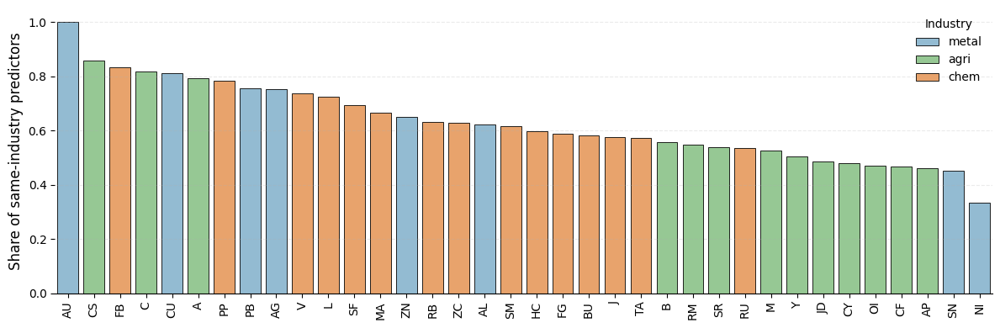

In [15]:
import collections, numpy as np, pandas as pd, seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

# ------------------------------------------------------------
# 0.  build/refresh df  (same logic as before)
# ------------------------------------------------------------
stat = []
for tgt, lst in all_features.items():
    c   = collections.Counter(lst)
    tot = len(lst)
    same = sum(v for k, v in c.items()
               if industry_map.get(k) == industry_map.get(tgt))
    stat.append({
        "target": tgt,
        "ratio" : same / tot if tot else np.nan,
        "industry": industry_map.get(tgt, "NA")
    })
df = (pd.DataFrame(stat)
        .dropna(subset=["ratio"])
        .sort_values("ratio", ascending=False))   # tallest bar first (left)

import matplotlib.pyplot as plt
import seaborn as sns

palette = {
    "metal": sns.color_palette("Blues", 6)[2],   # index 2/5 够柔和
    "agri" : sns.color_palette("Greens", 6)[2],
    "chem" : sns.color_palette("Oranges",6)[2],
}

fig, ax = plt.subplots(figsize=(12, 4))

sns.barplot(
    data=df,
    x="target", y="ratio",
    hue="industry",
    dodge=False,
    palette=palette,
    edgecolor="black",       # 细黑边更整洁
    linewidth=0.6,
    ax=ax
)

# ────────── 美化 ──────────
ax.set_ylabel("Share of same-industry predictors", fontsize=12)
ax.set_xlabel("")
ax.set_ylim(0, 1.05)
ax.grid(axis="y", linestyle="--", alpha=0.25)
ax.legend(title="Industry", loc="upper right", frameon=False)
plt.xticks(rotation=90)
sns.despine(left=True, bottom=False)

fig.tight_layout()
fig.savefig("same_industry_ratio_lowSat.png", dpi=300, bbox_inches="tight")

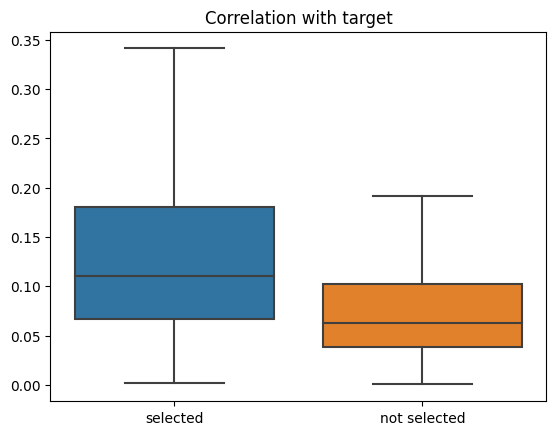

In [26]:
corr_mat = df_cleaned.corr()
corr_selected = []
corr_unselected = []
for tgt, lst in all_features.items():
    selected_set = set(lst)
    for base in corr_mat.columns:
        if base==tgt: continue
        if base in selected_set:
            corr_selected.append(corr_mat.loc[tgt, base])
        else:
            corr_unselected.append(corr_mat.loc[tgt, base])

sns.boxplot(data=[corr_selected, corr_unselected], showfliers=False)
plt.xticks([0,1], ['selected','not selected'])
plt.title('Correlation with target')
plt.show()

#### Time pattern of the day

In [2]:
import pandas as pd
time_oos = pd.read_csv('/mnt/data/time_oos.csv')
time_oos

,time,las,rid,enet,pcr,pls
0,09:03,0.005034,-0.003182,0.004874,0.001703,-0.003794
1,09:04,-0.001435,-0.008989,-0.001406,-0.008119,-0.011054
2,09:05,0.012197,0.010128,0.011988,0.011016,0.008588
3,09:06,0.001057,-0.003355,0.000715,-0.001868,-0.003397
4,09:07,0.008443,0.006348,0.008375,0.002975,0.003674
...,...,...,...,...,...,...
218,14:56,0.011205,0.009644,0.011328,0.009107,0.009536
219,14:57,0.010029,0.004809,0.009978,0.006792,0.002459
220,14:58,0.002400,-0.001121,0.002350,-0.000808,-0.000237
221,14:59,-0.000784,-0.006712,-0.000488,-0.005647,-0.004592


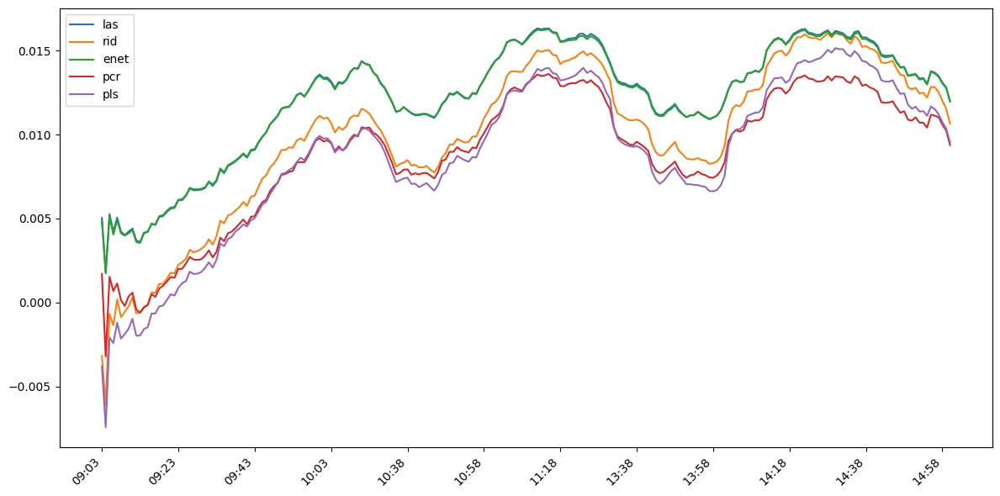

In [7]:
df_smoothed = time_oos.copy()
for col in ['las', 'rid', 'enet', 'pcr', 'pls']:
    df_smoothed[col] = df_smoothed[col].rolling(window=30, min_periods=1).mean()

# 2. 绘图
fig, ax = plt.subplots(figsize=(12, 6))
for col in ['las', 'rid', 'enet', 'pcr', 'pls']:
    ax.plot(df_smoothed['time'], df_smoothed[col], label=col)

# 3. 控制 x 轴刻度：每隔 20 个点画一个
step = 20
pos = list(range(0, len(df_smoothed), step))
labels = df_smoothed['time'].iloc[pos]
ax.set_xticks(pos)
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.legend()
plt.tight_layout()

# 4. 保存
plt.savefig('time_oos_smoothed_plot.png', dpi=300)
plt.show()